In [42]:
library(DBI)
library(RSQLite)
library(dplyr)
library(ggplot2)

In [ ]:
#if(!require(ggExtra)) {install.packages("ggExtra");require(ggExtra)}
#if(!require(naniar)) {install.packages("naniar");require(naniar)}
#if(!require(mvoutlier)) {install.packages("mvoutlier");require(mvoutlier)}
#if(!require(MissMech)) {install.packages("MissMech");require(MissMech)}
#if(!require(mice)) {install.packages("mice");require(mice)}
#if(!require(MatchIt)) {install.packages("MatchIt");require(MatchIt)}

In [43]:
con <- dbConnect(odbc::odbc(), .connection_string = "DSN=grocerries;Trusted_connection=yes;", timeout=10)

In [44]:
df <- dbReadTable(con,"project_flatfilev") 

In [45]:
dim(df)

[1] 2107339      85

In [7]:
summary(df)

   item_nbr          store_nbr              Year          month       
 Length:2107339     Length:2107339     Min.   :2013   Min.   : 1.000  
 Class :character   Class :character   1st Qu.:2014   1st Qu.: 3.000  
 Mode  :character   Mode  :character   Median :2015   Median : 6.000  
                                       Mean   :2015   Mean   : 6.334  
                                       3rd Qu.:2016   3rd Qu.: 9.000  
                                       Max.   :2017   Max.   :12.000  
                                                                      
 total_unit_sales       city              state            store_type       
 Min.   :    0.24   Length:2107339     Length:2107339     Length:2107339    
 1st Qu.:   56.00   Class :character   Class :character   Class :character  
 Median :  115.00   Mode  :character   Mode  :character   Mode  :character  
 Mean   :  225.18                                                           
 3rd Qu.:  243.00                              

In [46]:
city_sales <- dbReadTable(con,"sales_by_cities")

In [47]:
df=inner_join(df,city_sales, by=c("city","Year","month"))

In [48]:
clusters <- dbReadTable(con,"store_cluster_by_store")
df=inner_join(df,clusters, by="store_nbr")

In [11]:
head(df)

,item_nbr,store_nbr,Year,month,total_unit_sales,city,state,store_type,store_cluster,prev_month_sales,...,cluster8,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17
,<chr>,<chr>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,1003679,1,2013,1,53,Quito,Pichincha,D,13,NA,...,0,0,0,0,0,1,0,0,0,0
2,1003679,1,2013,2,86,Quito,Pichincha,D,13,53,...,0,0,0,0,0,1,0,0,0,0
3,1003679,1,2013,3,46,Quito,Pichincha,D,13,86,...,0,0,0,0,0,1,0,0,0,0
4,1003679,1,2013,4,44,Quito,Pichincha,D,13,46,...,0,0,0,0,0,1,0,0,0,0
5,1003679,1,2013,5,44,Quito,Pichincha,D,13,44,...,0,0,0,0,0,1,0,0,0,0
6,1003679,1,2013,6,47,Quito,Pichincha,D,13,44,...,0,0,0,0,0,1,0,0,0,0


In [49]:
l1 <- c()
for (v in names(df)){
    if (length(unique(df[[v]]))==1){
        l1<- c(l1,v)
    }
}

In [50]:
 df <- df[ , !names(df) %in% l1]

In [51]:
head(df)

,item_nbr,store_nbr,Year,month,total_unit_sales,city,state,store_type,store_cluster,prev_month_sales,...,cluster8,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17
,<chr>,<chr>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,1003679,1,2013,1,53,Quito,Pichincha,D,13,NA,...,0,0,0,0,0,1,0,0,0,0
2,1003679,1,2013,2,86,Quito,Pichincha,D,13,53,...,0,0,0,0,0,1,0,0,0,0
3,1003679,1,2013,3,46,Quito,Pichincha,D,13,86,...,0,0,0,0,0,1,0,0,0,0
4,1003679,1,2013,4,44,Quito,Pichincha,D,13,46,...,0,0,0,0,0,1,0,0,0,0
5,1003679,1,2013,5,44,Quito,Pichincha,D,13,44,...,0,0,0,0,0,1,0,0,0,0
6,1003679,1,2013,6,47,Quito,Pichincha,D,13,44,...,0,0,0,0,0,1,0,0,0,0


In [15]:
for (v in names(df)){
    print(v)
    print(class(df[[v]]))
}

[1] "item_nbr"
[1] "character"
[1] "store_nbr"
[1] "character"
[1] "Year"
[1] "integer"
[1] "month"
[1] "integer"
[1] "total_unit_sales"
[1] "numeric"
[1] "city"
[1] "character"
[1] "state"
[1] "character"
[1] "store_type"
[1] "character"
[1] "store_cluster"
[1] "character"
[1] "prev_month_sales"
[1] "numeric"
[1] "prev_3month_sales"
[1] "numeric"
[1] "avg_prev_3months_sales"
[1] "numeric"
[1] "min_prev_3months_sales"
[1] "numeric"
[1] "max_prev_3months_sales"
[1] "numeric"
[1] "monthly_oilprice_avg"
[1] "numeric"
[1] "total_month_holidays"
[1] "integer"
[1] "total_month_transactions"
[1] "numeric"
[1] "prev_month_transactions"
[1] "numeric"
[1] "prev_3month_transactions"
[1] "numeric"
[1] "avg_prev_3months_transactions"
[1] "numeric"
[1] "min_prev_3months_transactions"
[1] "numeric"
[1] "max_prev_3months_transactions"
[1] "numeric"
[1] "family"
[1] "character"
[1] "class"
[1] "character"
[1] "perishable"
[1] "character"
[1] "BREAD.BAKERY"
[1] "integer"
[1] "BEVERAGES"
[1] "integer"
[1

In [16]:
for (v in names(df)){
    print(v)
    print(length(unique(df[[v]])))
}

[1] "item_nbr"
[1] 824
[1] "store_nbr"
[1] 54
[1] "Year"
[1] 5
[1] "month"
[1] 12
[1] "total_unit_sales"
[1] 26622
[1] "city"
[1] 22
[1] "state"
[1] 16
[1] "store_type"
[1] 5
[1] "store_cluster"
[1] 17
[1] "prev_month_sales"
[1] 26147
[1] "prev_3month_sales"
[1] 25161
[1] "avg_prev_3months_sales"
[1] 34906
[1] "min_prev_3months_sales"
[1] 16109
[1] "max_prev_3months_sales"
[1] 16942
[1] "monthly_oilprice_avg"
[1] 55
[1] "total_month_holidays"
[1] 6
[1] "total_month_transactions"
[1] 2703
[1] "prev_month_transactions"
[1] 2654
[1] "prev_3month_transactions"
[1] 2543
[1] "avg_prev_3months_transactions"
[1] 2732
[1] "min_prev_3months_transactions"
[1] 1463
[1] "max_prev_3months_transactions"
[1] 1360
[1] "family"
[1] 14
[1] "class"
[1] 129
[1] "perishable"
[1] 3
[1] "BREAD.BAKERY"
[1] 2
[1] "BEVERAGES"
[1] 2
[1] "DAIRY"
[1] 2
[1] "PERSONAL.CARE"
[1] 2
[1] "HOME.CARE"
[1] 2
[1] "FROZEN.FOODS"
[1] 2
[1] "POULTRY"
[1] 2
[1] "GROCERY.II"
[1] 2
[1] "X.LIQUOR"
[1] 2
[1] "EGGS"
[1] 2
[1] "GROCER

In [52]:
l1

[1] "SEAFOOD"                    "LAWN.AND.GARDEN"           
 [3] "HOME.AND.KITCHEN"           "SCHOOL.AND.OFFICE.SUPPLIES"
 [5] "AUTOMOTIVE"                 "BOOKS"                     
 [7] "LINGERIE"                   "PREPARED.FOOD"             
 [9] "MAGAZINES"                  "PET.SUPPLIES"              
[11] "HOME.APPLIANCES"            "PRODUCE"                   
[13] "HARDWARE"                   "BEAUTY"                    
[15] "PLAYERS.AND.ELECTRONICS"    "CELEBRATION"               
[17] "MEATS"                      "LADIESWEAR"                
[19] "BABY.CARE"                  "HOME.AND.KITCHEN.II"

In [53]:
# vector of numeric features
l2 <- c()
for (v in names(df)){
    if (is.numeric(df[[v]])==T)
          {l2<- c(l2,v)
    } 
}

In [54]:
l2

[1] "Year"                          "month"                        
 [3] "total_unit_sales"              "prev_month_sales"             
 [5] "prev_3month_sales"             "avg_prev_3months_sales"       
 [7] "min_prev_3months_sales"        "max_prev_3months_sales"       
 [9] "monthly_oilprice_avg"          "total_month_holidays"         
[11] "total_month_transactions"      "prev_month_transactions"      
[13] "prev_3month_transactions"      "avg_prev_3months_transactions"
[15] "min_prev_3months_transactions" "max_prev_3months_transactions"
[17] "BREAD.BAKERY"                  "BEVERAGES"                    
[19] "DAIRY"                         "PERSONAL.CARE"                
[21] "HOME.CARE"                     "FROZEN.FOODS"                 
[23] "POULTRY"                       "GROCERY.II"                   
[25] "X.LIQUOR"                      "EGGS"                         
[27] "GROCERY.I"                     "CLEANING"                     
[29] "DELI"                          "store_typeA"                  
[31] "store_typeB"                   "store_typeC"                  
[33] "store_typeD"                   "store_typeE"                  
[35] "city_Ambato"                   "city_Babahoyo"                
[37] "city_Cayambe"                  "city_Cuenca"                  
[39] "city_Daule"                    "city_El.Carmen"               
[41] "city_Esmeraldas"               "city_Guaranda"                
[43] "city_Guayaquil"                "city_Ibarra"                  
[45] "city_Latacunga"                "city_Libertad"                
[47] "city_Loja"                     "city_Machala"                 
[49] "city_Manta"                    "city_Playas"                  
[51] "city_Puyo"                     "city_Quevedo"                 
[53] "city_Quito"                    "city_Riobamba"                
[55] "city_Salinas"                  "city_Santo.Domingo"           
[57] "total_city_sales"              "sales_perc"                   
[59] "cluster1"                      "cluster2"                     
[61] "cluster3"                      "cluster4"                     
[63] "cluster5"                      "cluster6"                     
[65] "cluster7"                      "cluster8"                     
[67] "cluster9"                      "cluster10"                    
[69] "cluster11"                     "cluster12"                    
[71] "cluster13"                     "cluster14"                    
[73] "cluster15"                     "cluster16"                    
[75] "cluster17"

In [55]:
### vector of the categoric features 
cf<- c()
for (v in names(df)){
    if ((v %in% c('Year','month','store_nbr','item_nbr'))|(is.numeric(df[[v]])==F)|
        (max(df[[v]],na.rm=T)==1 & length(unique(df[[v]]))<=3))  {
        cf<- c(cf,v)
    } 
}

In [21]:
for (v in cf){
    print(v)
    print(length(unique(df[[v]])))
}

[1] "item_nbr"
[1] 824
[1] "store_nbr"
[1] 54
[1] "Year"
[1] 5
[1] "month"
[1] 12
[1] "city"
[1] 22
[1] "state"
[1] 16
[1] "store_type"
[1] 5
[1] "store_cluster"
[1] 17
[1] "family"
[1] 14
[1] "class"
[1] 129
[1] "perishable"
[1] 3
[1] "BREAD.BAKERY"
[1] 2
[1] "BEVERAGES"
[1] 2
[1] "DAIRY"
[1] 2
[1] "PERSONAL.CARE"
[1] 2
[1] "HOME.CARE"
[1] 2
[1] "FROZEN.FOODS"
[1] 2
[1] "POULTRY"
[1] 2
[1] "GROCERY.II"
[1] 2
[1] "X.LIQUOR"
[1] 2
[1] "EGGS"
[1] 2
[1] "GROCERY.I"
[1] 2
[1] "CLEANING"
[1] 2
[1] "DELI"
[1] 2
[1] "store_typeA"
[1] 2
[1] "store_typeB"
[1] 2
[1] "store_typeC"
[1] 2
[1] "store_typeD"
[1] 2
[1] "store_typeE"
[1] 2
[1] "city_Ambato"
[1] 2
[1] "city_Babahoyo"
[1] 2
[1] "city_Cayambe"
[1] 2
[1] "city_Cuenca"
[1] 2
[1] "city_Daule"
[1] 2
[1] "city_El.Carmen"
[1] 2
[1] "city_Esmeraldas"
[1] 2
[1] "city_Guaranda"
[1] 2
[1] "city_Guayaquil"
[1] 2
[1] "city_Ibarra"
[1] 2
[1] "city_Latacunga"
[1] 2
[1] "city_Libertad"
[1] 2
[1] "city_Loja"
[1] 2
[1] "city_Machala"
[1] 2
[1] "city_Manta

In [56]:
## vector of continuous features
nf<- c()
for (v in names(df)){
    if ((!v %in% c('Year','month','store_nbr','item_nbr'))&(is.numeric(df[[v]])==T)&
        (max(df[[v]],na.rm=T)>1 & length(unique(df[[v]]))>3))  {
        nf<- c(nf,v)
    } 
}

In [23]:
cf

[1] "item_nbr"           "store_nbr"          "Year"              
 [4] "month"              "city"               "state"             
 [7] "store_type"         "store_cluster"      "family"            
[10] "class"              "perishable"         "BREAD.BAKERY"      
[13] "BEVERAGES"          "DAIRY"              "PERSONAL.CARE"     
[16] "HOME.CARE"          "FROZEN.FOODS"       "POULTRY"           
[19] "GROCERY.II"         "X.LIQUOR"           "EGGS"              
[22] "GROCERY.I"          "CLEANING"           "DELI"              
[25] "store_typeA"        "store_typeB"        "store_typeC"       
[28] "store_typeD"        "store_typeE"        "city_Ambato"       
[31] "city_Babahoyo"      "city_Cayambe"       "city_Cuenca"       
[34] "city_Daule"         "city_El.Carmen"     "city_Esmeraldas"   
[37] "city_Guaranda"      "city_Guayaquil"     "city_Ibarra"       
[40] "city_Latacunga"     "city_Libertad"      "city_Loja"         
[43] "city_Machala"       "city_Manta"         "city_Playas"       
[46] "city_Puyo"          "city_Quevedo"       "city_Quito"        
[49] "city_Riobamba"      "city_Salinas"       "city_Santo.Domingo"
[52] "cluster1"           "cluster2"           "cluster3"          
[55] "cluster4"           "cluster5"           "cluster6"          
[58] "cluster7"           "cluster8"           "cluster9"          
[61] "cluster10"          "cluster11"          "cluster12"         
[64] "cluster13"          "cluster14"          "cluster15"         
[67] "cluster16"          "cluster17"

In [24]:
nf

[1] "total_unit_sales"              "prev_month_sales"             
 [3] "prev_3month_sales"             "avg_prev_3months_sales"       
 [5] "min_prev_3months_sales"        "max_prev_3months_sales"       
 [7] "monthly_oilprice_avg"          "total_month_holidays"         
 [9] "total_month_transactions"      "prev_month_transactions"      
[11] "prev_3month_transactions"      "avg_prev_3months_transactions"
[13] "min_prev_3months_transactions" "max_prev_3months_transactions"
[15] "total_city_sales"              "sales_perc"

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Removed 44098 rows containing non-finite values (stat_density)."


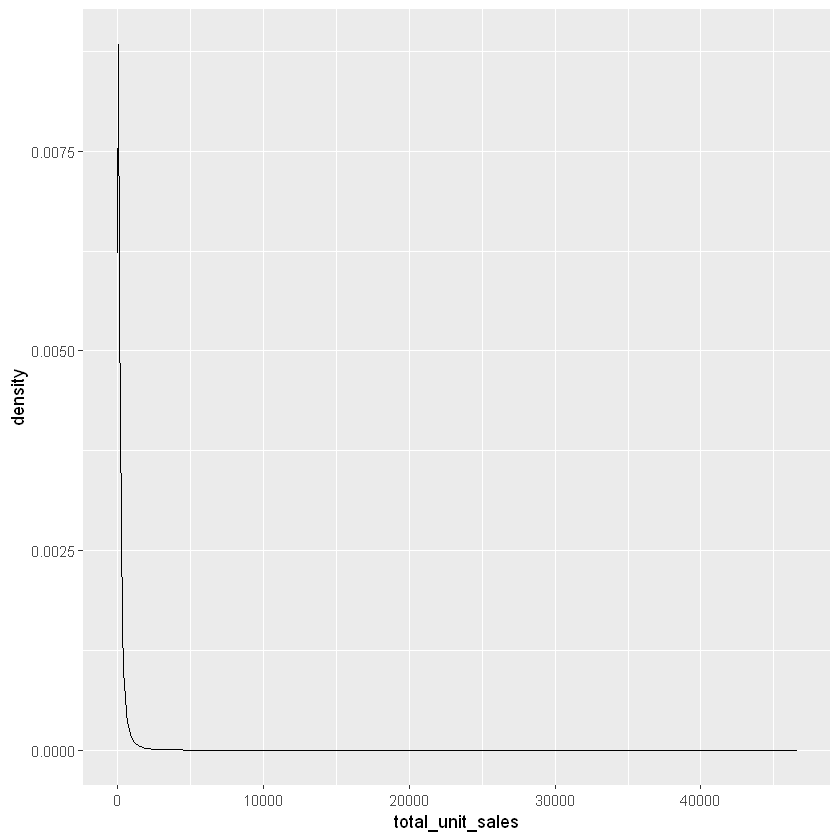

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Removed 132097 rows containing non-finite values (stat_density)."


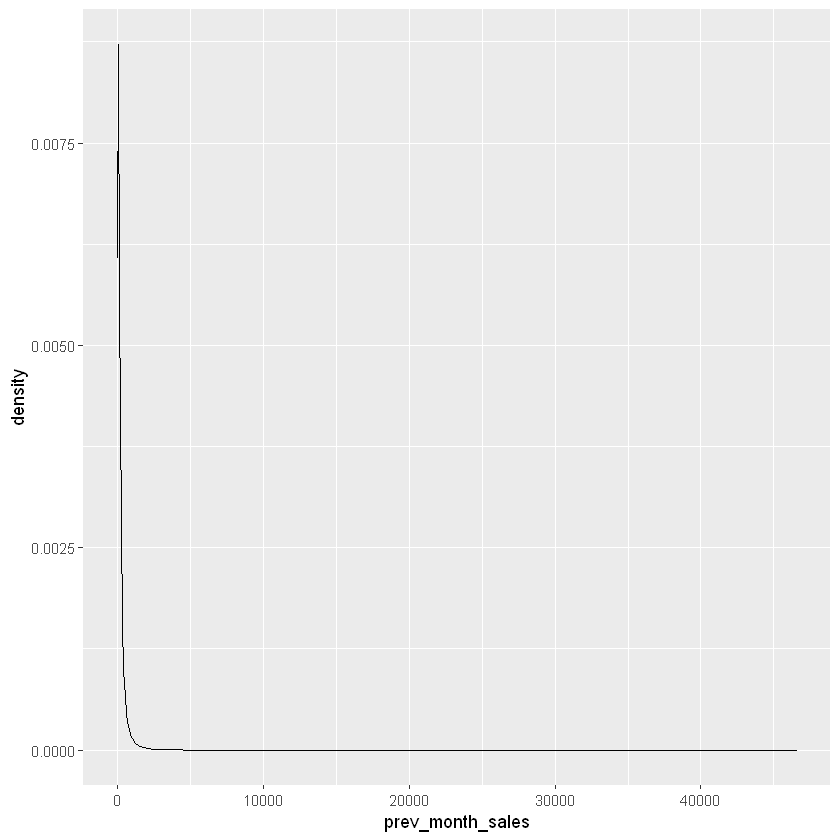

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


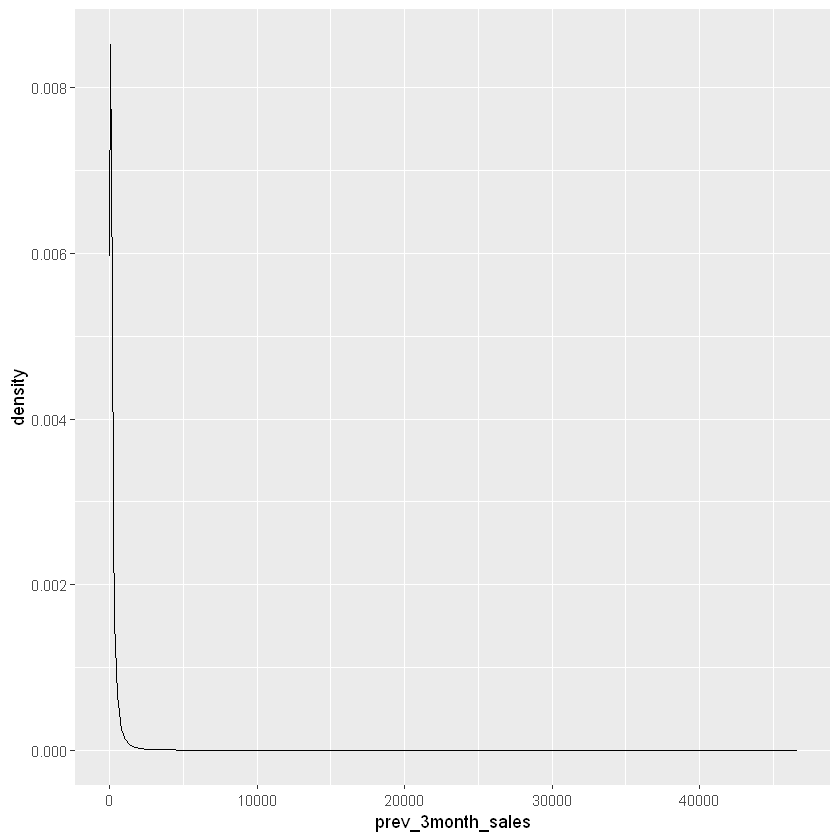

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


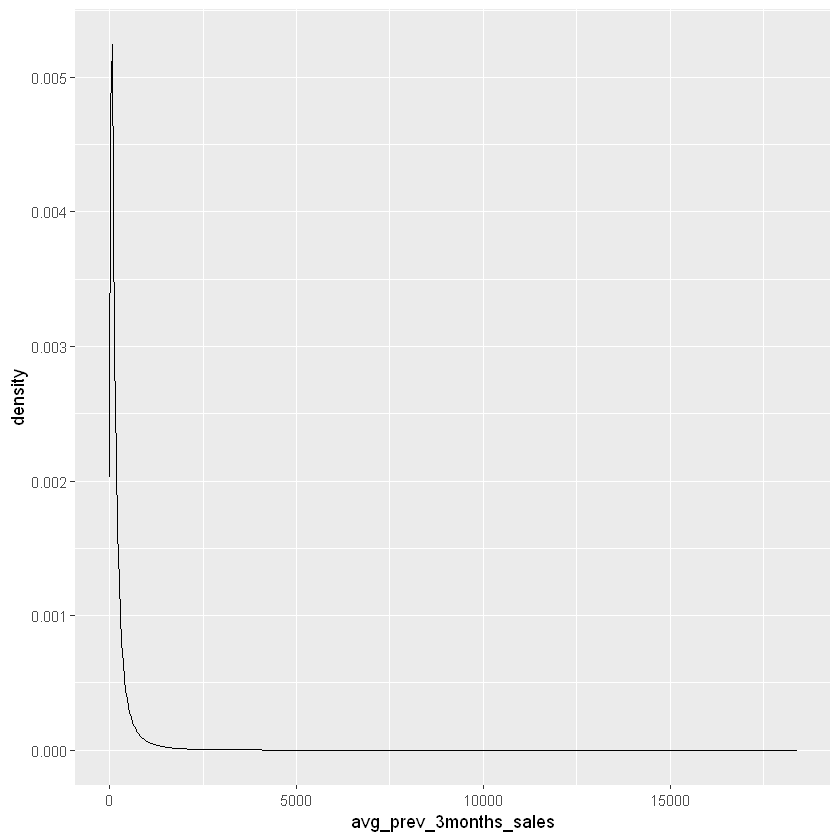

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


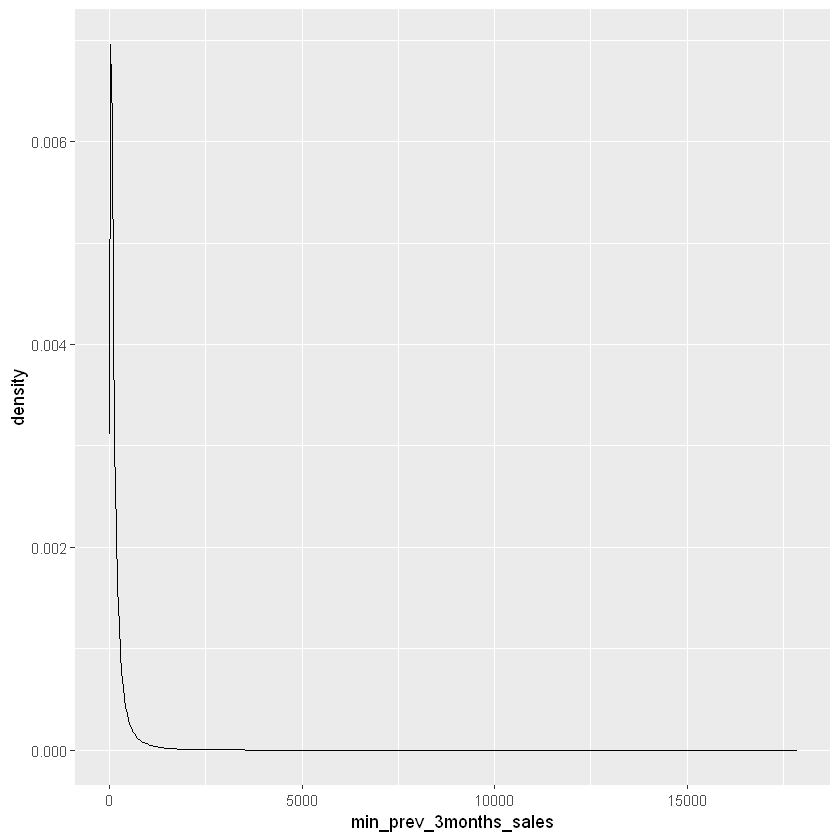

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


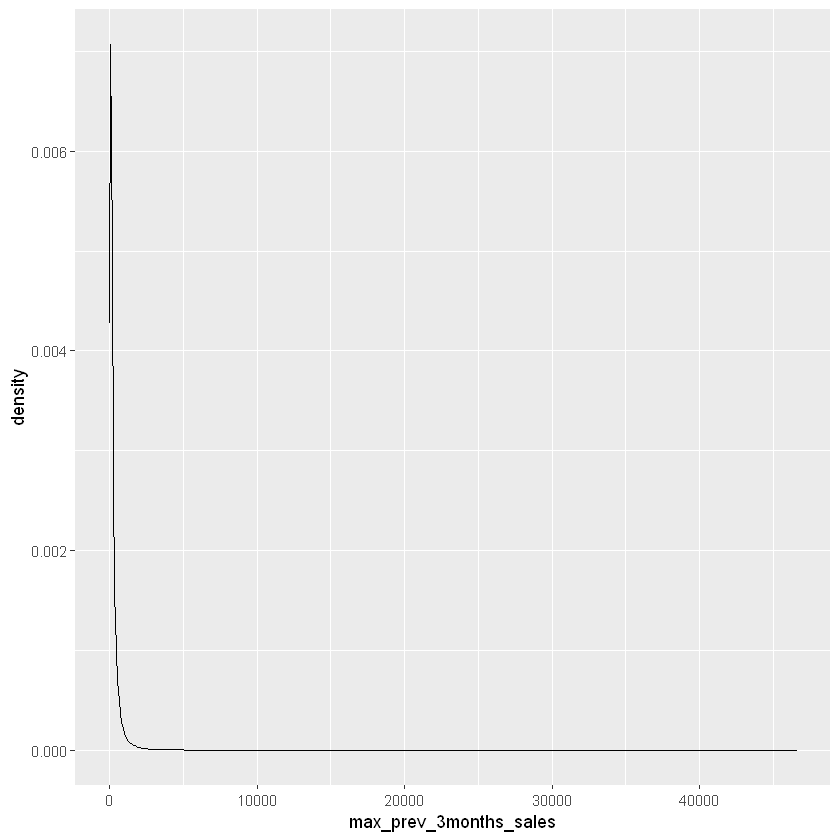

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


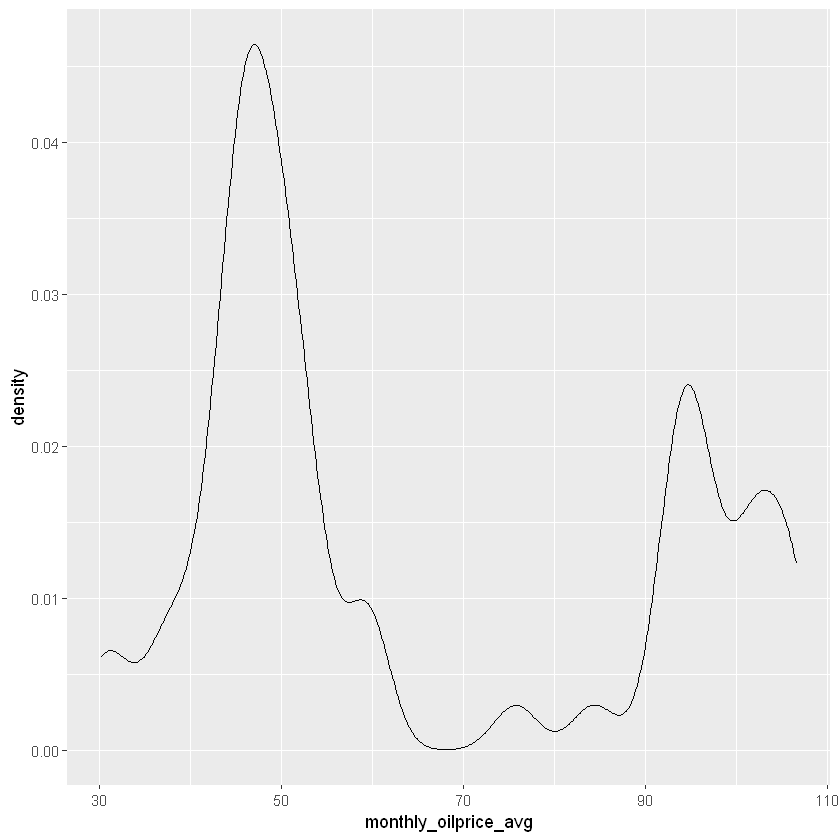

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


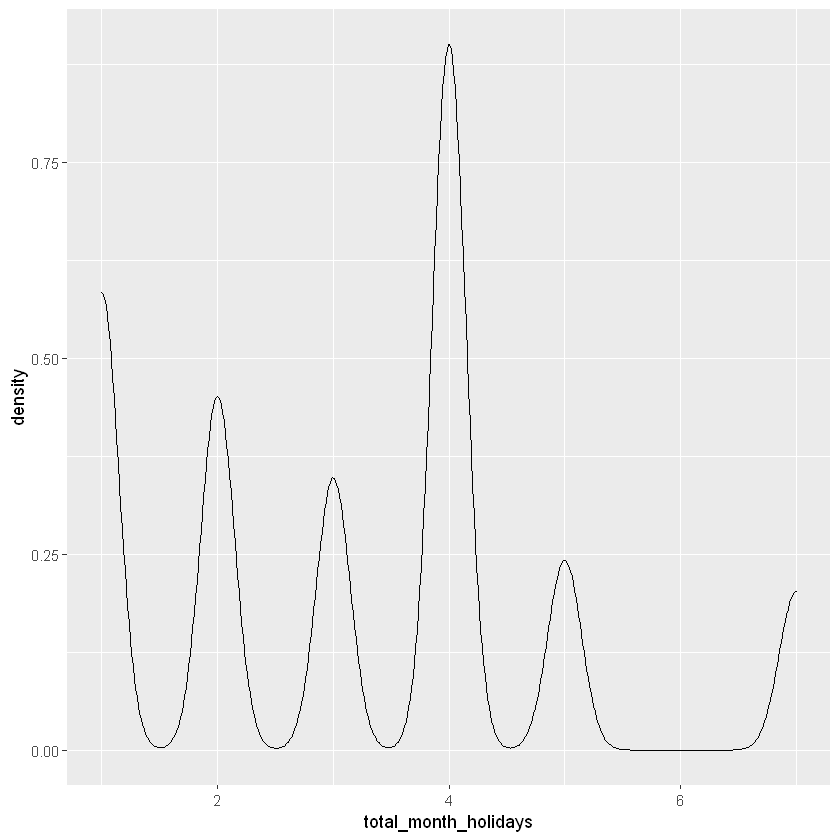

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Removed 35639 rows containing non-finite values (stat_density)."


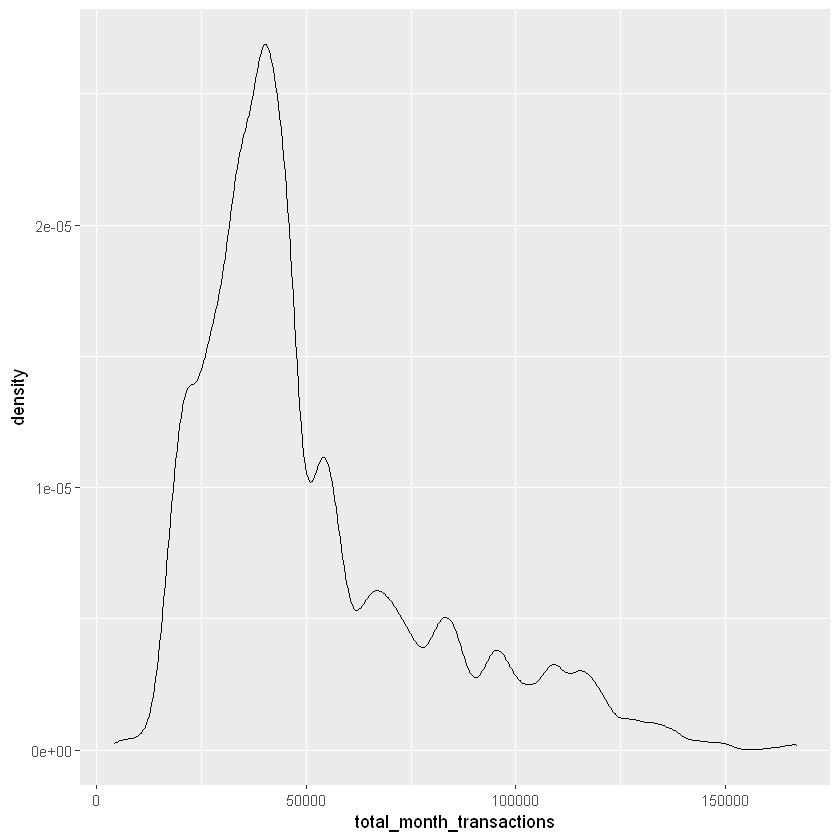

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Removed 108852 rows containing non-finite values (stat_density)."


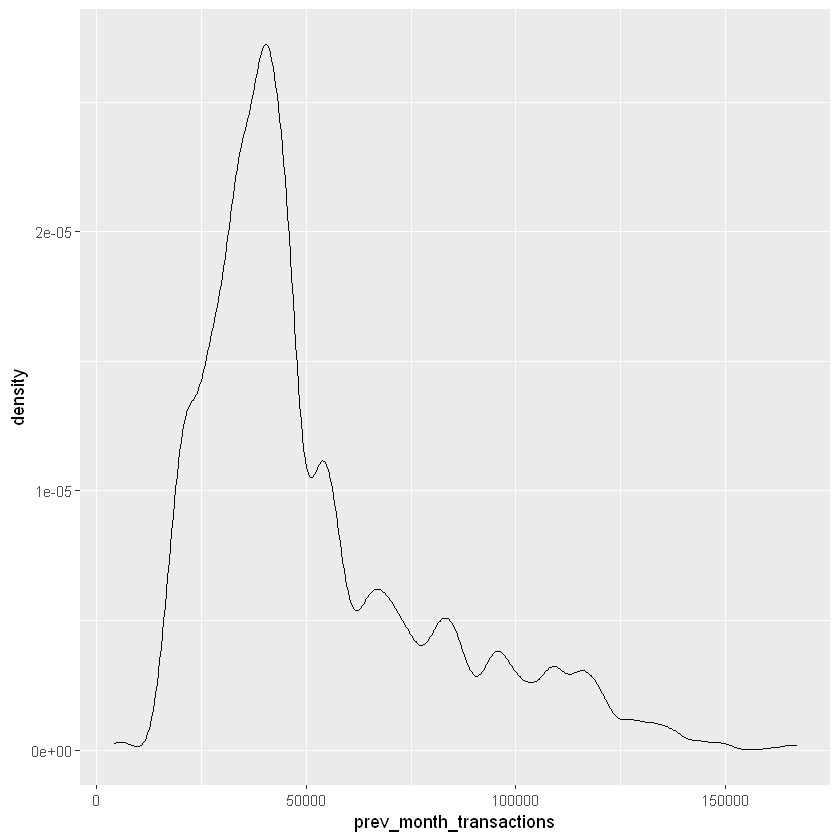

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


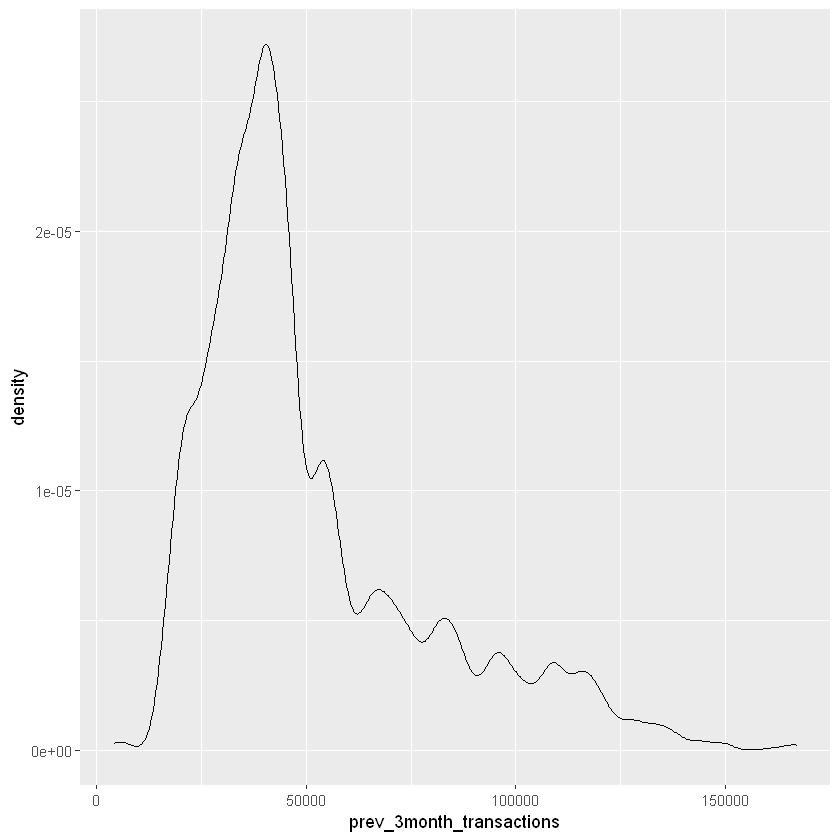

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


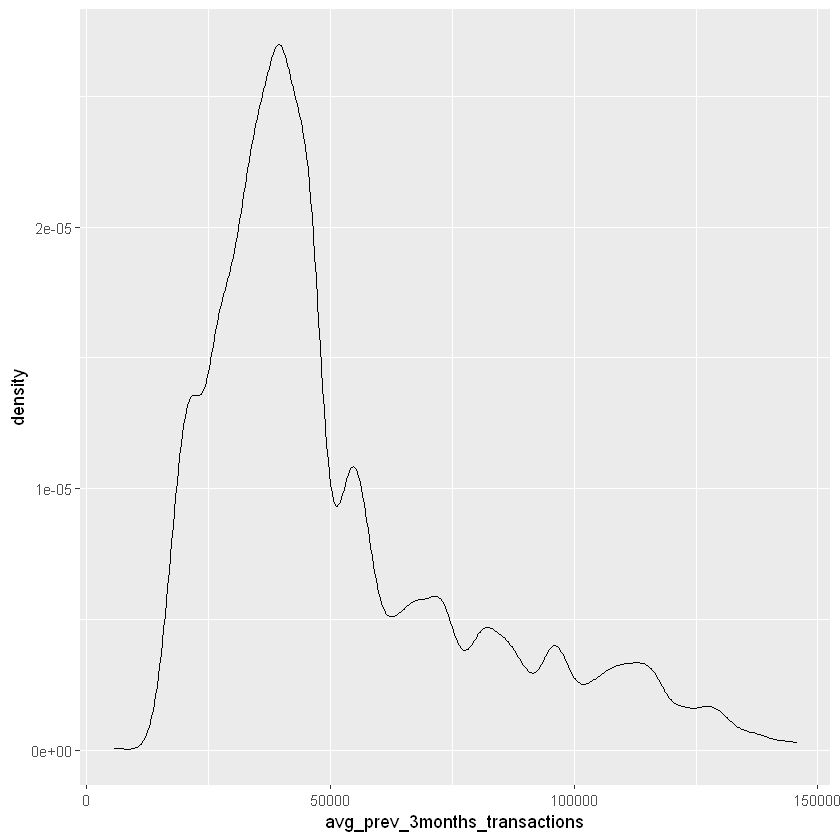

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


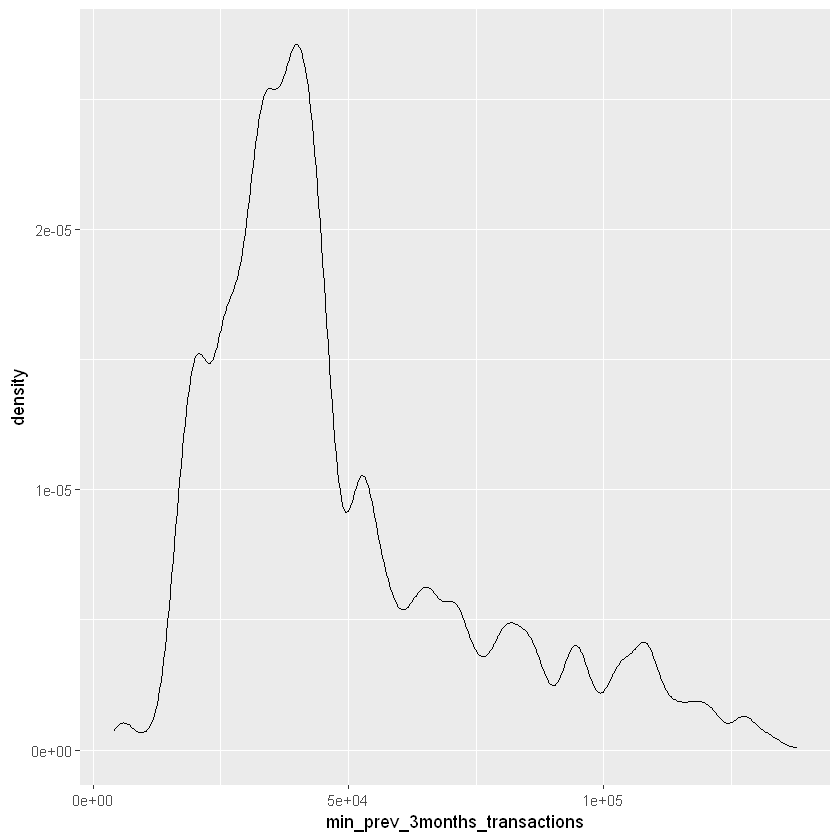

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


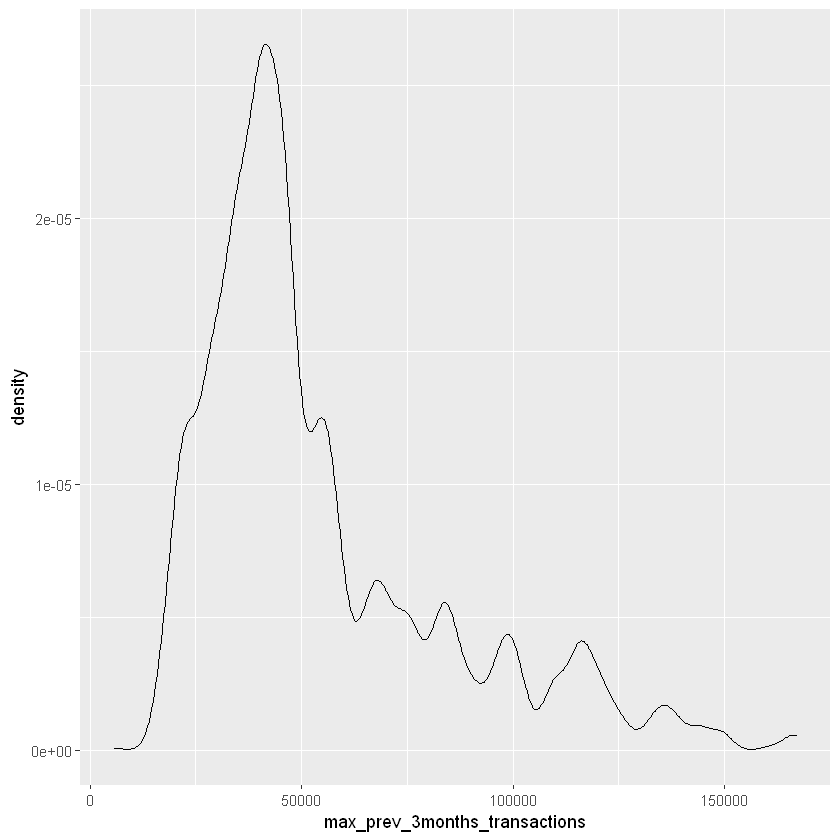

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


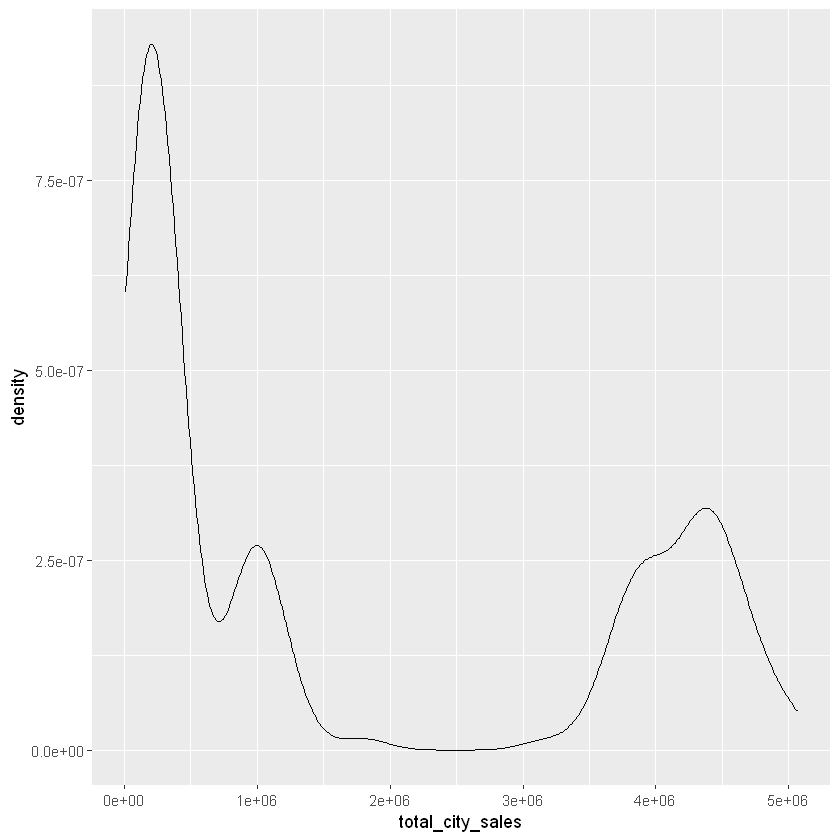

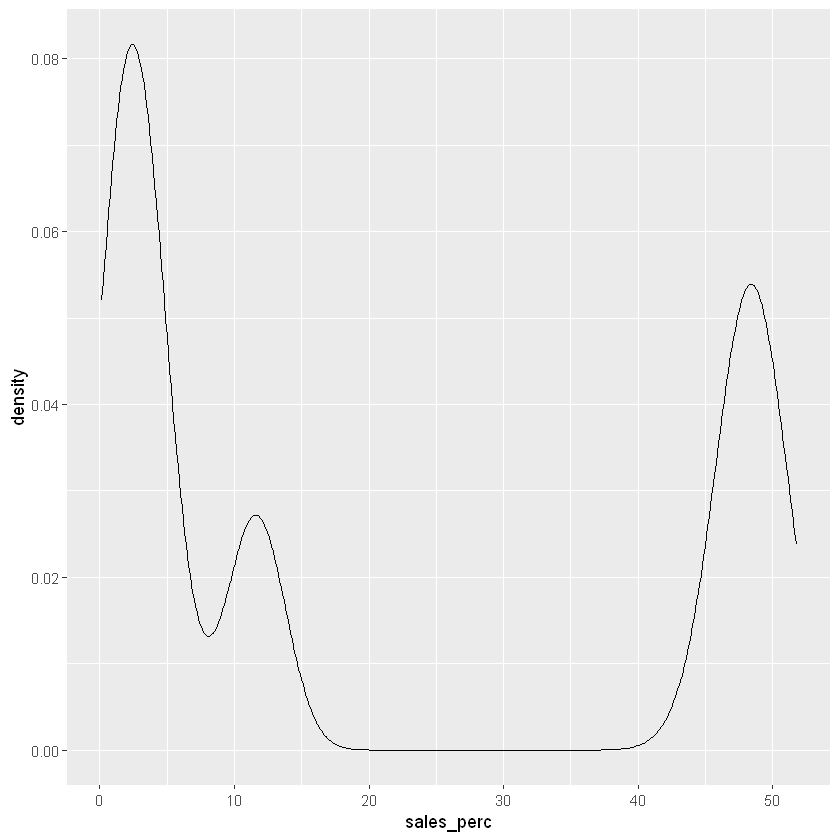

In [23]:
for (v in nf){
    print((ggplot(df,aes(x=df[[v]])) +
    geom_density(adjust=2) + xlab(v)))
}

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Removed 44098 rows containing non-finite values (stat_density)."


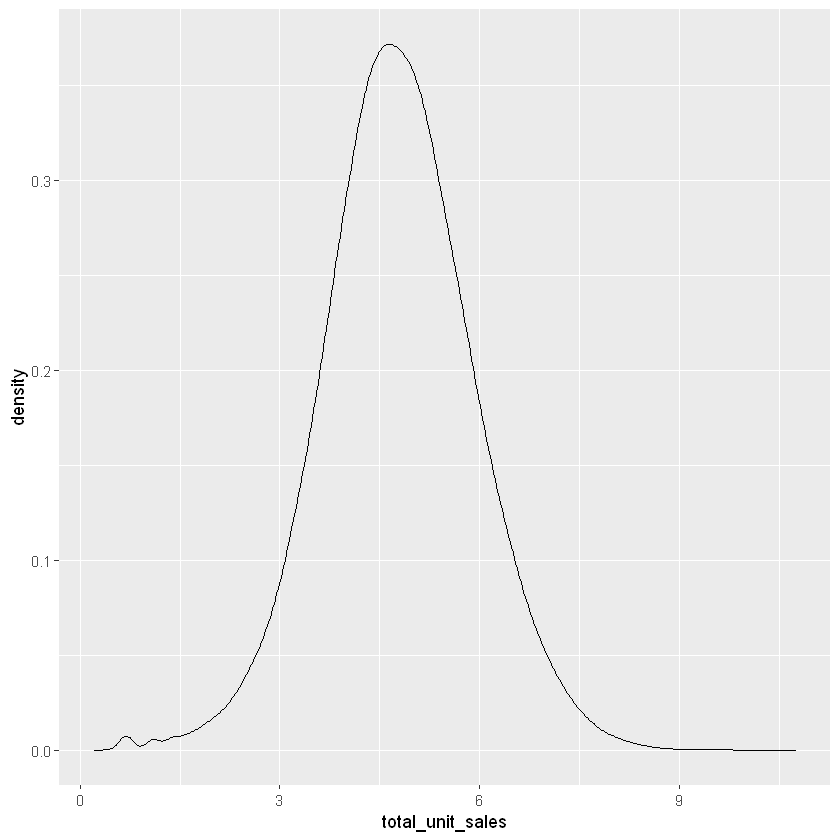

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Removed 132097 rows containing non-finite values (stat_density)."


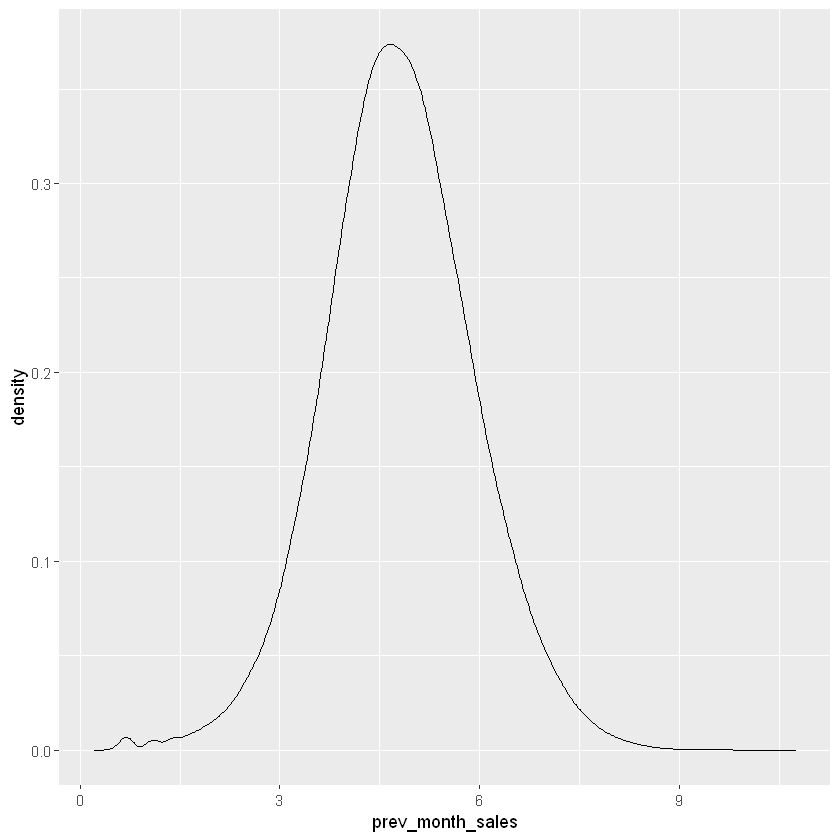

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


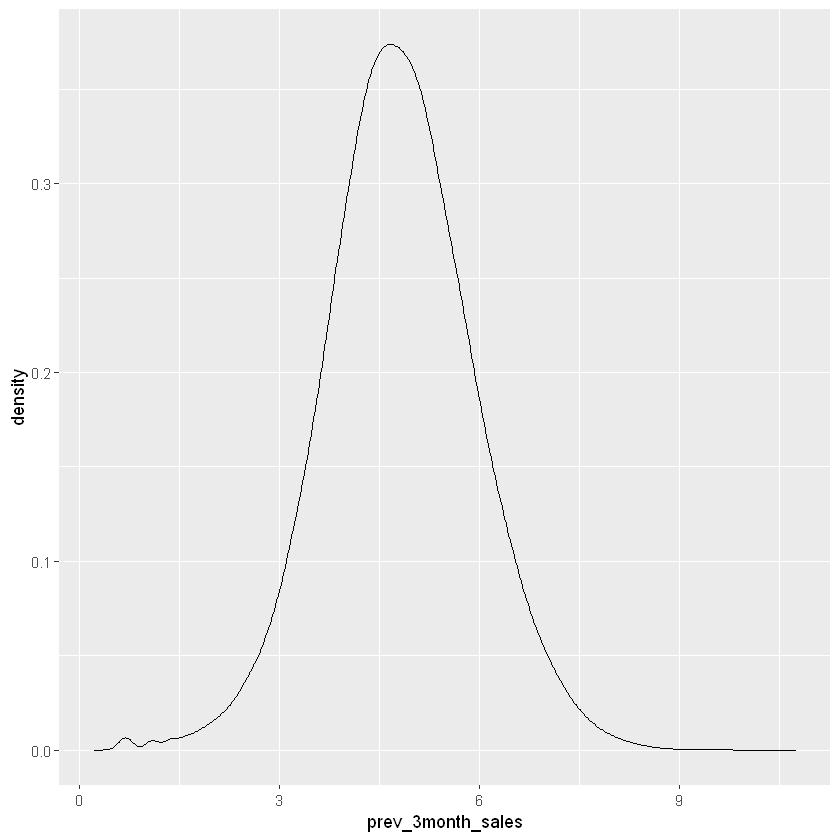

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


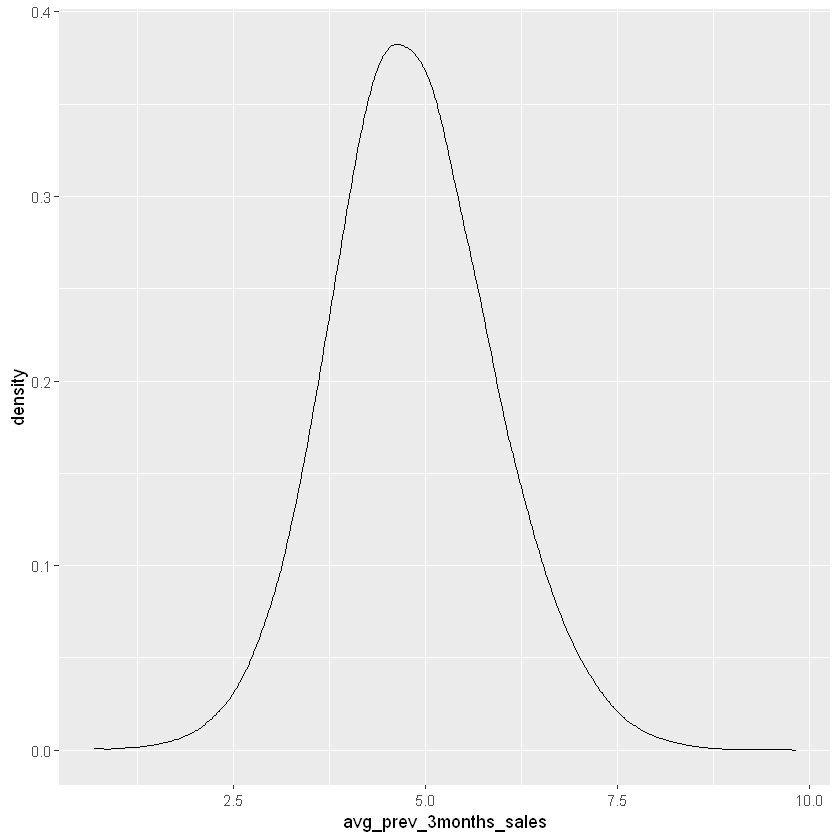

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


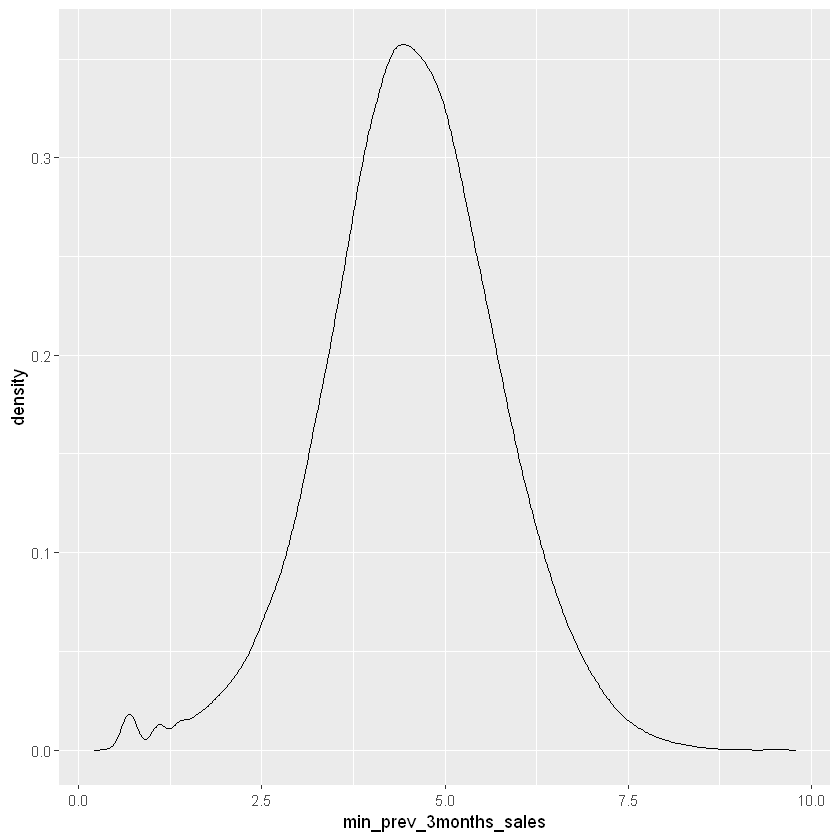

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


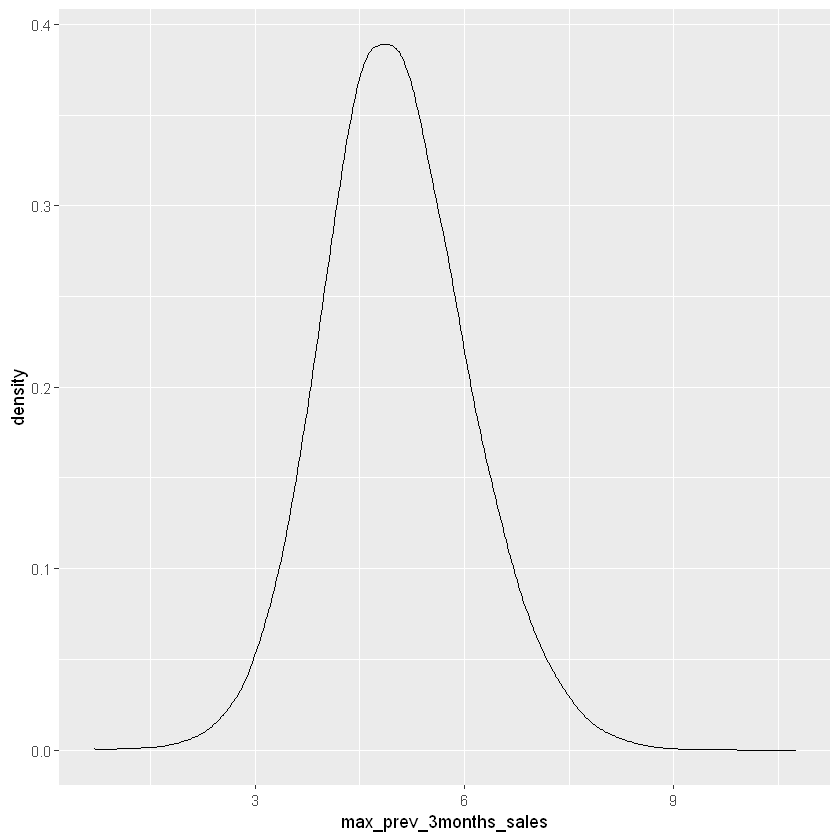

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


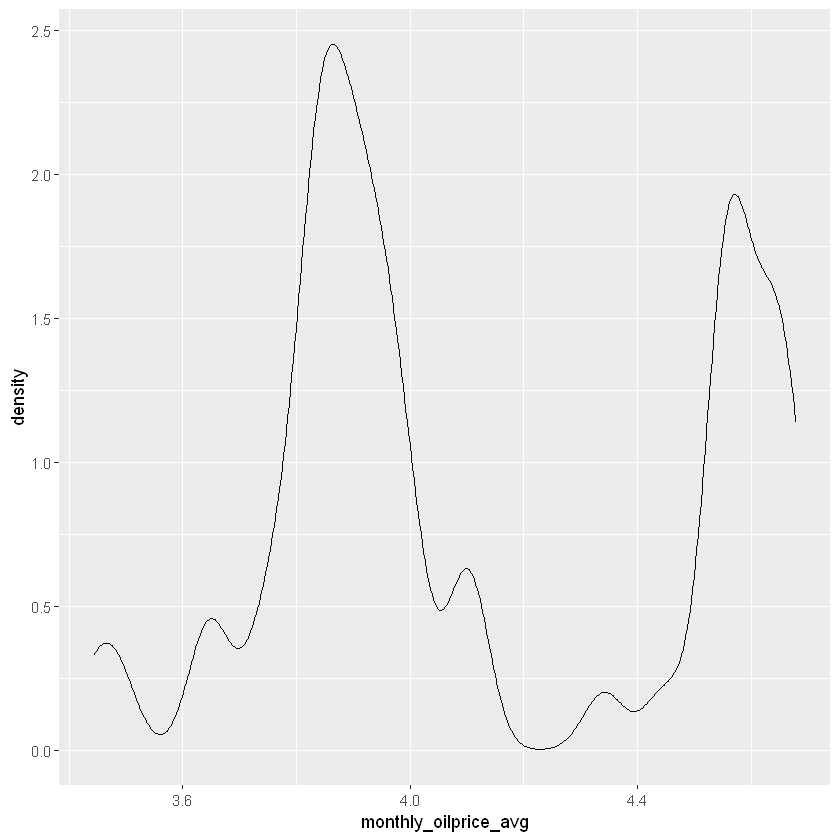

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


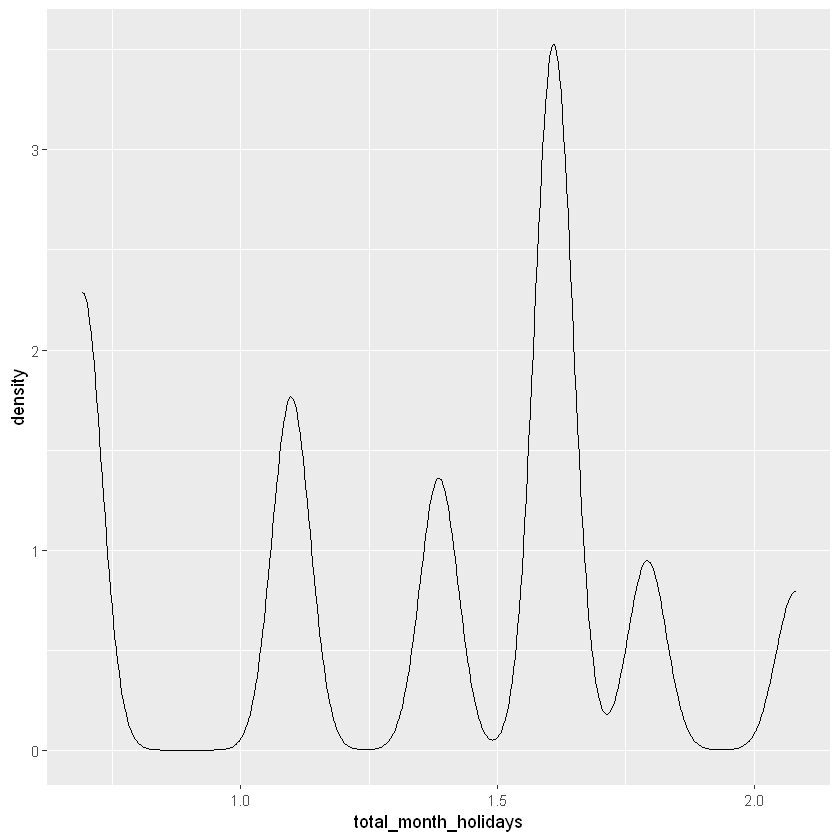

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Removed 35639 rows containing non-finite values (stat_density)."


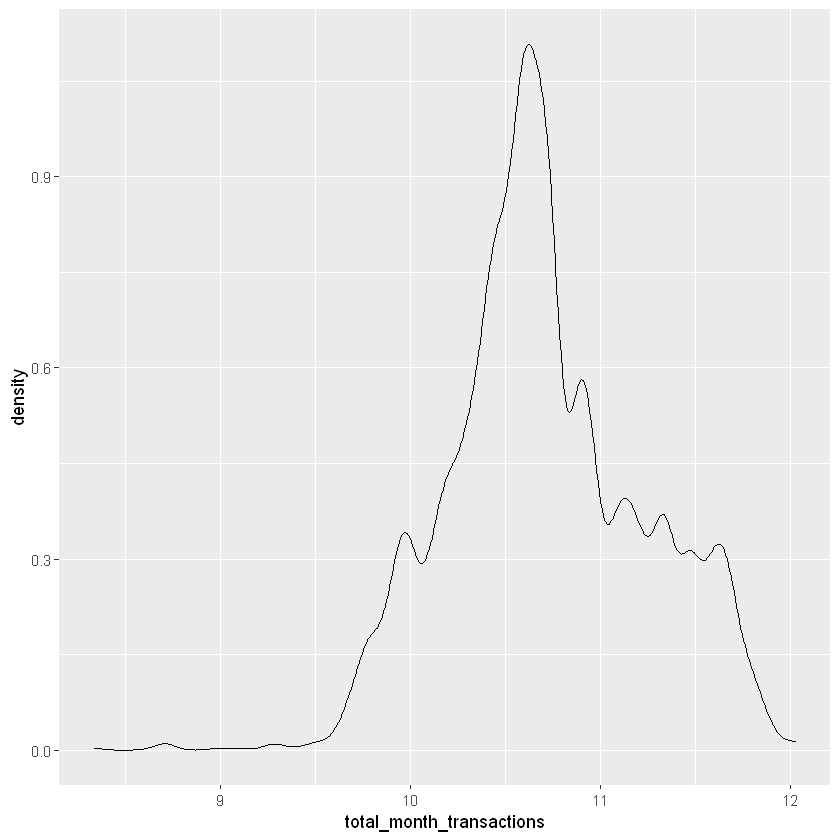

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Removed 108852 rows containing non-finite values (stat_density)."


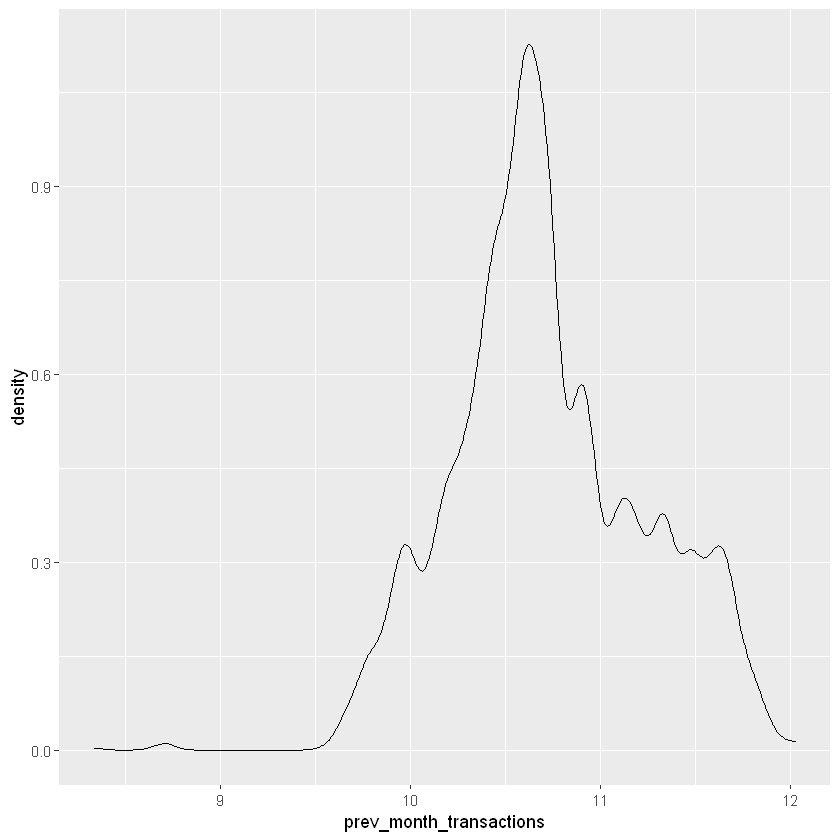

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


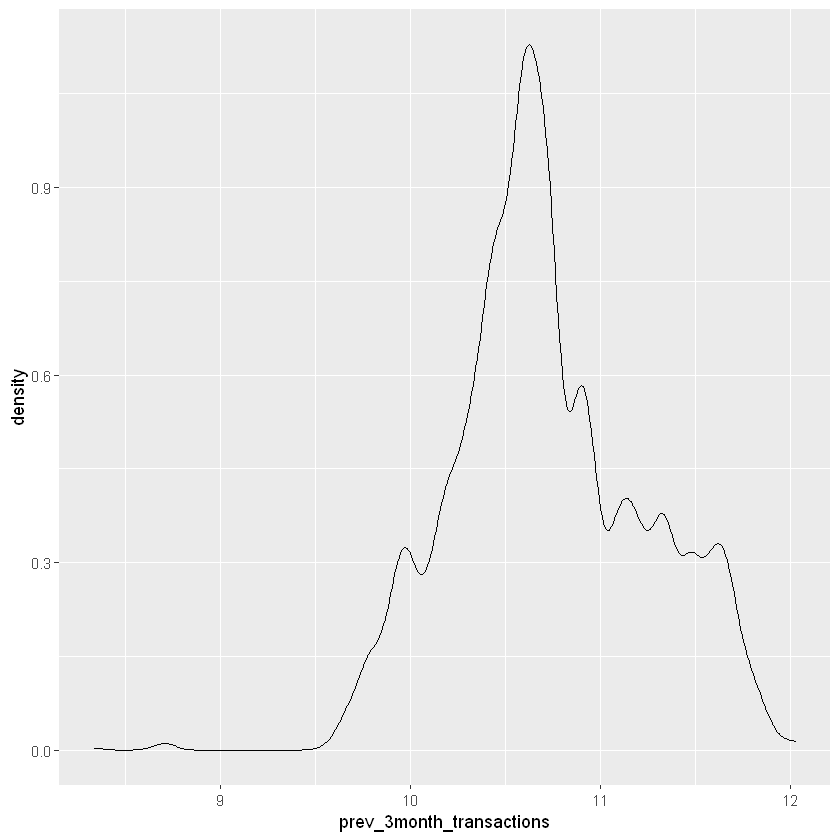

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


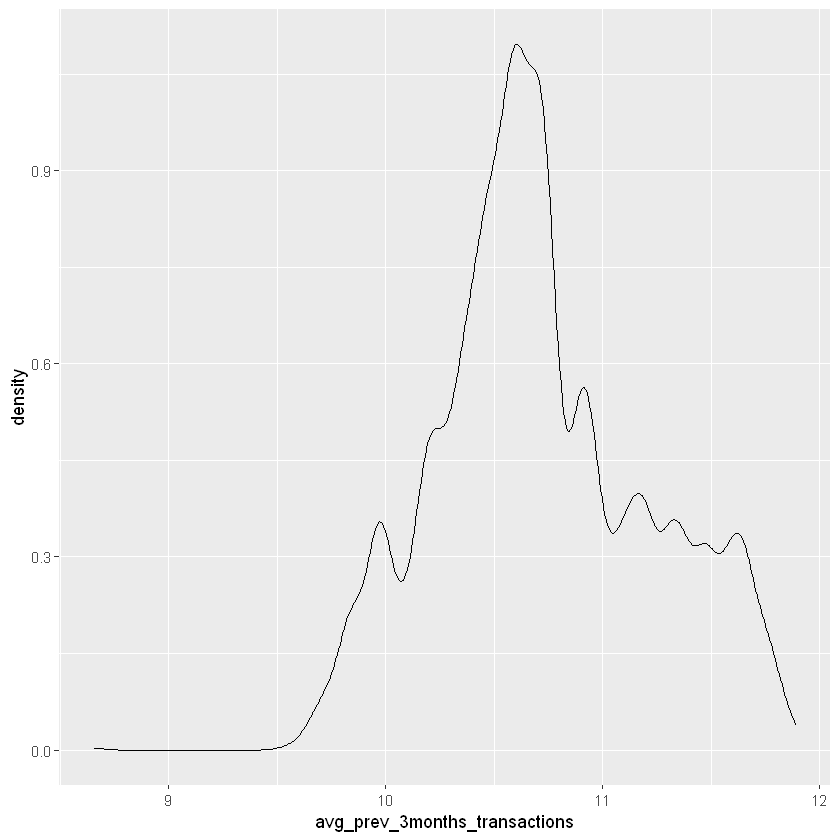

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


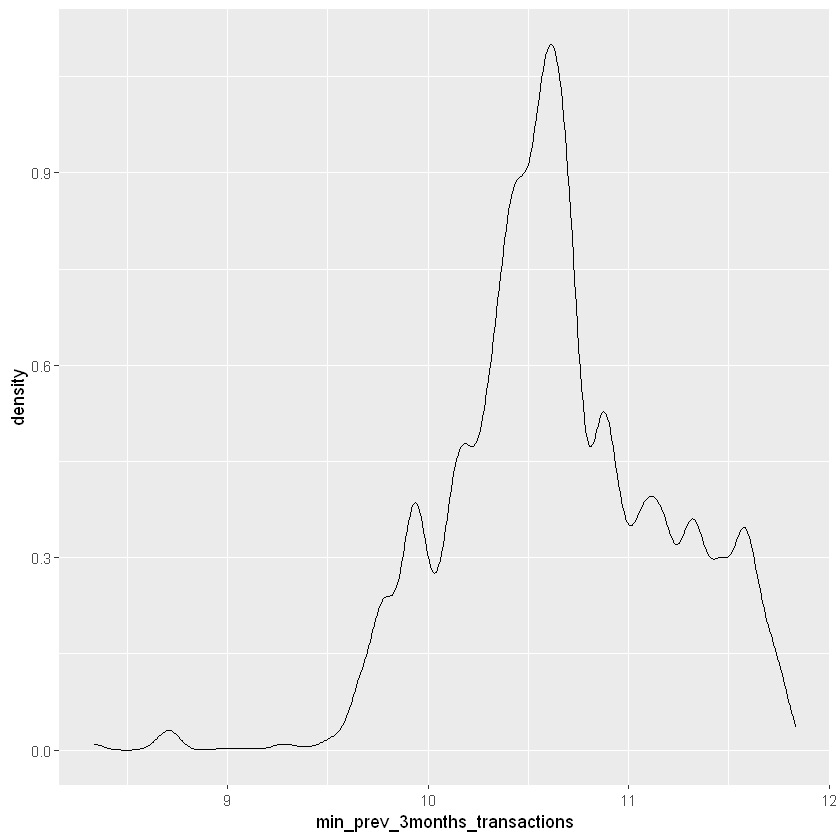

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


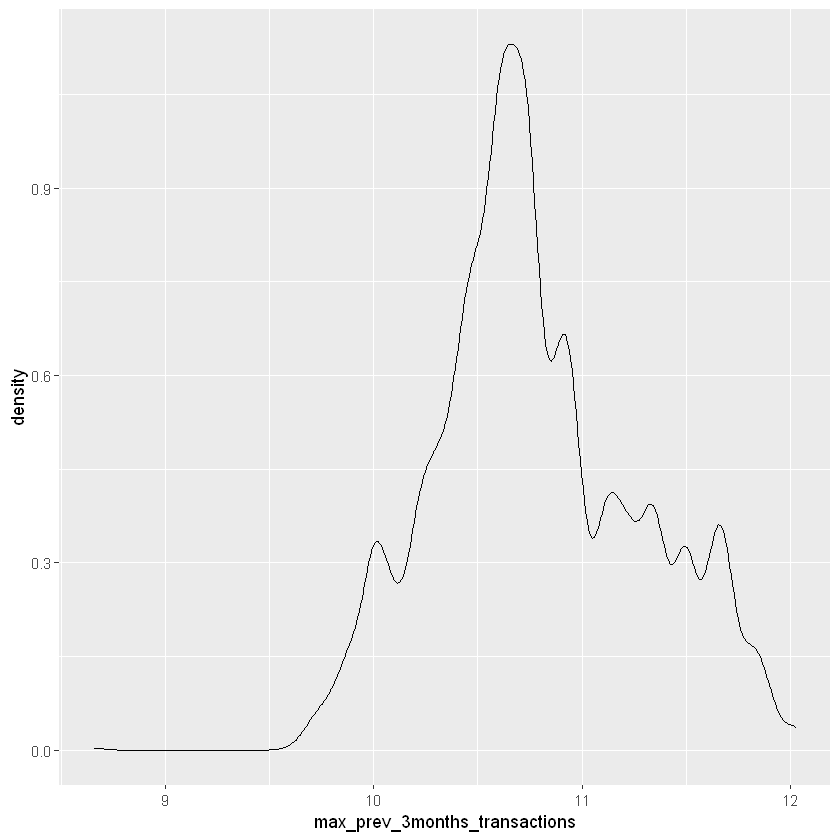

Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


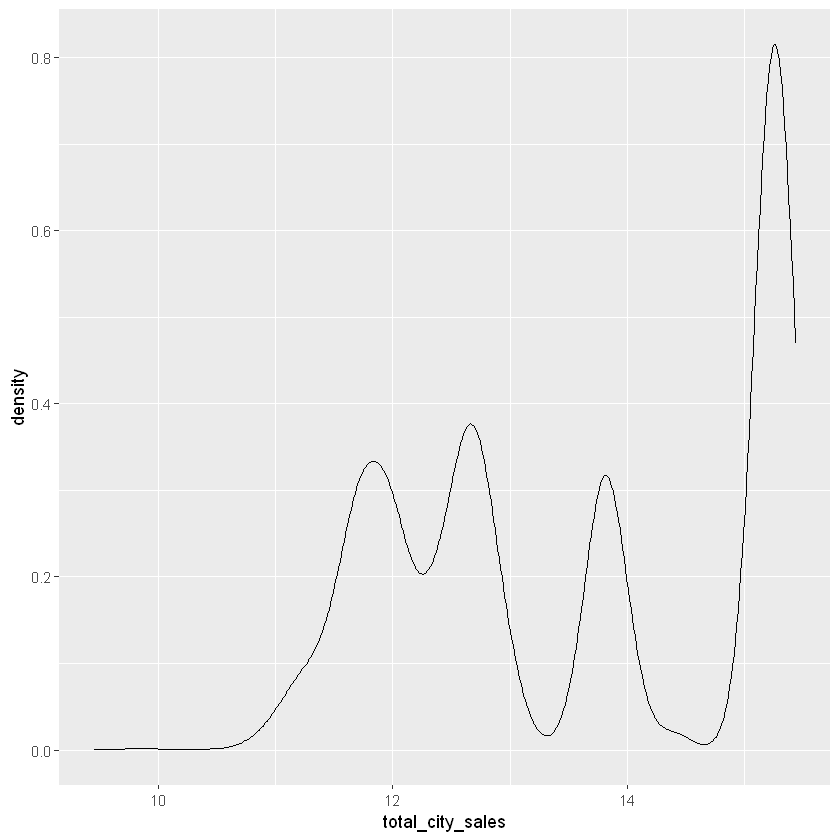

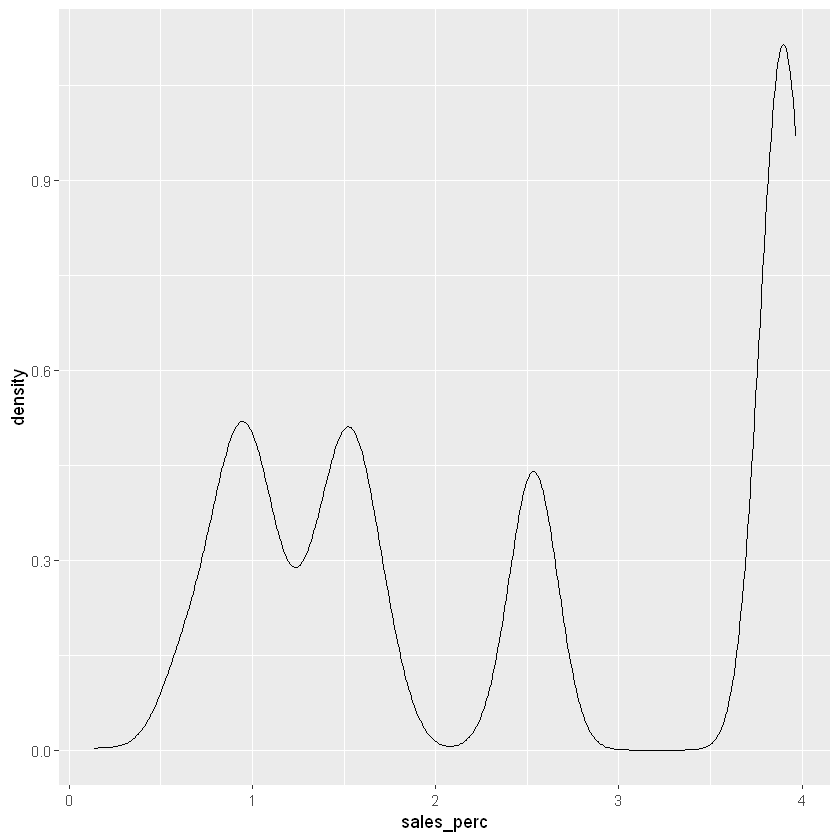

In [29]:
for (v in nf){
    print((ggplot(df,aes(x=log(df[[v]]+1))) +
    geom_density(adjust=2) + xlab(v)))
}

In [57]:
## transformation to log in order to achieve normal distribution
df$total_unit_sales <- log(df$total_unit_sales+1)
df$prev_month_sales <- log(df$prev_month_sales+1)
df$prev_3month_sales <- log(df$prev_3month_sales+1)
df$avg_prev_3months_sales <- log(df$avg_prev_3months_sales+1)
df$min_prev_3months_sales <- log(df$min_prev_3months_sales+1)
df$max_prev_3months_sales <- log(df$max_prev_3months_sales+1)


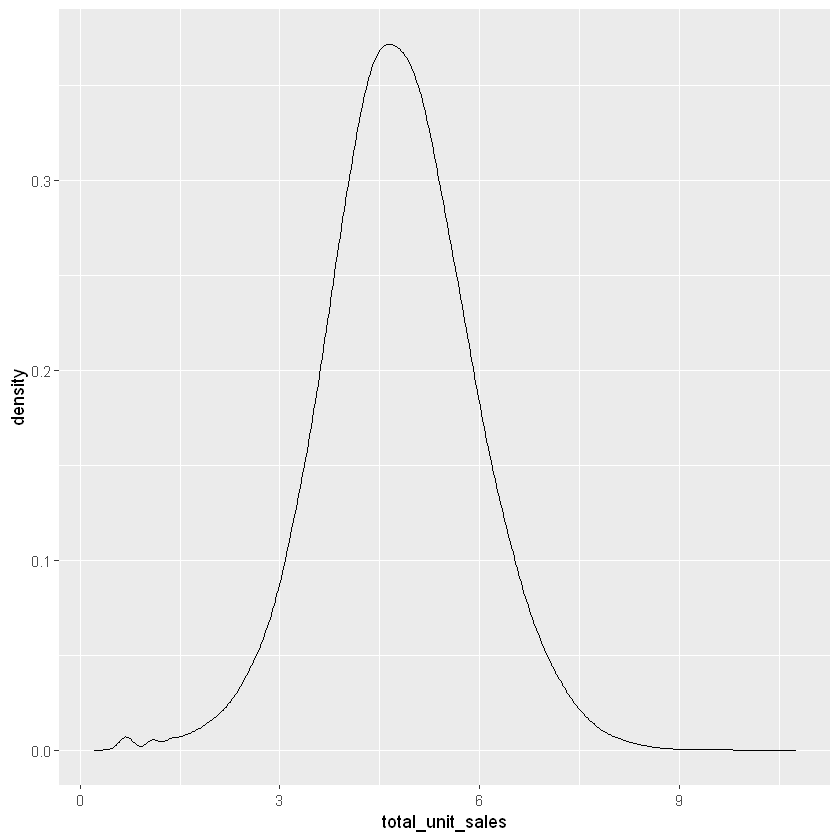

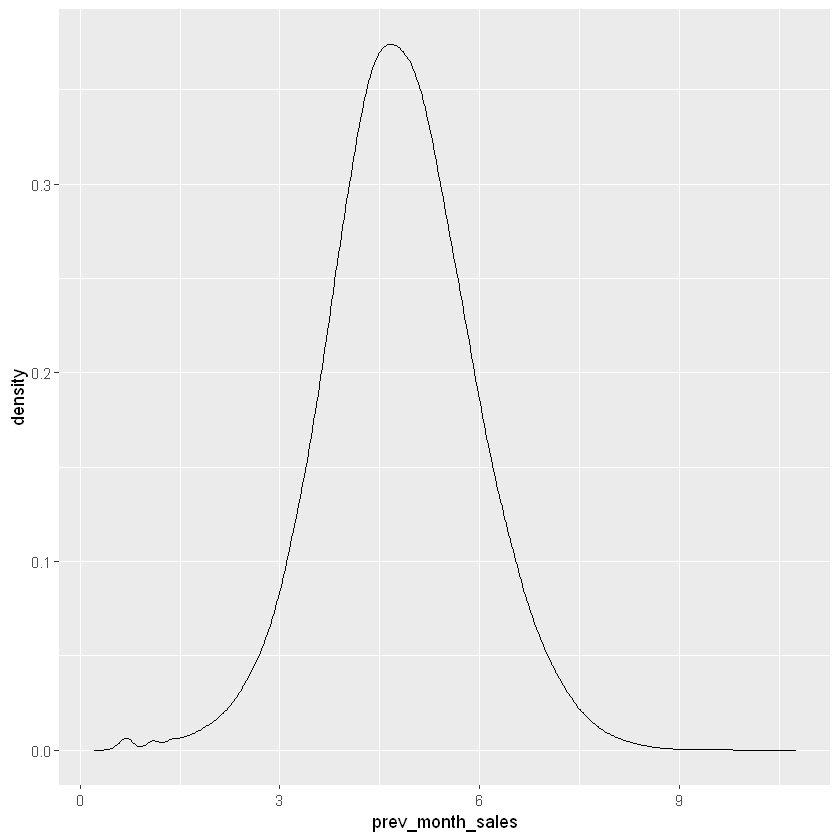

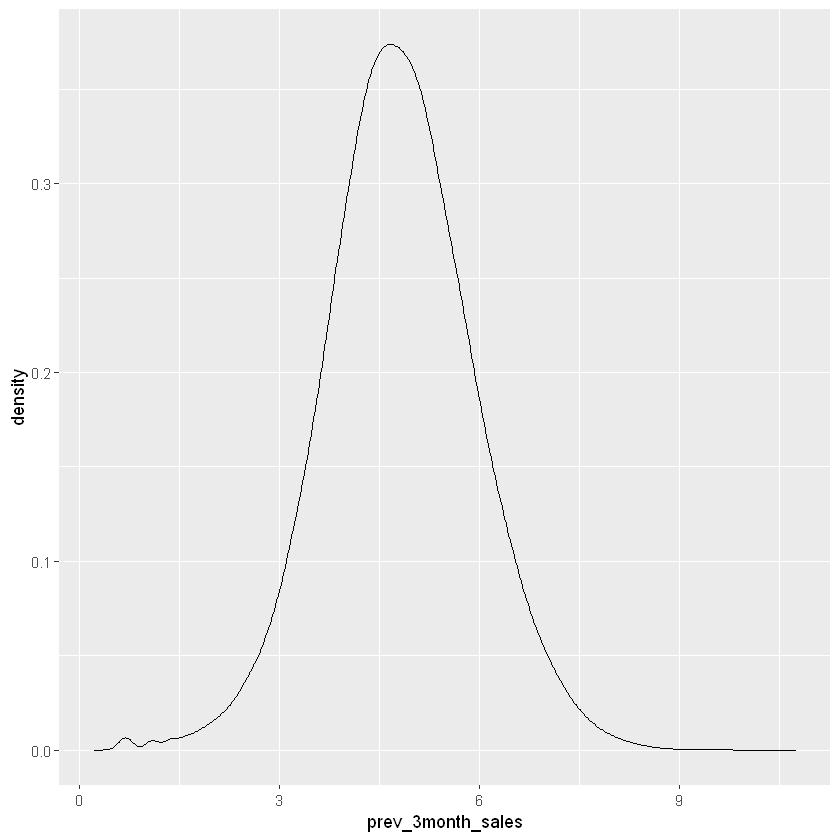

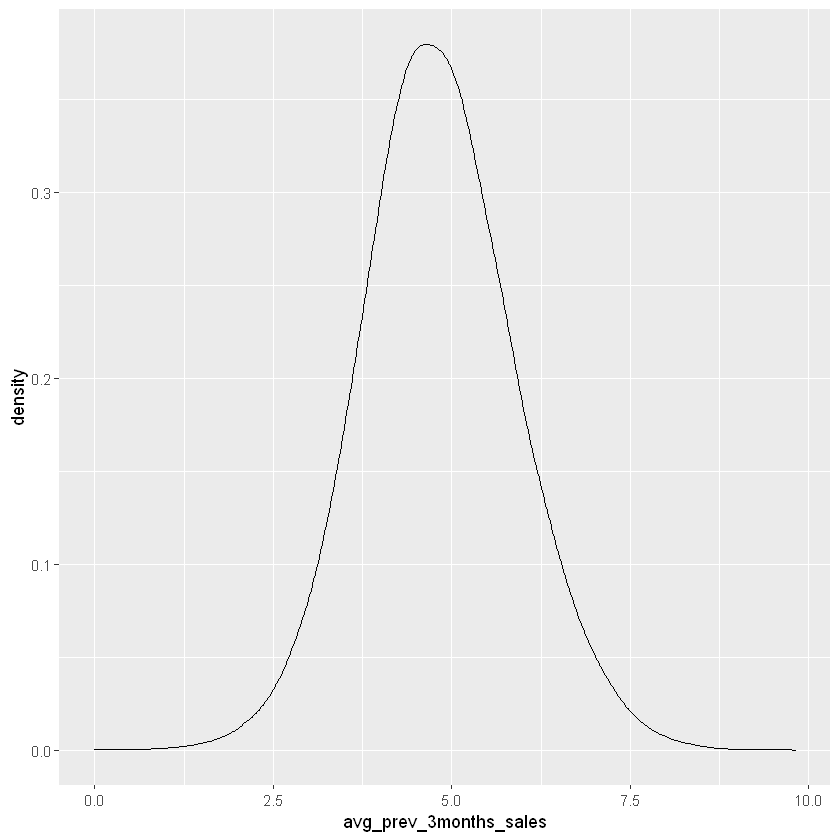

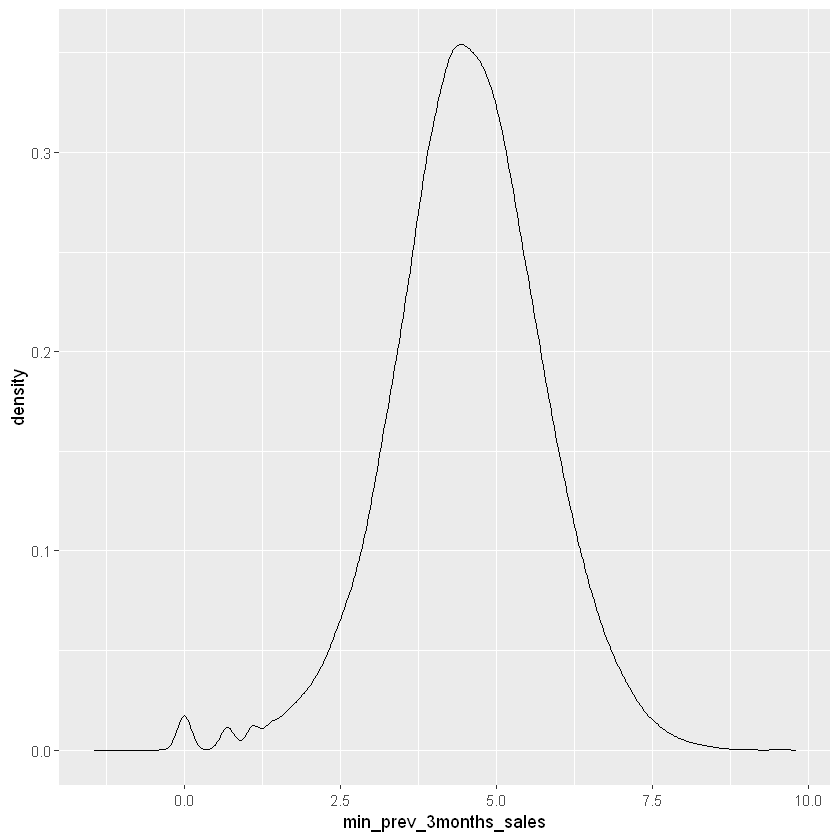

...

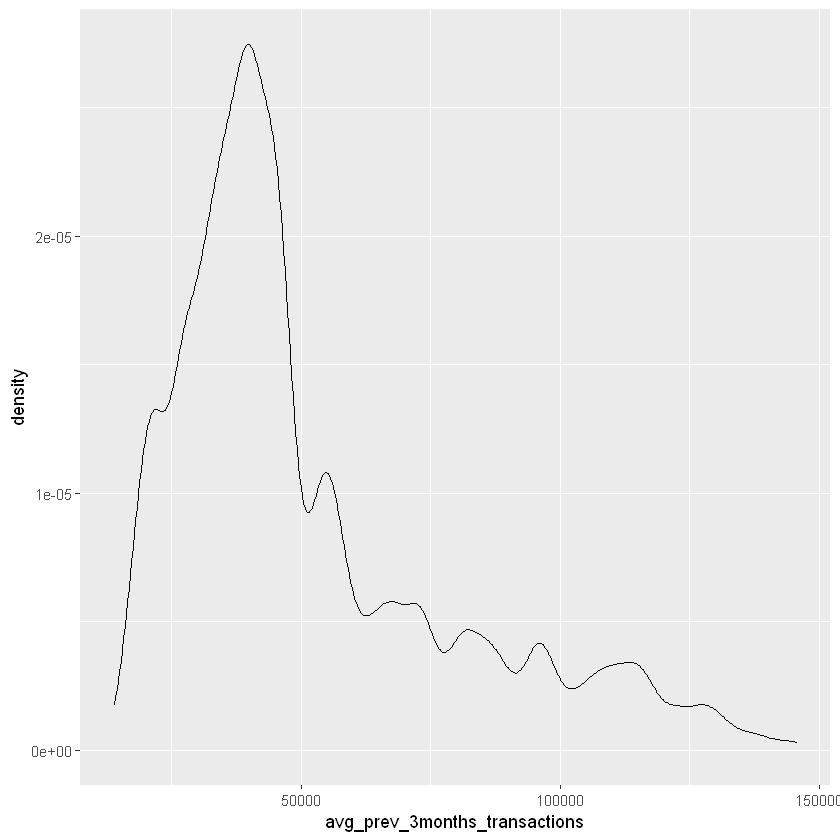

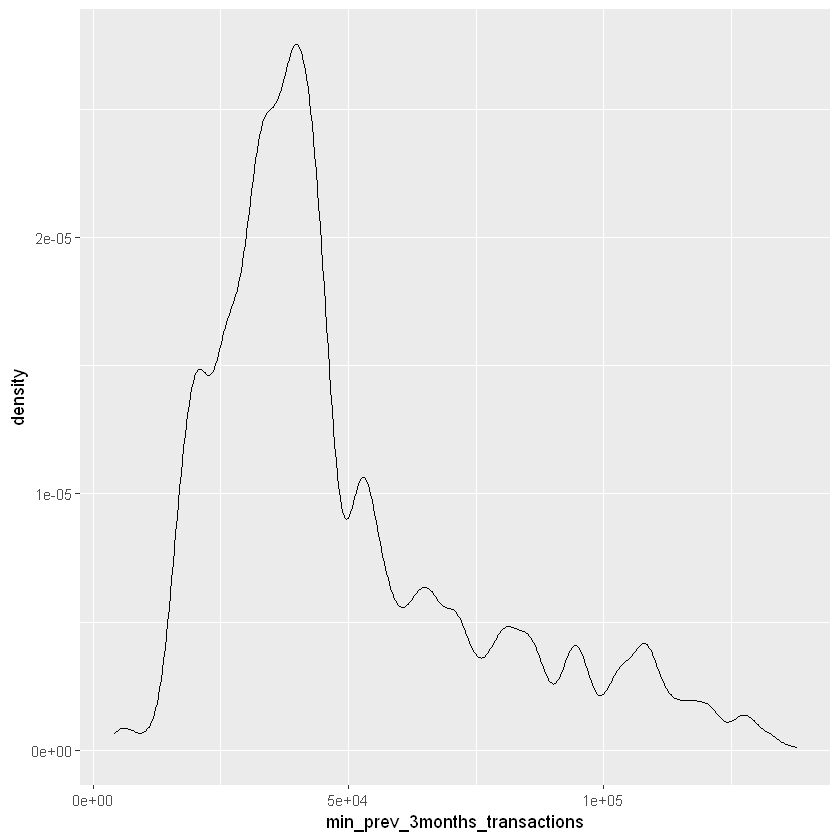

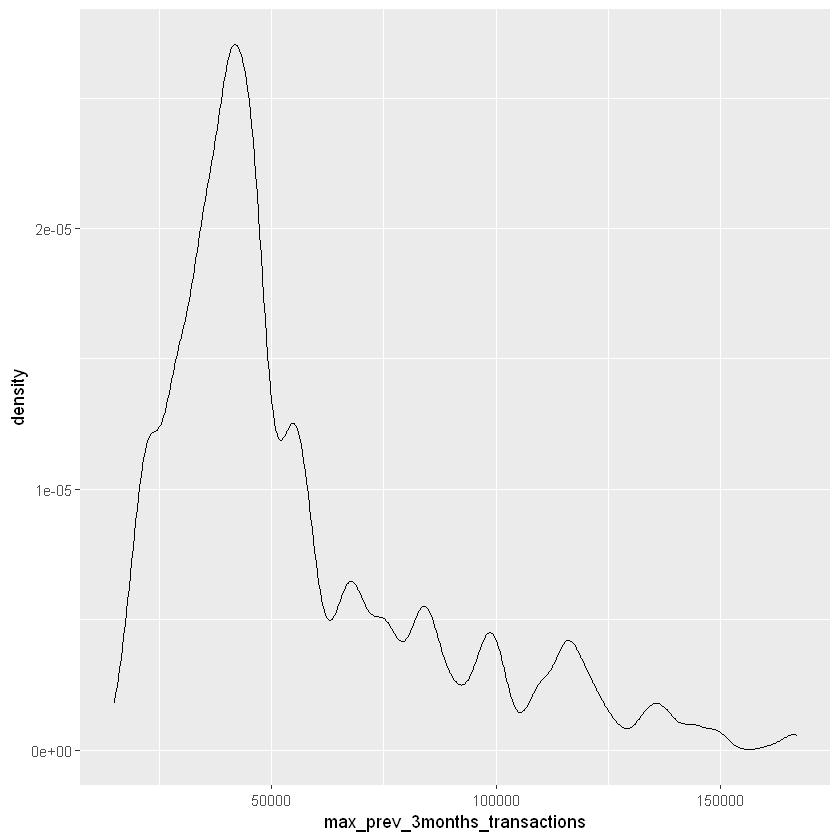

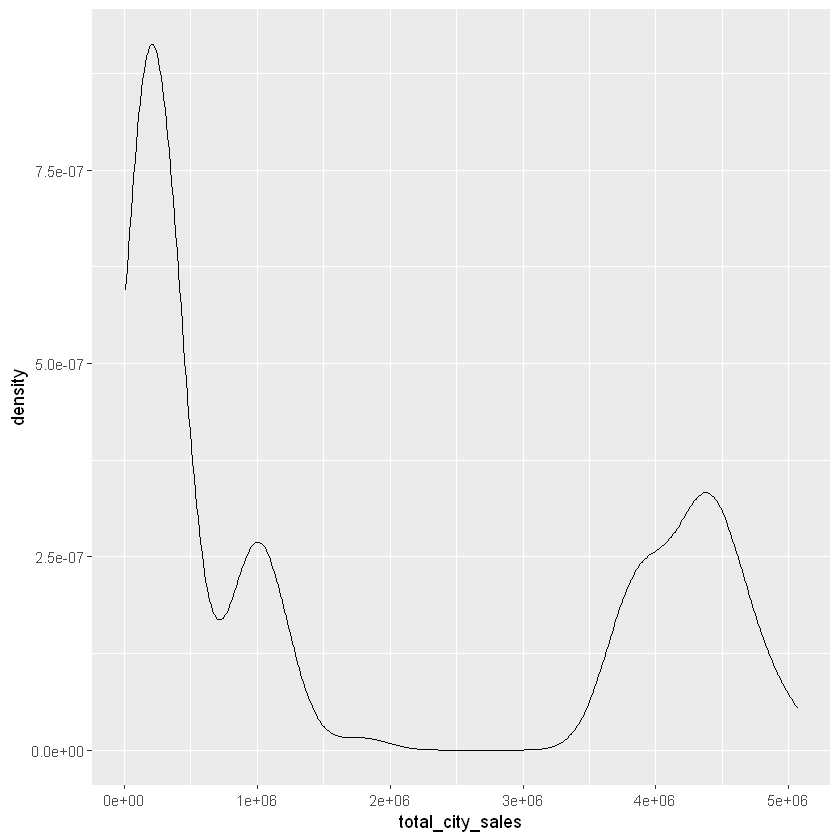

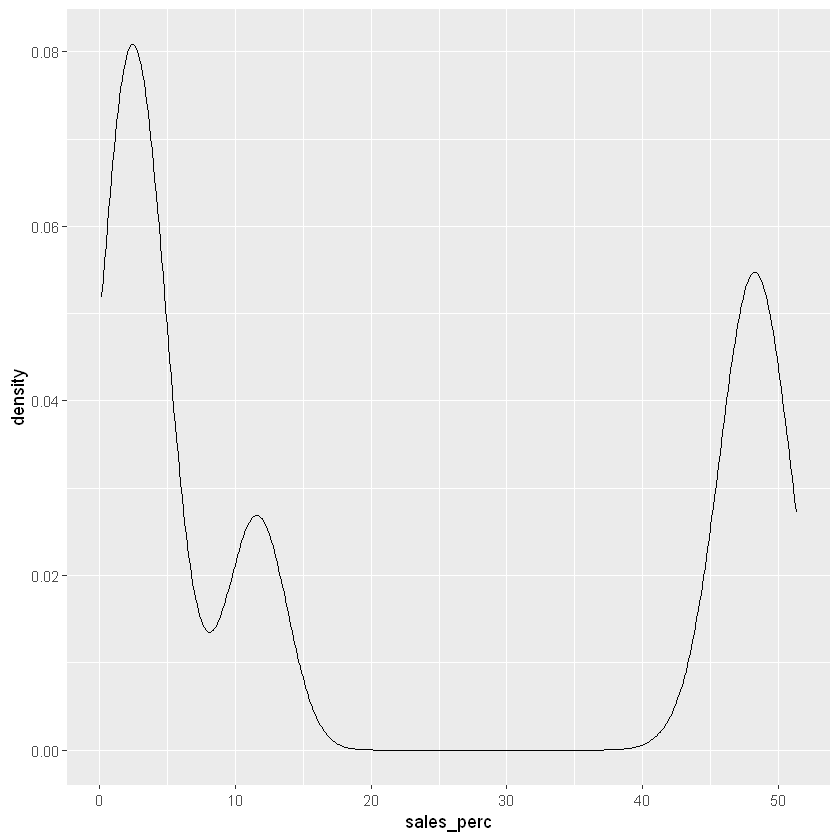

In [60]:
for (v in nf){
    print((ggplot(df,aes(x=df[[v]])) +
    geom_density(adjust=2) + xlab(v)))
}

        [,1]
  [1,]   0.7
  [2,]   1.9
  [3,]   3.1
  [4,]   4.3
  [5,]   5.5
  [6,]   6.7
  [7,]   7.9
  [8,]   9.1
  [9,]  10.3
 [10,]  11.5
 [11,]  12.7
 [12,]  13.9
 [13,]  15.1
 [14,]  16.3
 [15,]  17.5
 [16,]  18.7
 [17,]  19.9
 [18,]  21.1
 [19,]  22.3
 [20,]  23.5
 [21,]  24.7
 [22,]  25.9
 [23,]  27.1
 [24,]  28.3
 [25,]  29.5
 [26,]  30.7
 [27,]  31.9
 [28,]  33.1
 [29,]  34.3
 [30,]  35.5
 [31,]  36.7
 [32,]  37.9
 [33,]  39.1
 [34,]  40.3
 [35,]  41.5
 [36,]  42.7
 [37,]  43.9
 [38,]  45.1
 [39,]  46.3
 [40,]  47.5
 [41,]  48.7
 [42,]  49.9
 [43,]  51.1
 [44,]  52.3
 [45,]  53.5
 [46,]  54.7
 [47,]  55.9
 [48,]  57.1
 [49,]  58.3
 [50,]  59.5
 [51,]  60.7
 [52,]  61.9
 [53,]  63.1
 [54,]  64.3
 [55,]  65.5
 [56,]  66.7
 [57,]  67.9
 [58,]  69.1
 [59,]  70.3
 [60,]  71.5
 [61,]  72.7
 [62,]  73.9
 [63,]  75.1
 [64,]  76.3
 [65,]  77.5
 [66,]  78.7
 [67,]  79.9
 [68,]  81.1
 [69,]  82.3
 [70,]  83.5
 [71,]  84.7
 [72,]  85.9
 [73,]  87.1
 [74,]  88.3
 [75,]  89.5
 [76,]  90.7

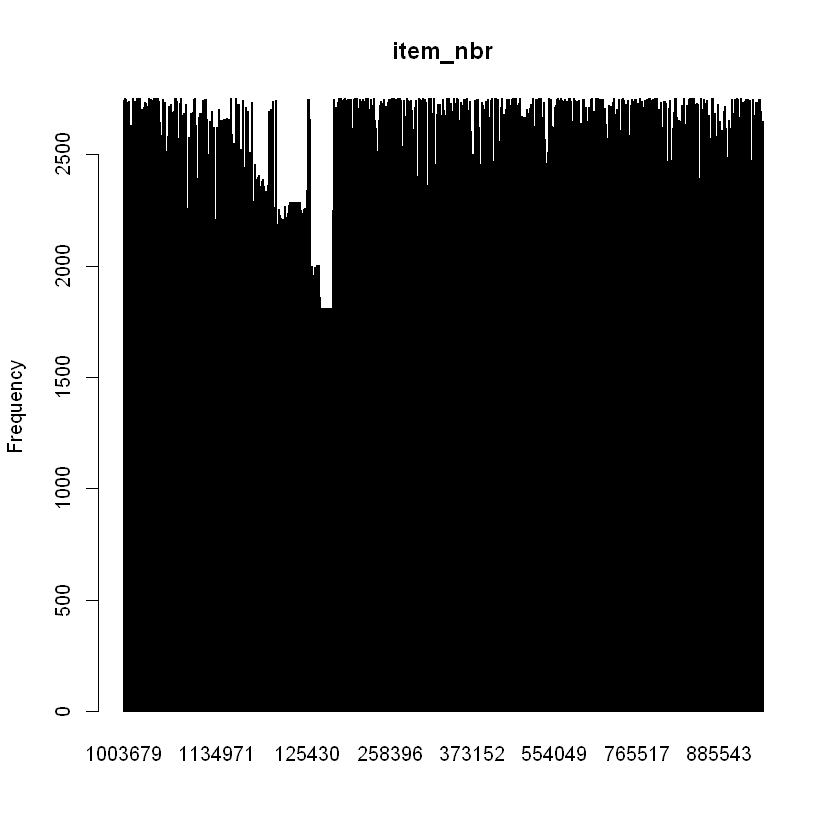

      [,1]
 [1,]  0.7
 [2,]  1.9
 [3,]  3.1
 [4,]  4.3
 [5,]  5.5
 [6,]  6.7
 [7,]  7.9
 [8,]  9.1
 [9,] 10.3
[10,] 11.5
[11,] 12.7
[12,] 13.9
[13,] 15.1
[14,] 16.3
[15,] 17.5
[16,] 18.7
[17,] 19.9
[18,] 21.1
[19,] 22.3
[20,] 23.5
[21,] 24.7
[22,] 25.9
[23,] 27.1
[24,] 28.3
[25,] 29.5
[26,] 30.7
[27,] 31.9
[28,] 33.1
[29,] 34.3
[30,] 35.5
[31,] 36.7
[32,] 37.9
[33,] 39.1
[34,] 40.3
[35,] 41.5
[36,] 42.7
[37,] 43.9
[38,] 45.1
[39,] 46.3
[40,] 47.5
[41,] 48.7
[42,] 49.9
[43,] 51.1
[44,] 52.3
[45,] 53.5
[46,] 54.7
[47,] 55.9
[48,] 57.1
[49,] 58.3
[50,] 59.5
[51,] 60.7
[52,] 61.9
[53,] 63.1
[54,] 64.3


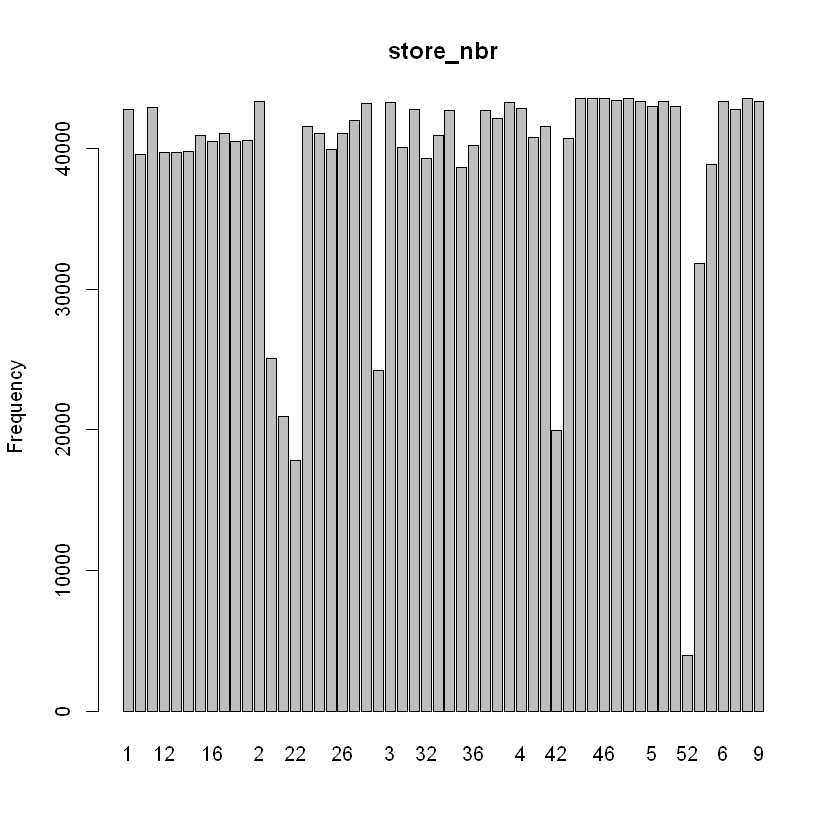

     [,1]
[1,]  0.7
[2,]  1.9
[3,]  3.1
[4,]  4.3
[5,]  5.5


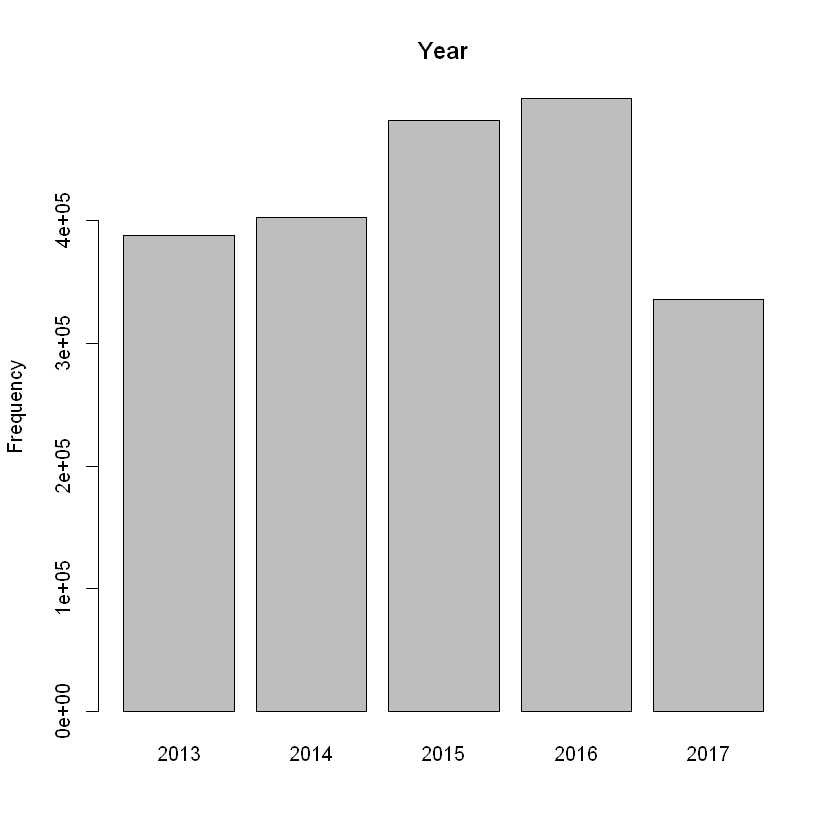

      [,1]
 [1,]  0.7
 [2,]  1.9
 [3,]  3.1
 [4,]  4.3
 [5,]  5.5
 [6,]  6.7
 [7,]  7.9
 [8,]  9.1
 [9,] 10.3
[10,] 11.5
[11,] 12.7
[12,] 13.9


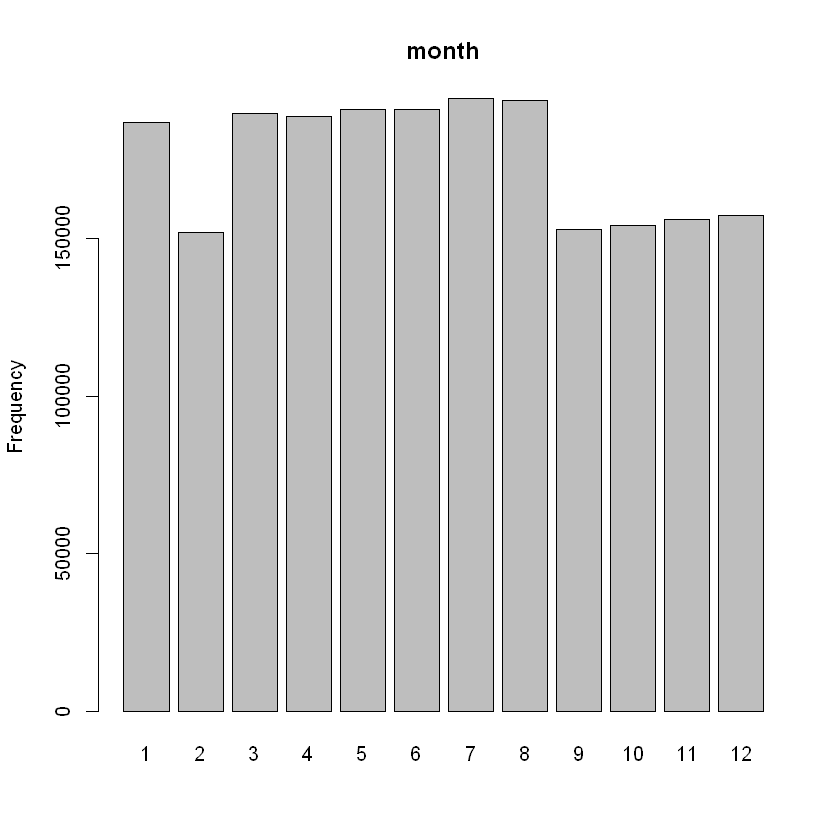

      [,1]
 [1,]  0.7
 [2,]  1.9
 [3,]  3.1
 [4,]  4.3
 [5,]  5.5
 [6,]  6.7
 [7,]  7.9
 [8,]  9.1
 [9,] 10.3
[10,] 11.5
[11,] 12.7
[12,] 13.9
[13,] 15.1
[14,] 16.3
[15,] 17.5
[16,] 18.7
[17,] 19.9
[18,] 21.1
[19,] 22.3
[20,] 23.5
[21,] 24.7
[22,] 25.9


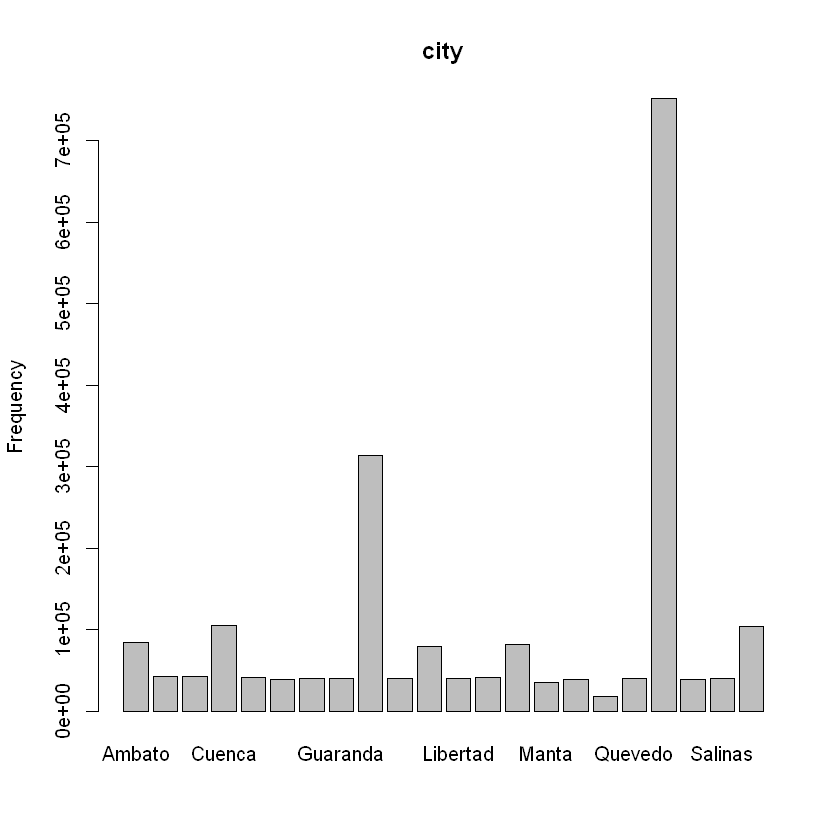

      [,1]
 [1,]  0.7
 [2,]  1.9
 [3,]  3.1
 [4,]  4.3
 [5,]  5.5
 [6,]  6.7
 [7,]  7.9
 [8,]  9.1
 [9,] 10.3
[10,] 11.5
[11,] 12.7
[12,] 13.9
[13,] 15.1
[14,] 16.3
[15,] 17.5
[16,] 18.7


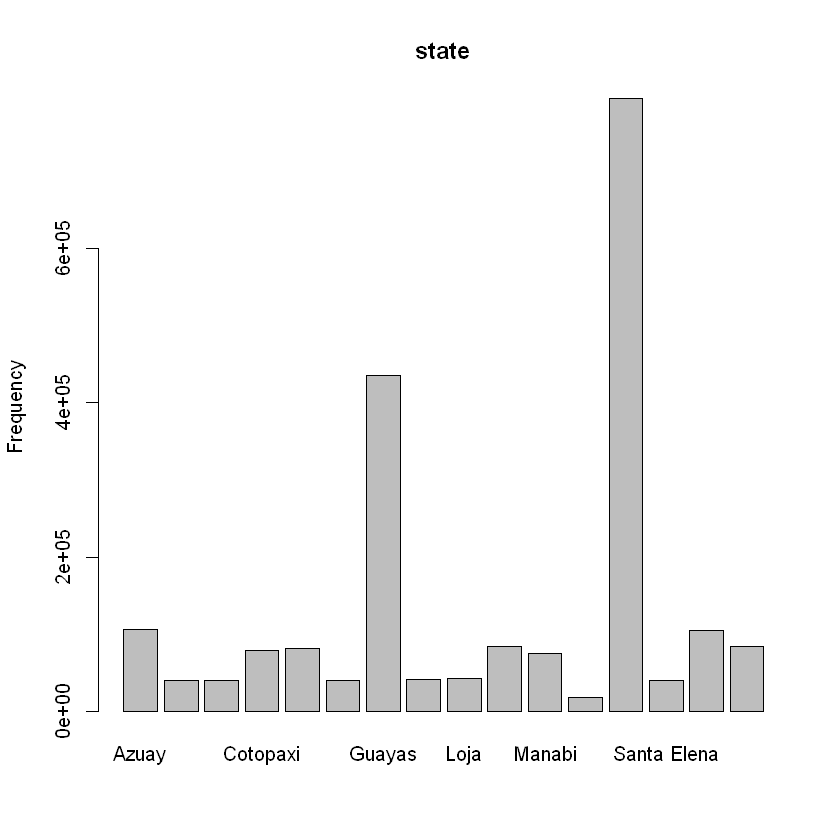

     [,1]
[1,]  0.7
[2,]  1.9
[3,]  3.1
[4,]  4.3
[5,]  5.5


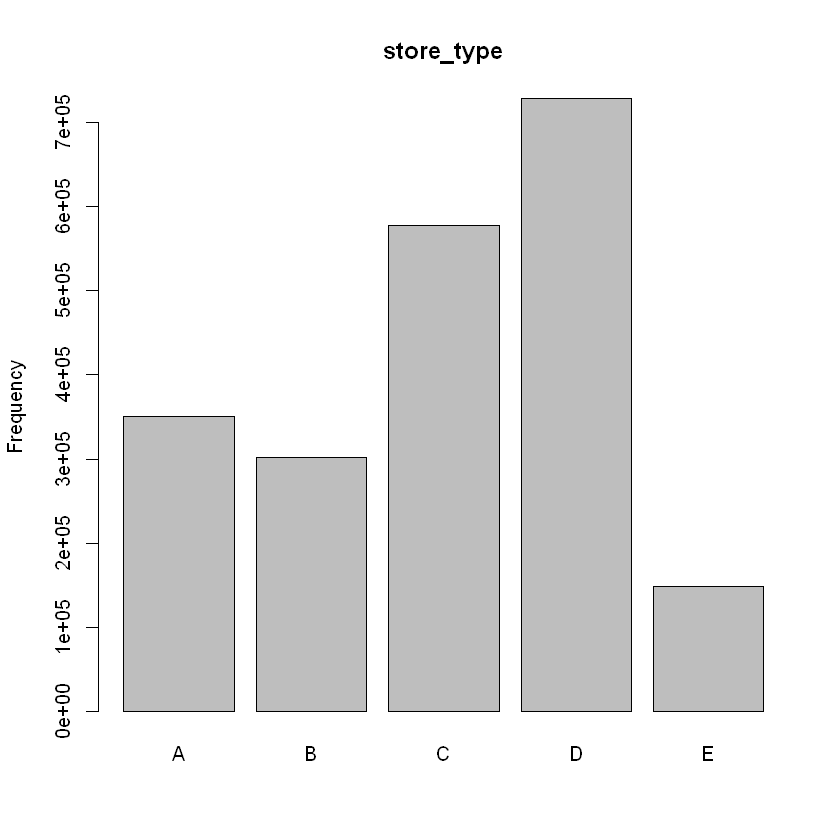

      [,1]
 [1,]  0.7
 [2,]  1.9
 [3,]  3.1
 [4,]  4.3
 [5,]  5.5
 [6,]  6.7
 [7,]  7.9
 [8,]  9.1
 [9,] 10.3
[10,] 11.5
[11,] 12.7
[12,] 13.9
[13,] 15.1
[14,] 16.3
[15,] 17.5
[16,] 18.7
[17,] 19.9


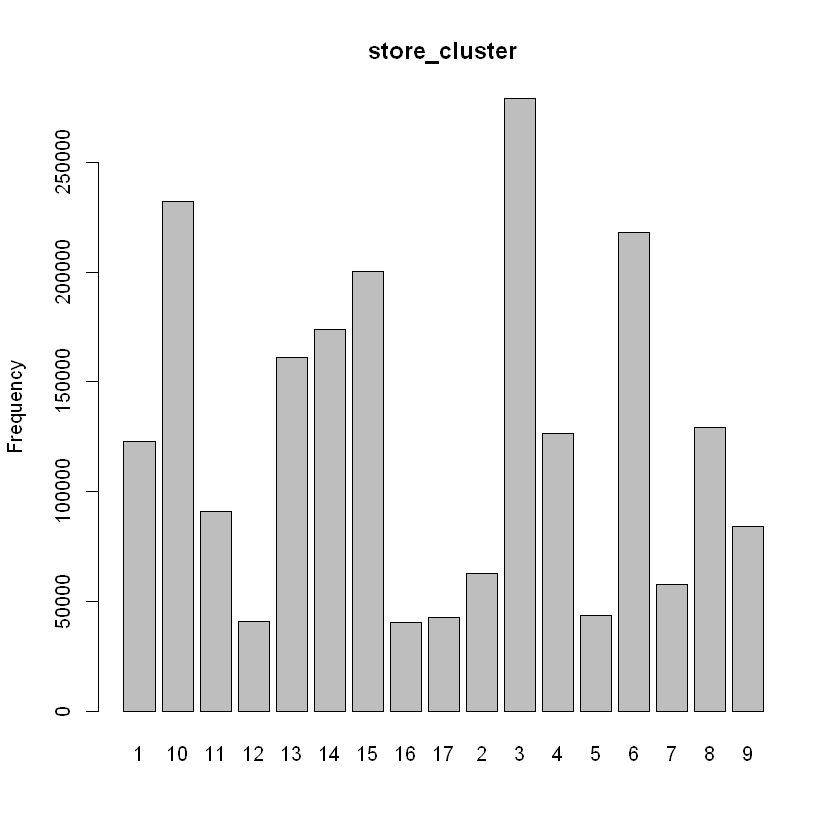

      [,1]
 [1,]  0.7
 [2,]  1.9
 [3,]  3.1
 [4,]  4.3
 [5,]  5.5
 [6,]  6.7
 [7,]  7.9
 [8,]  9.1
 [9,] 10.3
[10,] 11.5
[11,] 12.7
[12,] 13.9
[13,] 15.1
[14,] 16.3


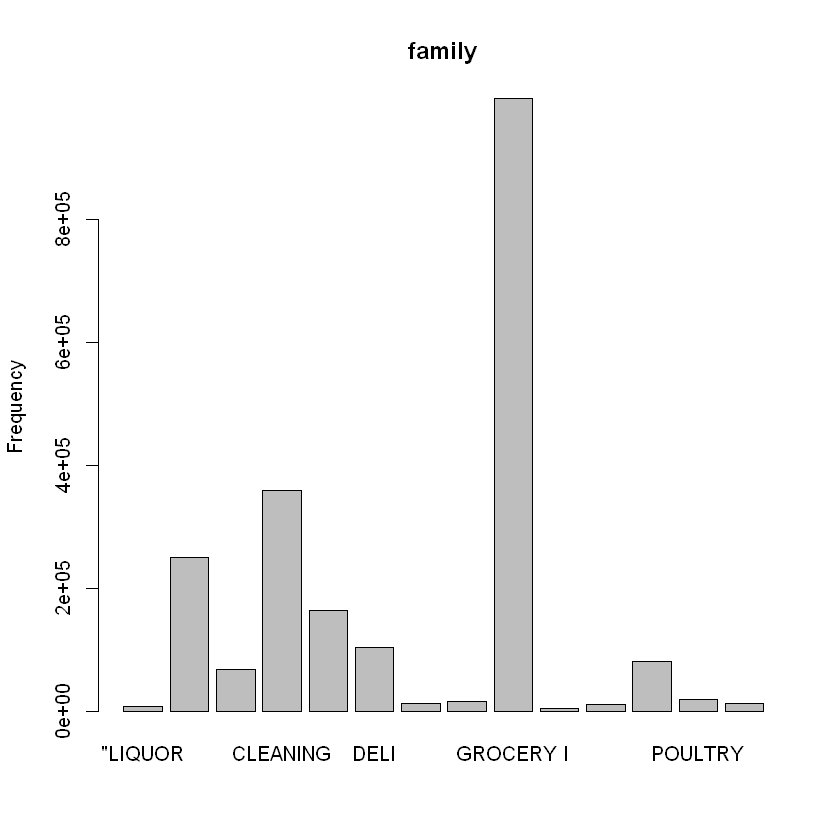

        [,1]
  [1,]   0.7
  [2,]   1.9
  [3,]   3.1
  [4,]   4.3
  [5,]   5.5
  [6,]   6.7
  [7,]   7.9
  [8,]   9.1
  [9,]  10.3
 [10,]  11.5
 [11,]  12.7
 [12,]  13.9
 [13,]  15.1
 [14,]  16.3
 [15,]  17.5
 [16,]  18.7
 [17,]  19.9
 [18,]  21.1
 [19,]  22.3
 [20,]  23.5
 [21,]  24.7
 [22,]  25.9
 [23,]  27.1
 [24,]  28.3
 [25,]  29.5
 [26,]  30.7
 [27,]  31.9
 [28,]  33.1
 [29,]  34.3
 [30,]  35.5
 [31,]  36.7
 [32,]  37.9
 [33,]  39.1
 [34,]  40.3
 [35,]  41.5
 [36,]  42.7
 [37,]  43.9
 [38,]  45.1
 [39,]  46.3
 [40,]  47.5
 [41,]  48.7
 [42,]  49.9
 [43,]  51.1
 [44,]  52.3
 [45,]  53.5
 [46,]  54.7
 [47,]  55.9
 [48,]  57.1
 [49,]  58.3
 [50,]  59.5
 [51,]  60.7
 [52,]  61.9
 [53,]  63.1
 [54,]  64.3
 [55,]  65.5
 [56,]  66.7
 [57,]  67.9
 [58,]  69.1
 [59,]  70.3
 [60,]  71.5
 [61,]  72.7
 [62,]  73.9
 [63,]  75.1
 [64,]  76.3
 [65,]  77.5
 [66,]  78.7
 [67,]  79.9
 [68,]  81.1
 [69,]  82.3
 [70,]  83.5
 [71,]  84.7
 [72,]  85.9
 [73,]  87.1
 [74,]  88.3
 [75,]  89.5
 [76,]  90.7

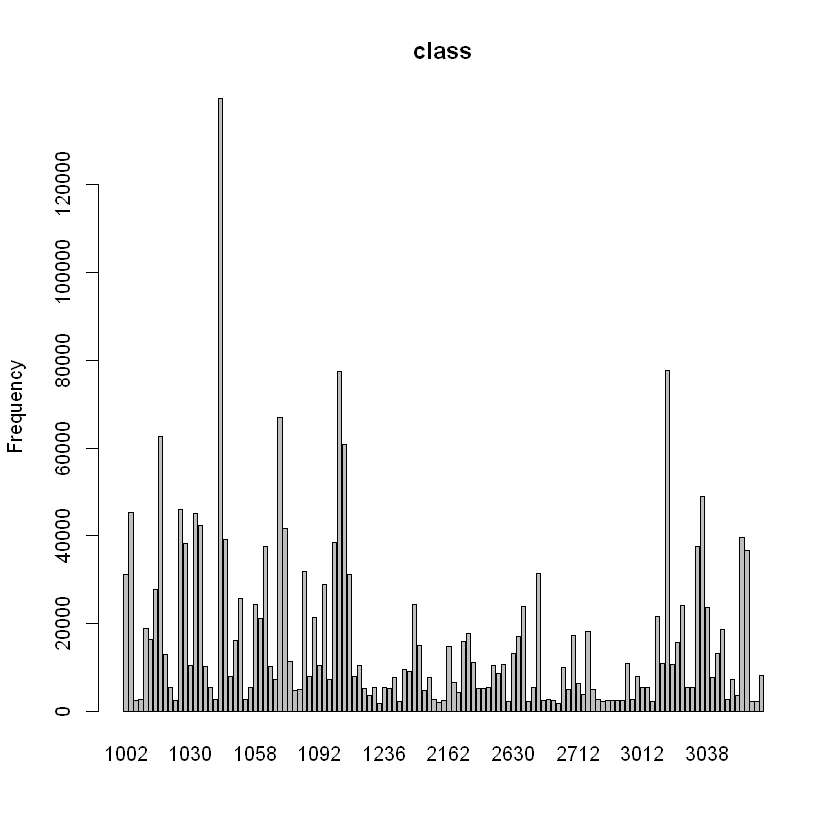

     [,1]
[1,]  0.7
[2,]  1.9
[3,]  3.1


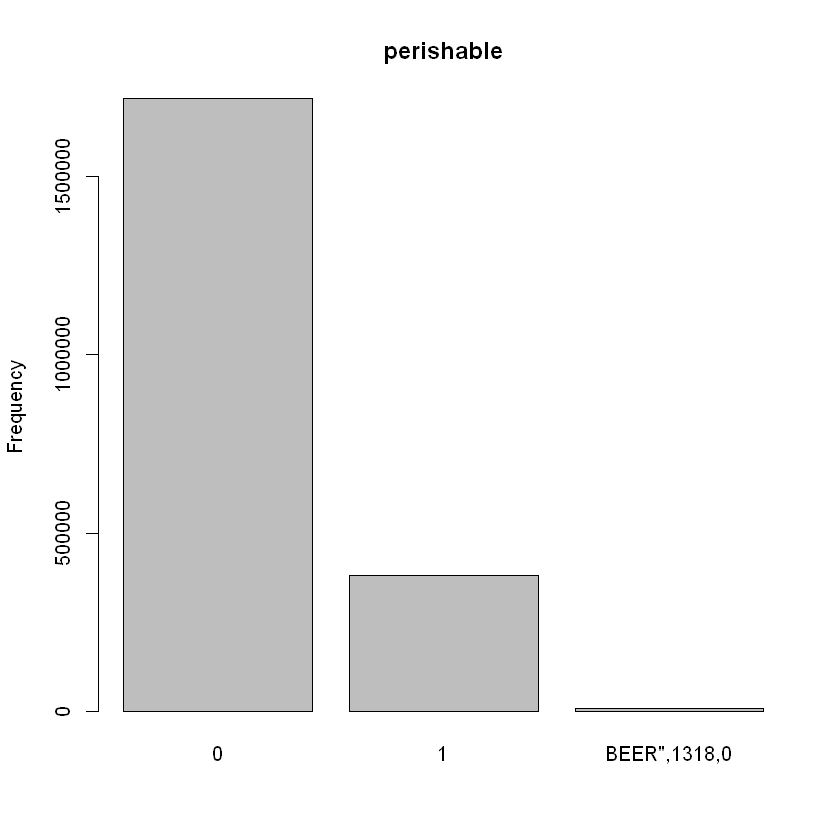

     [,1]
[1,]  0.7
[2,]  1.9


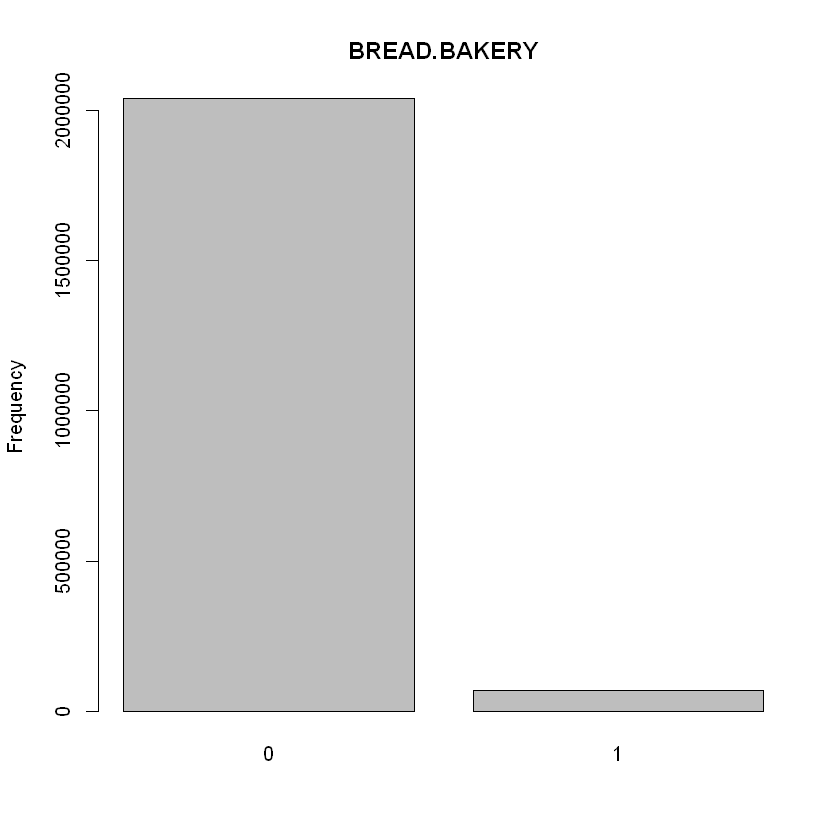

     [,1]
[1,]  0.7
[2,]  1.9


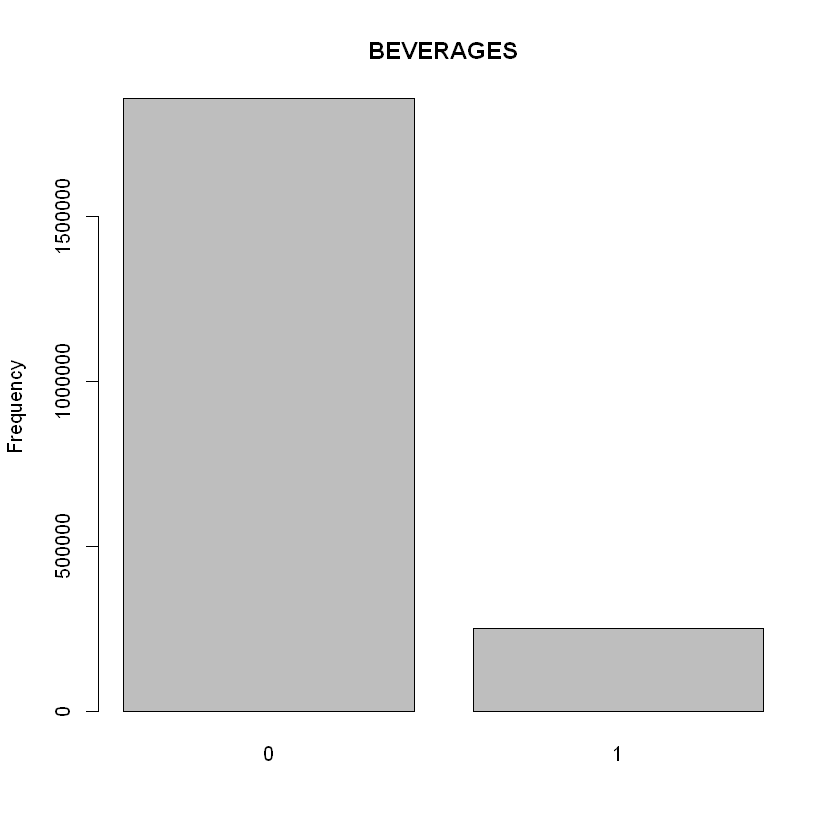

     [,1]
[1,]  0.7
[2,]  1.9


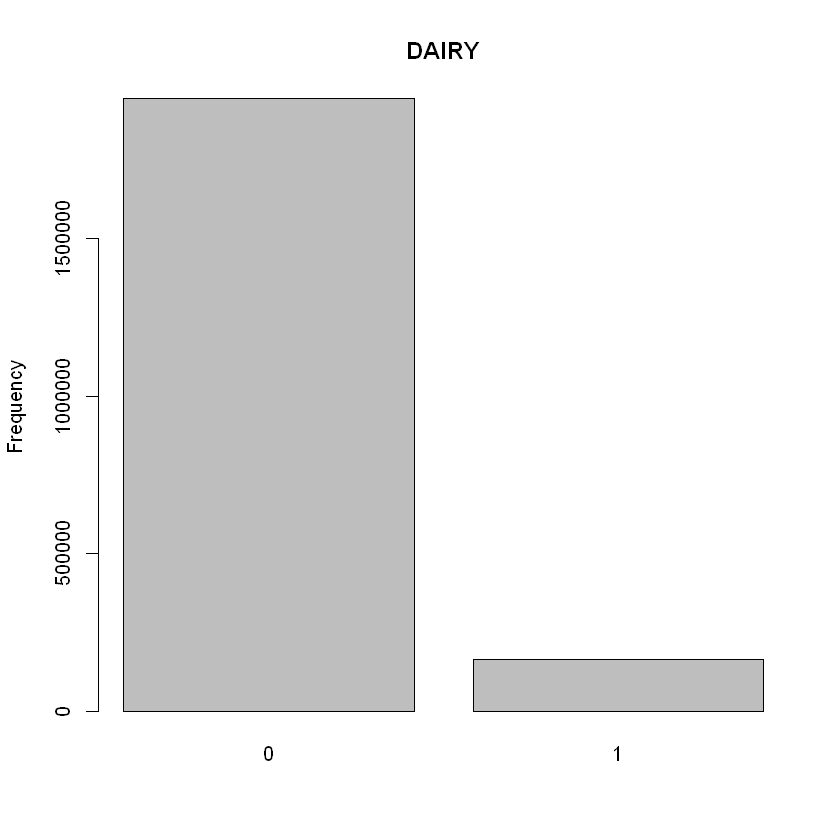

     [,1]
[1,]  0.7
[2,]  1.9


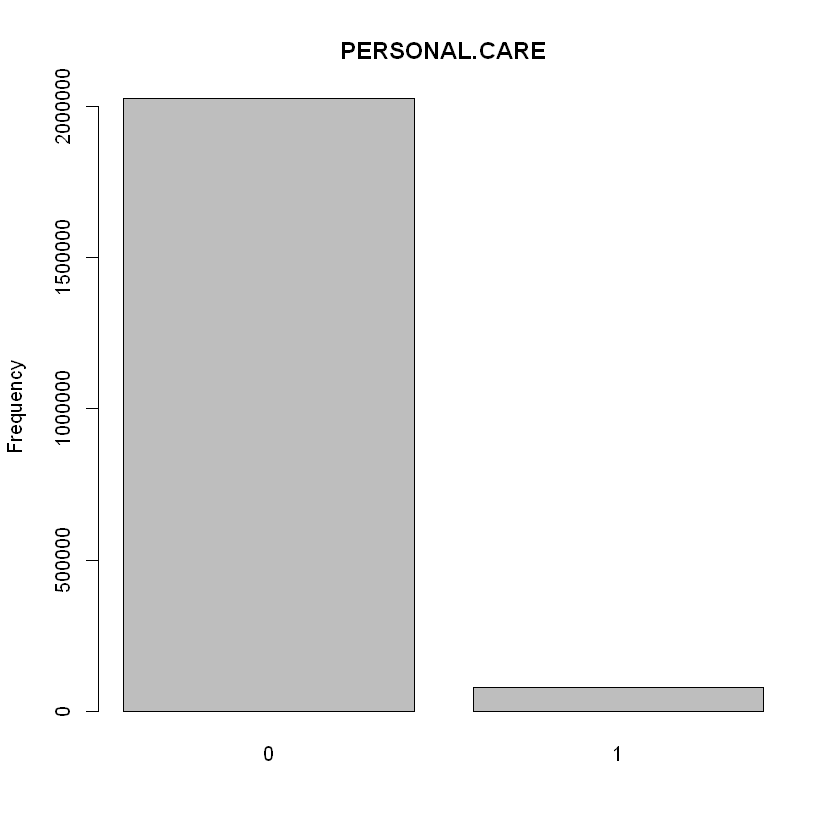

     [,1]
[1,]  0.7
[2,]  1.9


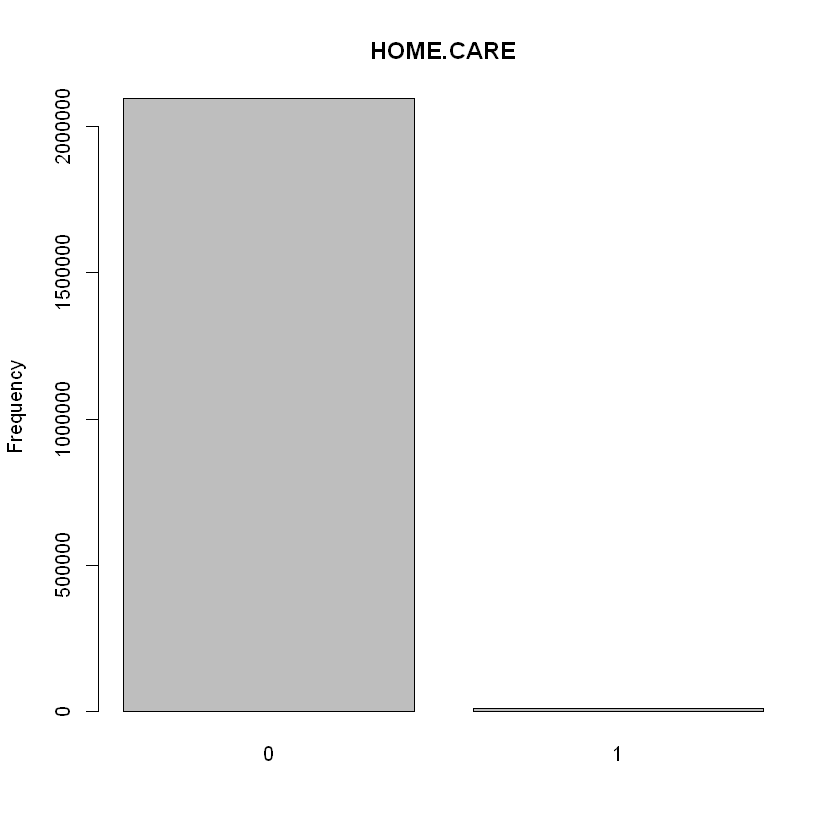

     [,1]
[1,]  0.7
[2,]  1.9


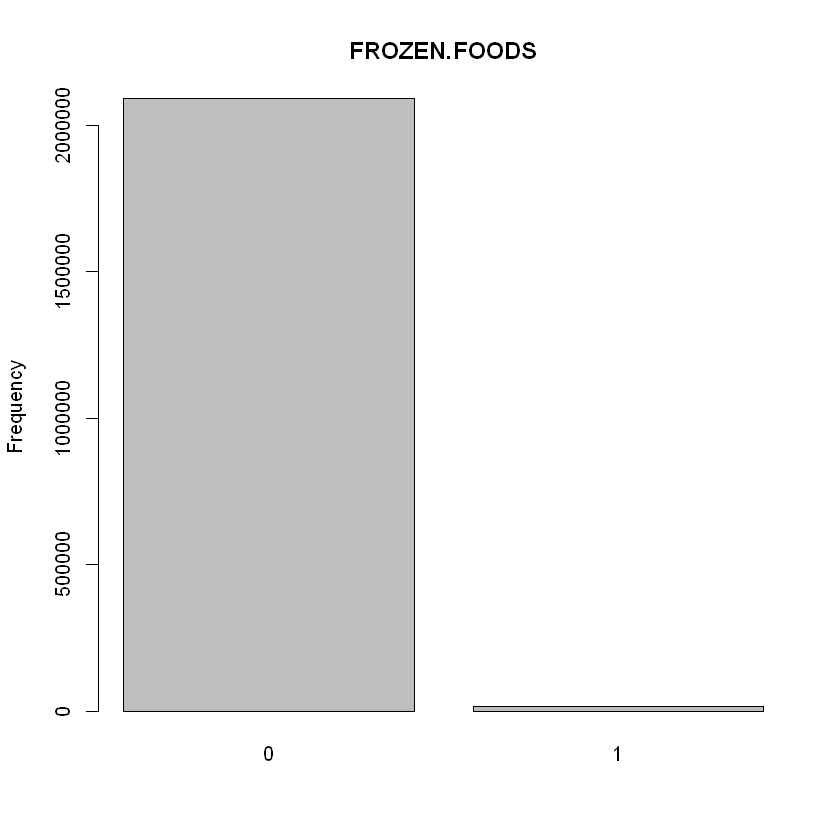

     [,1]
[1,]  0.7
[2,]  1.9


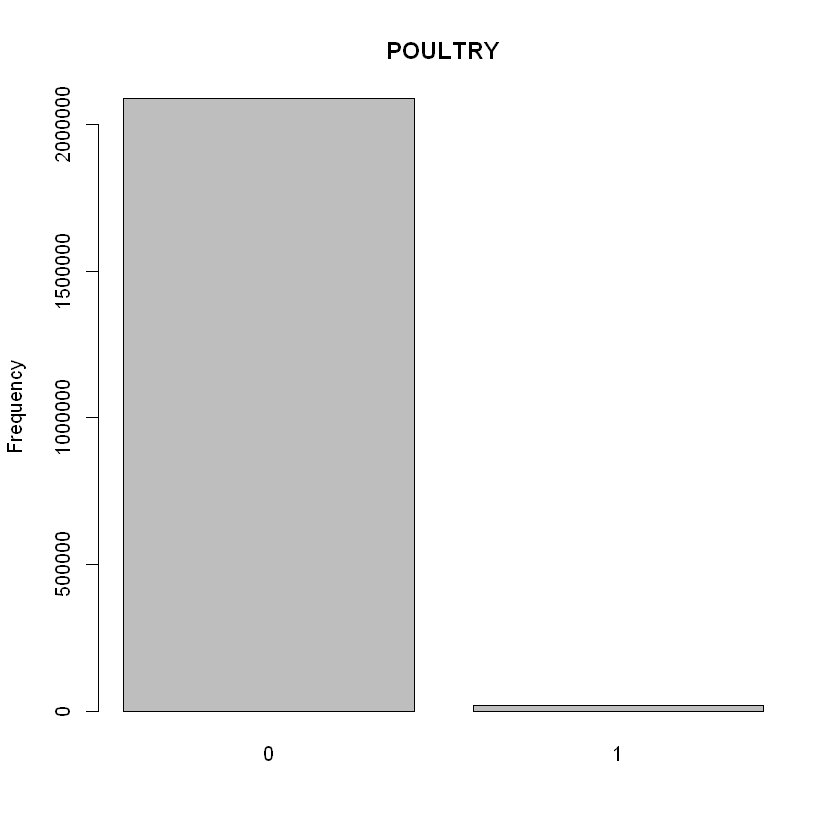

     [,1]
[1,]  0.7
[2,]  1.9


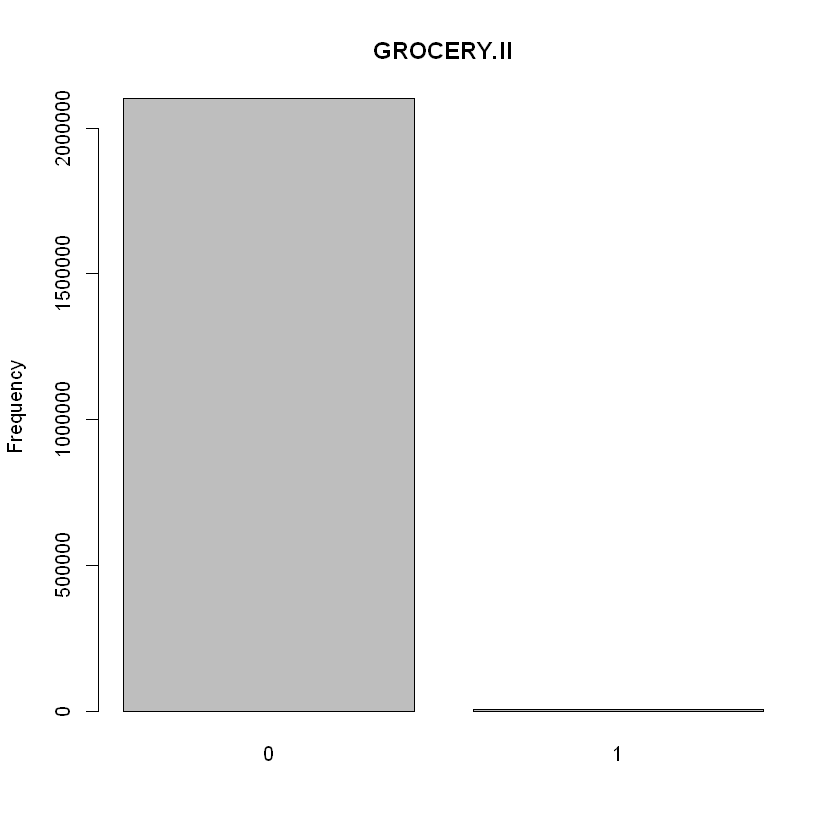

     [,1]
[1,]  0.7
[2,]  1.9


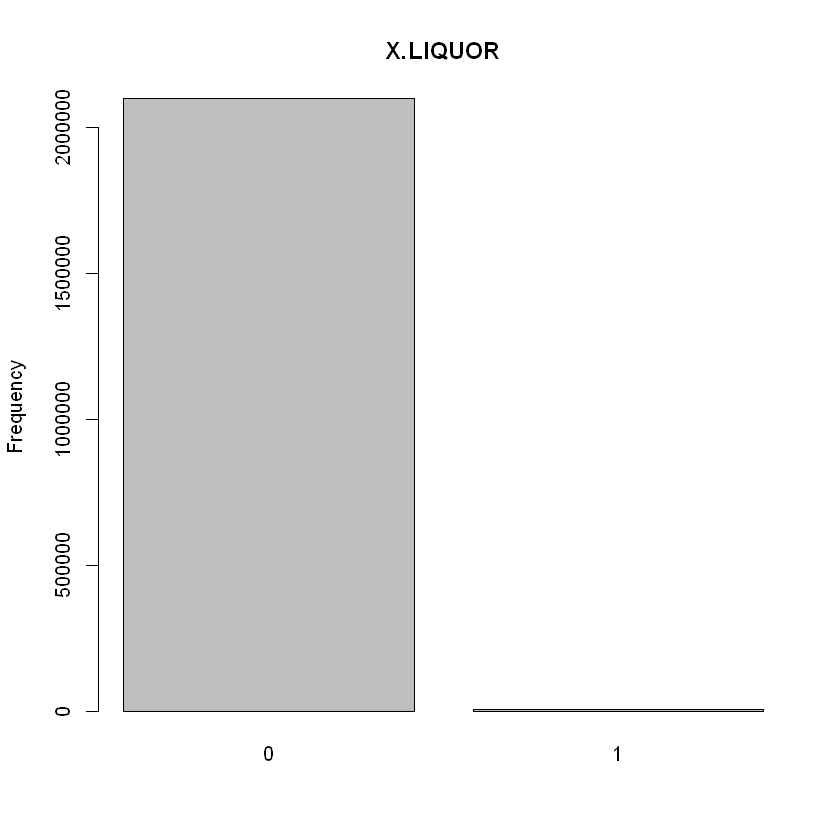

     [,1]
[1,]  0.7
[2,]  1.9


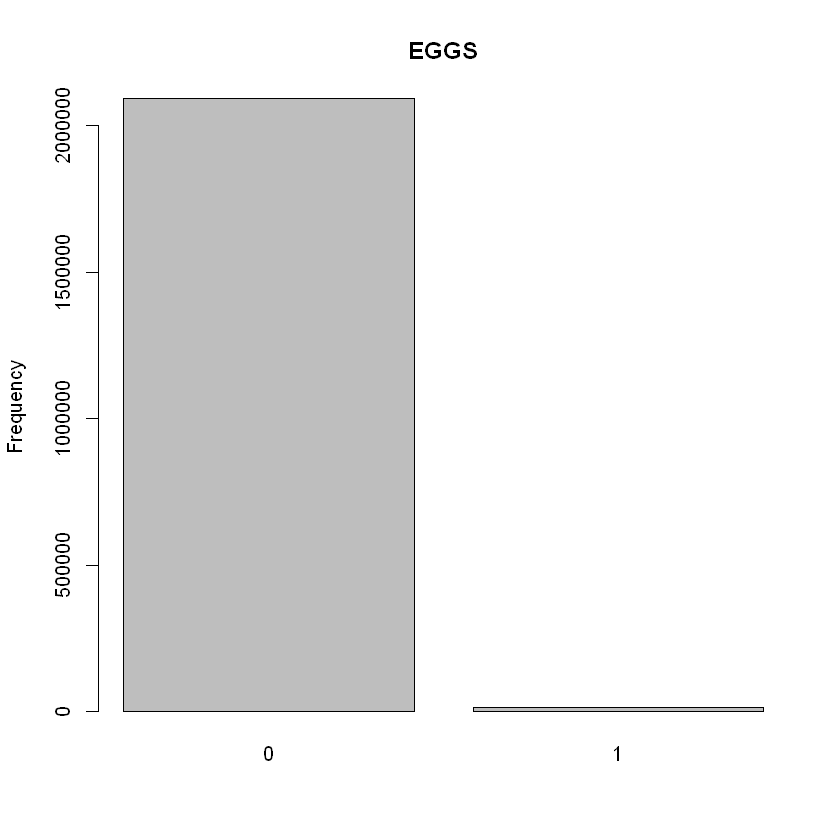

     [,1]
[1,]  0.7
[2,]  1.9


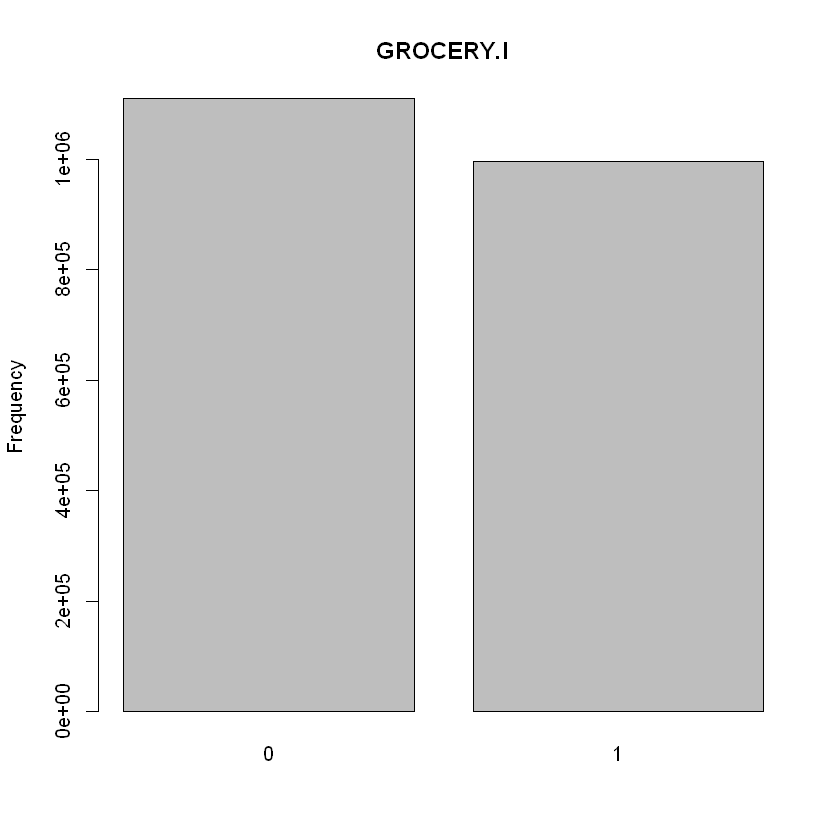

     [,1]
[1,]  0.7
[2,]  1.9


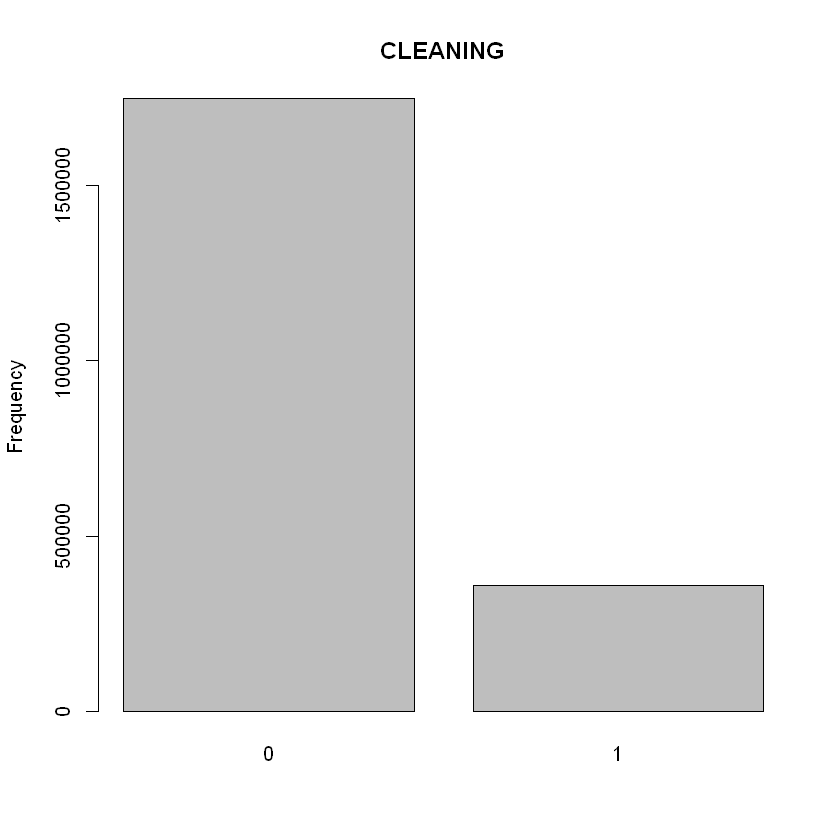

     [,1]
[1,]  0.7
[2,]  1.9


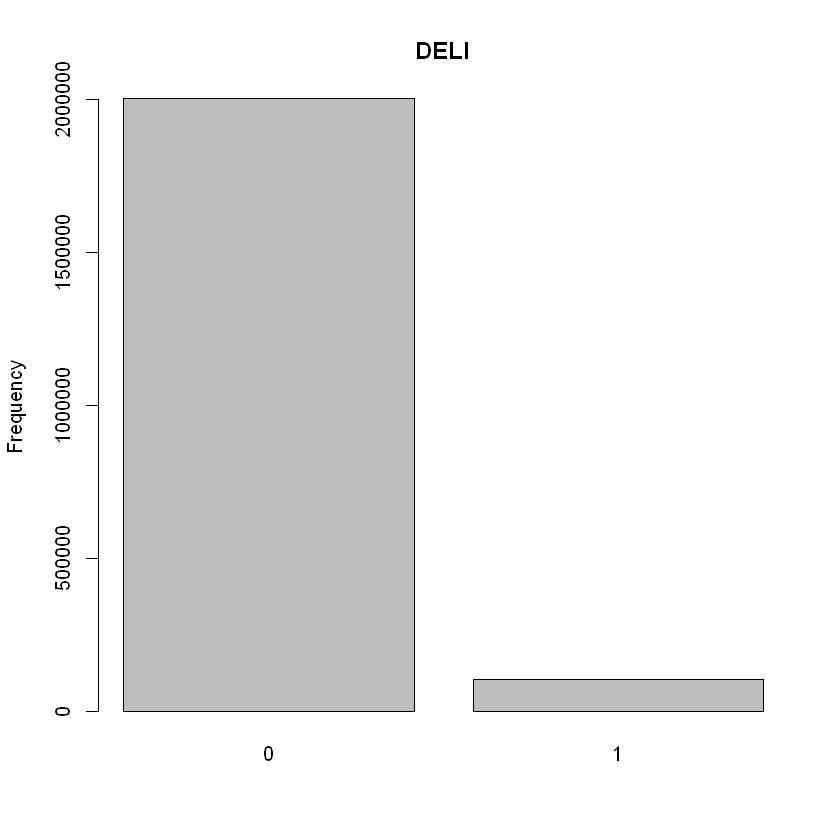

     [,1]
[1,]  0.7
[2,]  1.9


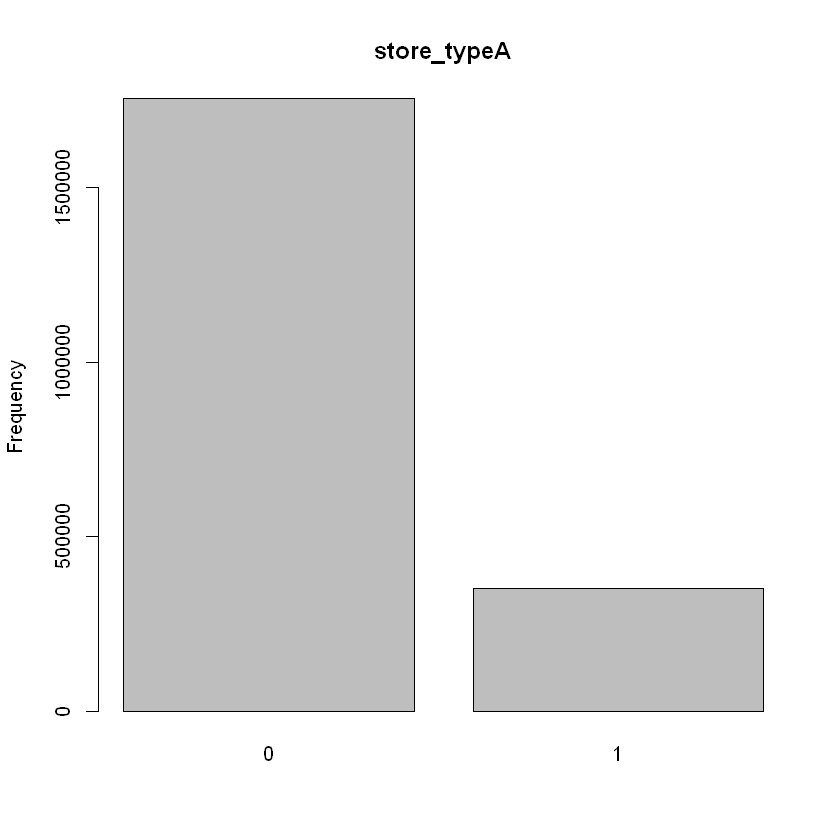

     [,1]
[1,]  0.7
[2,]  1.9


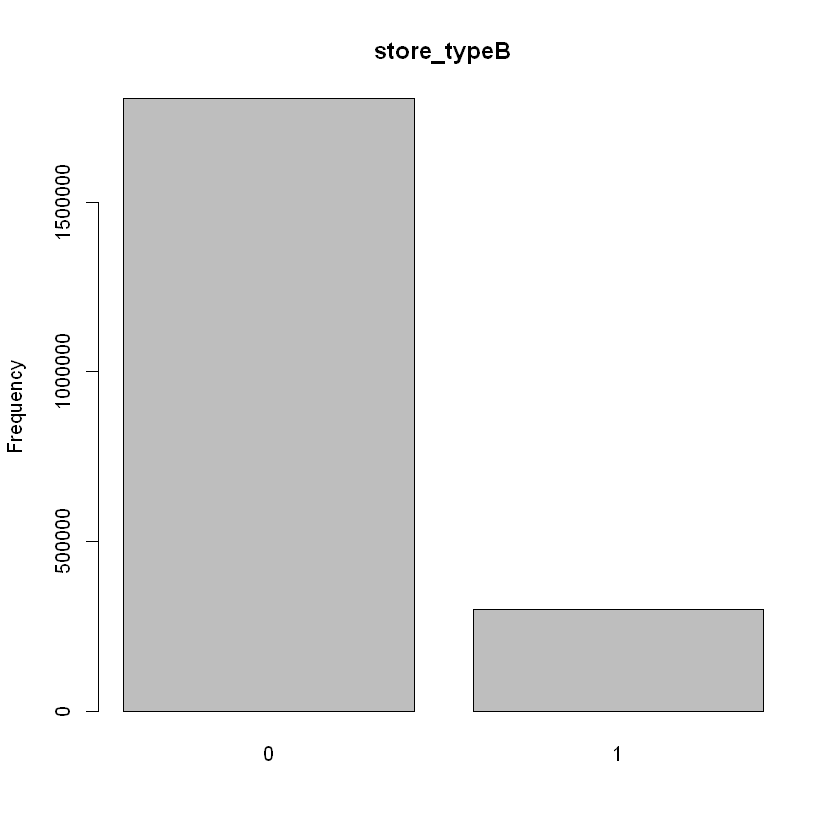

     [,1]
[1,]  0.7
[2,]  1.9


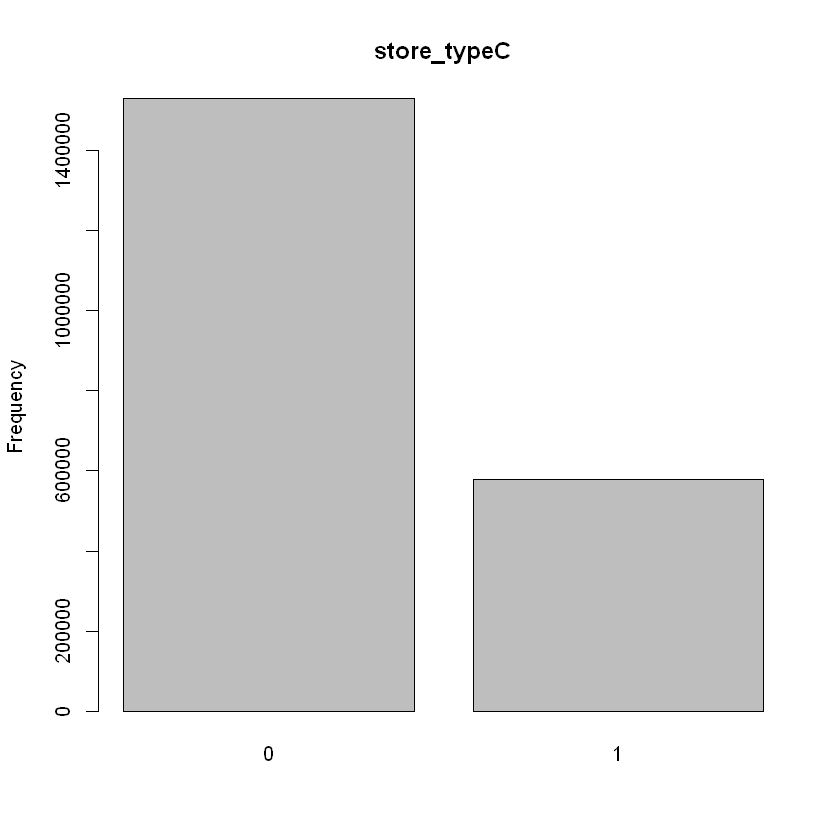

     [,1]
[1,]  0.7
[2,]  1.9


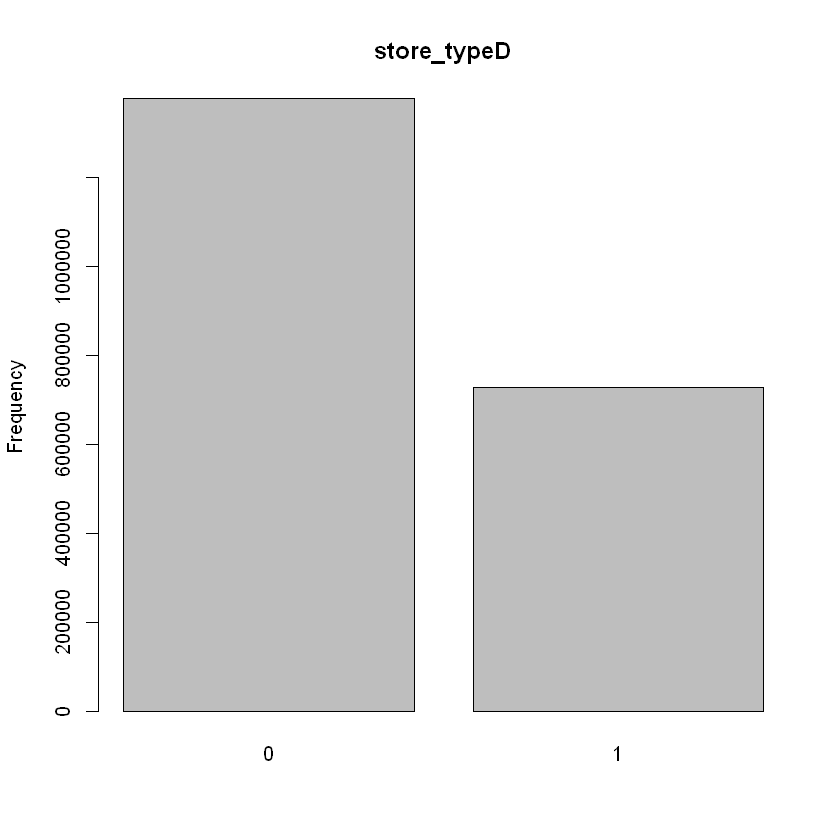

     [,1]
[1,]  0.7
[2,]  1.9


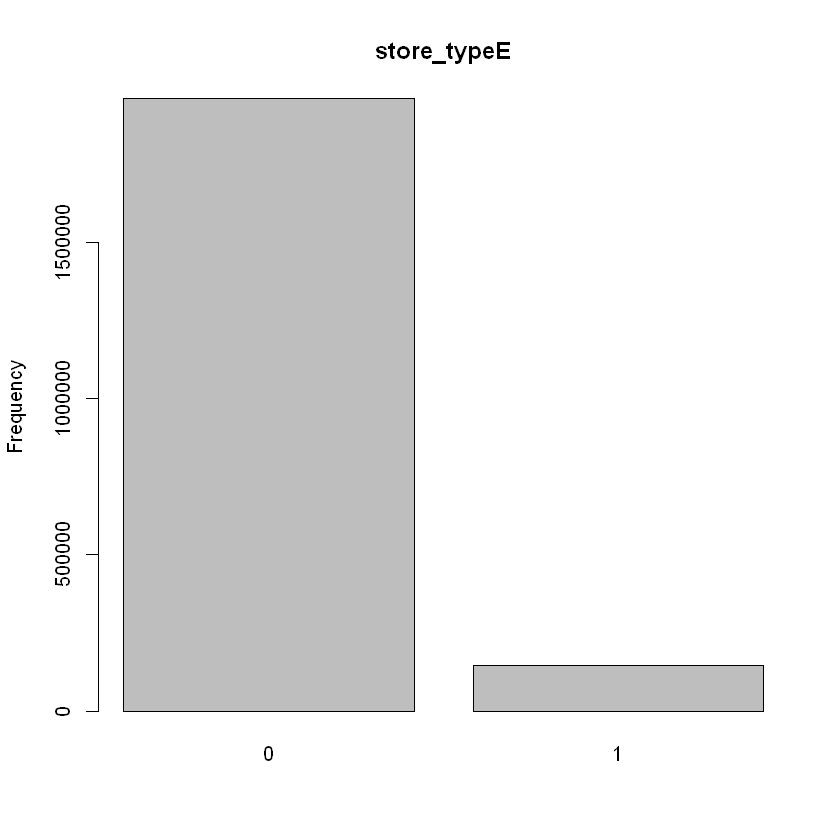

     [,1]
[1,]  0.7
[2,]  1.9


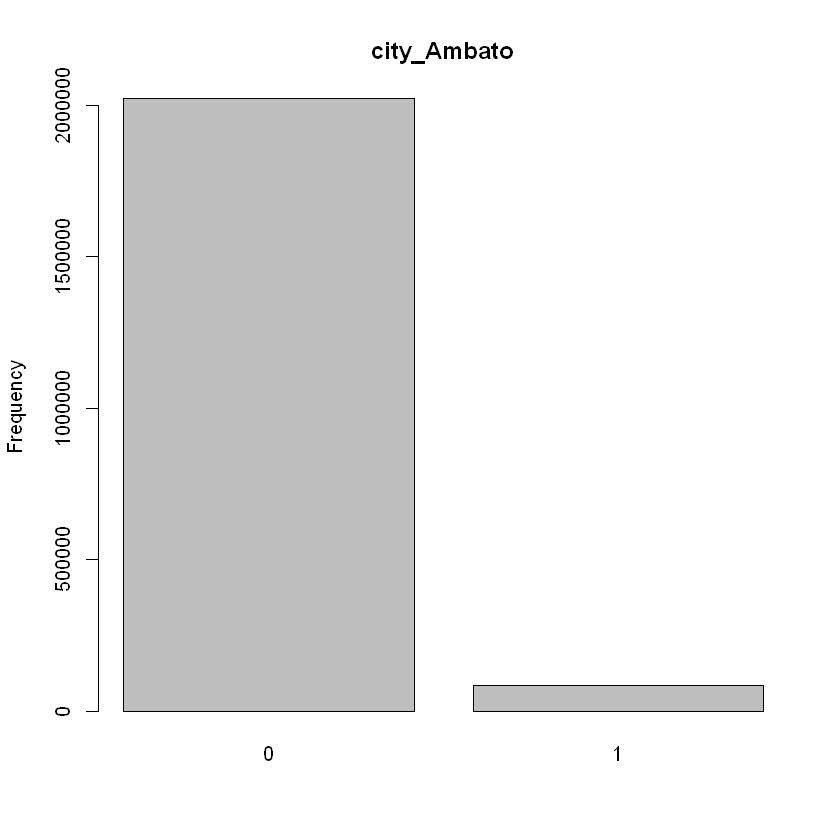

     [,1]
[1,]  0.7
[2,]  1.9


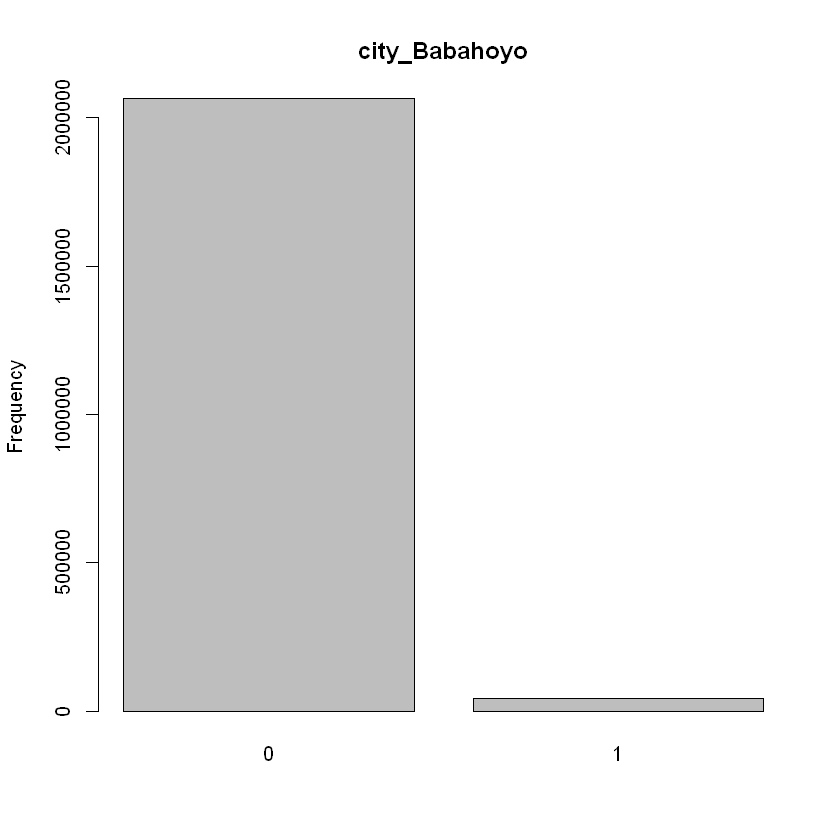

     [,1]
[1,]  0.7
[2,]  1.9


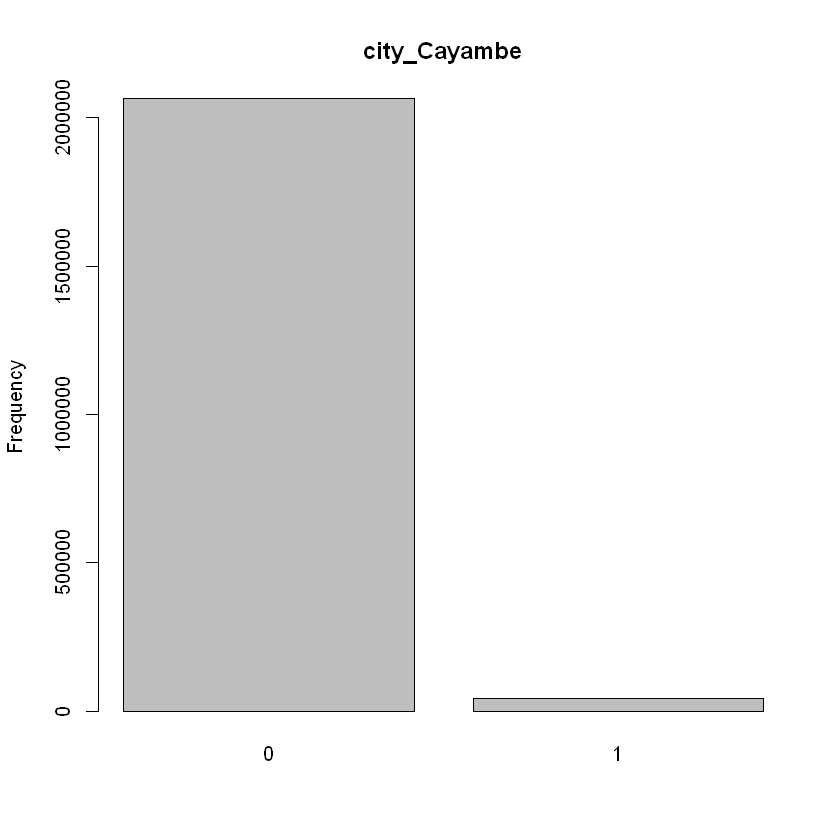

     [,1]
[1,]  0.7
[2,]  1.9


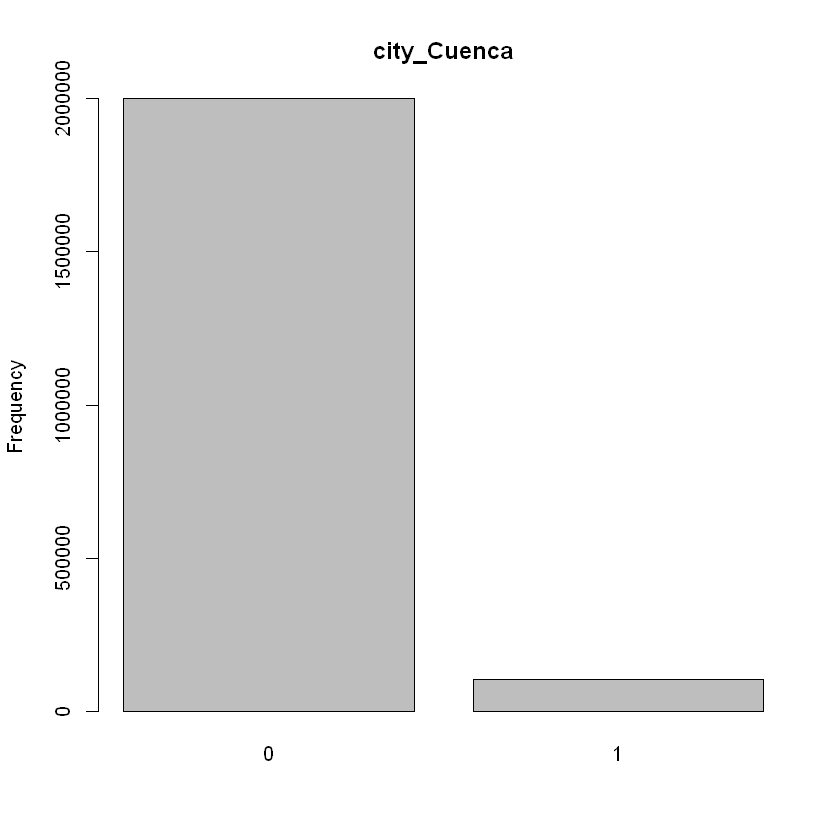

     [,1]
[1,]  0.7
[2,]  1.9


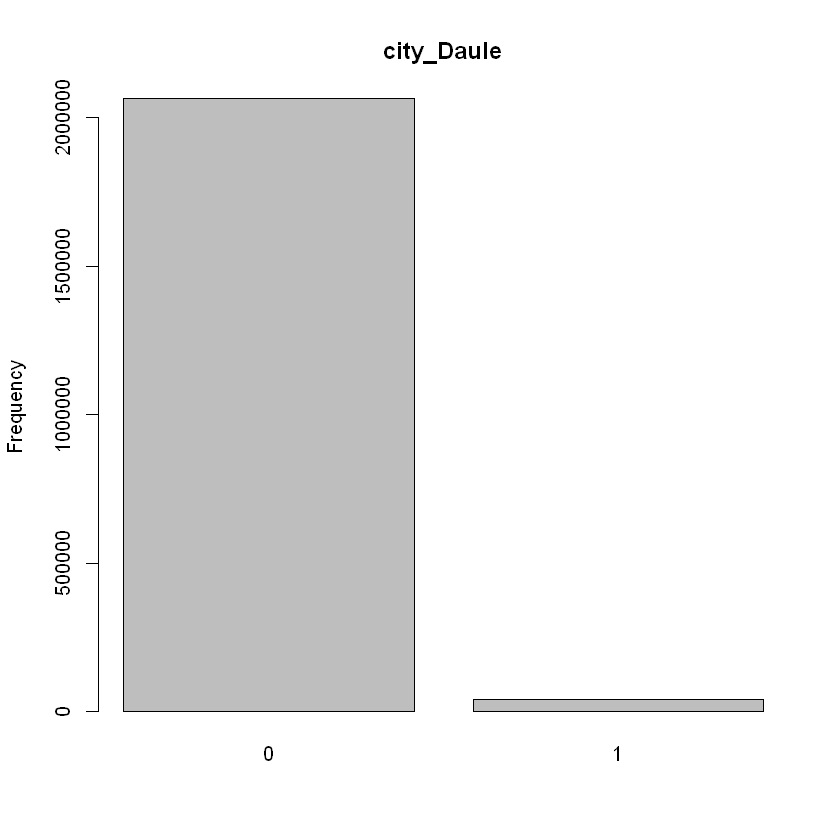

     [,1]
[1,]  0.7
[2,]  1.9


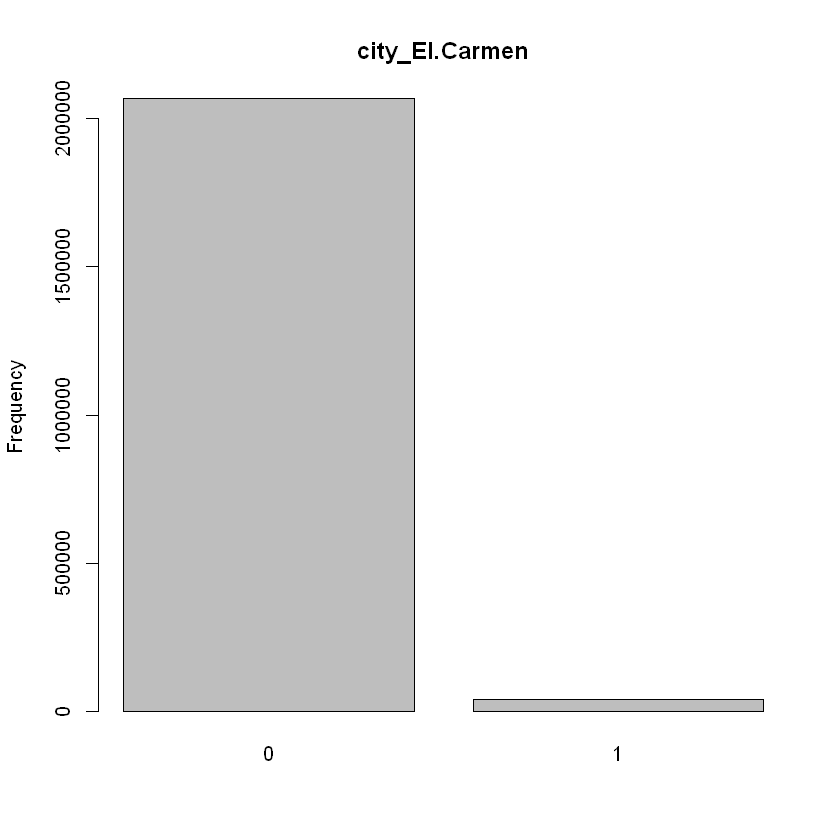

     [,1]
[1,]  0.7
[2,]  1.9


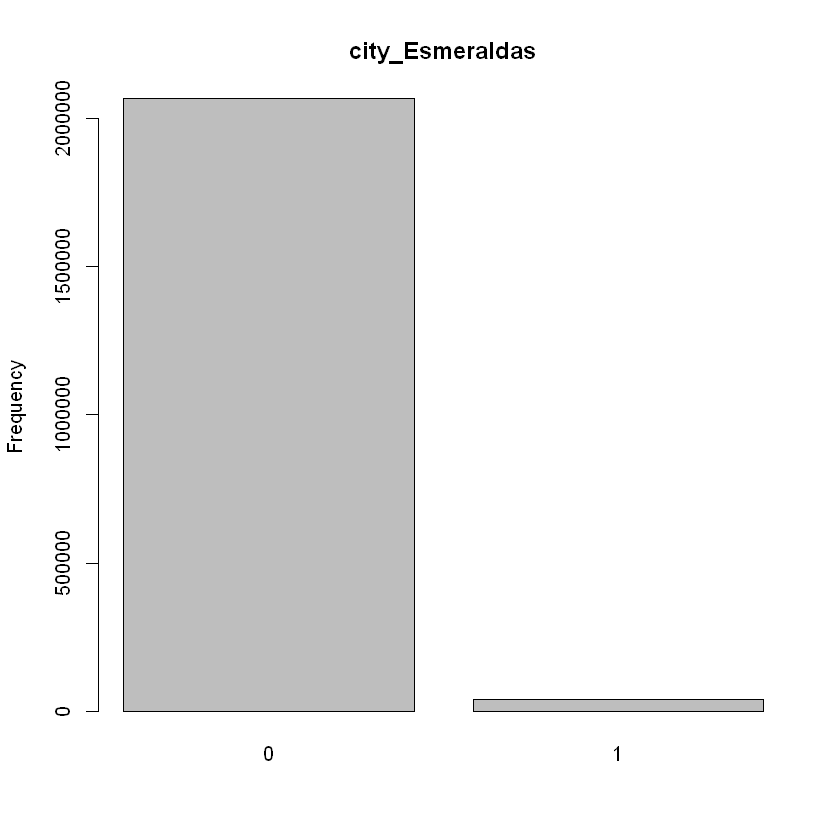

     [,1]
[1,]  0.7
[2,]  1.9


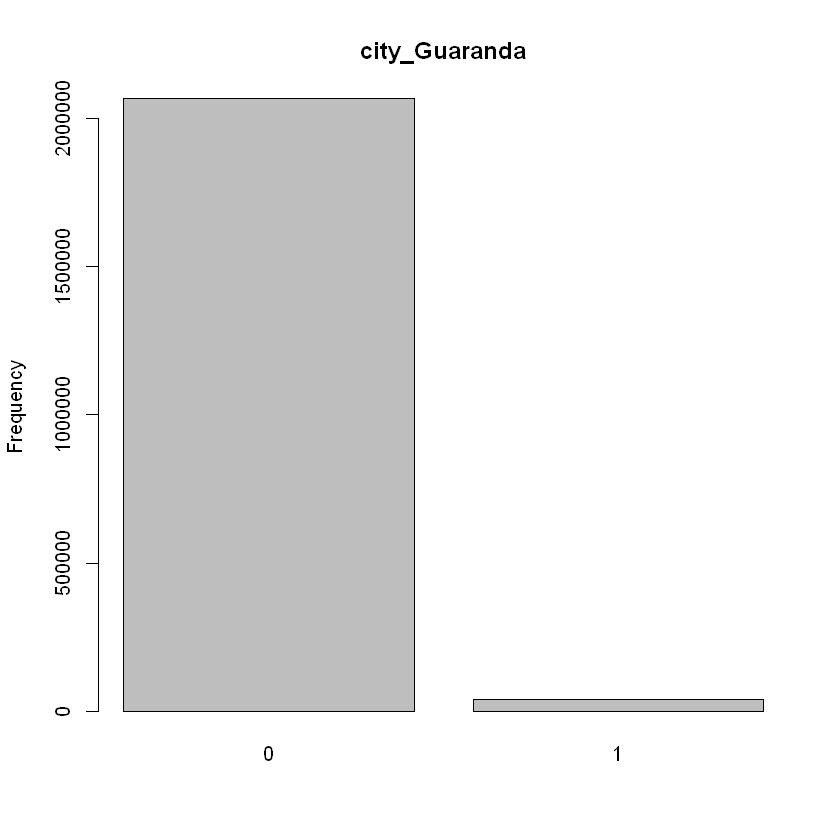

     [,1]
[1,]  0.7
[2,]  1.9


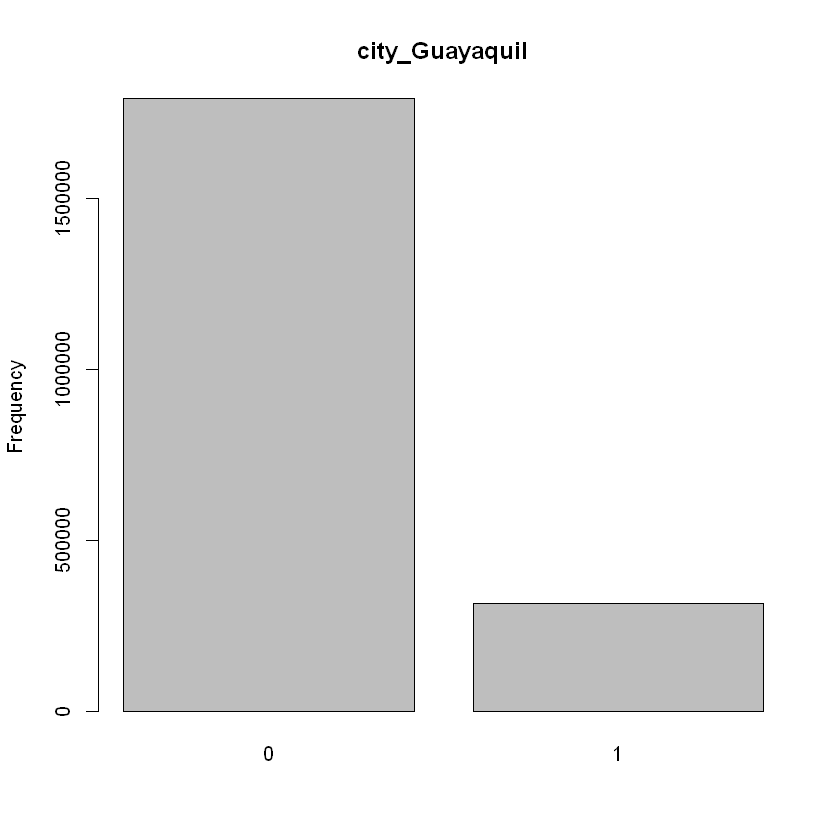

     [,1]
[1,]  0.7
[2,]  1.9


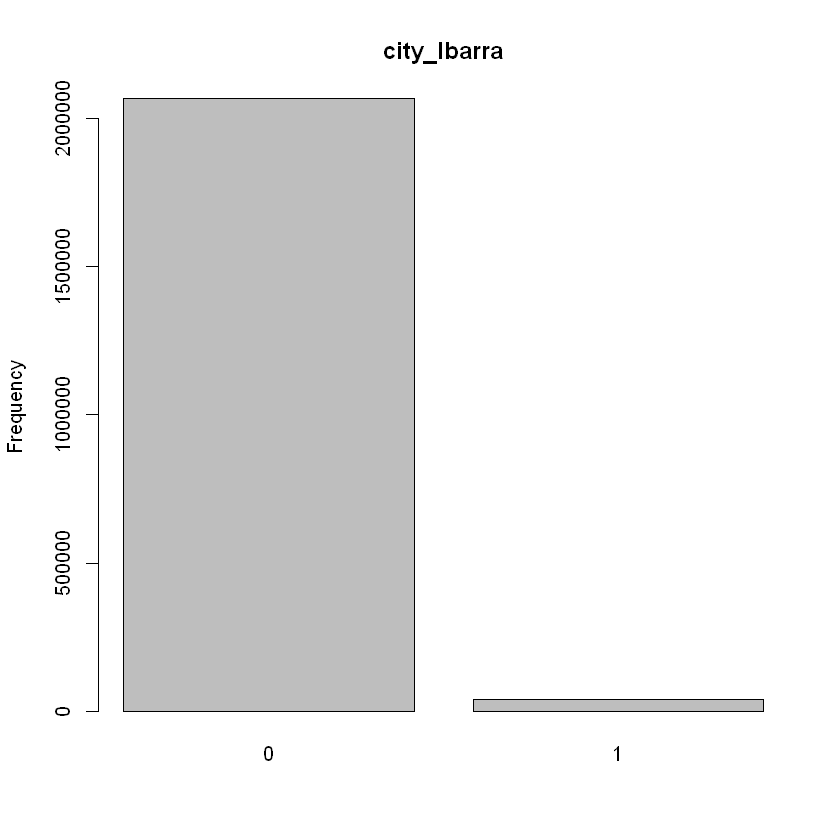

     [,1]
[1,]  0.7
[2,]  1.9


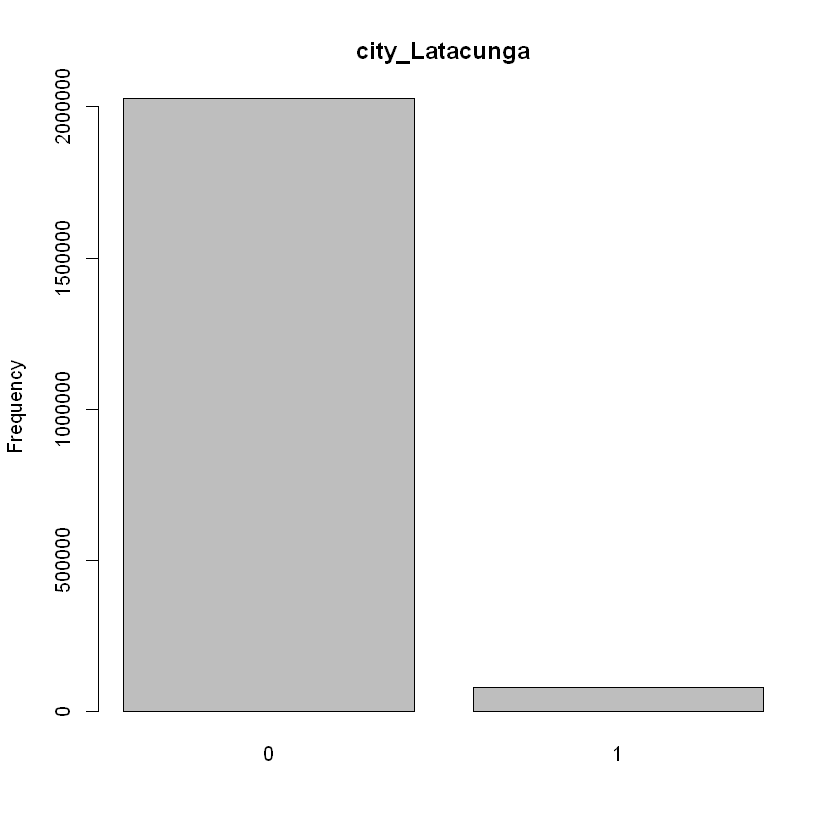

     [,1]
[1,]  0.7
[2,]  1.9


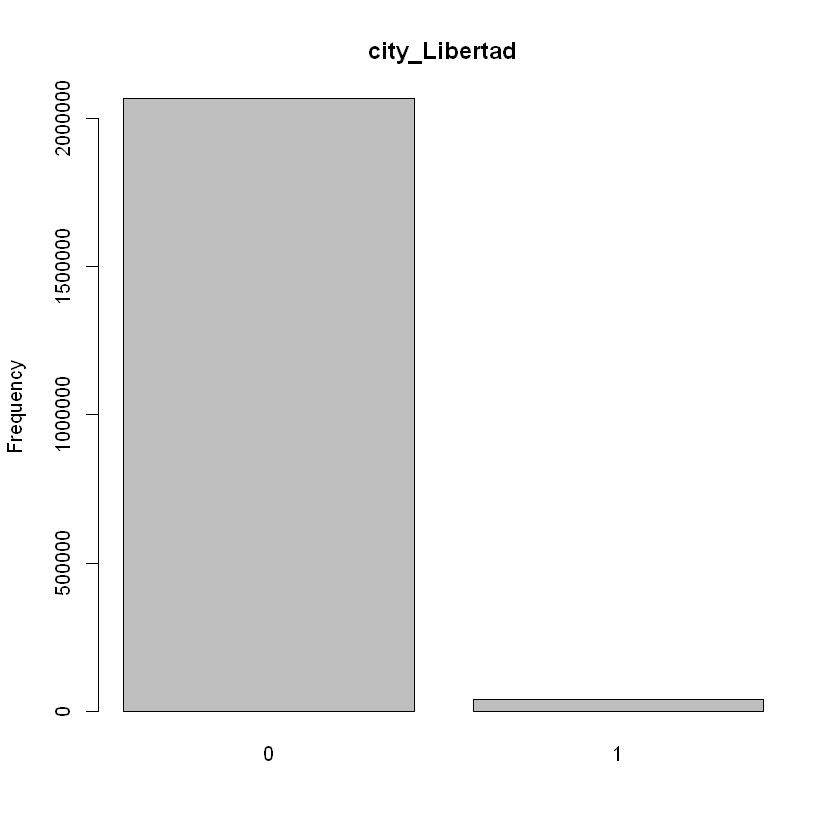

     [,1]
[1,]  0.7
[2,]  1.9


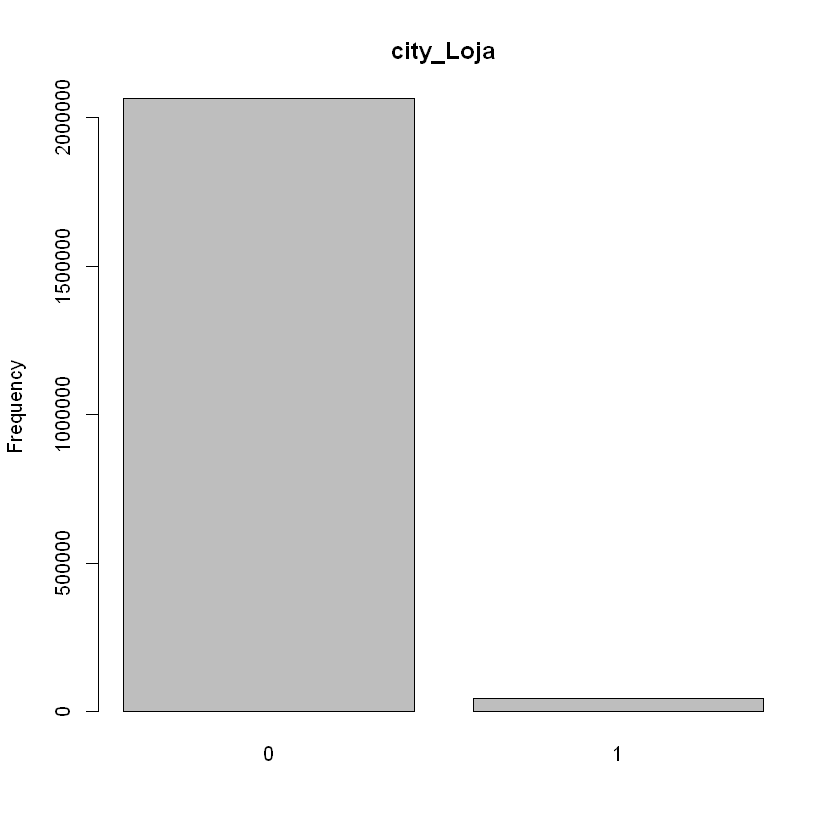

     [,1]
[1,]  0.7
[2,]  1.9


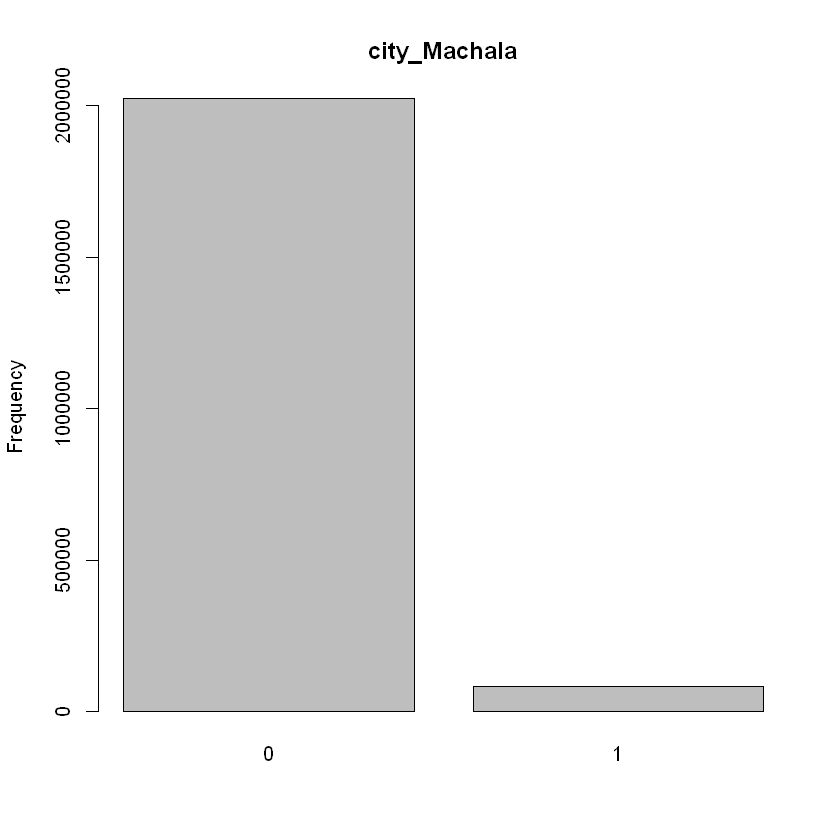

     [,1]
[1,]  0.7
[2,]  1.9


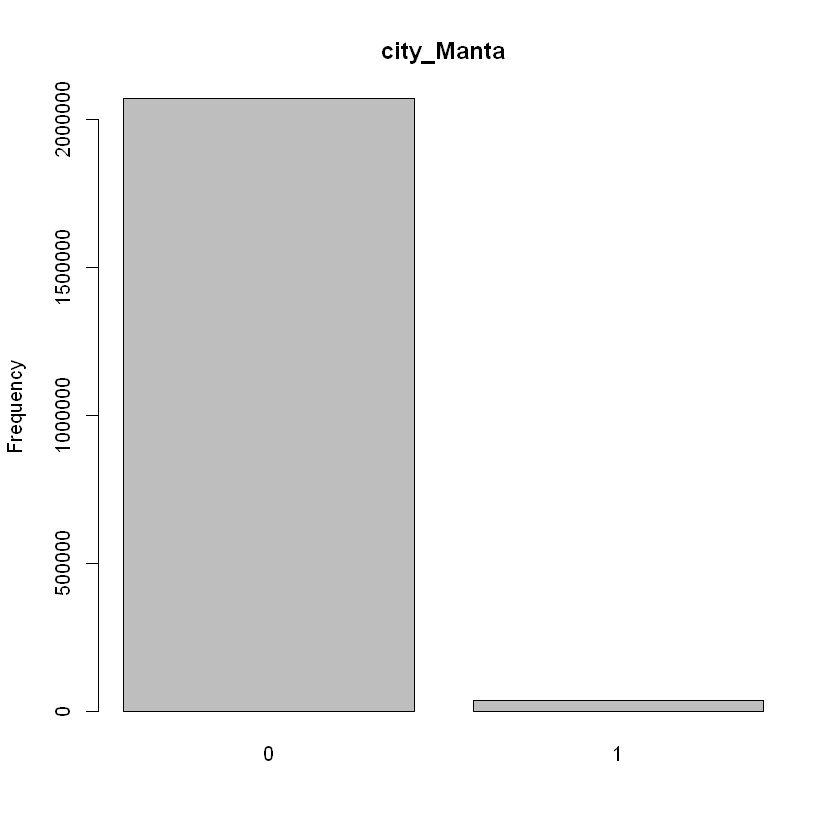

     [,1]
[1,]  0.7
[2,]  1.9


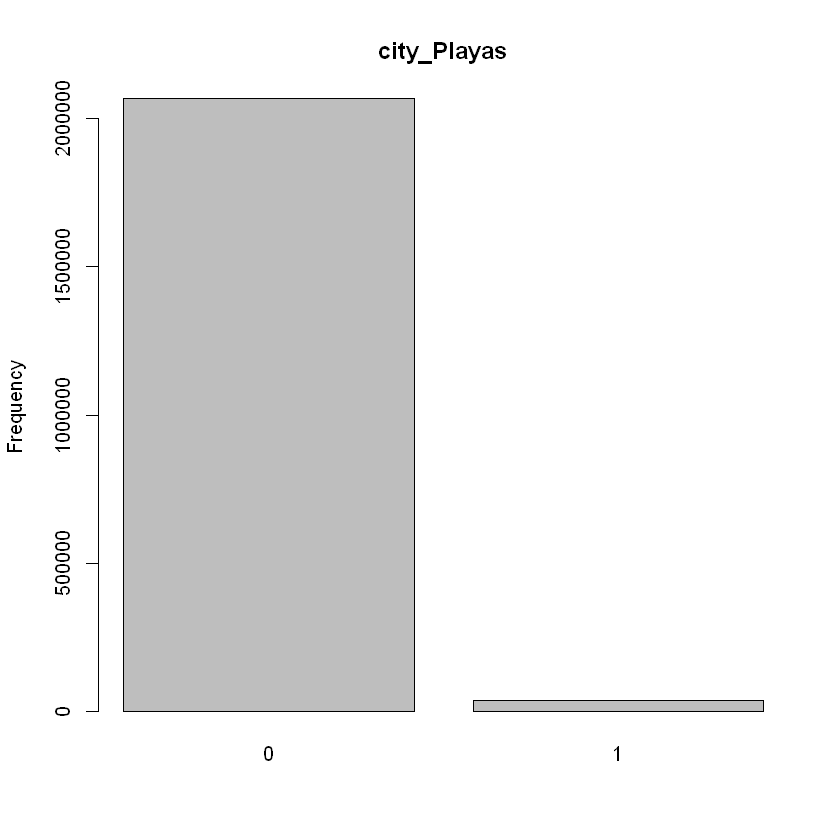

     [,1]
[1,]  0.7
[2,]  1.9


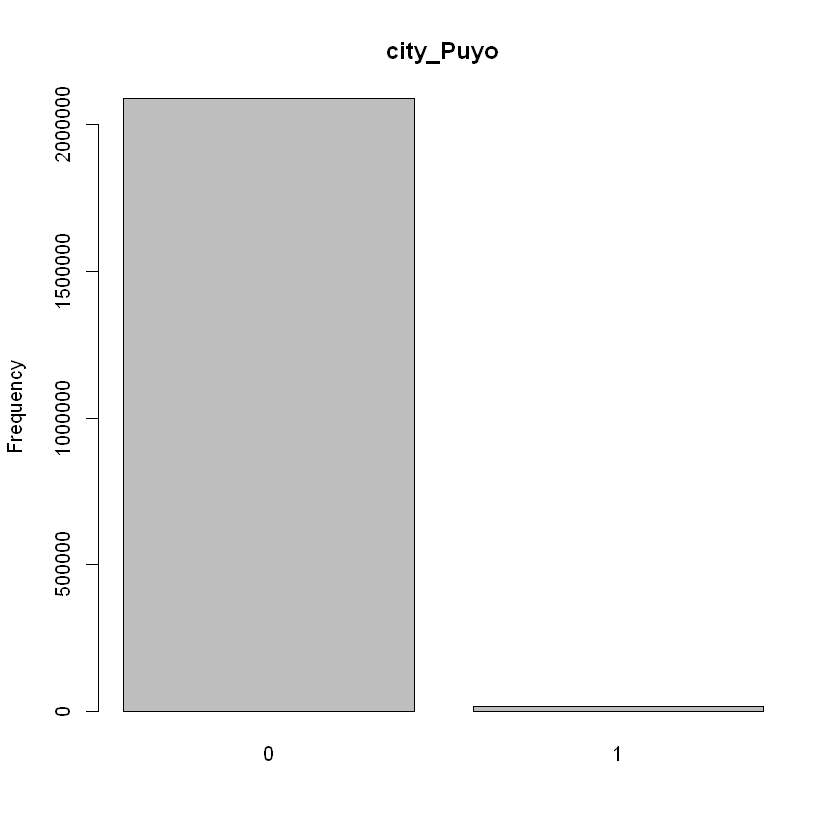

     [,1]
[1,]  0.7
[2,]  1.9


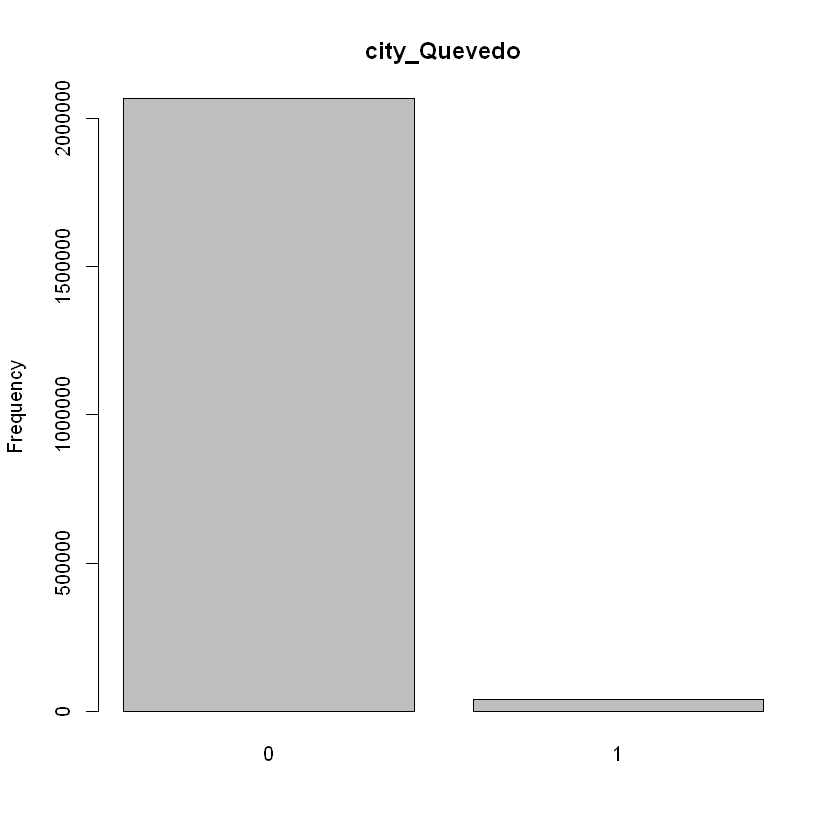

     [,1]
[1,]  0.7
[2,]  1.9


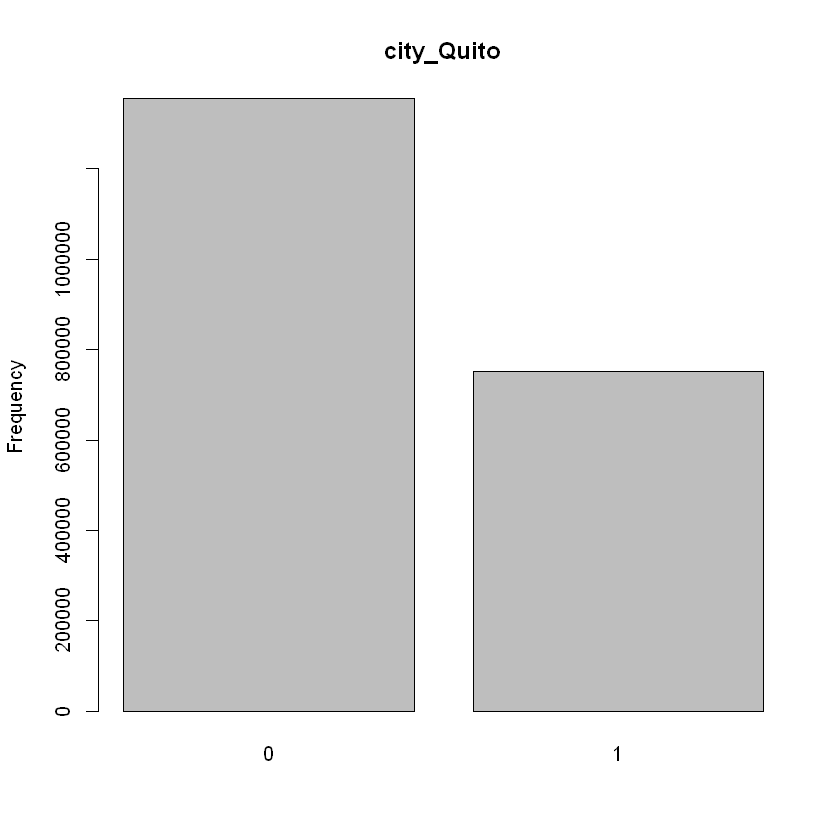

     [,1]
[1,]  0.7
[2,]  1.9


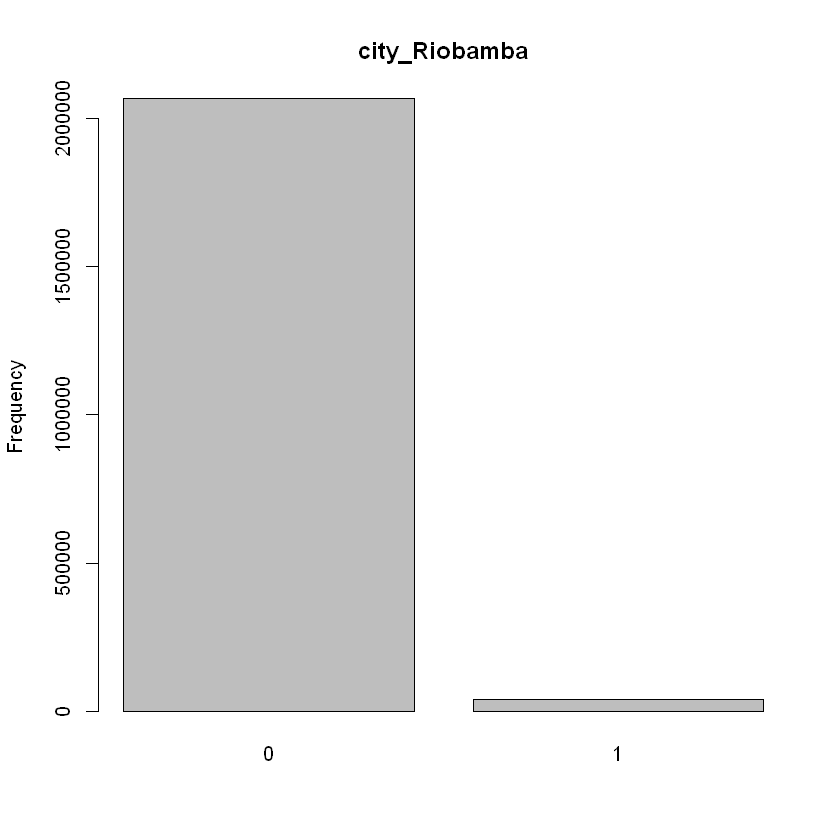

     [,1]
[1,]  0.7
[2,]  1.9


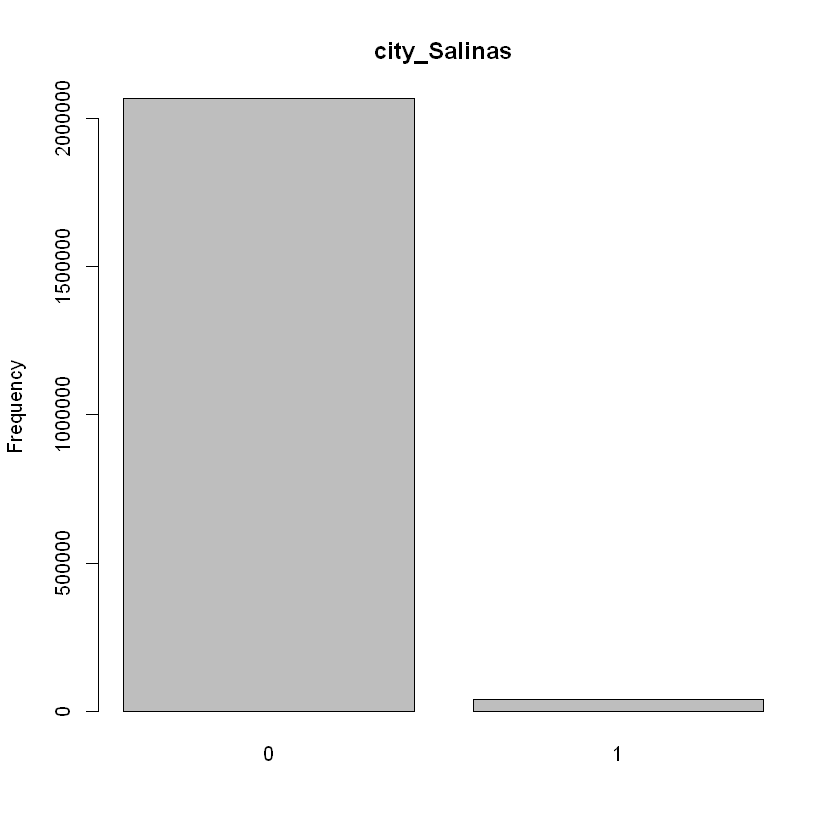

     [,1]
[1,]  0.7
[2,]  1.9


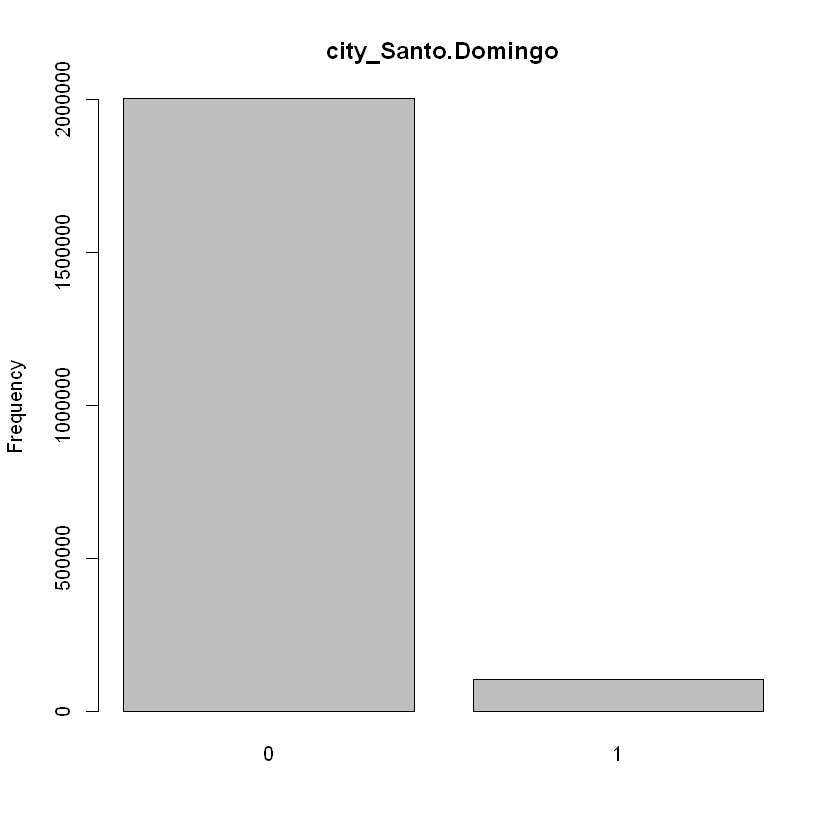

     [,1]
[1,]  0.7
[2,]  1.9


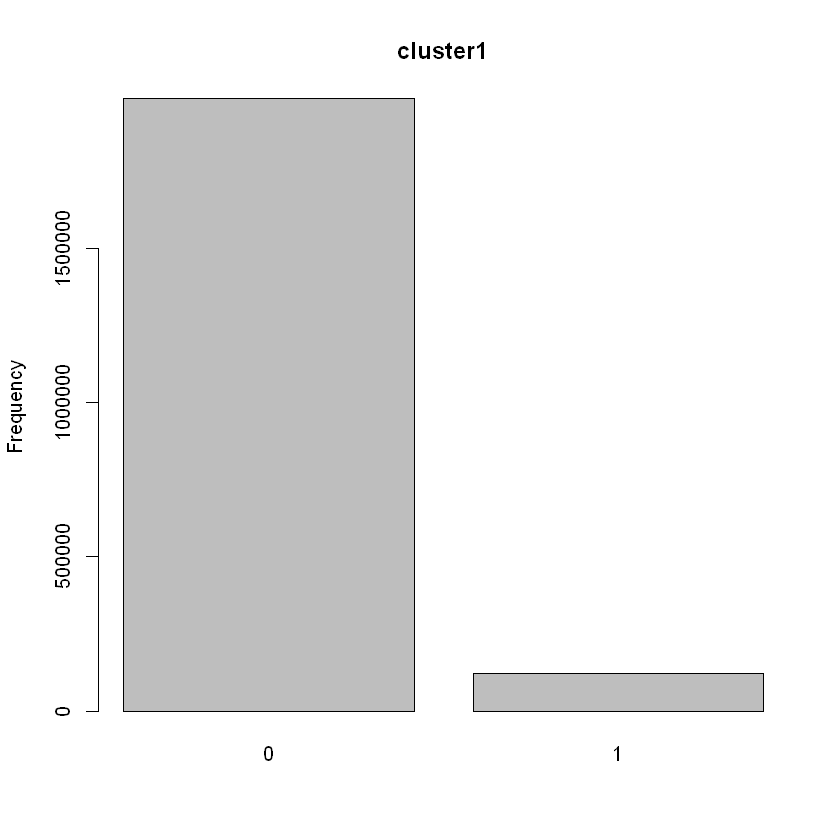

     [,1]
[1,]  0.7
[2,]  1.9


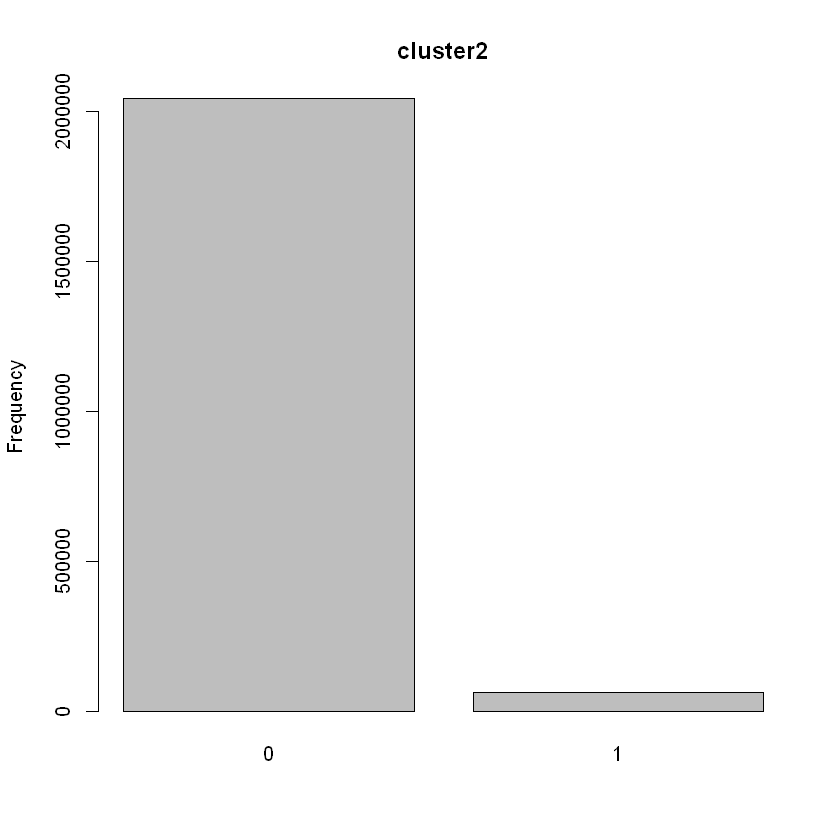

     [,1]
[1,]  0.7
[2,]  1.9


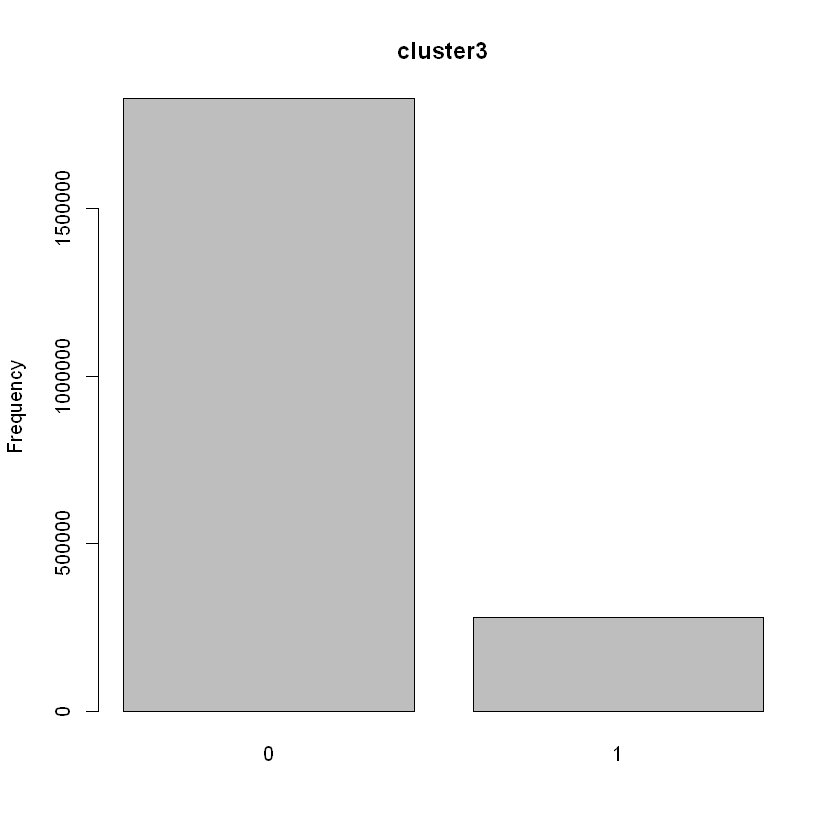

     [,1]
[1,]  0.7
[2,]  1.9


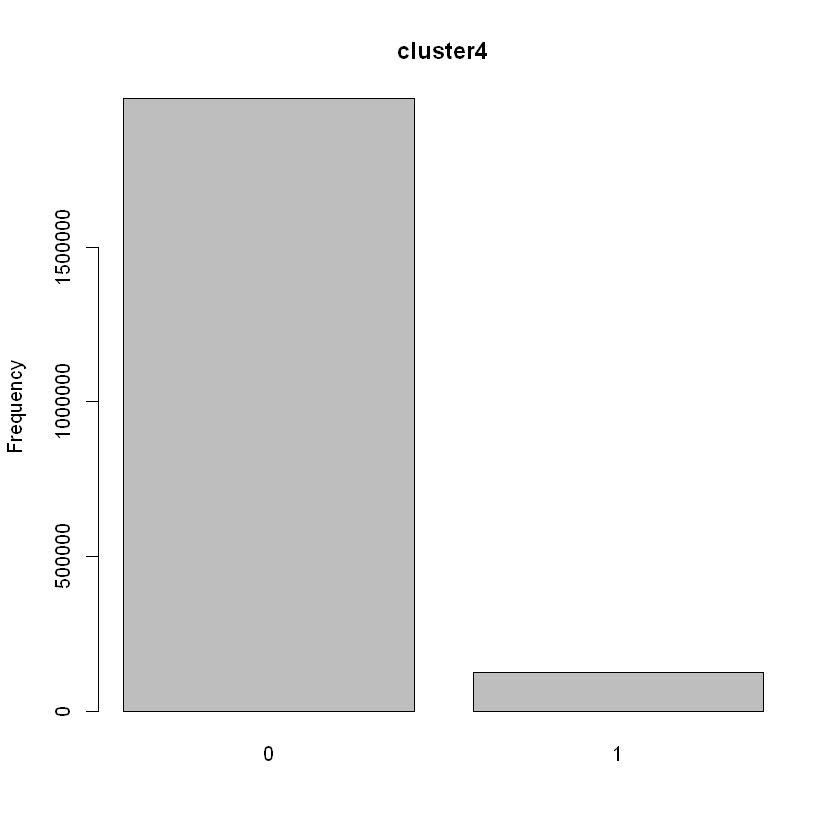

     [,1]
[1,]  0.7
[2,]  1.9


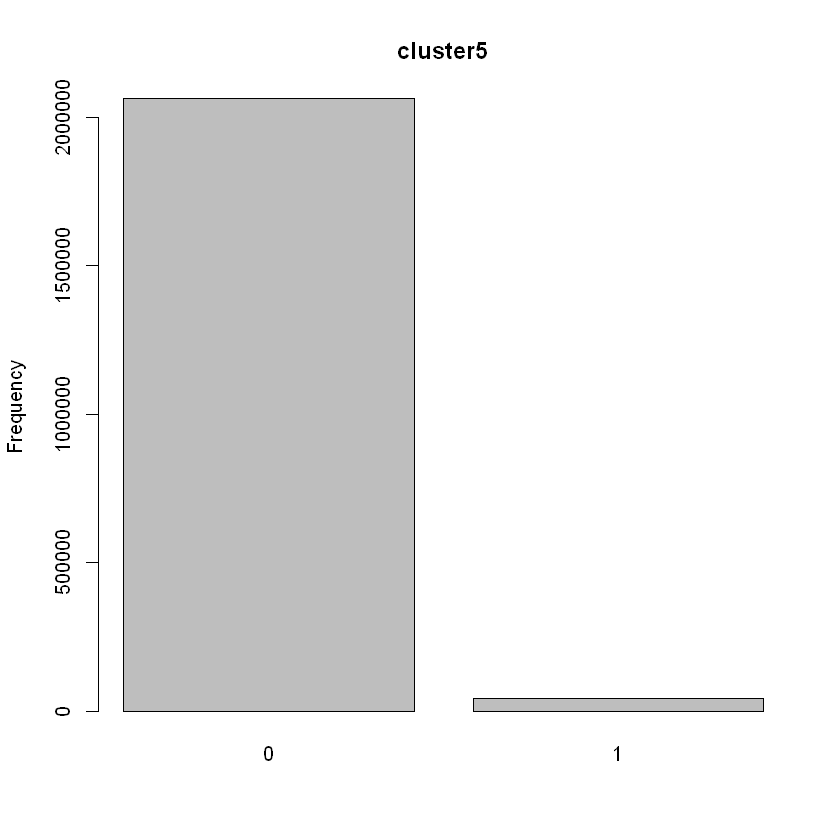

     [,1]
[1,]  0.7
[2,]  1.9


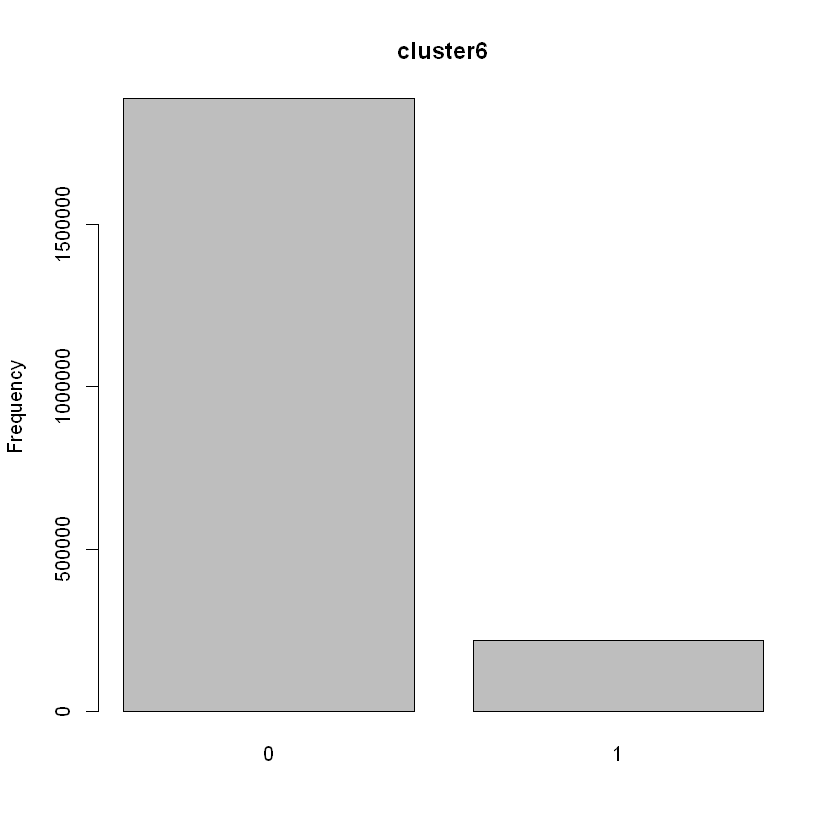

     [,1]
[1,]  0.7
[2,]  1.9


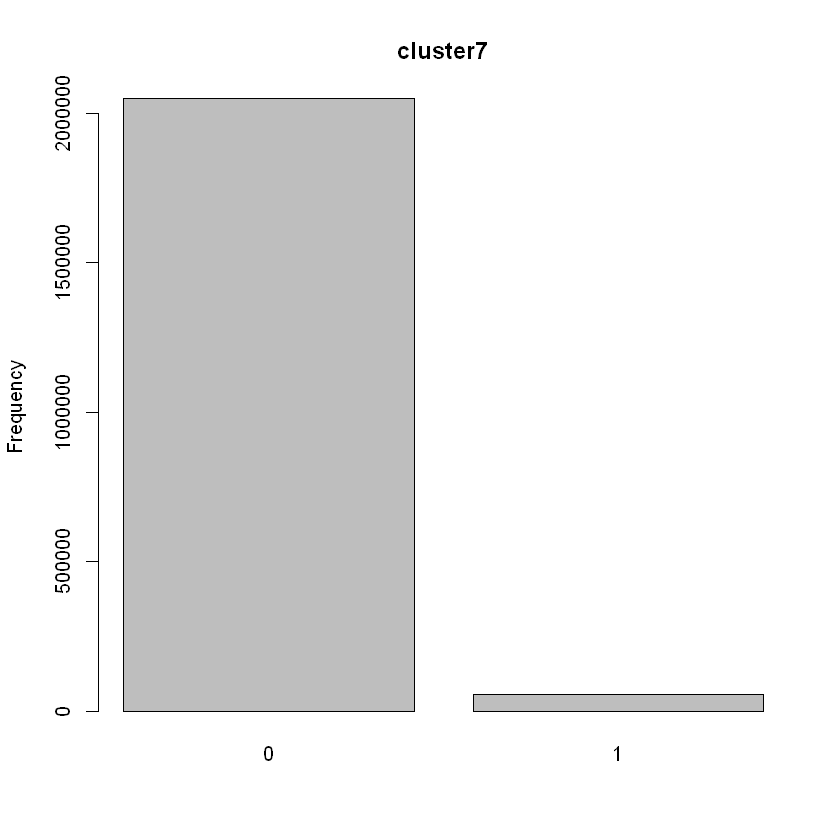

     [,1]
[1,]  0.7
[2,]  1.9


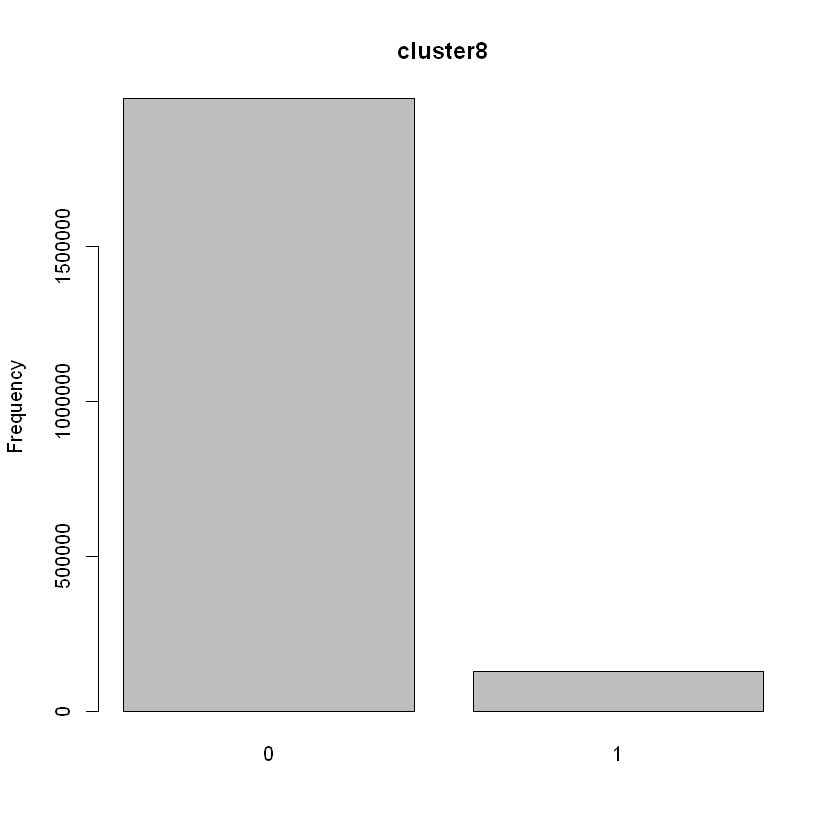

     [,1]
[1,]  0.7
[2,]  1.9


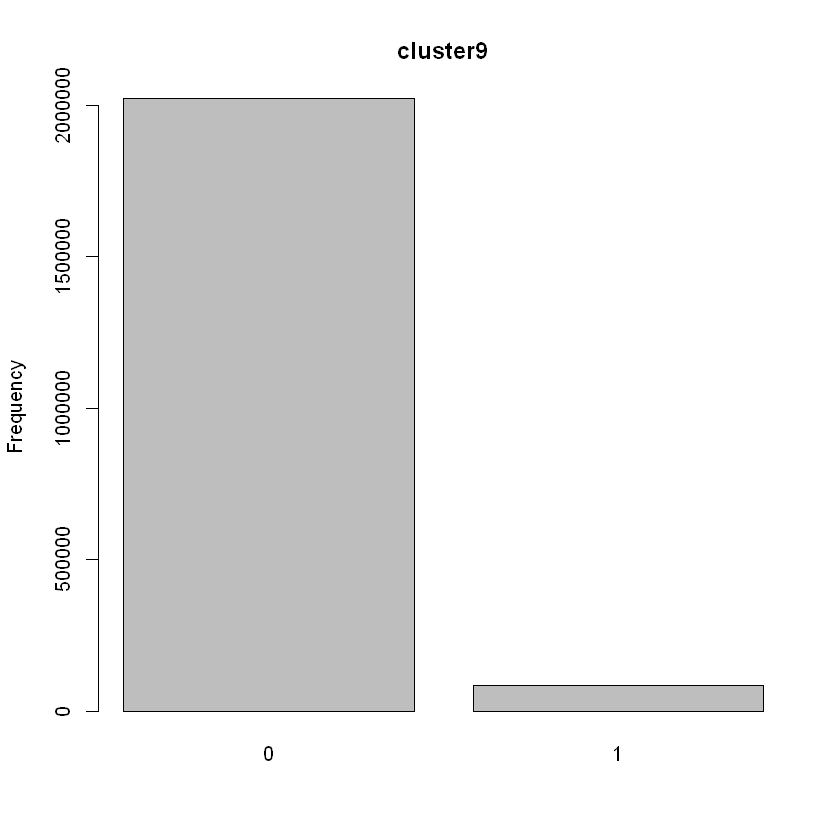

     [,1]
[1,]  0.7
[2,]  1.9


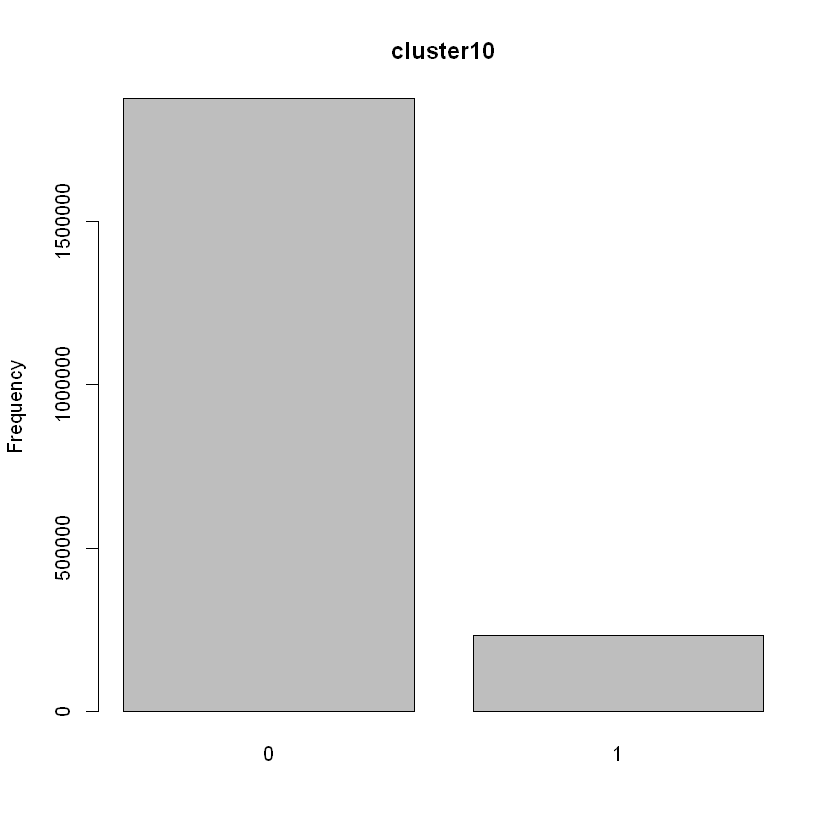

     [,1]
[1,]  0.7
[2,]  1.9


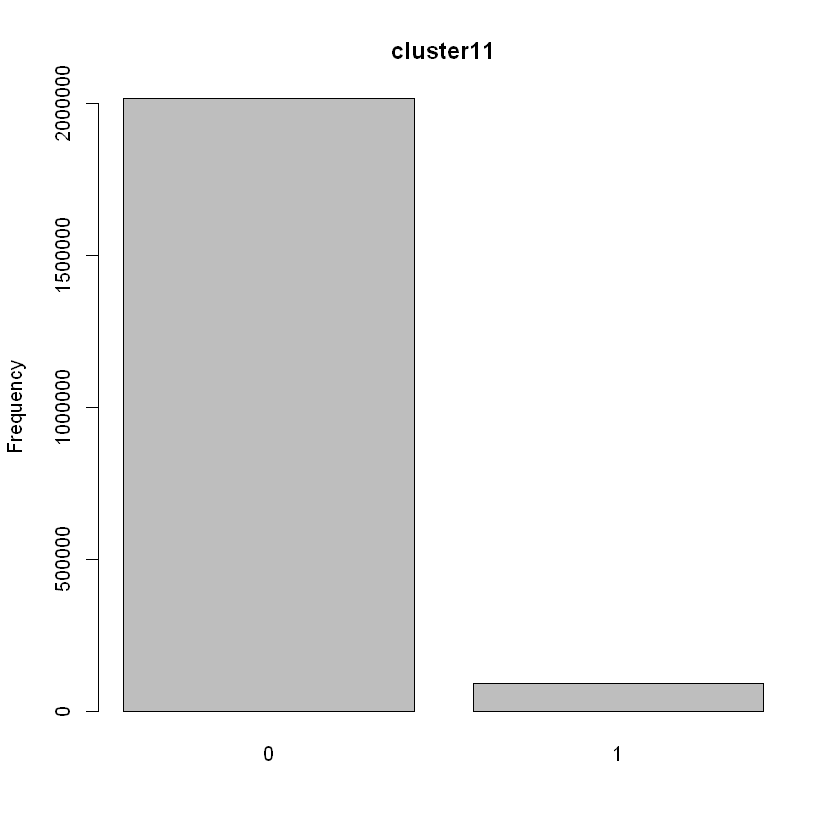

     [,1]
[1,]  0.7
[2,]  1.9


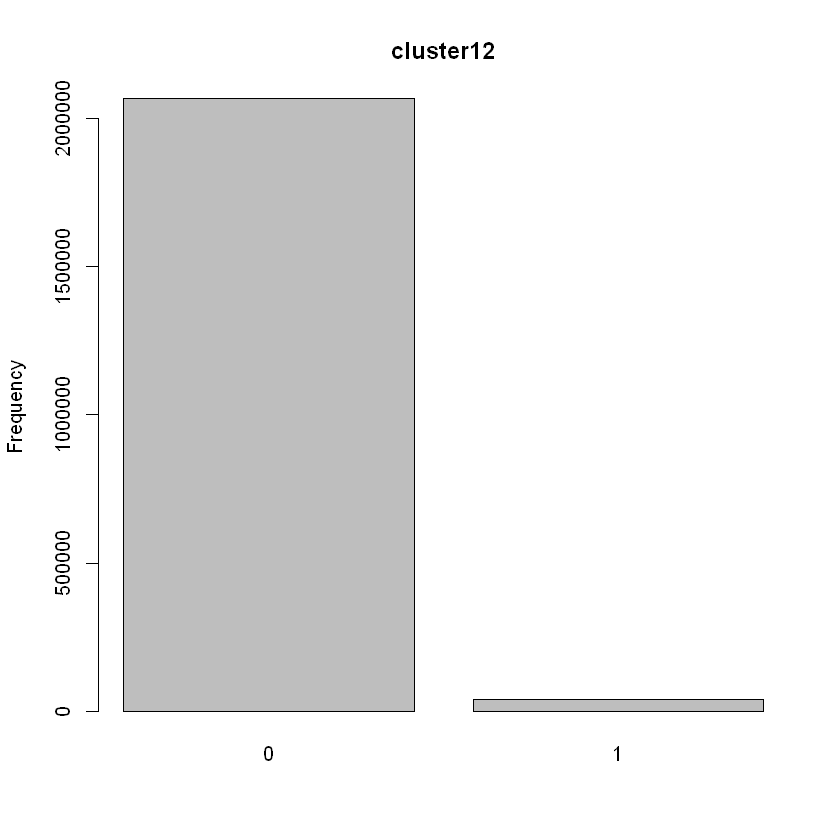

     [,1]
[1,]  0.7
[2,]  1.9


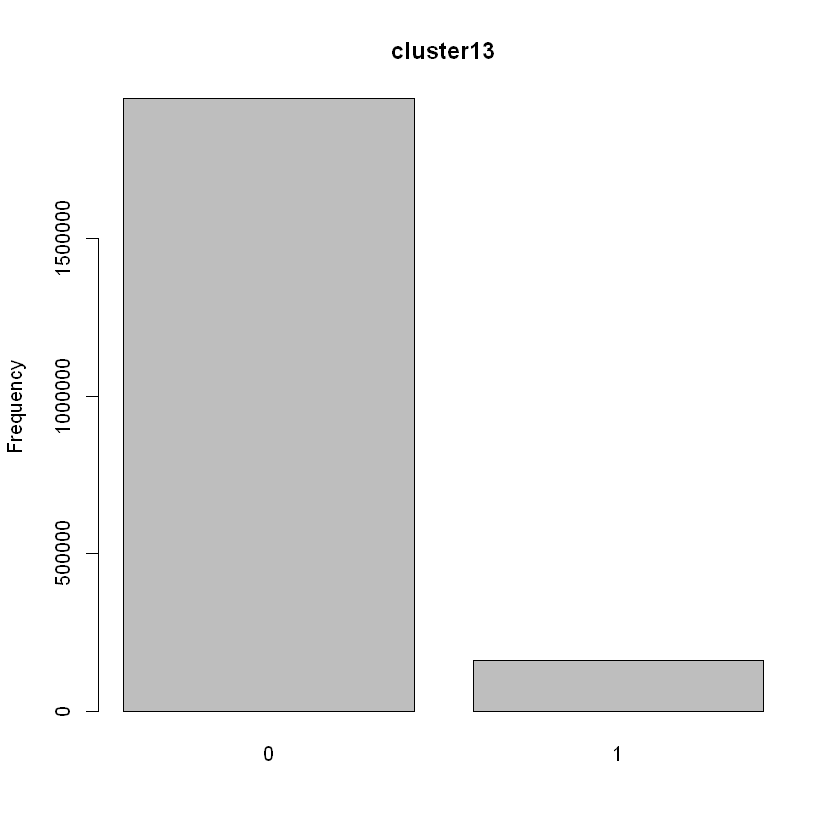

     [,1]
[1,]  0.7
[2,]  1.9


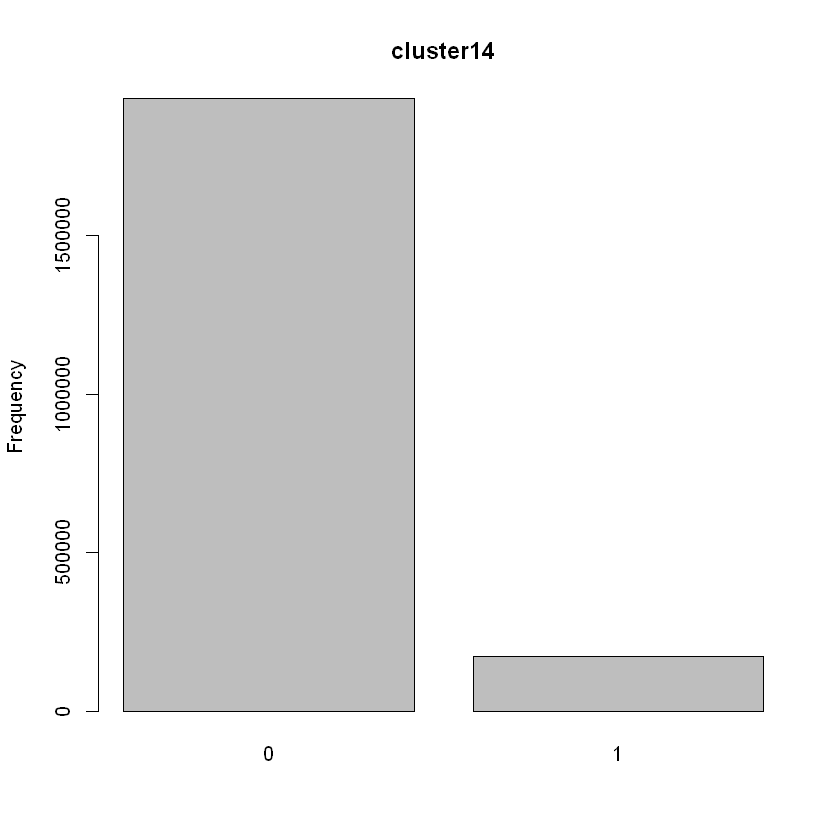

     [,1]
[1,]  0.7
[2,]  1.9


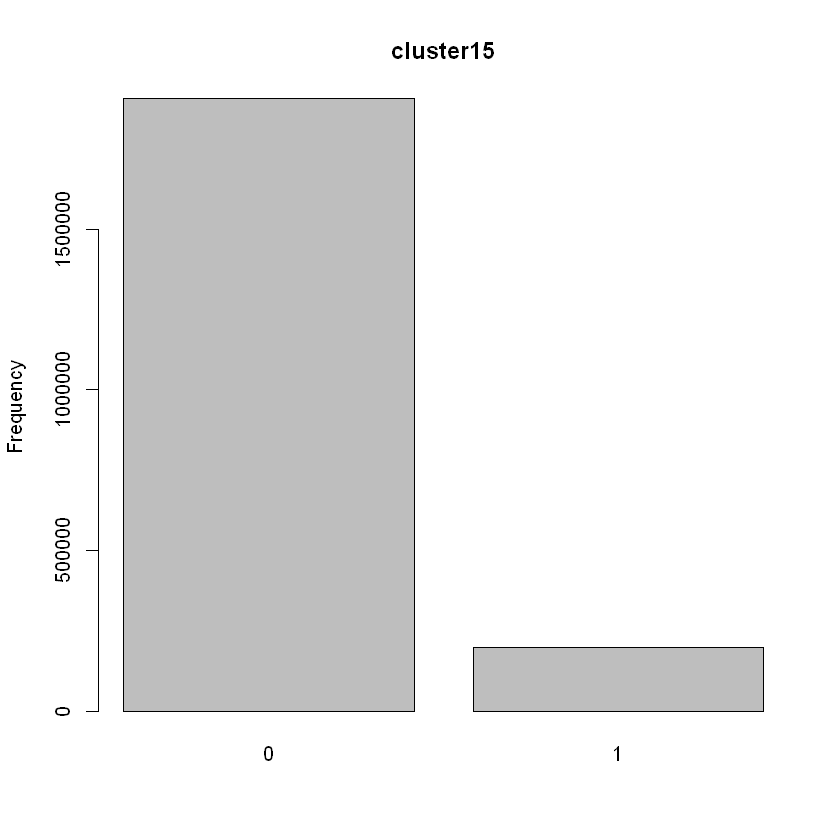

     [,1]
[1,]  0.7
[2,]  1.9


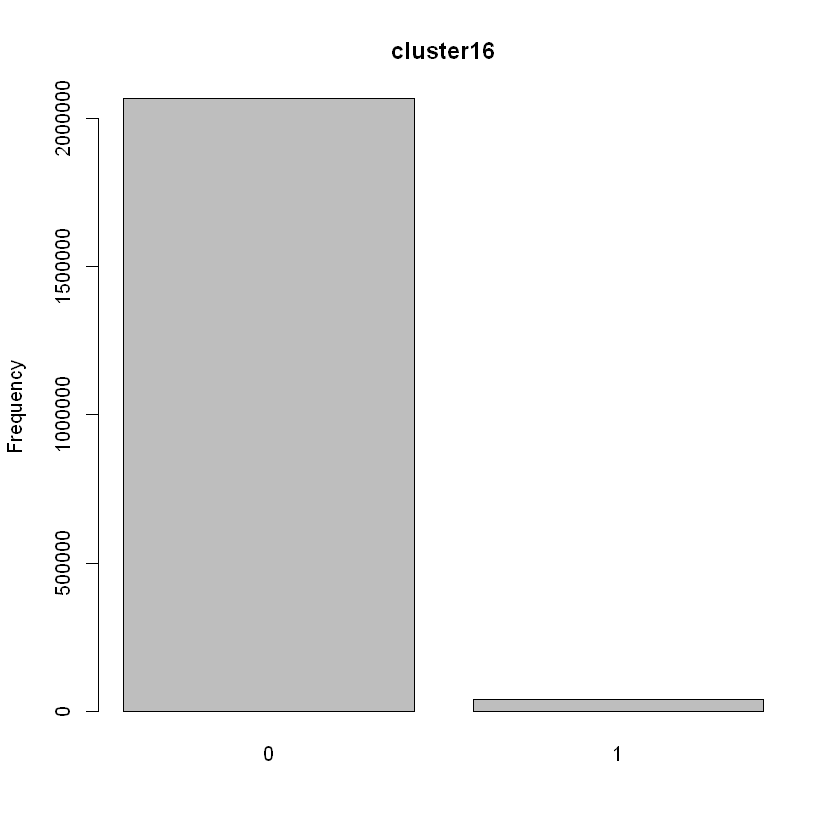

     [,1]
[1,]  0.7
[2,]  1.9


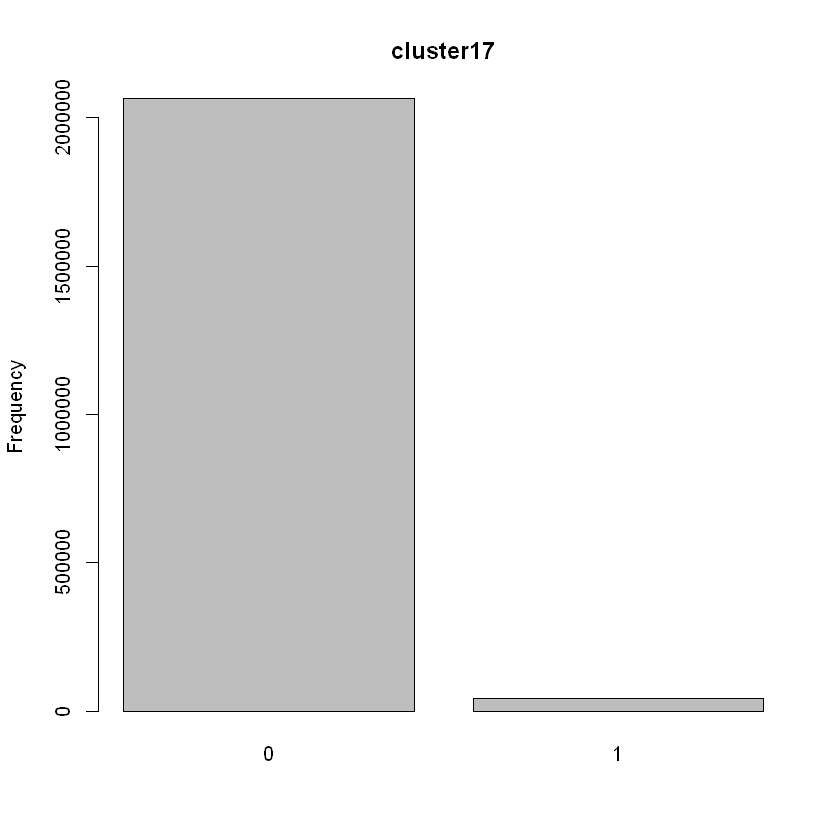

In [26]:
for (v in cf){
    print(barplot(table(df[[v]]), ylab='Frequency', main=v))
}

In [58]:
missingMatrix <- function(data) {
    vn <- names(data)
    missdata <- data.frame(row1=1:nrow(data))
    for(v in vn) {
        mv <- ifelse(is.na(data[[v]]),1,0)
        missdata[v] <- mv
    }
    missdata$row1 <- NULL
    return(missdata)
}
getMissingness <- function (data, getRows = FALSE) {
    require(dplyr)
    l <- nrow(data)
    vn <- names(data)
    nadf <- data
    cnt <- NULL
    miss <- function(x) return(sum(is.na(x)))
    for (n in vn) {
        nadf[[n]] <- ifelse(is.na(nadf[[n]]) == T, 1, 0)
        cnt <- rbind(cnt, data.frame(n, sum(nadf[[n]])))
    }
    names(cnt) <- c("var", "na.count")
    cnt$rate <- round((cnt$na.count/nrow(nadf)) * 100, 1)
    nadf$na.cnt <- 0
    nadf$na.cnt <- rowSums(nadf)
    cnt <- cnt %>% dplyr::arrange(desc(na.count)) %>% dplyr::filter(na.count > 
        0)
    totmiss <- nadf %>% dplyr::filter(na.cnt == 0) %>% dplyr::tally()
    idx <- NULL
    msg <- (paste("This dataset has ", as.character(totmiss), 
        " (", as.character(round(totmiss/nrow(data) * 100, 1)), 
        "%)", " complete rows. Original data has ", nrow(data), 
        " rows.", sep = ""))
    if (getRows == TRUE & totmiss != 0) {
        nadf$rn <- seq_len(nrow(data))
        idx <- nadf %>% dplyr::filter(na.cnt == 0) %>% dplyr::select(rn)
    }
    print(list(head(cnt, n = 10), msg))
    return(list(missingness = cnt, message = msg, rows = idx$rn))
}

2.1 - Descriptive statistics
Generate a table showing the minimum, maximum, median, IQR, mean and standard deviation for each variable

In [20]:
install.packages("pastecs")
library(pastecs)

Installing package into 'C:/Users/Guy/Documents/R/win-library/3.6'
(as 'lib' is unspecified)



package 'pastecs' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\Guy\AppData\Local\Temp\RtmpmikToM\downloaded_packages


Warning message:
"package 'pastecs' was built under R version 3.6.3"

Attaching package: 'pastecs'


The following objects are masked from 'package:dplyr':

    first, last




In [21]:
stat.desc(df)

,item_nbr,store_nbr,Year,month,total_unit_sales,city,state,store_type,store_cluster,prev_month_sales,...,cluster8,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
nbr.val,2.107339e+06,2.107339e+06,2.107339e+06,2.107339e+06,2.107339e+06,NA,NA,NA,NA,2.063241e+06,...,2.107339e+06,2.107339e+06,2.107339e+06,2.107339e+06,2.107339e+06,2.107339e+06,2.107339e+06,2.107339e+06,2.107339e+06,2.107339e+06
nbr.null,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NA,NA,NA,NA,0.000000e+00,...,1.977872e+06,2.022970e+06,1.875214e+06,2.016545e+06,2.066300e+06,1.946038e+06,1.933553e+06,1.906987e+06,2.066891e+06,2.064382e+06
nbr.na,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NA,NA,NA,NA,4.409800e+04,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
min,1.035200e+05,1.000000e+00,2.013000e+03,1.000000e+00,2.118804e-01,NA,NA,NA,NA,2.118804e-01,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,1.464218e+06,5.400000e+01,2.017000e+03,1.200000e+01,1.074875e+01,NA,NA,NA,NA,1.074875e+01,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
range,1.360698e+06,5.300000e+01,4.000000e+00,1.100000e+01,1.053687e+01,NA,NA,NA,NA,1.053687e+01,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
sum,1.462537e+12,5.685414e+07,4.246281e+09,1.334738e+07,1.005825e+07,NA,NA,NA,NA,9.884272e+06,...,1.294670e+05,8.436900e+04,2.321250e+05,9.079400e+04,4.103900e+04,1.613010e+05,1.737860e+05,2.003520e+05,4.044800e+04,4.295700e+04
median,7.162410e+05,2.700000e+01,2.015000e+03,6.000000e+00,4.753590e+00,NA,NA,NA,NA,4.770685e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
mean,6.940206e+05,2.697911e+01,2.014997e+03,6.333759e+00,4.772961e+00,NA,NA,NA,NA,4.790653e+00,...,6.143625e-02,4.003580e-02,1.101508e-01,4.308467e-02,1.947432e-02,7.654250e-02,8.246704e-02,9.507346e-02,1.919387e-02,2.038448e-02


In [16]:
summary(df)

   item_nbr          store_nbr              Year          month       
 Length:2107339     Length:2107339     Min.   :2013   Min.   : 1.000  
 Class :character   Class :character   1st Qu.:2014   1st Qu.: 3.000  
 Mode  :character   Mode  :character   Median :2015   Median : 6.000  
                                       Mean   :2015   Mean   : 6.334  
                                       3rd Qu.:2016   3rd Qu.: 9.000  
                                       Max.   :2017   Max.   :12.000  
                                                                      
 total_unit_sales      city              state            store_type       
 Min.   : 0.2119   Length:2107339     Length:2107339     Length:2107339    
 1st Qu.: 4.0431   Class :character   Class :character   Class :character  
 Median : 4.7536   Mode  :character   Mode  :character   Mode  :character  
 Mean   : 4.7730                                                           
 3rd Qu.: 5.4972                                    

Warning message in ggcorr(df[, c(1:20, 5)], method = c("pairwise", "pearson"), nbreaks = NULL, :
"data in column(s) 'item_nbr', 'store_nbr', 'city', 'state', 'store_type', 'store_cluster' are not numeric and were ignored"
Warning message in ggcorr(df[, c(21:40, 5)], method = c("pairwise", "pearson"), :
"data in column(s) 'family', 'class', 'perishable' are not numeric and were ignored"


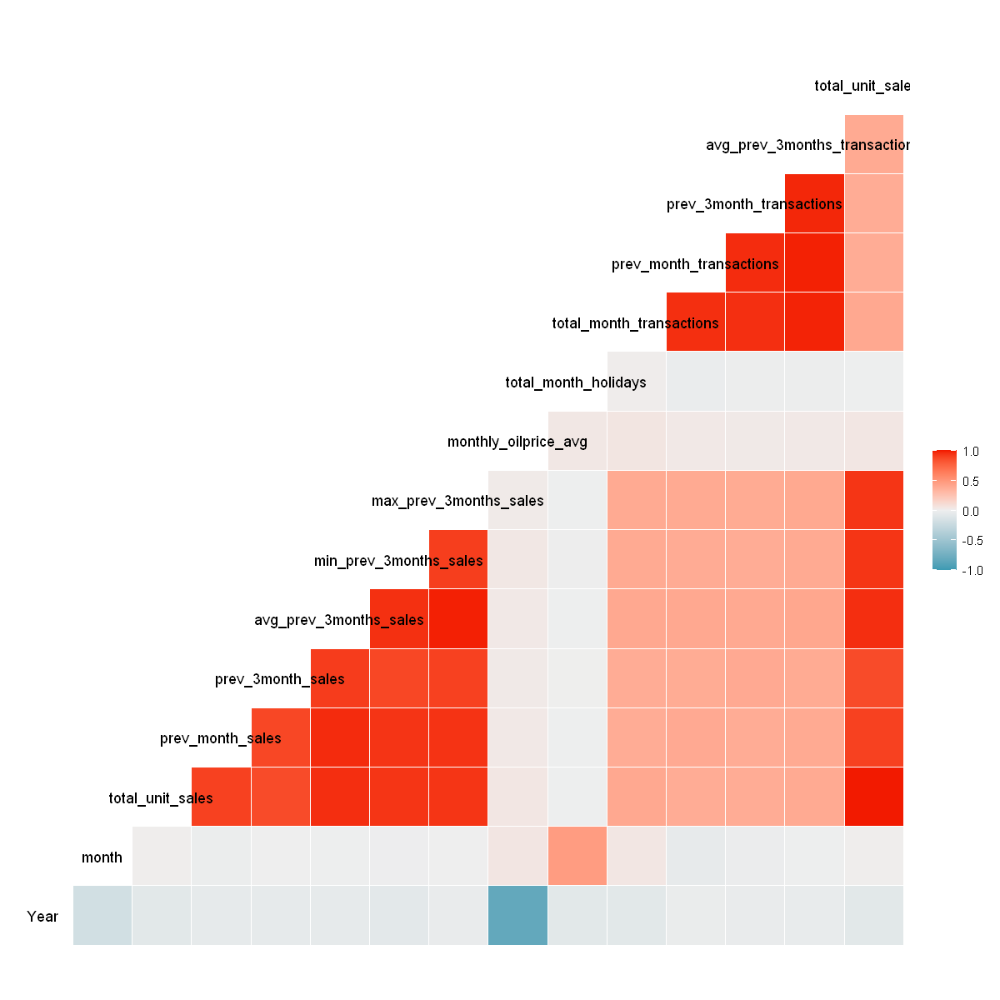

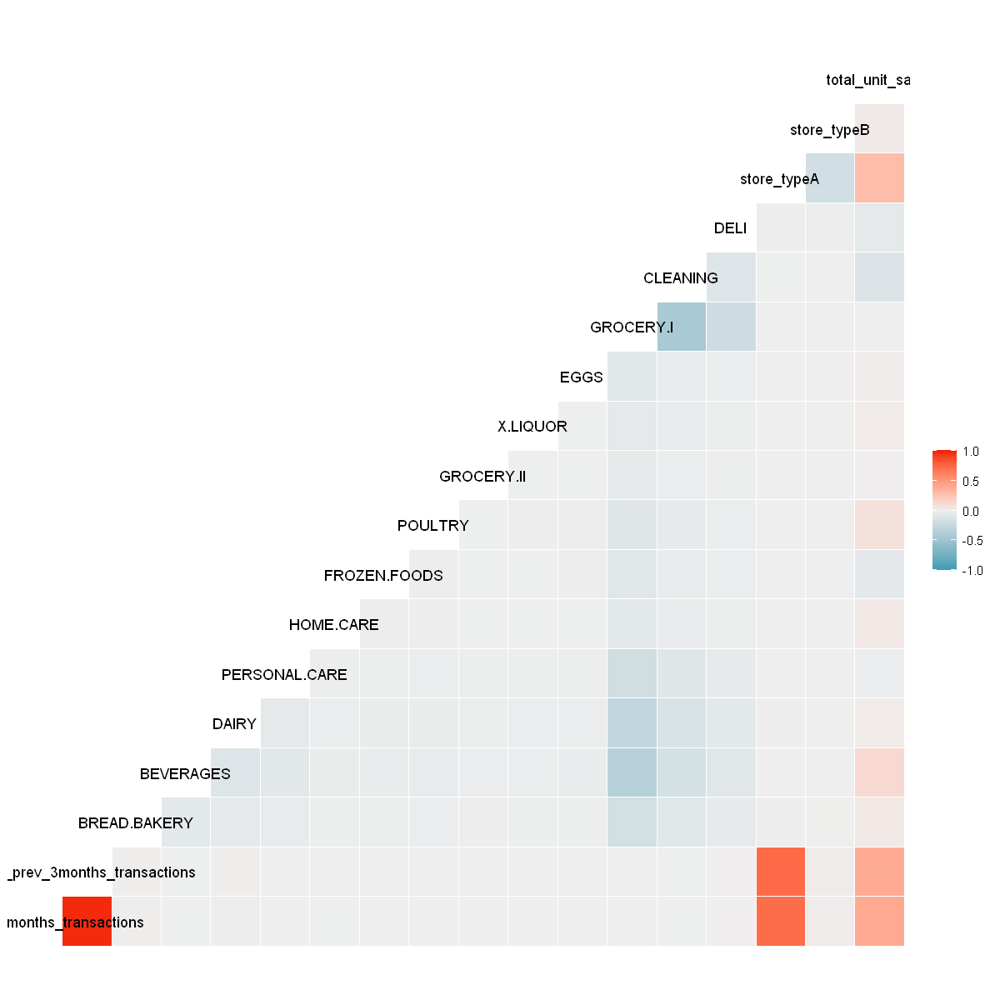

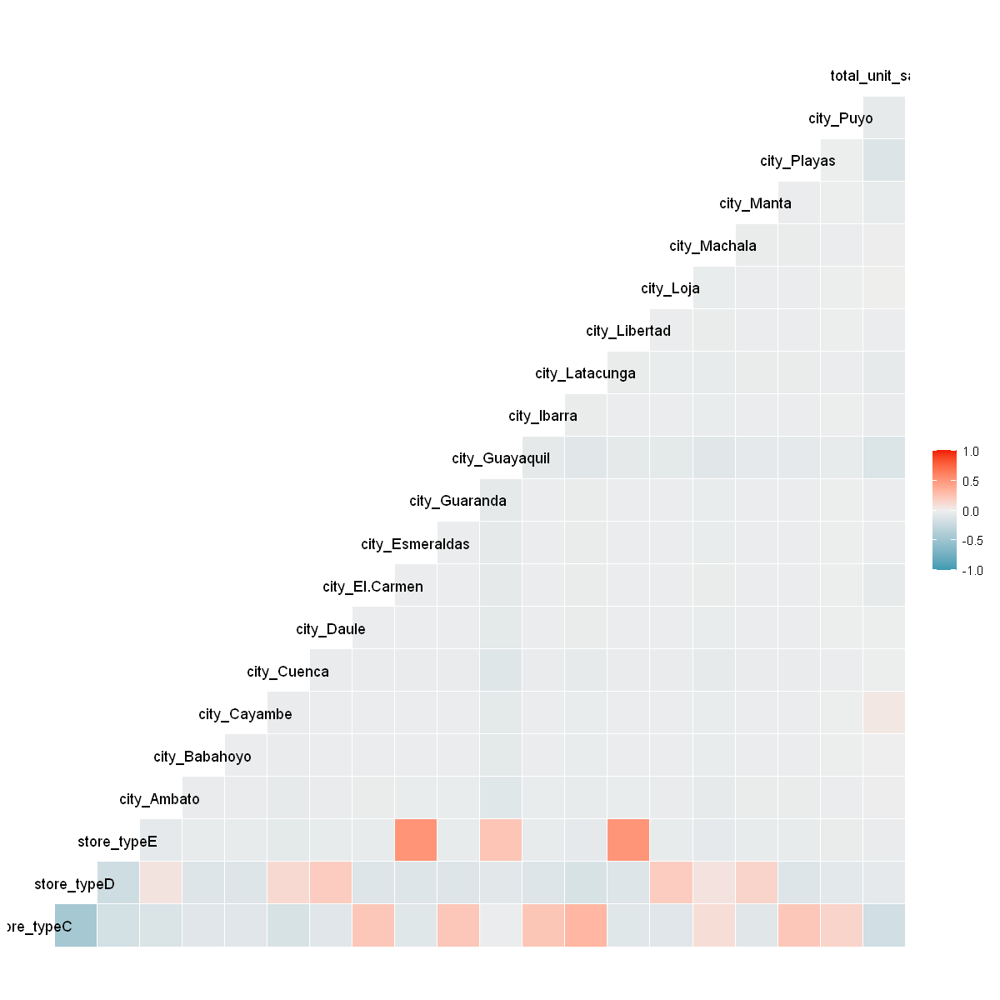

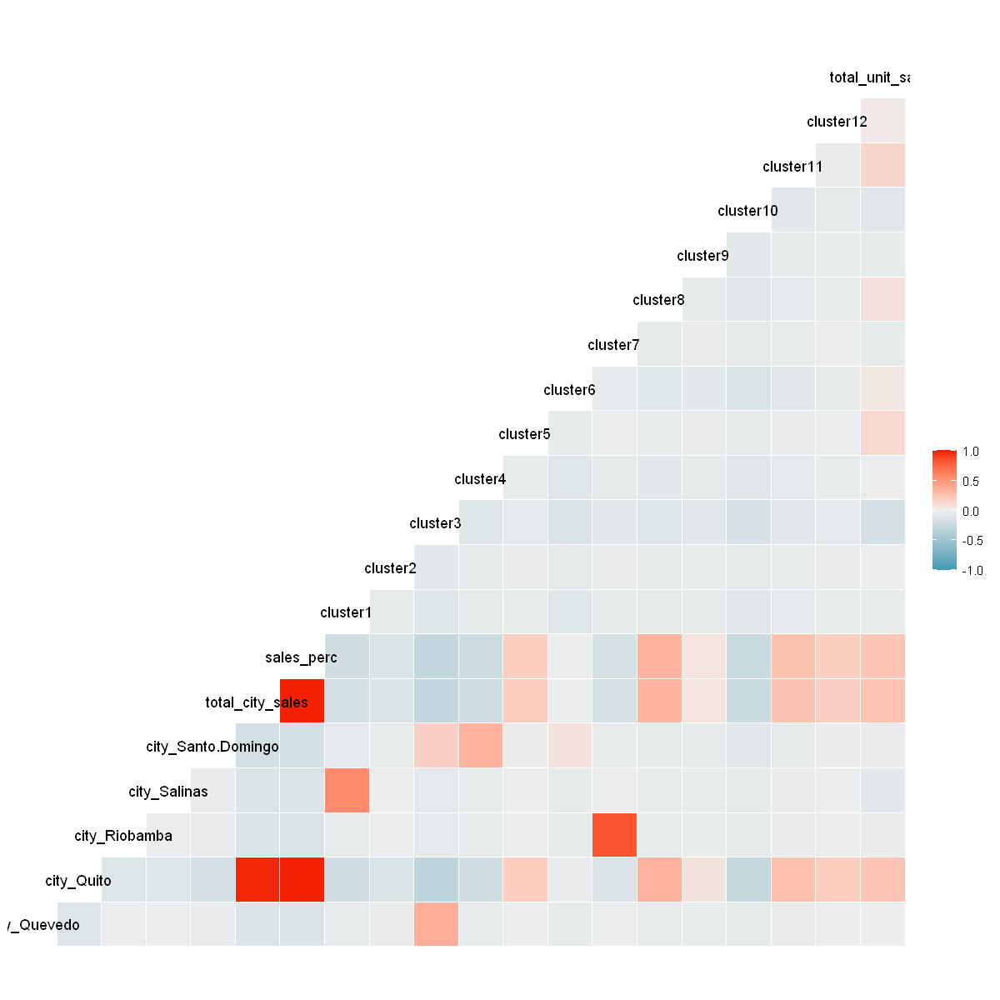

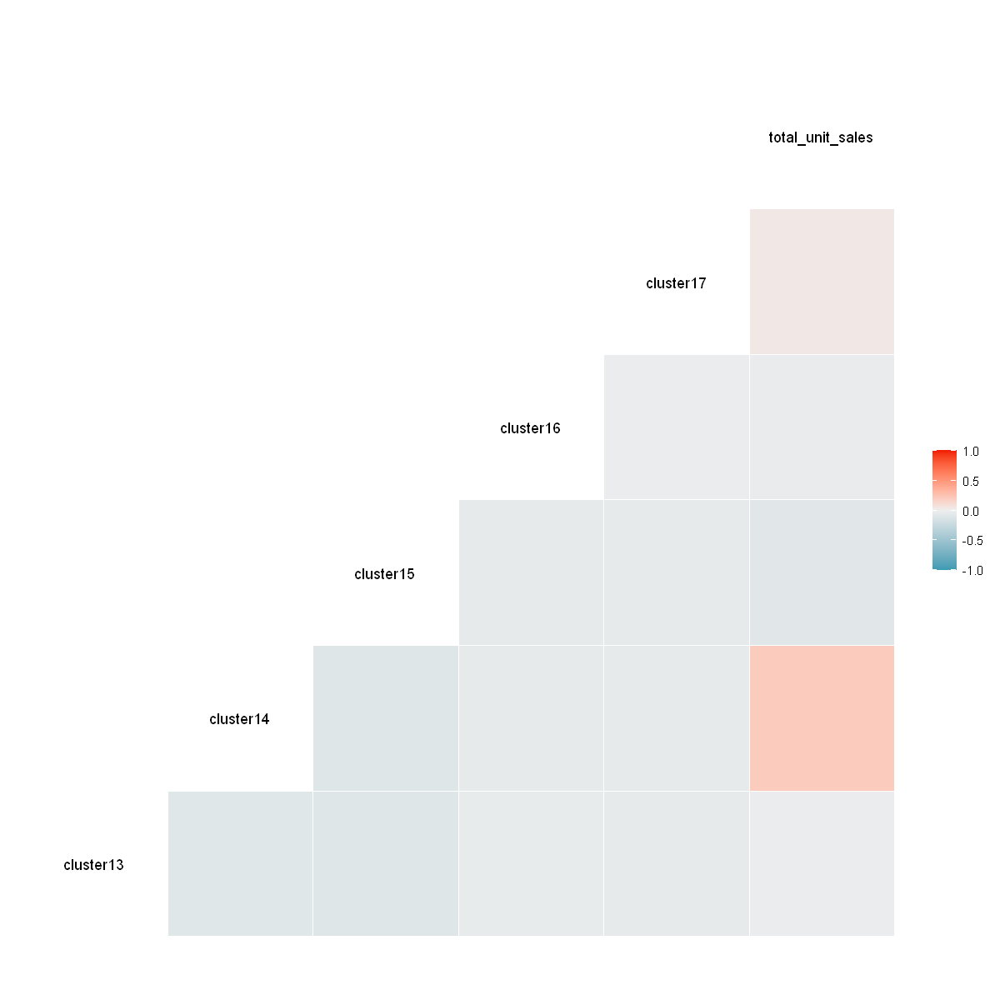

In [19]:
library(GGally)
options(repr.plot.width = 10, repr.plot.height = 10)
ggcorr(df[,c(1:20,5)], method = c("pairwise", "pearson"),
  nbreaks = NULL, digits = 2, low = "#3B9AB2",
  mid = "#EEEEEE", high = "#F21A00",
  geom = "tile", label = FALSE,
  label_alpha = FALSE)

ggcorr(df[,c(21:40,5)], method = c("pairwise", "pearson"),
  nbreaks = NULL, digits = 2, low = "#3B9AB2",
  mid = "#EEEEEE", high = "#F21A00",
  geom = "tile", label = FALSE,
  label_alpha = FALSE)

ggcorr(df[,c(41:60,5)], method = c("pairwise", "pearson"),
  nbreaks = NULL, digits = 2, low = "#3B9AB2",
  mid = "#EEEEEE", high = "#F21A00",
  geom = "tile", label = FALSE,
  label_alpha = FALSE)

ggcorr(df[,c(61:79,5)], method = c("pairwise", "pearson"),
  nbreaks = NULL, digits = 2, low = "#3B9AB2",
  mid = "#EEEEEE", high = "#F21A00",
  geom = "tile", label = FALSE,
  label_alpha = FALSE)

library(GGally)
ggcorr(df[,c(80:84,5)], method = c("pairwise", "pearson"),
  nbreaks = NULL, digits = 2, low = "#3B9AB2",
  mid = "#EEEEEE", high = "#F21A00",
  geom = "tile", label = FALSE,
  label_alpha = FALSE)



2.4 Describe the outcome variable
Histogram
Histogram by categories

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."


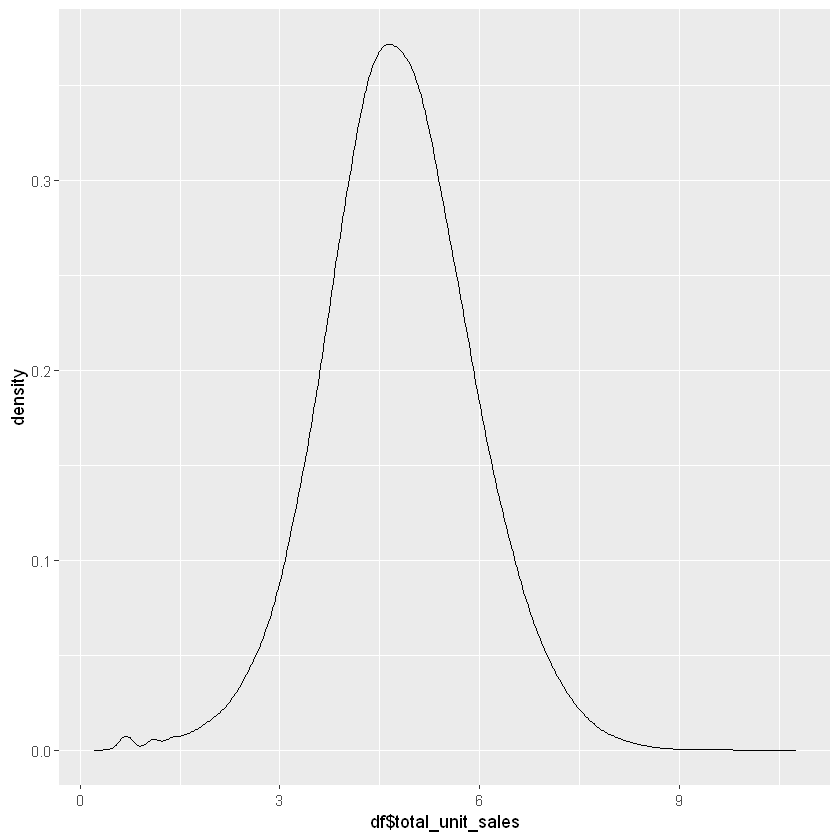

In [23]:
#distribution of revenue- question 2.4
print(ggplot(df,aes(x=df$total_unit_sales)) +
    geom_density(adjust=2))


Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


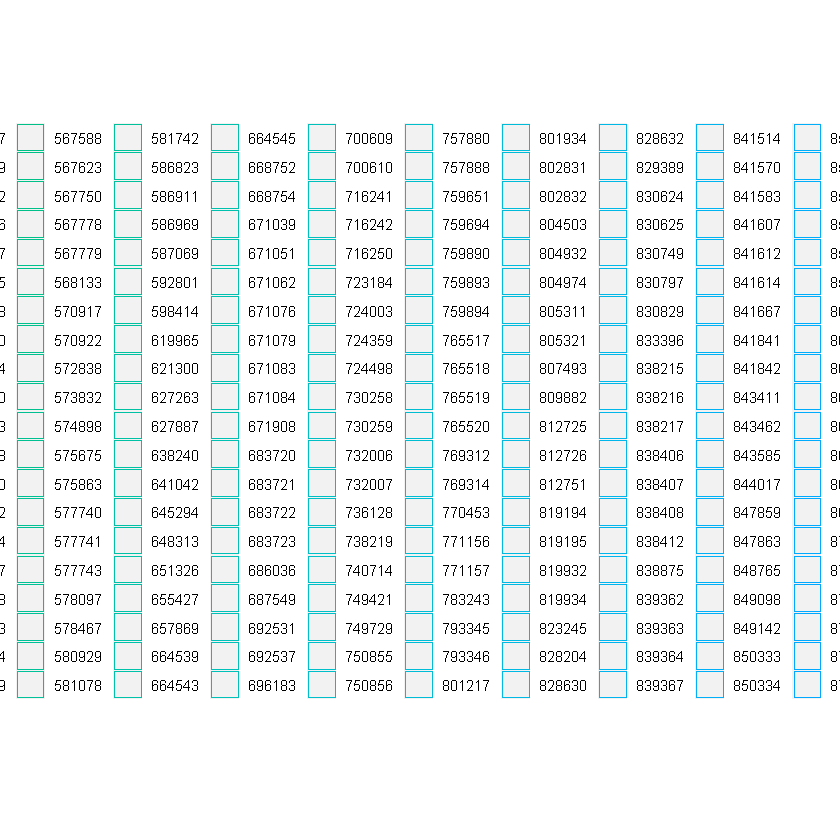

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


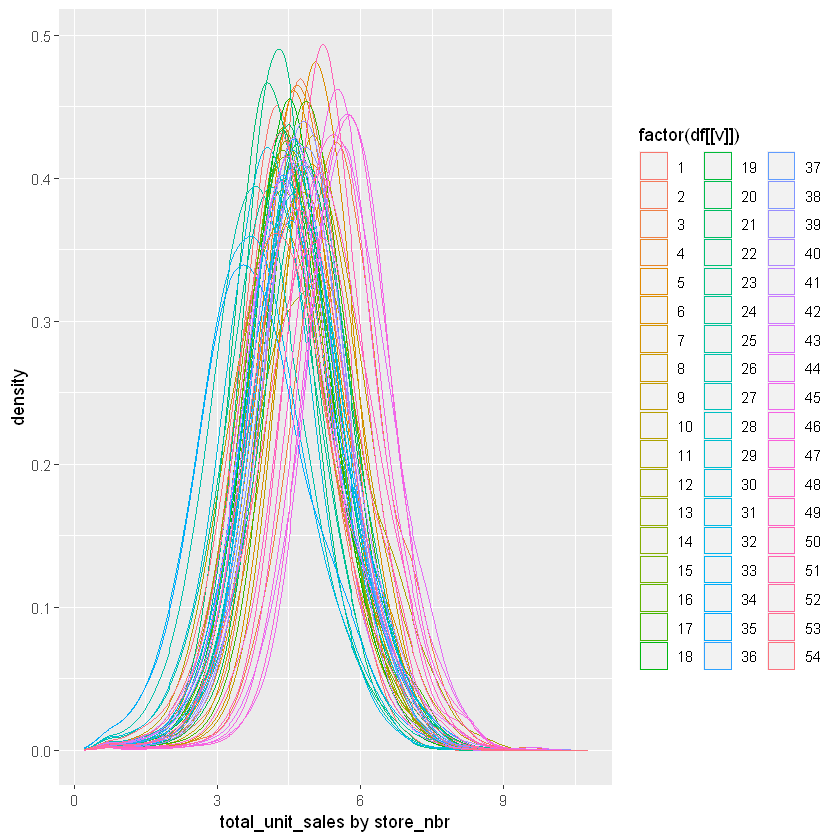

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


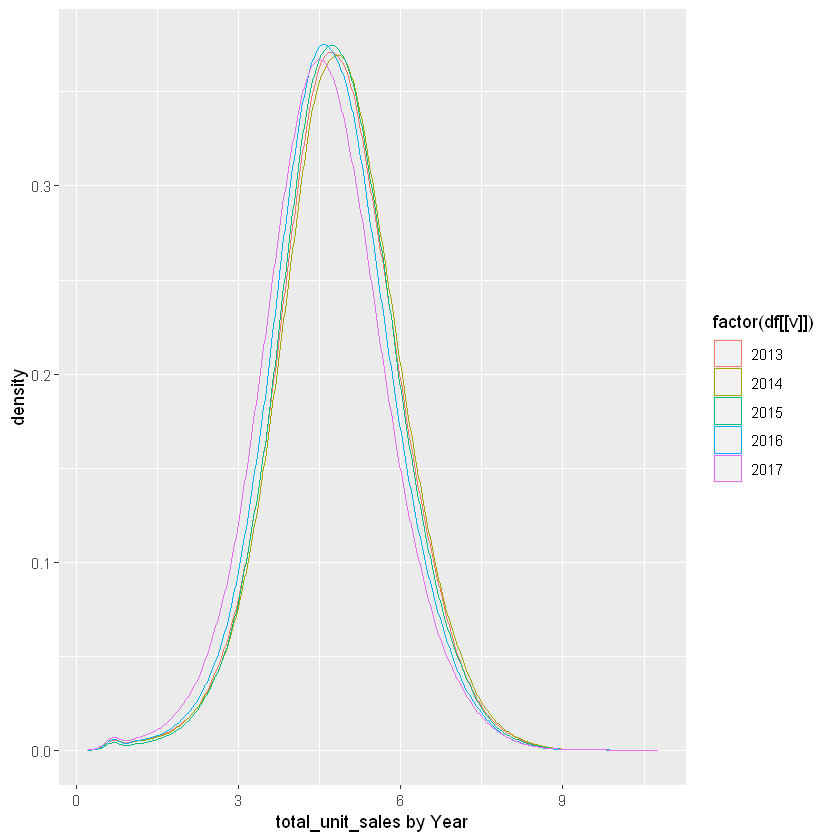

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


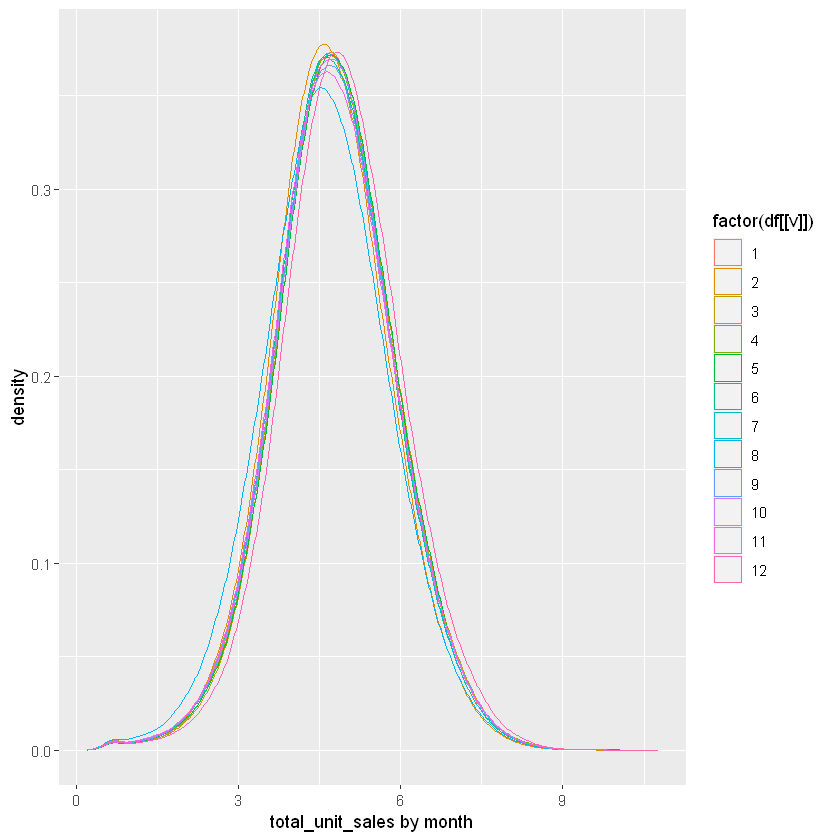

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


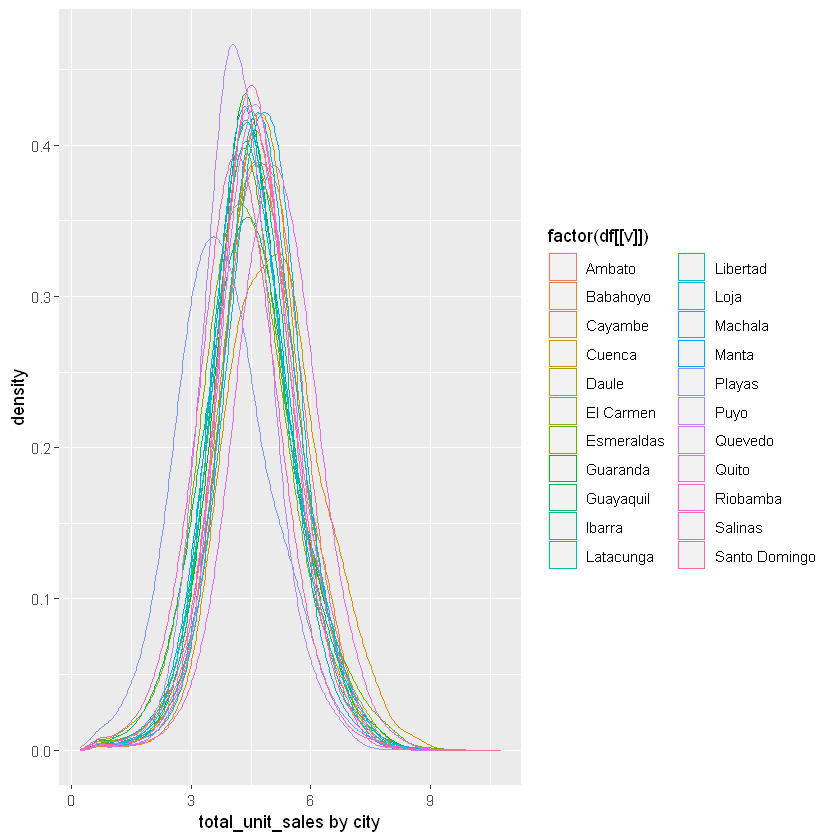

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


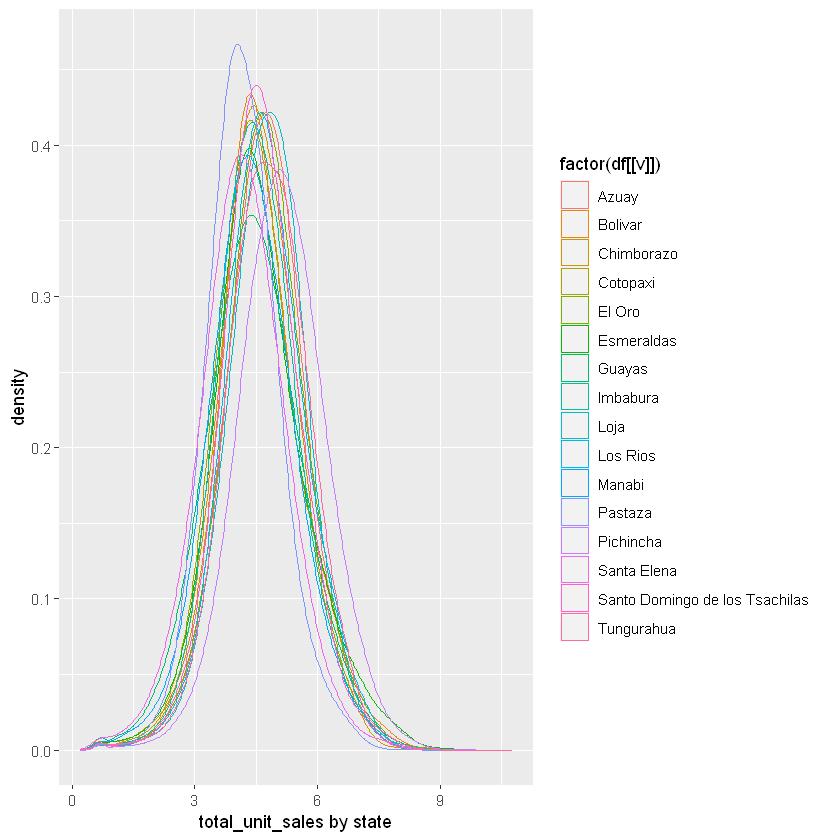

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


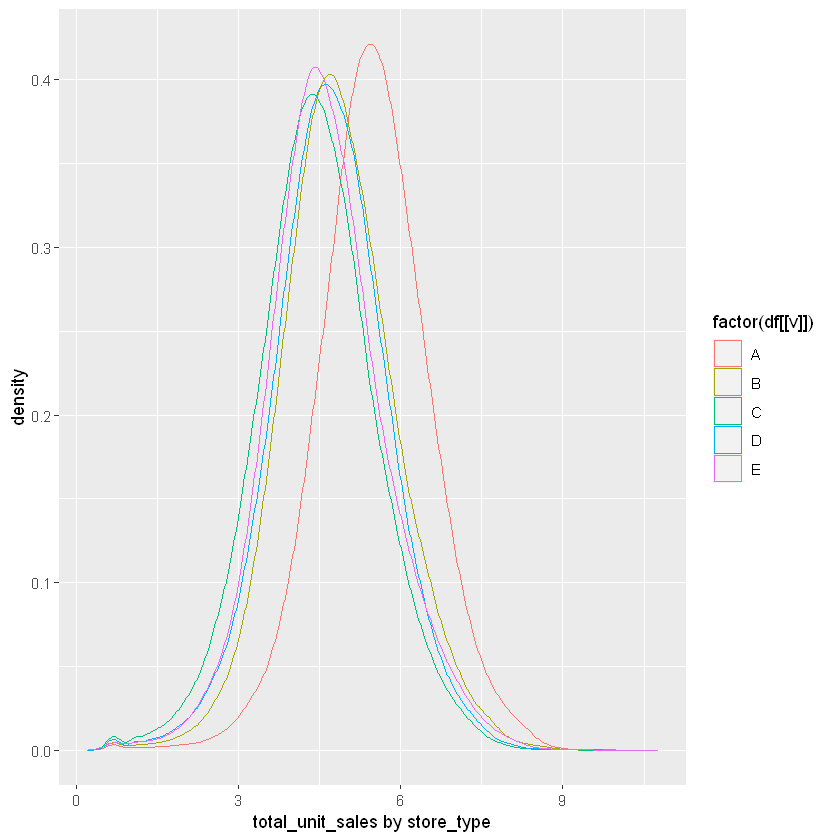

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


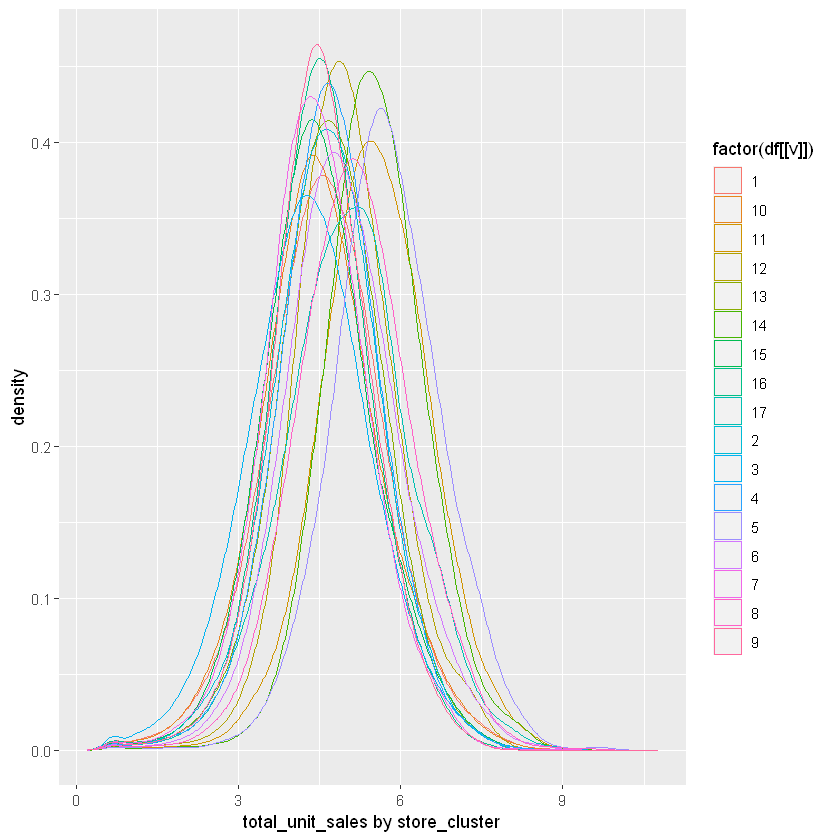

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


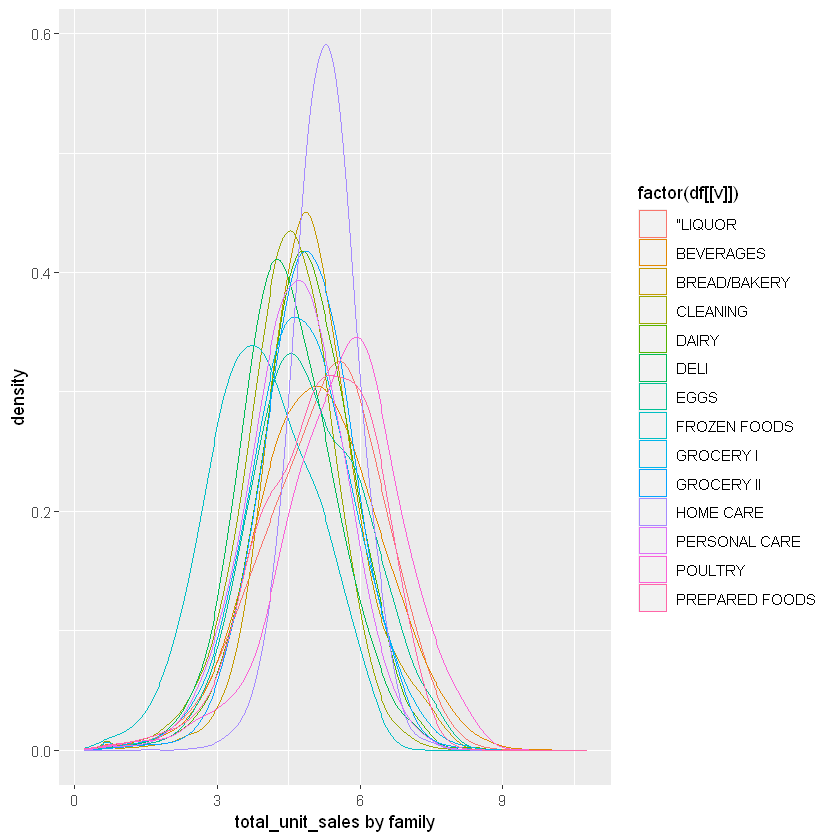

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


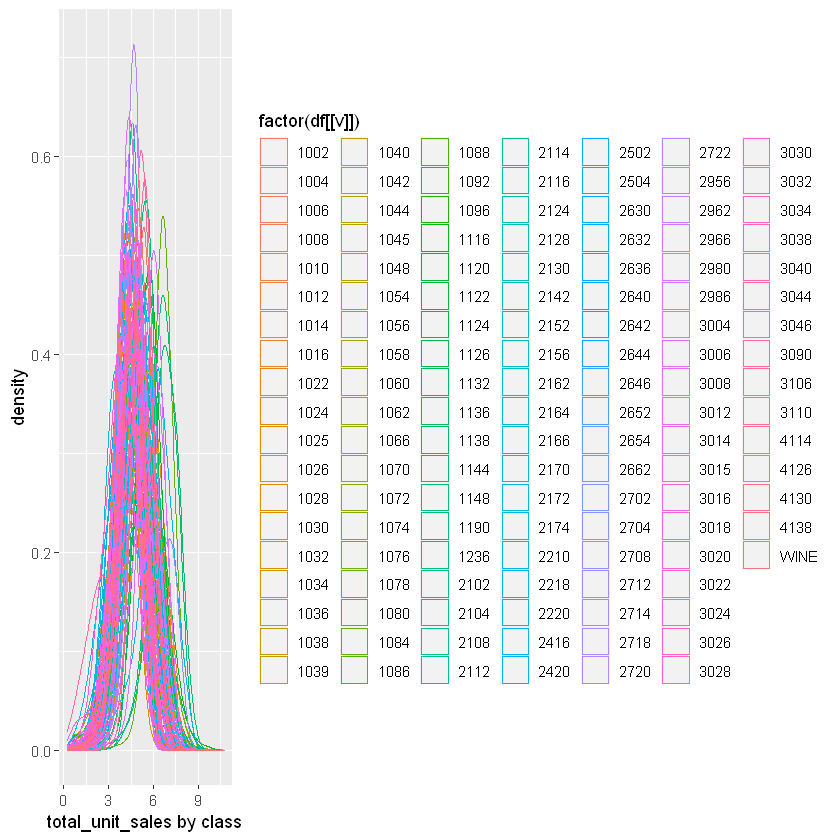

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


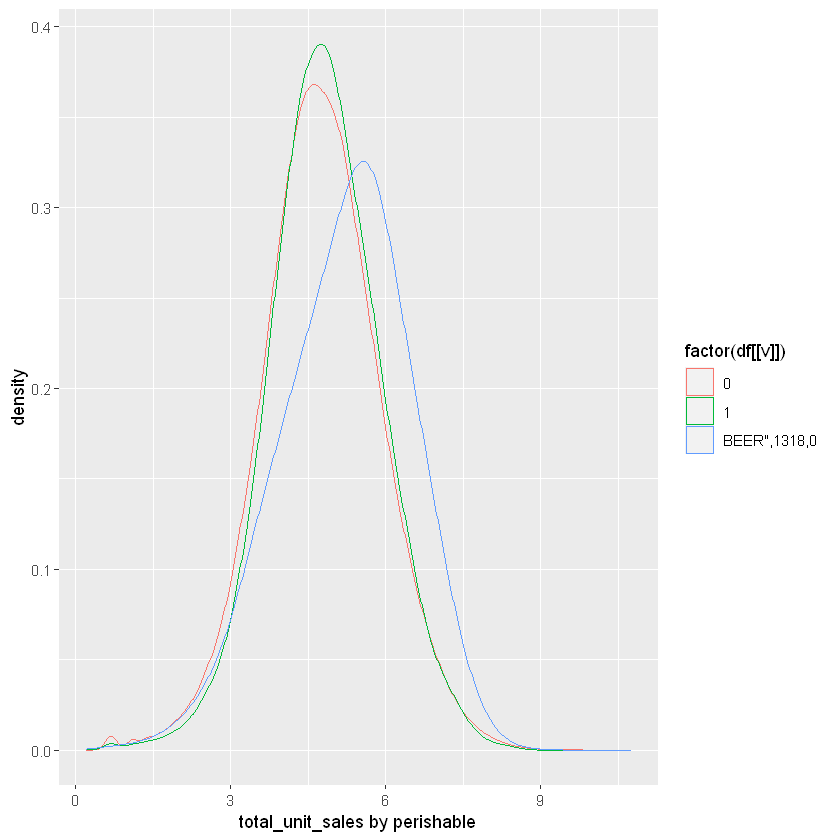

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


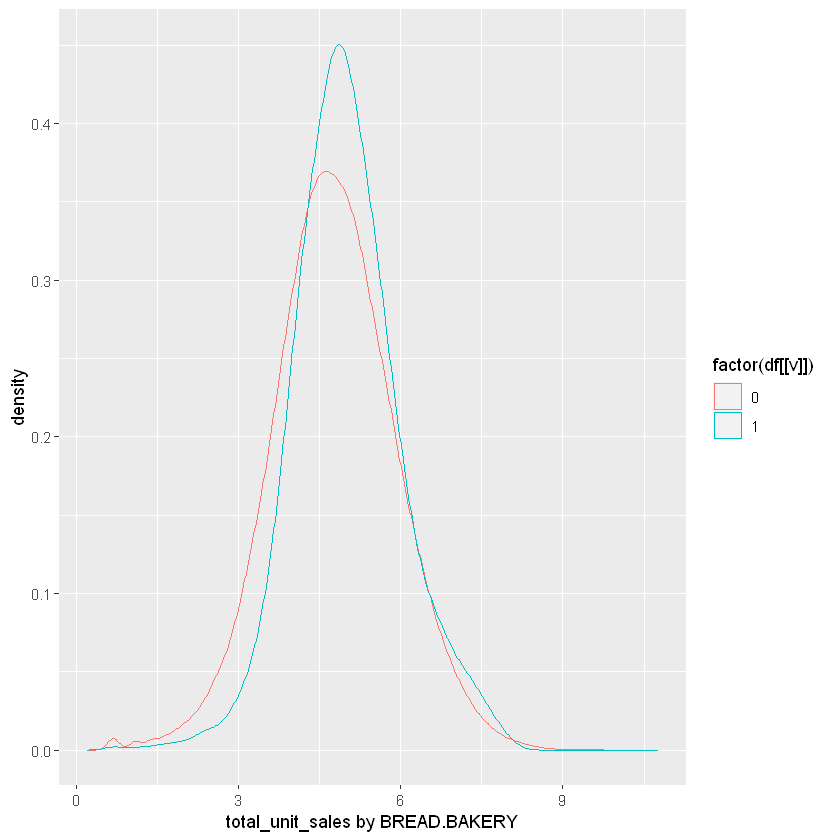

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


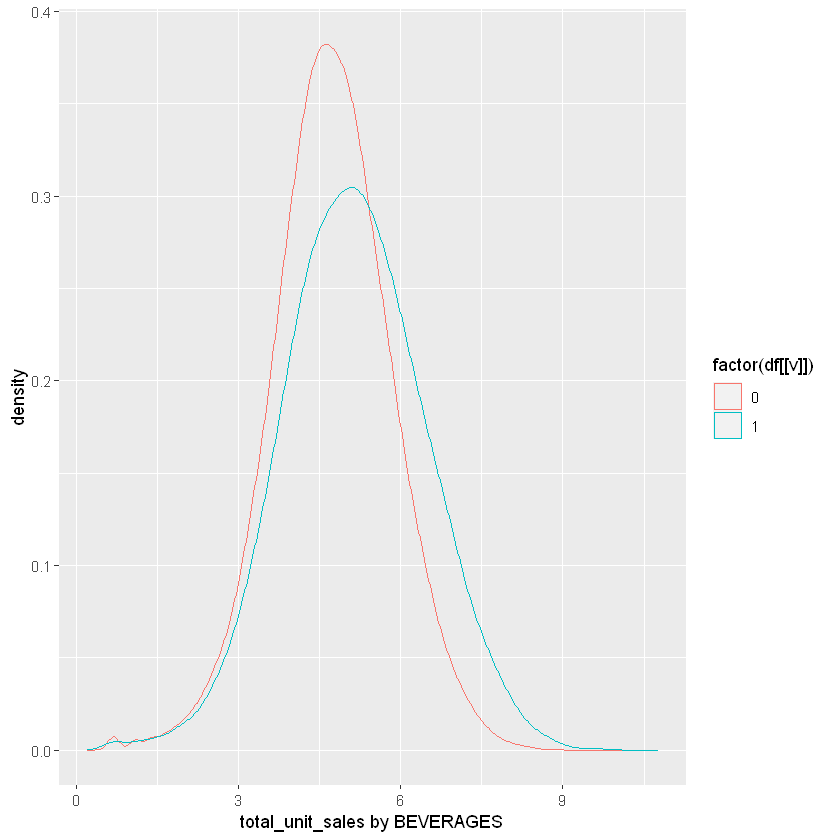

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


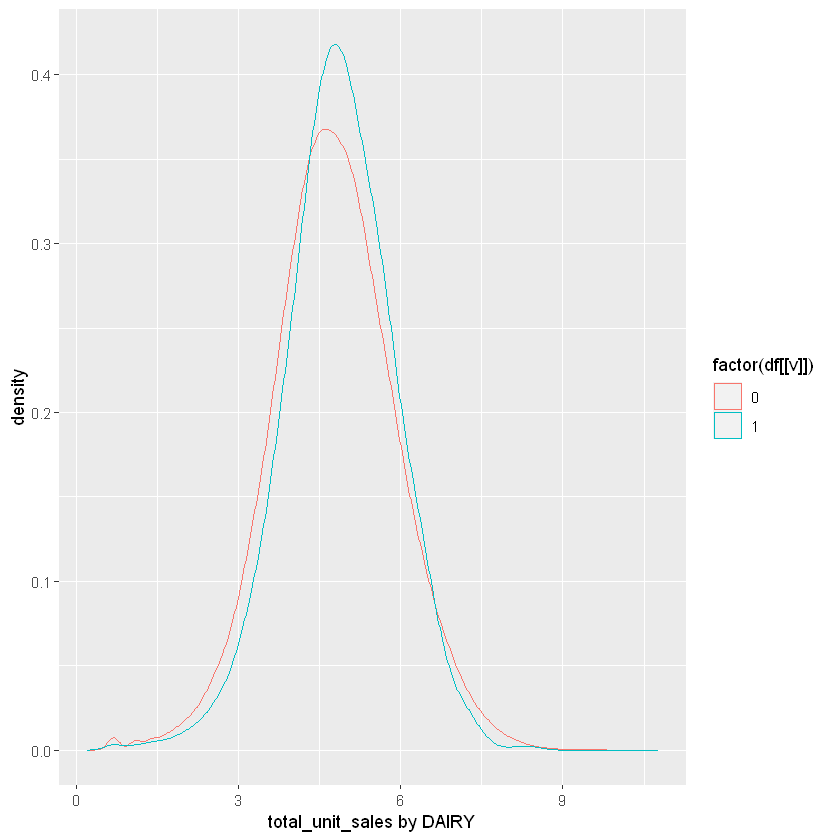

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


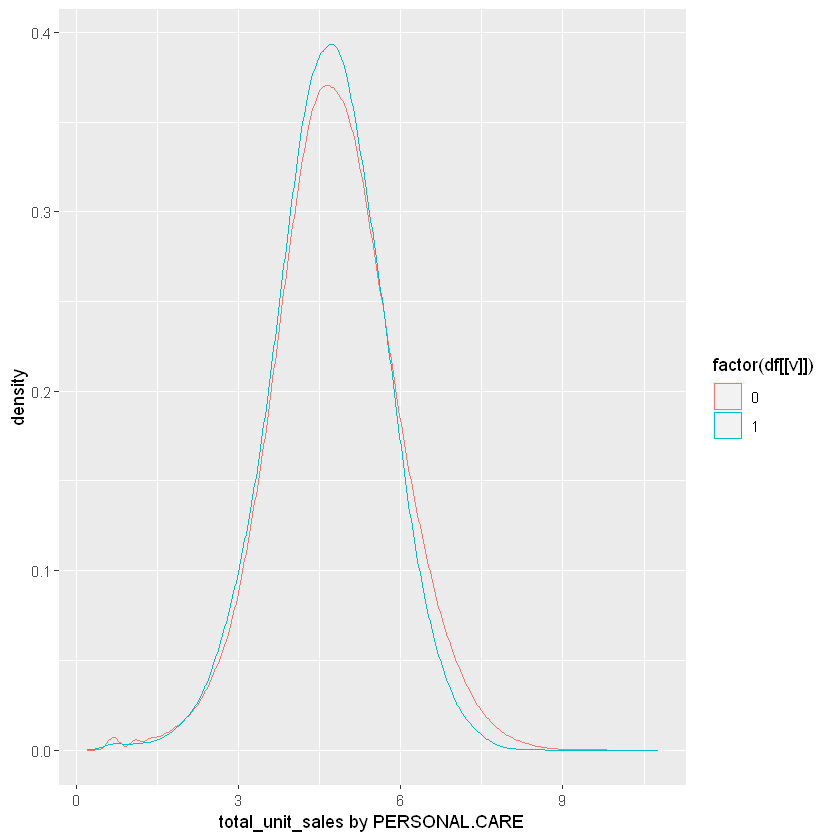

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


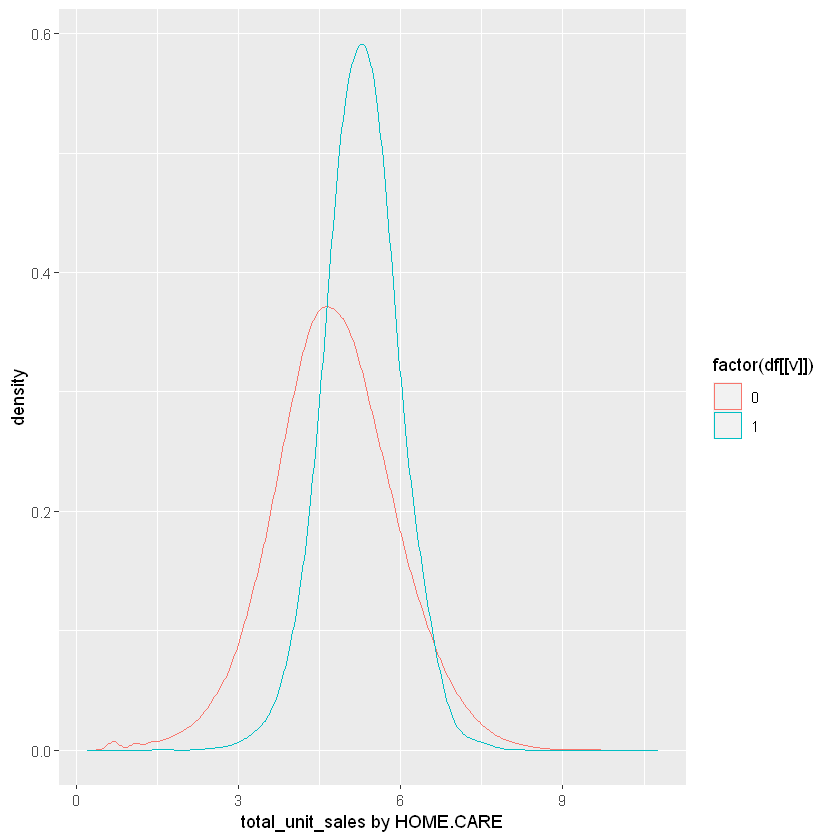

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


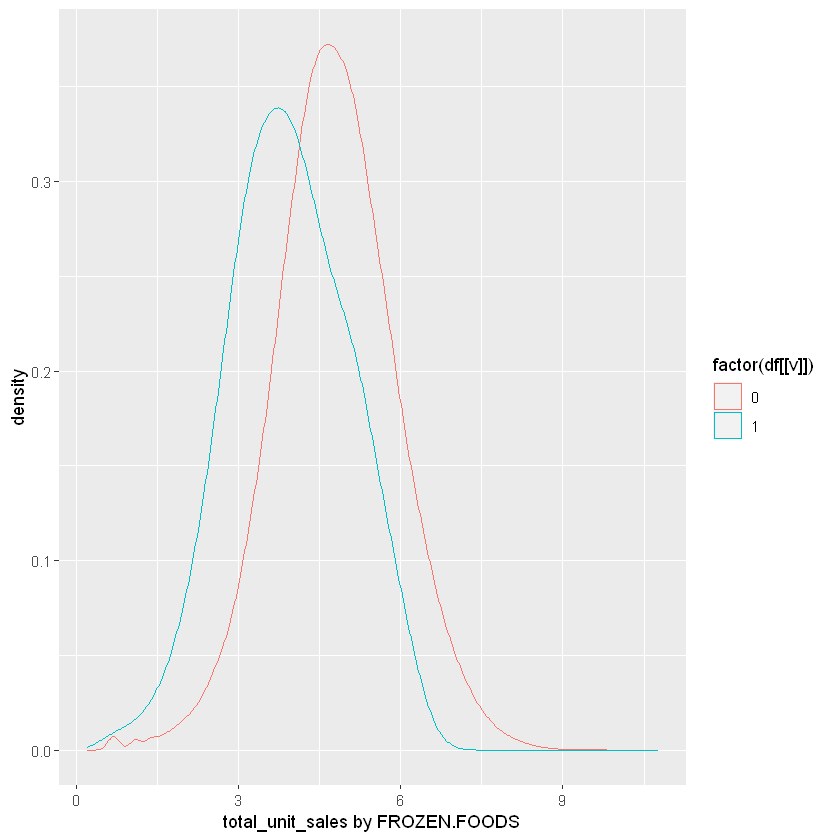

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


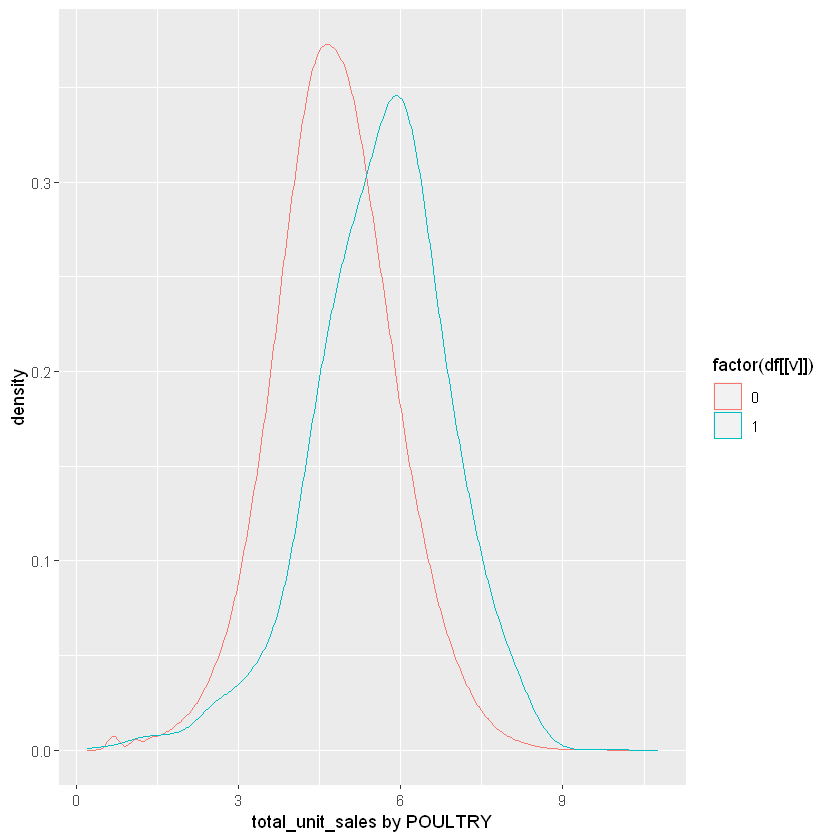

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


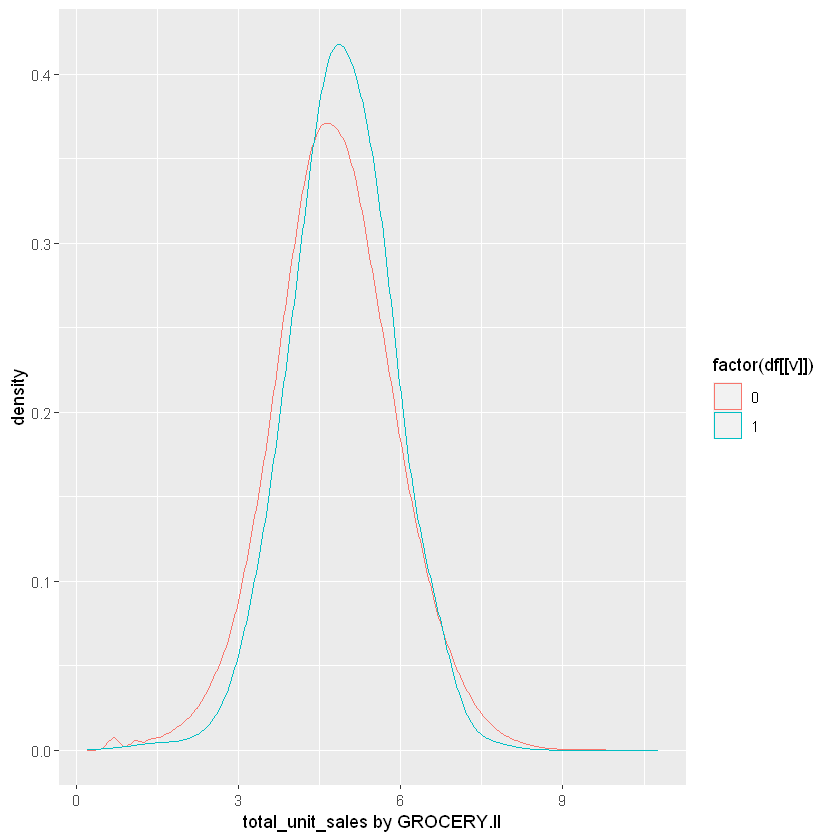

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


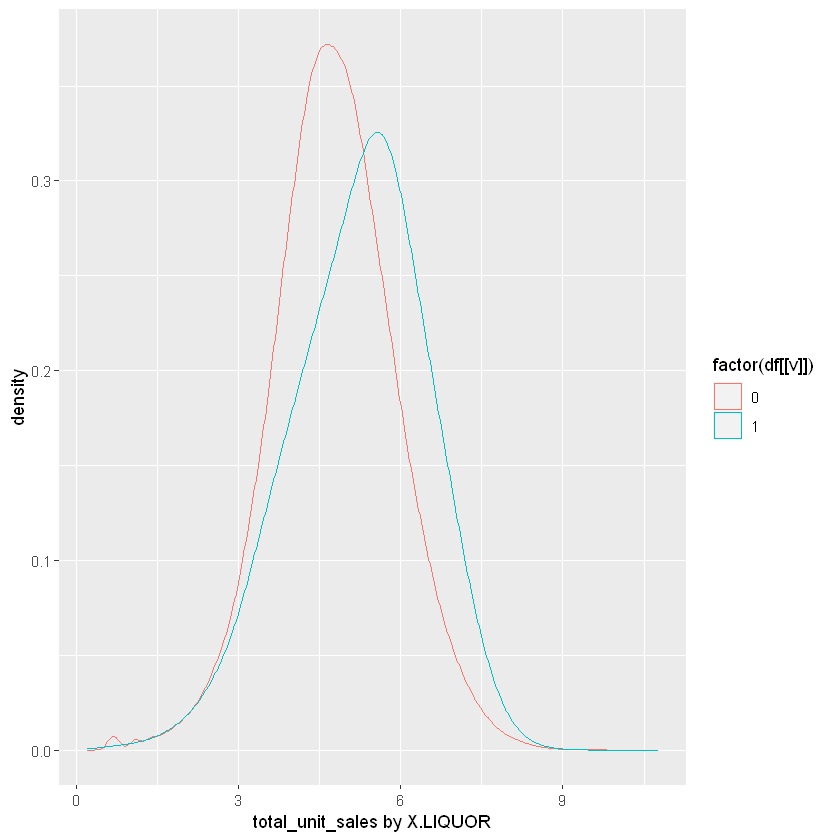

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


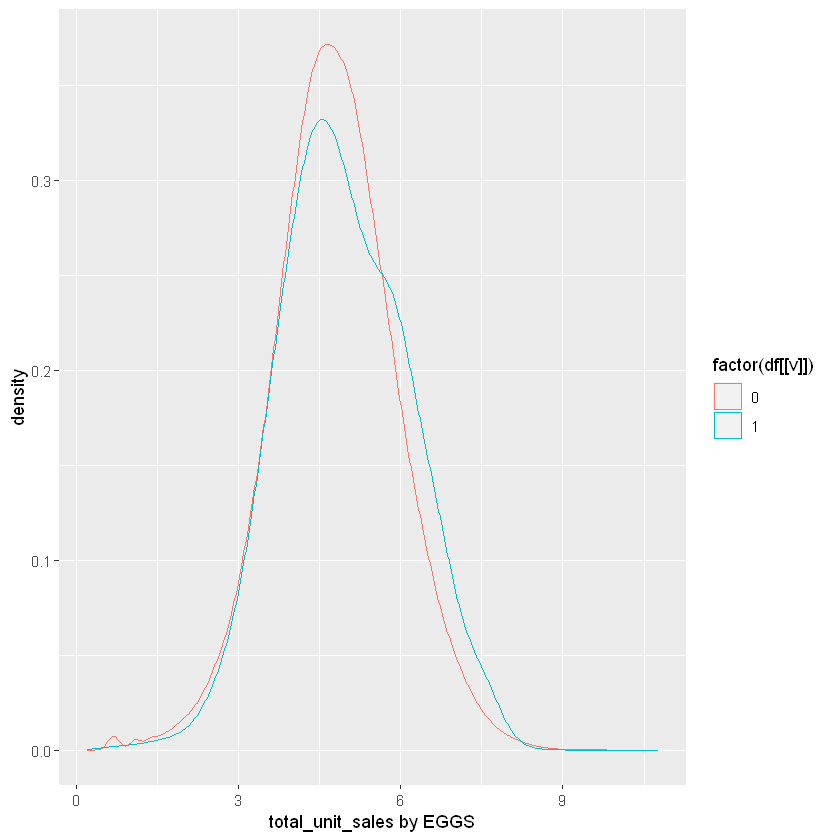

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


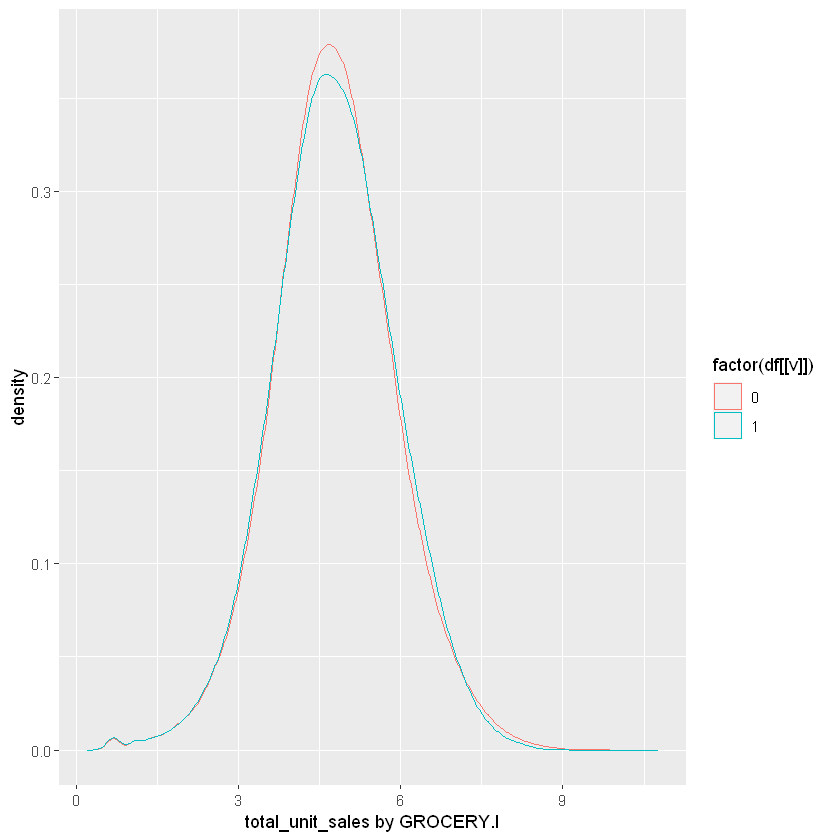

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


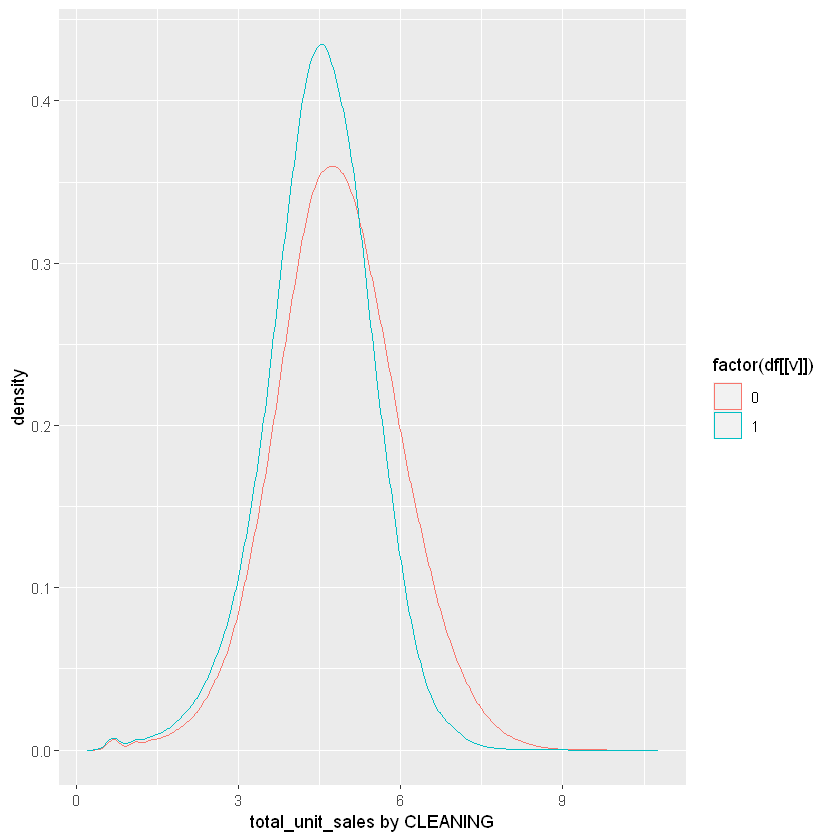

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


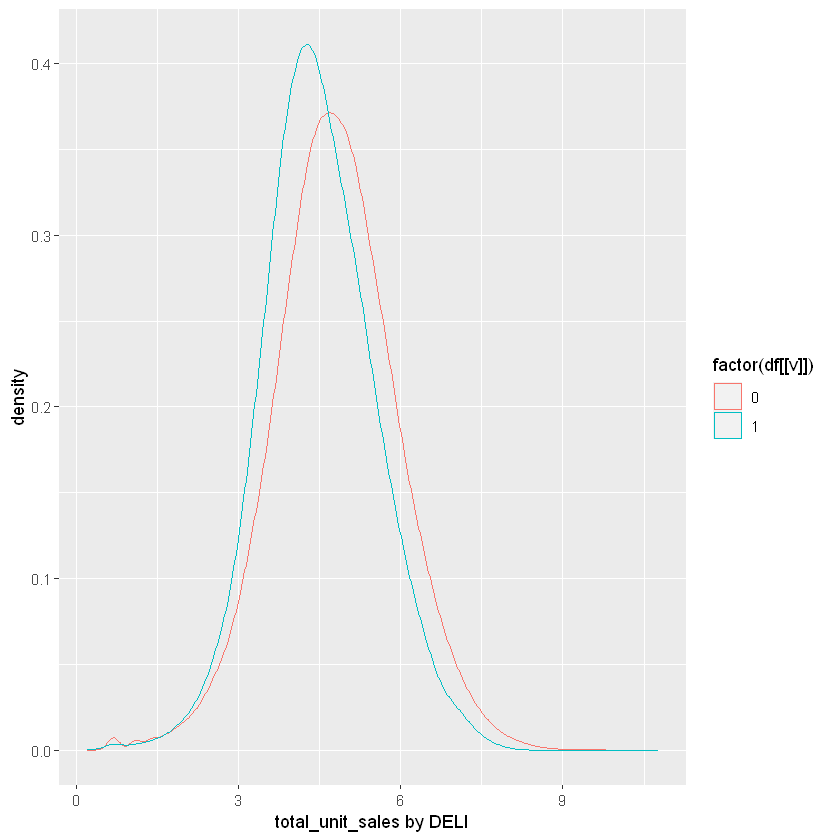

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


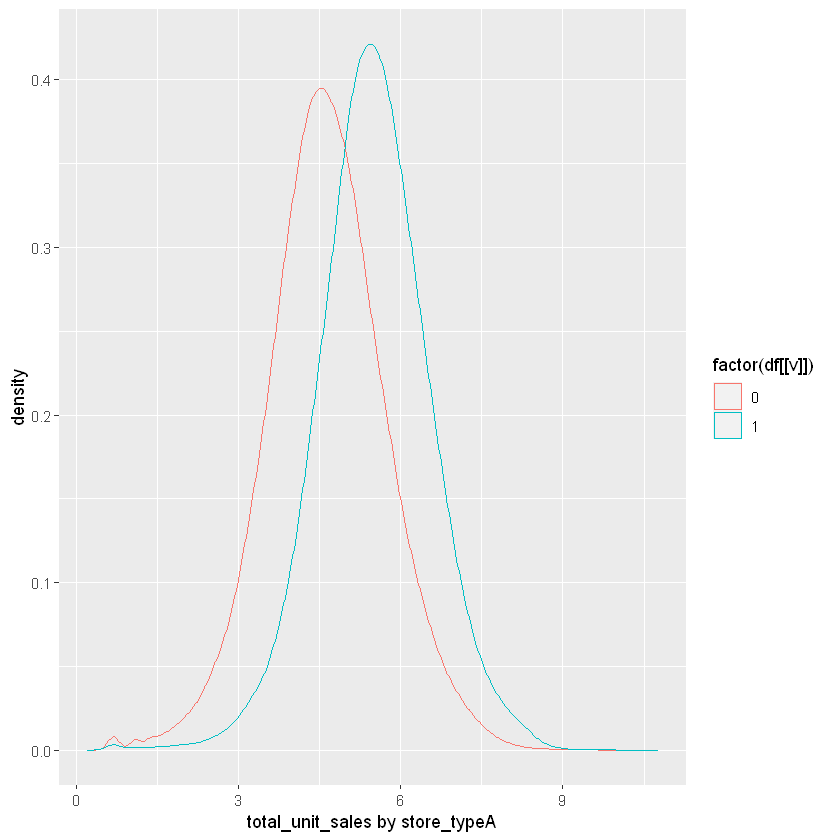

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


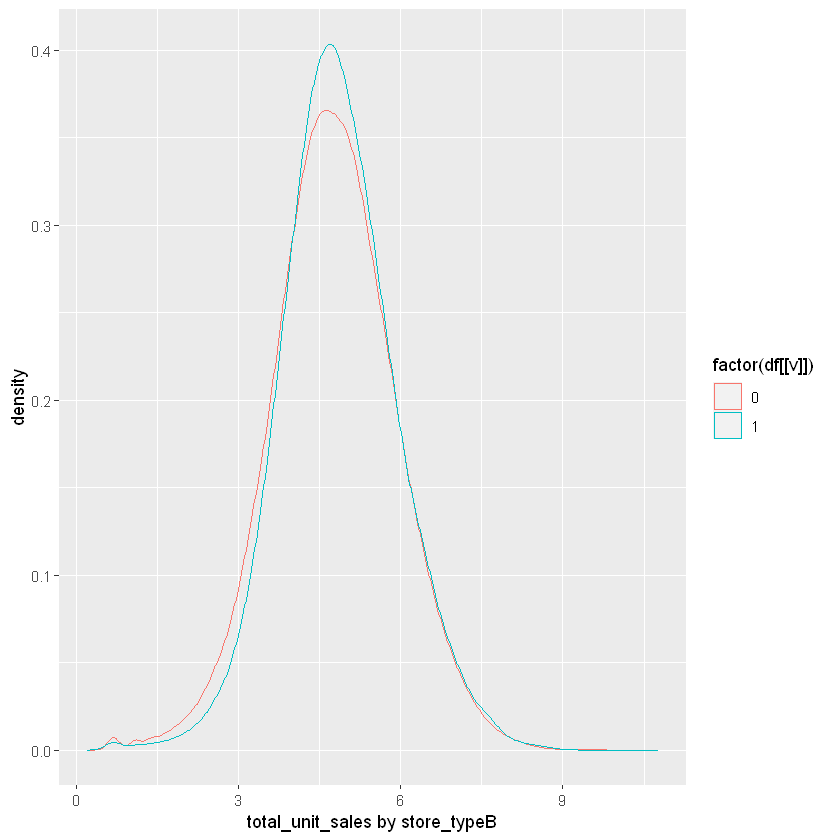

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


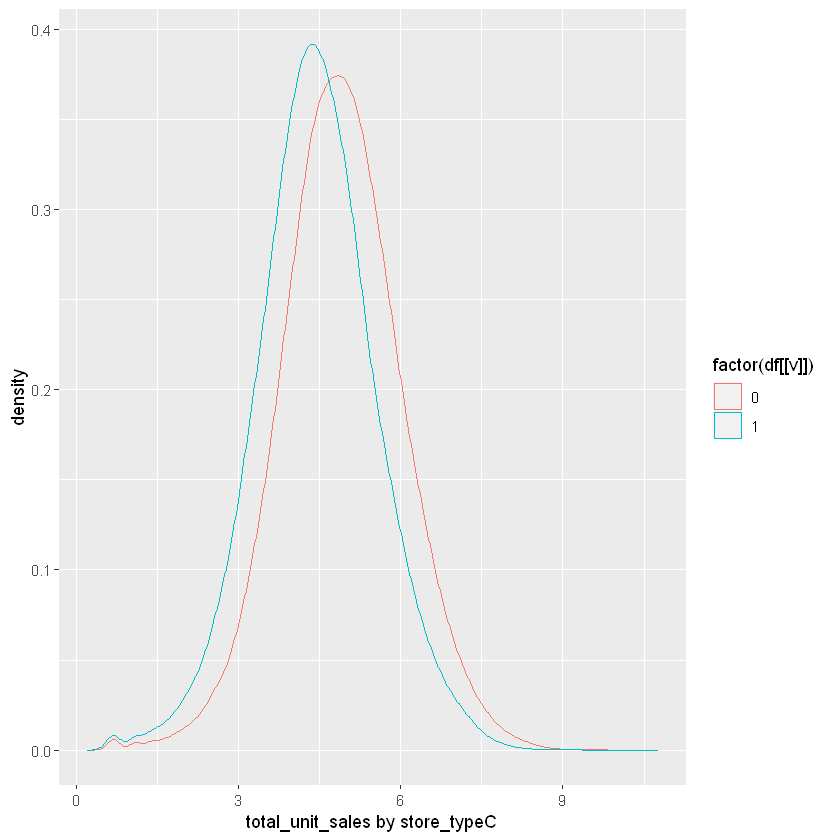

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


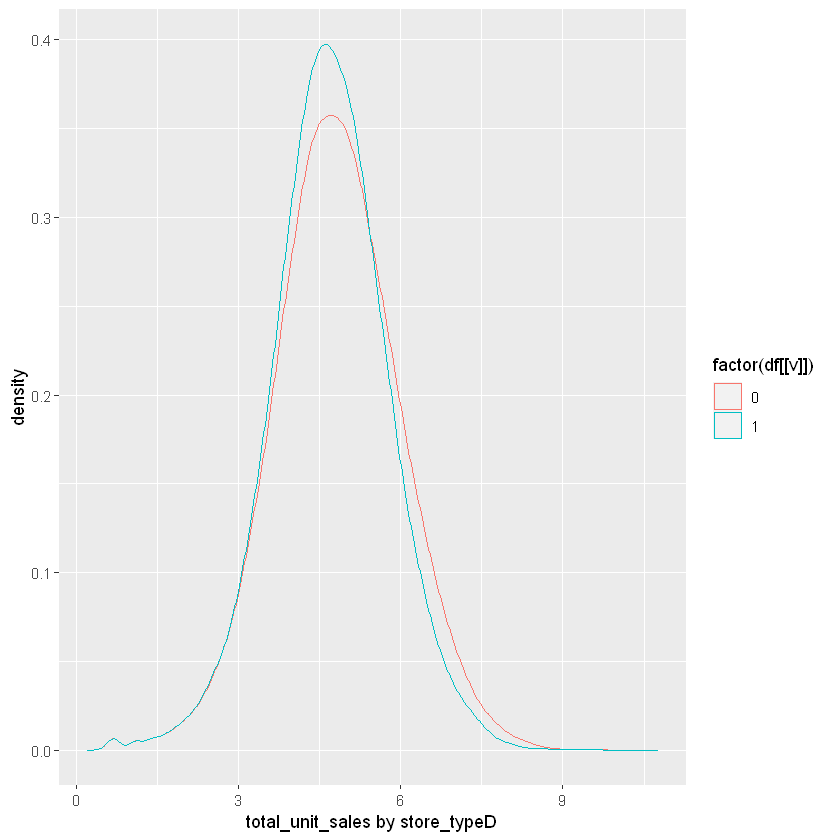

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


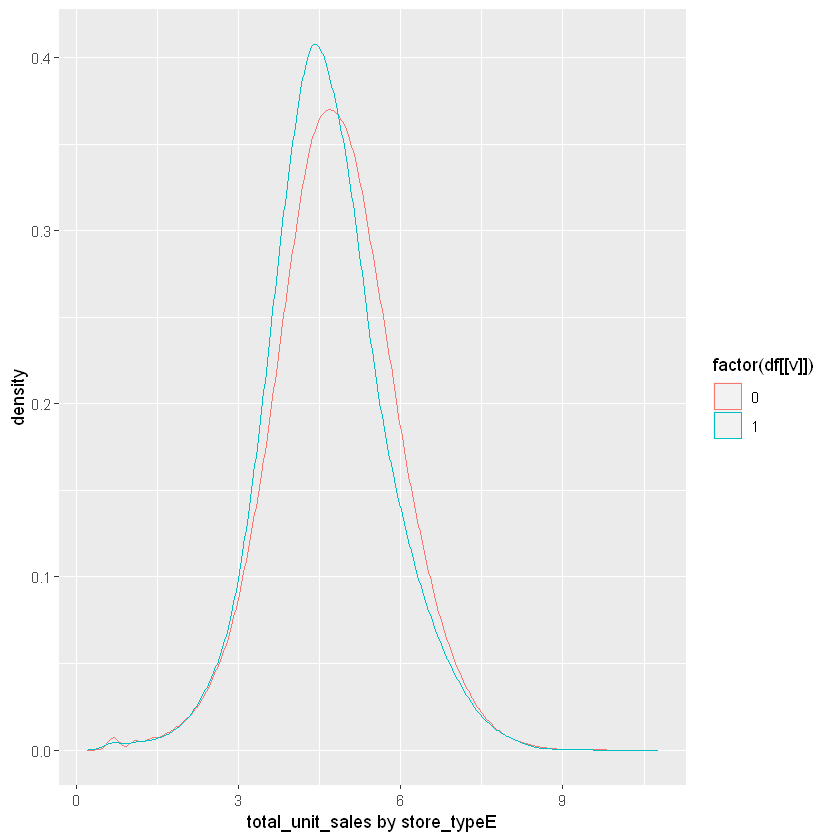

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


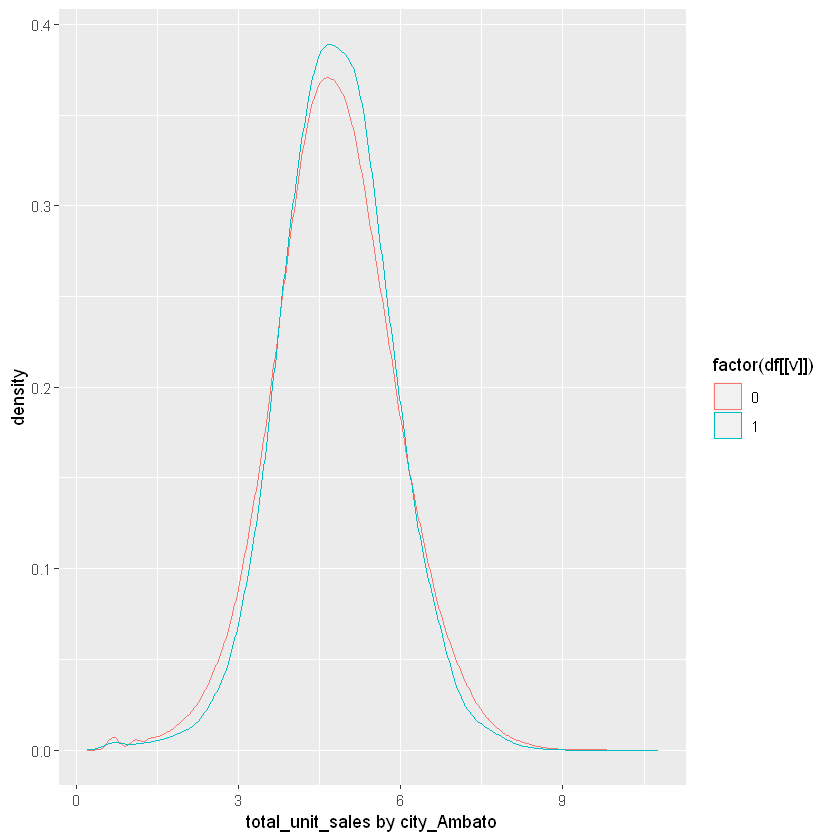

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


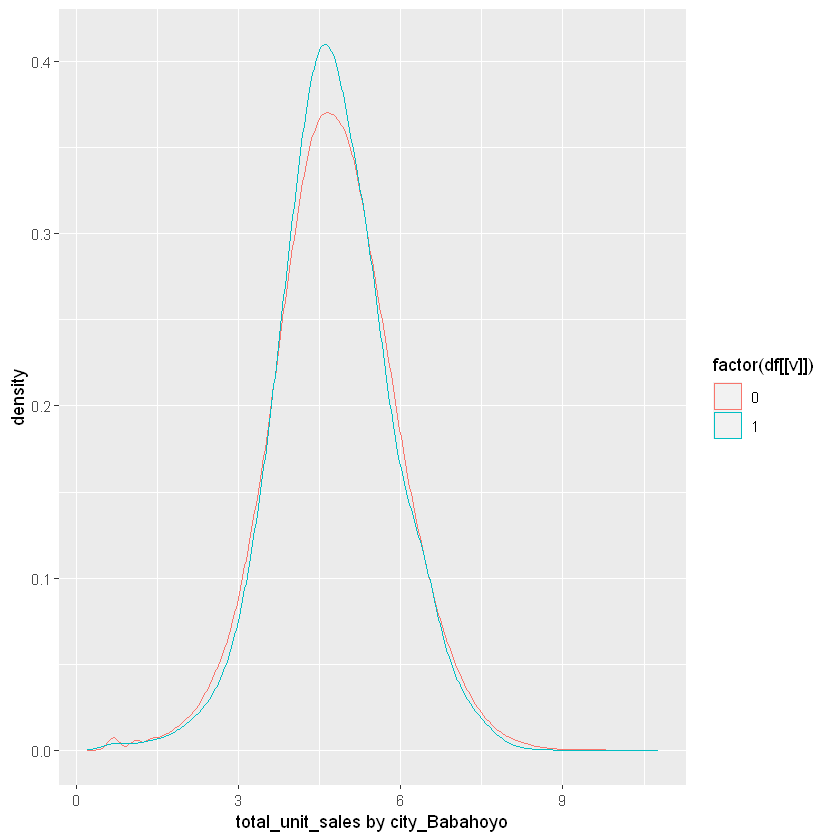

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


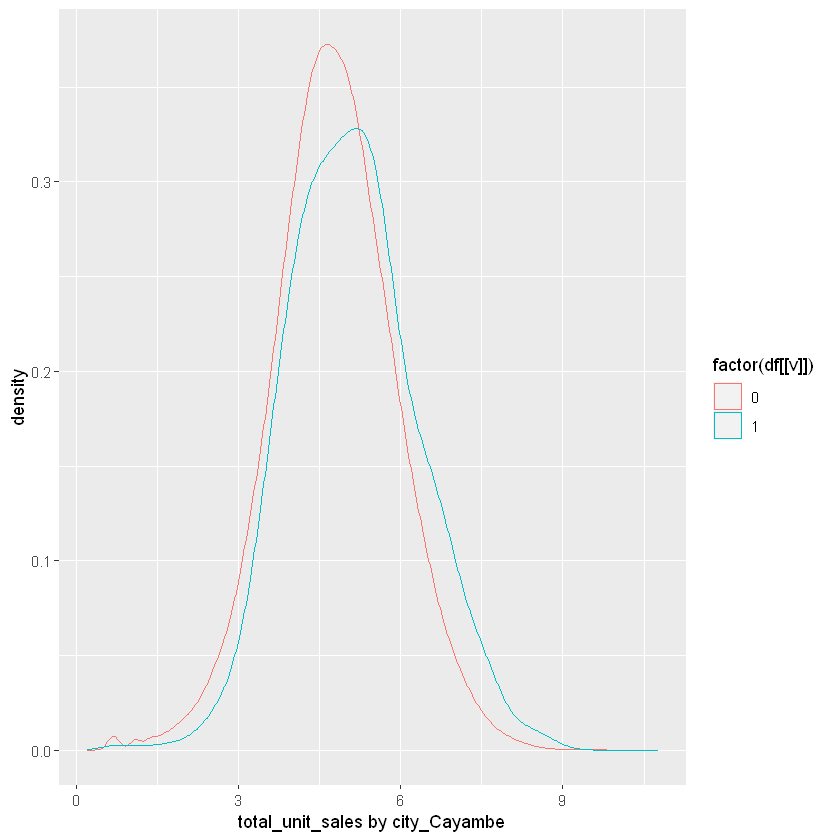

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


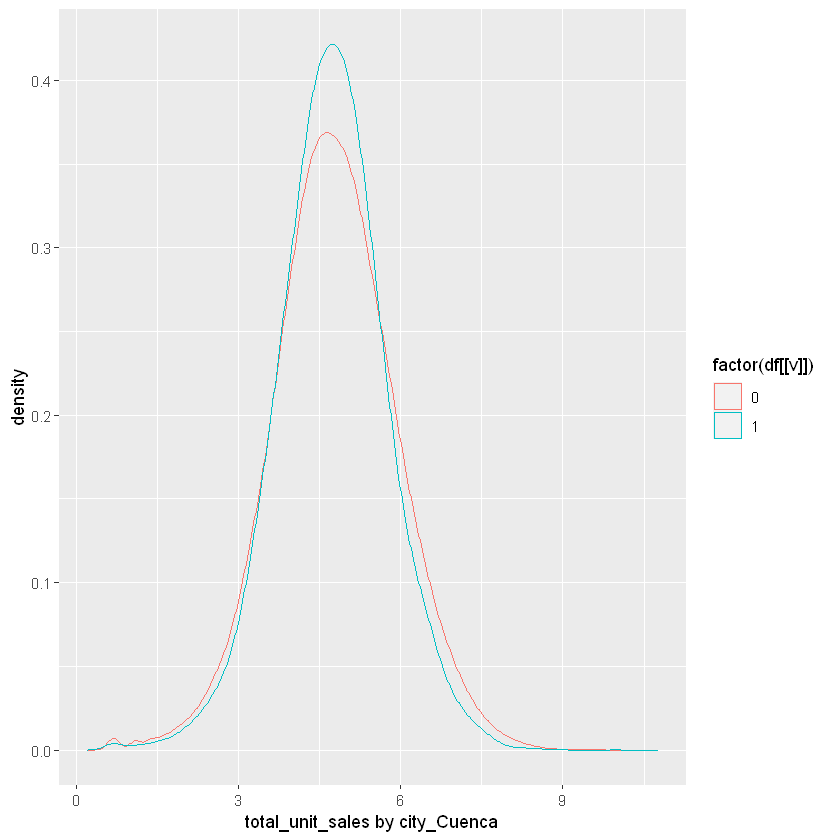

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


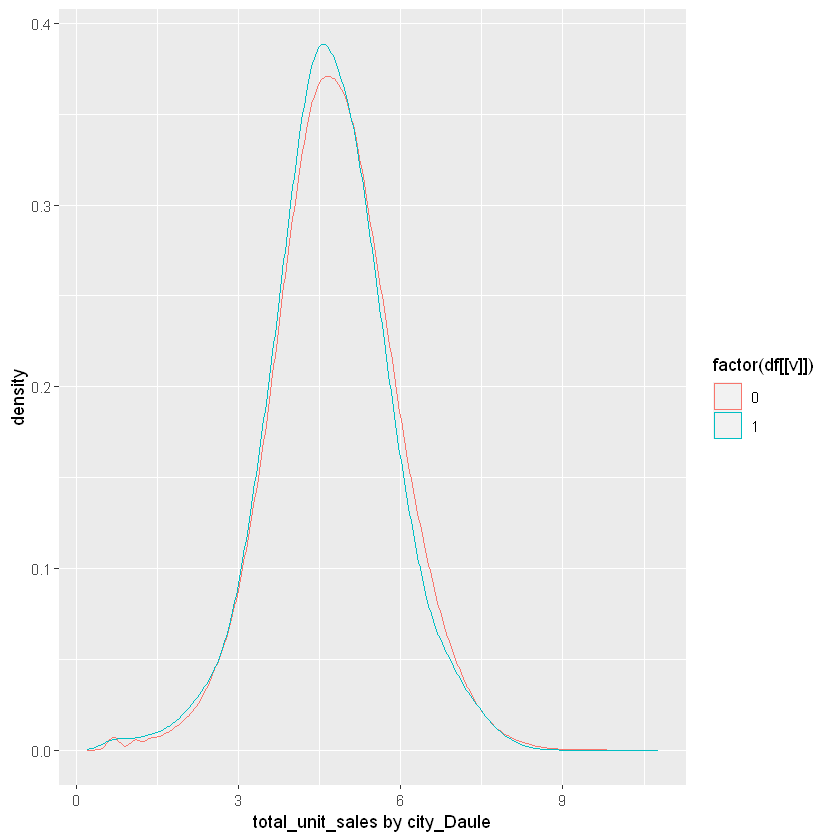

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


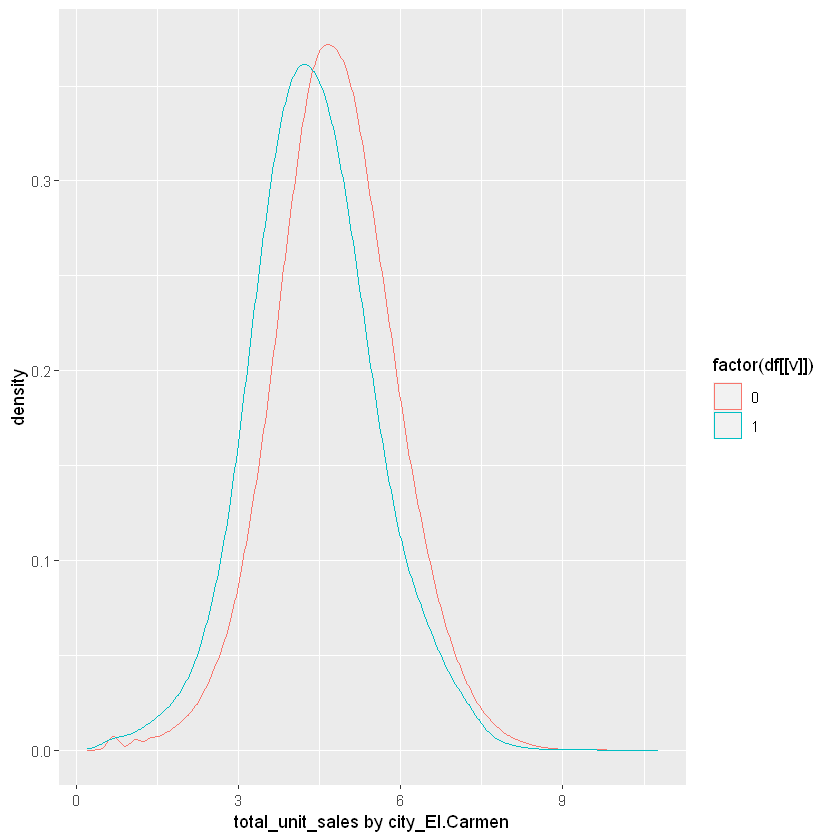

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


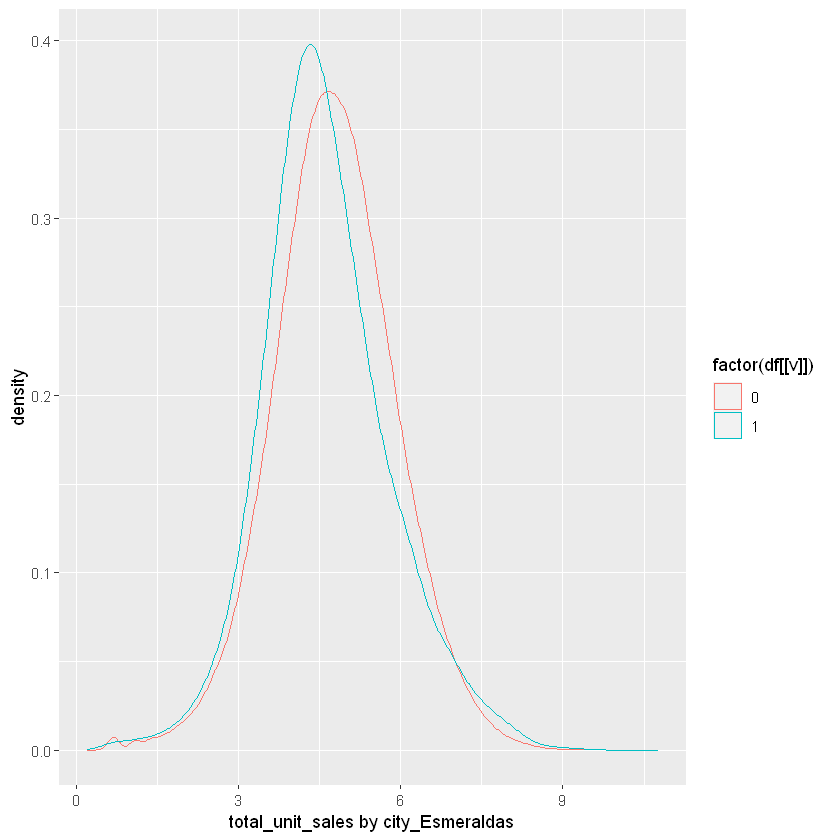

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


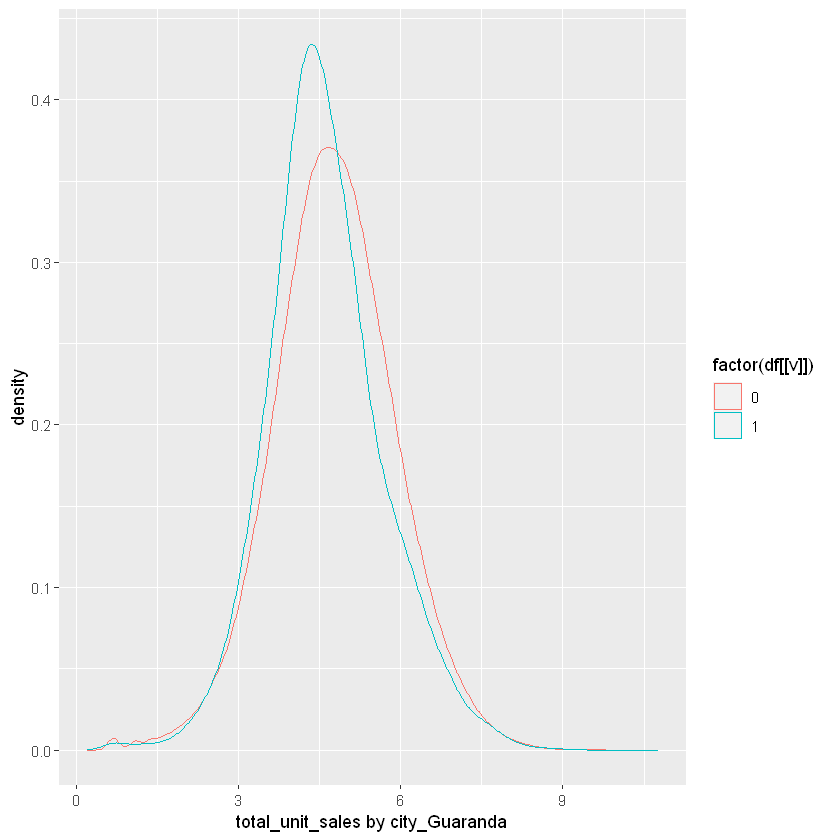

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


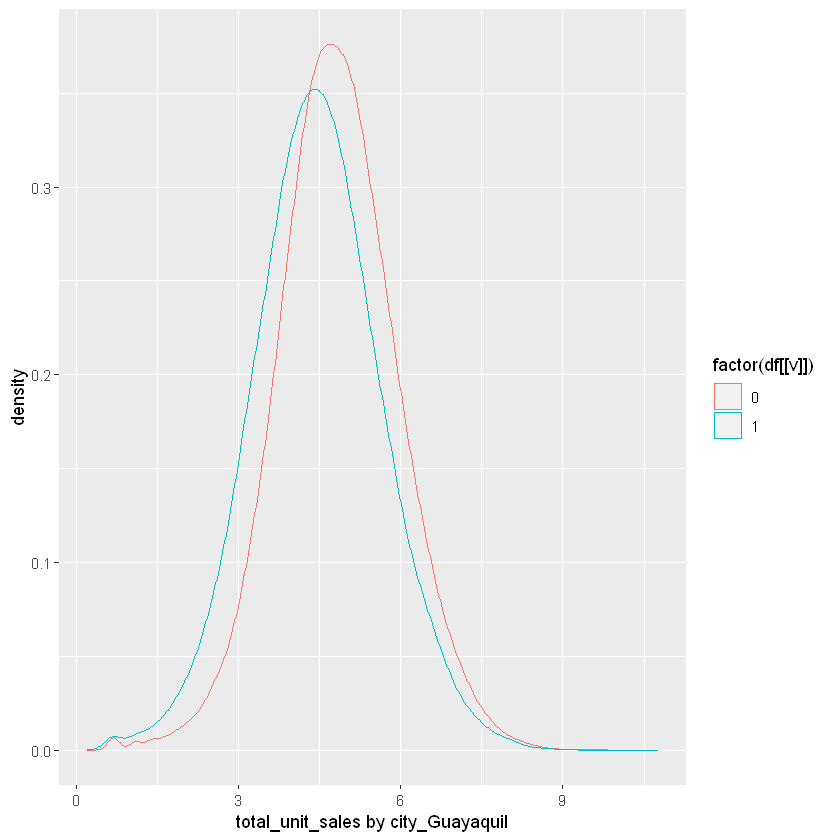

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


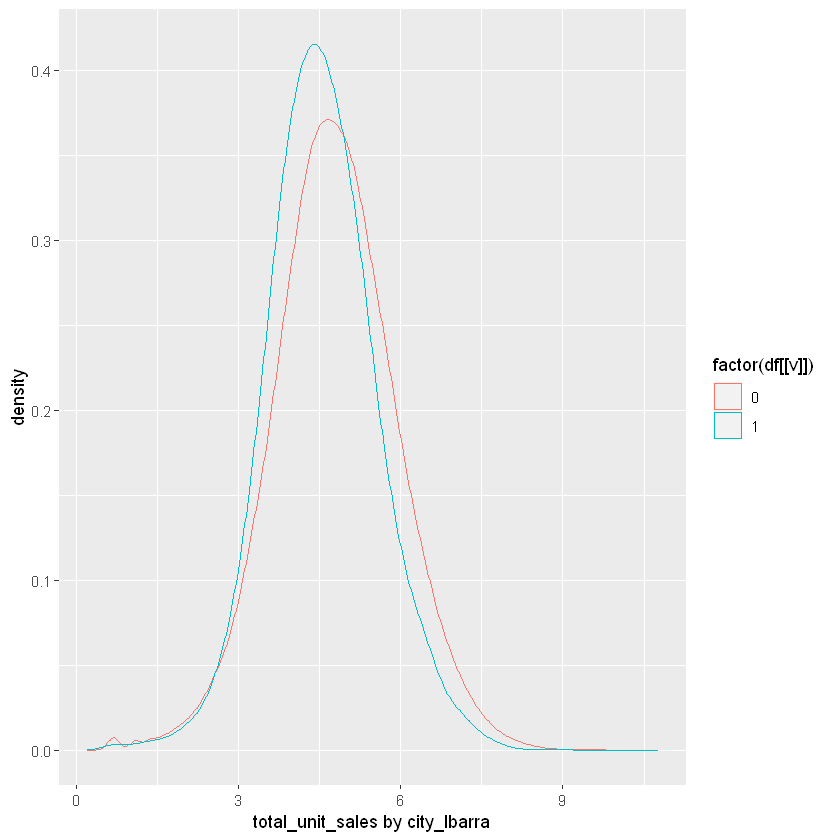

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


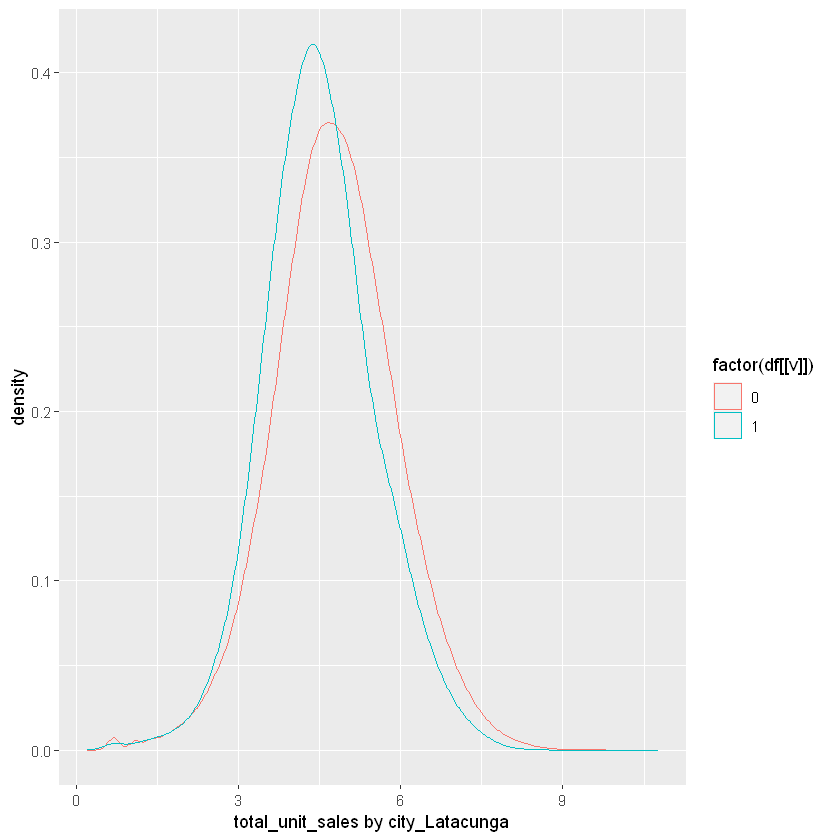

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


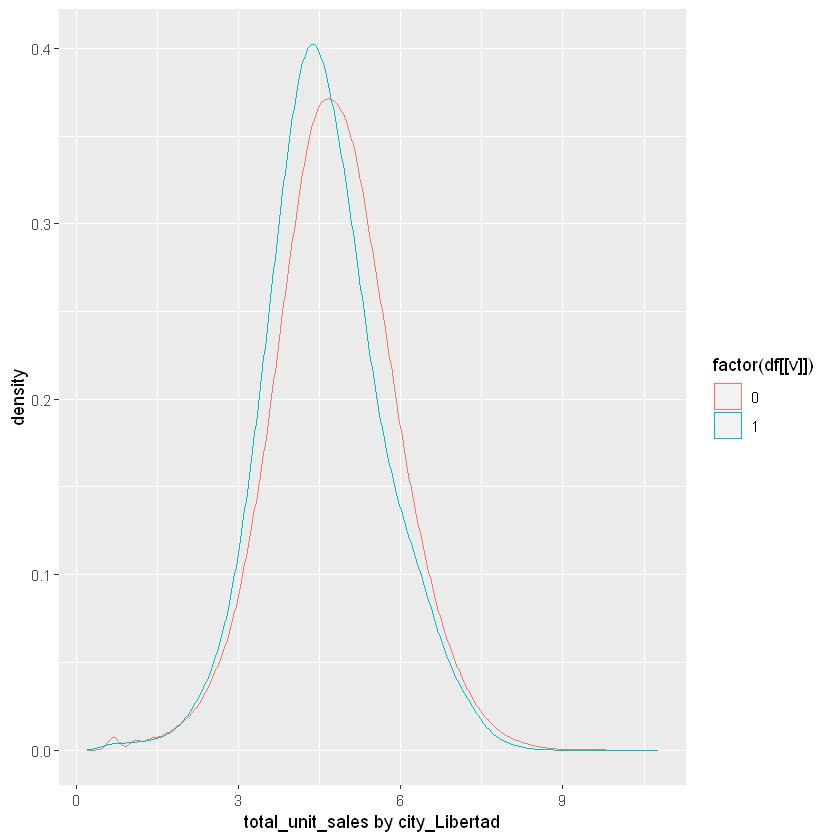

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


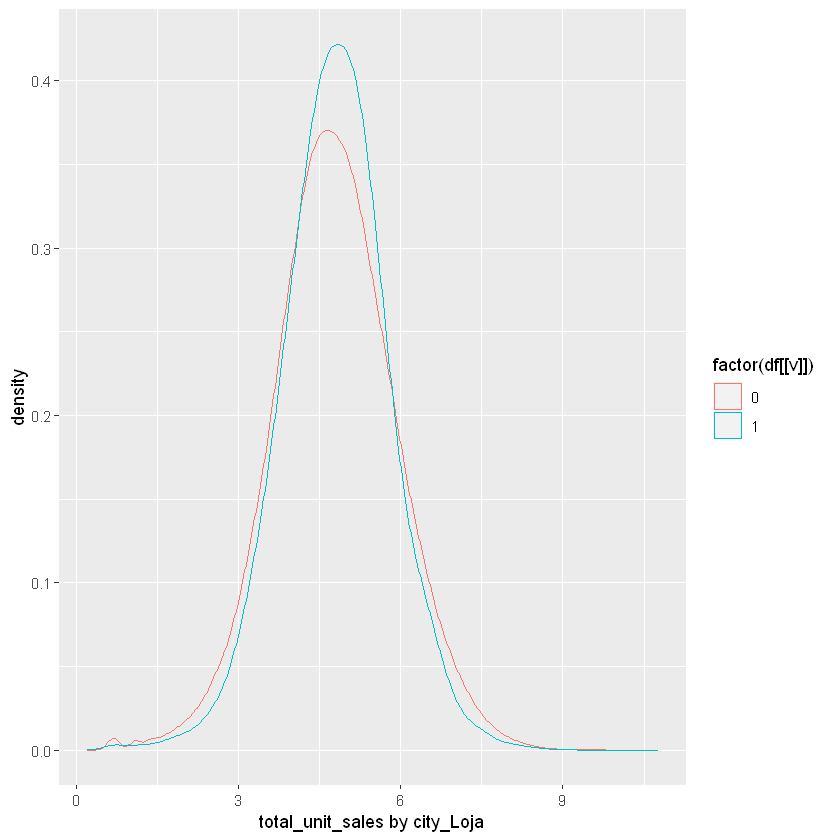

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


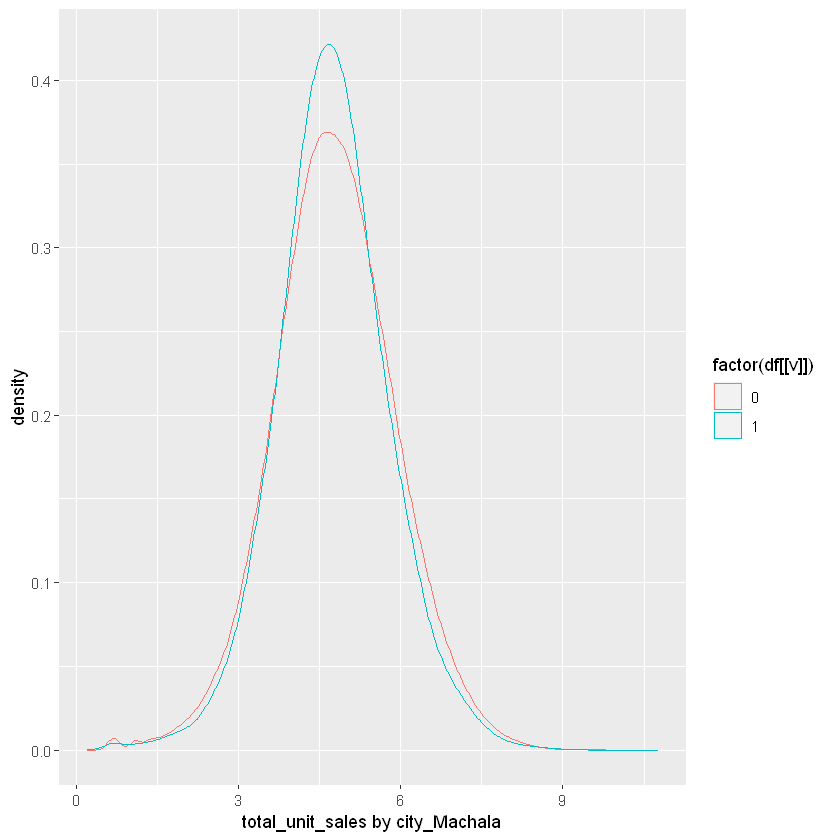

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


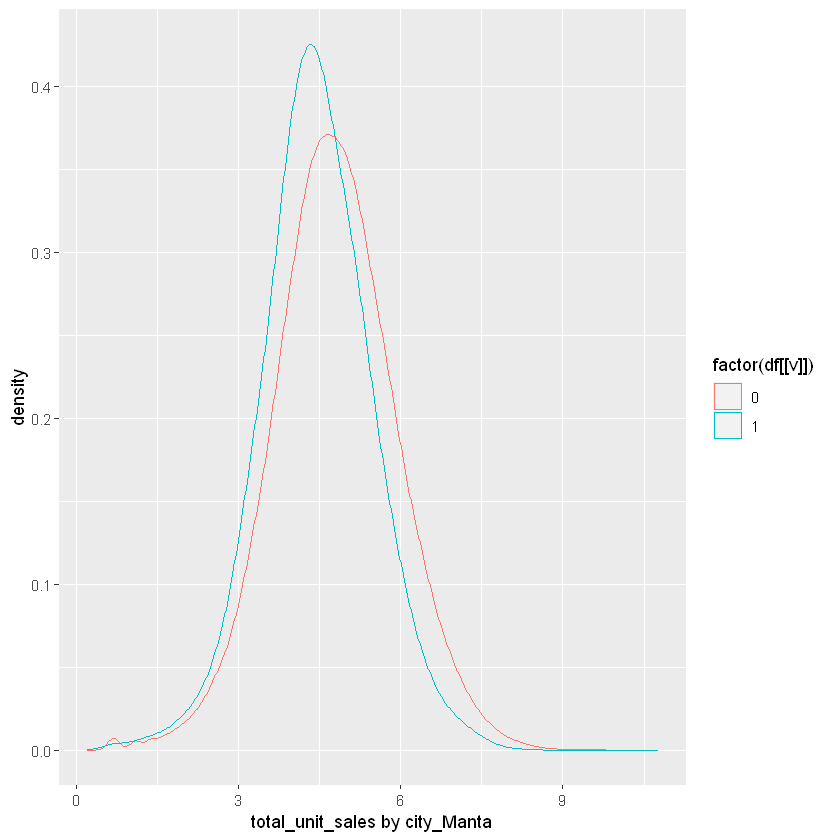

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


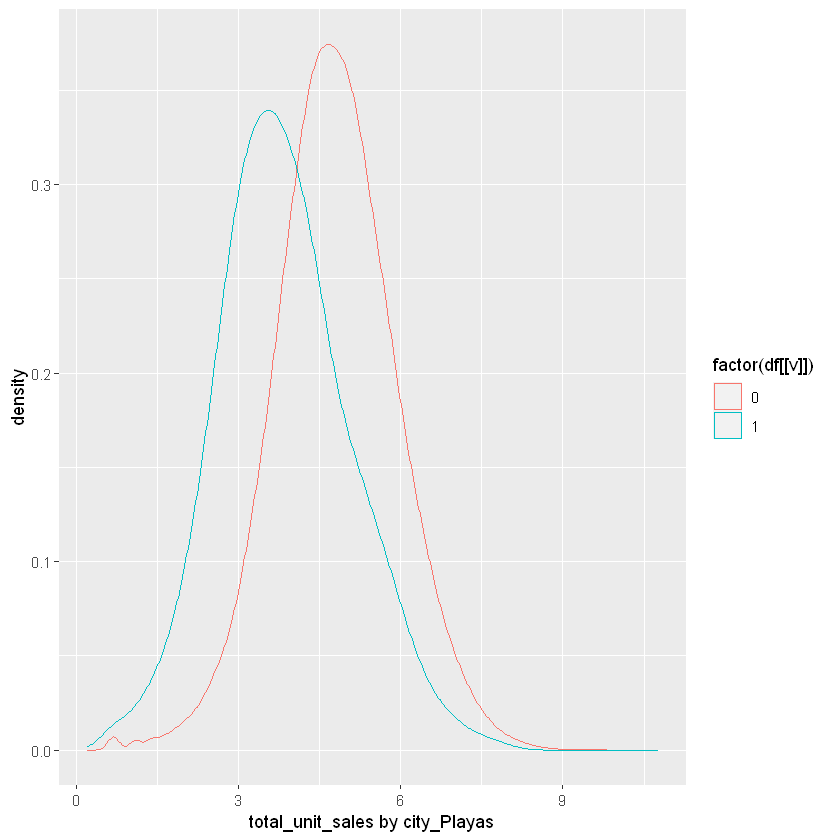

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


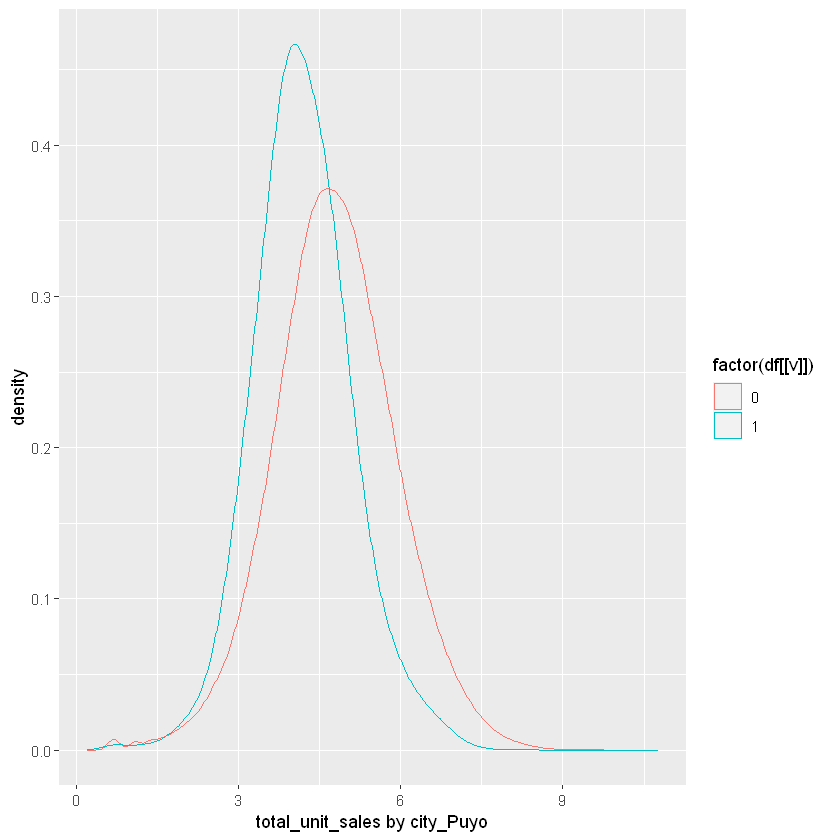

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


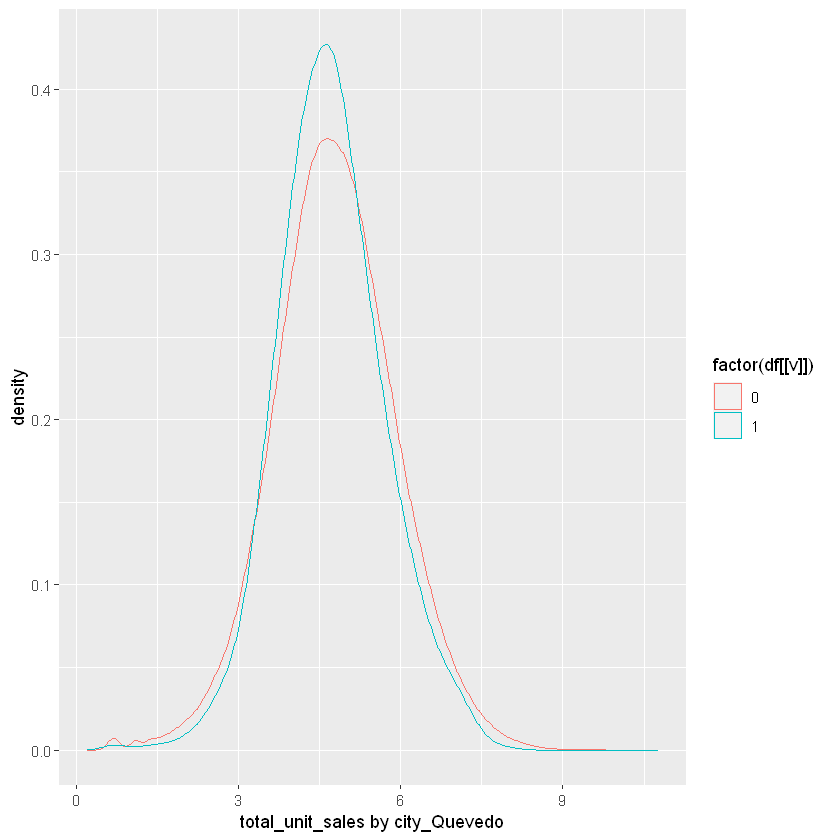

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


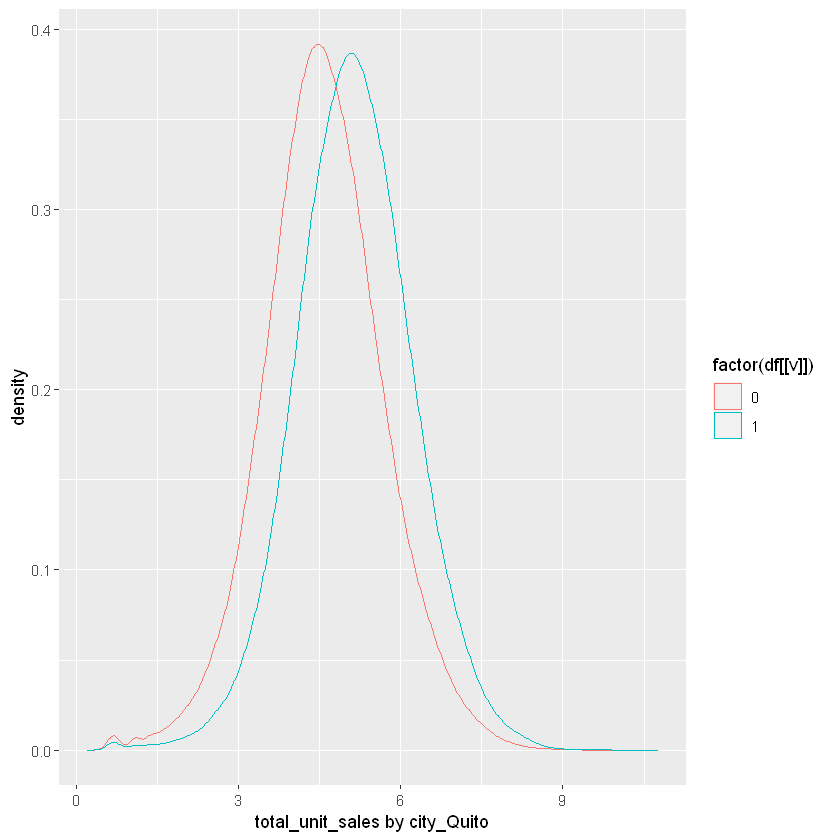

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


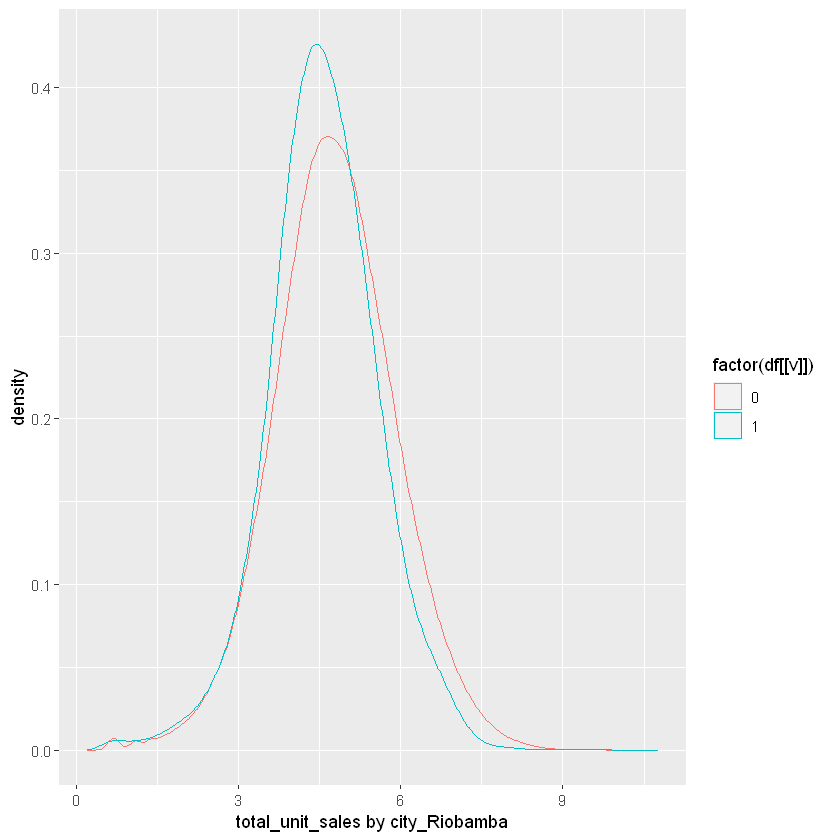

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


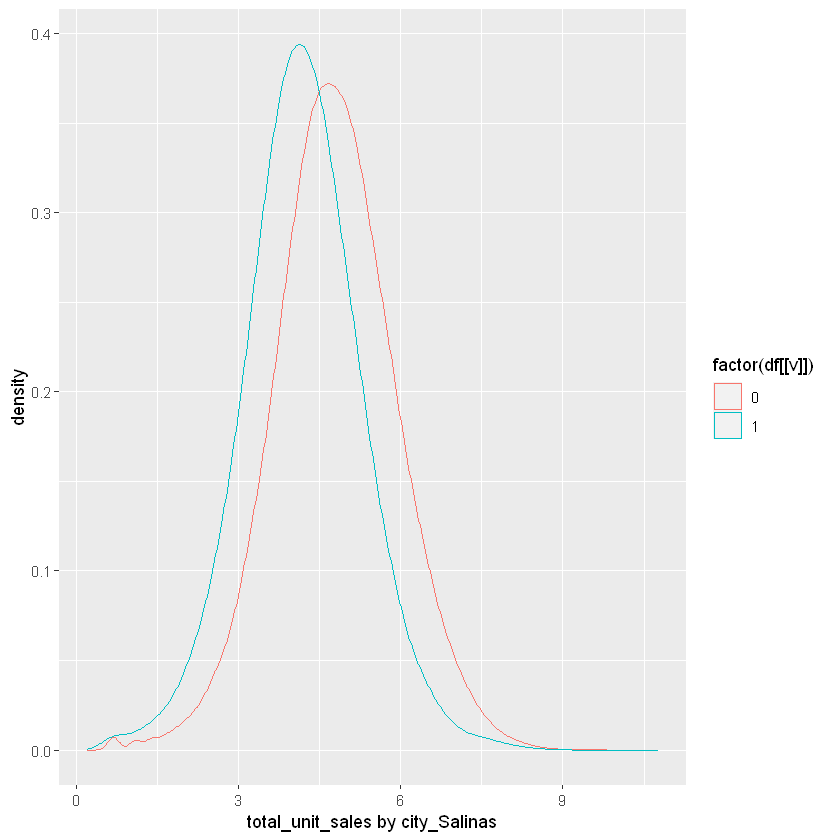

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


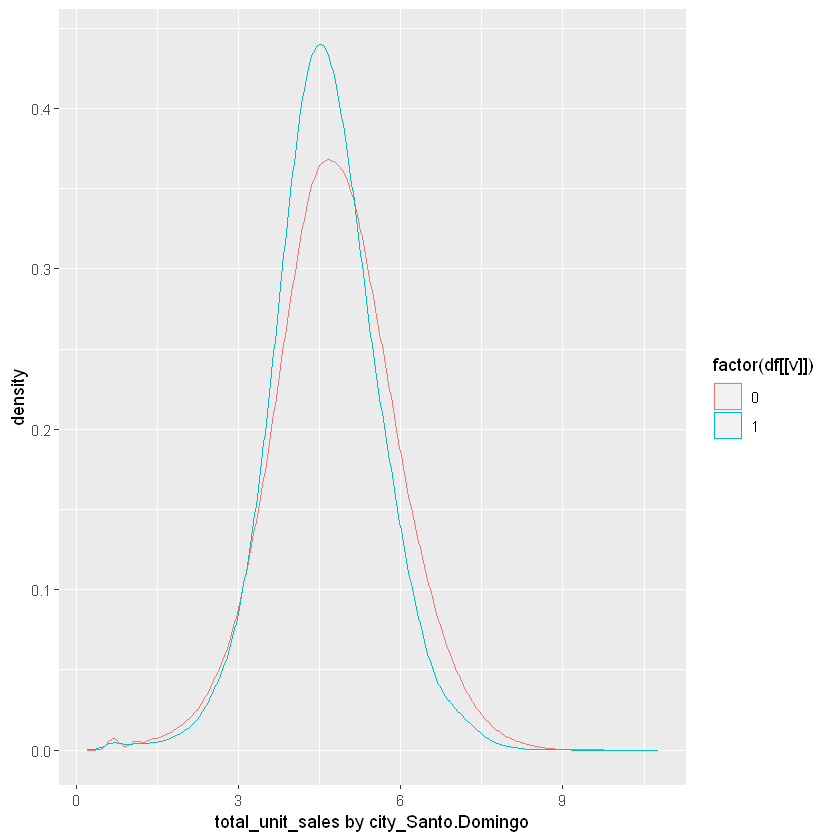

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


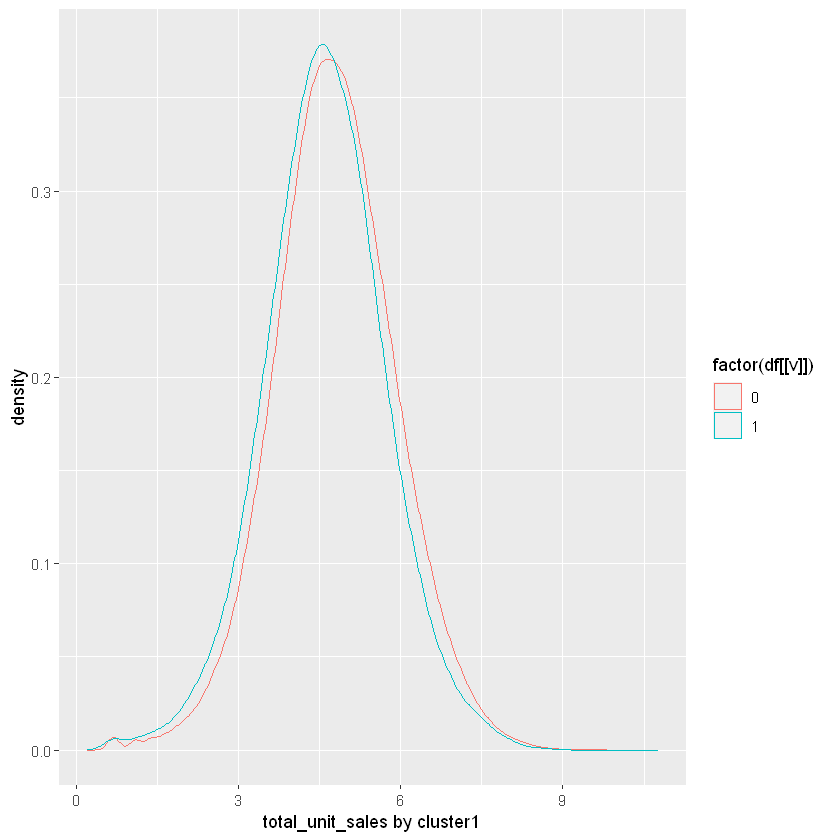

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


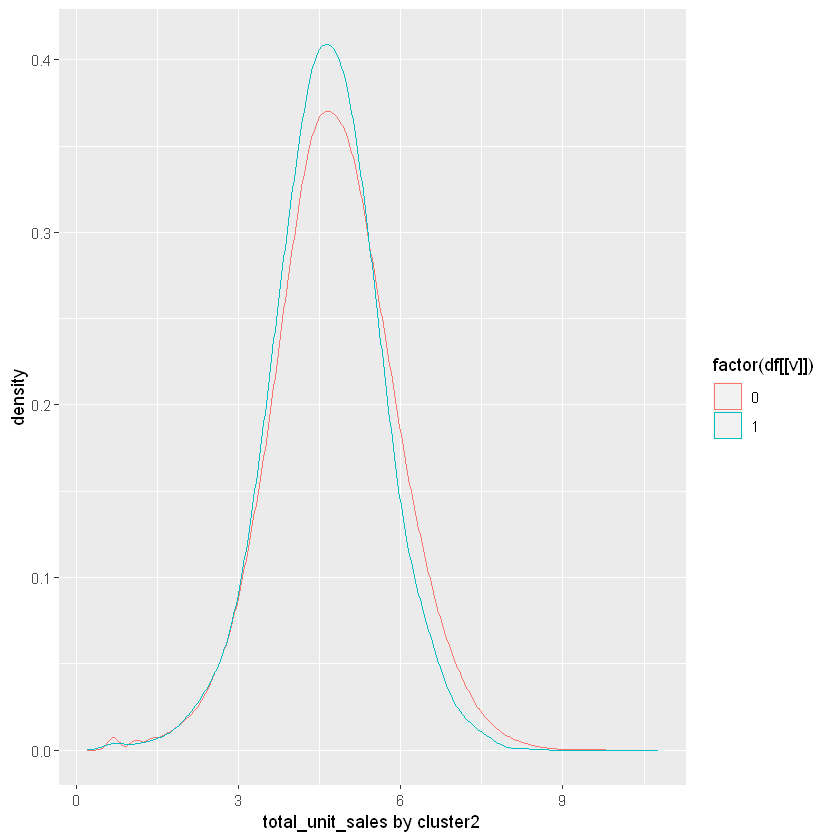

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


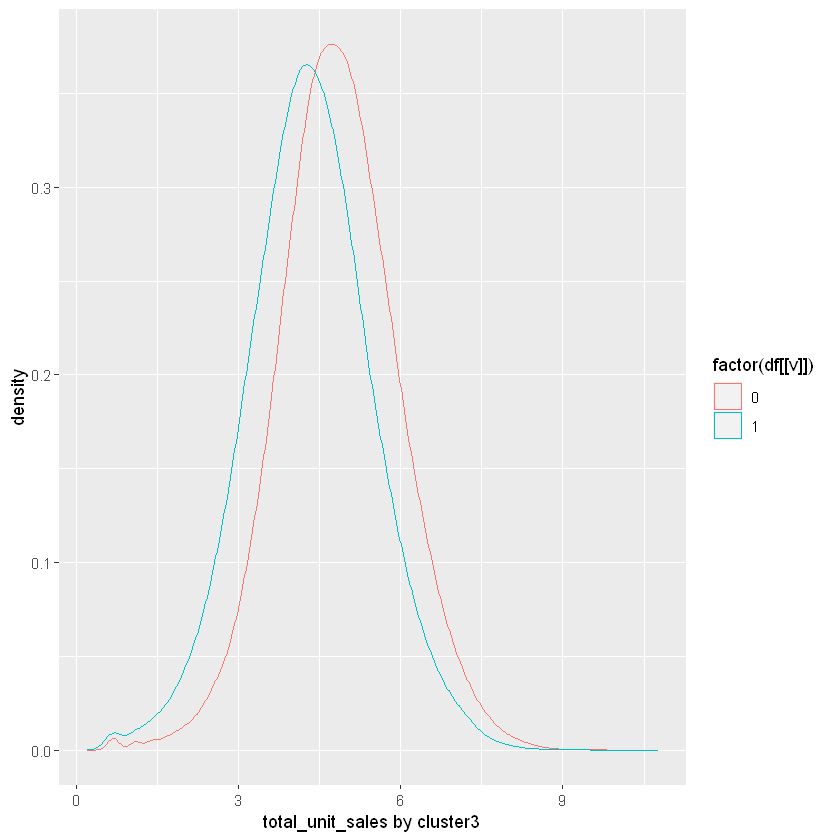

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


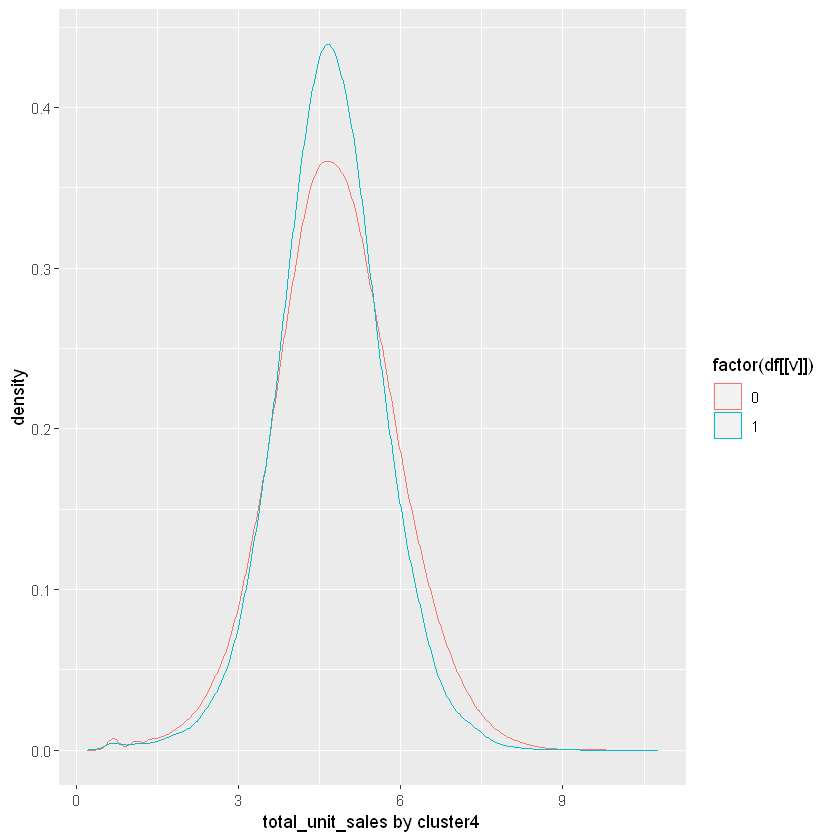

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


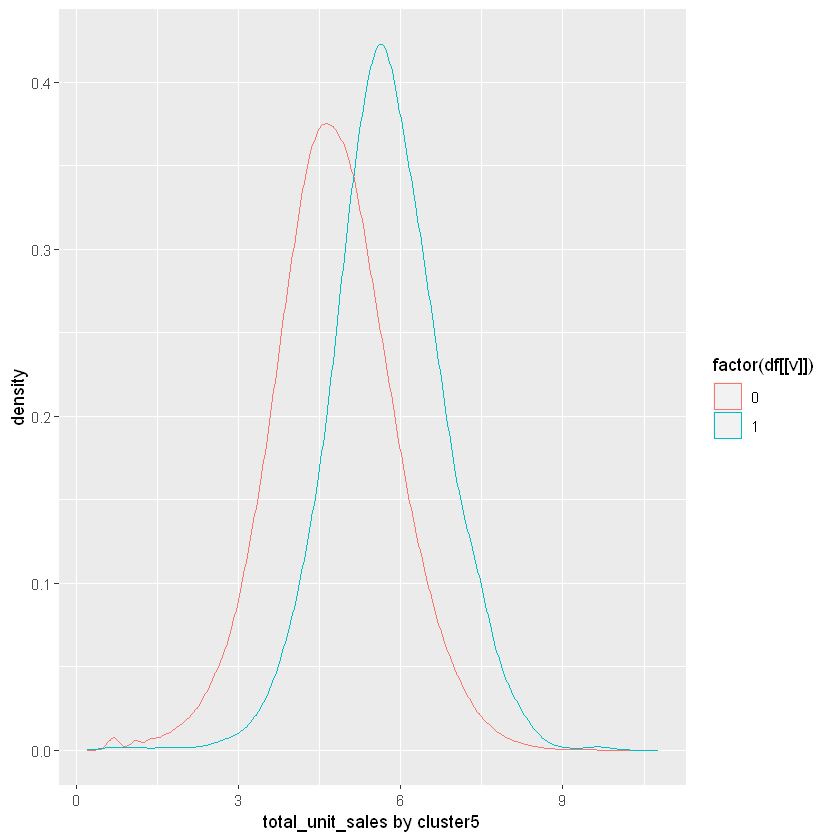

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


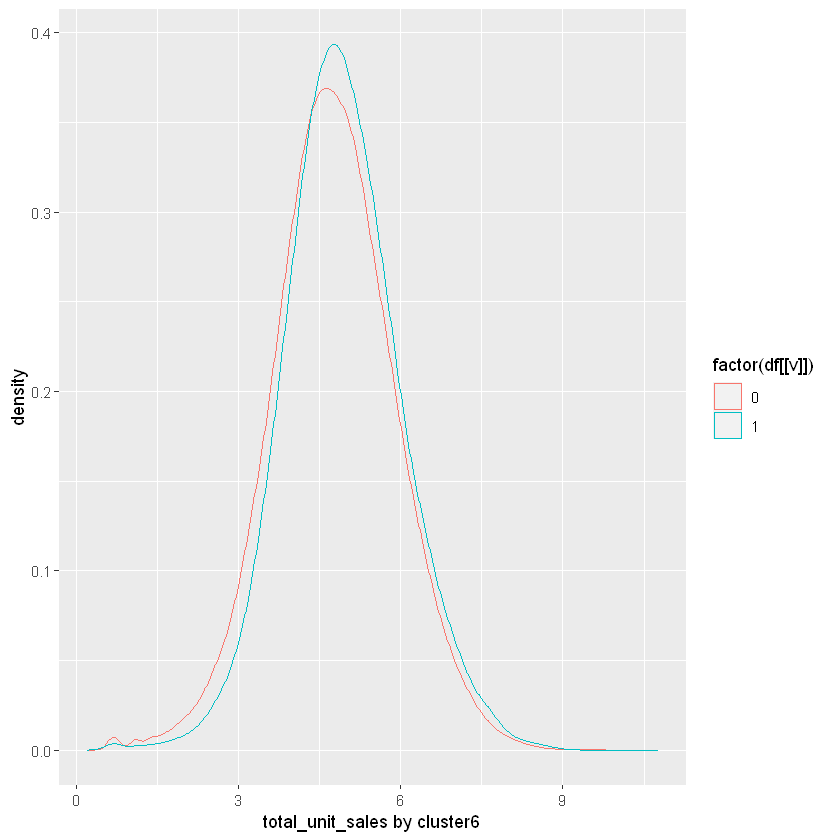

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


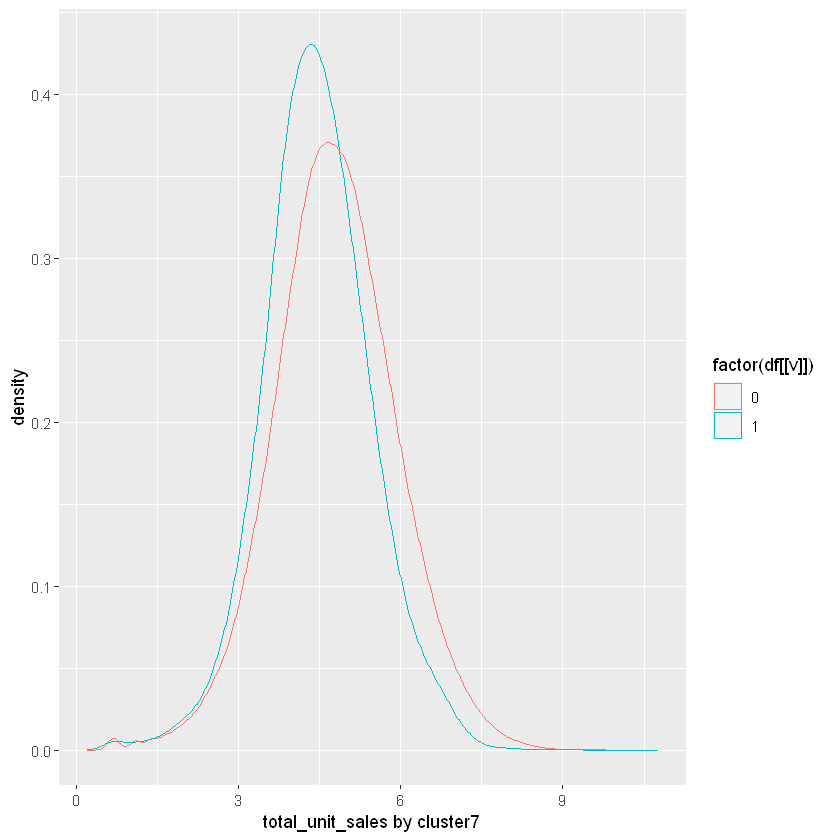

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


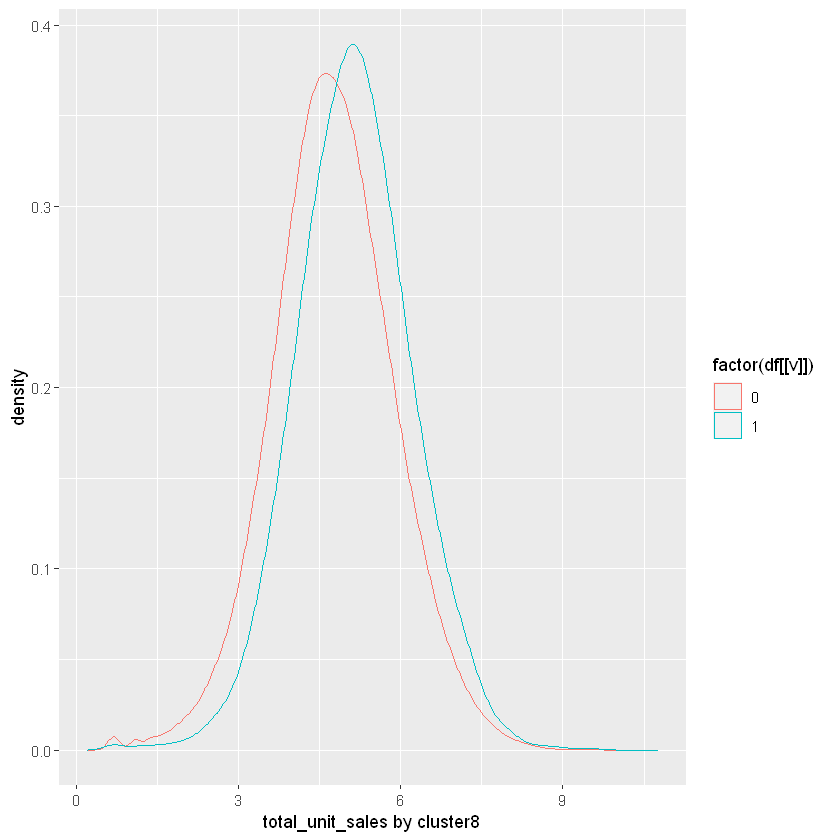

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


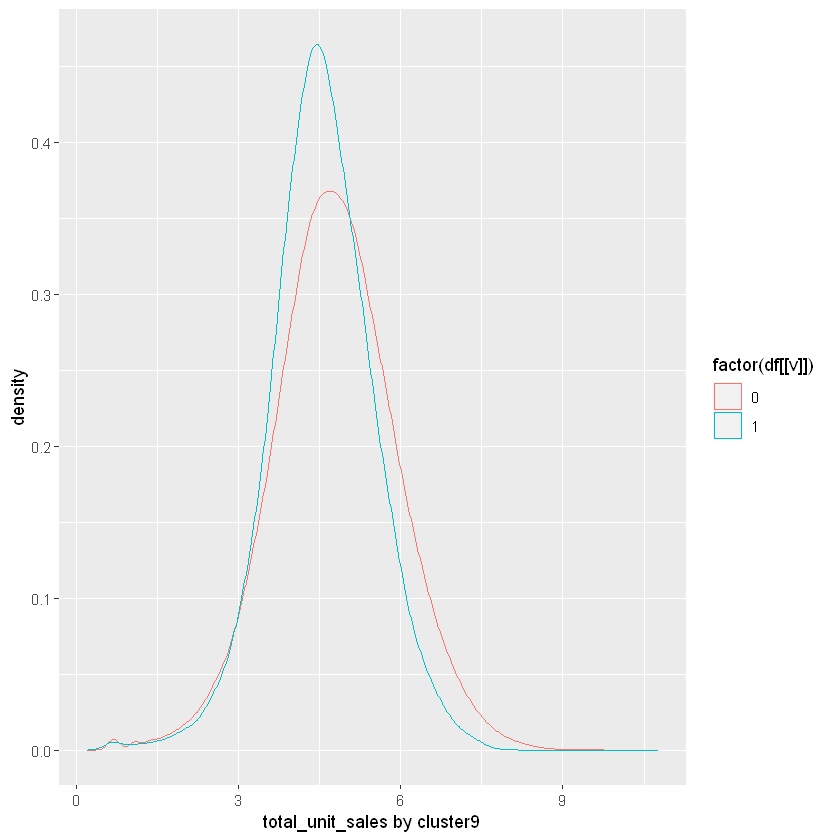

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


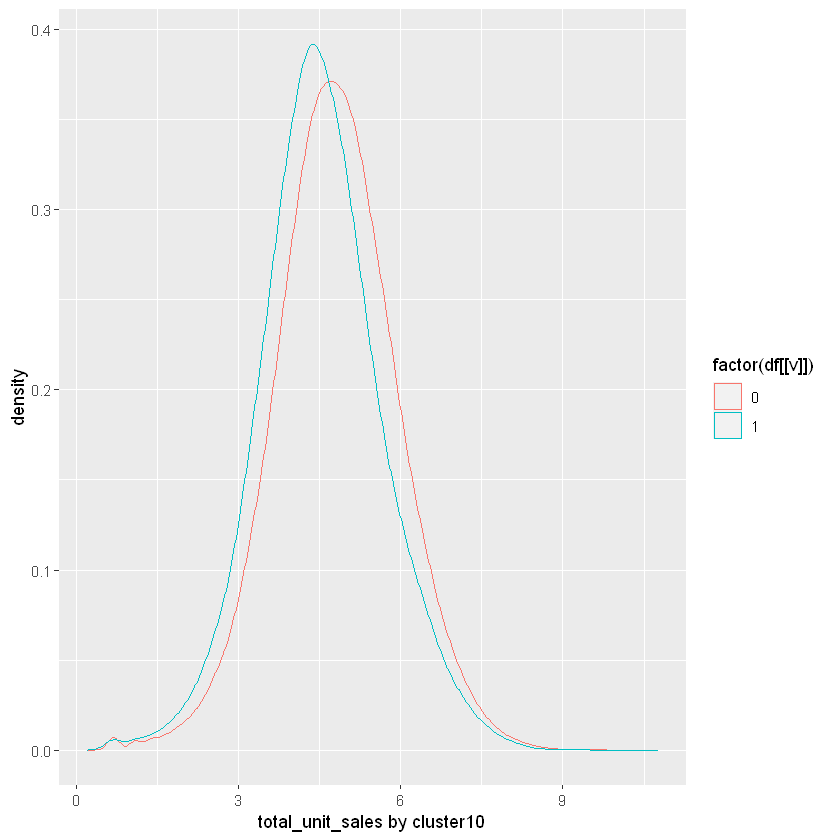

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


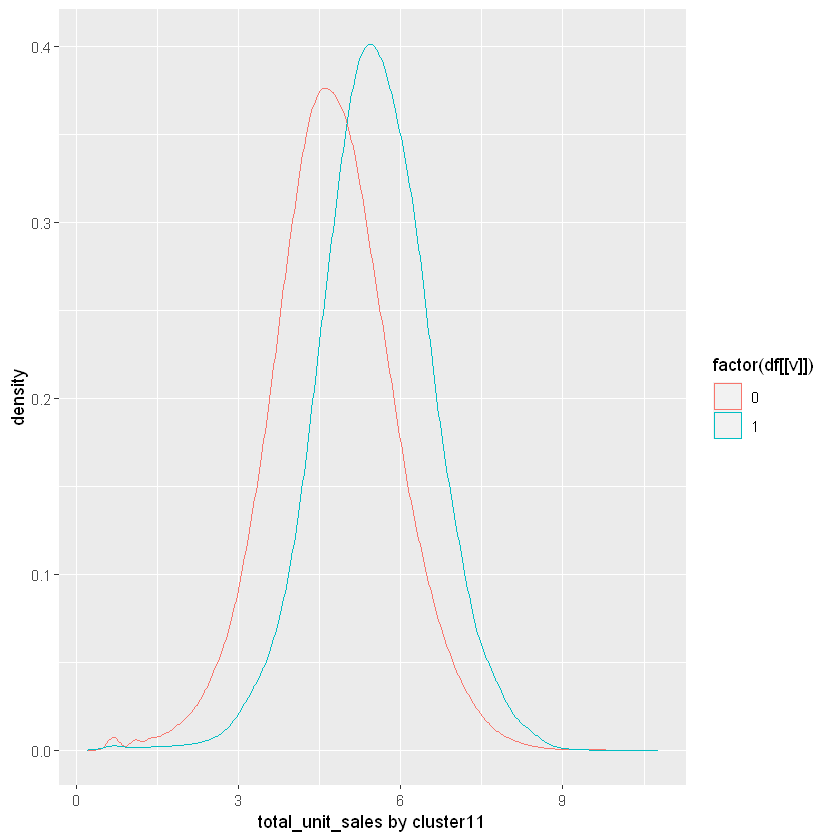

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


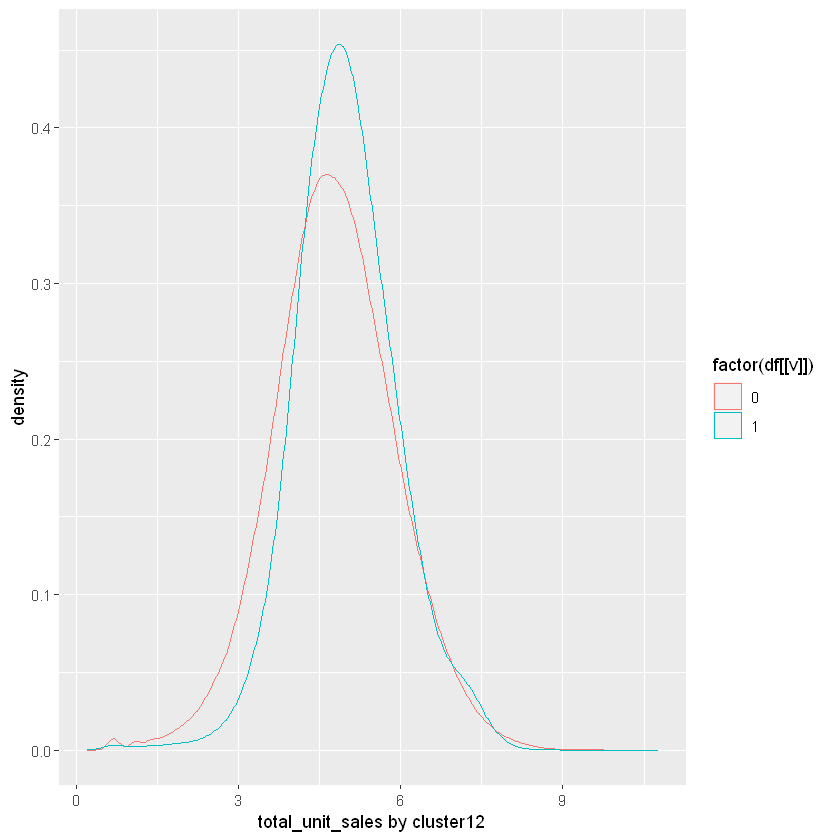

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


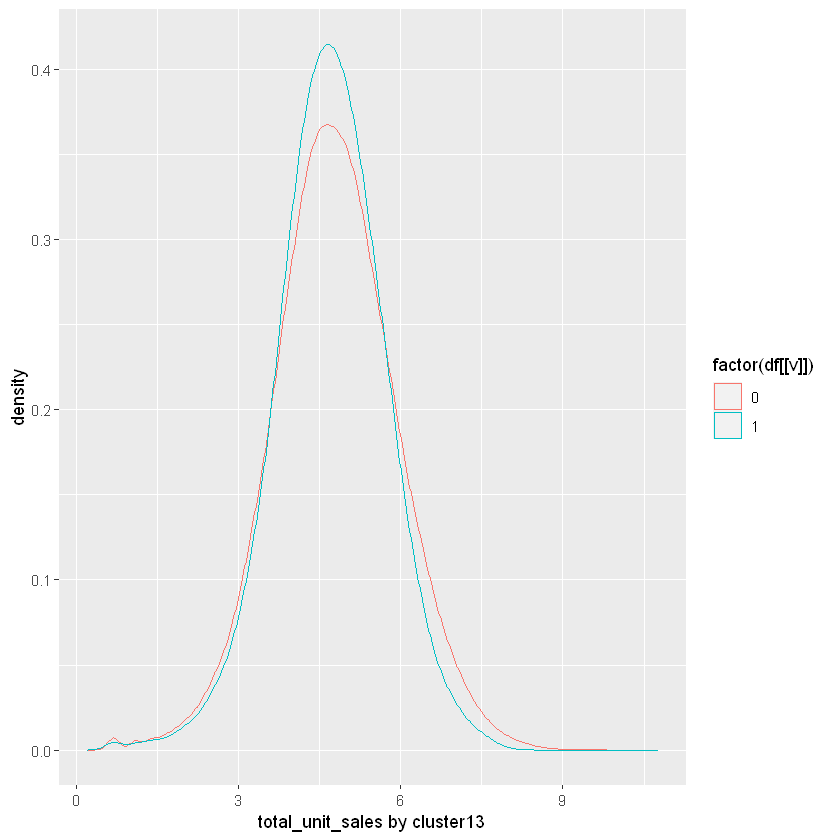

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


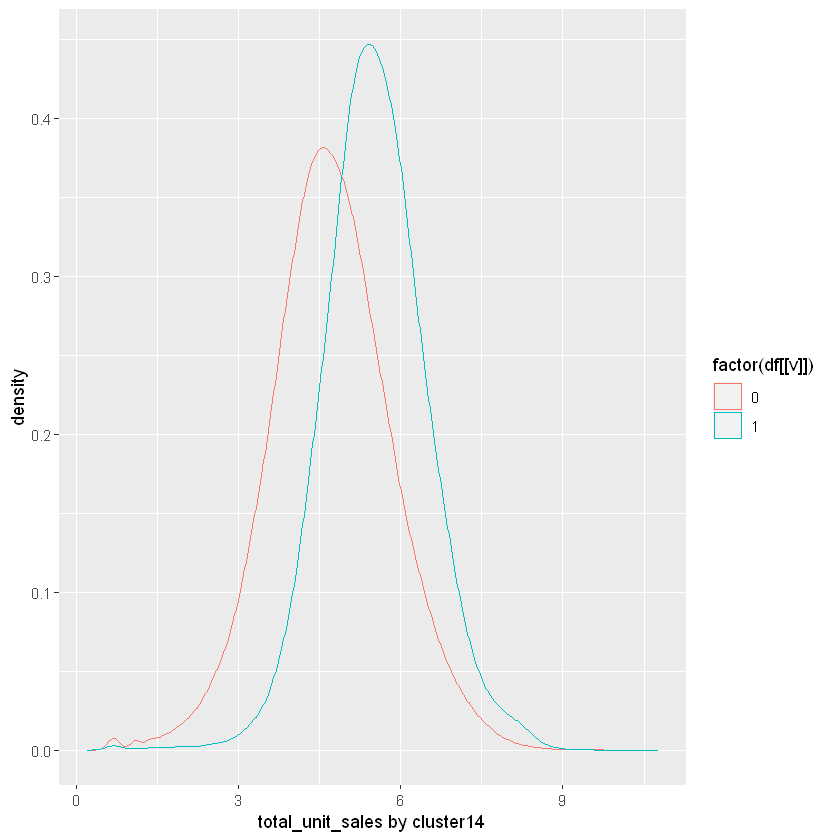

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


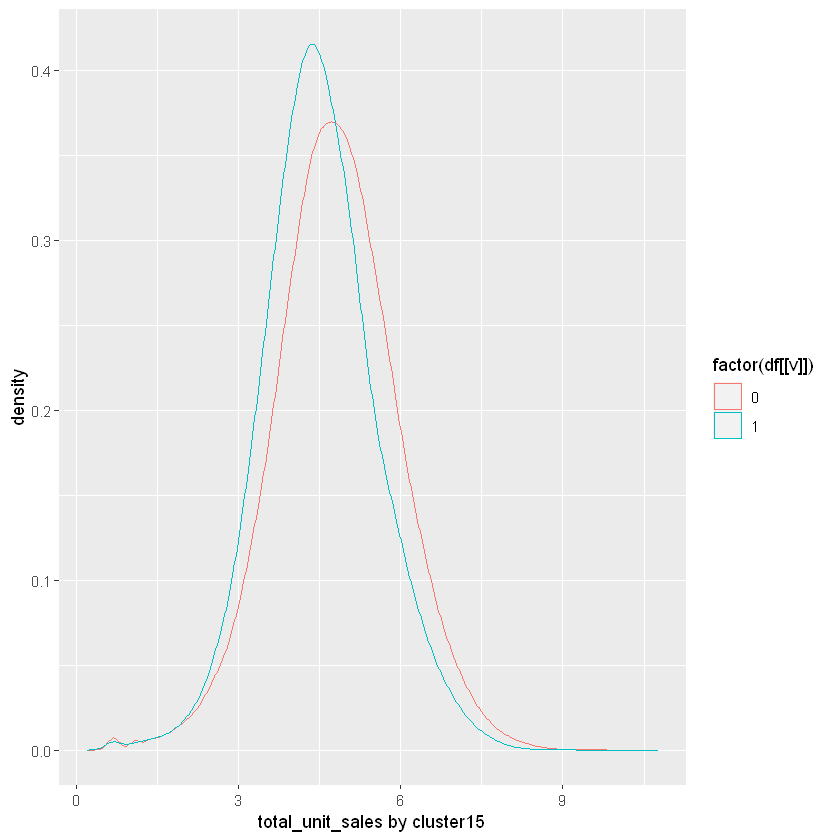

Warning message:
"Use of `df$total_unit_sales` is discouraged. Use `total_unit_sales` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df[[v]]` is discouraged. Use `.data[[v]]` instead."


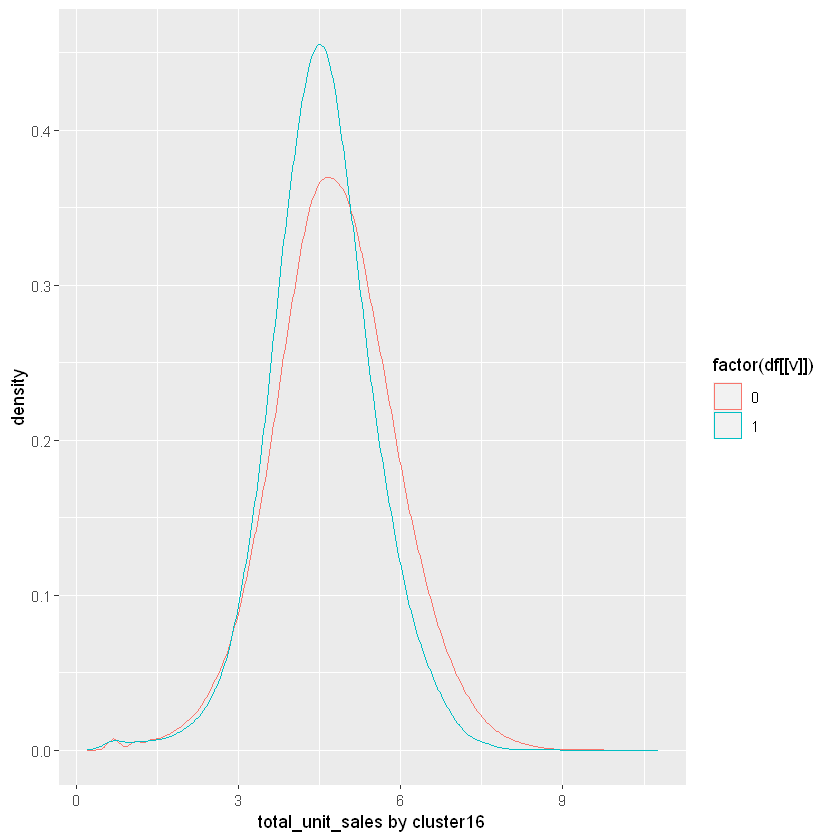

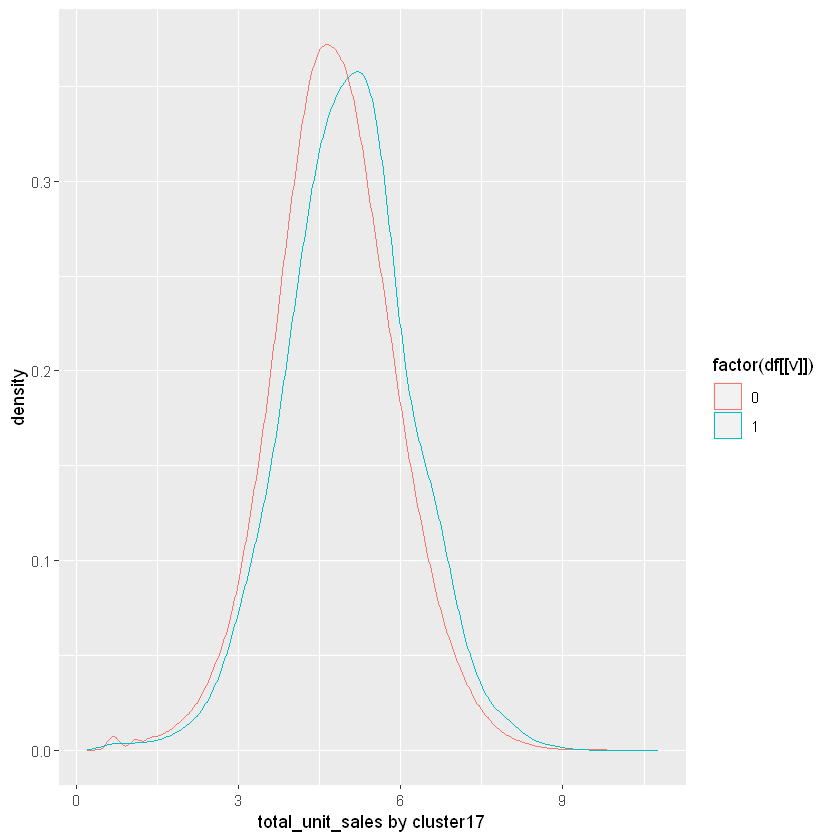

In [24]:
##distribution of revenue by categorical variables
for (v in cf) {
    print(ggplot(df,aes(x=df$total_unit_sales, group=factor(df[[v]]),
                          color=factor(df[[v]]))) + xlab(paste('total_unit_sales by',v,sep=' ')) +
    geom_density(adjust=2))
}

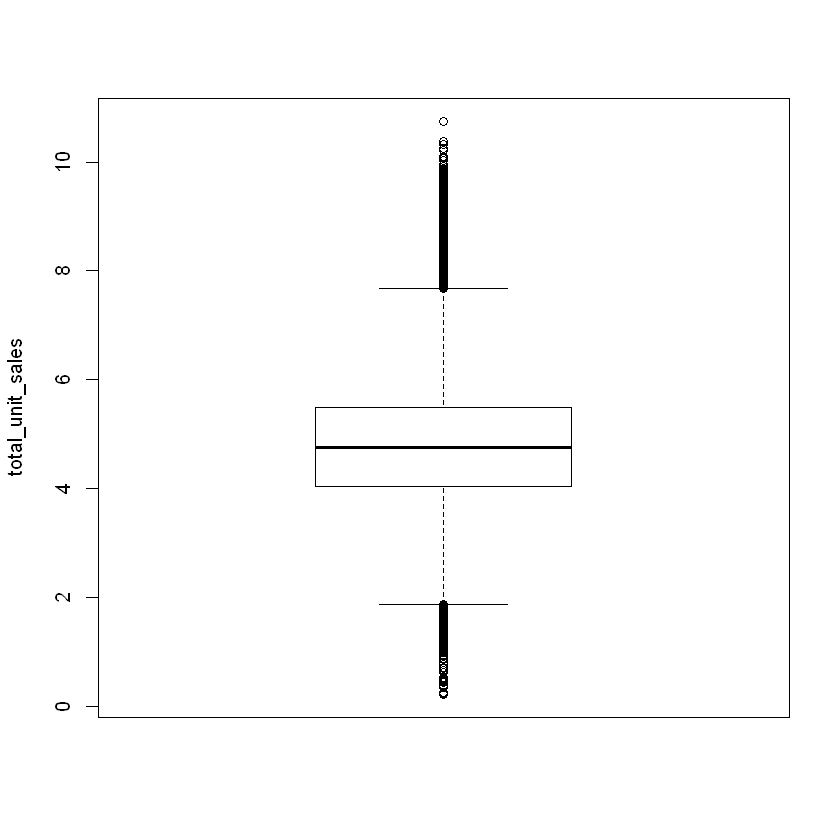

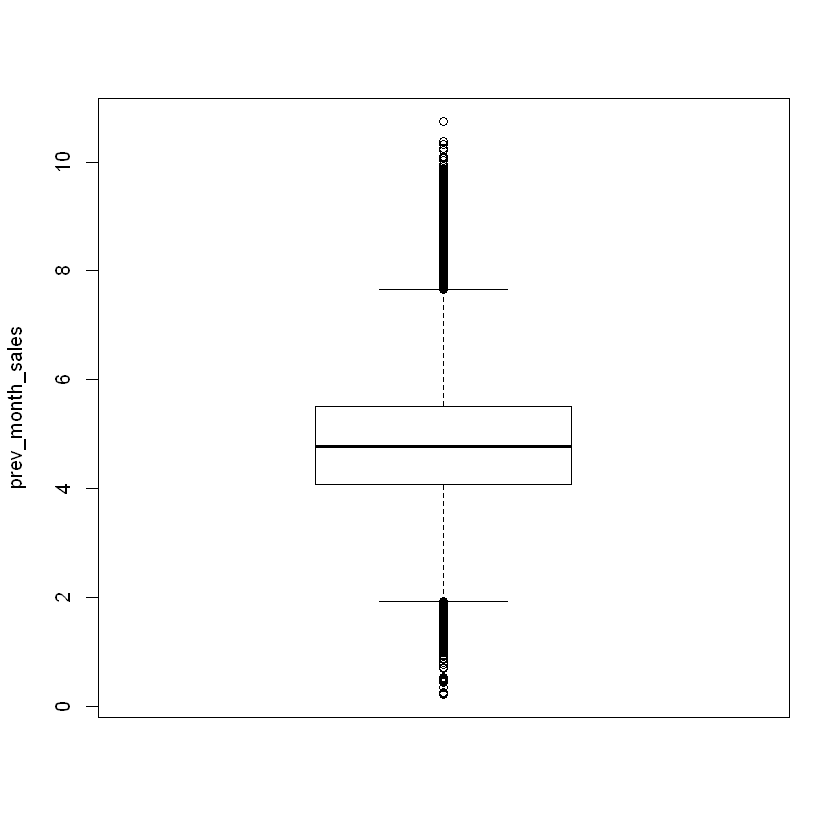

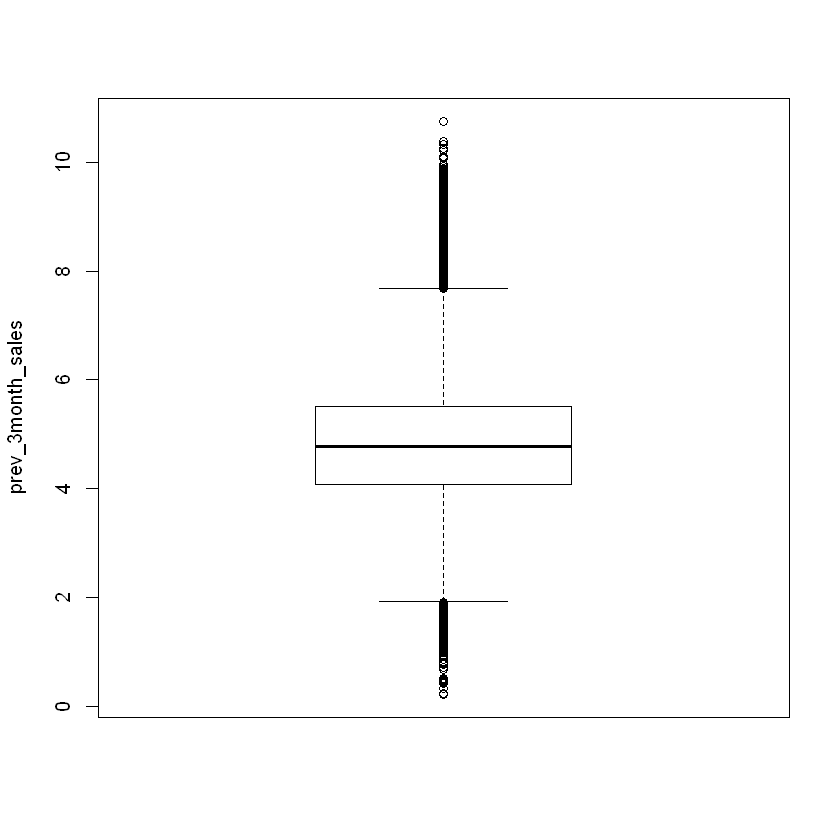

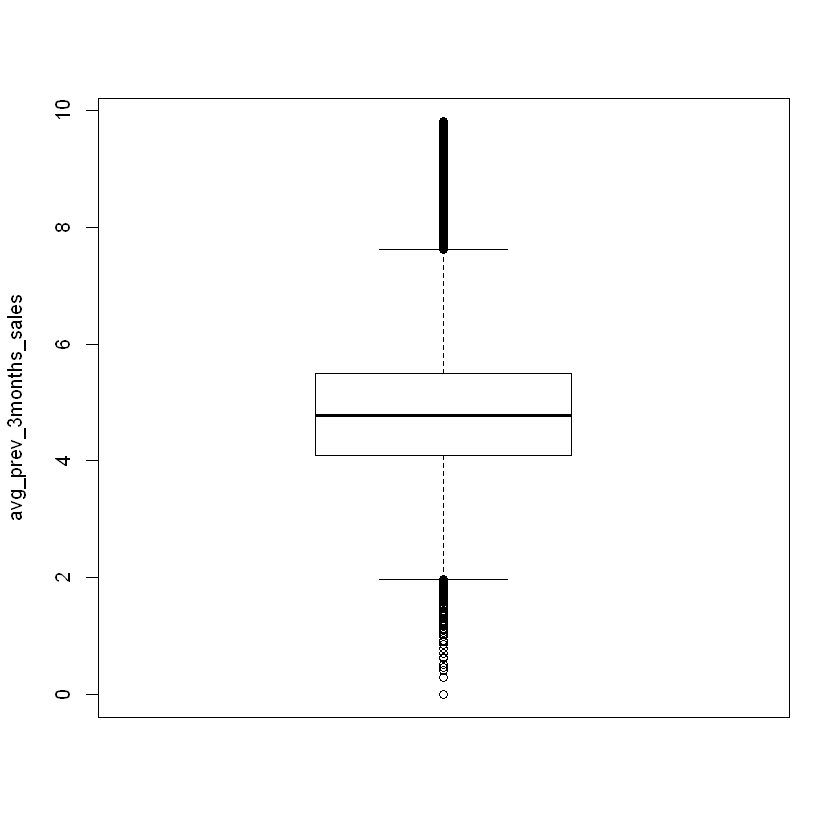

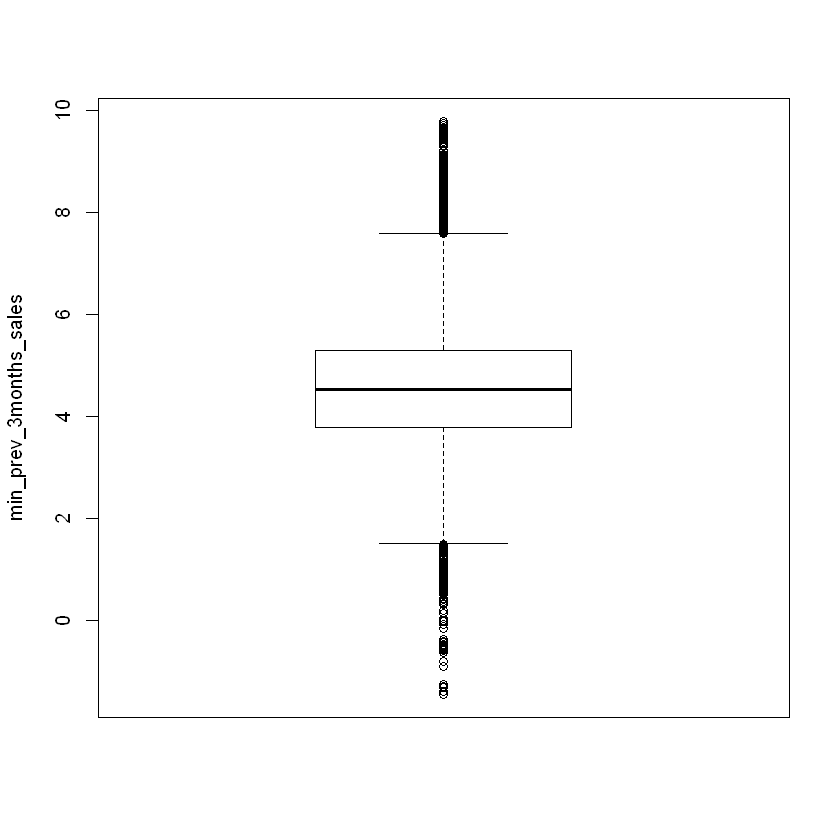

...

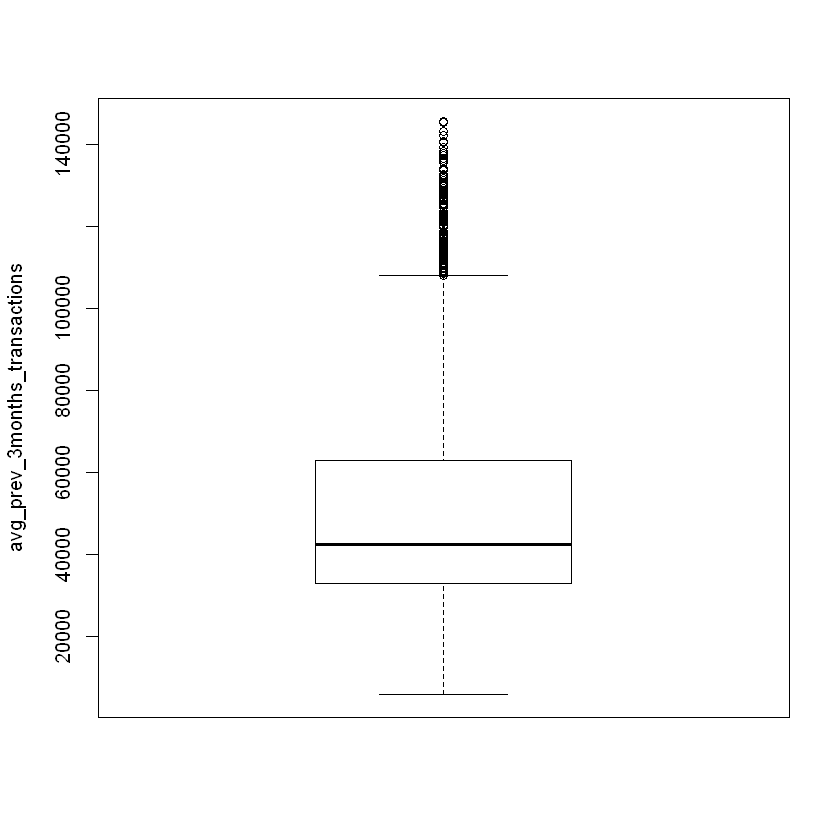

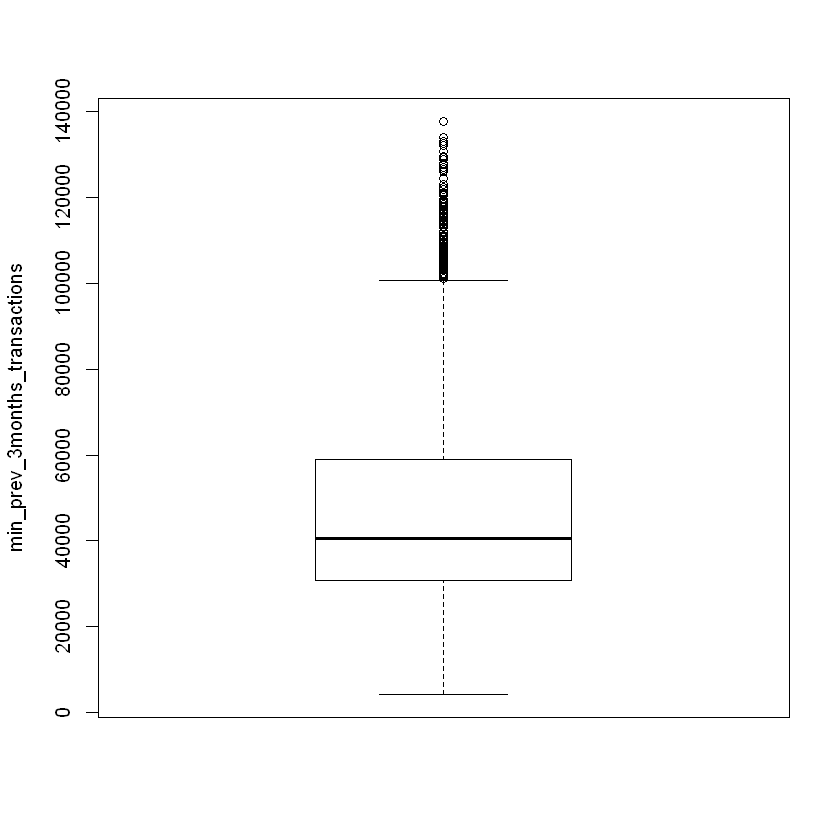

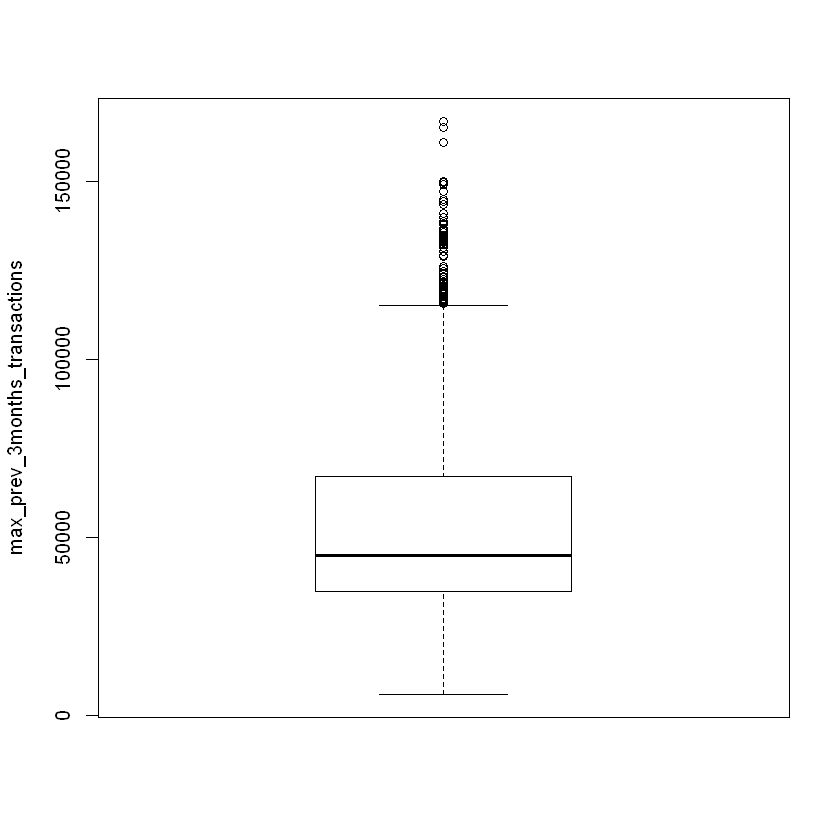

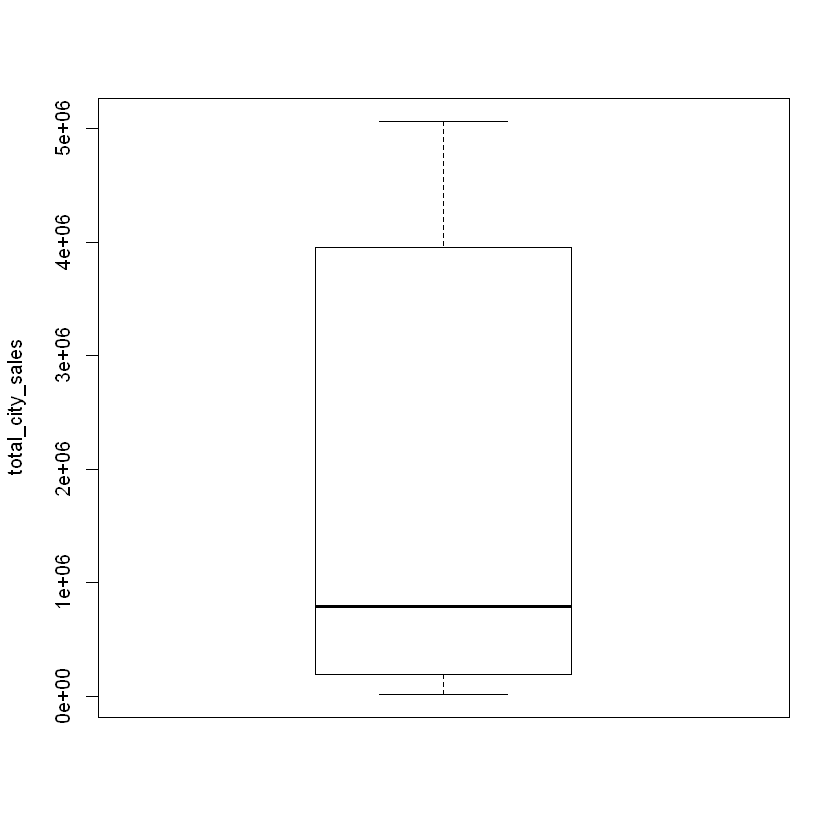

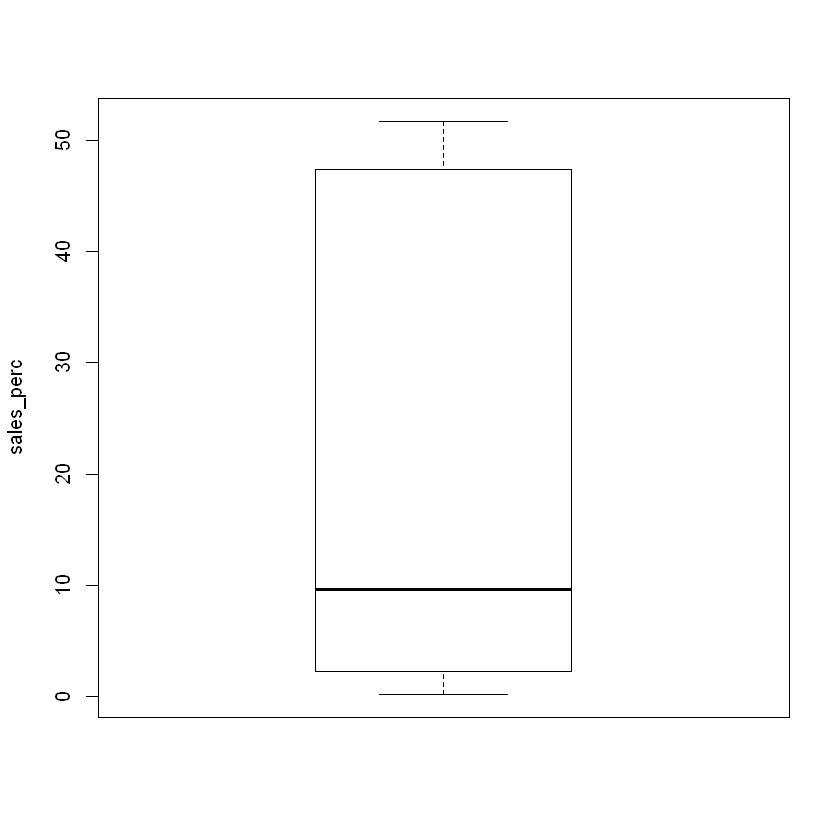

In [25]:
## checking the outliers
for (v in nf){
    boxplot(df[[v]],ylab=v)
}

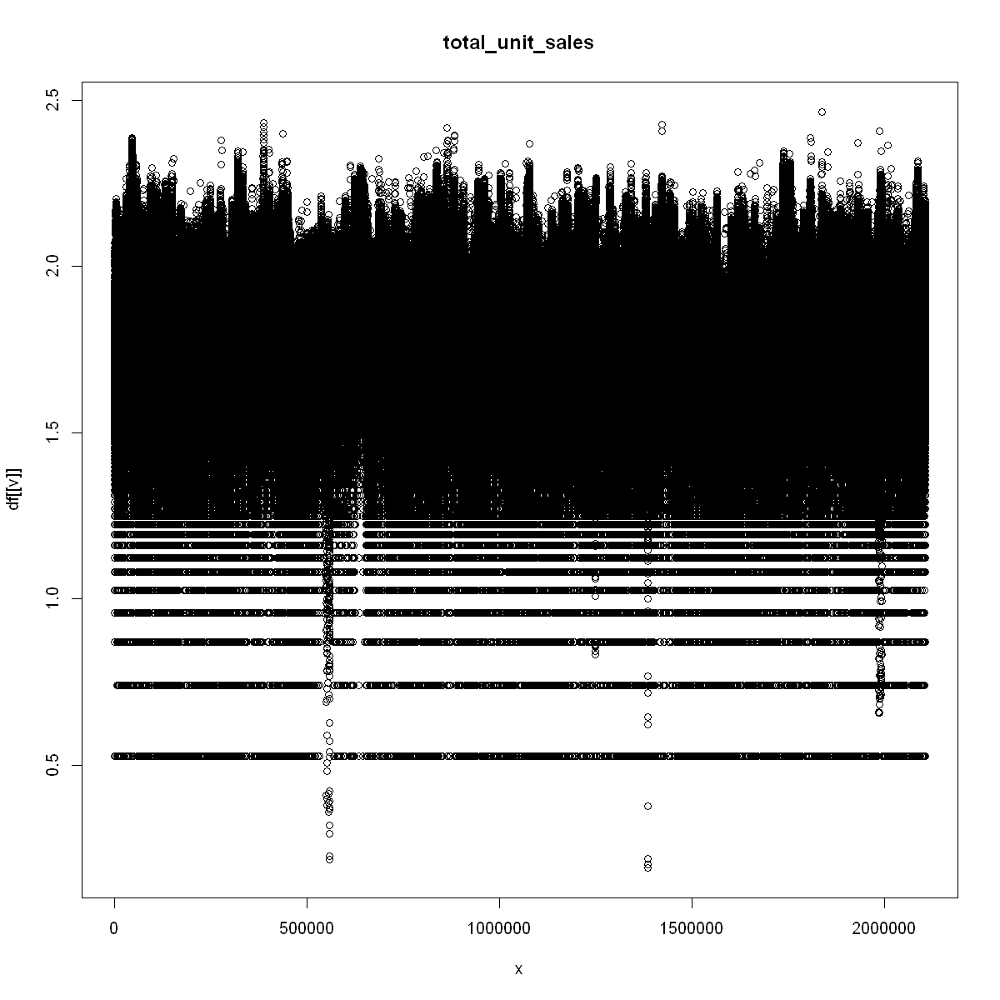

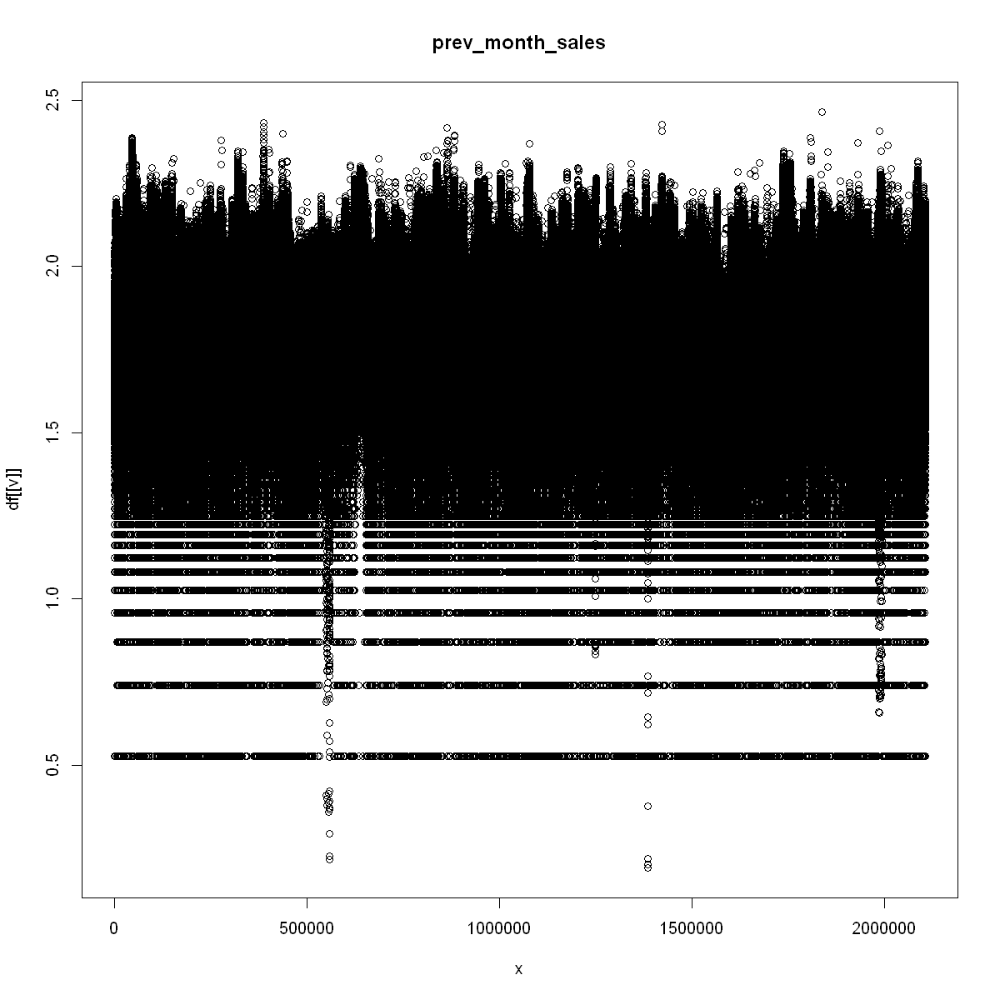

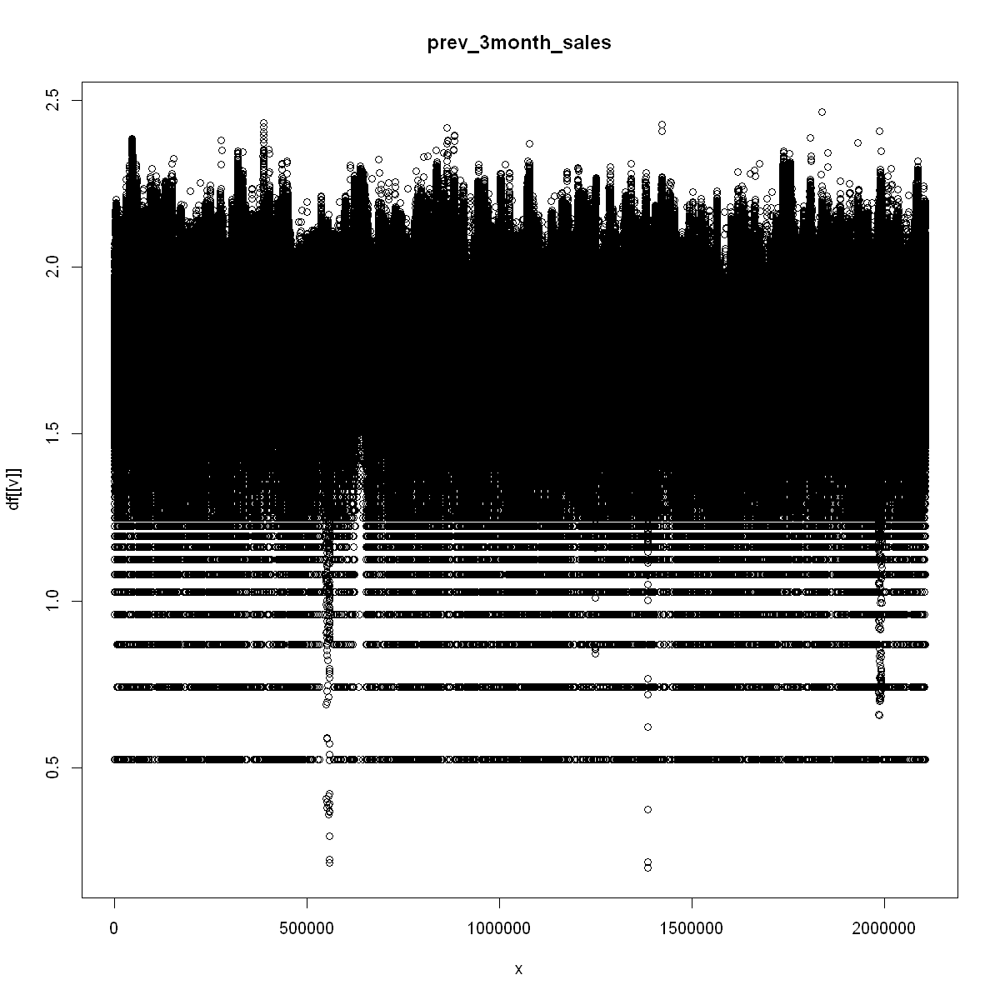

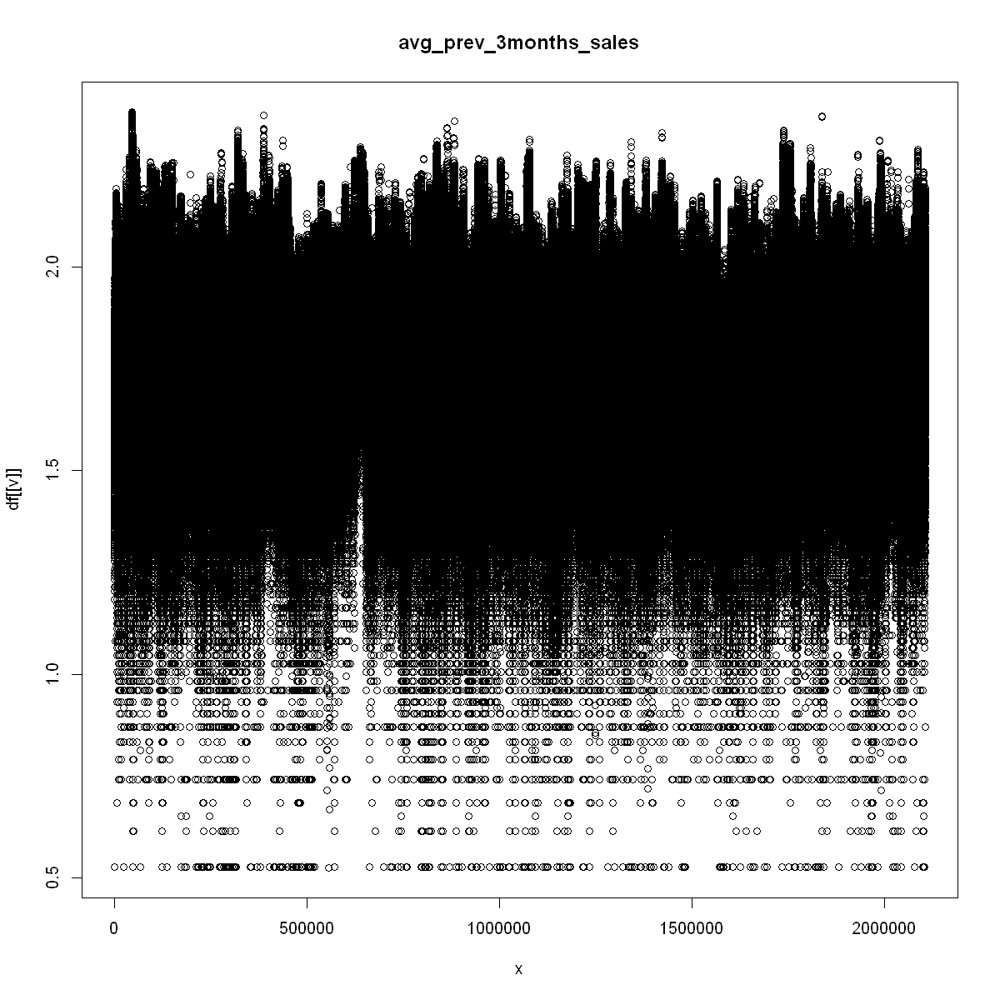

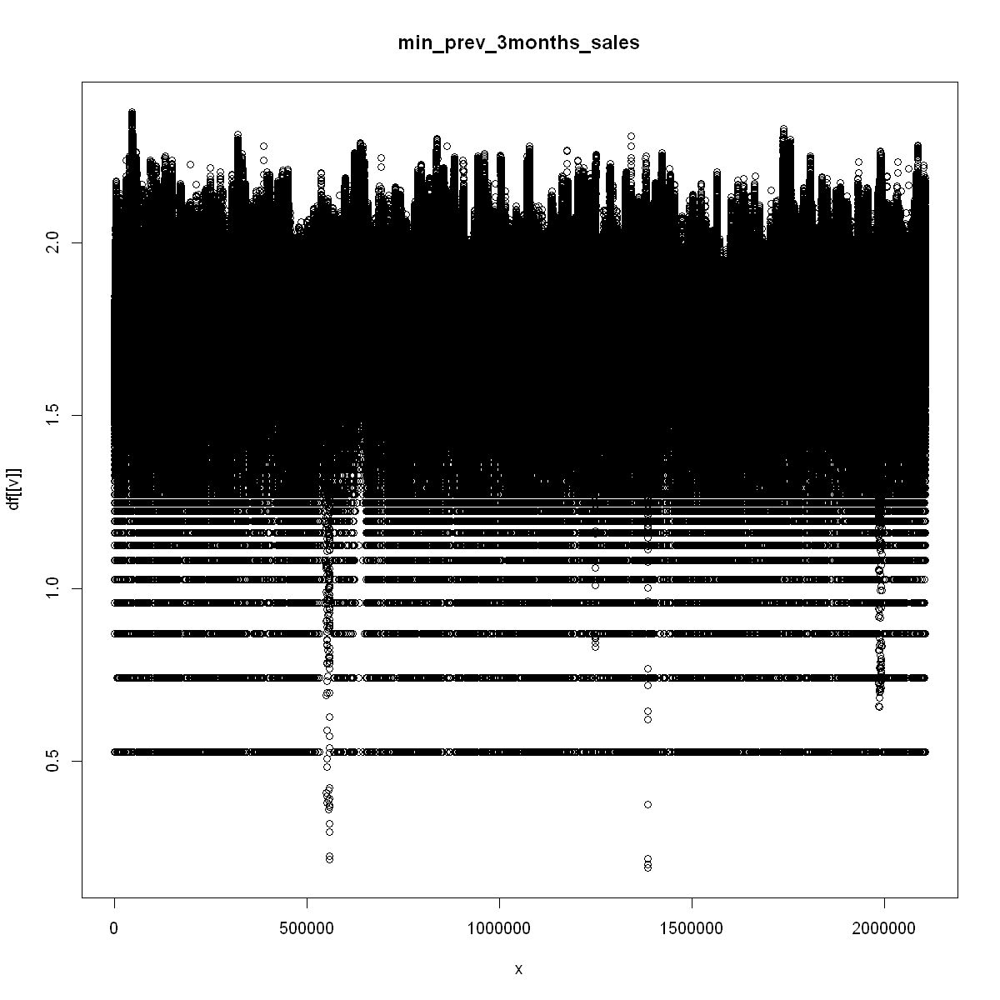

...

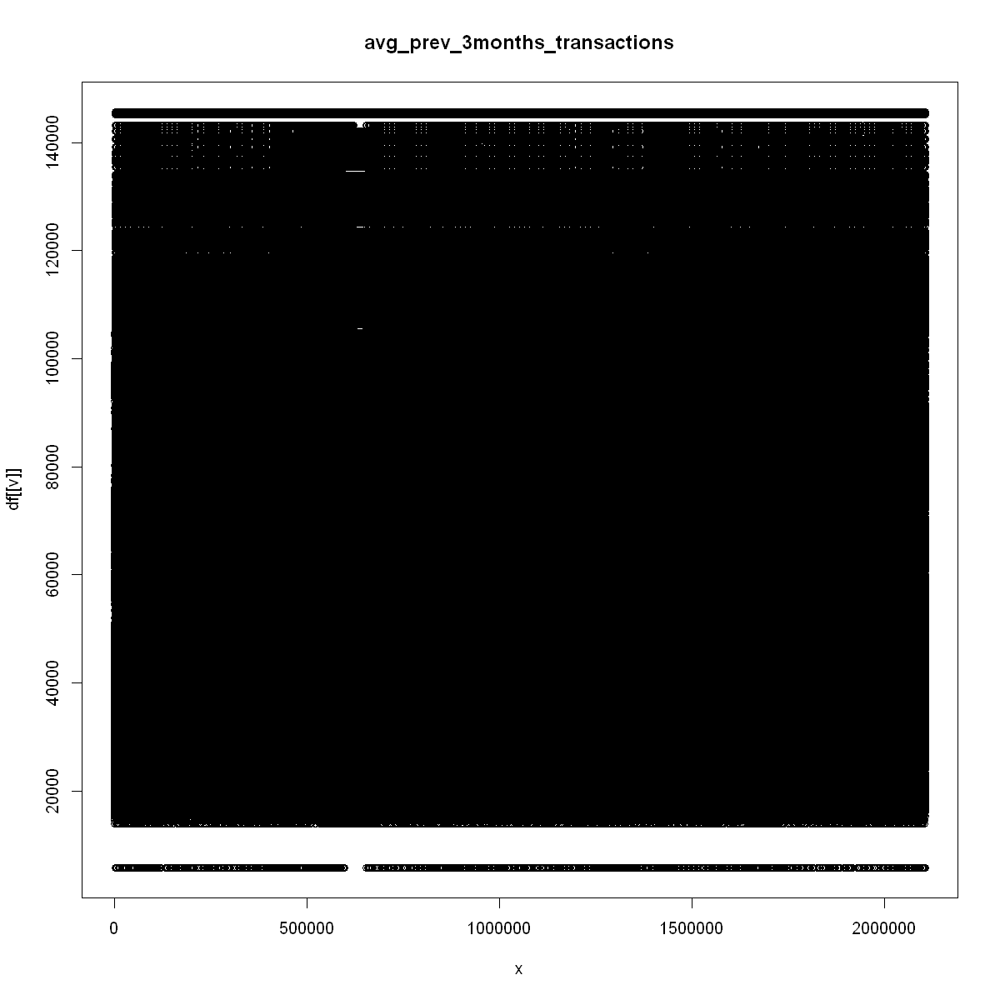

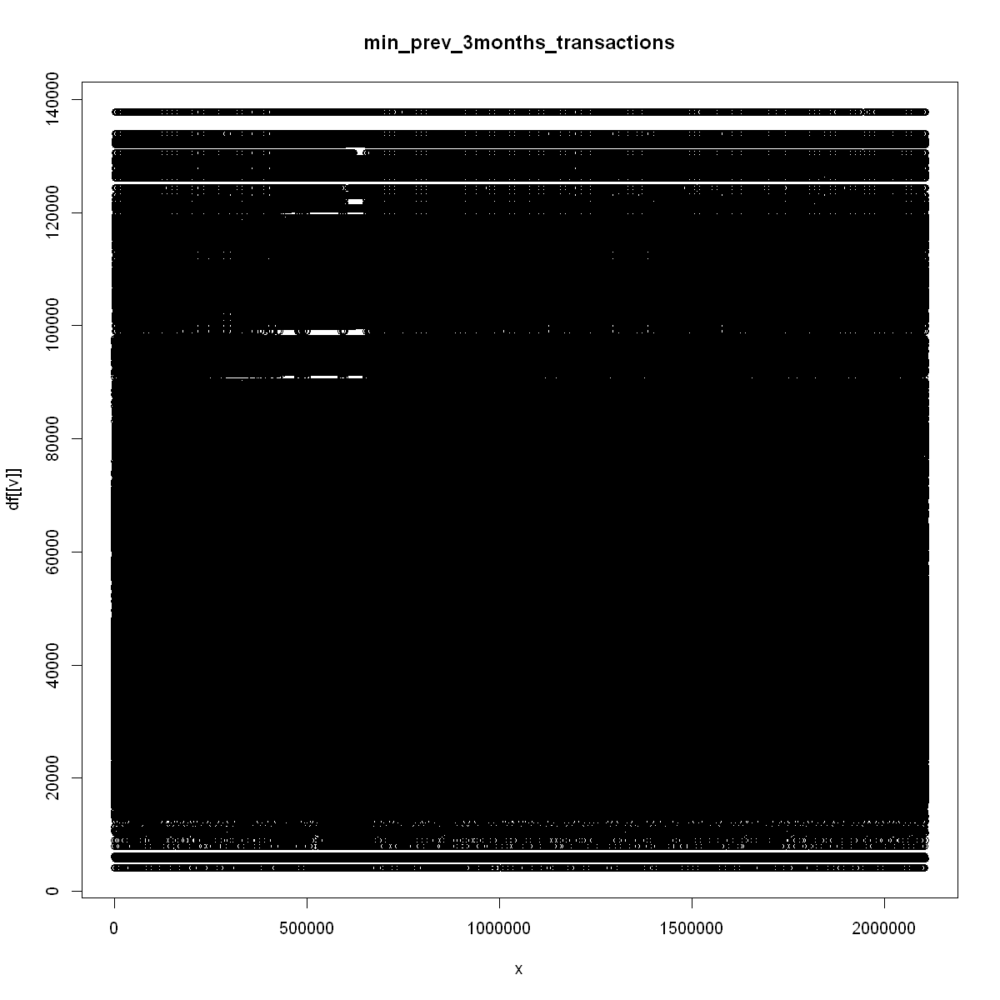

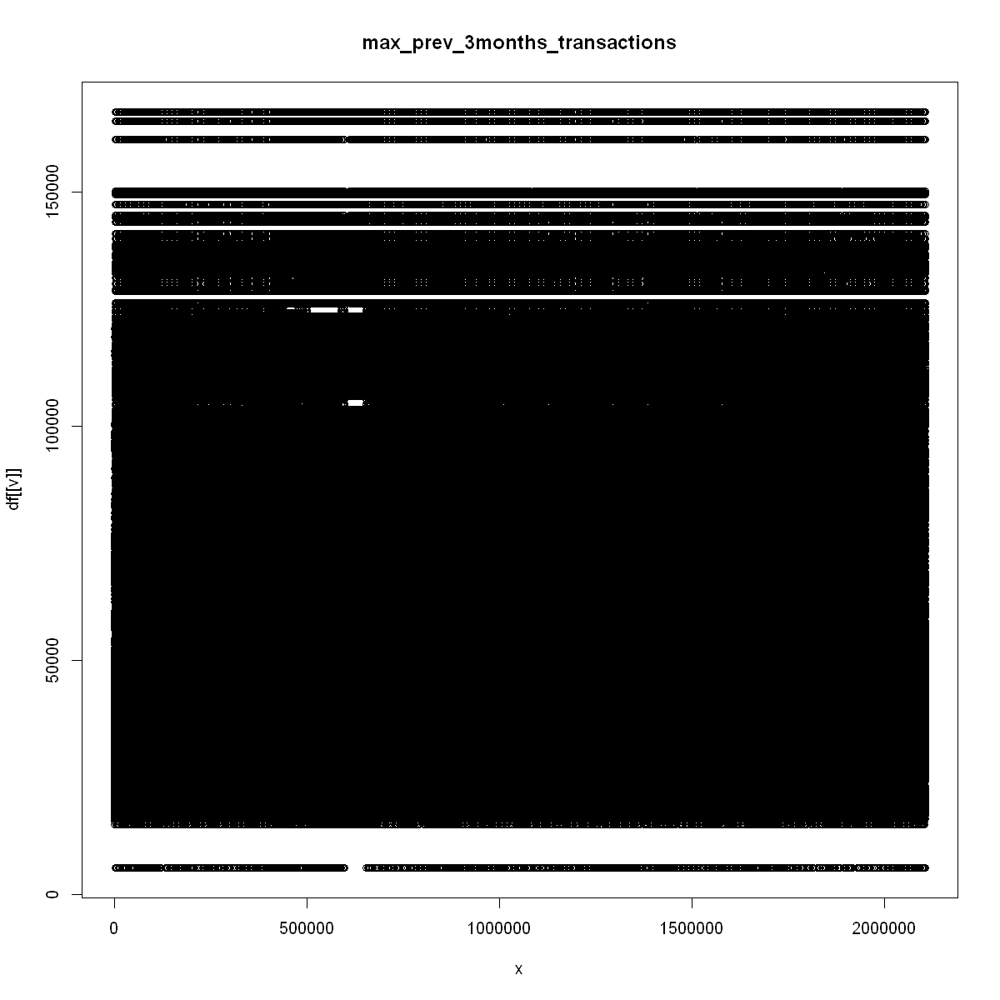

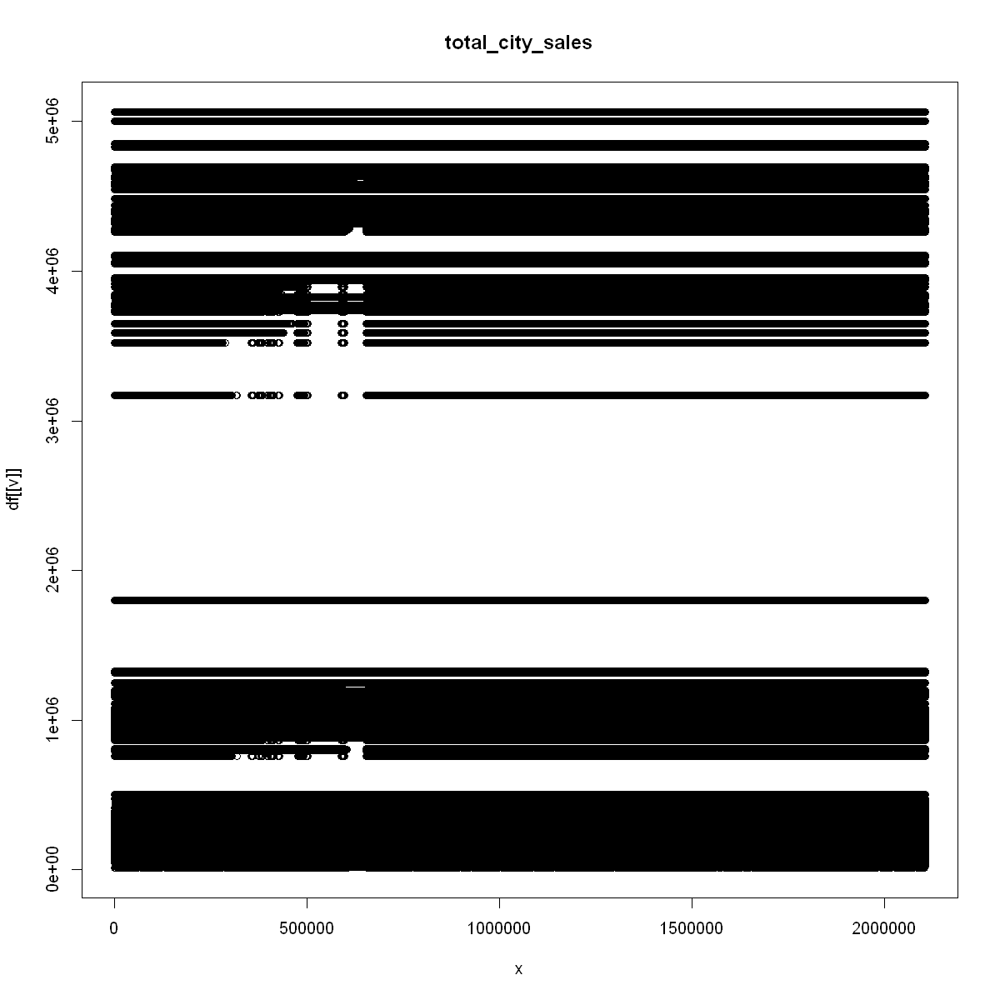

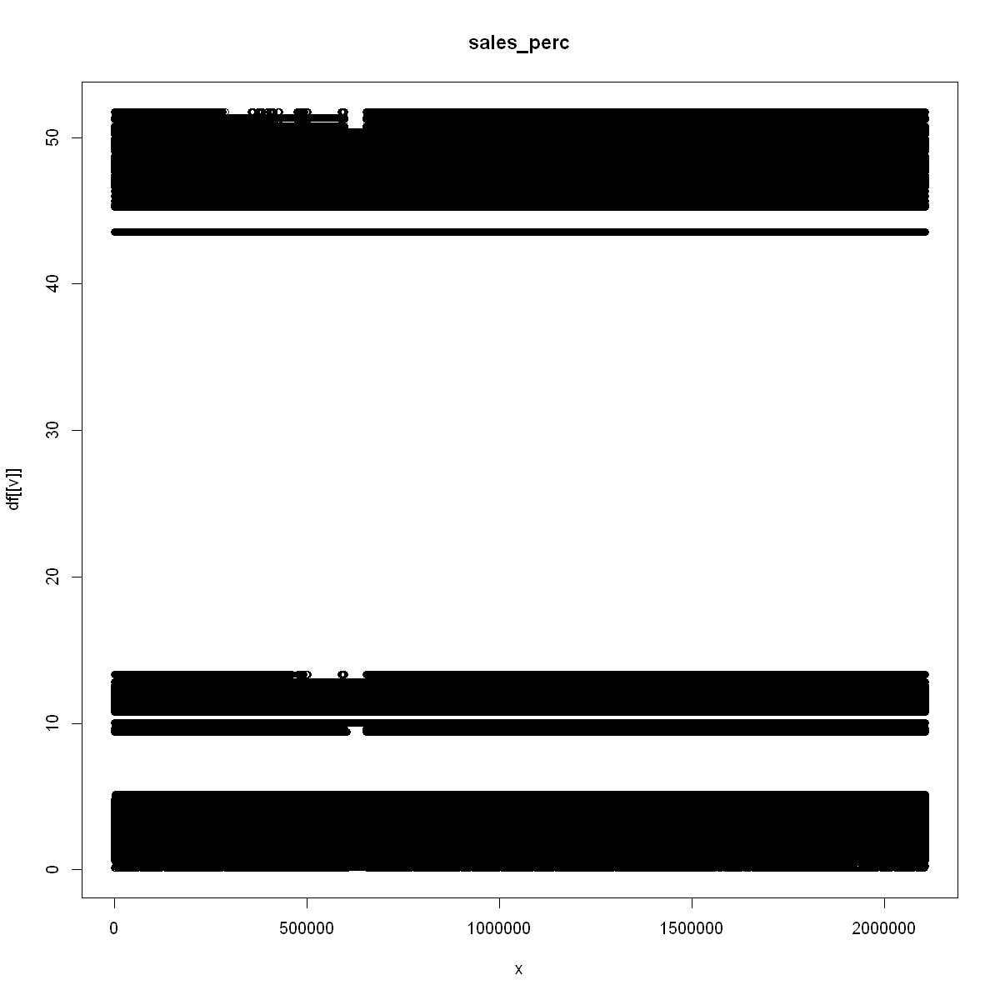

In [43]:
x <- 1:nrow(df)
for(v in nf) {
    plot(df[[v]] ~ x, main=v)
}

In [27]:
#question 2.6- description of the missing values
getMissingness(df)

[[1]]
                       var na.count rate
1        prev_3month_sales   132097  6.3
2 prev_3month_transactions   108852  5.2
3         prev_month_sales    44098  2.1
4  prev_month_transactions    35639  1.7

[[2]]
[1] "This dataset has 1975242 (93.7%) complete rows. Original data has 2107339 rows."



var,na.count,rate
<fct>,<dbl>,<dbl>
prev_3month_sales,132097,6.3
prev_3month_transactions,108852,5.2
prev_month_sales,44098,2.1
prev_month_transactions,35639,1.7


In [59]:
df <-na.omit(df)

In [60]:
df$id <- 1:nrow(df)

In [18]:
getMissingness(df)

[[1]]
[1] var      na.count rate    
<0 rows> (or 0-length row.names)

[[2]]
[1] "This dataset has 1975242 (100%) complete rows. Original data has 1975242 rows."



var,na.count,rate
<fct>,<dbl>,<dbl>


In [61]:
#question 2.7 matrix of missing values
df.miss <- missingMatrix(df)
df.miss 

item_nbr,store_nbr,Year,month,total_unit_sales,city,state,store_type,store_cluster,prev_month_sales,...,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17,id
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#heatmap of missing values
library(naniar)
options(repr.plot.width = 54, repr.plot.height = 27)
gg_miss_fct(x=df,fct=id) + 
theme(axis.text.x = element_text(angle=90, size=8))

Warning message:
"package 'naniar' was built under R version 3.6.2"


In [62]:
outlierMatrix <- function(data,threshold=1.5) {
    vn <- names(data)
    outdata <- data.frame(row1=1:nrow(data))
    for(v in vn) {
        if(is.numeric(data[[v]])) {
            med <- median(data[[v]],na.rm = TRUE)
            outlow <- quantile(data[[v]],probs = 0.25,na.rm = T) 
            outhigh <- quantile(data[[v]],probs = 0.75, na.rm = T)
            irq_level <- (outhigh - outlow) * threshold
            outlow <- outlow - irq_level
            outhigh <- outhigh +  irq_level
            mv <- ifelse(data[[v]] < outlow | data[[v]] > outhigh, 1, 0)
            outdata[paste(v,'out',sep='_')] <- mv
        } else {
            mv <- rep(0,nrow(data))
        }
    }
    outdata$row1 <- NULL
    return(outdata)
}

In [63]:
df.out <- outlierMatrix(df)

In [56]:
head(df.out)

,item_nbr_out,store_nbr_out,Year_out,month_out,total_unit_sales_out,prev_month_sales_out,prev_3month_sales_out,avg_prev_3months_sales_out,min_prev_3months_sales_out,max_prev_3months_sales_out,...,cluster9_out,cluster10_out,cluster11_out,cluster12_out,cluster13_out,cluster14_out,cluster15_out,cluster16_out,cluster17_out,id_out
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


3.1.1 - For the variables where outliers were found, check the distribution with/without outliers

Joining, by = c("total_unit_sales", "outliers")

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("prev_month_sales", "outliers")

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("prev_3month_sales", "outliers")



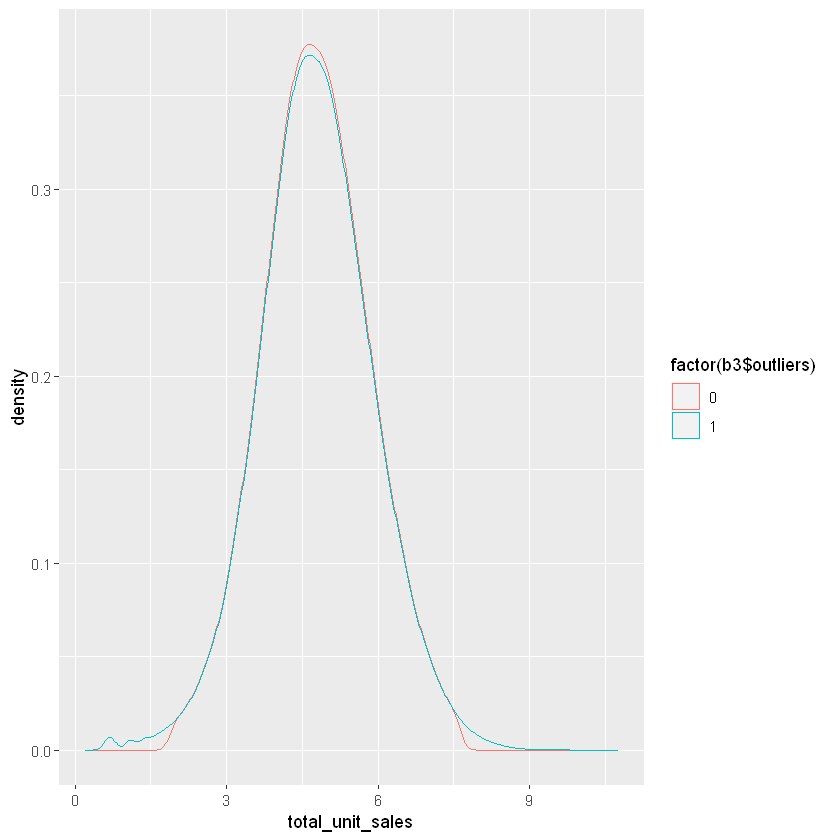

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("avg_prev_3months_sales", "outliers")



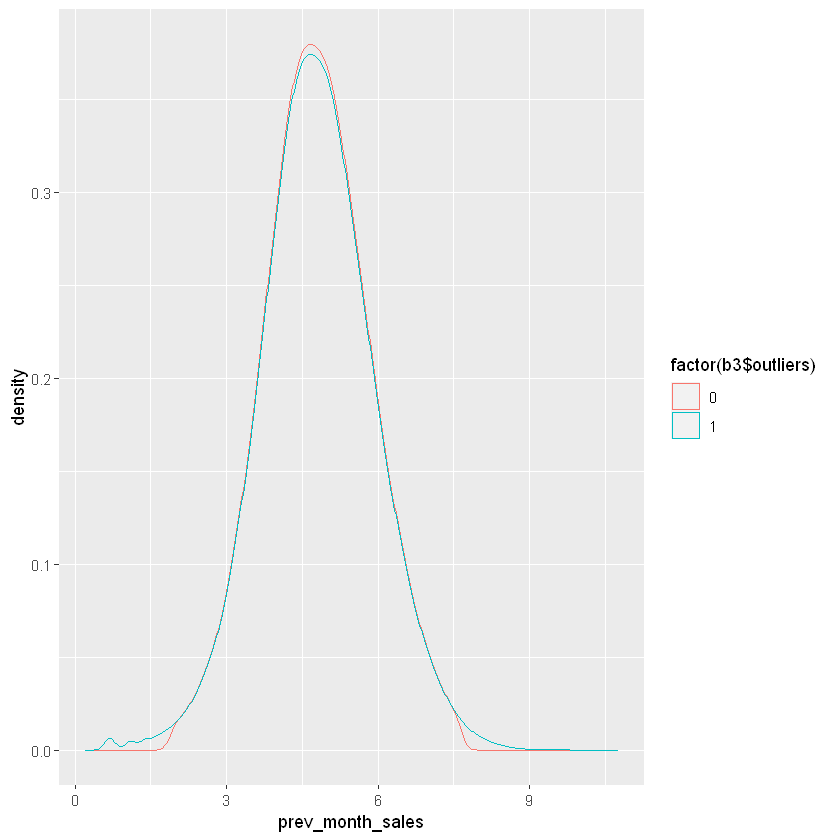

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("min_prev_3months_sales", "outliers")



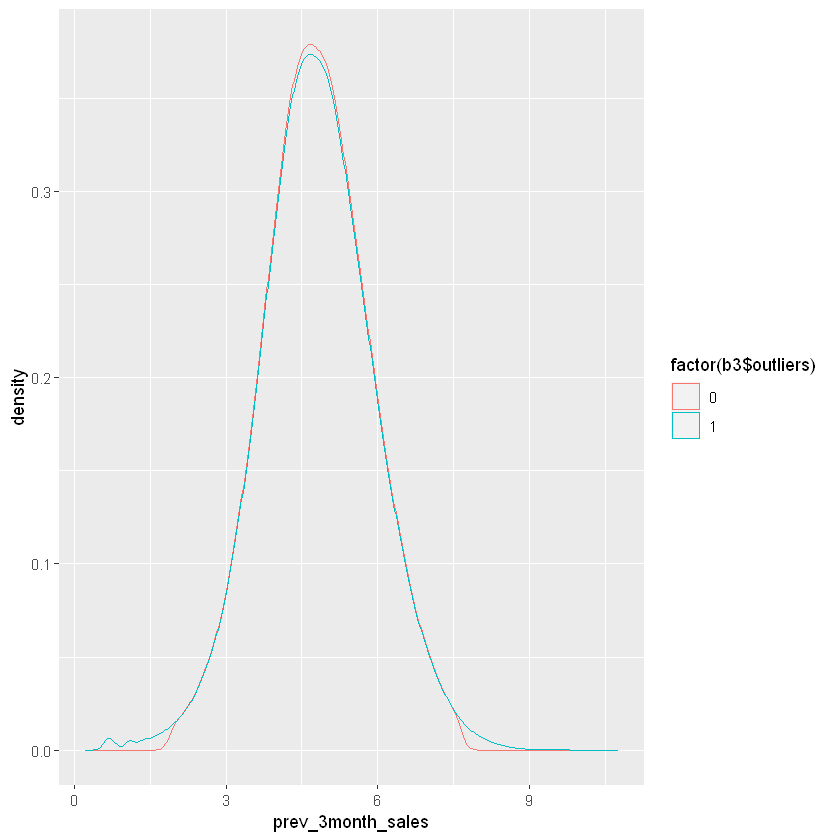

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("max_prev_3months_sales", "outliers")



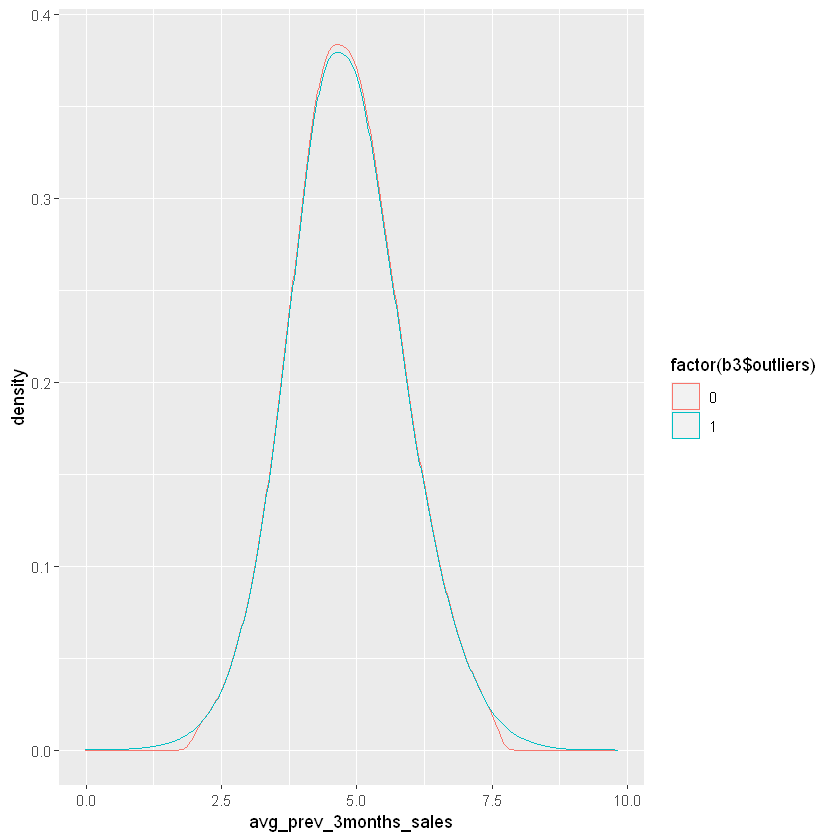

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("monthly_oilprice_avg", "outliers")



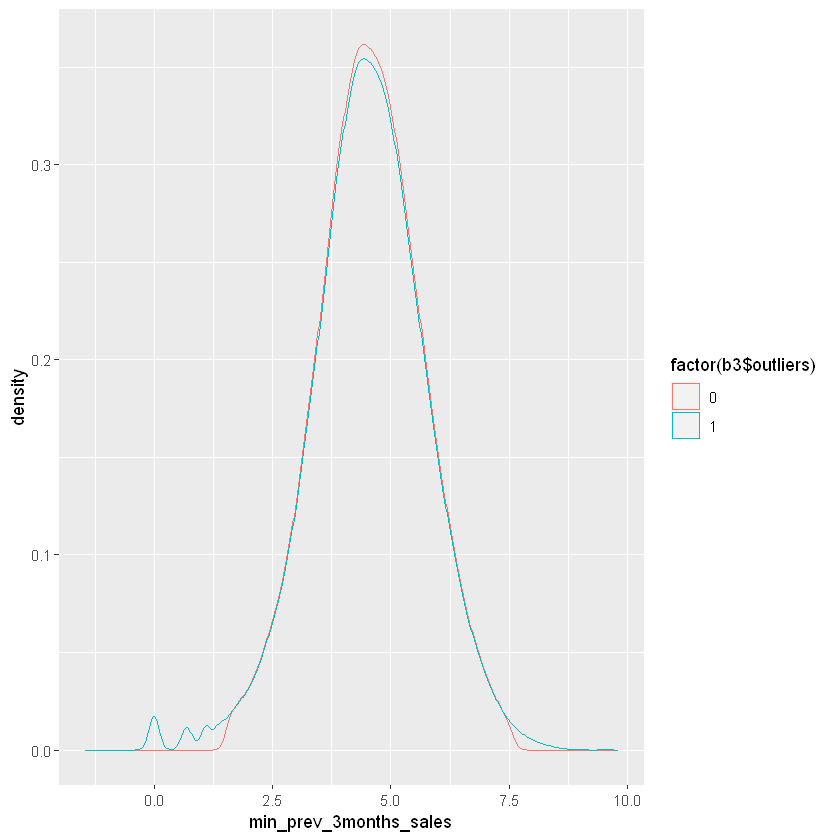

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("total_month_holidays", "outliers")



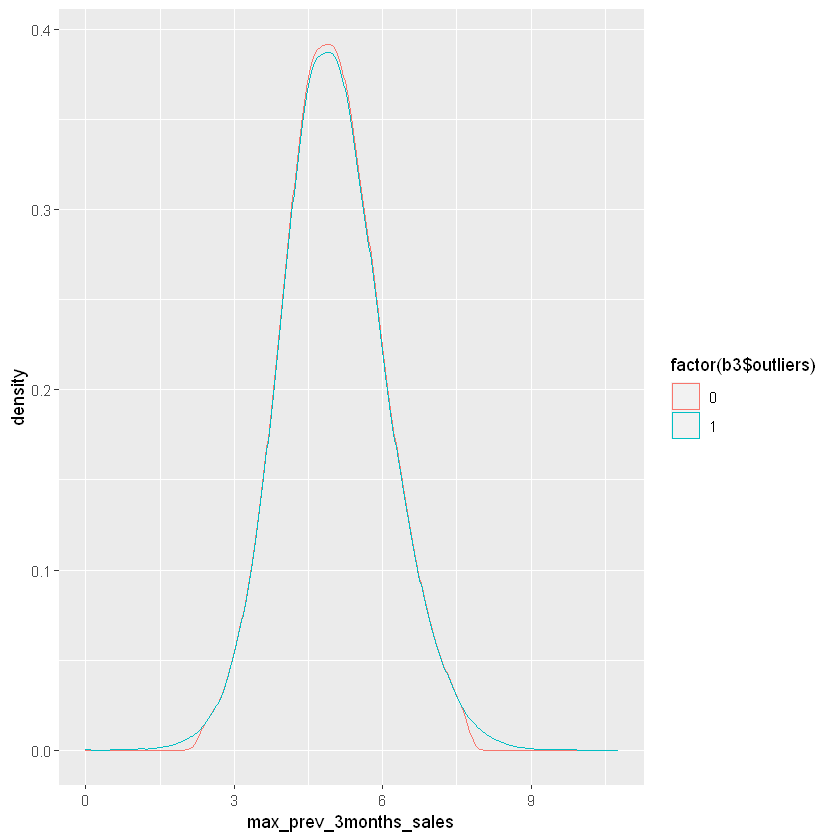

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("total_month_transactions", "outliers")



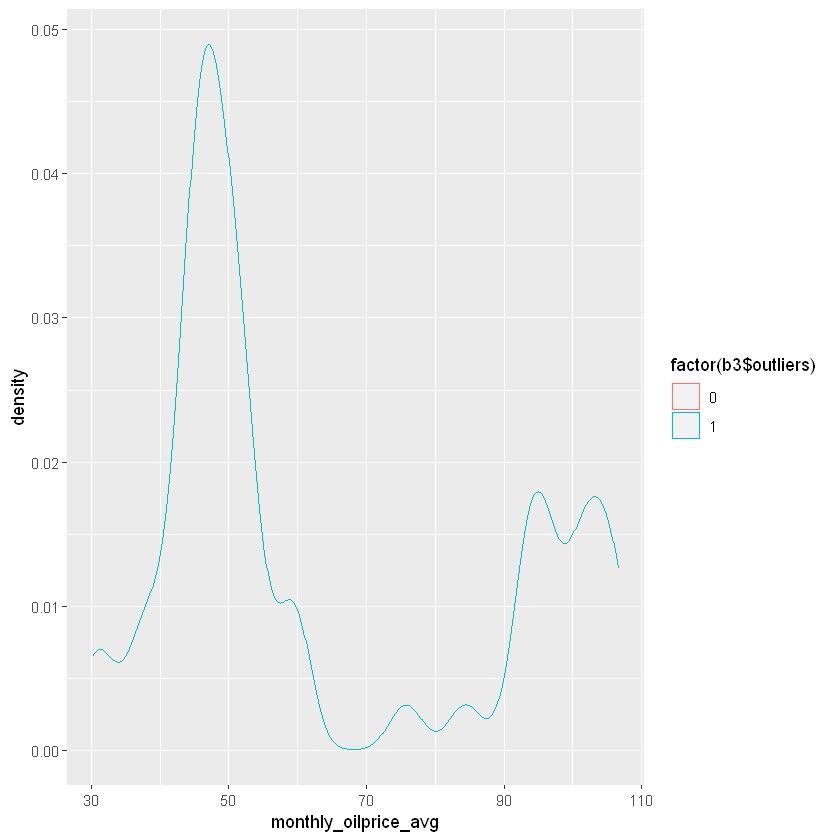

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("prev_month_transactions", "outliers")



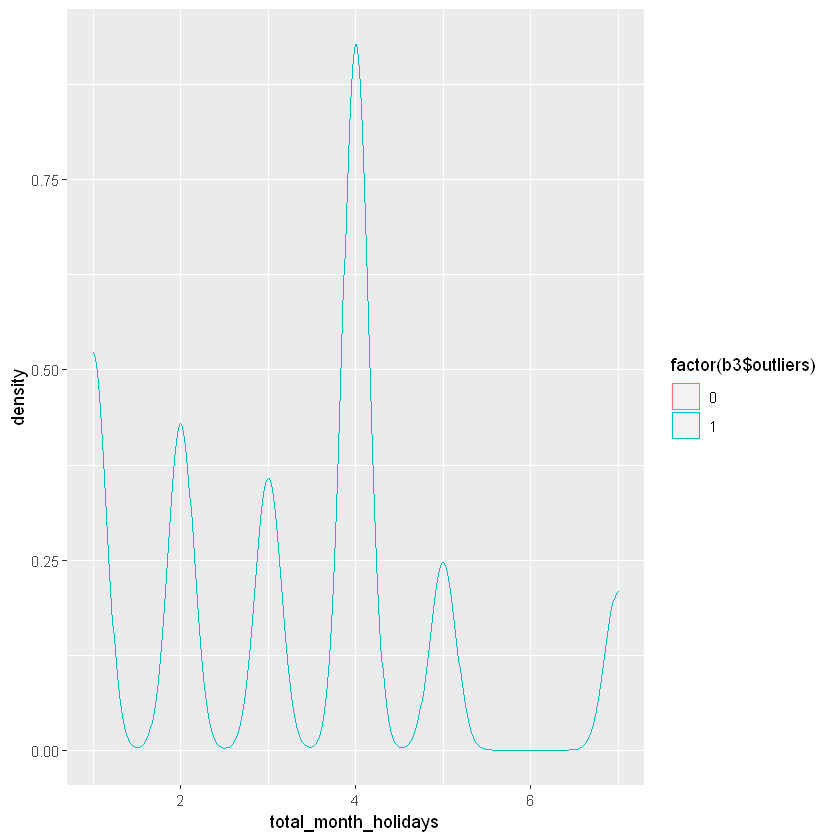

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("prev_3month_transactions", "outliers")



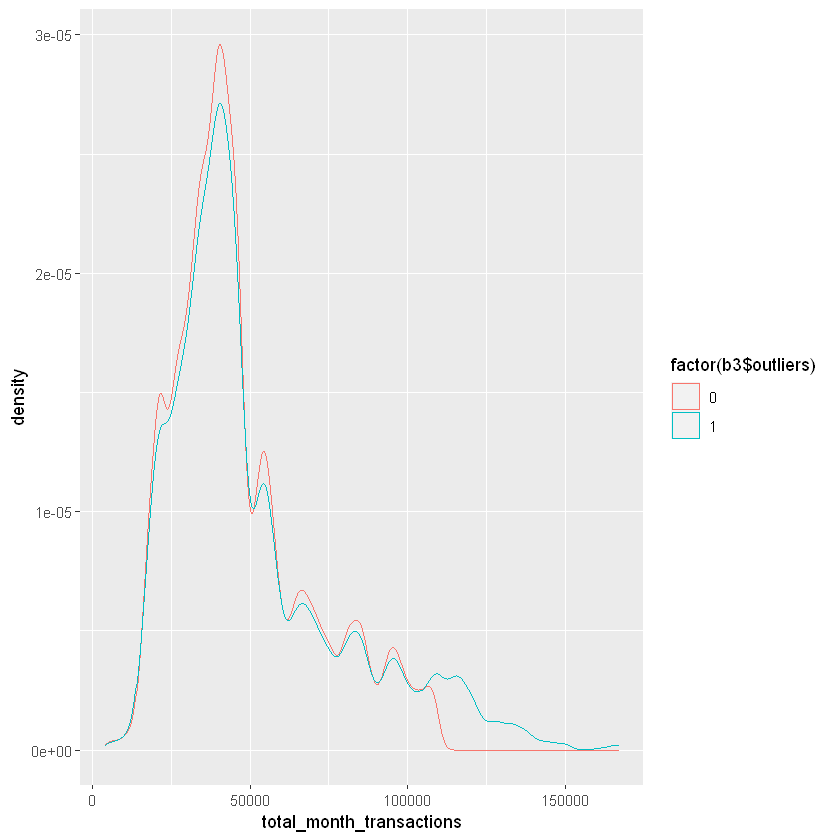

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("avg_prev_3months_transactions", "outliers")



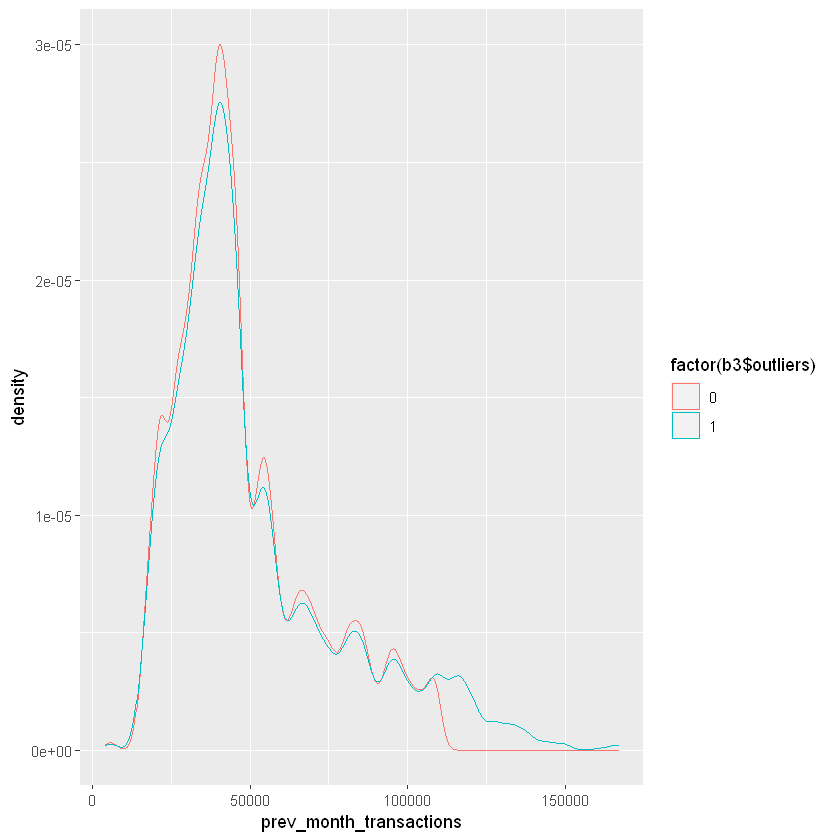

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("min_prev_3months_transactions", "outliers")



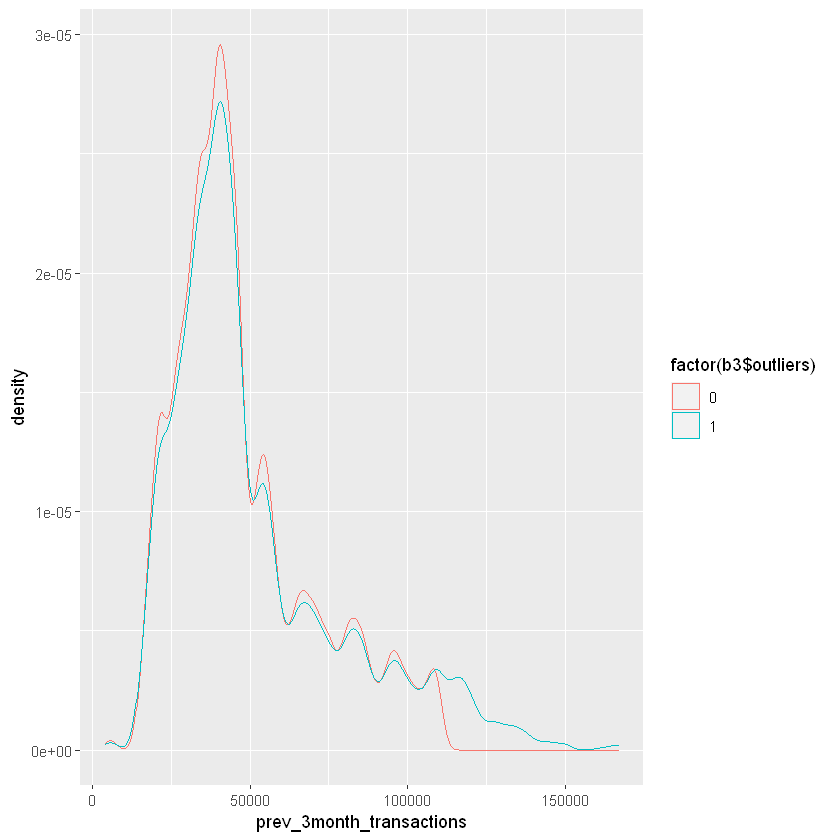

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("max_prev_3months_transactions", "outliers")



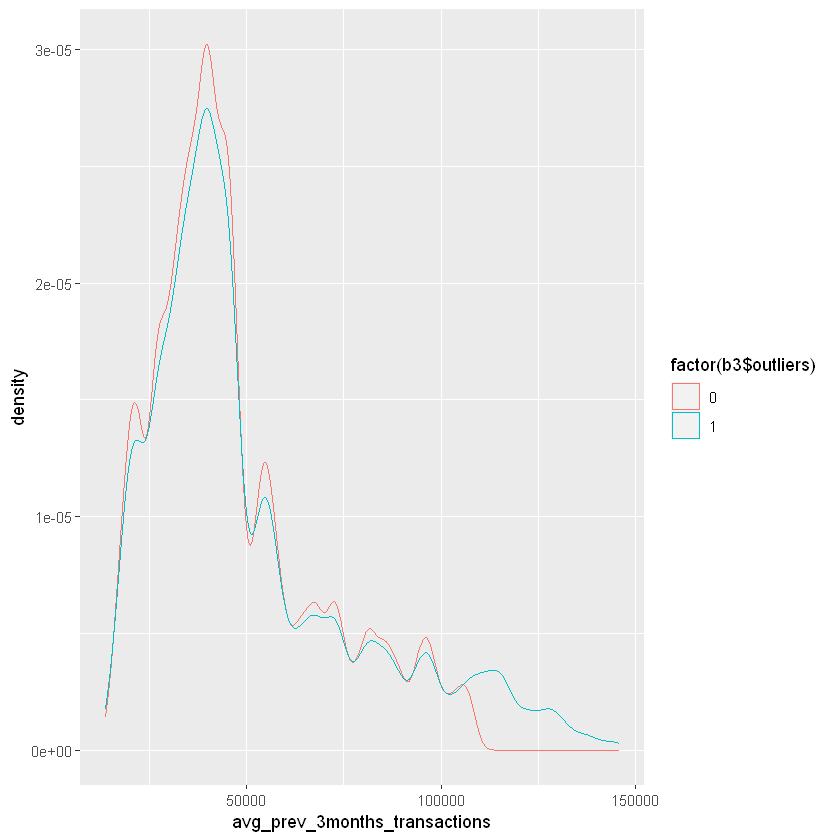

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("total_city_sales", "outliers")



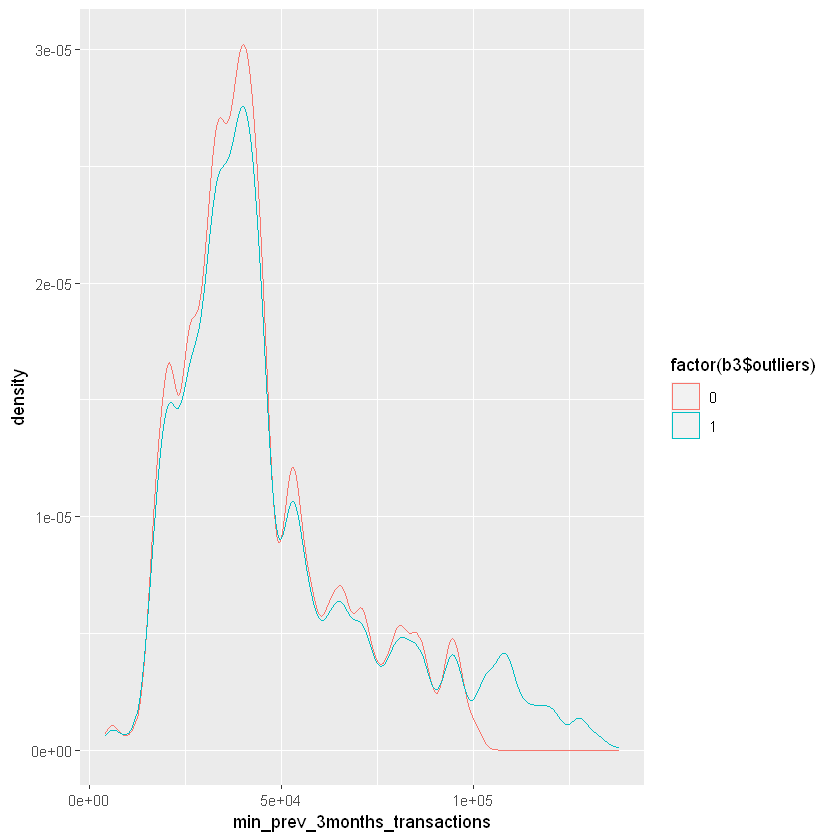

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Joining, by = c("sales_perc", "outliers")



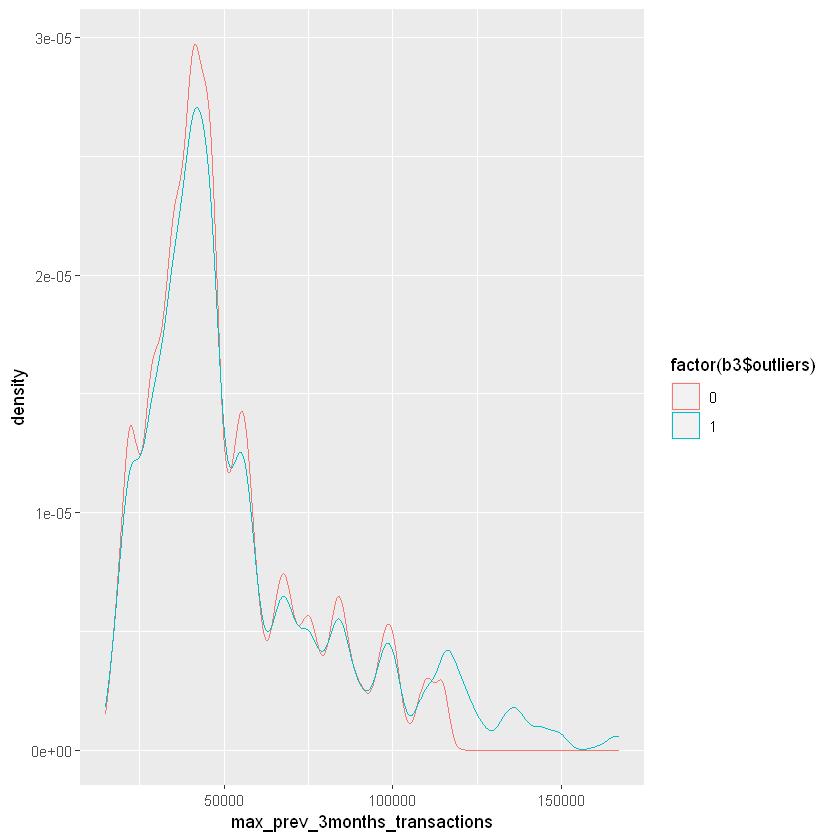

Warning message:
"Use of `b3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."
Warning message:
"Use of `b3$outliers` is discouraged. Use `outliers` instead."


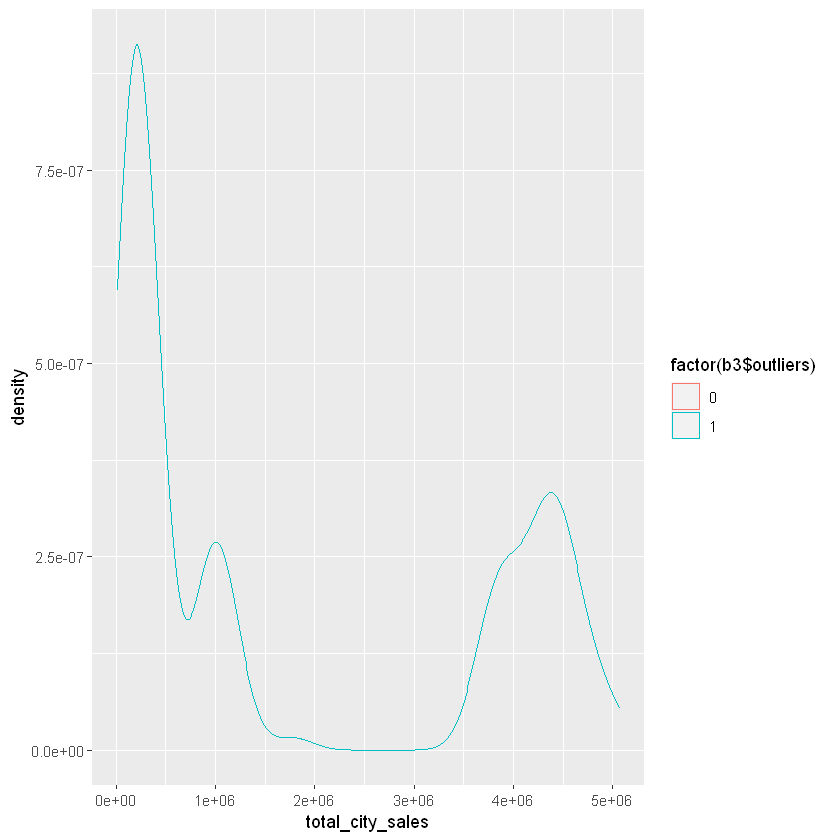

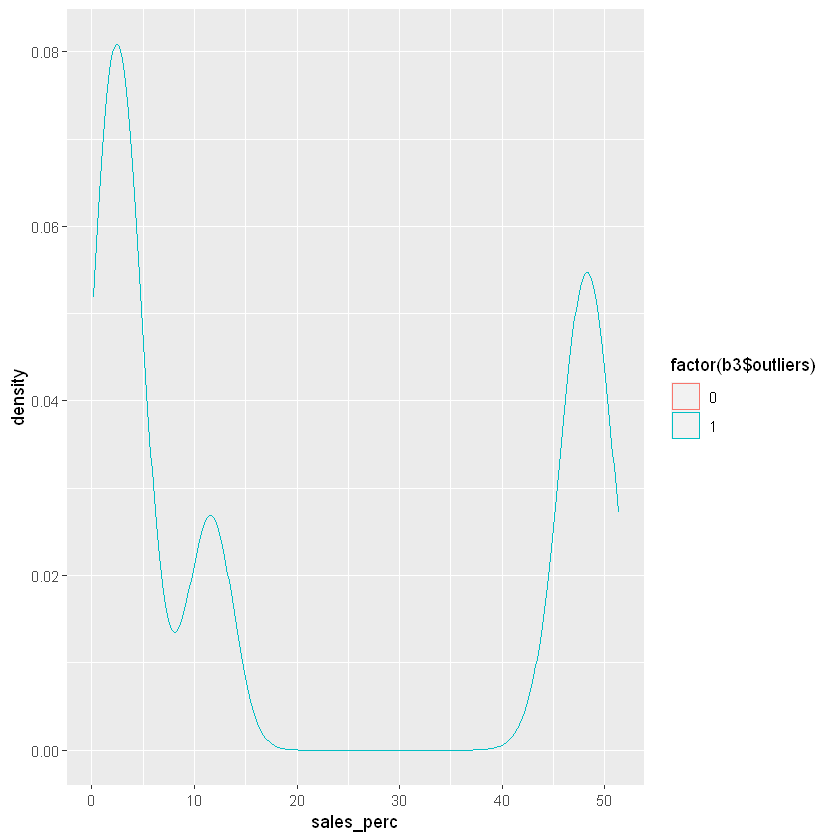

In [36]:
for (v in nf) {
    b1 <- df %>% select(v) 
    b1$outliers <- 1
    b2 <- df %>% select(v) %>% filter(df.out[[paste(v,'out',sep='_')]]==0)
    b2$outliers <- 0
    b3 <- full_join(b1,b2)
    print(ggplot(b3,aes(x=b3[[v]], group=factor(b3$outliers),
                          color=factor(b3$outliers))) + xlab(v) +
    geom_density(adjust=2))
}

removing the outliers doesnt affect the assumption at variables:
prev_month_sales, prev_3month_sales, avg_prev_3months_sales, min_prev_3months_sales, max_prev_3months_sales,
total_month_transactions, prev_month_transactions, prev_3month_transactions, avg_prev_3month_transactions, min_prev_3months_transactions, max_prev_3months_transactions

question 3.1.2 - scatter plots- yaxis is the outcome and x axis represents the other variables
with and without ouliers

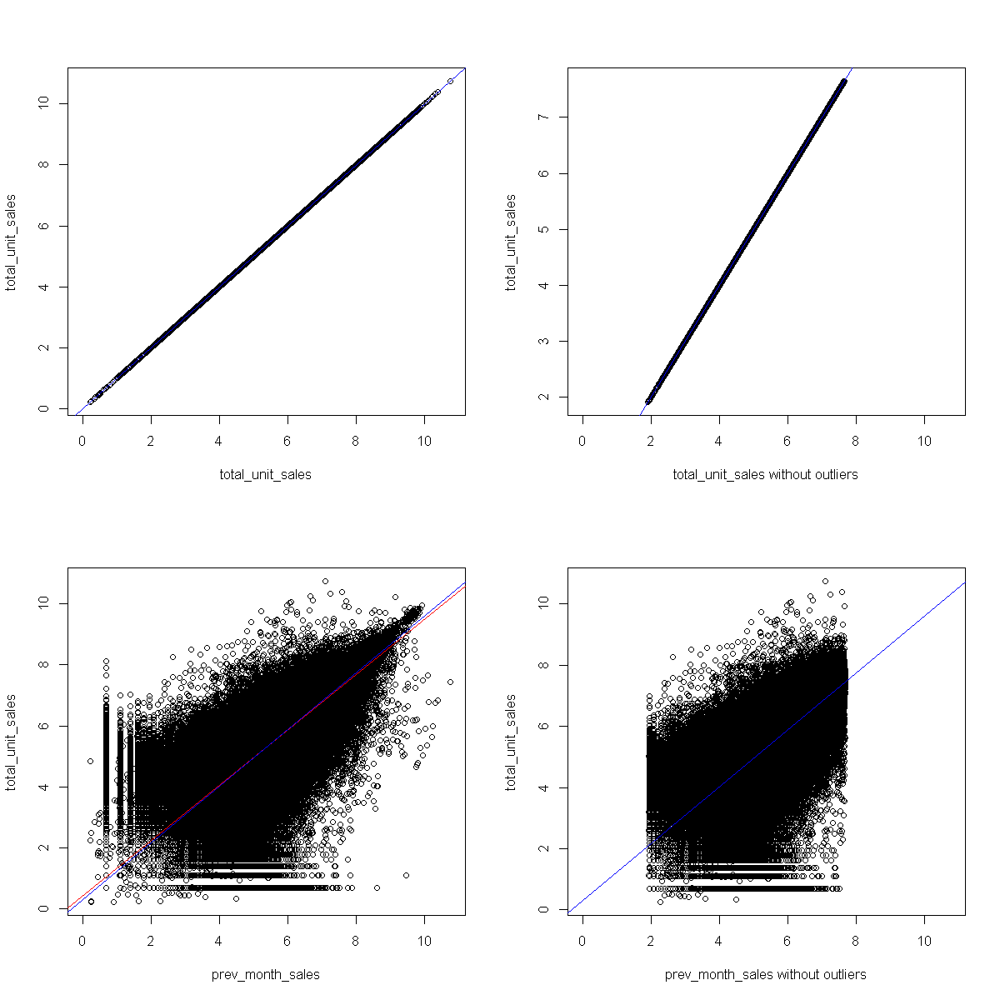

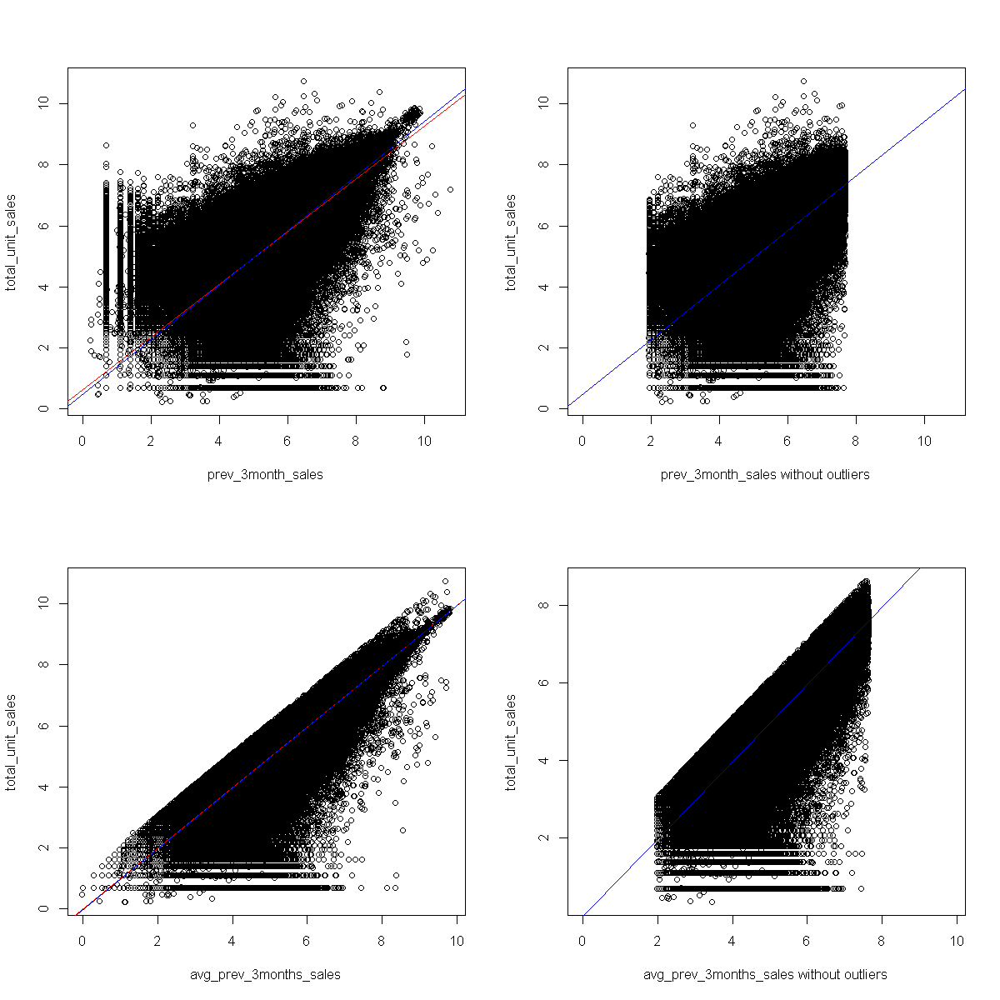

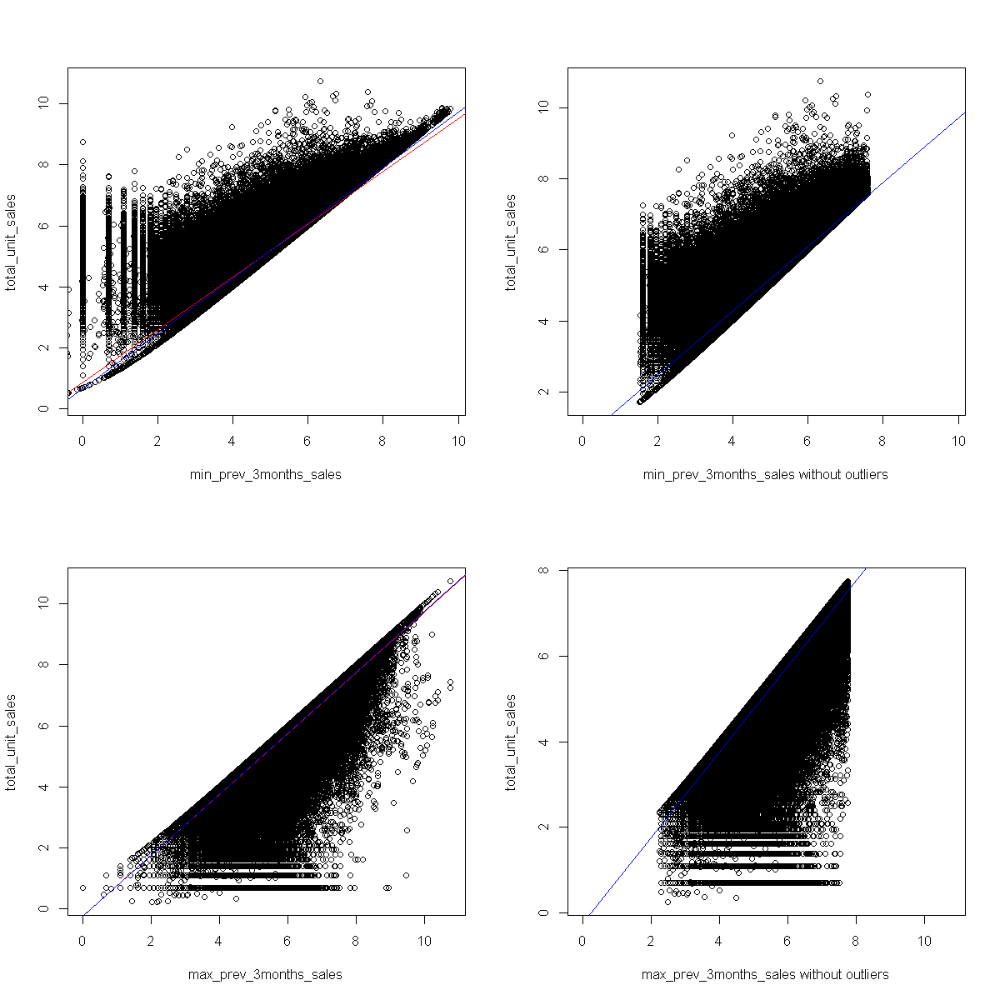

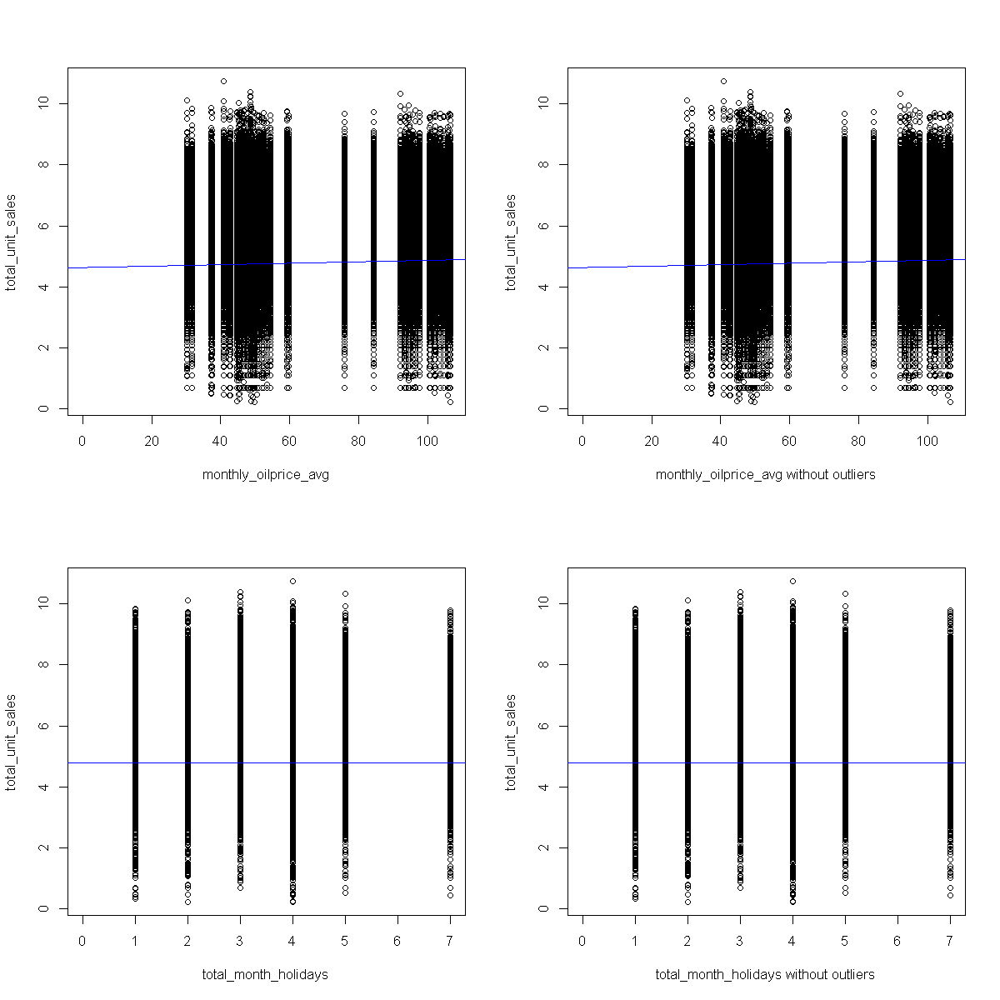

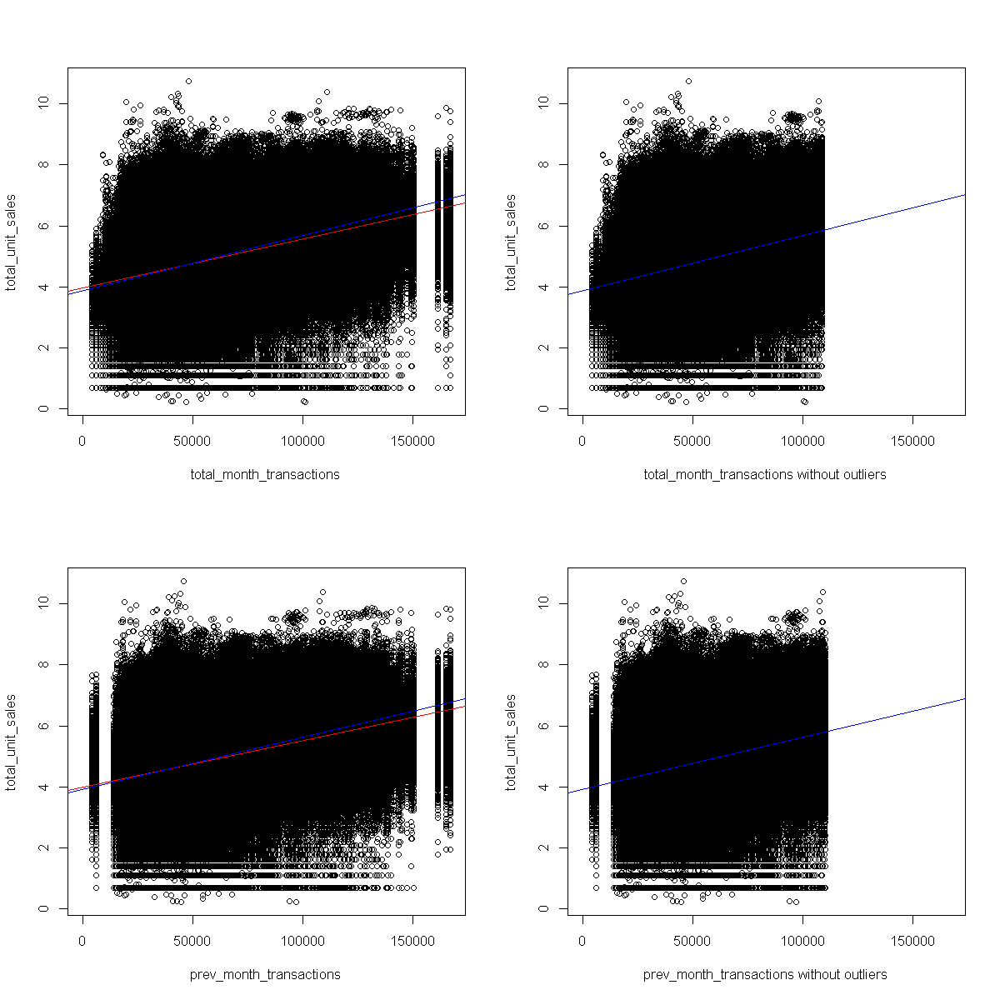

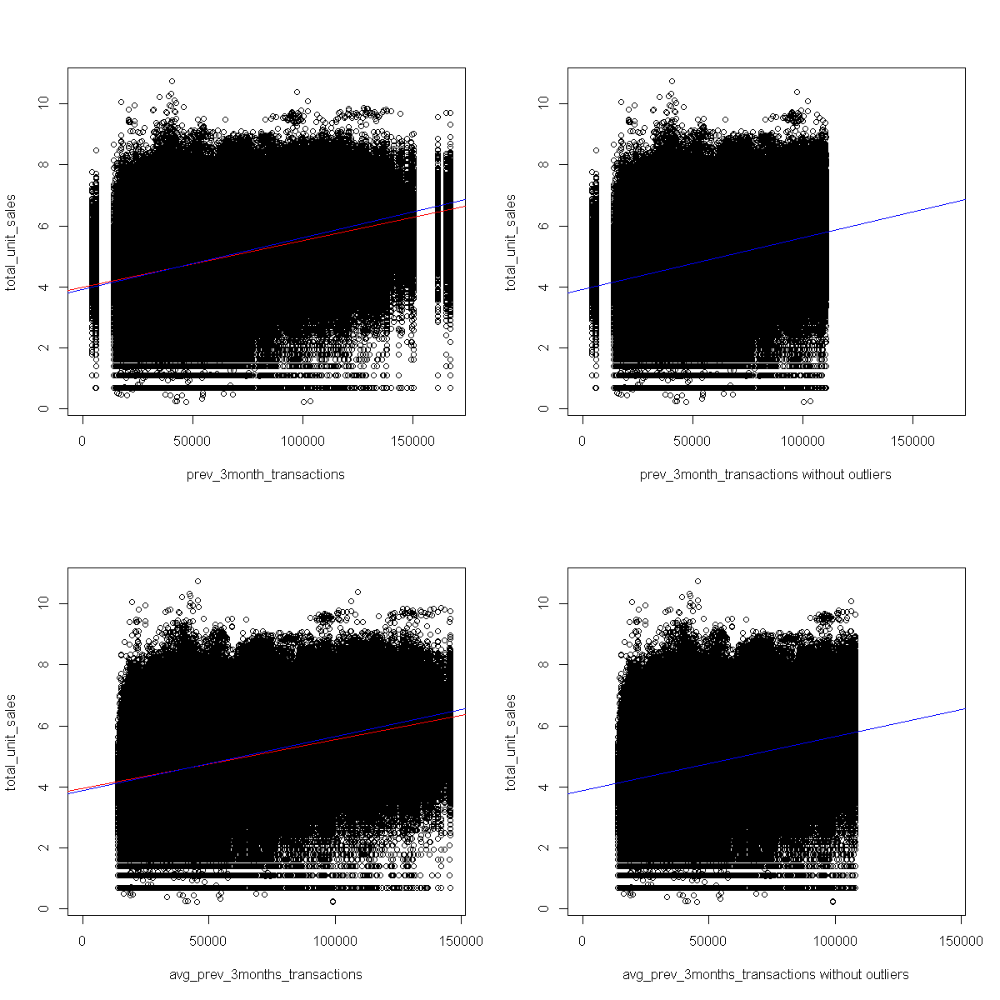

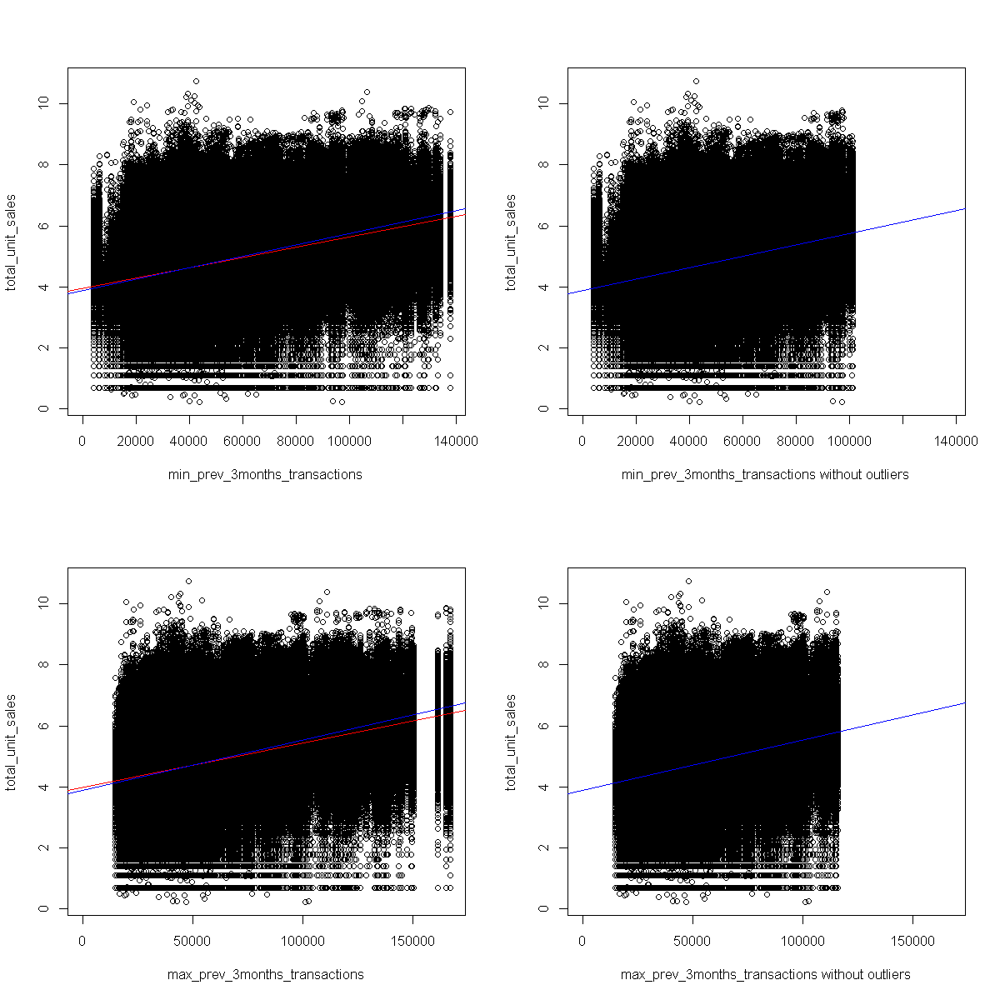

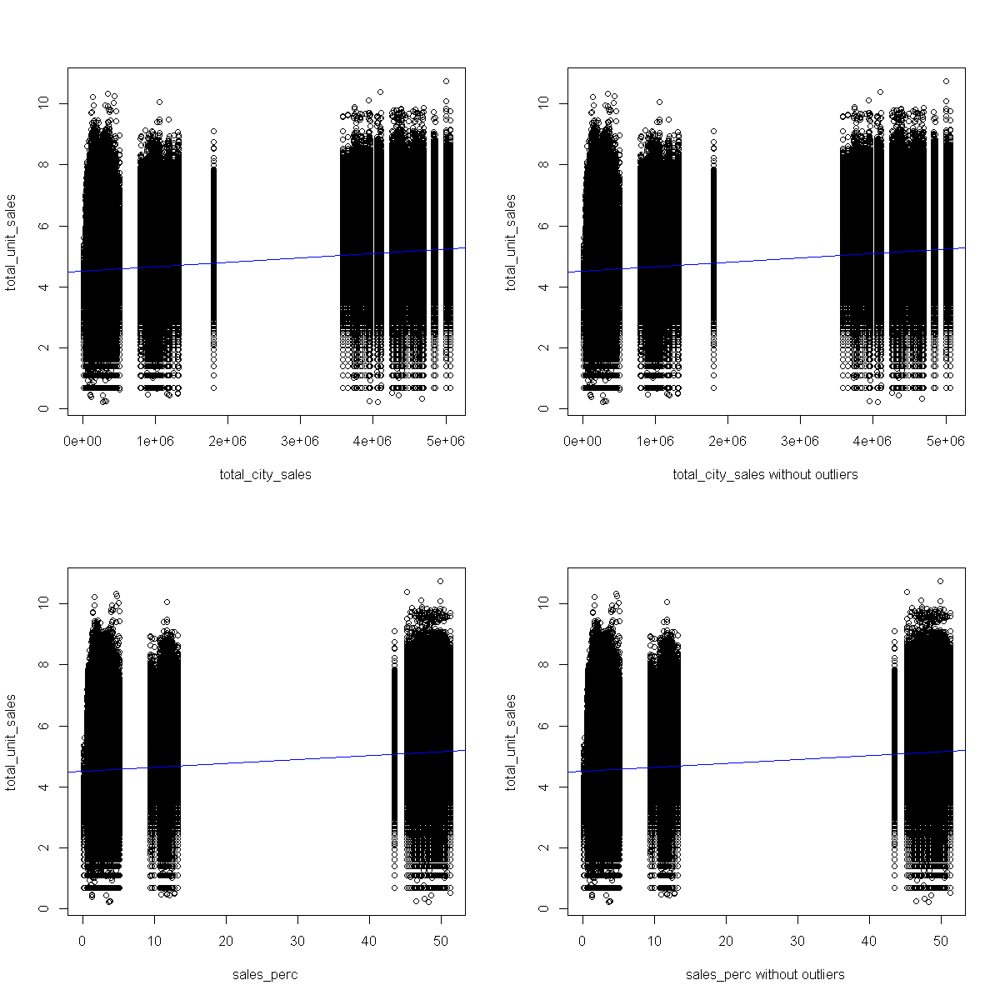

In [37]:
#3.1.2
options(repr.plot.width=10,repr.plot.height=10)
par(mfrow=c(2,2))
for (v in nf){
            a<-max(df[[v]],na.rm=TRUE)
            b1<- df %>% select(total_unit_sales,v)   
            b2<-df %>% select(total_unit_sales,v) %>% filter(df.out[[paste(v,'out',sep='_')]]==0) 
            plot(b1[[v]],b1$total_unit_sales,xlab=v,ylab='total_unit_sales',xlim=c(0,a))
            abline(coef(lm(b1$total_unit_sales~b1[[v]])), col="red")
            if (length(unique(b2[[v]]))!=1){
            abline(coef(lm(b2$total_unit_sales~b2[[v]])), col="blue")}
            plot(b2[[v]],b2$total_unit_sales,xlab=paste(v,'without outliers',sep=' '),ylab='total_unit_sales',xlim=c(0,a))
            if (length(unique(b2[[v]]))!=1){
            abline(coef(lm(b2$total_unit_sales~b2[[v]])), col="blue")}
            
}

prev_month_sales, prev_3month_sales, avg_prev_3months_sales, min_prev_3months_sales, max_prev_3months_sales,
total_month_transactions, prev_month_transactions, prev_3month_transactions, avg_prev_3month_transactions, min_prev_3months_transactions, max_prev_3months_transactions

removing the outliers from the data doesnt affect the regression model at features:
* prev_month_sales, prev_3month_sales, min_prev_3months_sales, max_prev_3months_sales

In [64]:
# i decided to treat these features by convering the outliers to NA values because at some of them 
# reomoving the outliers affects only the result and at some of them removing the outliers affect ony the model
l1<- c('prev_month_sales', 'prev_3month_sales', 'avg_prev_3months_sales', 'min_prev_3months_sales', 'max_prev_3months_sales',
'total_month_transactions', 'prev_month_transactions', 'prev_3month_transactions', 'avg_prev_3months_transactions',
       'min_prev_3months_transactions', 'max_prev_3months_transactions')

In [37]:
outliers_treat = read.csv("../project/outliers_treatment_project.csv")

In [38]:
outliers_treat

Feature_name,Scale,outliers.Treatment,why
<fct>,<fct>,<fct>,<fct>
prev_month_sales,ratio,drop,doesn't affect both assumptions and results
prev_3month_sales,ratio,drop,doesn't affect both assumptions and results
avg_prev_3months_sales,ratio,drop,doesn't affect both assumptions and results
min_prev_3months_sales,ratio,drop,doesn't affect both assumptions and results
max_prev_3months_sales,ratio,drop,doesn't affect both assumptions and results
total_month_transactions,ratio,drop,doesn't affect both assumptions and results
prev_month_transactions,ratio,drop,doesn't affect both assumptions and results
prev_3month_transactions,ratio,drop,doesn't affect both assumptions and results
avg_prev_3month_transactions,ratio,drop,doesn't affect both assumptions and results


In [65]:
## function which takes a dataframe and a vector of names and transforms outliers to NA
## at the features which are in the vector
outlierRepNAMatrix <- function(data,vec,threshold=1.5) {
    vn <- names(data)
    outdata <- data.frame(row1=1:nrow(data))
    for(v in vn) {
        if(is.numeric(data[[v]]) & (v %in% vec)) {
            med <- median(data[[v]],na.rm = TRUE)
            outlow <- quantile(data[[v]],probs = 0.25,na.rm = T) 
            outhigh <- quantile(data[[v]],probs = 0.75, na.rm = T)
            irq_level <- (outhigh - outlow) * threshold
            outlow <- outlow - irq_level
            outhigh <- outhigh +  irq_level
            mv <- ifelse(data[[v]] < outlow | data[[v]]  > outhigh & v!='revenue',NA,data[[v]])
            outdata[v] <- mv
        } else {
            outdata[v] <- data[[v]]
        }
    }
    return(outdata)
}



3.1.3 - removing the outliers from the data

In [66]:
df.noout <- outlierRepNAMatrix(df,l1) 

In [67]:
df.noout <- df.noout[,! names(df.noout) %in% c('row1')]

In [68]:
summary(df.noout)

   item_nbr          store_nbr              Year          month       
 Length:1975242     Length:1975242     Min.   :2013   Min.   : 1.000  
 Class :character   Class :character   1st Qu.:2014   1st Qu.: 4.000  
 Mode  :character   Mode  :character   Median :2015   Median : 6.000  
                                       Mean   :2015   Mean   : 6.524  
                                       3rd Qu.:2016   3rd Qu.: 9.000  
                                       Max.   :2017   Max.   :12.000  
                                                                      
 total_unit_sales      city              state            store_type       
 Min.   : 0.2119   Length:1975242     Length:1975242     Length:1975242    
 1st Qu.: 4.0604   Class :character   Class :character   Class :character  
 Median : 4.7622   Mode  :character   Mode  :character   Mode  :character  
 Mean   : 4.7757                                                           
 3rd Qu.: 5.4972                                    

In [69]:
df.miss1<- missingMatrix(df.noout)

In [25]:
getMissingness(df.noout)

[[1]]
                             var na.count rate
1  min_prev_3months_transactions   141897  7.2
2  avg_prev_3months_transactions   127777  6.5
3  max_prev_3months_transactions   125940  6.4
4       total_month_transactions   122904  6.2
5        prev_month_transactions   116236  5.9
6       prev_3month_transactions   109840  5.6
7         min_prev_3months_sales    39678  2.0
8              prev_3month_sales    27824  1.4
9               prev_month_sales    27776  1.4
10        max_prev_3months_sales    22365  1.1

[[2]]
[1] "This dataset has 1734047 (87.8%) complete rows. Original data has 1975242 rows."



var,na.count,rate
<fct>,<dbl>,<dbl>
min_prev_3months_transactions,141897,7.2
avg_prev_3months_transactions,127777,6.5
max_prev_3months_transactions,125940,6.4
total_month_transactions,122904,6.2
prev_month_transactions,116236,5.9
prev_3month_transactions,109840,5.6
min_prev_3months_sales,39678,2.0
prev_3month_sales,27824,1.4
prev_month_sales,27776,1.4


In [26]:
mm <- getMissingness(df.noout, getRows=TRUE)

[[1]]
                             var na.count rate
1  min_prev_3months_transactions   141897  7.2
2  avg_prev_3months_transactions   127777  6.5
3  max_prev_3months_transactions   125940  6.4
4       total_month_transactions   122904  6.2
5        prev_month_transactions   116236  5.9
6       prev_3month_transactions   109840  5.6
7         min_prev_3months_sales    39678  2.0
8              prev_3month_sales    27824  1.4
9               prev_month_sales    27776  1.4
10        max_prev_3months_sales    22365  1.1

[[2]]
[1] "This dataset has 1734047 (87.8%) complete rows. Original data has 1975242 rows."



In [27]:
df.out1 <- df.noout[-mm$rows,as.character(mm$missingness$var)] 

In [28]:
dim(df.out1)

[1] 241195     11

3.2.1 - Show the distribution of each numeric variable by missingness of other variables

Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."



	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 35.924, df = 15745, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.5136133 0.5728971
sample estimates:
mean of x mean of y 
 4.807735  4.264480 

[1] "prev_3month_sales by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


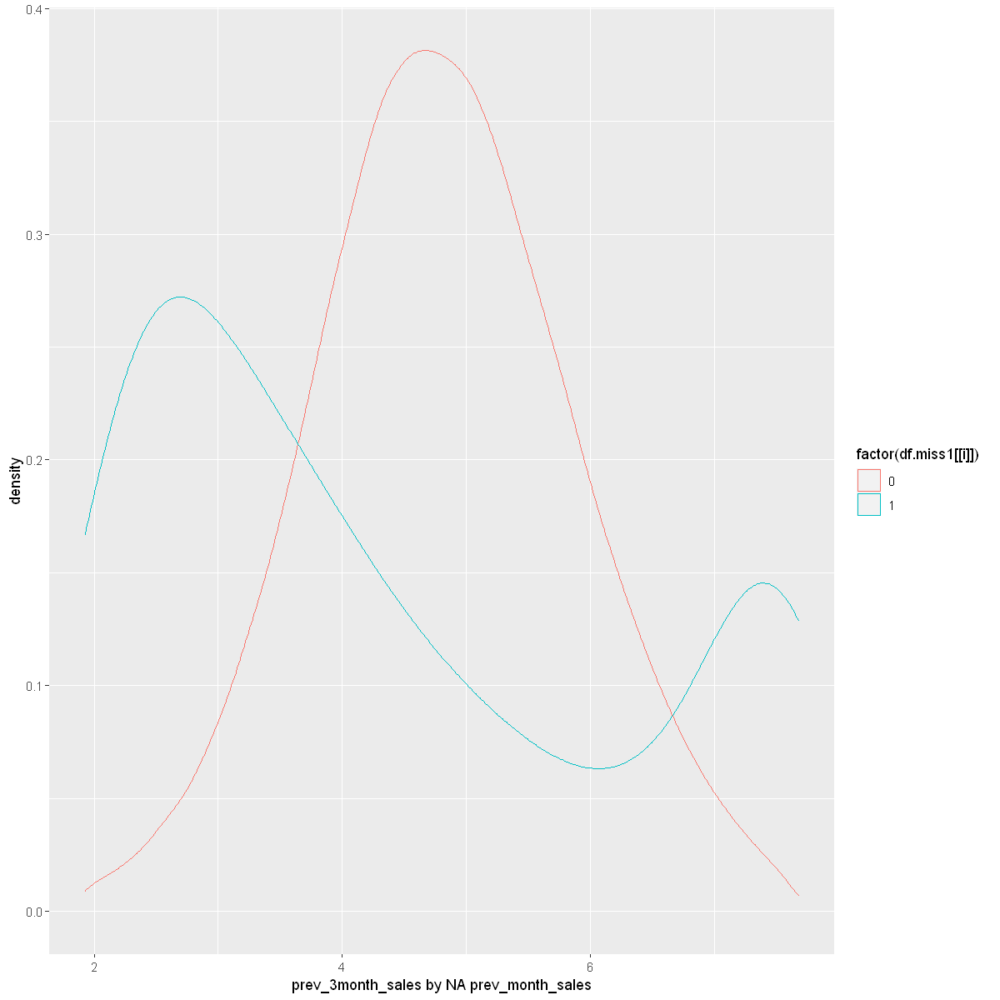


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 78.033, df = 11762, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 1.177612 1.238299
sample estimates:
mean of x mean of y 
 4.823901  3.615946 

[1] "avg_prev_3months_sales by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


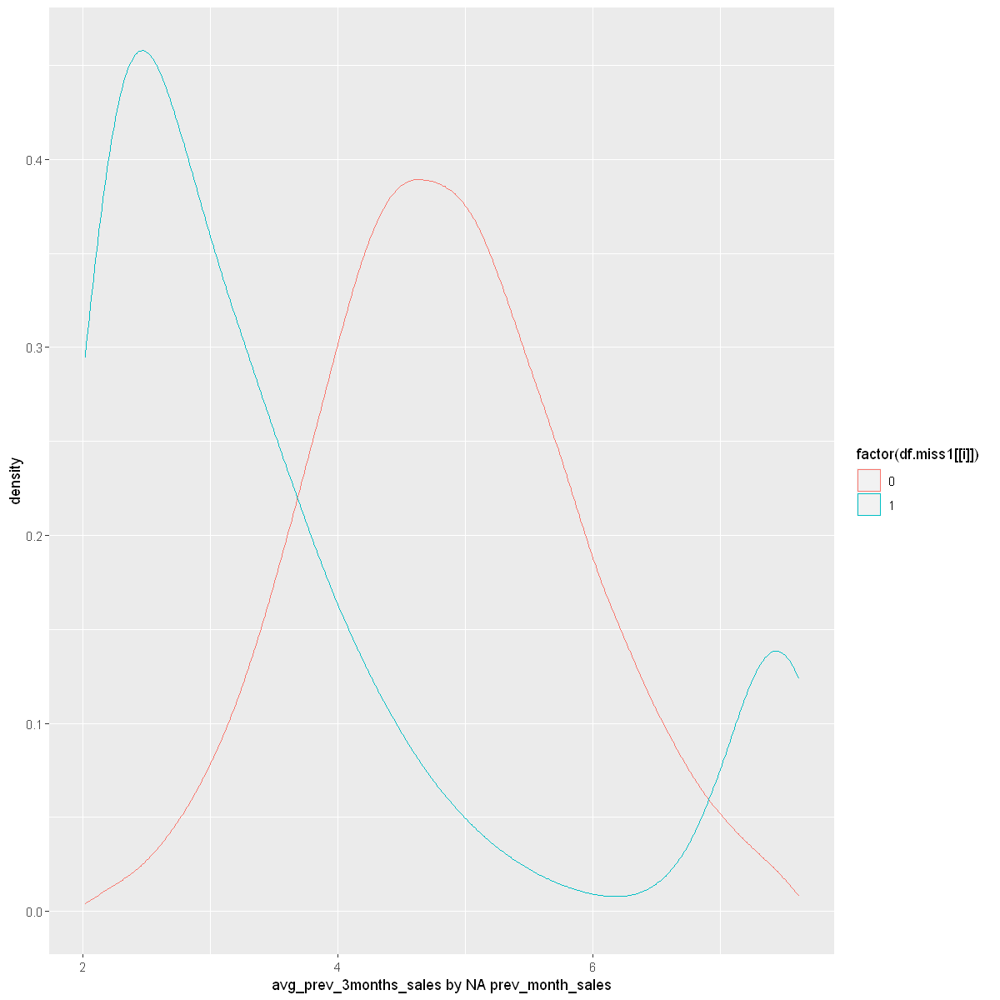


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 26.61, df = 8051.7, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.7169153 0.8309420
sample estimates:
mean of x mean of y 
 4.569184  3.795255 

[1] "min_prev_3months_sales by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


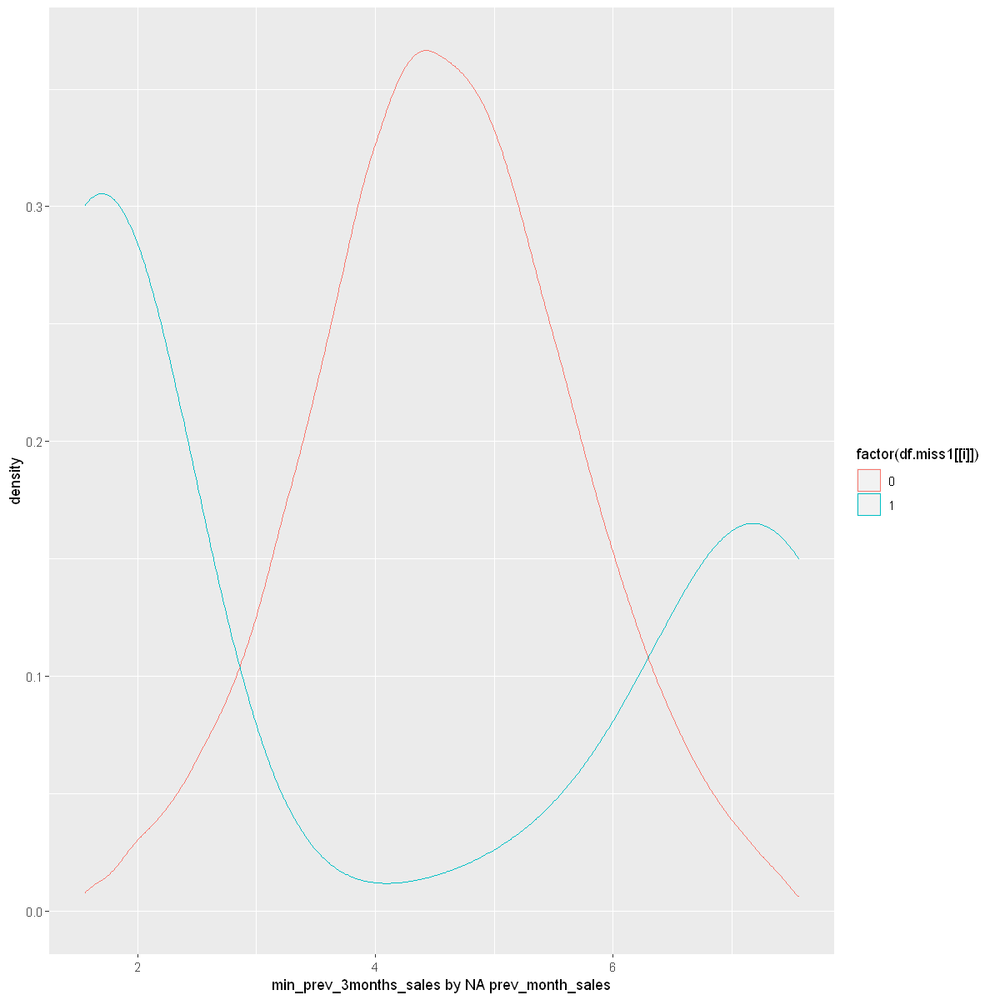


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 76.667, df = 12596, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 1.038419 1.092910
sample estimates:
mean of x mean of y 
 5.015719  3.950054 

[1] "max_prev_3months_sales by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


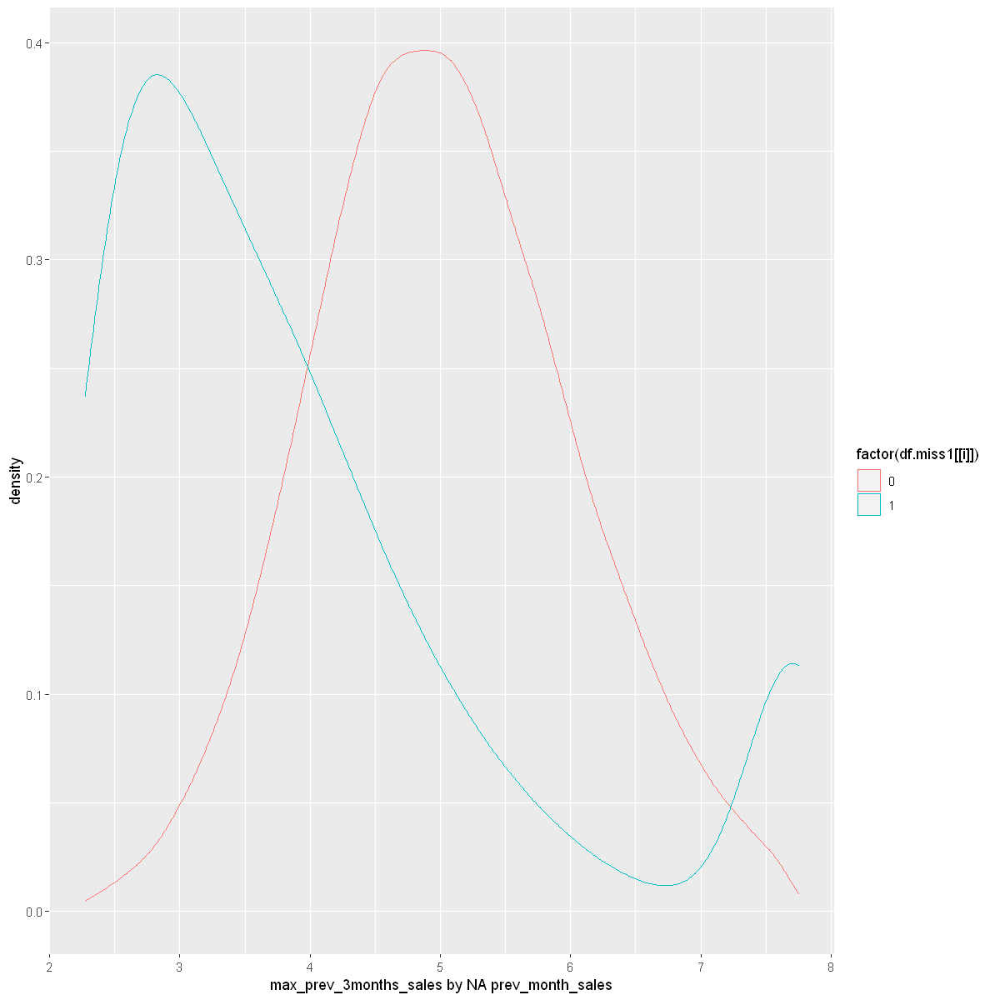


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3.7379, df = 24469, p-value = 0.000186
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -964.5136 -300.9454
sample estimates:
mean of x mean of y 
 46570.53  47203.26 

[1] "total_month_transactions by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


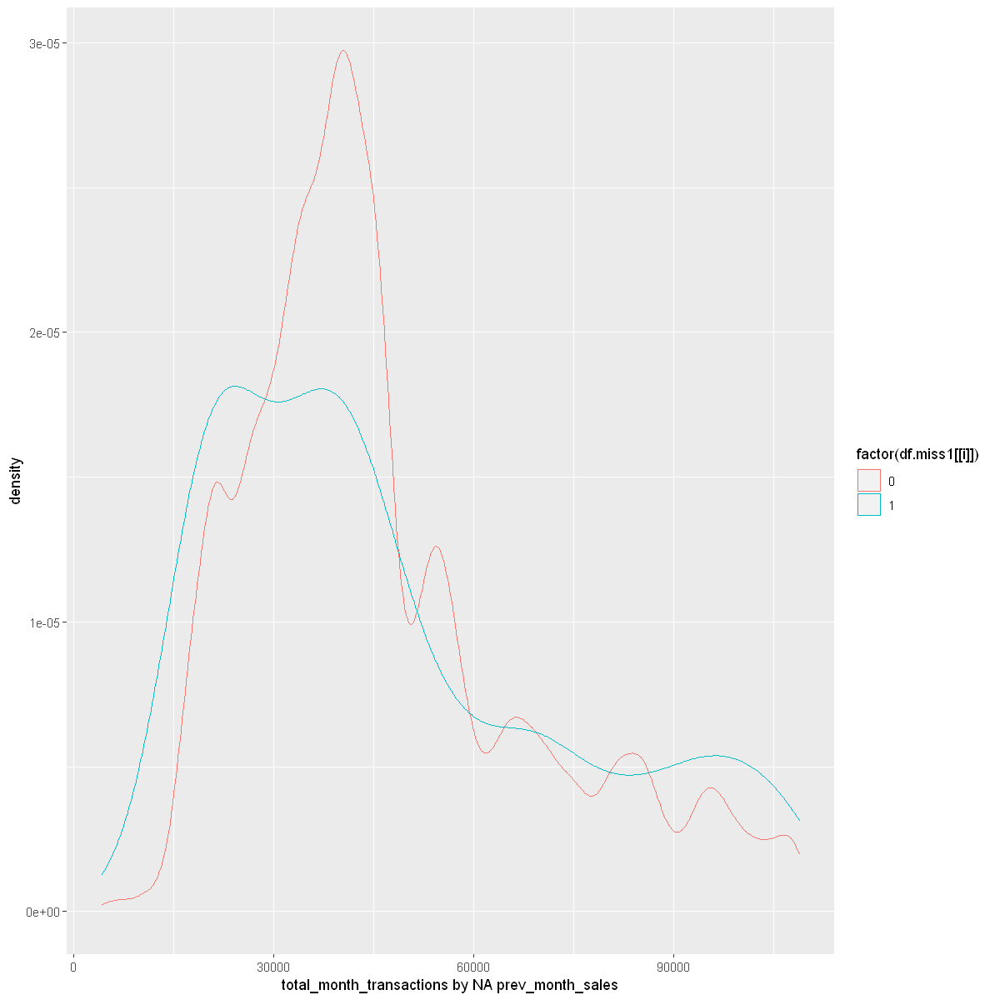


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1.7645, df = 24533, p-value = 0.07766
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -652.05554   34.24116
sample estimates:
mean of x mean of y 
 47318.50  47627.41 

[1] "prev_month_transactions by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


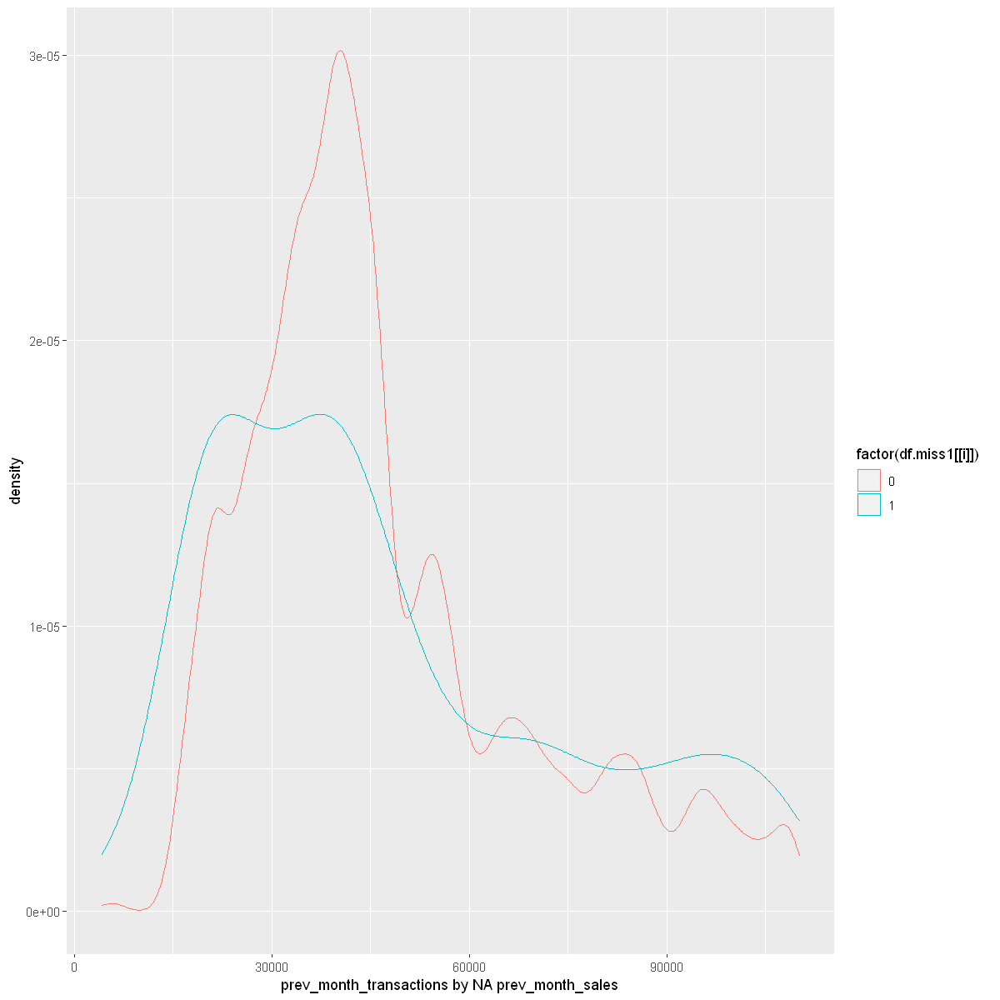


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -8.3688, df = 24992, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1797.050 -1115.018
sample estimates:
mean of x mean of y 
 47384.91  48840.94 

[1] "prev_3month_transactions by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


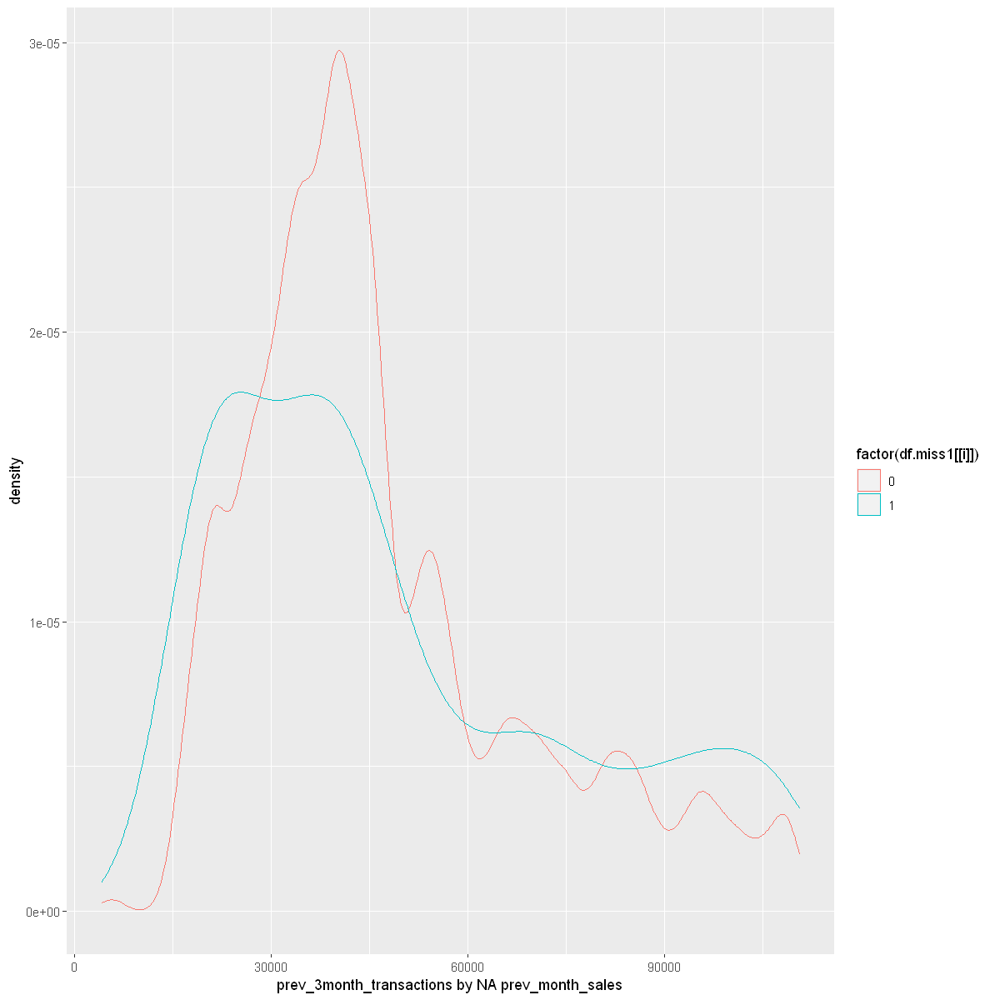


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1.3201, df = 24239, p-value = 0.1868
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -551.4157  107.5896
sample estimates:
mean of x mean of y 
 46772.55  46994.46 

[1] "avg_prev_3months_transactions by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


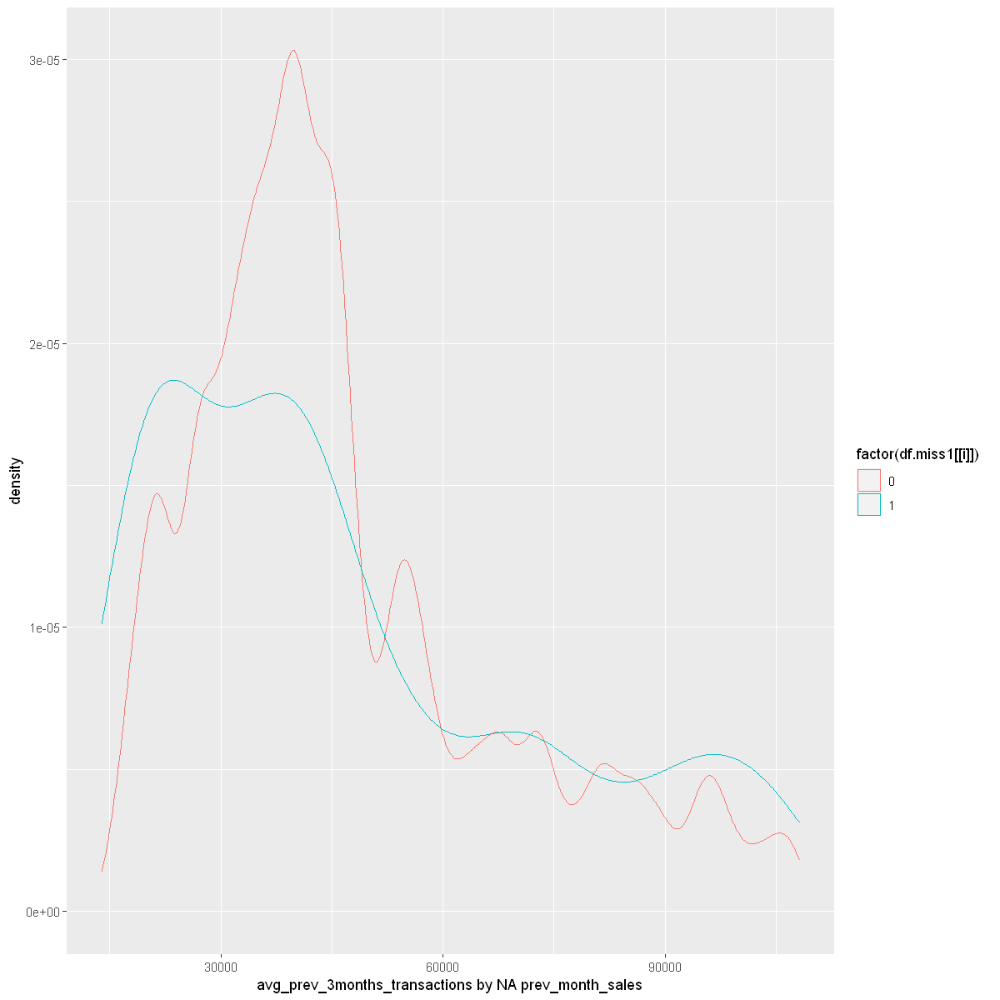


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 4.5606, df = 23823, p-value = 5.127e-06
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
  408.5354 1024.3853
sample estimates:
mean of x mean of y 
 43593.94  42877.48 

[1] "min_prev_3months_transactions by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


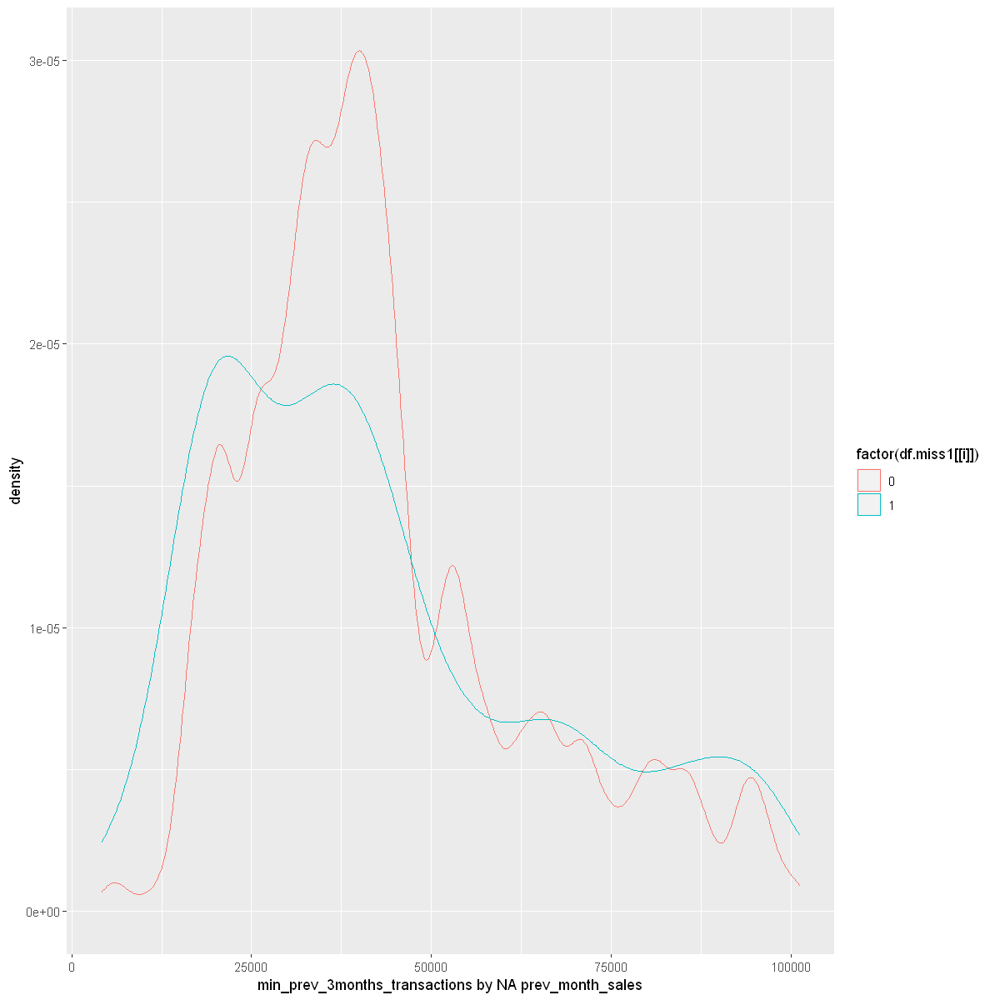


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -4.5987, df = 24398, p-value = 4.273e-06
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1175.1713  -472.7779
sample estimates:
mean of x mean of y 
 49745.20  50569.17 

[1] "max_prev_3months_transactions by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


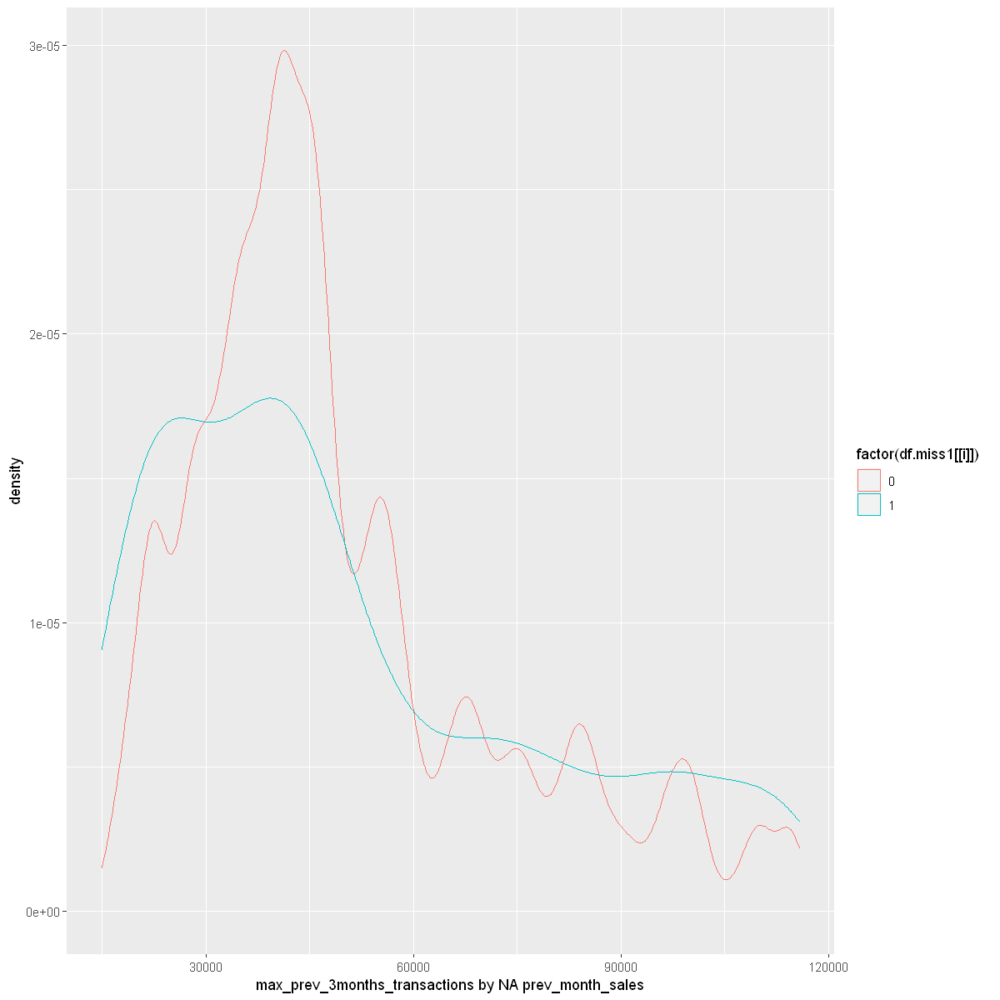


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -16.576, df = 27896, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.3083764 -0.2431612
sample estimates:
mean of x mean of y 
 4.771798  5.047566 

[1] "total_unit_sales by NA prev_month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


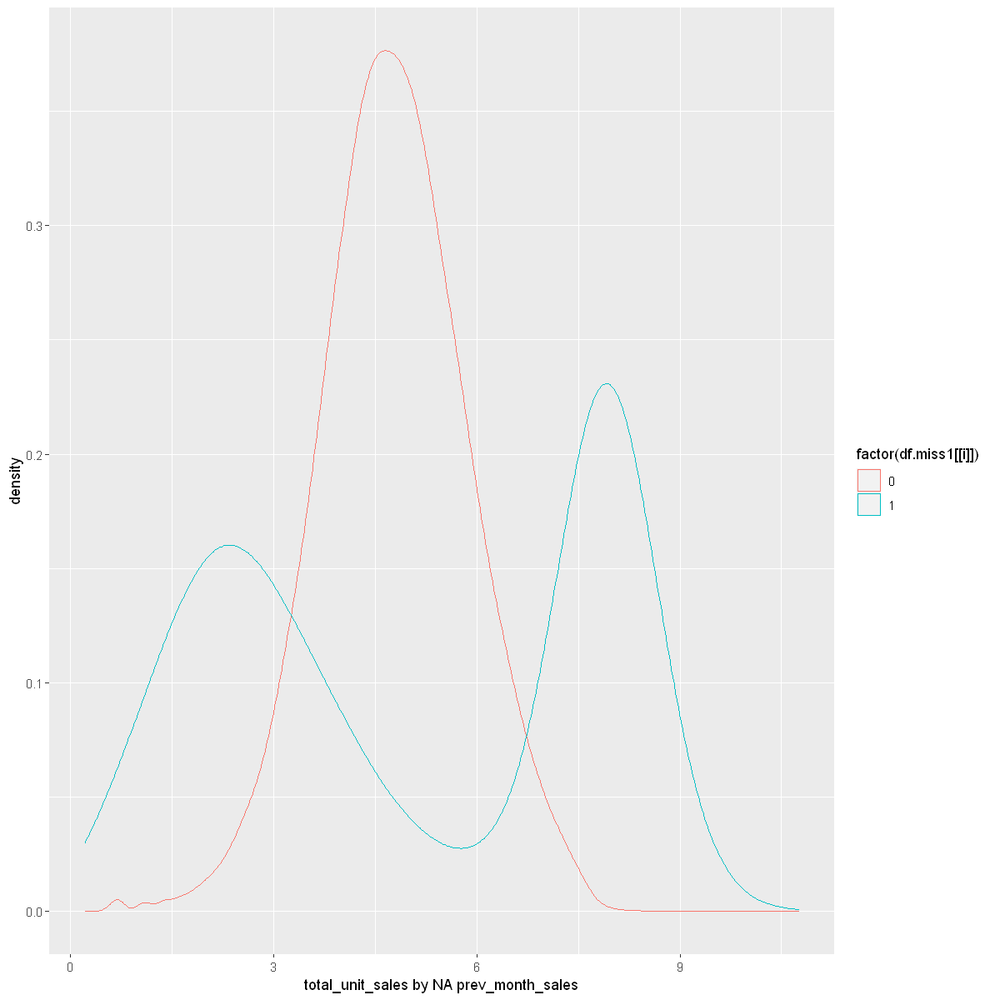


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 39.009, df = 15797, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.5450263 0.6026967
sample estimates:
mean of x mean of y 
 4.805828  4.231966 

[1] "prev_month_sales by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


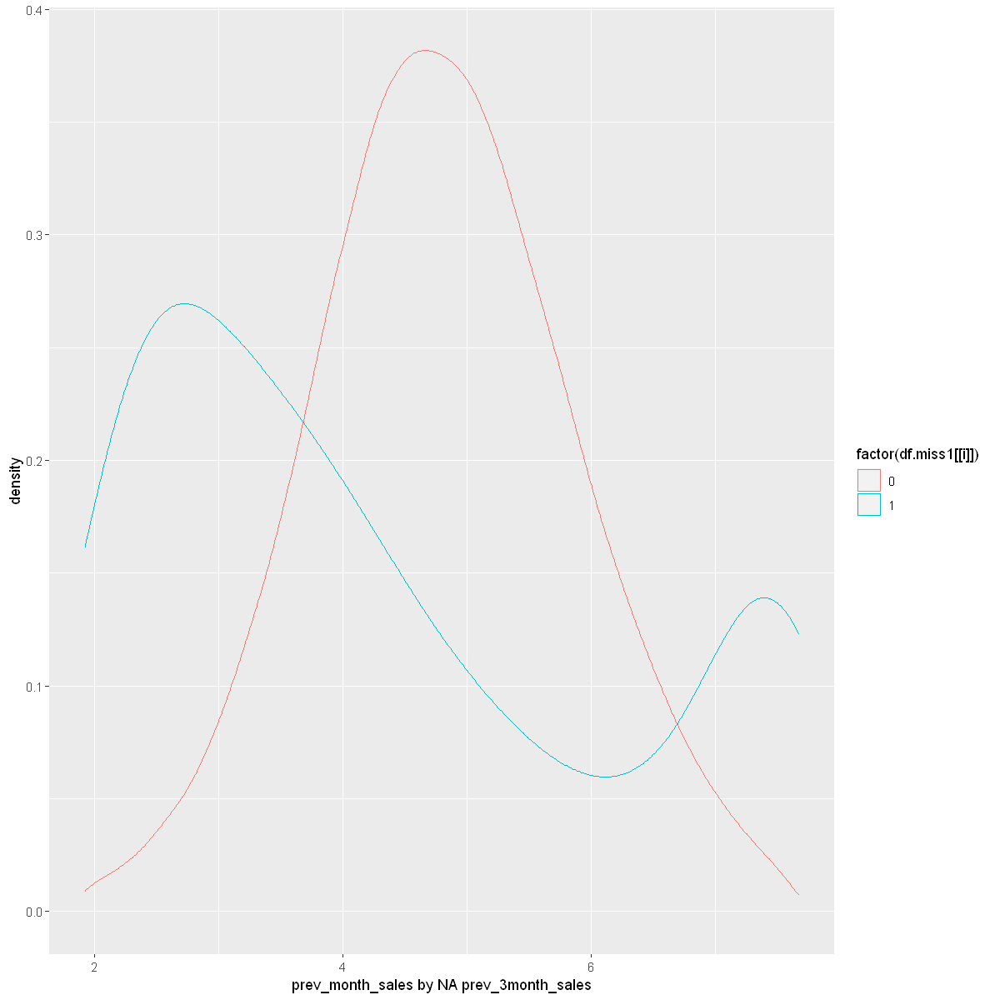


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 54.159, df = 15061, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.7292136 0.7839793
sample estimates:
mean of x mean of y 
 4.822462  4.065866 

[1] "avg_prev_3months_sales by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


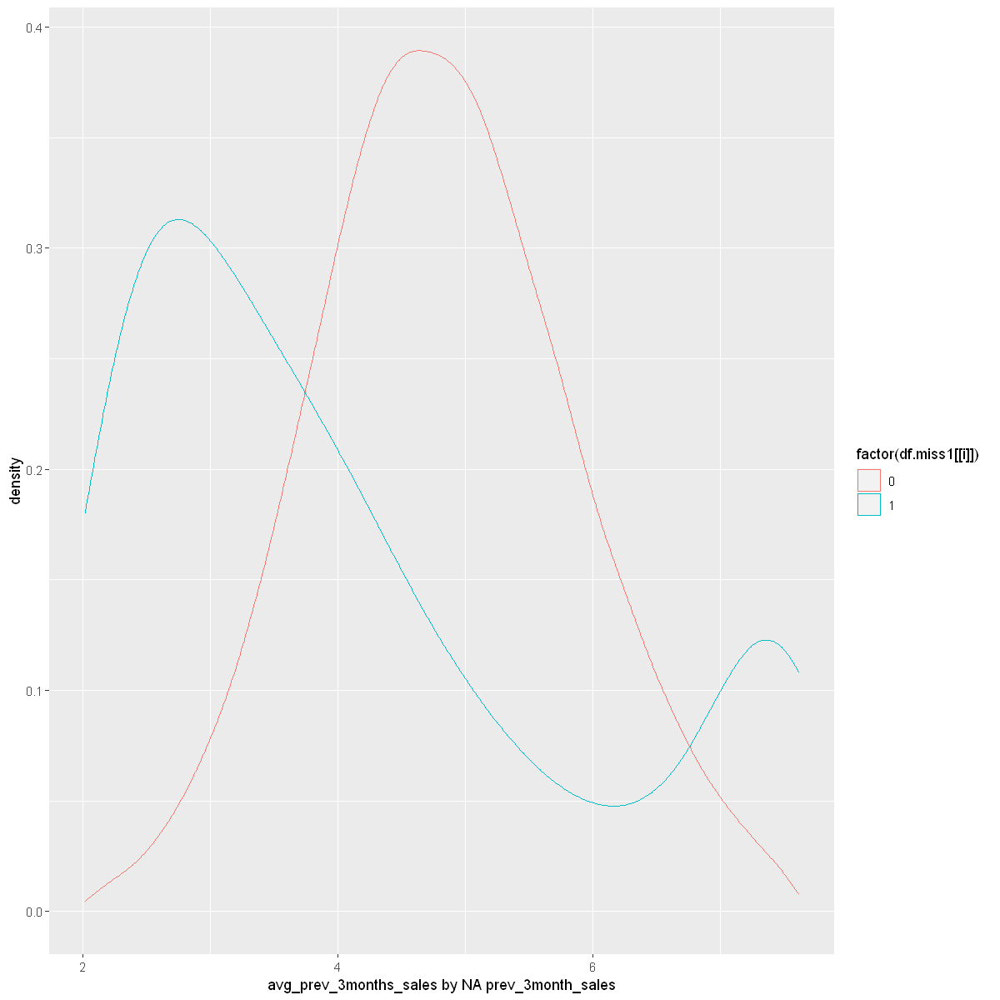


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 41.425, df = 14953, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.6484995 0.7129180
sample estimates:
mean of x mean of y 
 4.571198  3.890489 

[1] "min_prev_3months_sales by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


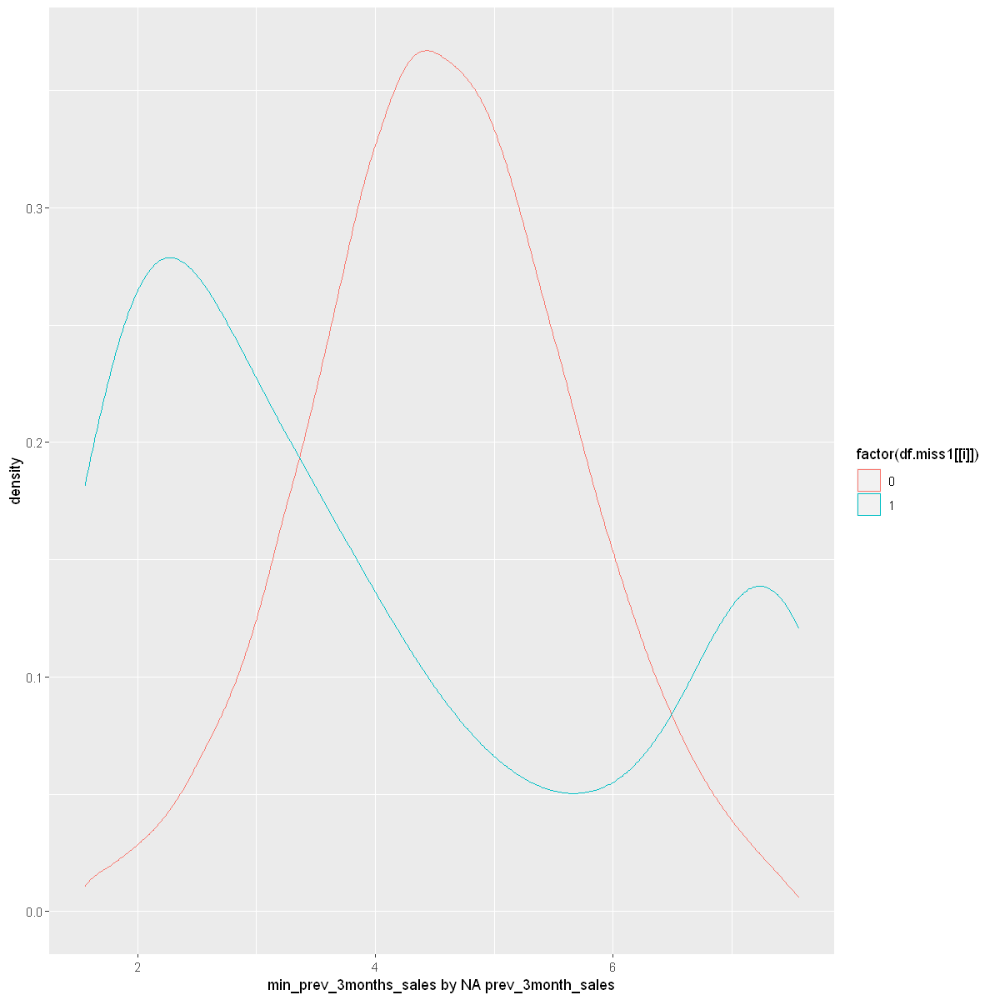


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 47.711, df = 15619, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.6218417 0.6751252
sample estimates:
mean of x mean of y 
 5.014040  4.365557 

[1] "max_prev_3months_sales by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


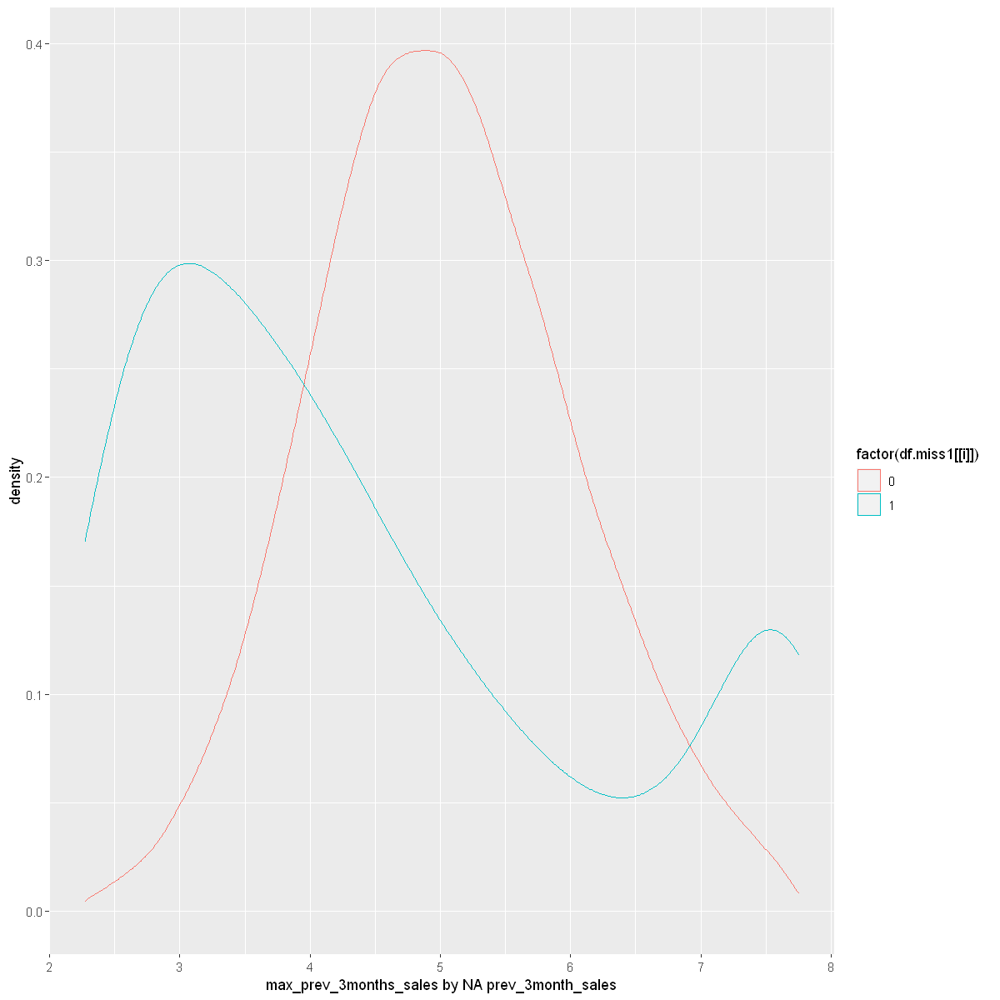


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3.7187, df = 24594, p-value = 0.0002007
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -956.2055 -296.1246
sample estimates:
mean of x mean of y 
 46570.58  47196.74 

[1] "total_month_transactions by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


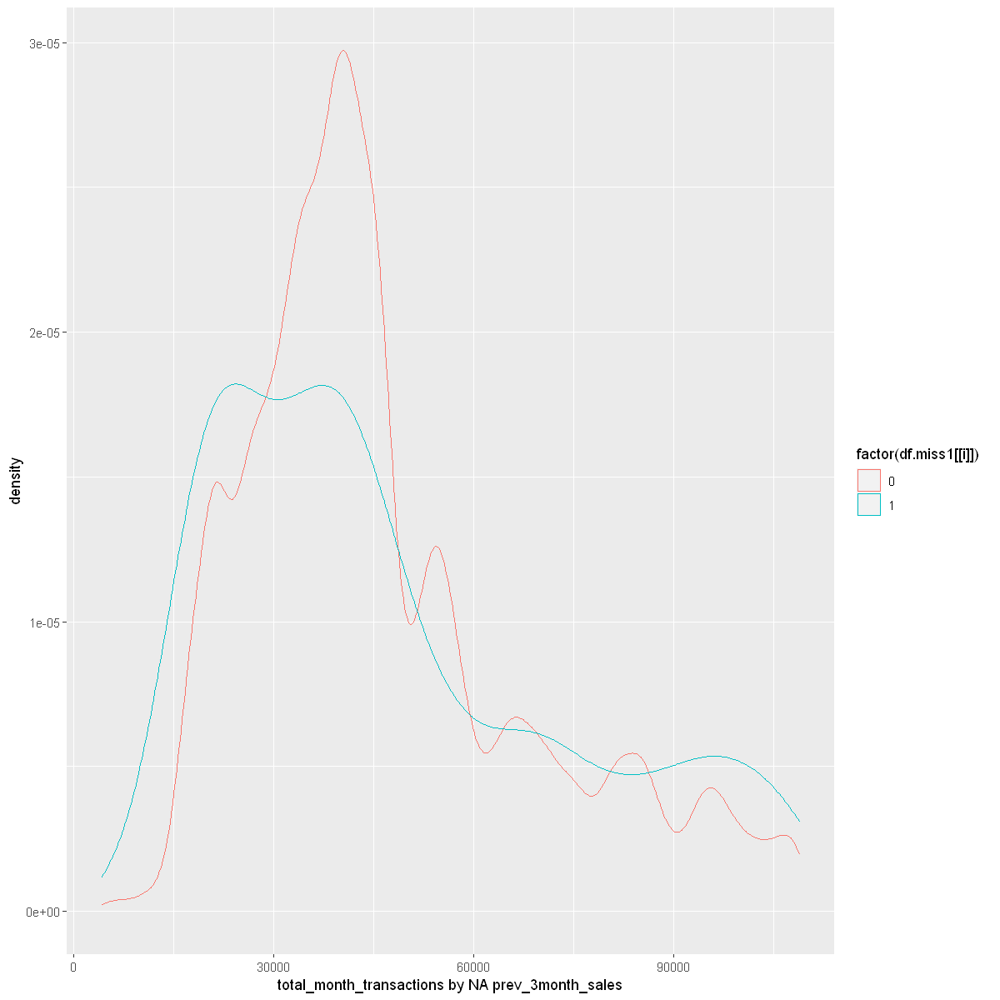


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -5.7111, df = 24816, p-value = 1.135e-08
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1312.5990  -641.8331
sample estimates:
mean of x mean of y 
 47309.69  48286.91 

[1] "prev_month_transactions by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


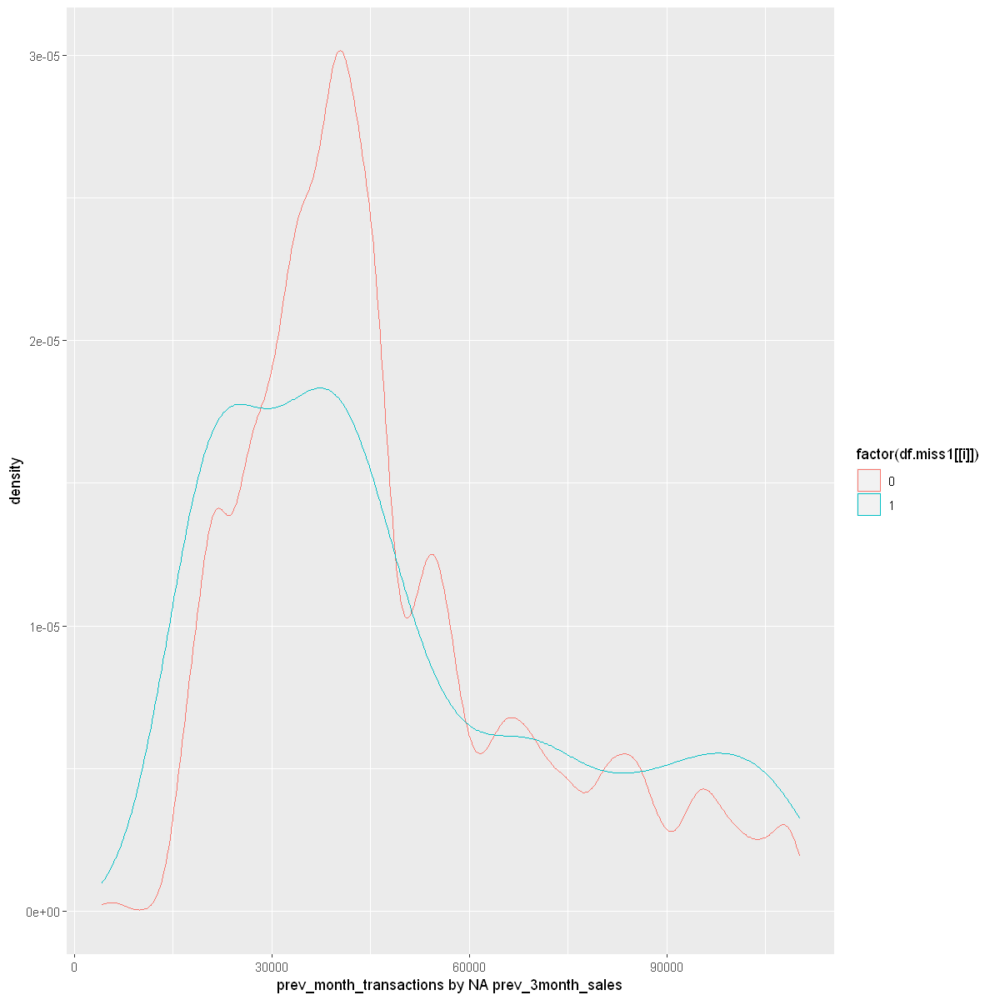


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2.3177, df = 24827, p-value = 0.02047
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -752.72901  -62.93575
sample estimates:
mean of x mean of y 
 47398.74  47806.58 

[1] "prev_3month_transactions by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


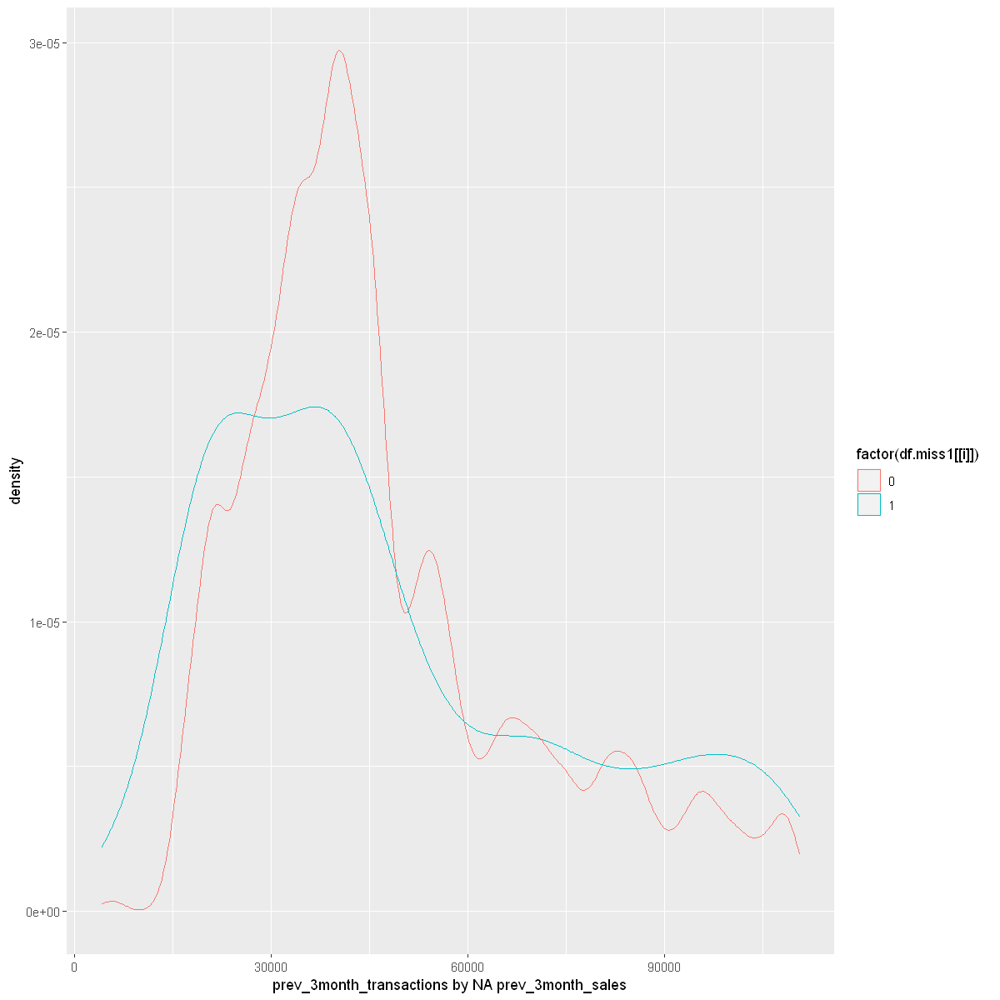


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2.4877, df = 24407, p-value = 0.01287
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -740.14325  -87.79796
sample estimates:
mean of x mean of y 
 46770.04  47184.01 

[1] "avg_prev_3months_transactions by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


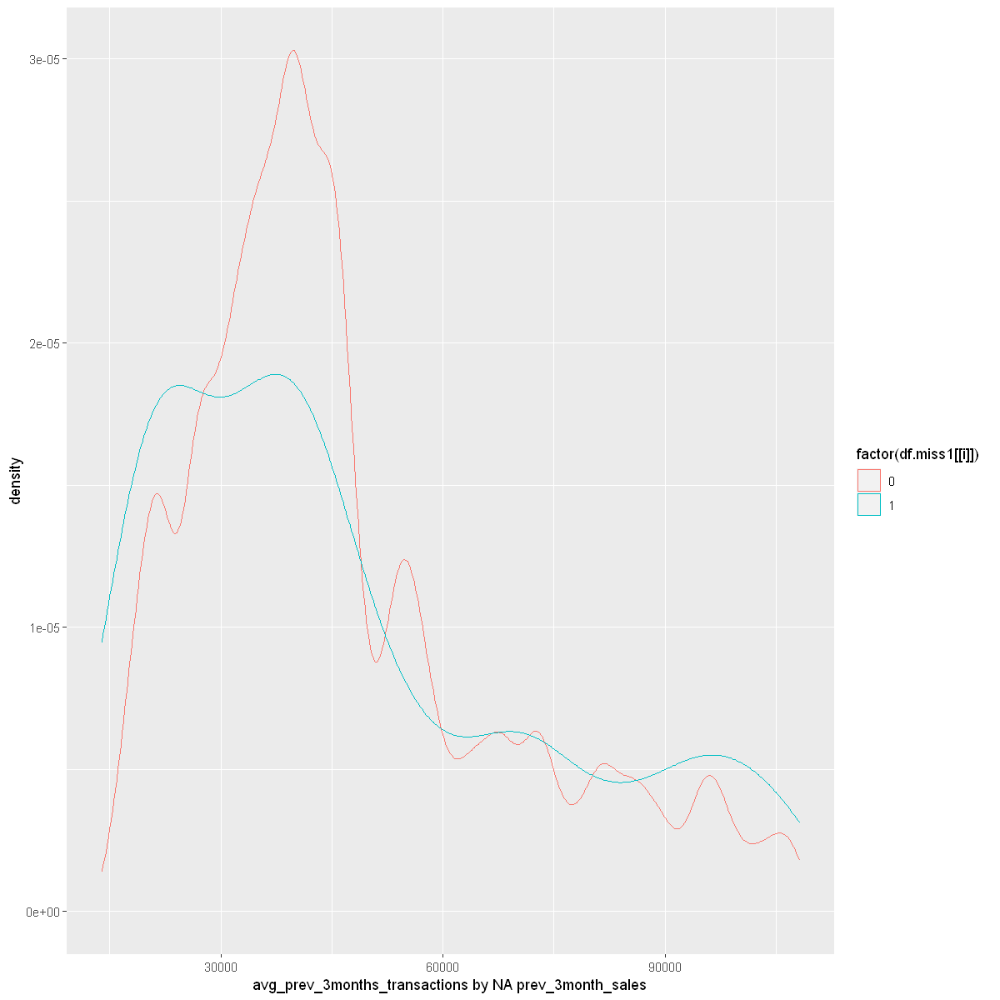


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 2.5889, df = 23982, p-value = 0.009633
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
  96.81792 700.32704
sample estimates:
mean of x mean of y 
 43589.91  43191.34 

[1] "min_prev_3months_transactions by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


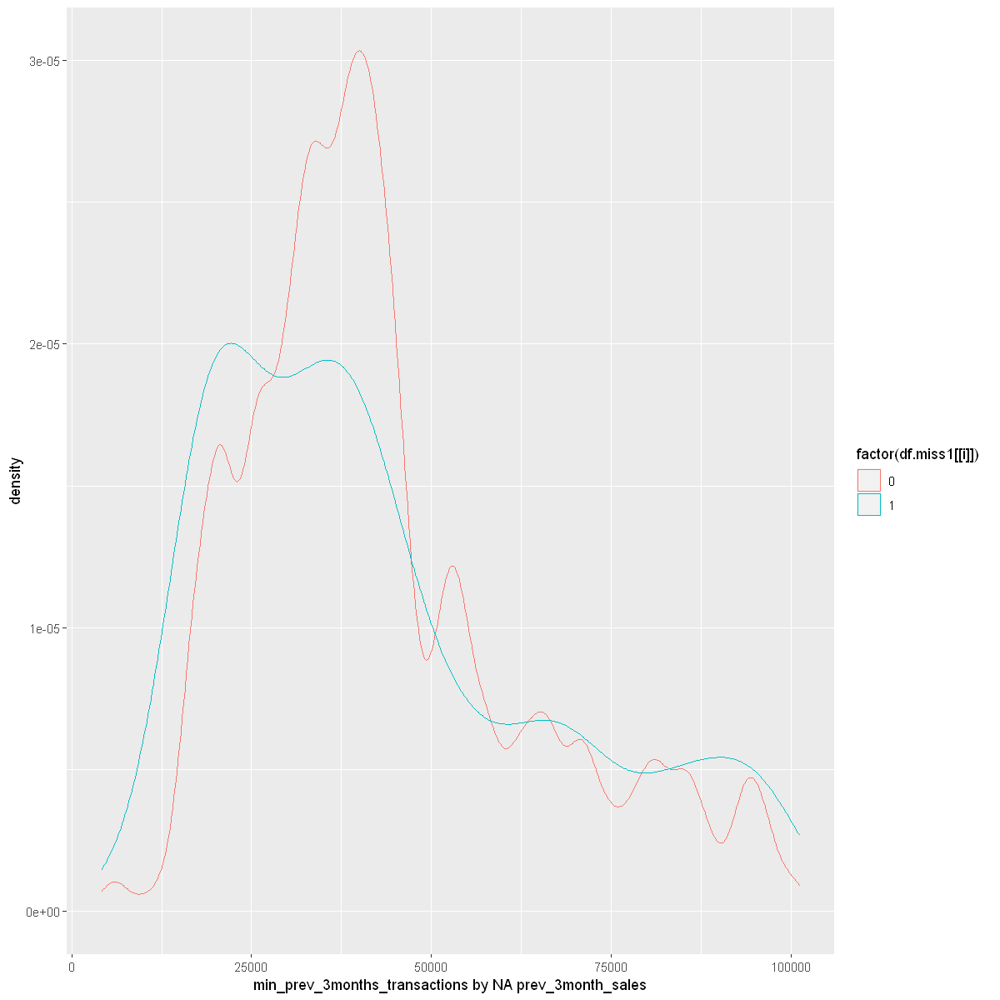


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -5.3294, df = 24596, p-value = 9.943e-08
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1297.2912  -599.6312
sample estimates:
mean of x mean of y 
 49743.49  50691.95 

[1] "max_prev_3months_transactions by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


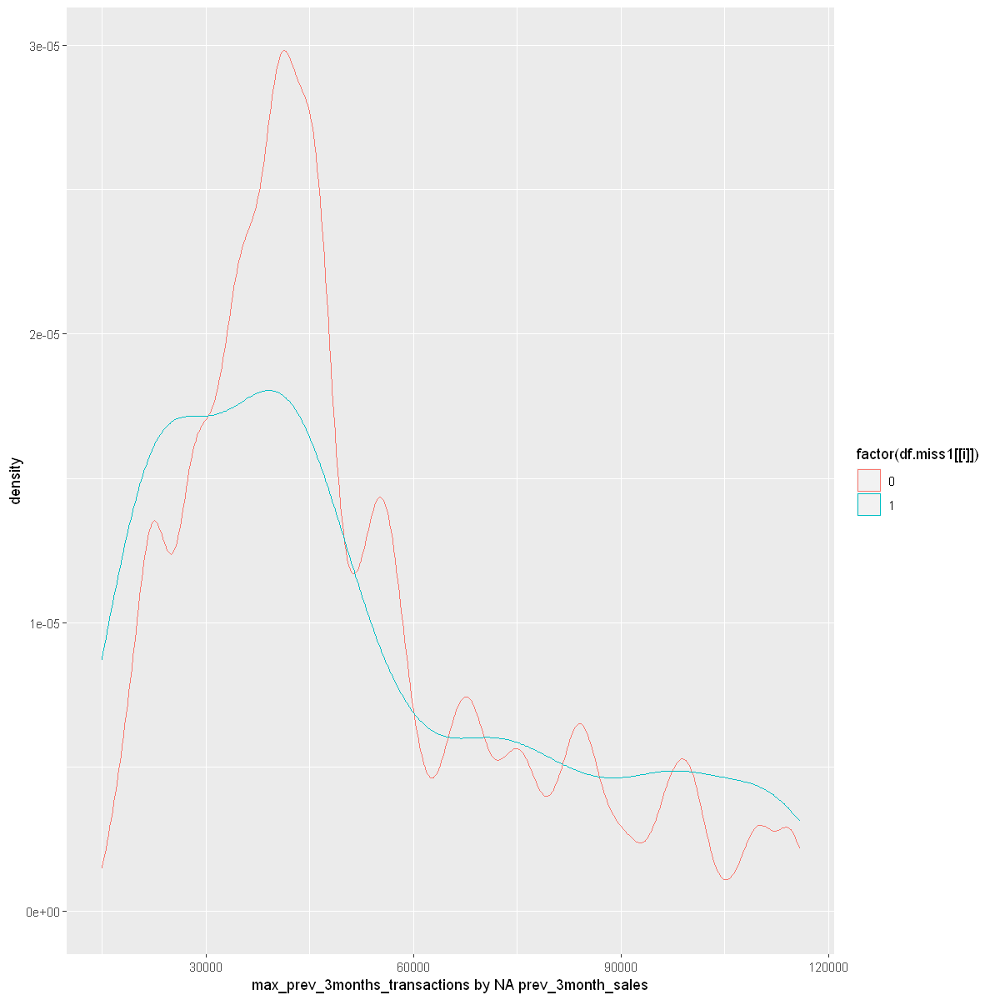


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -28.58, df = 27963, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.4750829 -0.4141017
sample estimates:
mean of x mean of y 
 4.769413  5.214005 

[1] "total_unit_sales by NA prev_3month_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


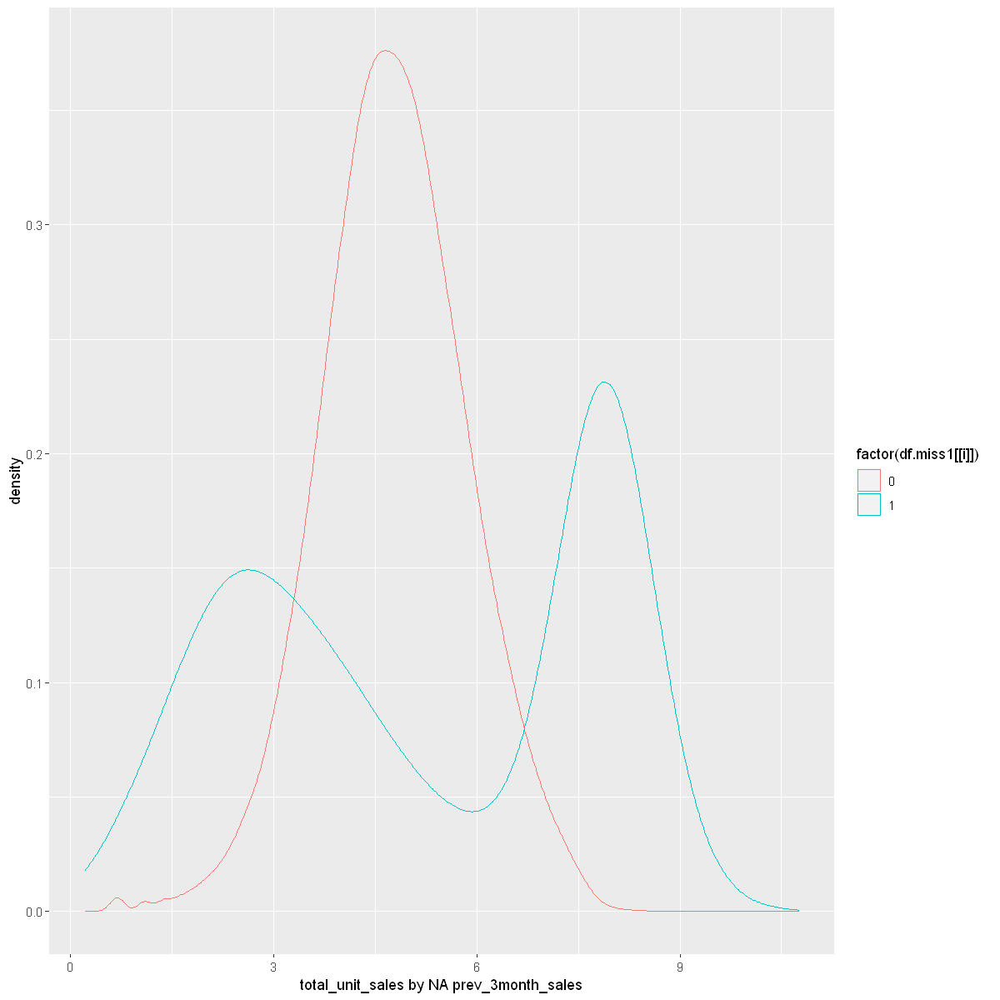


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2.8853, df = 4641.4, p-value = 0.003929
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.18991659 -0.03624571
sample estimates:
mean of x mean of y 
 4.800927  4.914008 

[1] "prev_month_sales by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."


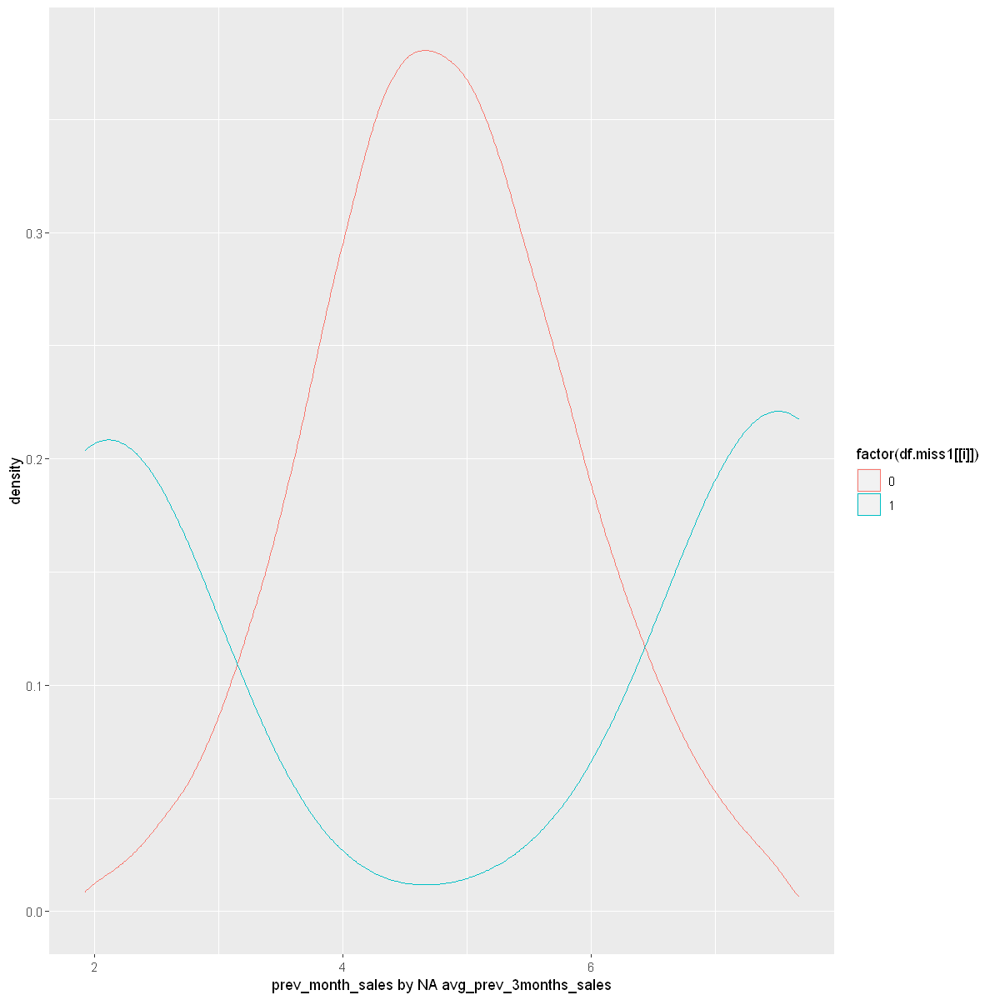


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1.1407, df = 7870.5, p-value = 0.254
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.08551744  0.02260206
sample estimates:
mean of x mean of y 
 4.803237  4.834694 

[1] "prev_3month_sales by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


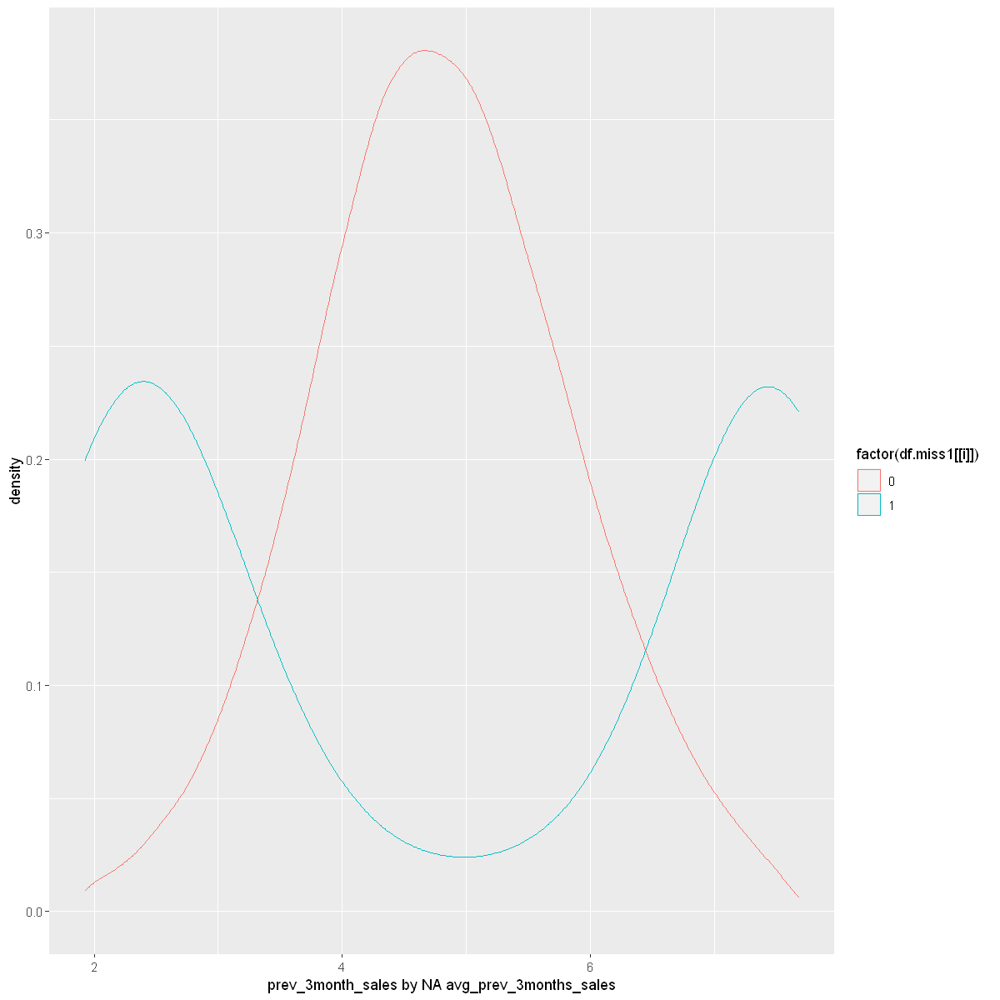


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -17.387, df = 4672.8, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.7526151 -0.6000920
sample estimates:
mean of x mean of y 
 4.564352  5.240706 

[1] "min_prev_3months_sales by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


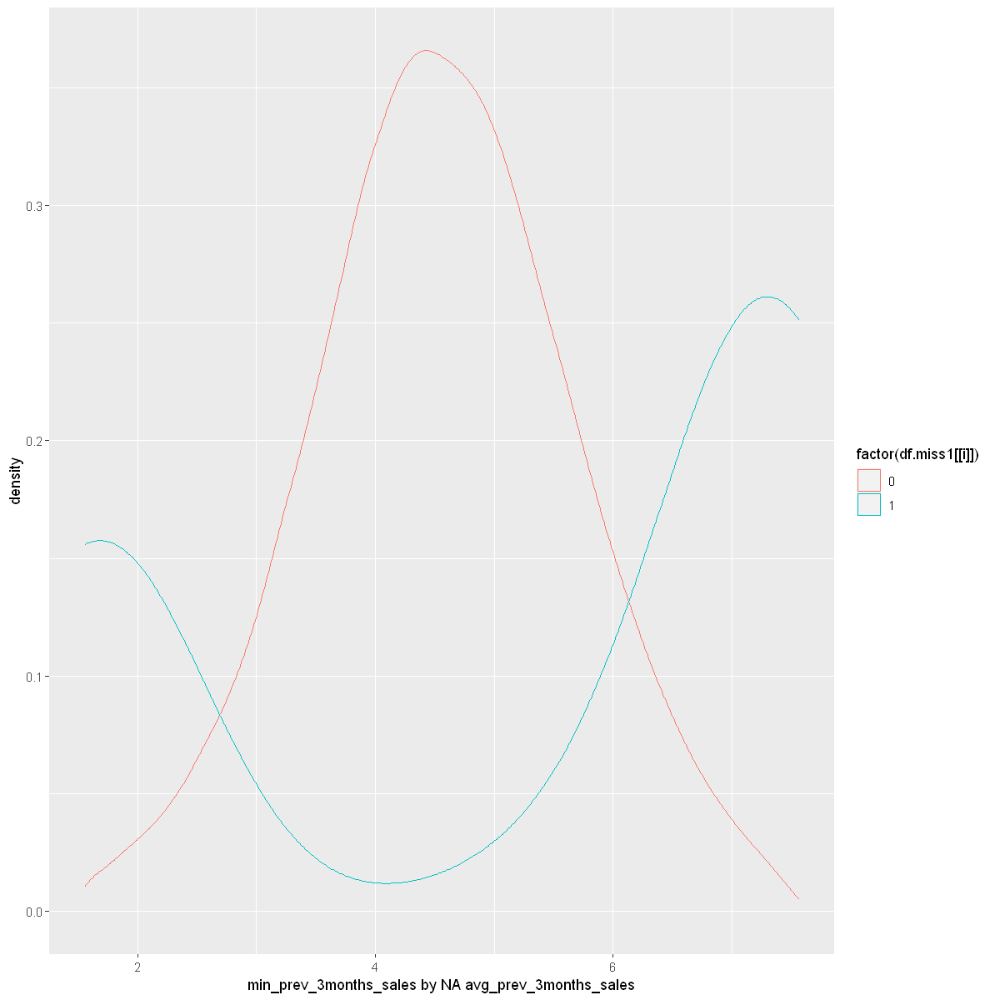


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 9.1384, df = 3155.5, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.3328832 0.5147485
sample estimates:
mean of x mean of y 
 5.009570  4.585754 

[1] "max_prev_3months_sales by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


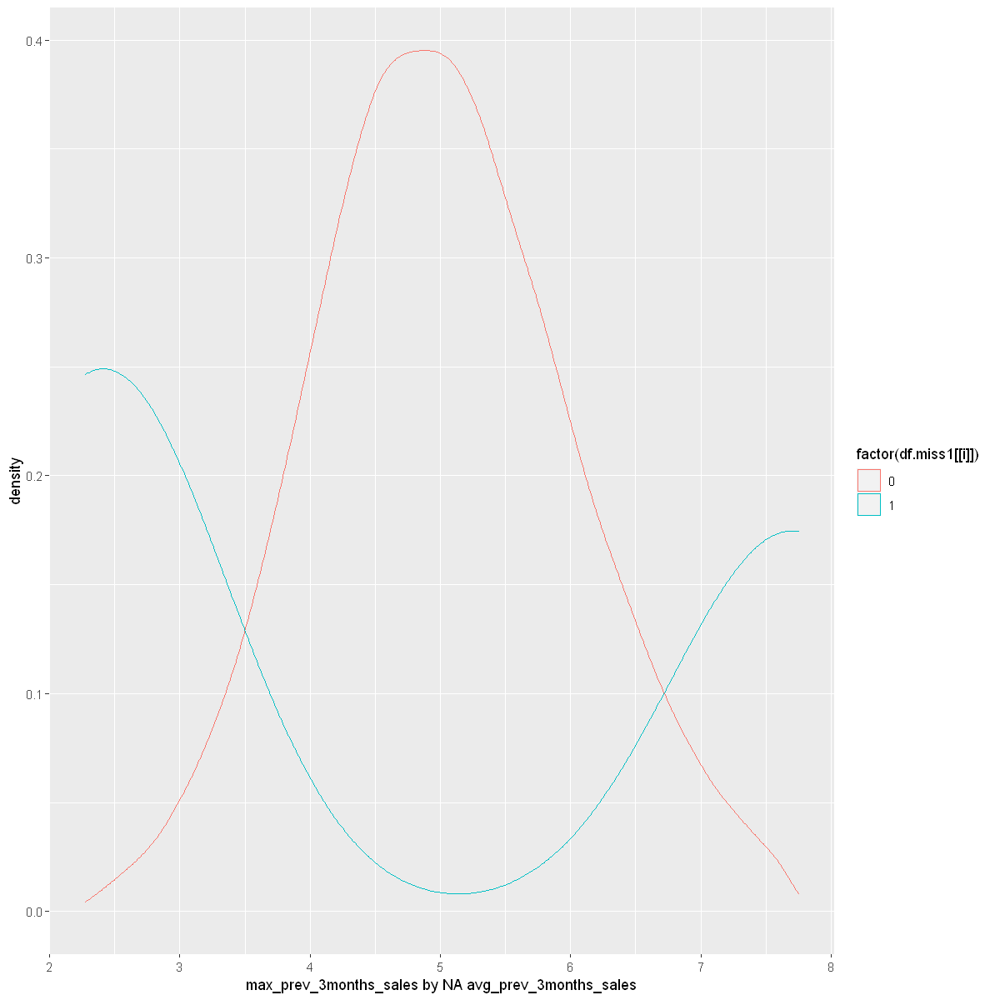


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -22.462, df = 17083, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -5393.127 -4527.414
sample estimates:
mean of x mean of y 
 46533.47  51493.74 

[1] "total_month_transactions by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


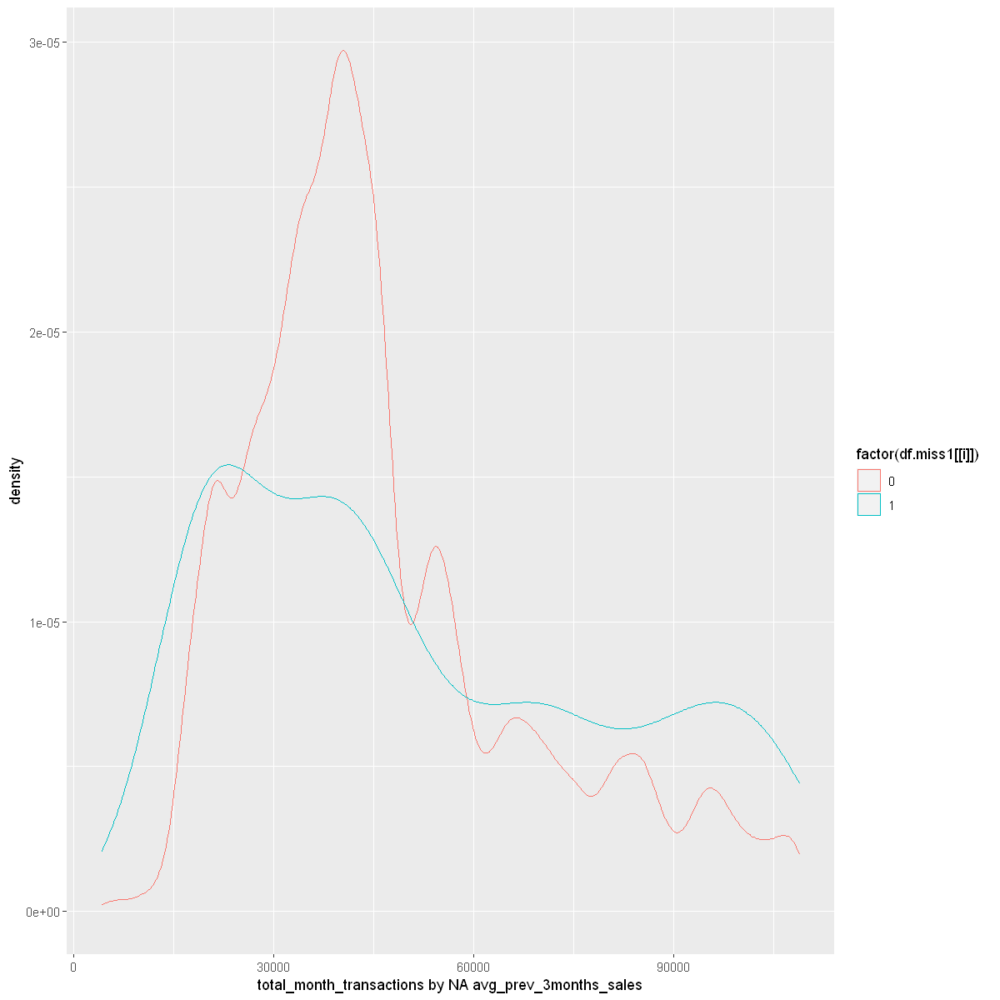


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -24.37, df = 17293, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -5863.784 -4990.731
sample estimates:
mean of x mean of y 
 47272.54  52699.80 

[1] "prev_month_transactions by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


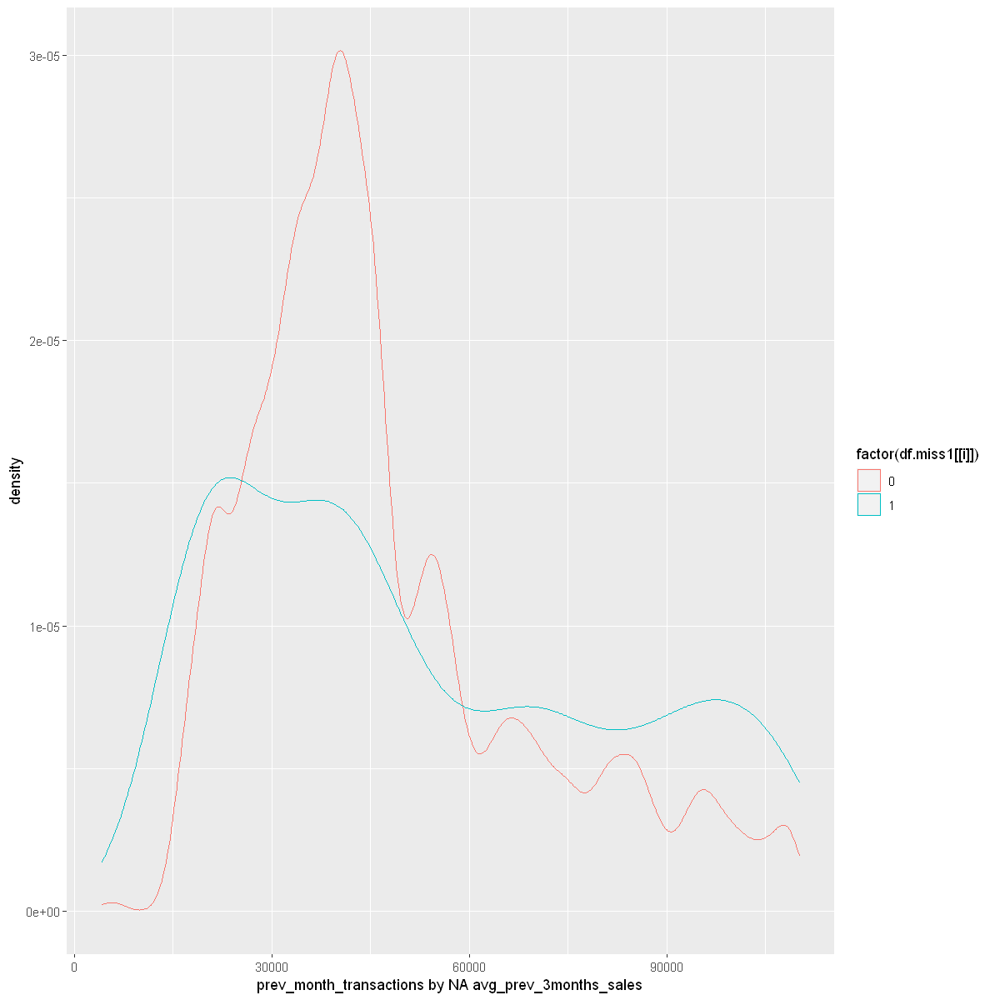


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -26.71, df = 17569, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -6414.812 -5537.677
sample estimates:
mean of x mean of y 
 47348.37  53324.62 

[1] "prev_3month_transactions by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


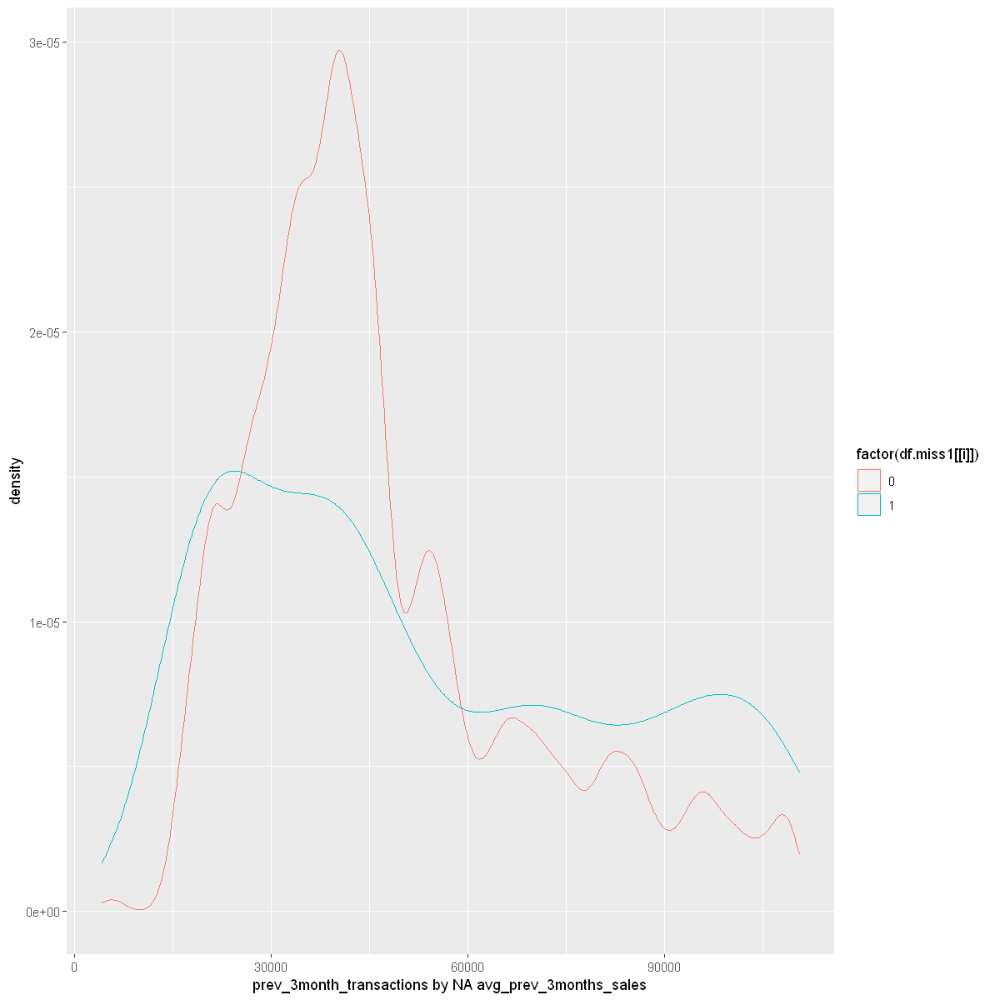


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -20.891, df = 16877, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -4991.284 -4134.989
sample estimates:
mean of x mean of y 
 46734.15  51297.28 

[1] "avg_prev_3months_transactions by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


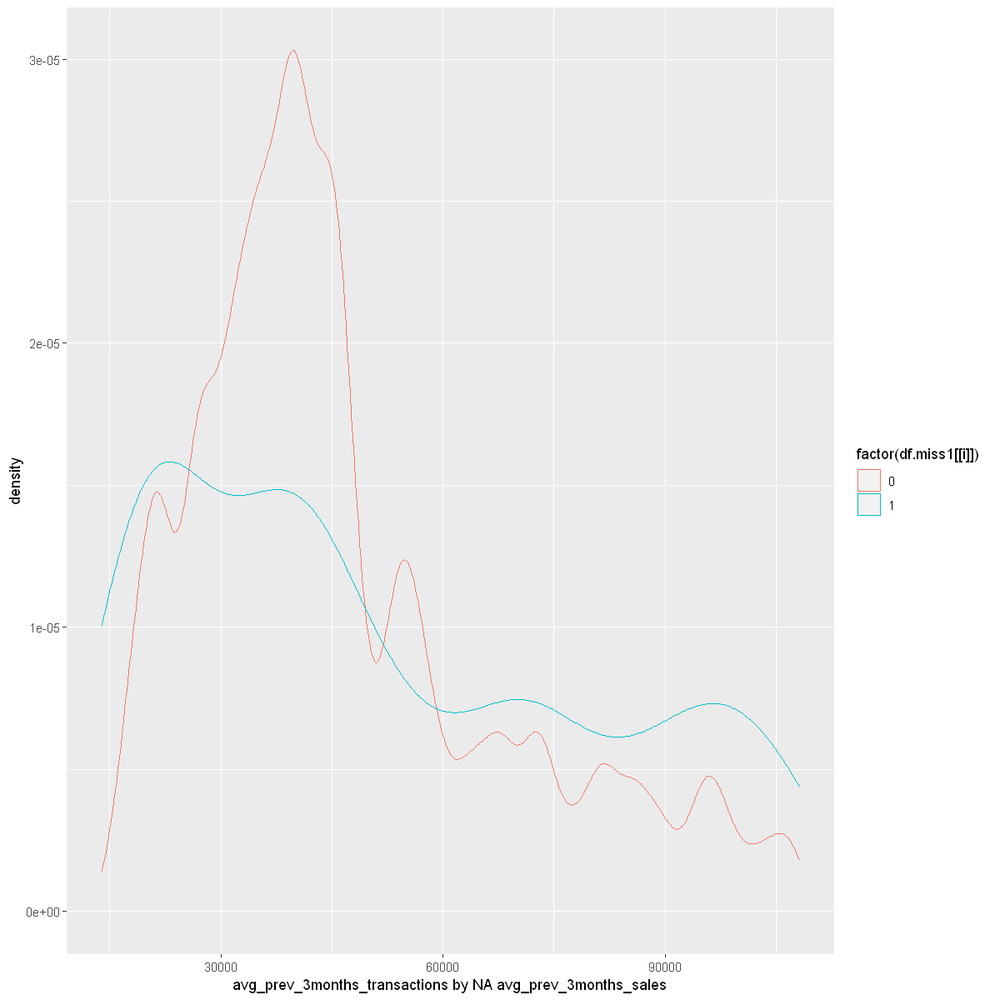


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -16.145, df = 16423, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -3665.412 -2871.736
sample estimates:
mean of x mean of y 
 43555.82  46824.39 

[1] "min_prev_3months_transactions by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


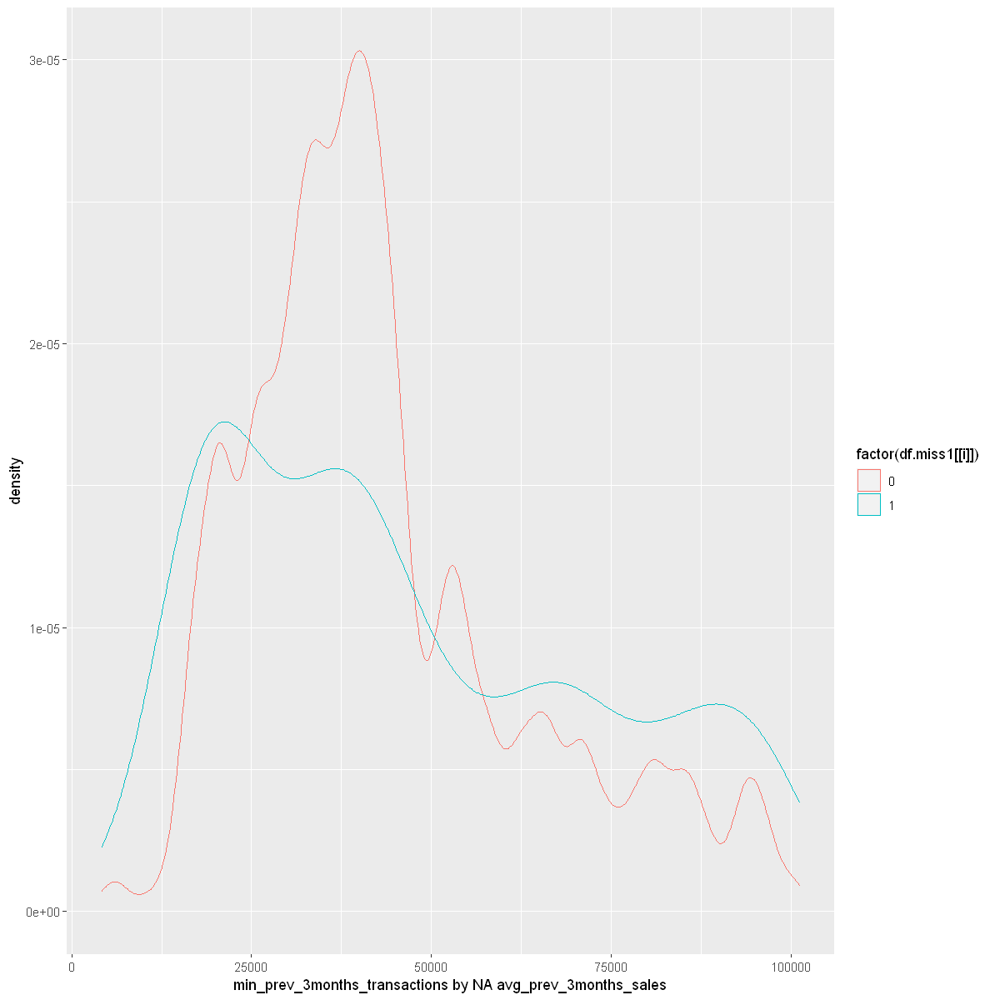


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -23.36, df = 17108, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -5907.523 -4992.883
sample estimates:
mean of x mean of y 
 49705.97  55156.17 

[1] "max_prev_3months_transactions by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


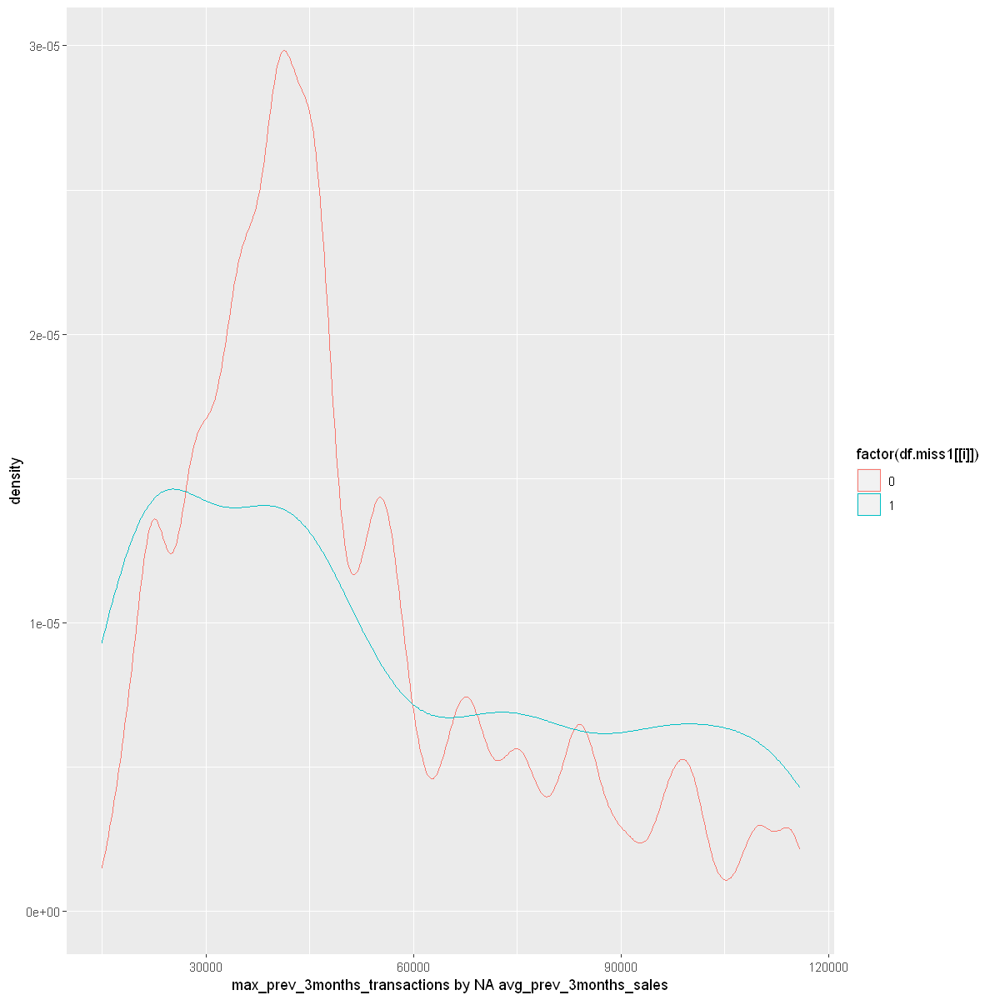


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -49.297, df = 20758, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.083272 -1.000422
sample estimates:
mean of x mean of y 
 4.764756  5.806603 

[1] "total_unit_sales by NA avg_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


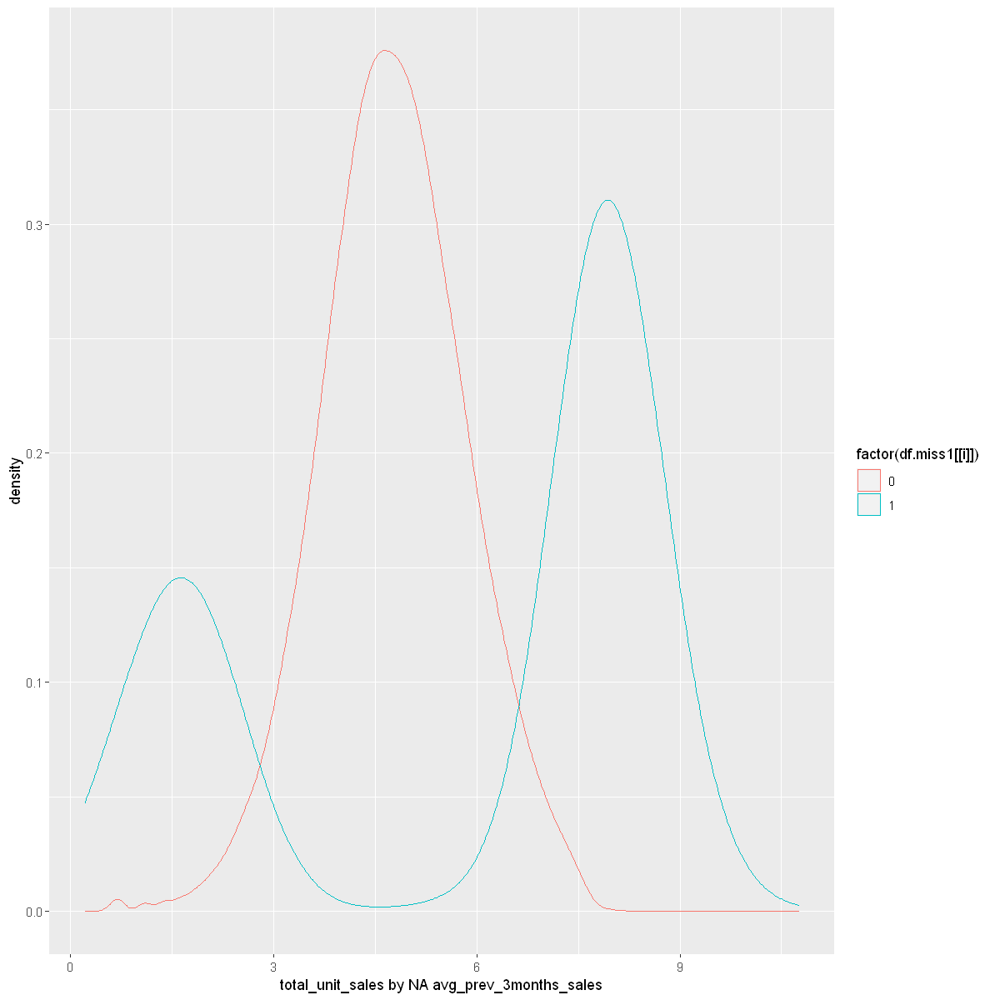


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 81.363, df = 13991, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 1.053283 1.105285
sample estimates:
mean of x mean of y 
 4.808902  3.729617 

[1] "prev_month_sales by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."


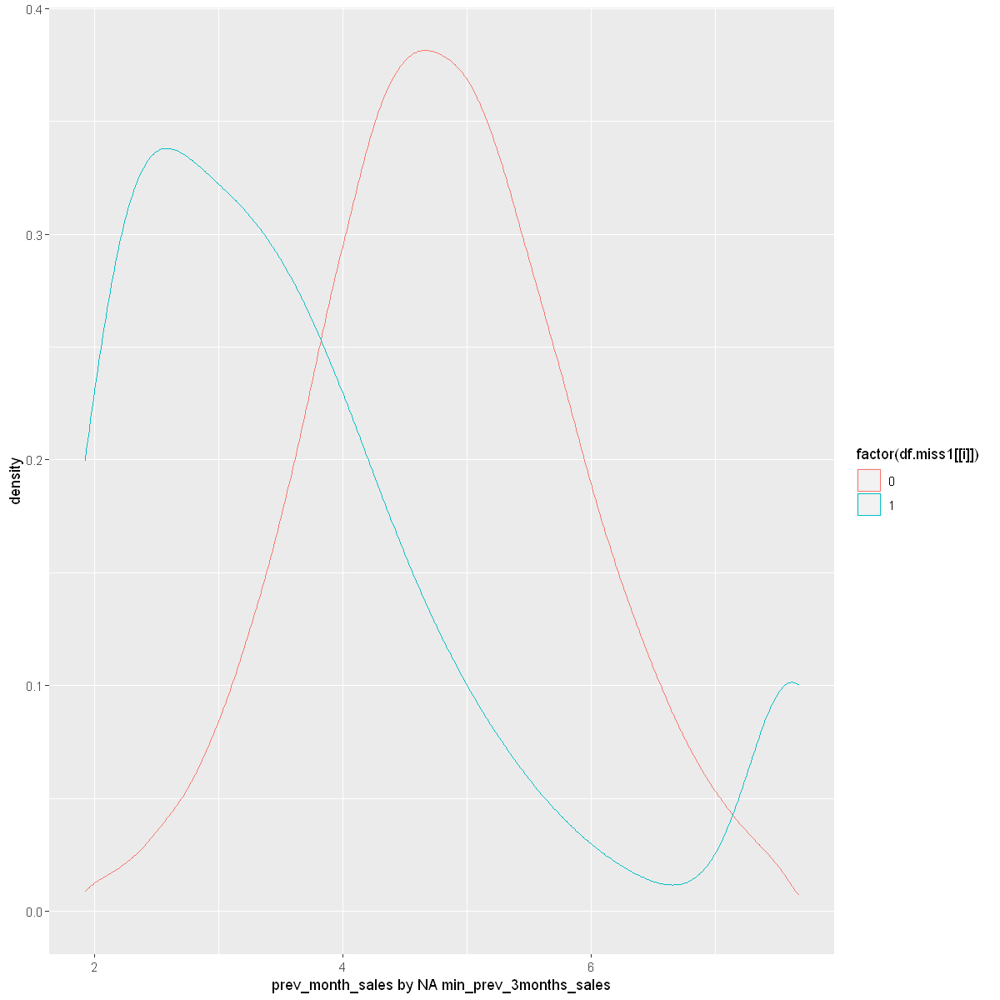


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 76.068, df = 20890, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.8190833 0.8624112
sample estimates:
mean of x mean of y 
 4.812300  3.971553 

[1] "prev_3month_sales by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


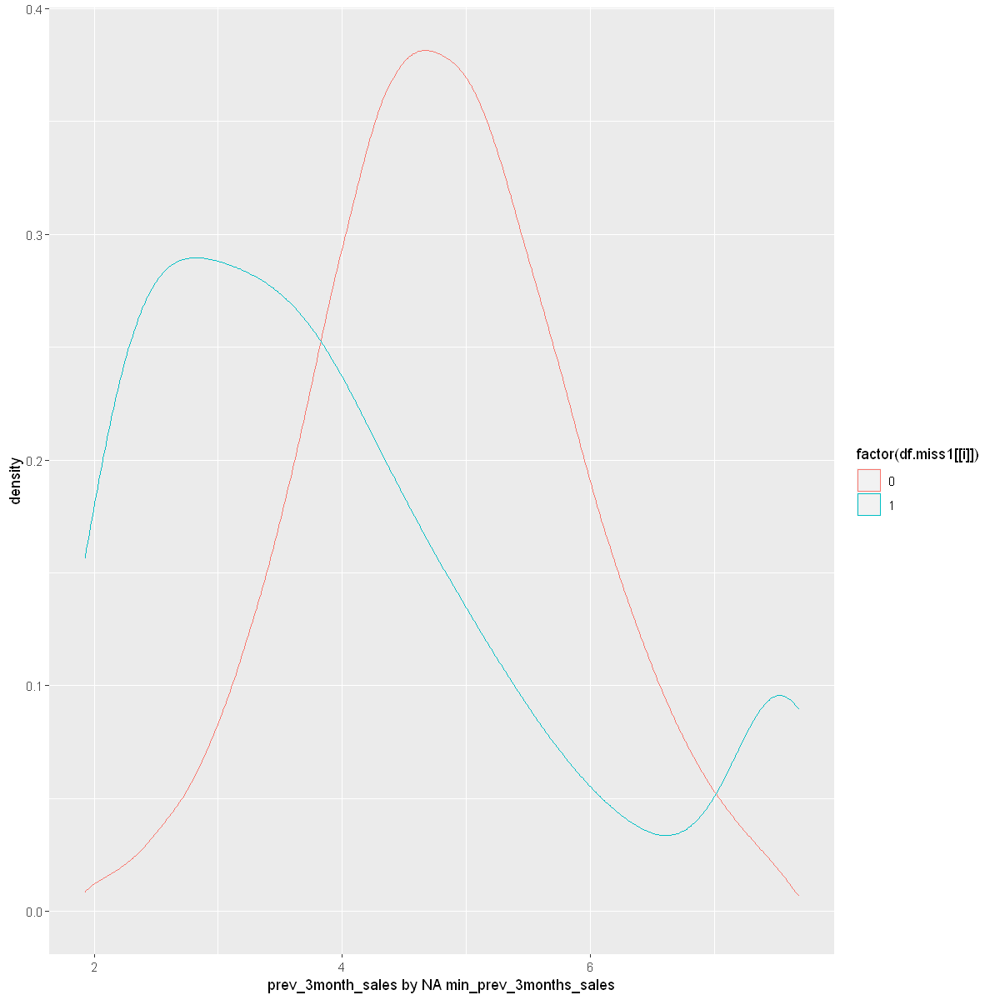


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 196.22, df = 17926, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 1.480910 1.510795
sample estimates:
mean of x mean of y 
 4.830137  3.334284 

[1] "avg_prev_3months_sales by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


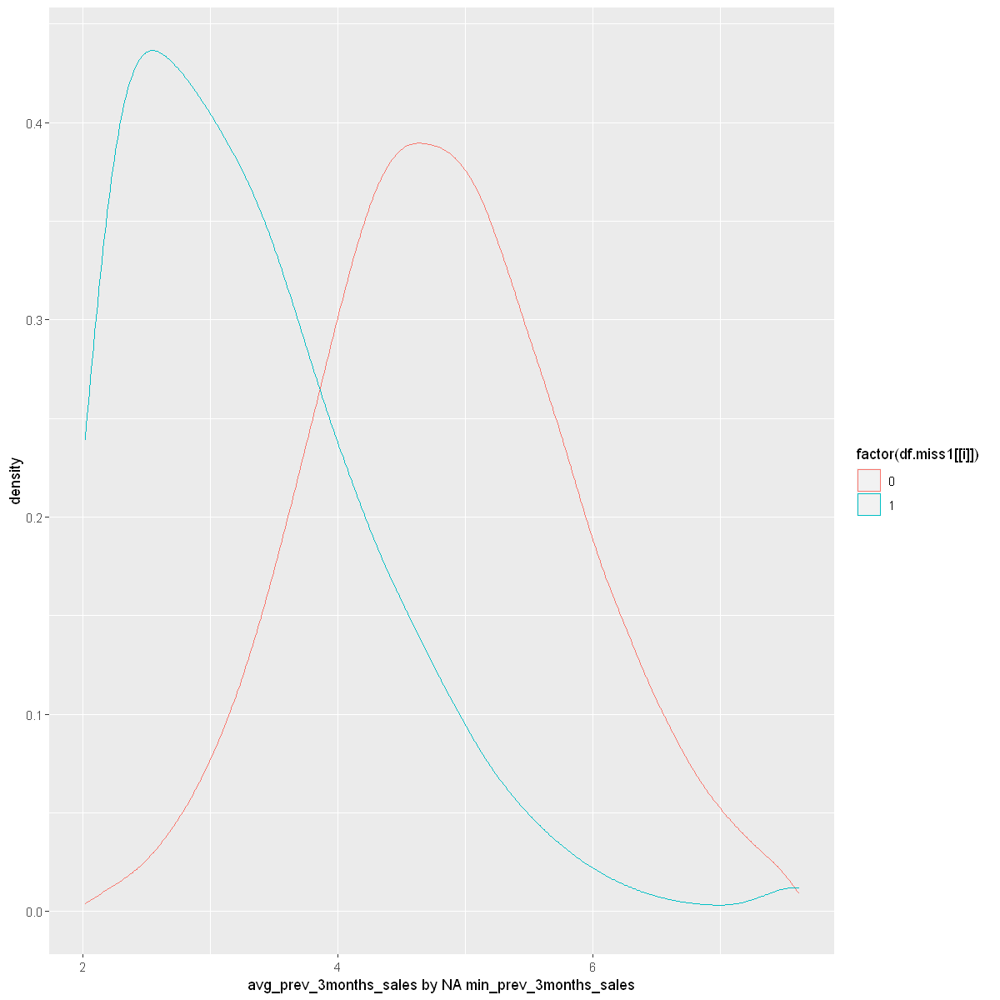


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 105.33, df = 20376, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.9842235 1.0215501
sample estimates:
mean of x mean of y 
 5.019227  4.016340 

[1] "max_prev_3months_sales by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


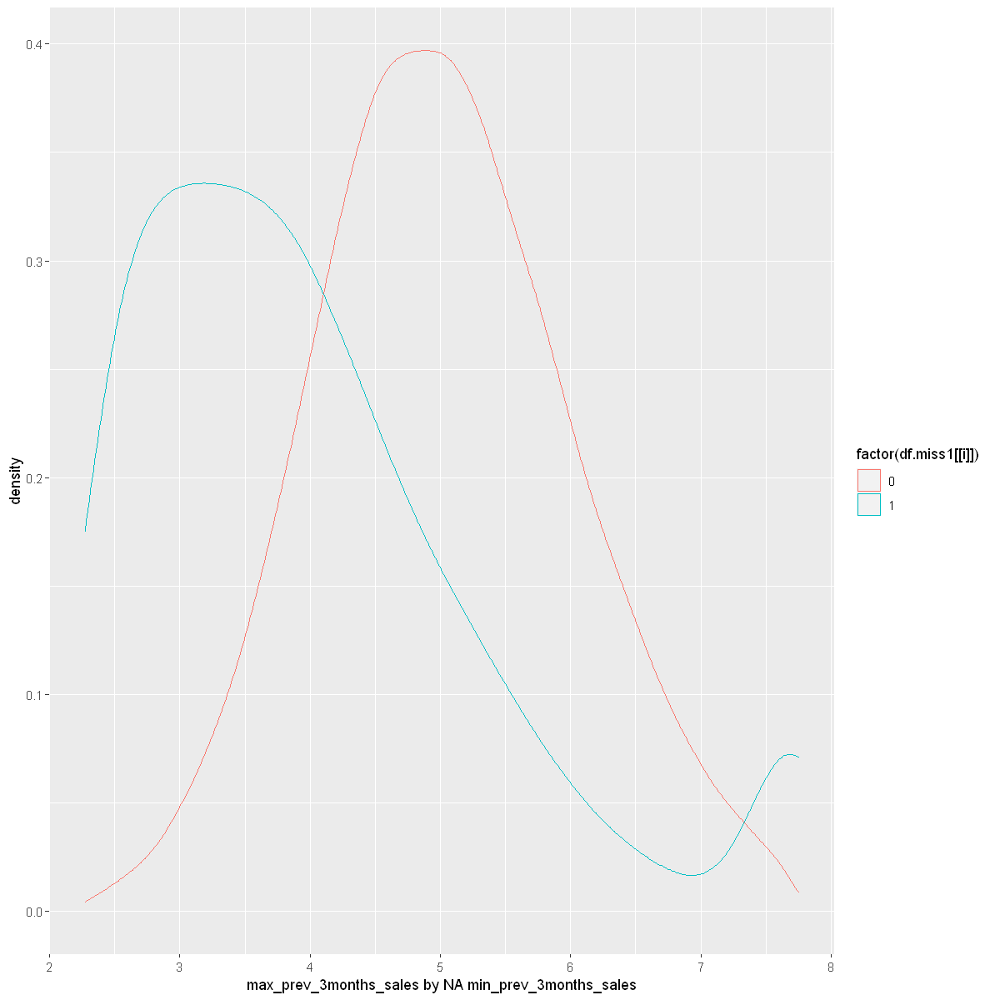


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 9.3269, df = 30683, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 1074.569 1646.371
sample estimates:
mean of x mean of y 
 46600.75  45240.28 

[1] "total_month_transactions by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


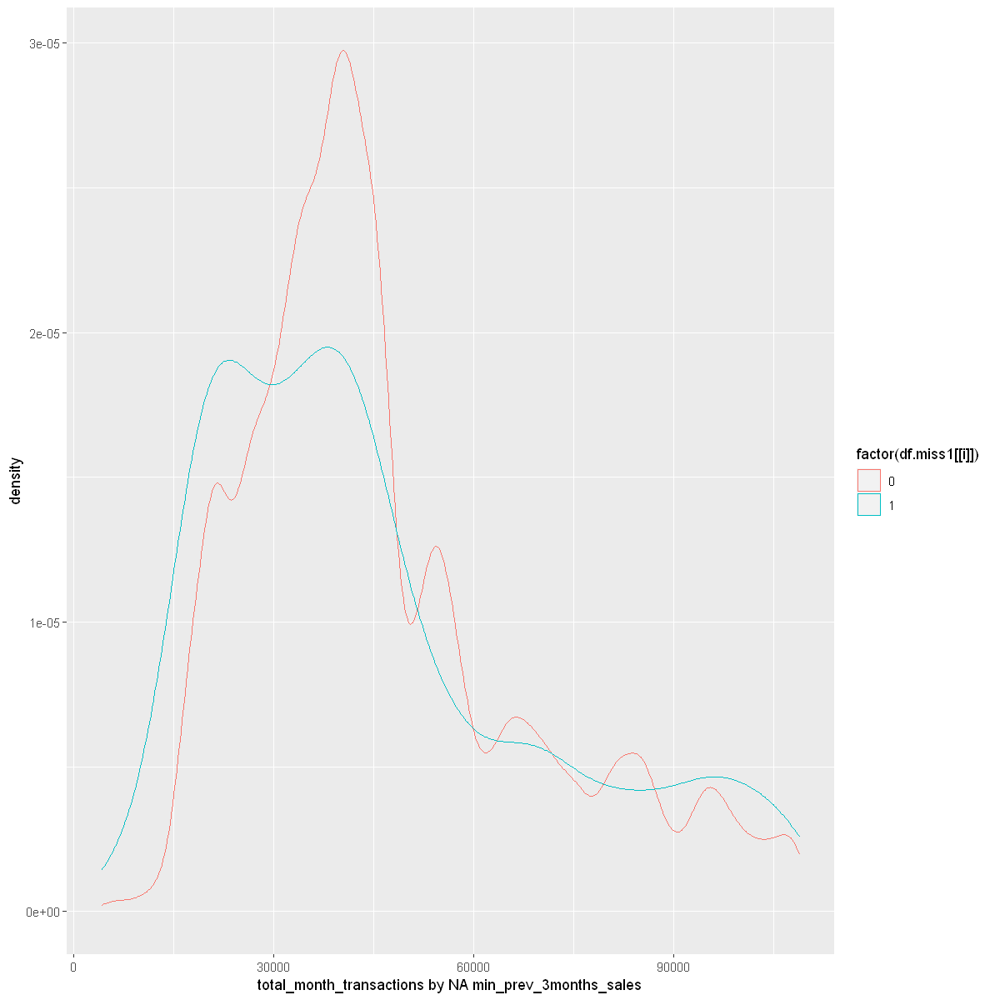


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 8.242, df = 30918, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
  920.3463 1494.6590
sample estimates:
mean of x mean of y 
 47342.11  46134.61 

[1] "prev_month_transactions by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


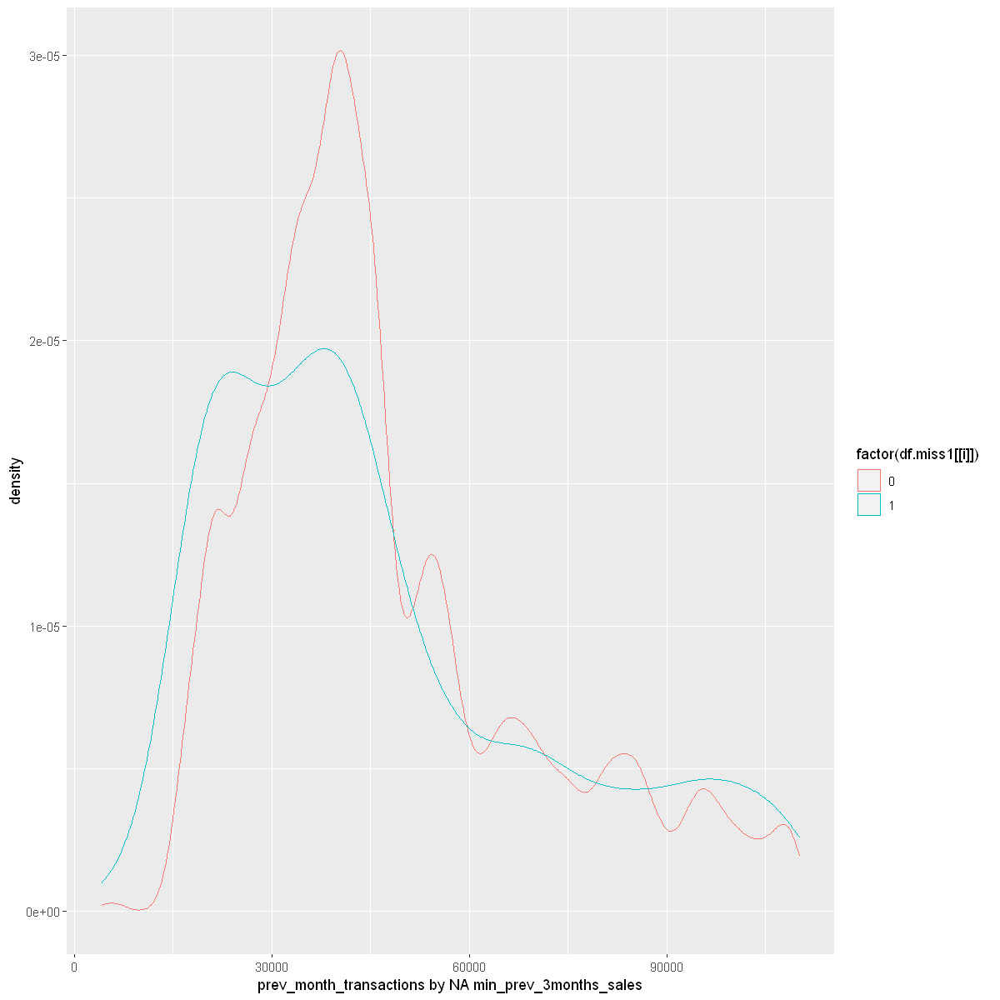


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 3.9204, df = 31217, p-value = 8.858e-05
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 288.5773 865.6310
sample estimates:
mean of x mean of y 
 47413.51  46836.40 

[1] "prev_3month_transactions by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


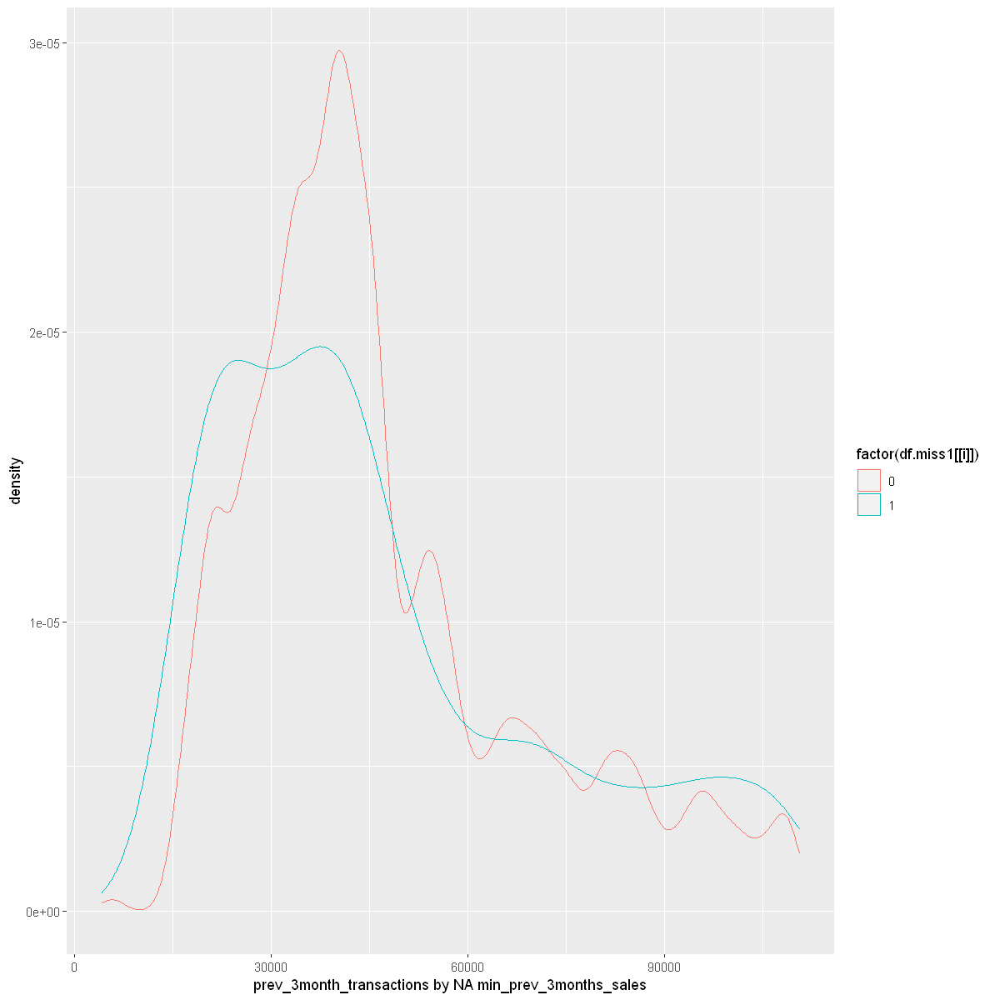


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 11.057, df = 30530, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 1294.167 1851.861
sample estimates:
mean of x mean of y 
 46800.78  45227.77 

[1] "avg_prev_3months_transactions by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


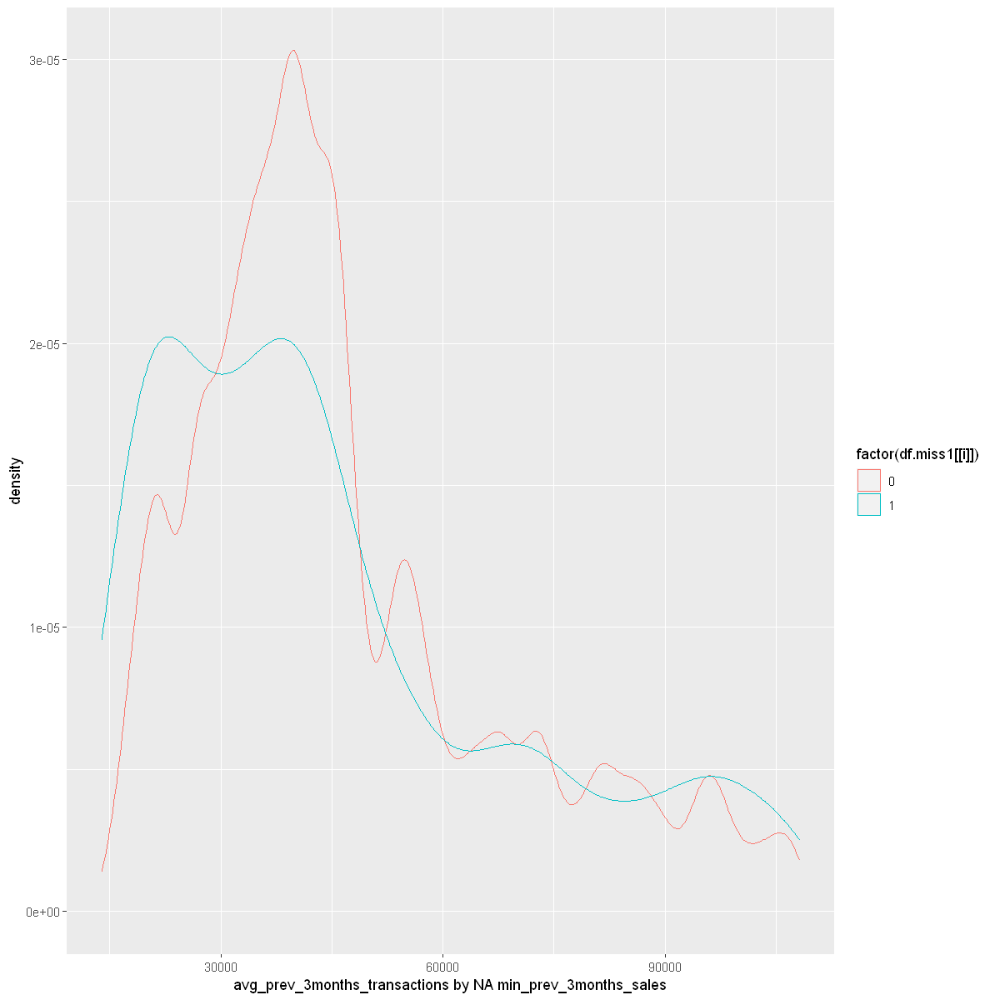


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 17.189, df = 30061, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 2053.363 2581.908
sample estimates:
mean of x mean of y 
 43621.89  41304.26 

[1] "min_prev_3months_transactions by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


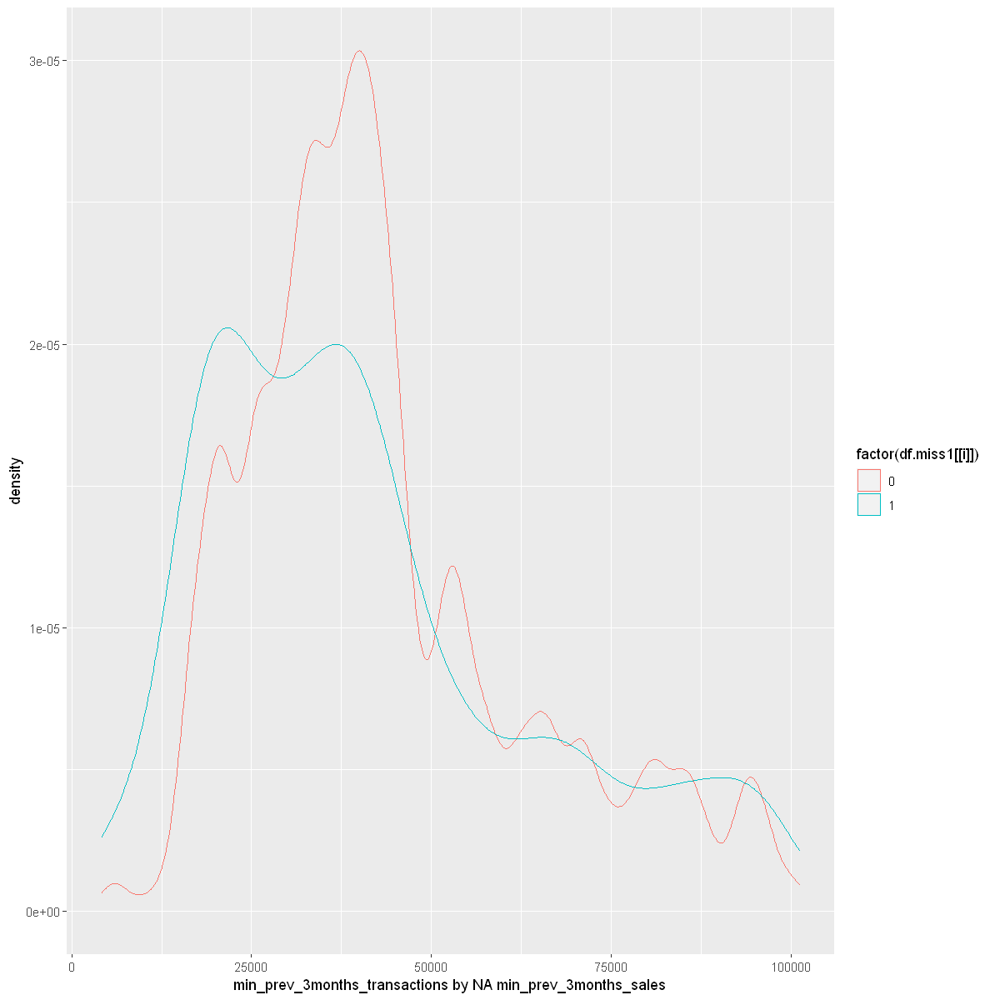


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 6.5177, df = 30767, p-value = 7.249e-11
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
  691.5018 1286.2669
sample estimates:
mean of x mean of y 
 49771.94  48783.06 

[1] "max_prev_3months_transactions by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


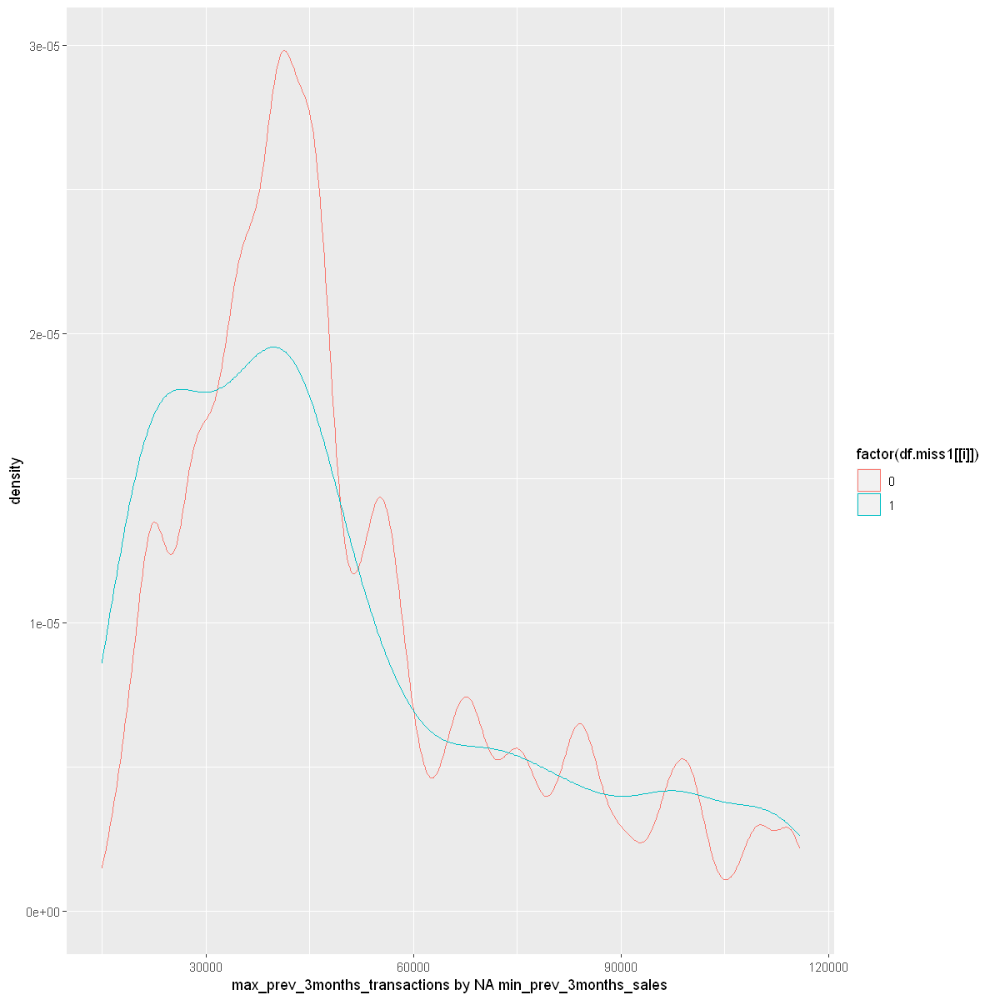


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = 37.293, df = 33793, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.5609941 0.6232337
sample estimates:
mean of x mean of y 
 4.785759  4.193645 

[1] "total_unit_sales by NA min_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


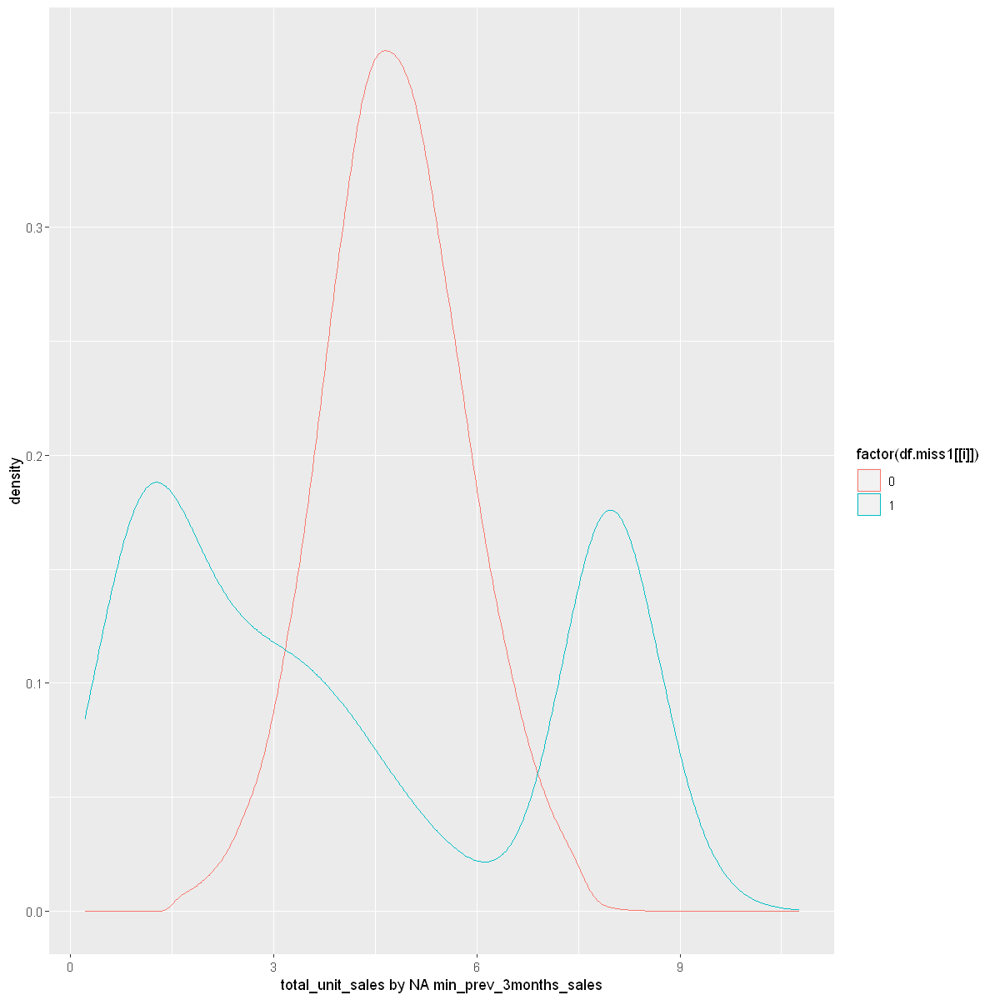


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -12.792, df = 5678.9, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.4827547 -0.3544563
sample estimates:
mean of x mean of y 
 4.799977  5.218583 

[1] "prev_month_sales by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."


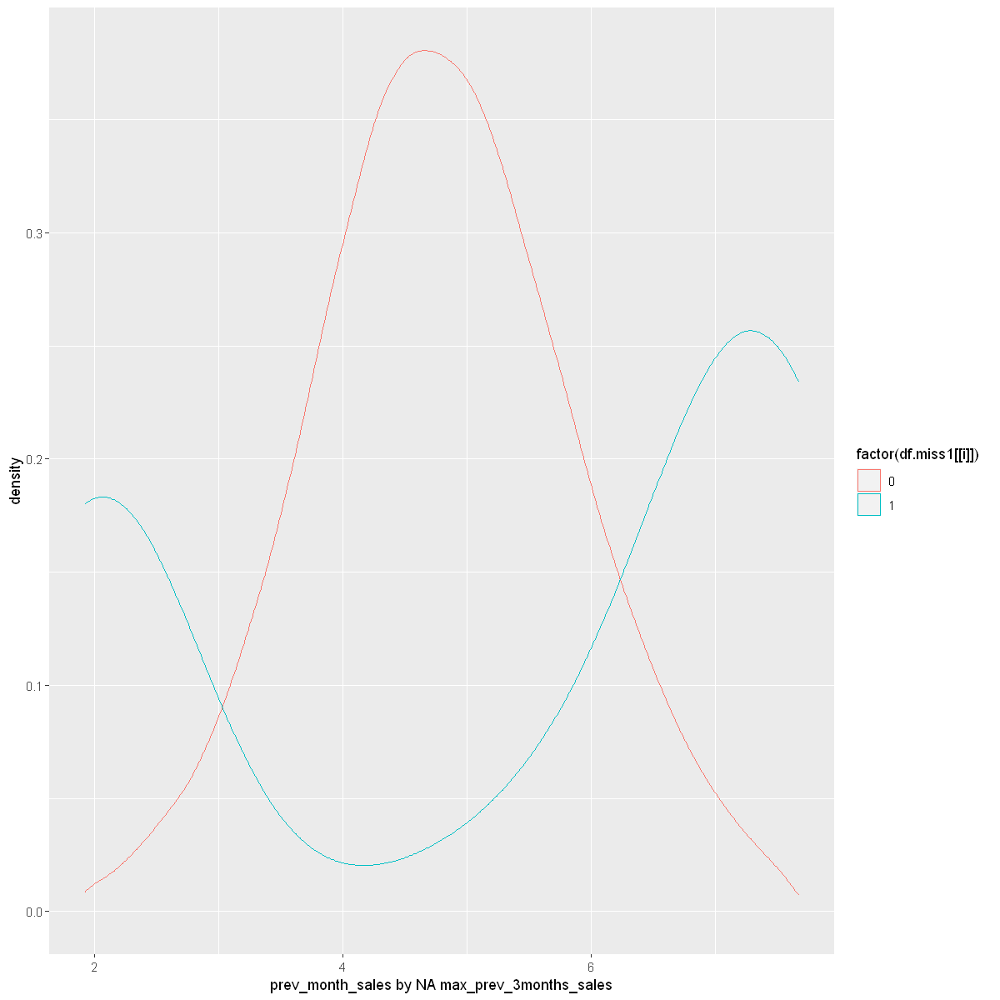


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -18.91, df = 8643.9, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.5141439 -0.4175636
sample estimates:
mean of x mean of y 
 4.801300  5.267153 

[1] "prev_3month_sales by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


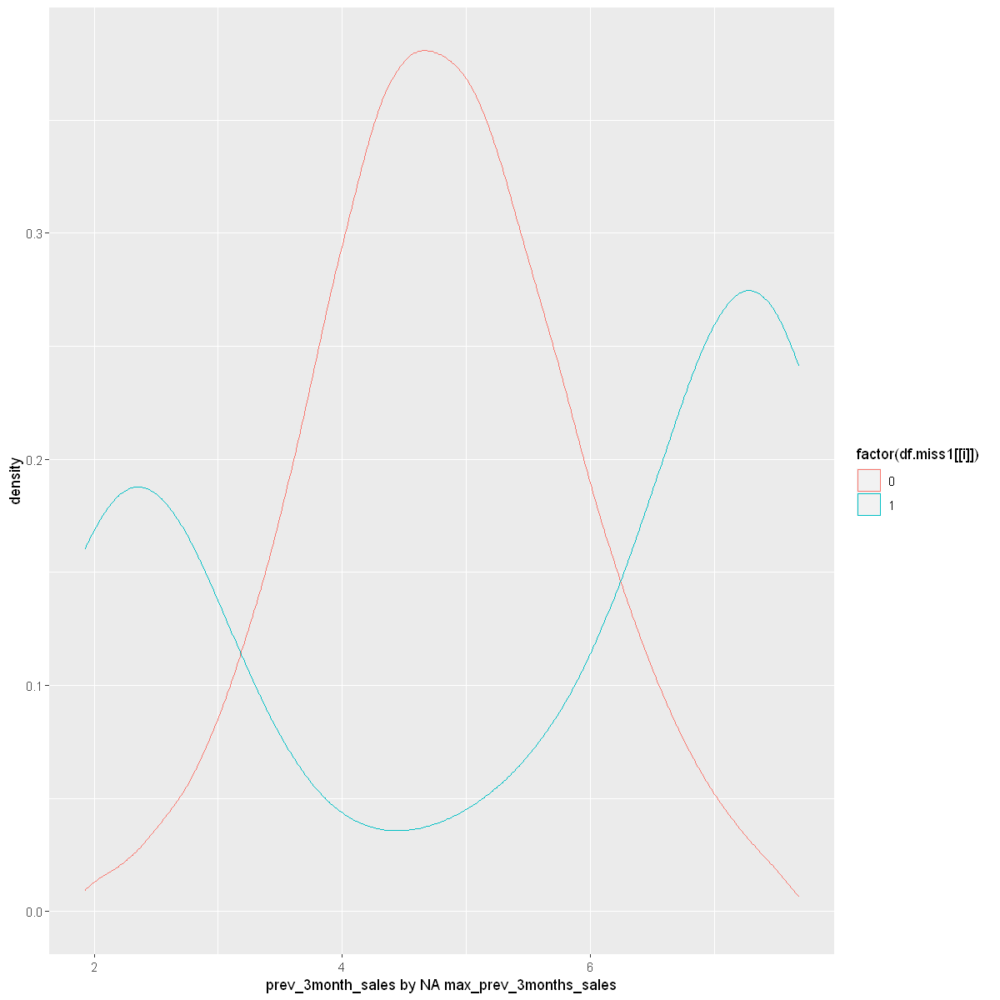


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -45.867, df = 3371.9, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.676102 -1.538679
sample estimates:
mean of x mean of y 
 4.813892  6.421282 

[1] "avg_prev_3months_sales by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


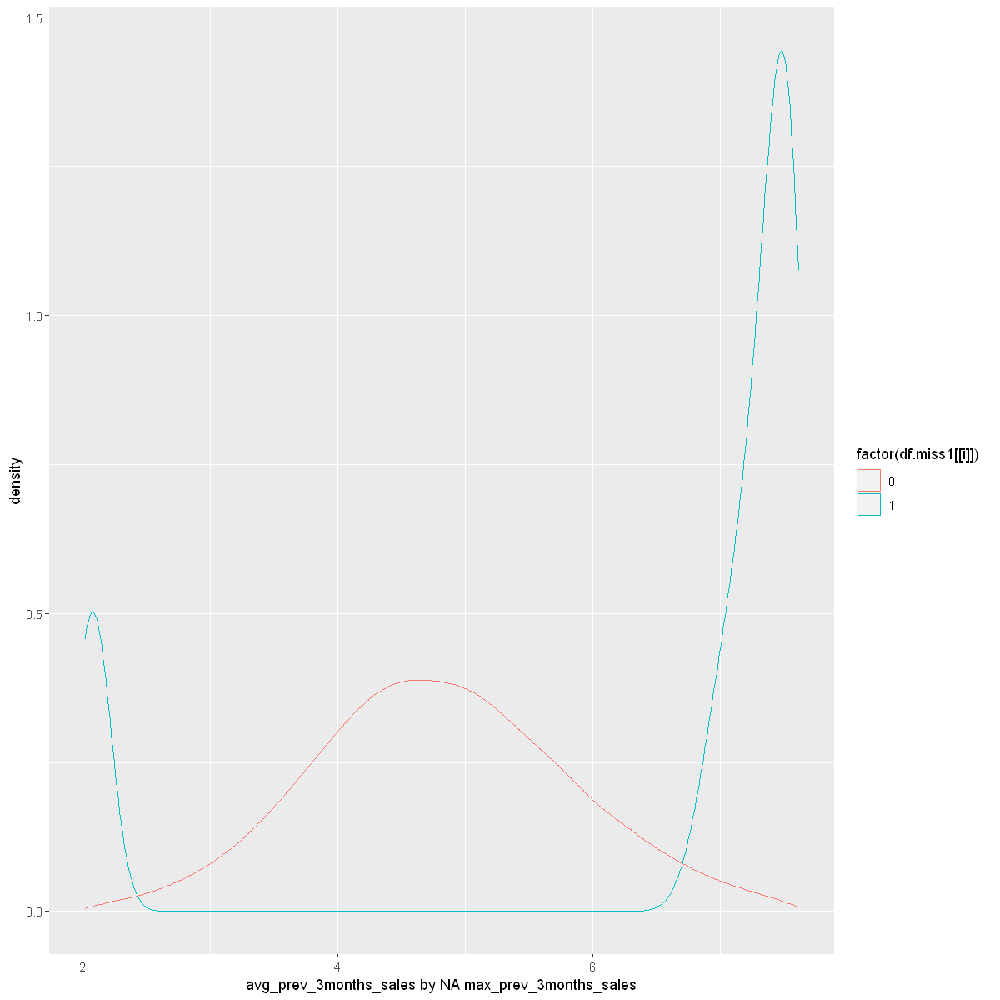


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -32.559, df = 7443.5, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9332818 -0.8272832
sample estimates:
mean of x mean of y 
 4.562609  5.442892 

[1] "min_prev_3months_sales by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


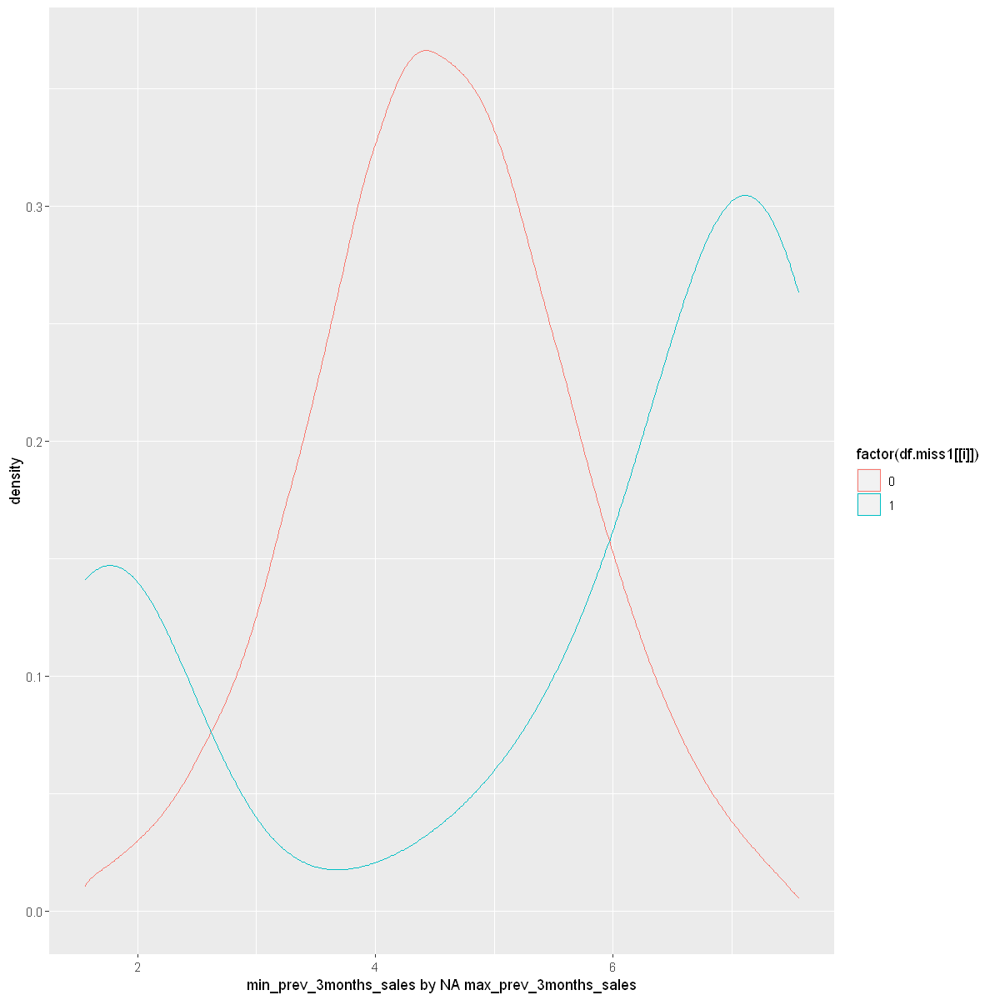


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -25.744, df = 17084, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -6088.053 -5226.585
sample estimates:
mean of x mean of y 
 46527.10  52184.42 

[1] "total_month_transactions by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


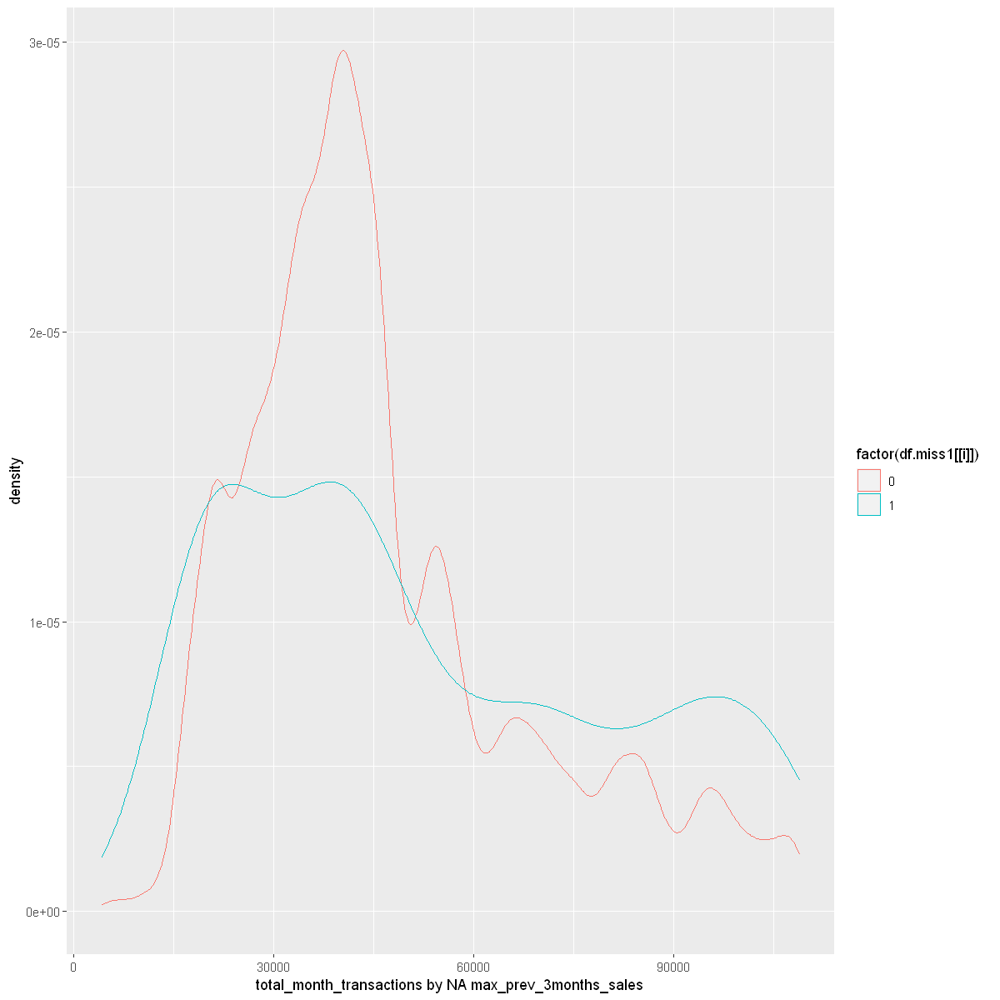


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -28.259, df = 17273, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -6711.264 -5840.650
sample estimates:
mean of x mean of y 
 47264.80  53540.76 

[1] "prev_month_transactions by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


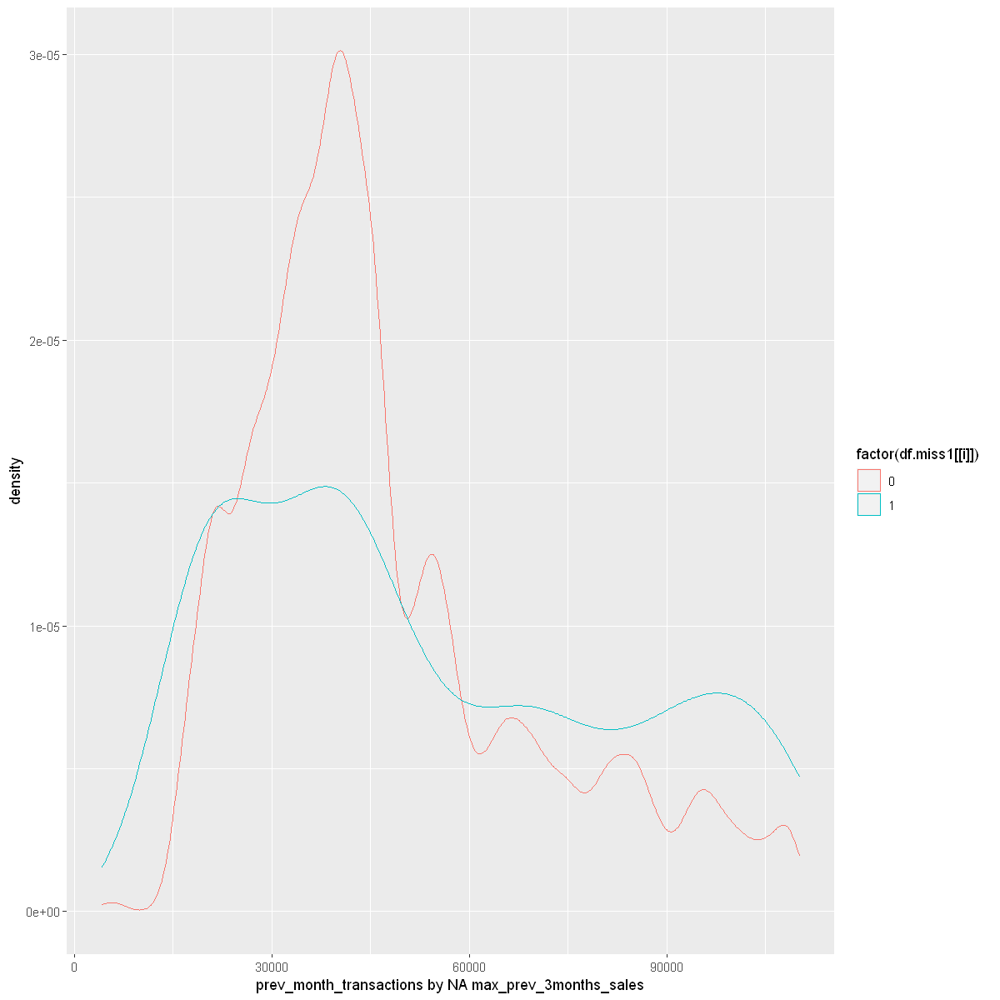


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -30.611, df = 17599, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -7275.698 -6400.002
sample estimates:
mean of x mean of y 
 47340.24  54178.09 

[1] "prev_3month_transactions by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


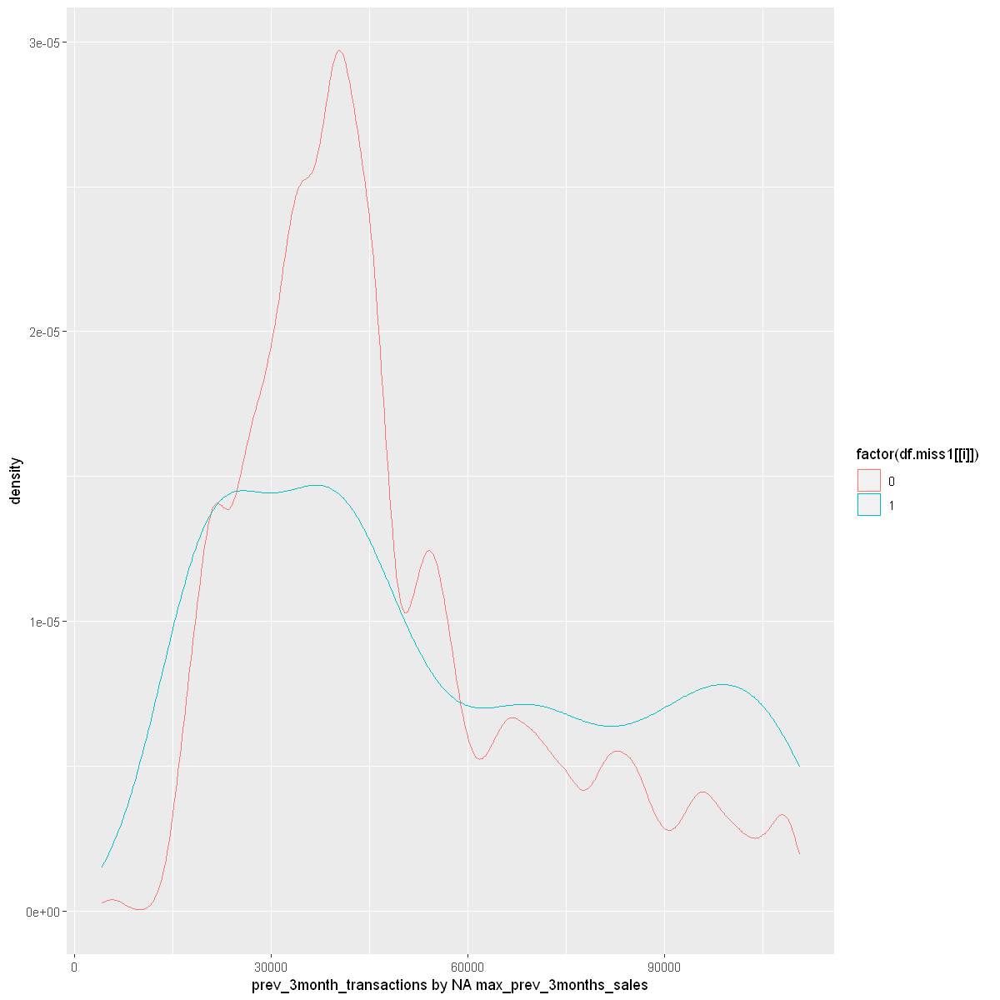


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -24.892, df = 16871, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -5851.725 -4997.431
sample estimates:
mean of x mean of y 
 46726.38  52150.95 

[1] "avg_prev_3months_transactions by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


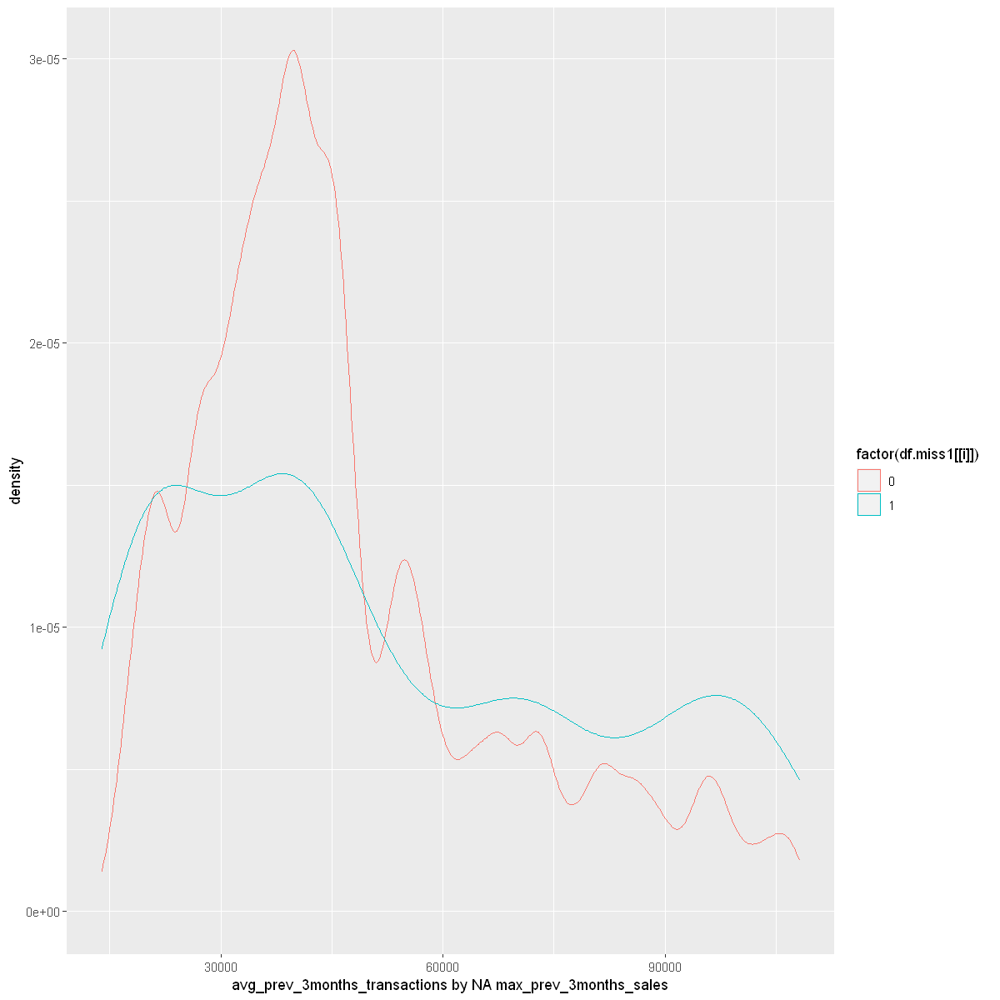


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -19.701, df = 16432, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -4366.167 -3575.983
sample estimates:
mean of x mean of y 
 43549.57  47520.65 

[1] "min_prev_3months_transactions by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


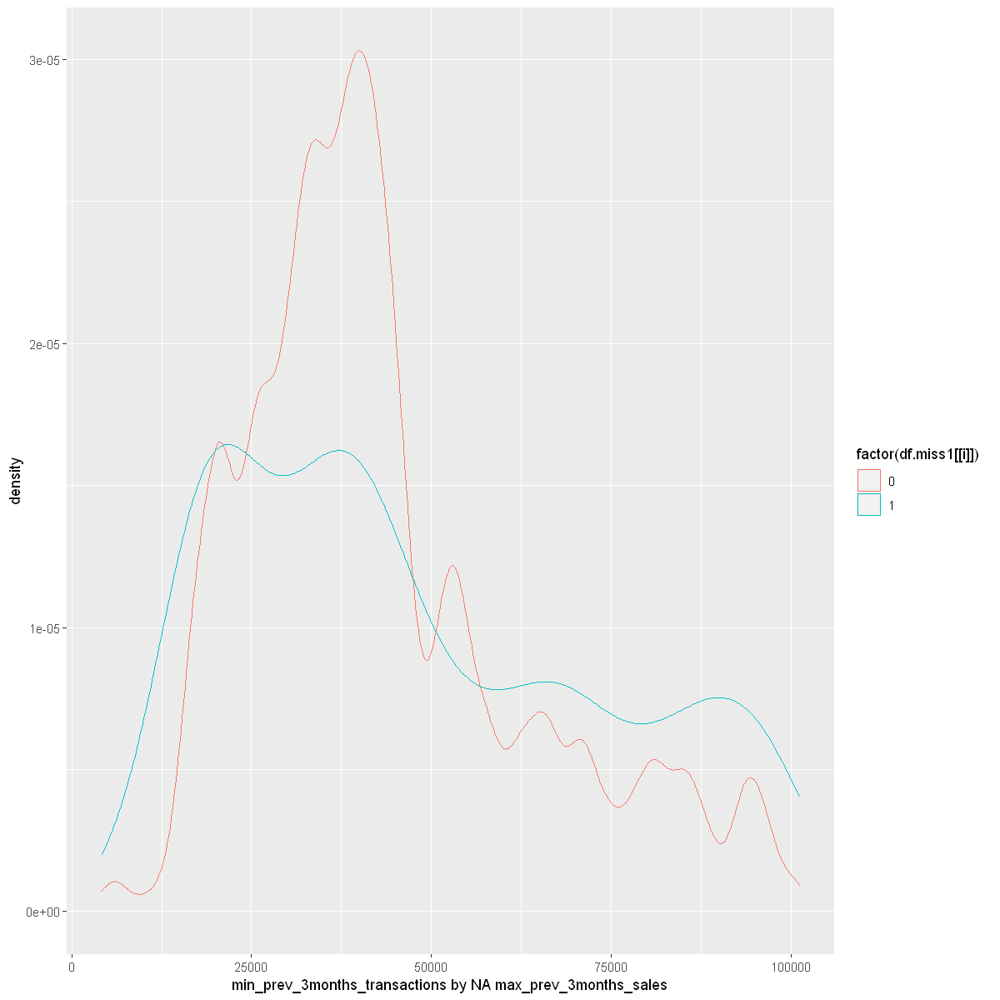


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -26.616, df = 17018, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -6640.122 -5729.196
sample estimates:
mean of x mean of y 
 49699.55  55884.20 

[1] "max_prev_3months_transactions by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


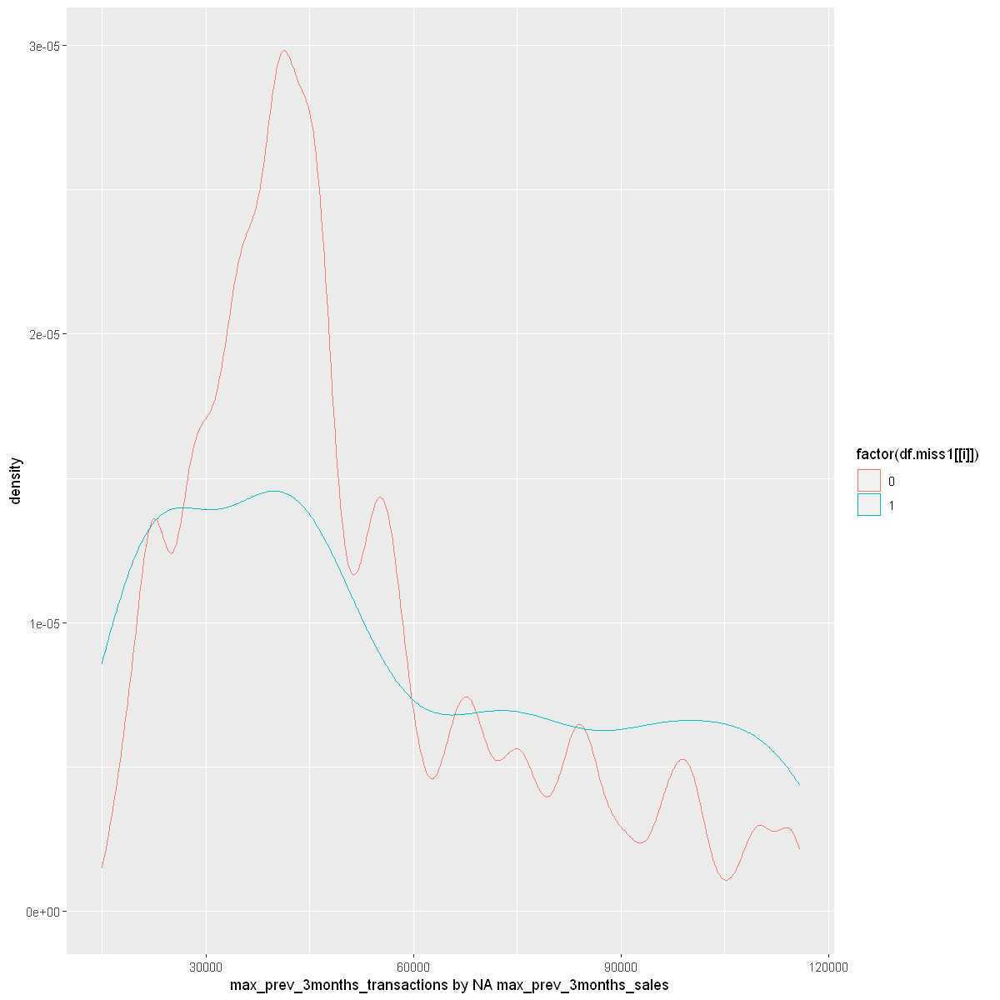


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -68.677, df = 20982, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.388546 -1.311485
sample estimates:
mean of x mean of y 
 4.761379  6.111394 

[1] "total_unit_sales by NA max_prev_3months_sales"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


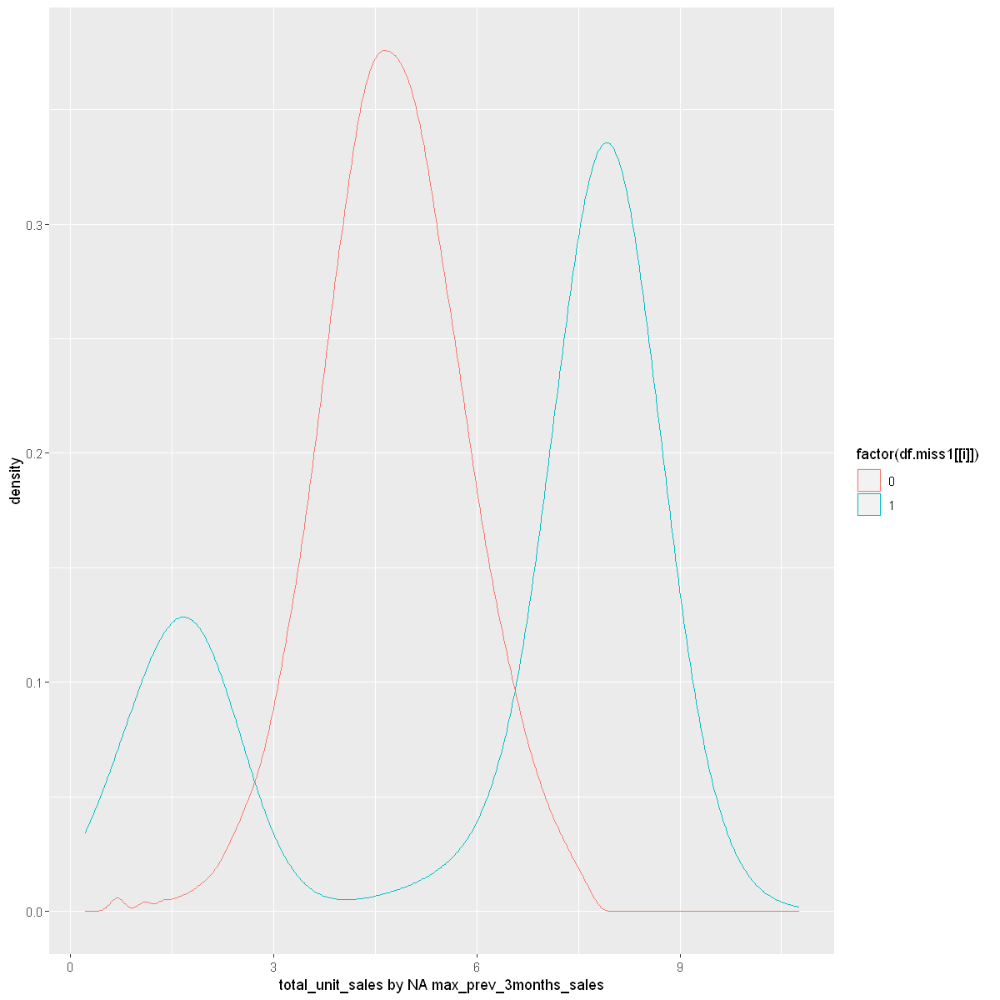


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -356.81, df = 141847, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9476165 -0.9372626
sample estimates:
mean of x mean of y 
 4.743527  5.685967 

[1] "prev_month_sales by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."


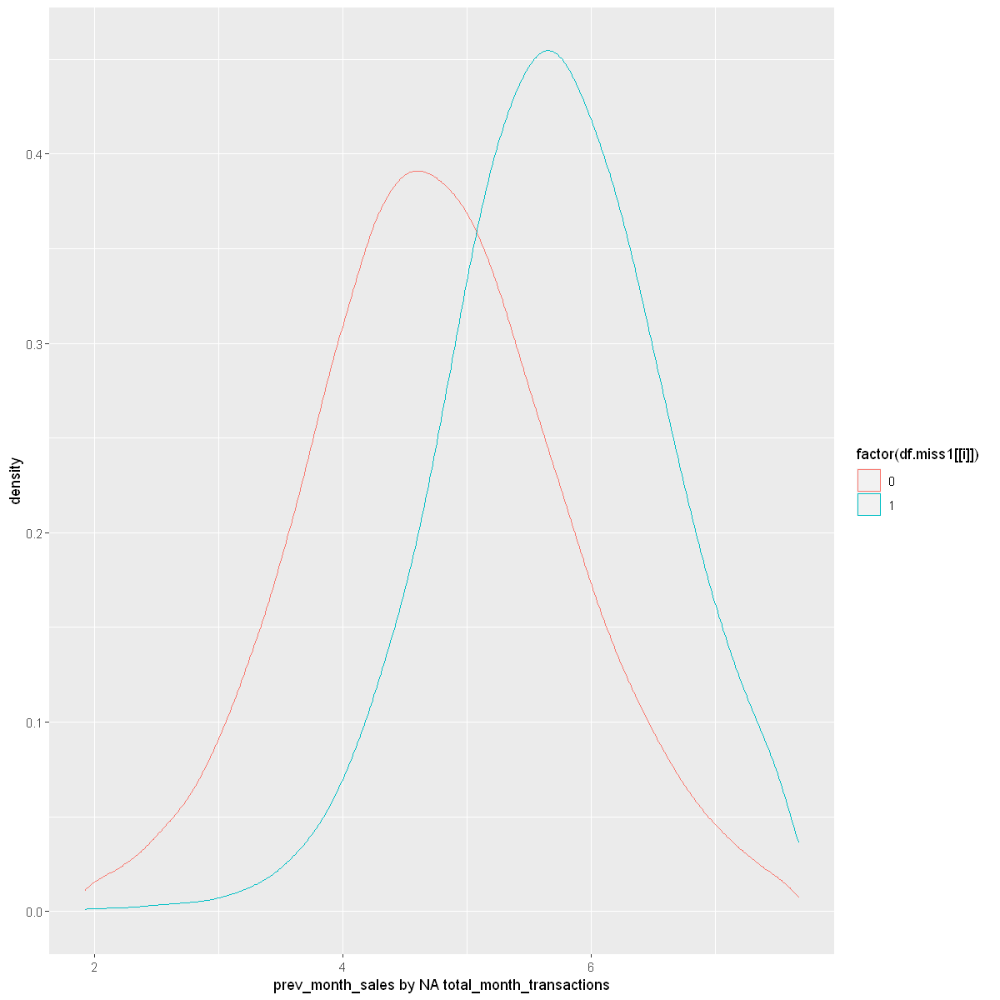


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -357.53, df = 142041, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9485617 -0.9382183
sample estimates:
mean of x mean of y 
 4.745601  5.688991 

[1] "prev_3month_sales by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


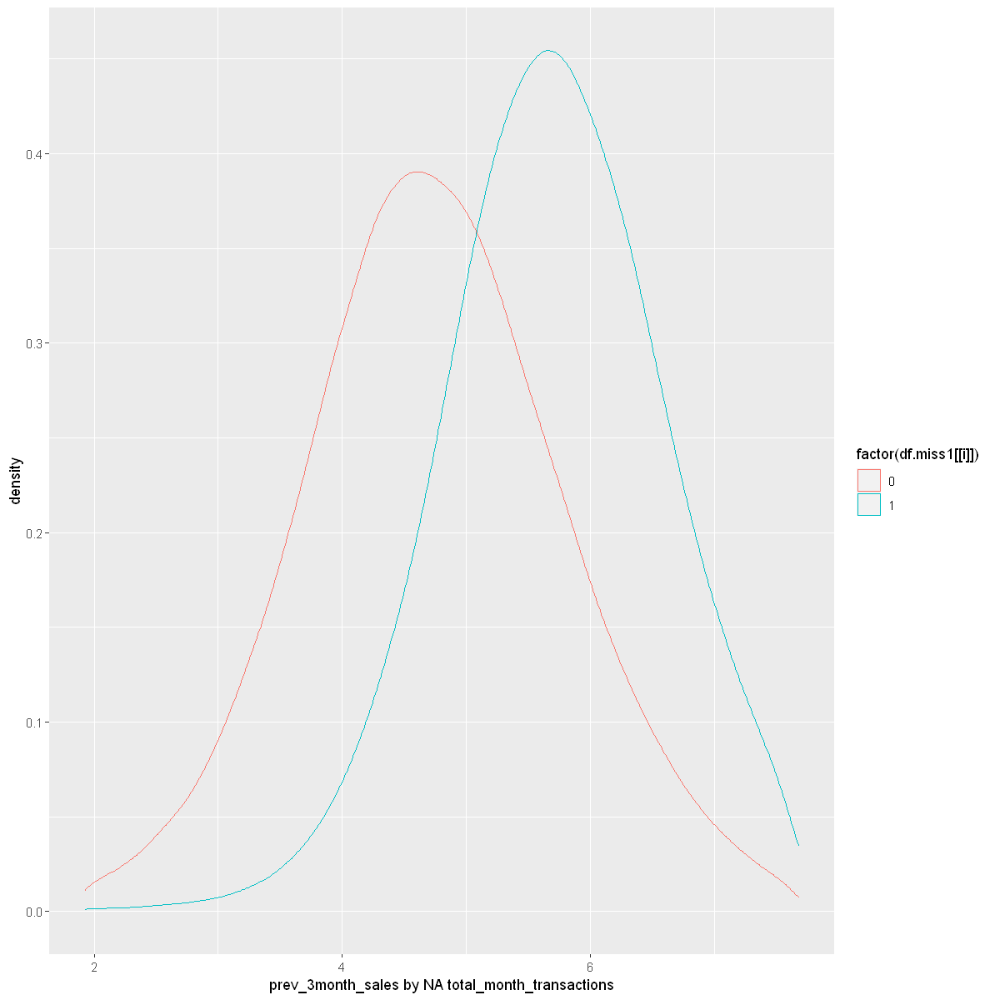


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -378.27, df = 142503, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9581663 -0.9482882
sample estimates:
mean of x mean of y 
 4.758574  5.711801 

[1] "avg_prev_3months_sales by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


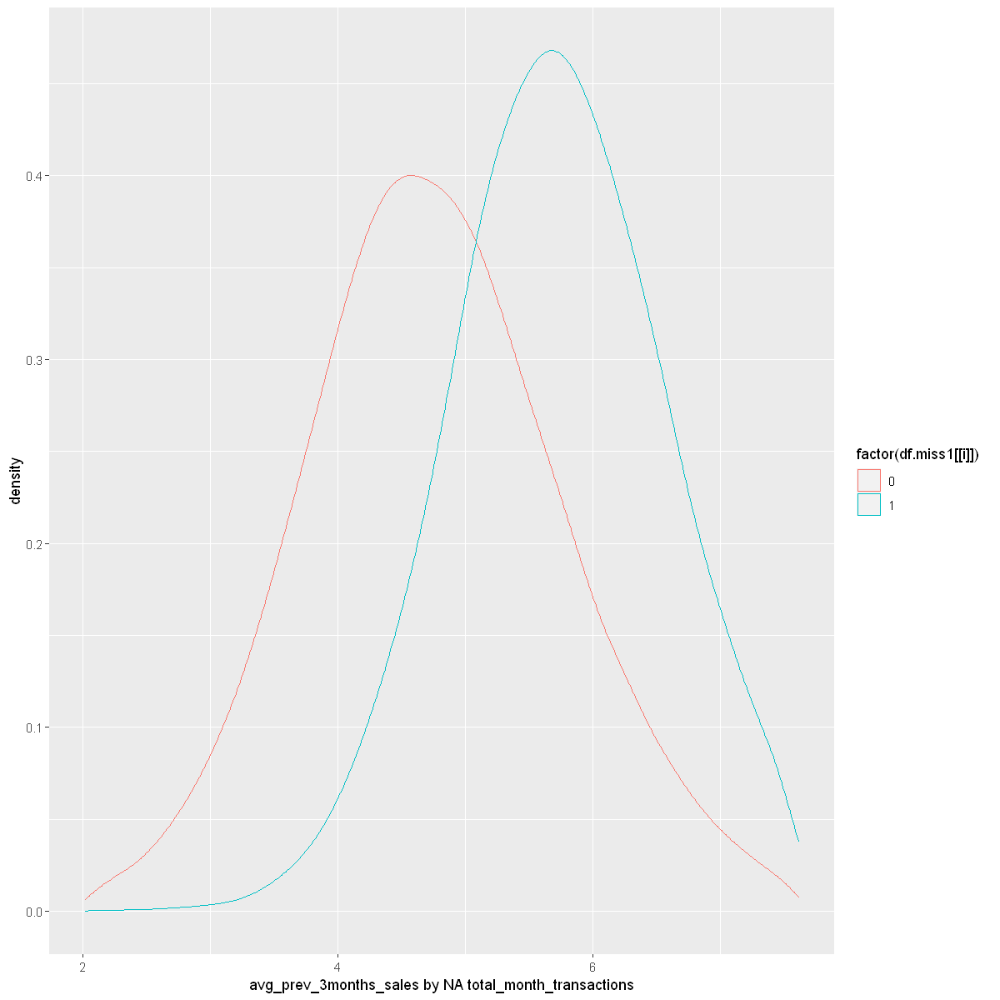


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -361.71, df = 141988, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.0069359 -0.9960823
sample estimates:
mean of x mean of y 
 4.504482  5.505991 

[1] "min_prev_3months_sales by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


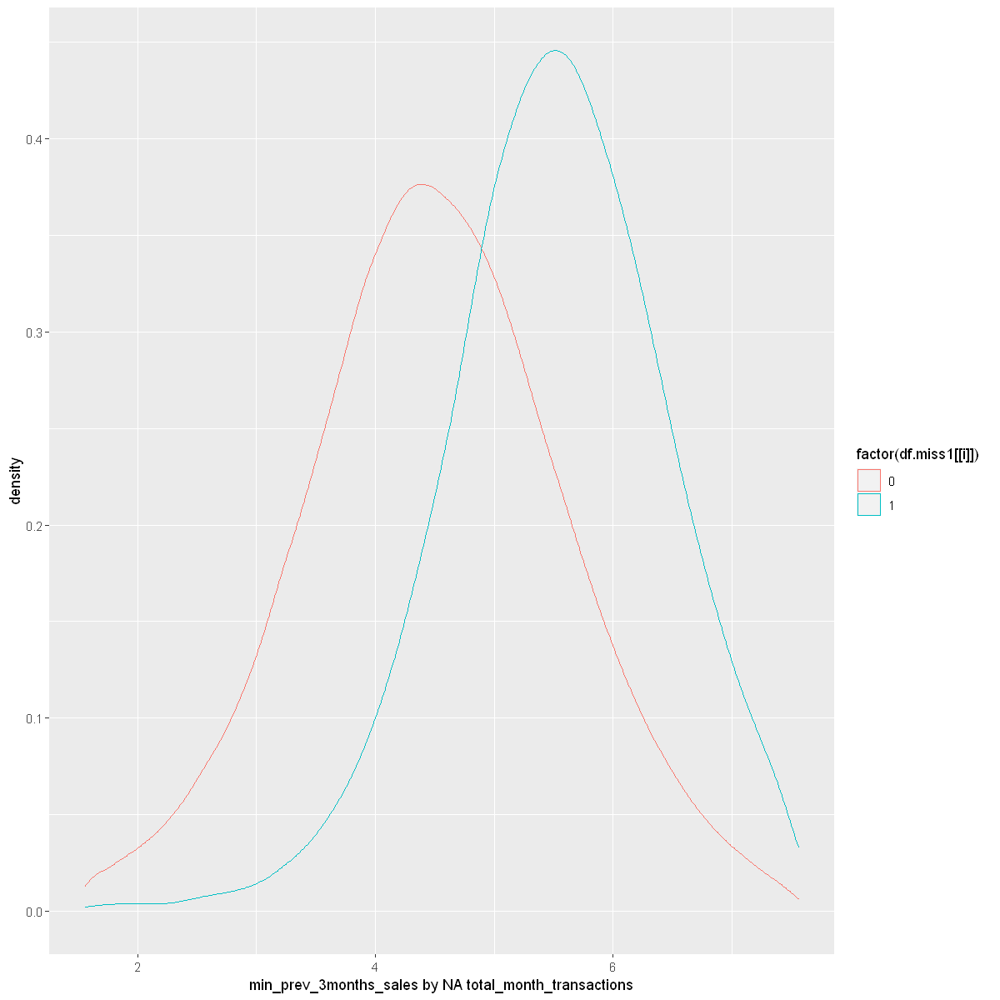


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -370.87, df = 141858, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9265734 -0.9168313
sample estimates:
mean of x mean of y 
 4.952812  5.874515 

[1] "max_prev_3months_sales by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


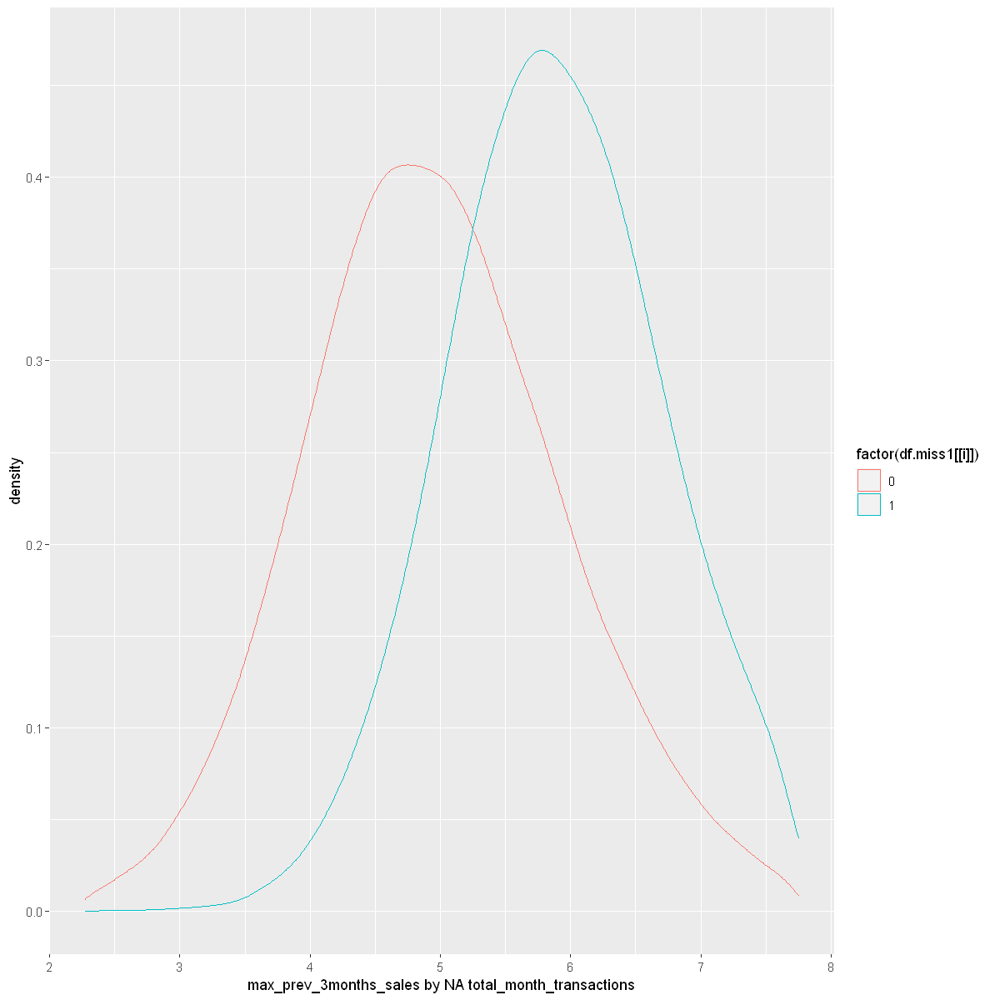


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1305.8, df = 45465, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -56483.92 -56314.61
sample estimates:
mean of x mean of y 
 46264.64 102663.90 

[1] "prev_month_transactions by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


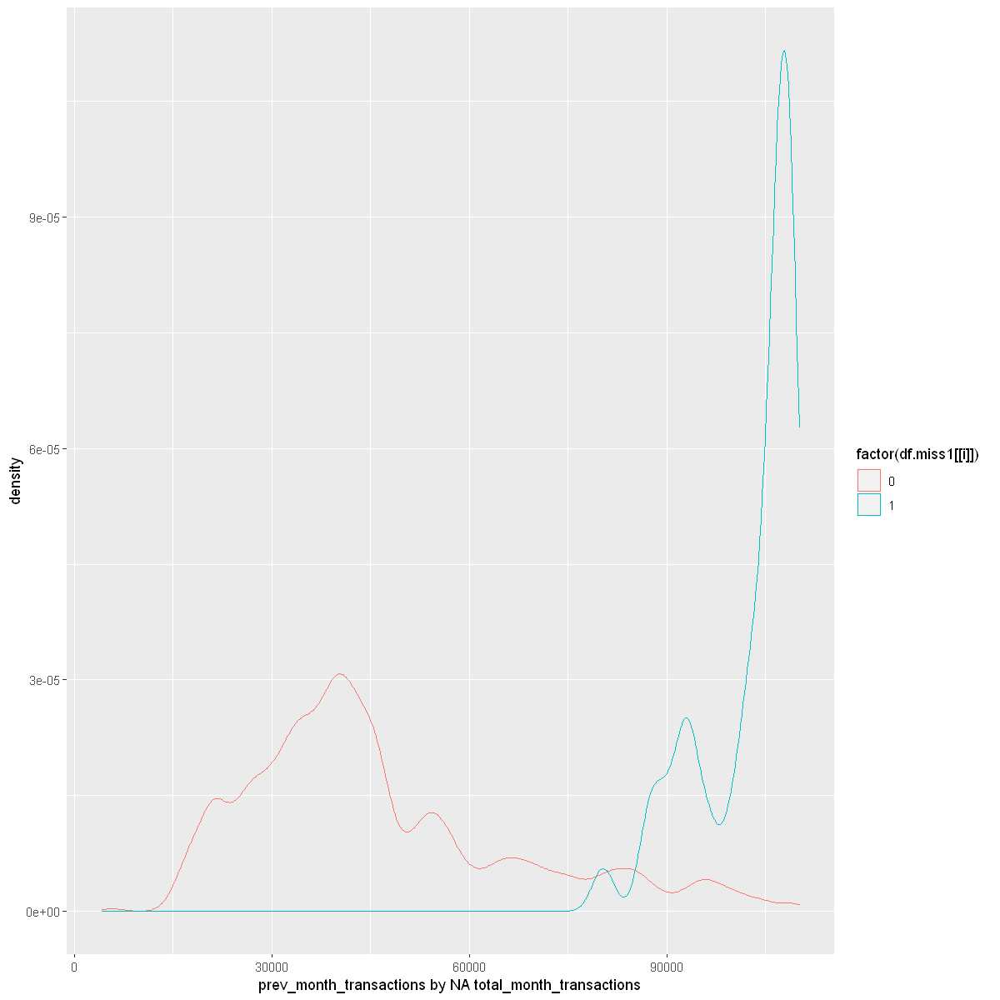


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1252.8, df = 47879, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -55857.72 -55683.22
sample estimates:
mean of x mean of y 
 46292.68 102063.15 

[1] "prev_3month_transactions by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


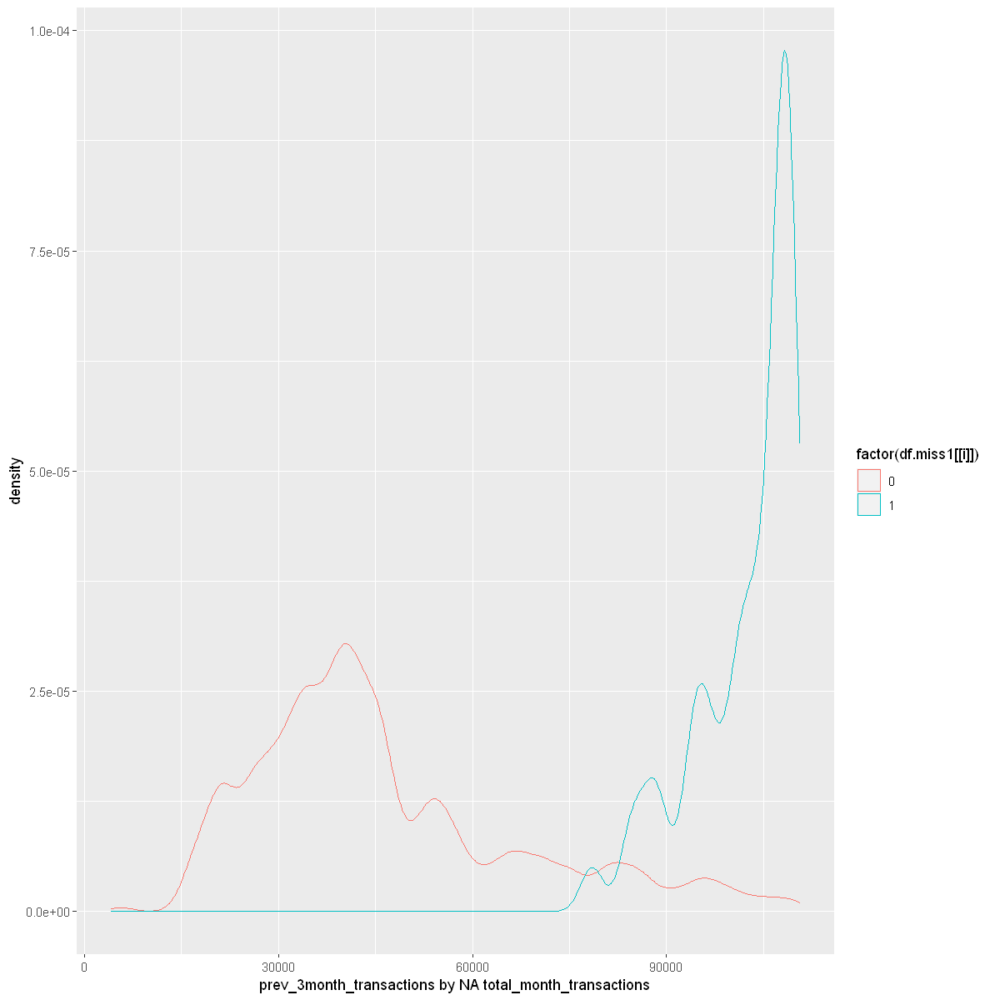


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1387.8, df = 21217, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -57057.04 -56896.11
sample estimates:
mean of x mean of y 
 46288.35 103264.92 

[1] "avg_prev_3months_transactions by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


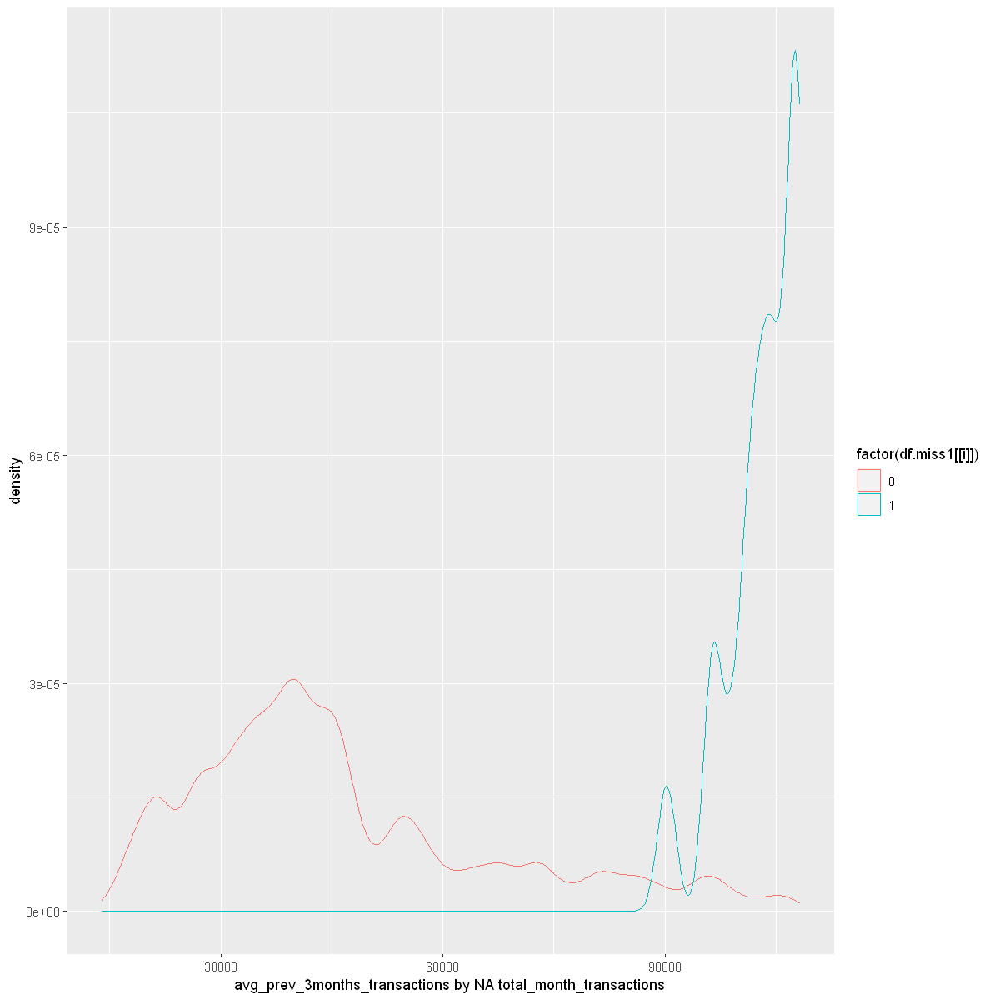


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -932.28, df = 15647, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -50624.14 -50411.71
sample estimates:
mean of x mean of y 
 43212.36  93730.28 

[1] "min_prev_3months_transactions by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


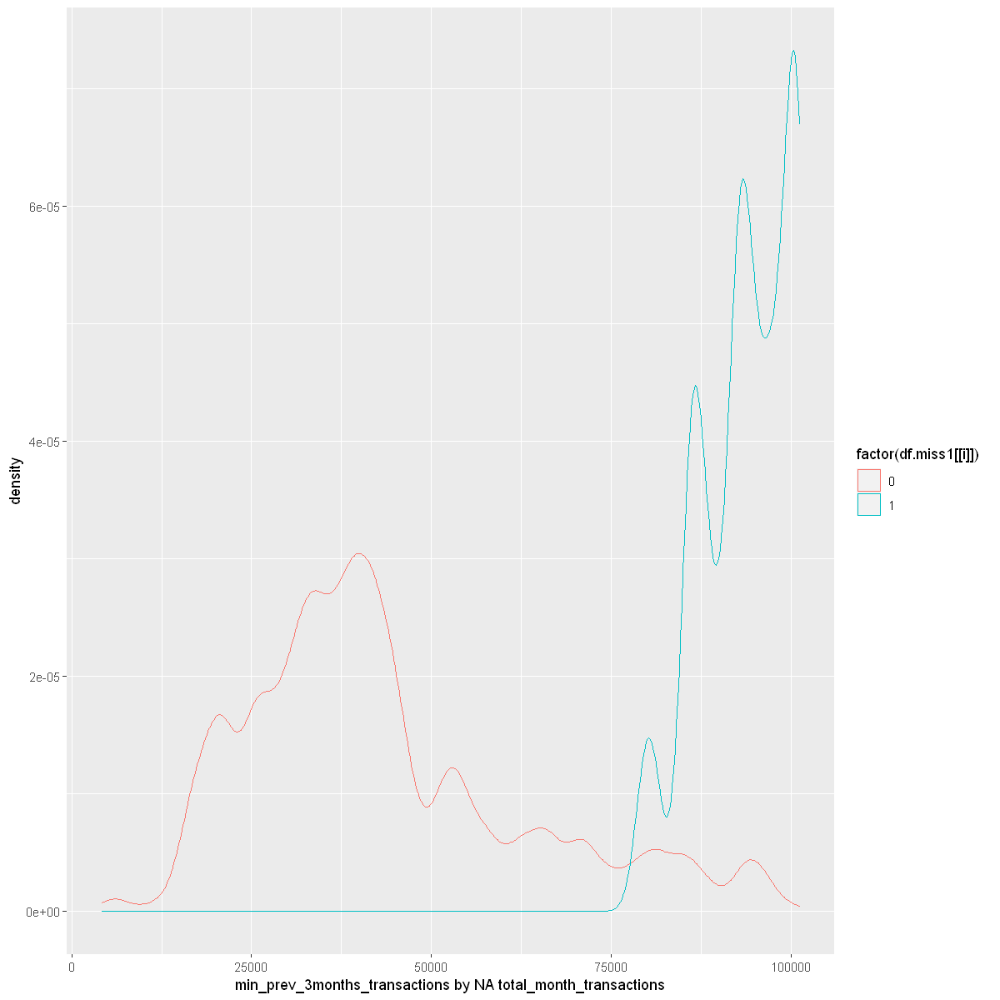


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3160, df = 159295, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -64260.95 -64181.28
sample estimates:
mean of x mean of y 
 48889.75 113110.87 

[1] "max_prev_3months_transactions by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


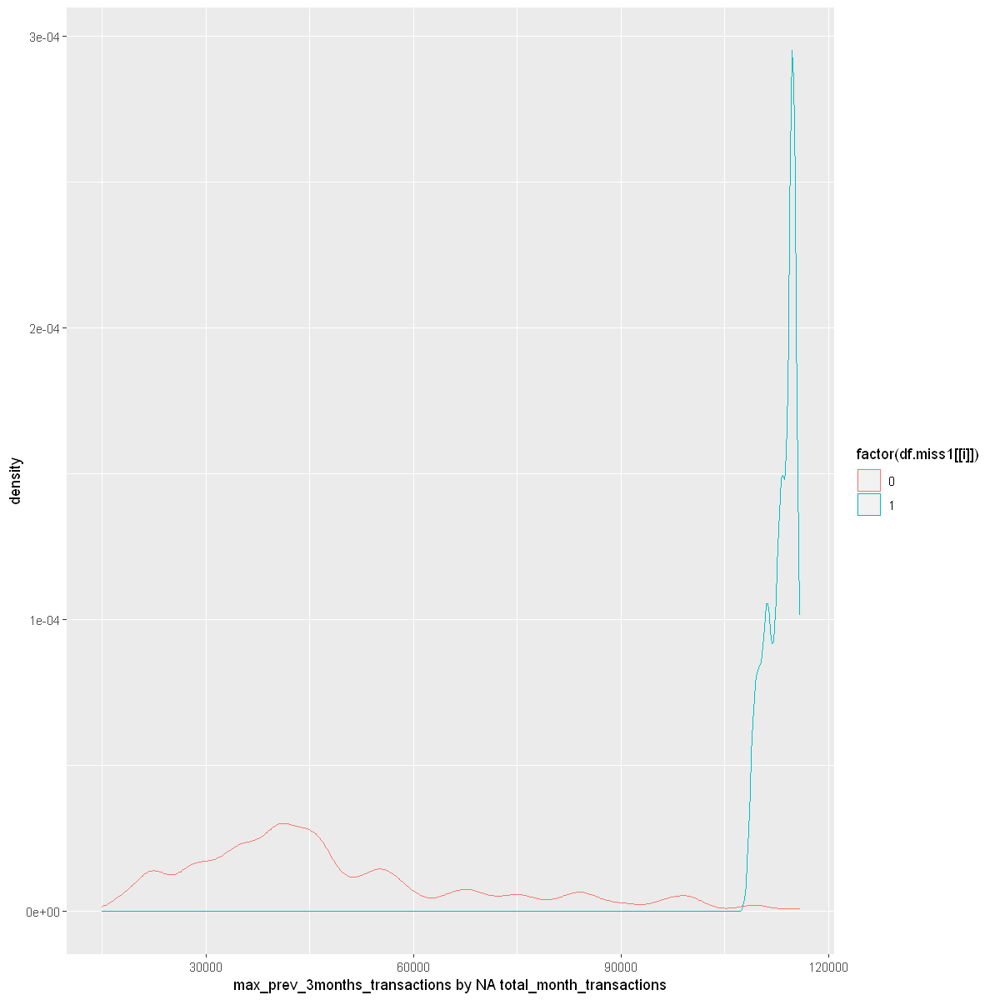


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -366.21, df = 144902, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.060260 -1.048971
sample estimates:
mean of x mean of y 
 4.710055  5.764671 

[1] "total_unit_sales by NA total_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


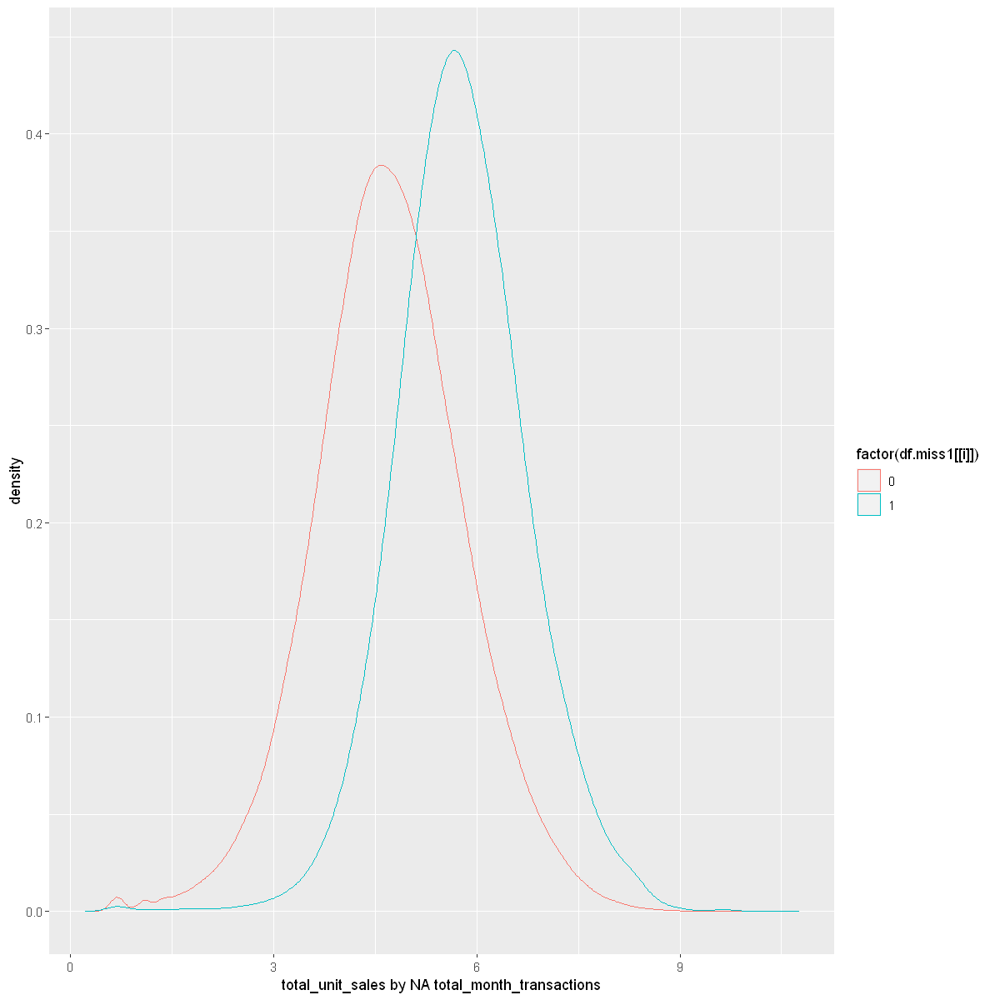


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -358.04, df = 132878, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9720096 -0.9614256
sample estimates:
mean of x mean of y 
 4.745310  5.712028 

[1] "prev_month_sales by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."


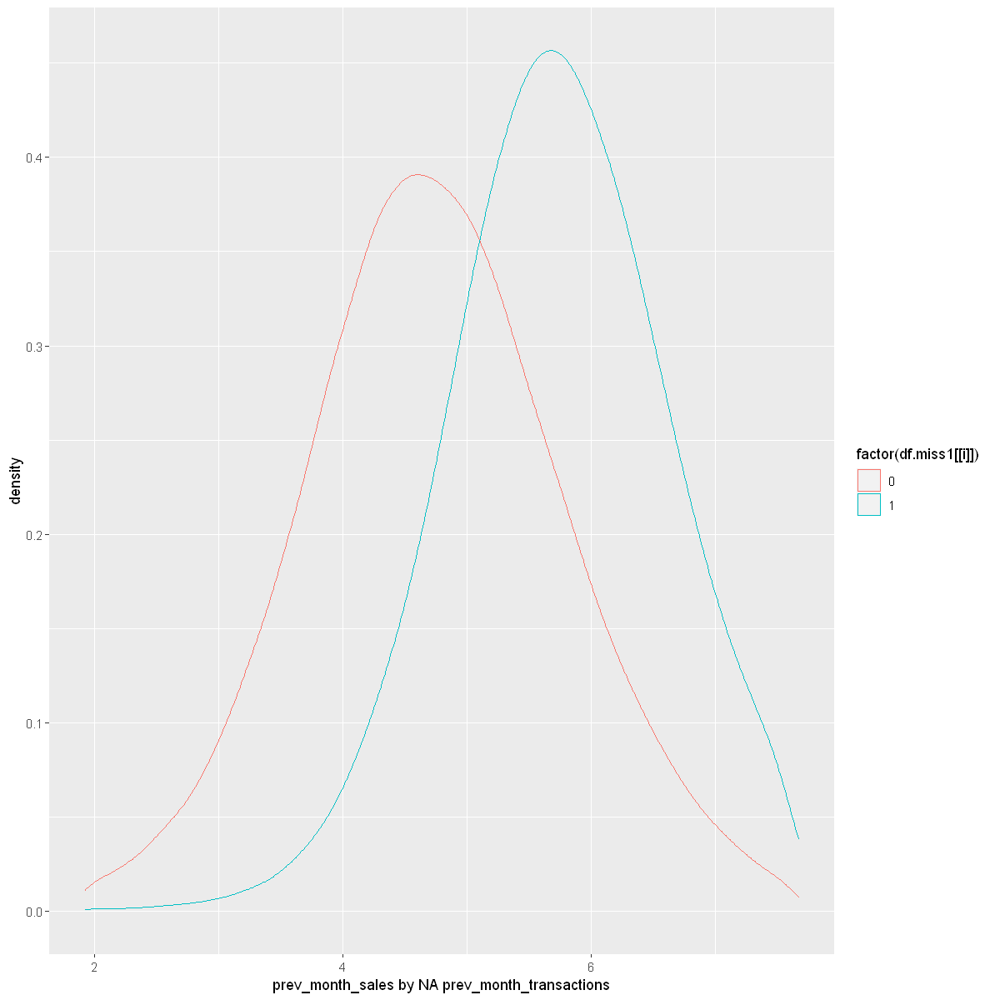


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -347.34, df = 133125, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9454279 -0.9348181
sample estimates:
mean of x mean of y 
 4.748912  5.689035 

[1] "prev_3month_sales by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


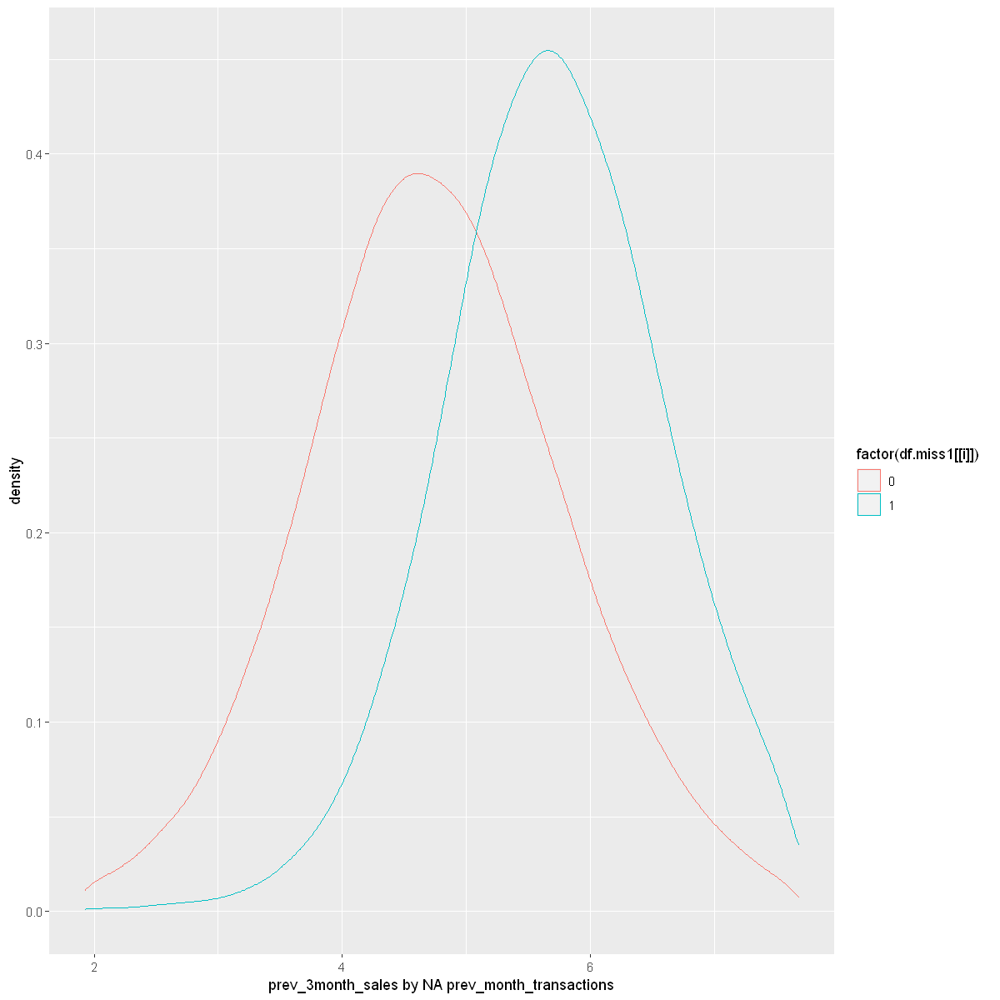


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -366.44, df = 133384, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9545732 -0.9444160
sample estimates:
mean of x mean of y 
 4.761939  5.711434 

[1] "avg_prev_3months_sales by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


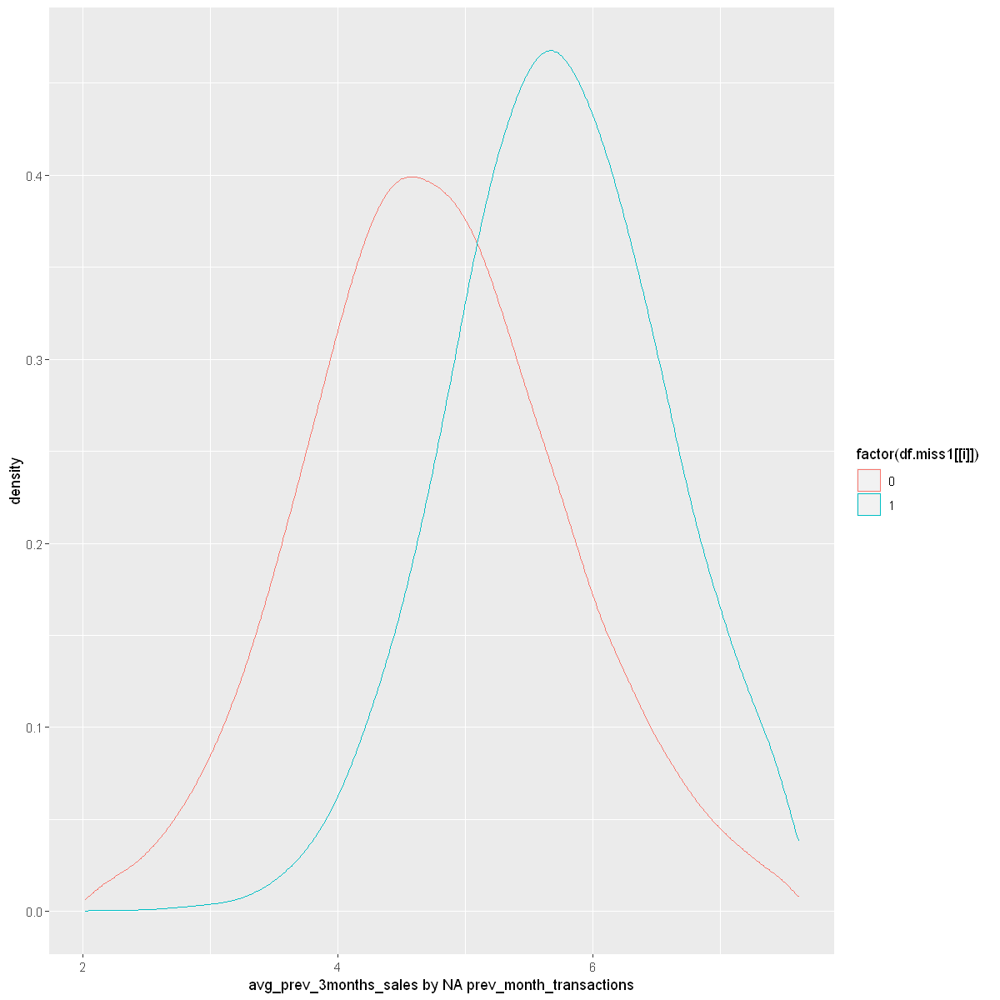


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -345.73, df = 132880, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9920563 -0.9808715
sample estimates:
mean of x mean of y 
 4.508681  5.495145 

[1] "min_prev_3months_sales by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


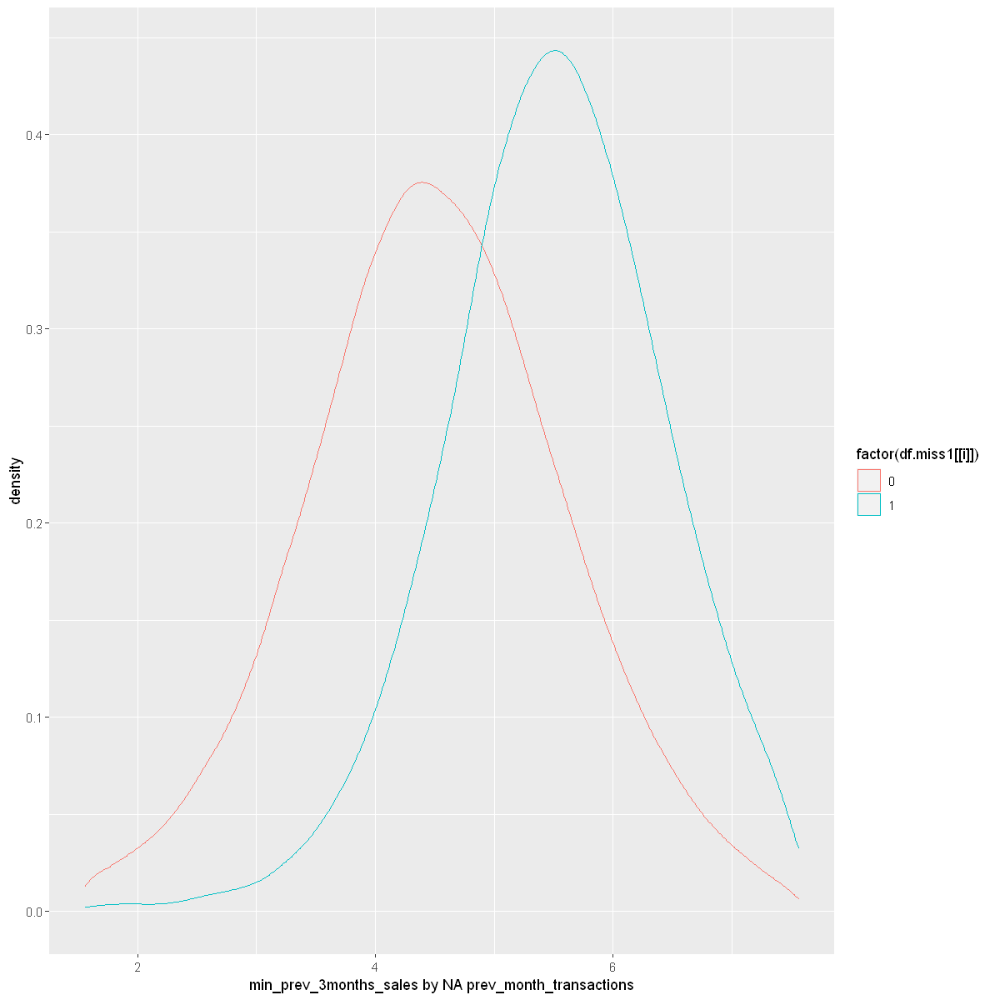


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -360.77, df = 132751, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9269827 -0.9169650
sample estimates:
mean of x mean of y 
 4.955853  5.877827 

[1] "max_prev_3months_sales by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


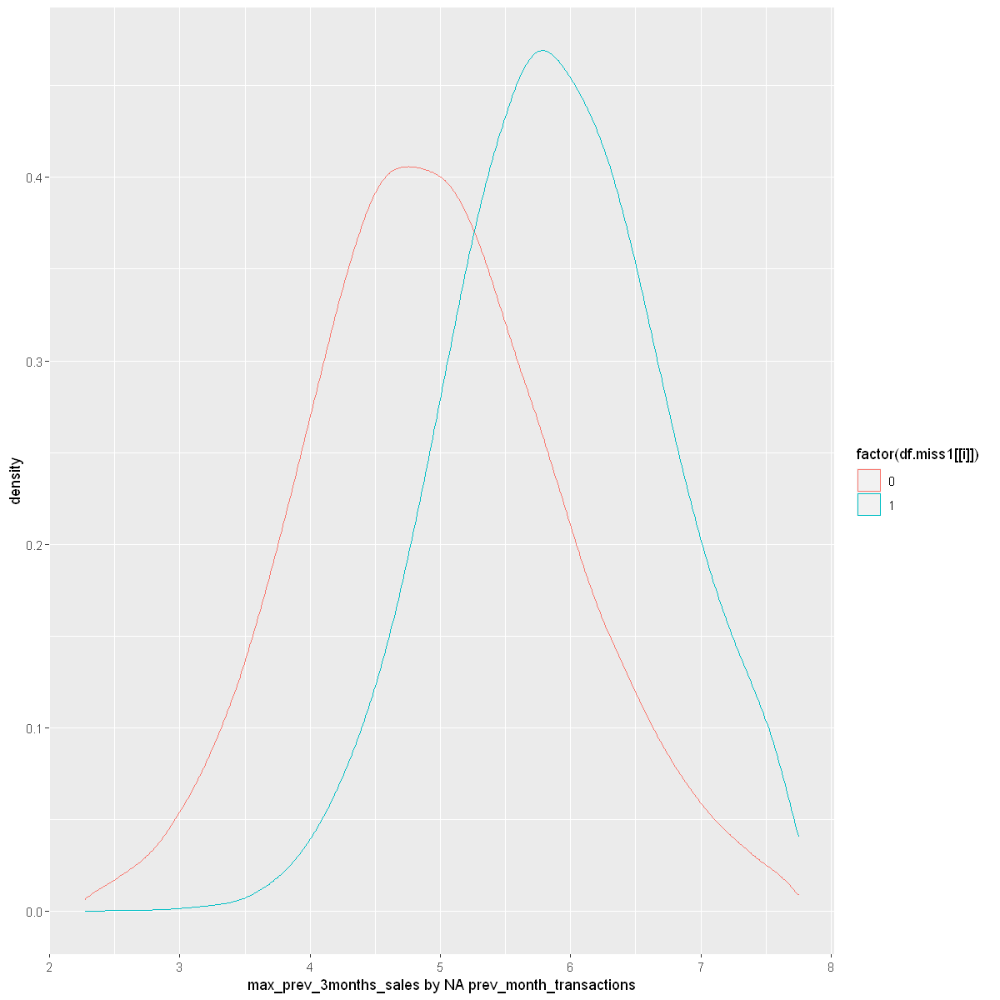


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -618.83, df = 30210, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -51712.45 -51385.90
sample estimates:
mean of x mean of y 
 45793.93  97343.10 

[1] "total_month_transactions by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


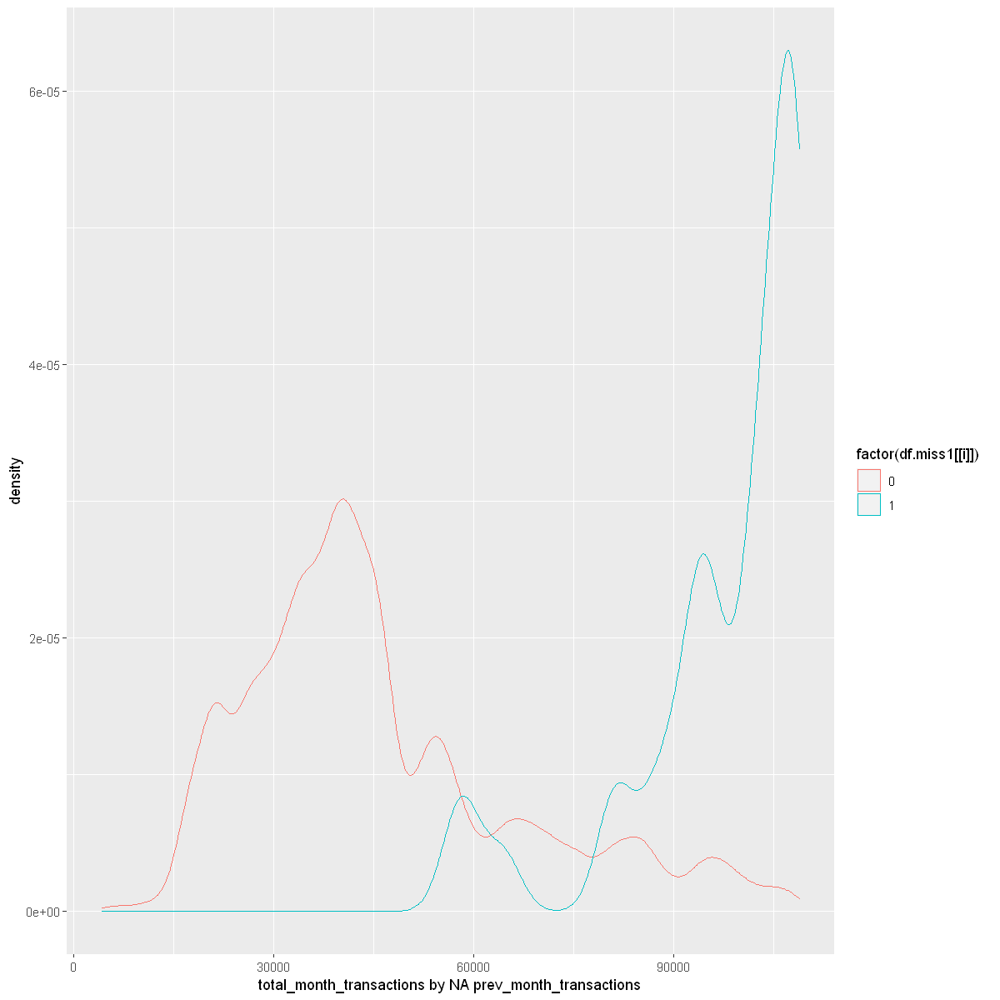


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1400.1, df = 45847, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -56888.12 -56729.07
sample estimates:
mean of x mean of y 
 46380.71 103189.31 

[1] "prev_3month_transactions by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


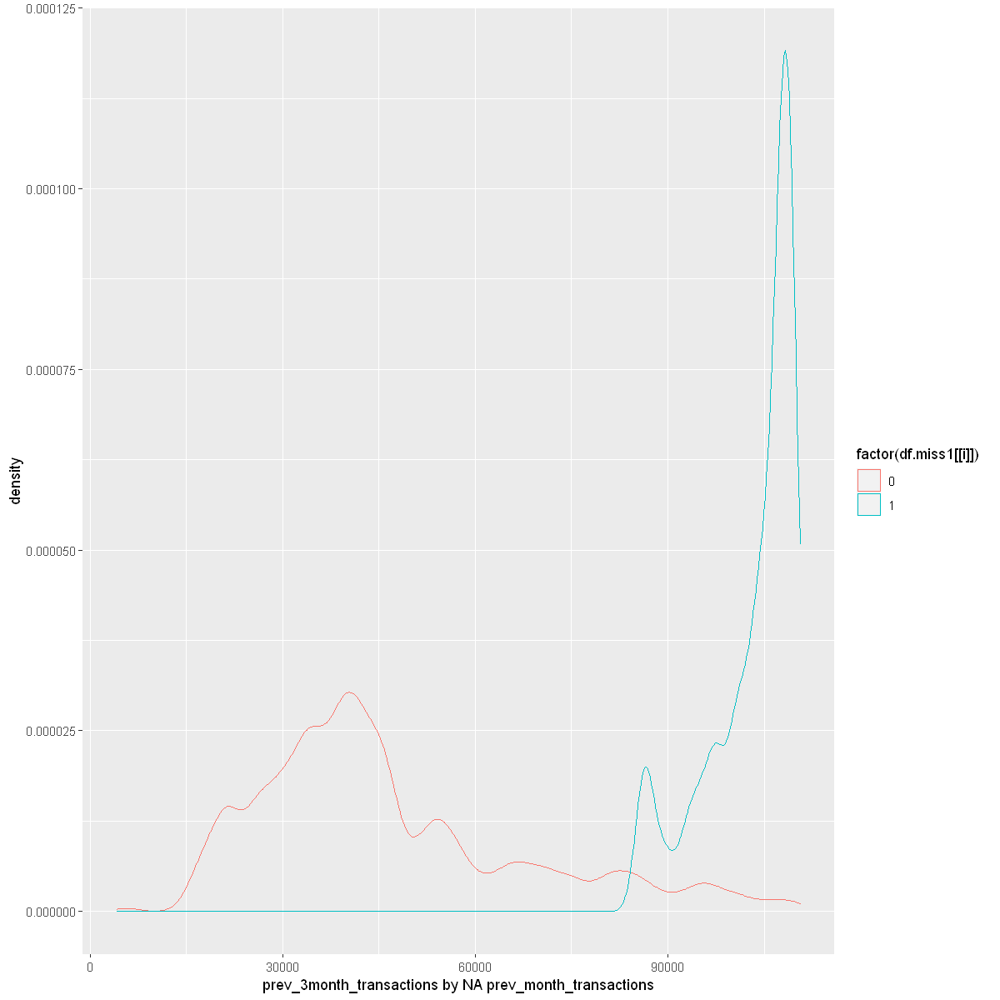


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1476.5, df = 19007, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -55419.20 -55272.25
sample estimates:
mean of x mean of y 
 46379.76 101725.49 

[1] "avg_prev_3months_transactions by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


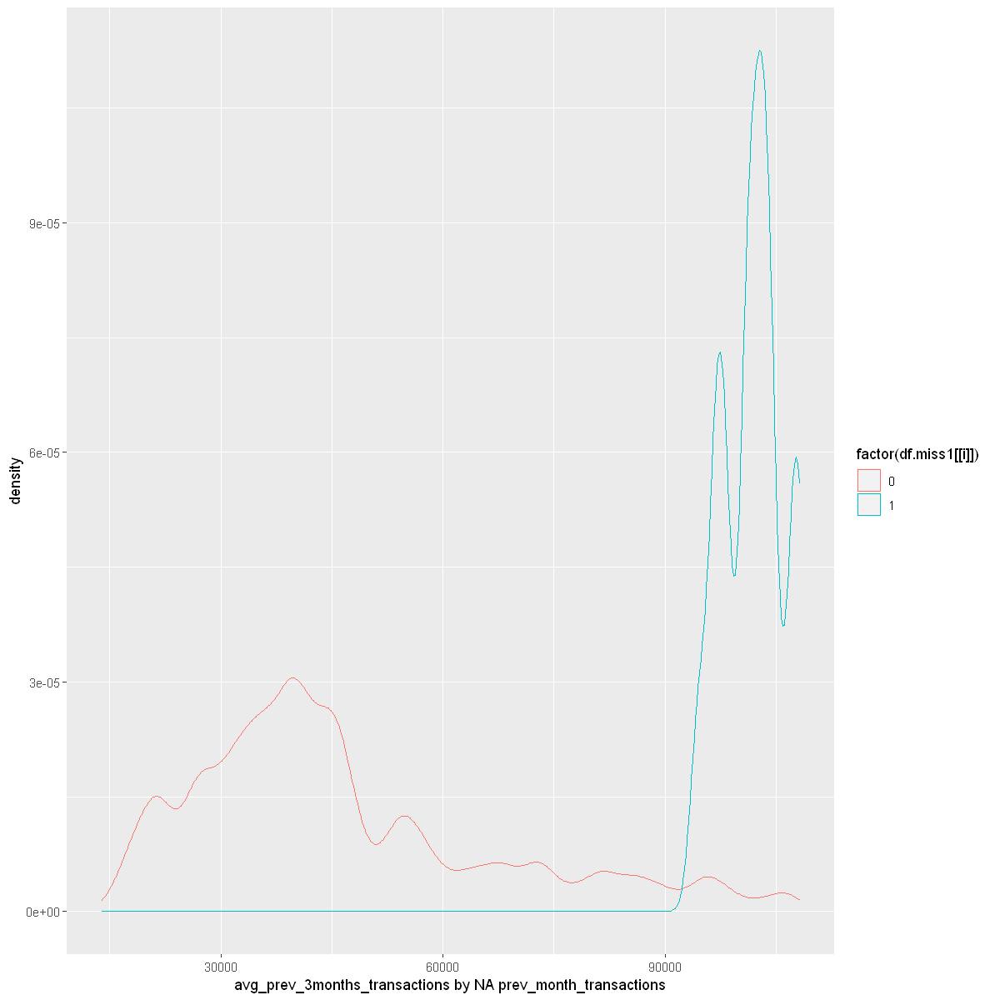


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -406.1, df = 15378, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -44439.11 -44012.18
sample estimates:
mean of x mean of y 
 43226.76  87452.40 

[1] "min_prev_3months_transactions by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


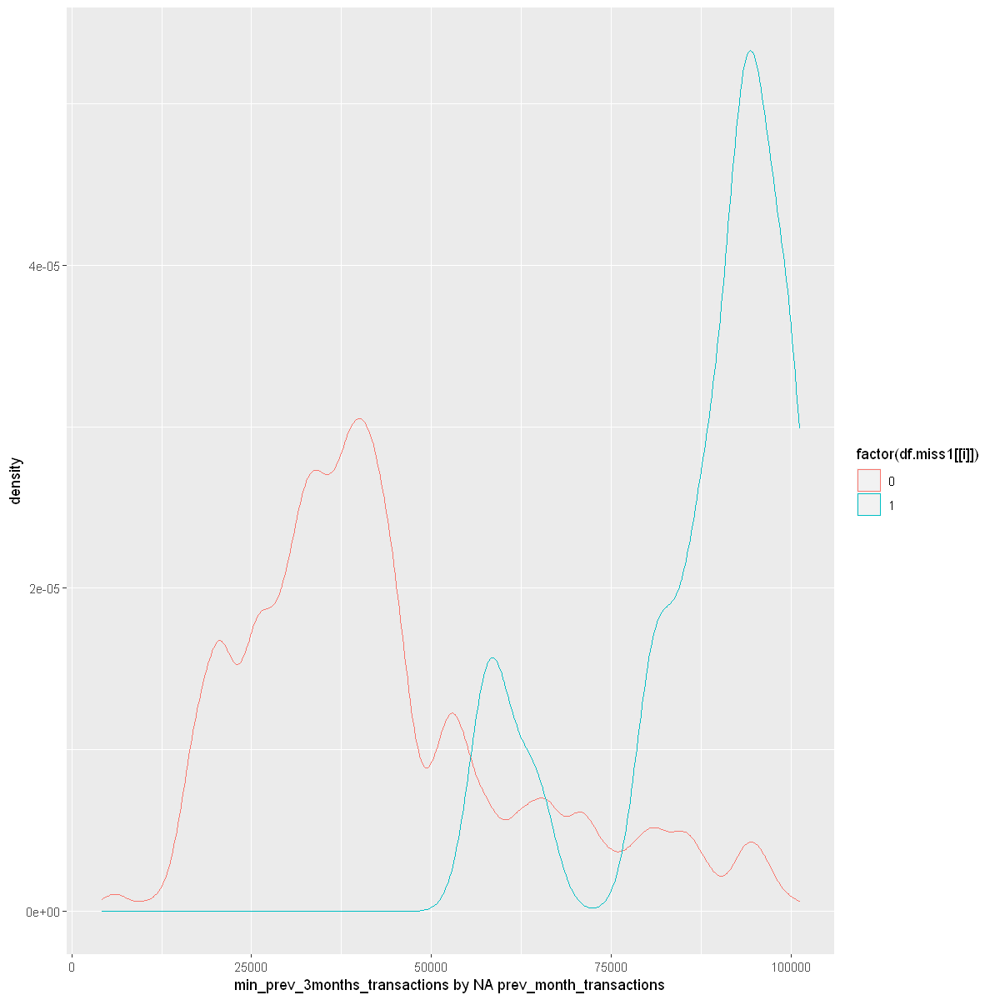


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3221.8, df = 140581, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -64547.00 -64468.51
sample estimates:
mean of x mean of y 
 49113.84 113621.60 

[1] "max_prev_3months_transactions by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


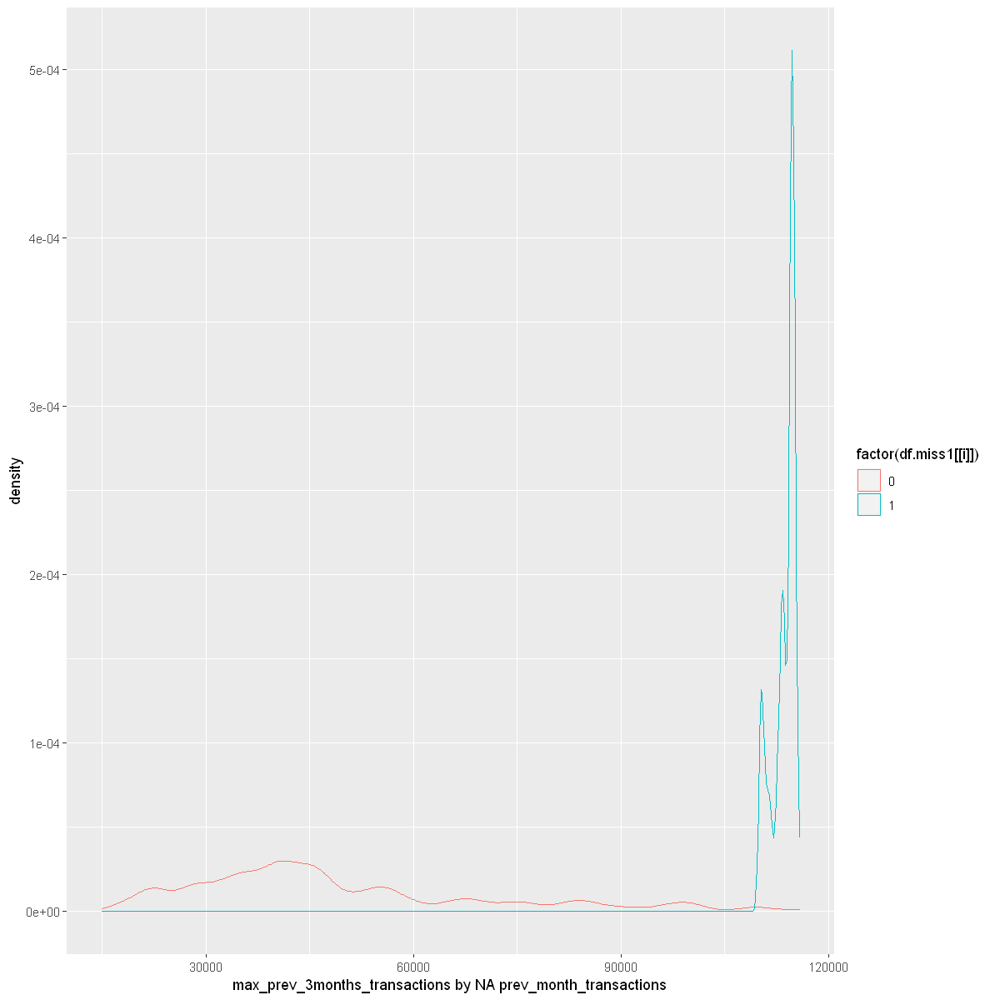


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -341.11, df = 135646, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.020004 -1.008349
sample estimates:
mean of x mean of y 
 4.715995  5.730171 

[1] "total_unit_sales by NA prev_month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


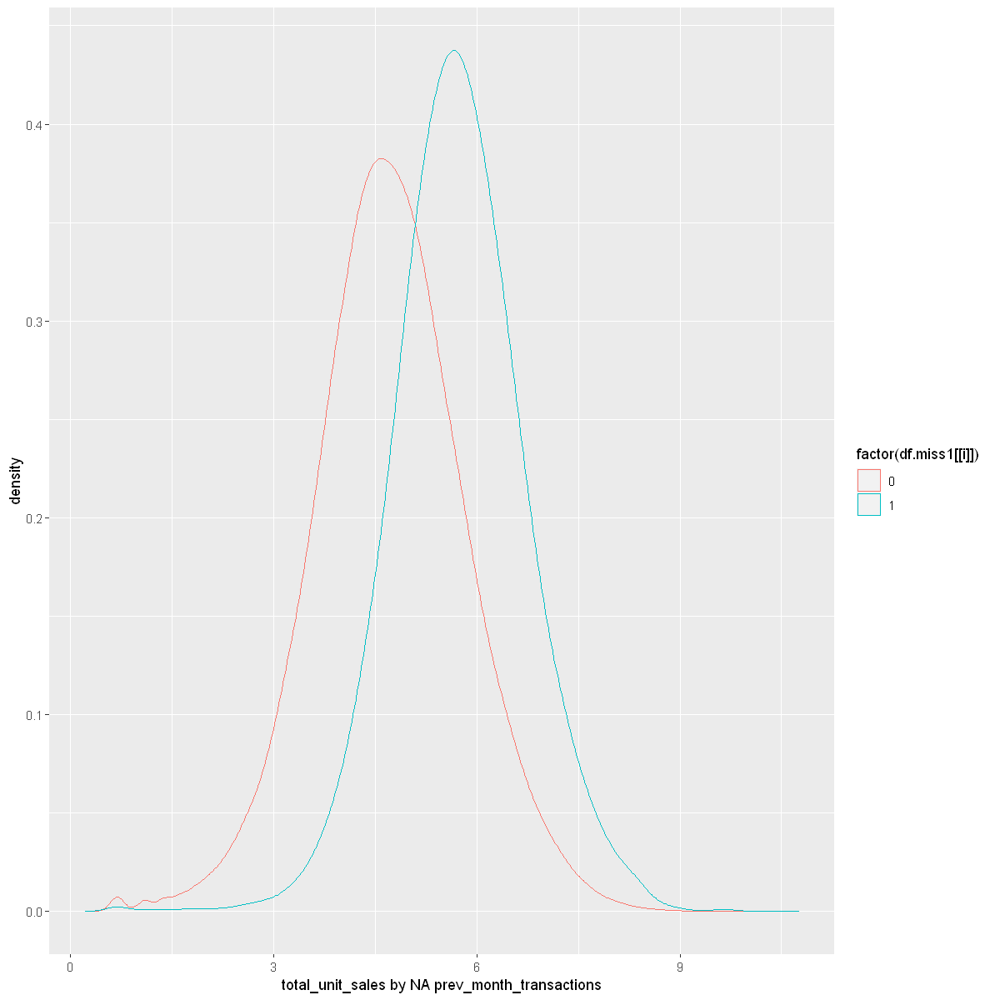


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -333.62, df = 124571, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9349117 -0.9239907
sample estimates:
mean of x mean of y 
 4.750308  5.679759 

[1] "prev_month_sales by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."


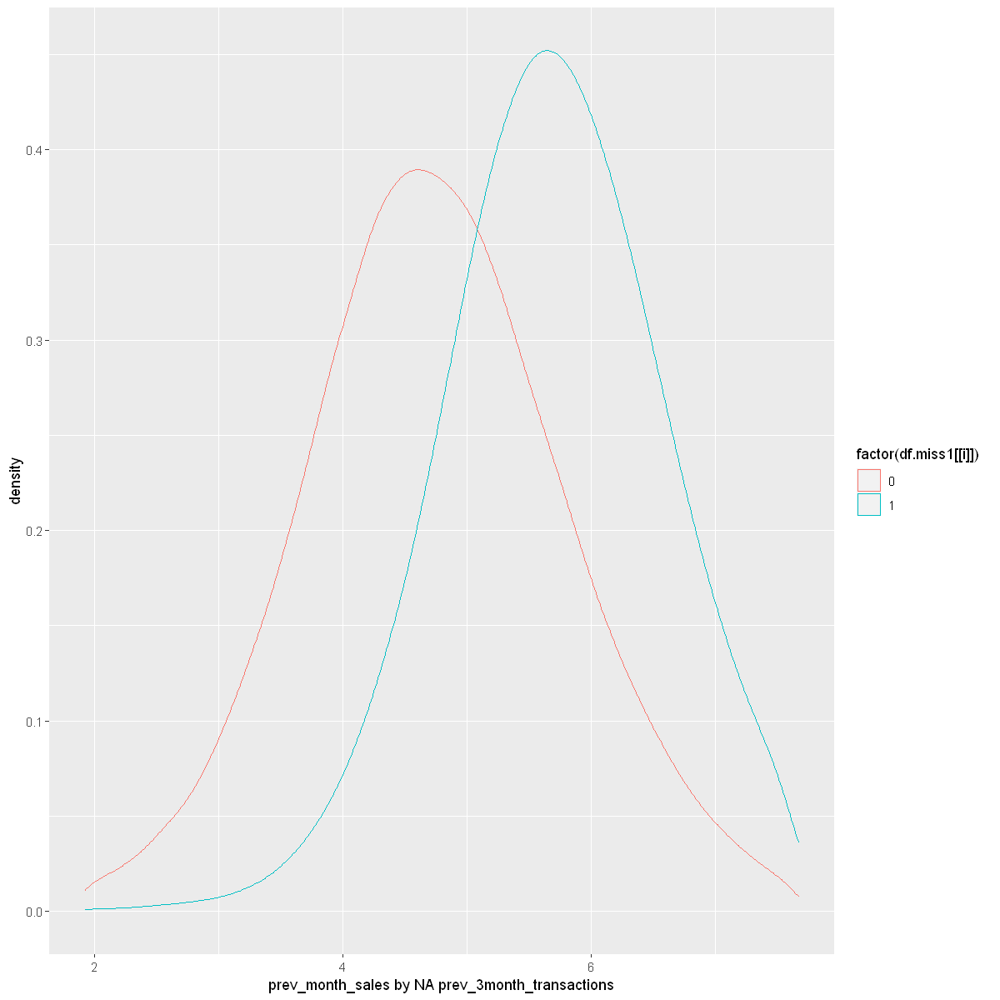


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -347.15, df = 124393, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9707730 -0.9598729
sample estimates:
mean of x mean of y 
 4.750609  5.715932 

[1] "prev_3month_sales by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


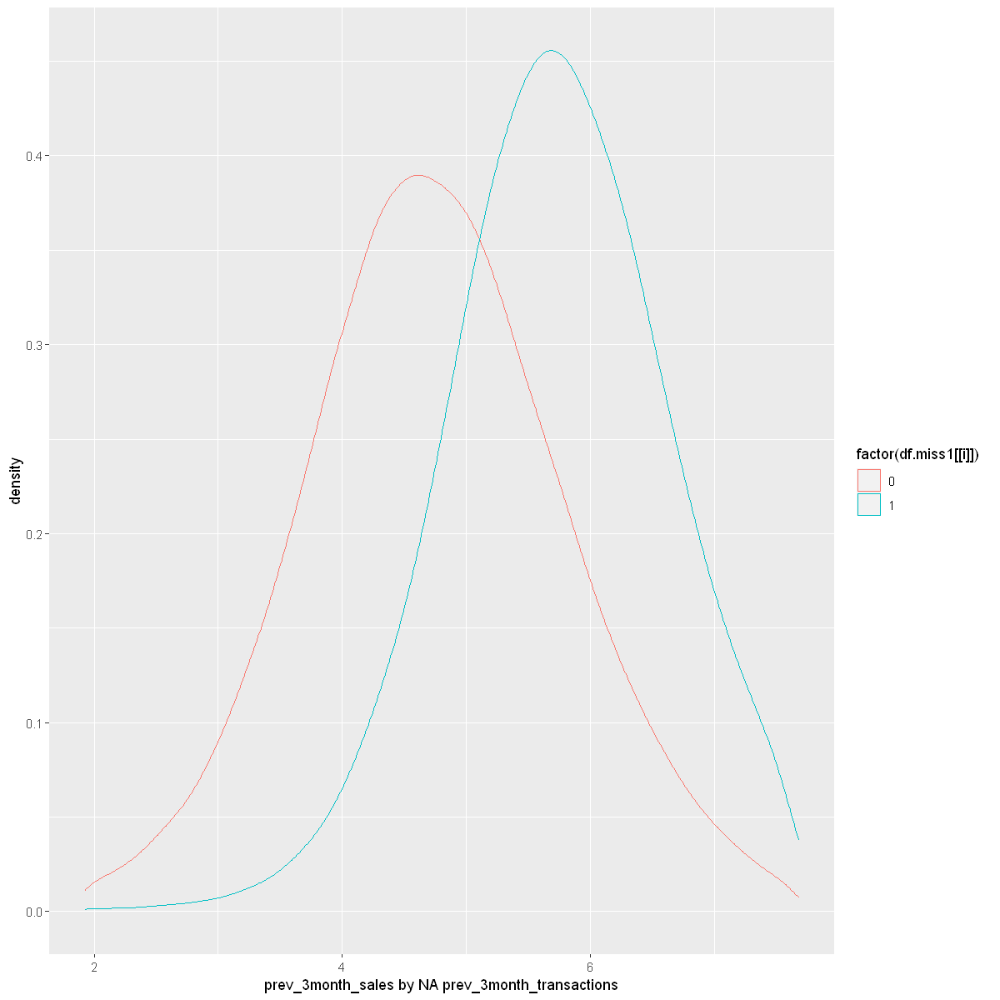


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -349.62, df = 124868, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9382659 -0.9278047
sample estimates:
mean of x mean of y 
 4.765811  5.698847 

[1] "avg_prev_3months_sales by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


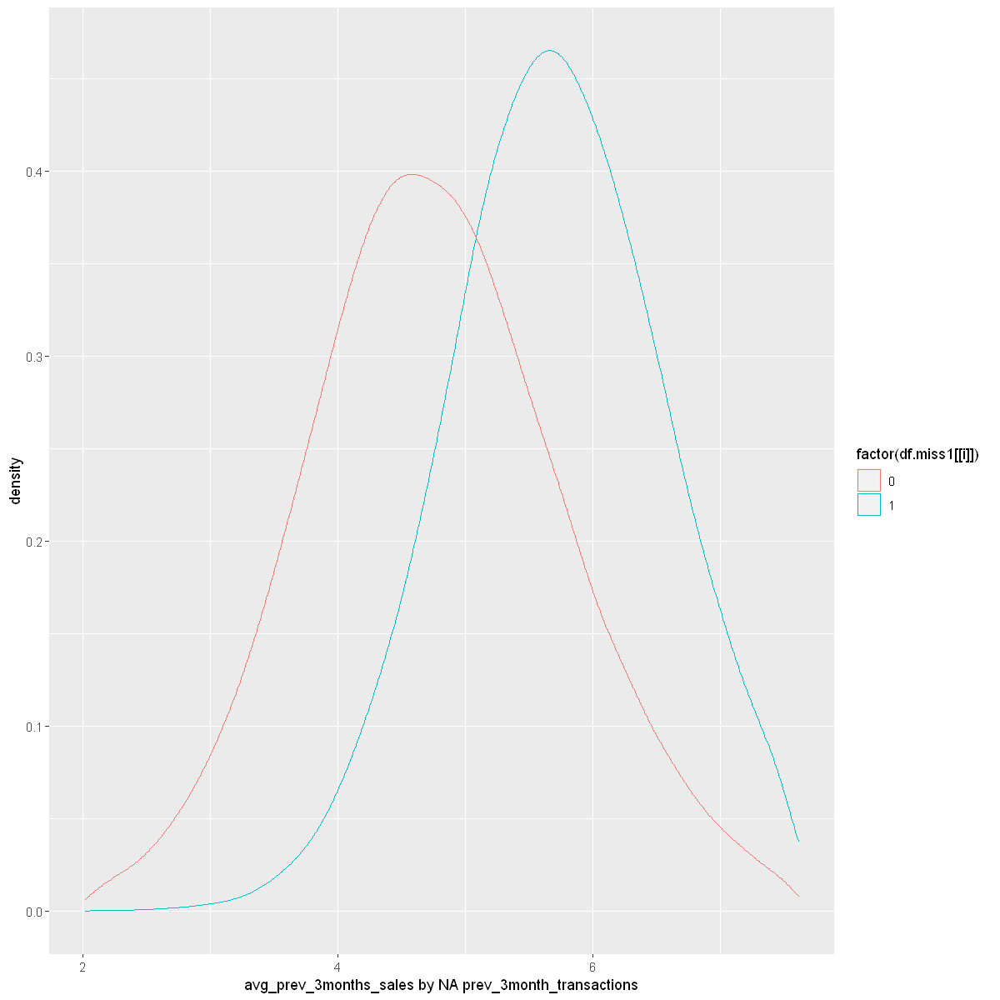


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -329.51, df = 124353, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9764075 -0.9648605
sample estimates:
mean of x mean of y 
 4.512654  5.483288 

[1] "min_prev_3months_sales by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


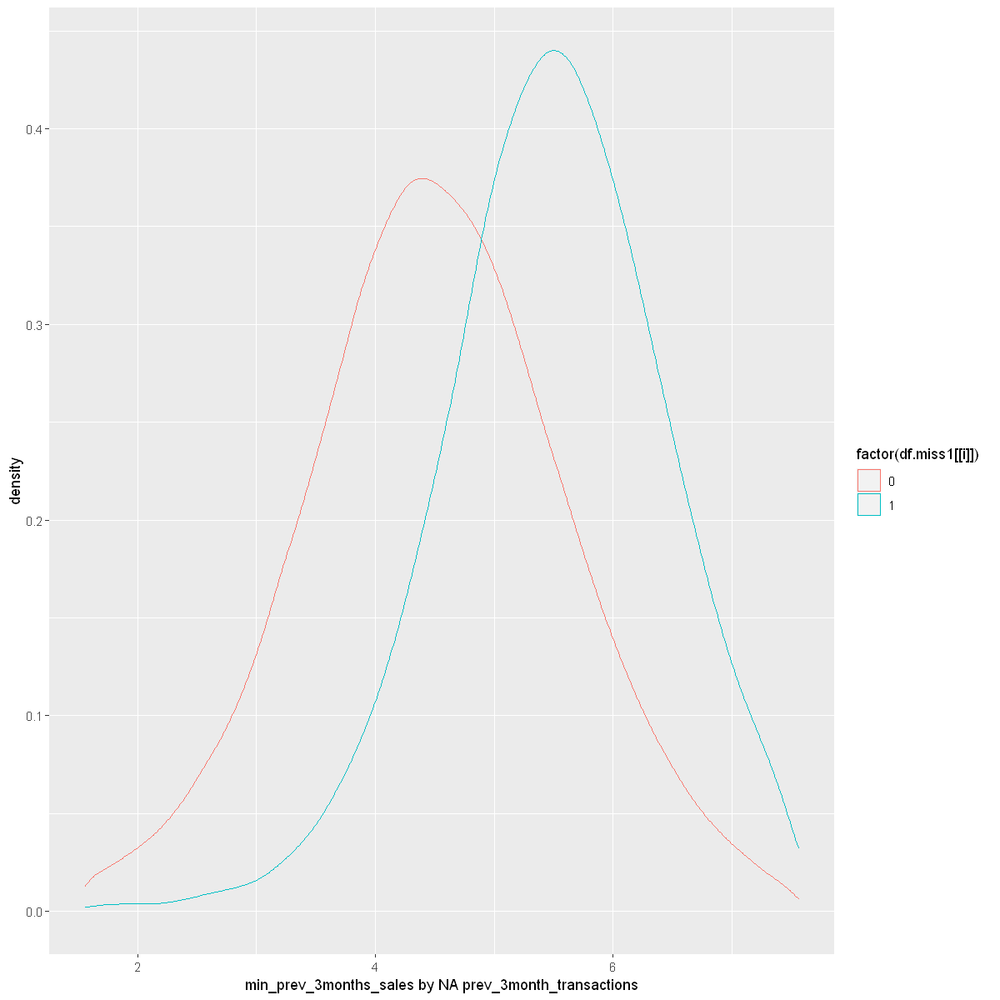


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -343.98, df = 124404, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9091977 -0.8988952
sample estimates:
mean of x mean of y 
 4.959694  5.863741 

[1] "max_prev_3months_sales by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


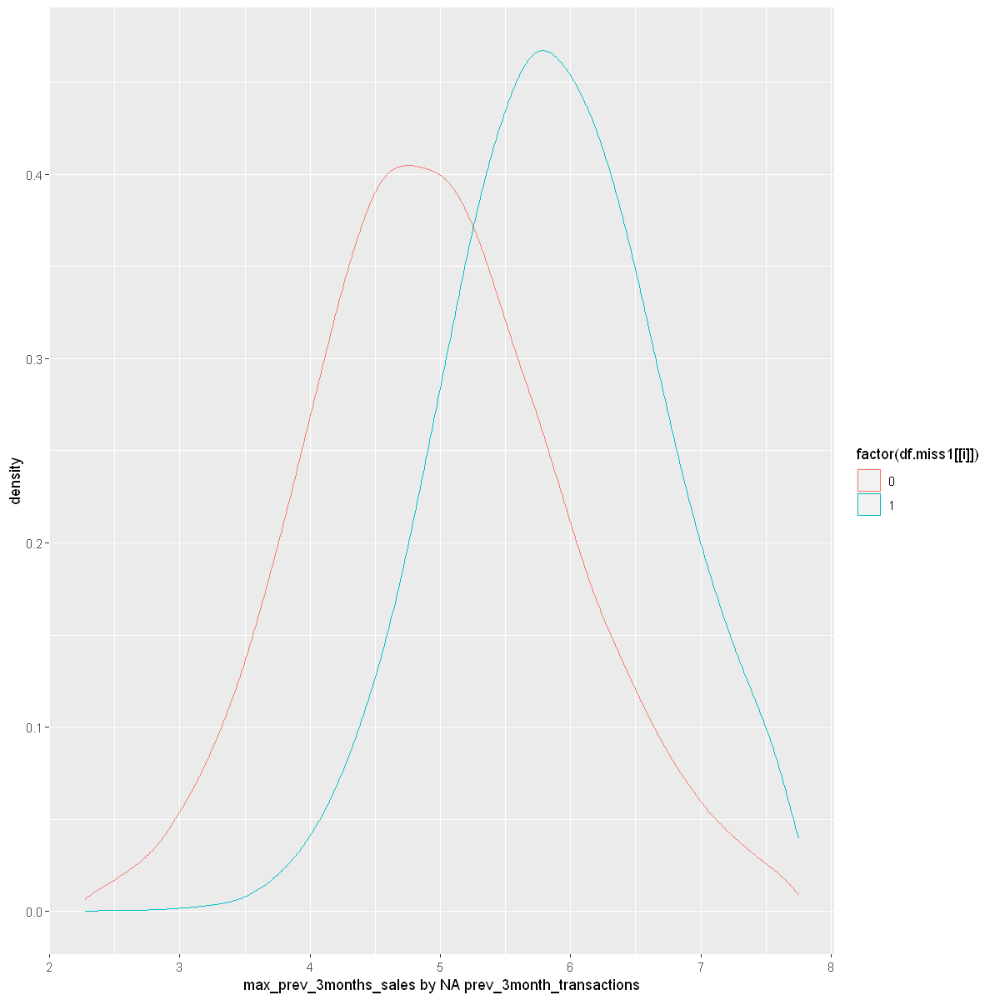


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -478.64, df = 25181, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -50498.19 -50086.29
sample estimates:
mean of x mean of y 
 45924.14  96216.38 

[1] "total_month_transactions by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


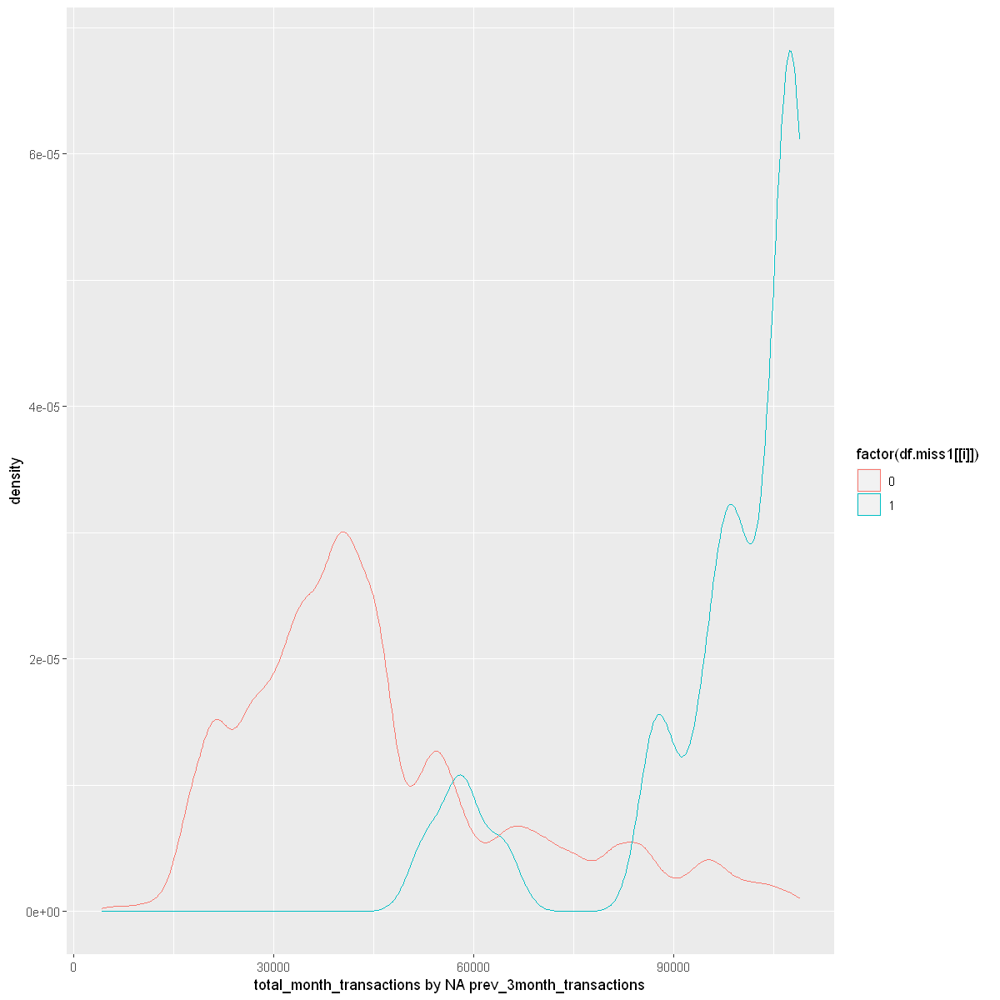


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -876.51, df = 31110, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -53406.15 -53167.83
sample estimates:
mean of x mean of y 
 46542.62  99829.60 

[1] "prev_month_transactions by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


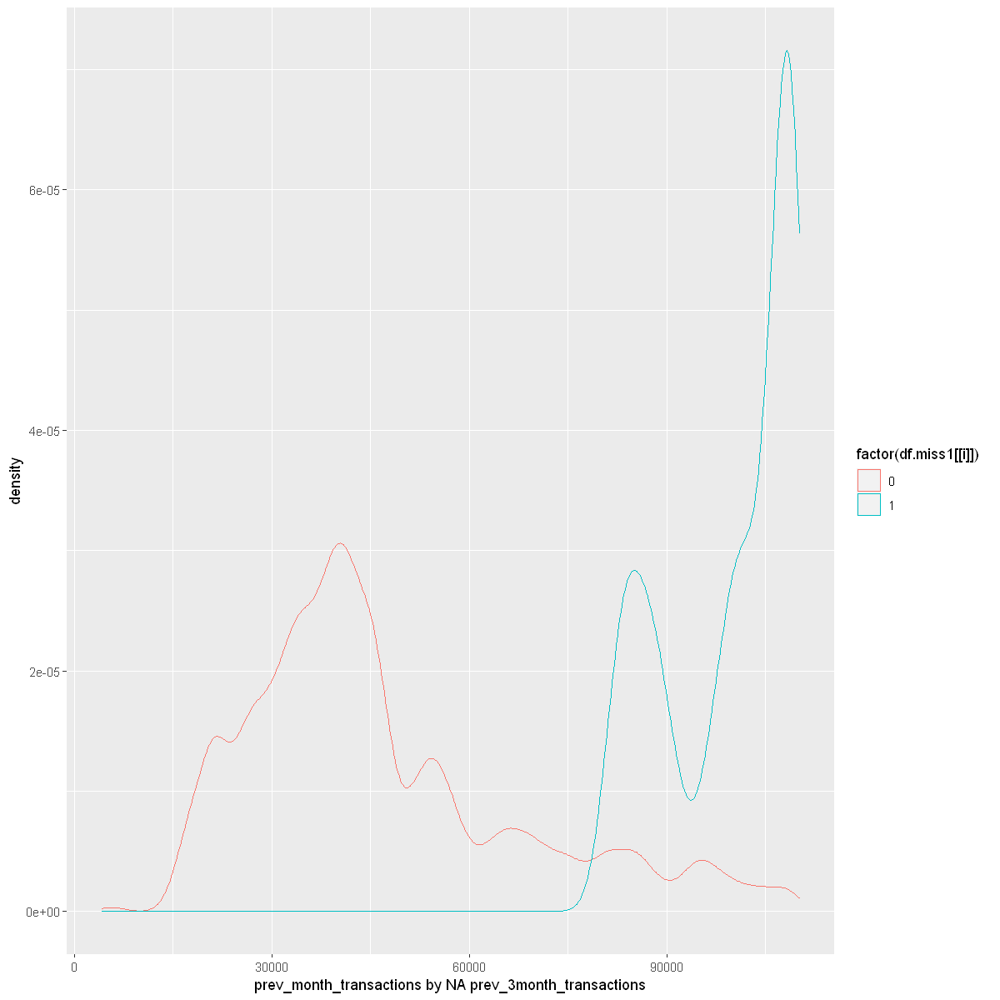


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -817.43, df = 19968, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -50749.17 -50506.37
sample estimates:
mean of x mean of y 
 46292.77  96920.55 

[1] "avg_prev_3months_transactions by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


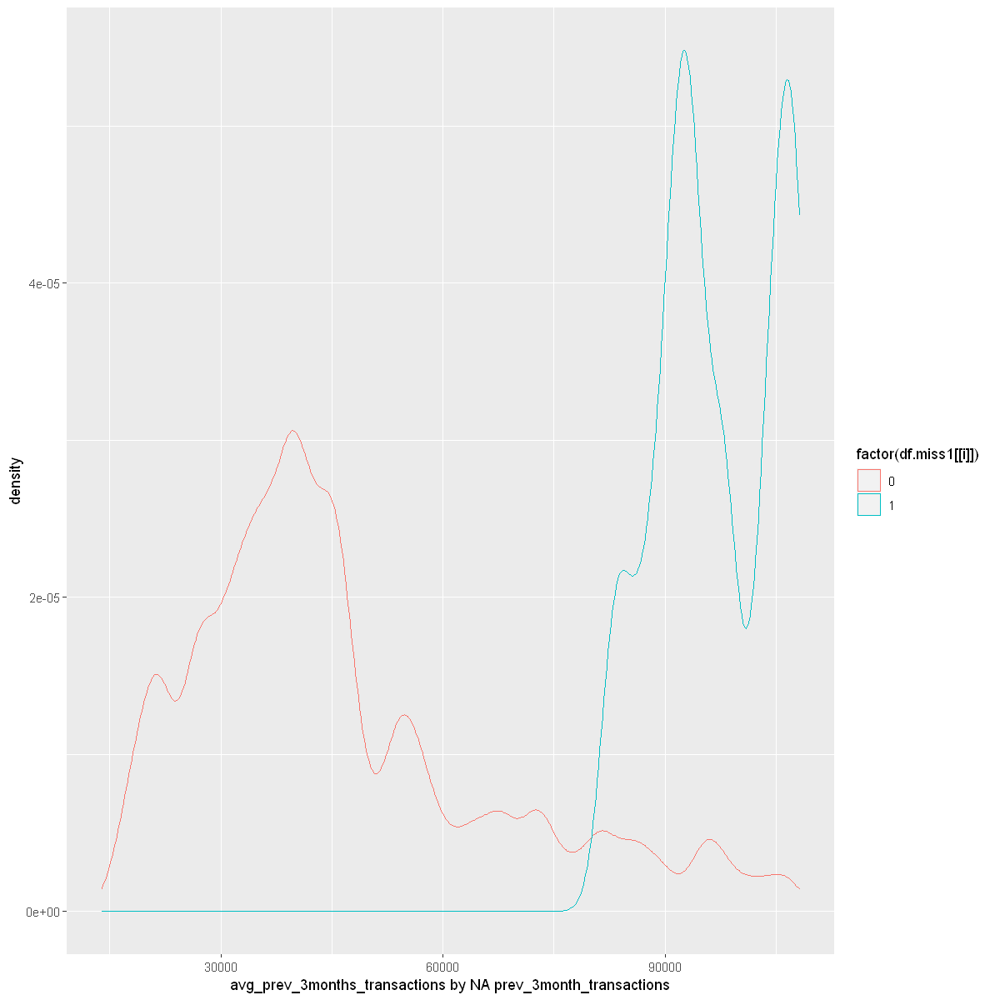


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -343.08, df = 15624, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -40199.49 -39742.76
sample estimates:
mean of x mean of y 
 43254.60  83225.72 

[1] "min_prev_3months_transactions by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


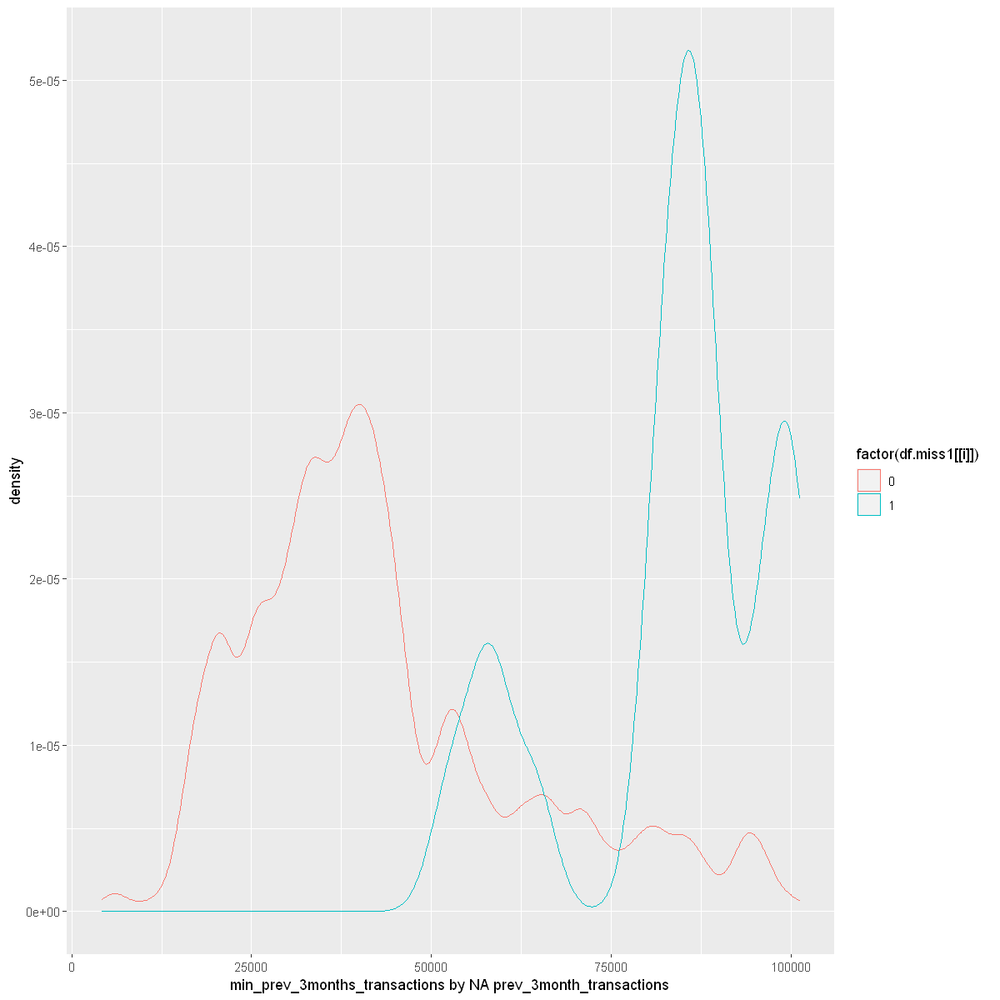


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1059.1, df = 34081, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -58229.62 -58014.50
sample estimates:
mean of x mean of y 
 48858.05 106980.10 

[1] "max_prev_3months_transactions by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


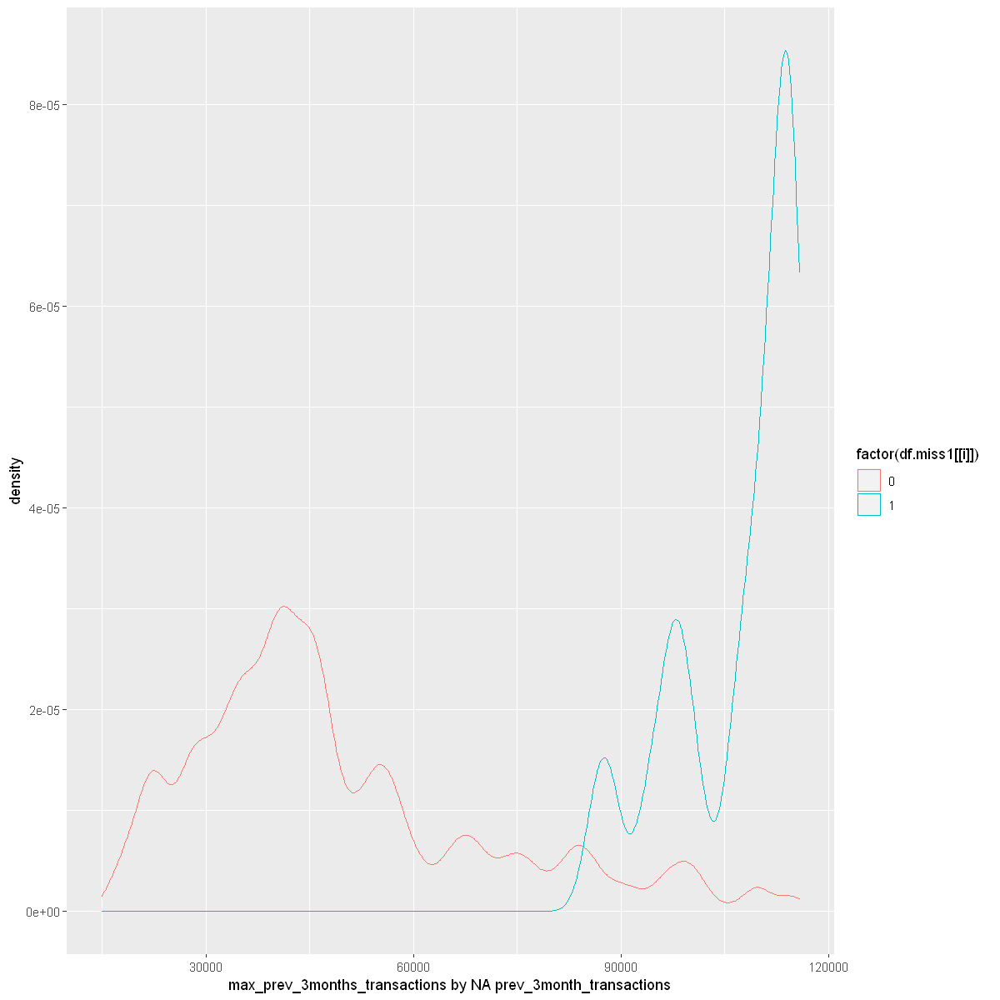


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -326, df = 126899, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.0068469 -0.9948123
sample estimates:
mean of x mean of y 
 4.720021  5.720851 

[1] "total_unit_sales by NA prev_3month_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


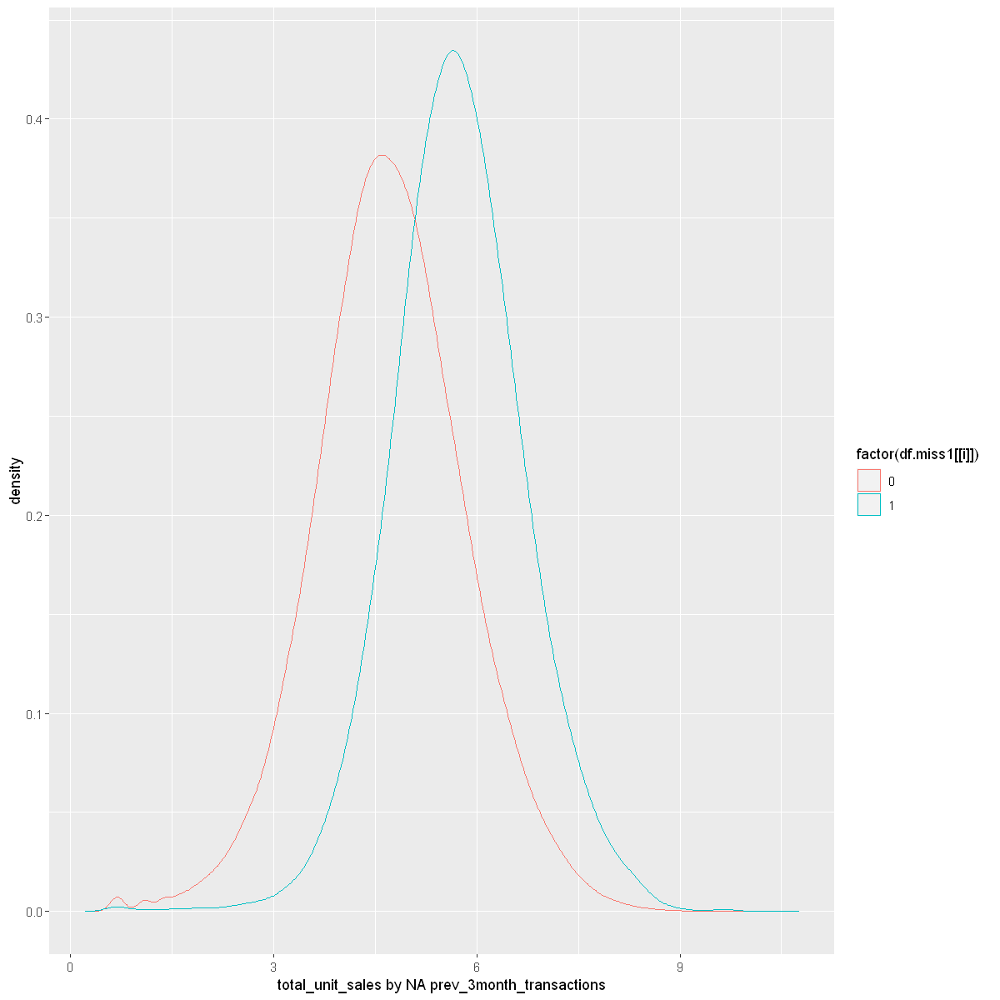


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -377.12, df = 148961, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9730513 -0.9629893
sample estimates:
mean of x mean of y 
 4.739648  5.707668 

[1] "prev_month_sales by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."


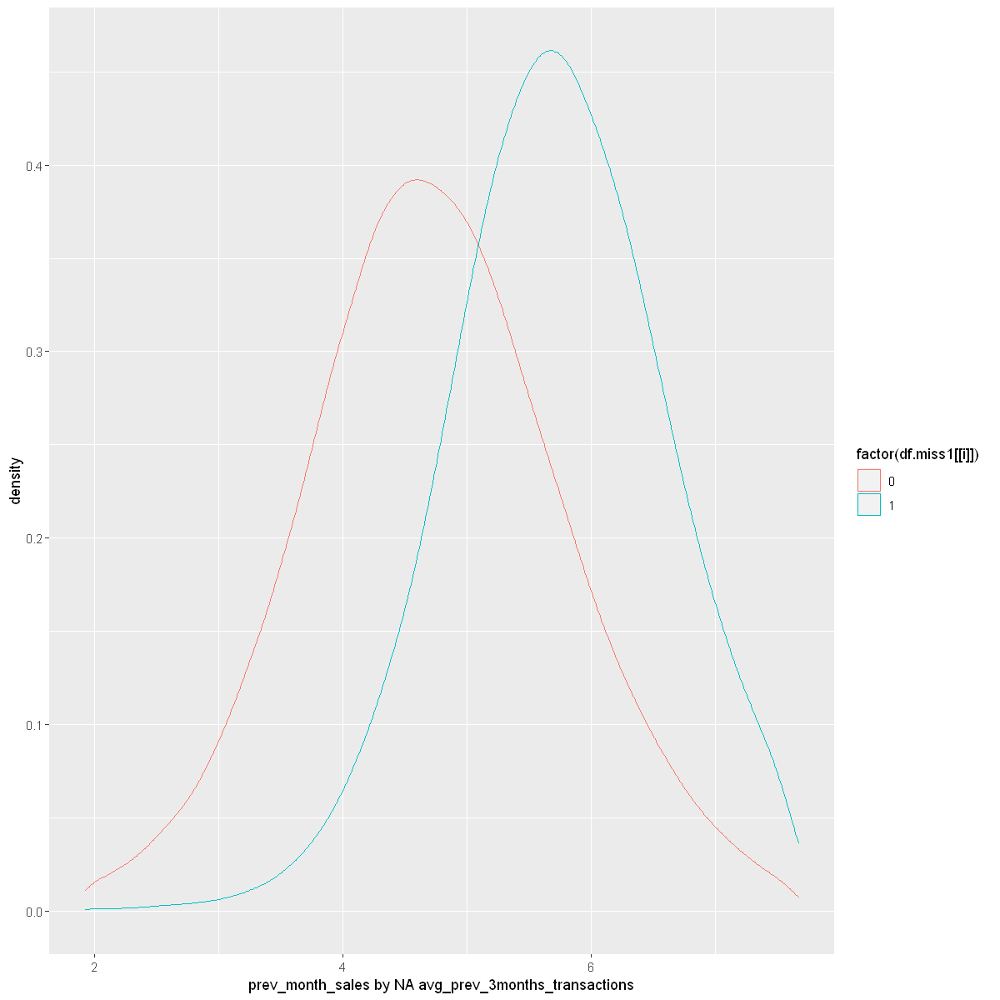


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -373.58, df = 149111, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9650993 -0.9550255
sample estimates:
mean of x mean of y 
 4.742266  5.702329 

[1] "prev_3month_sales by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


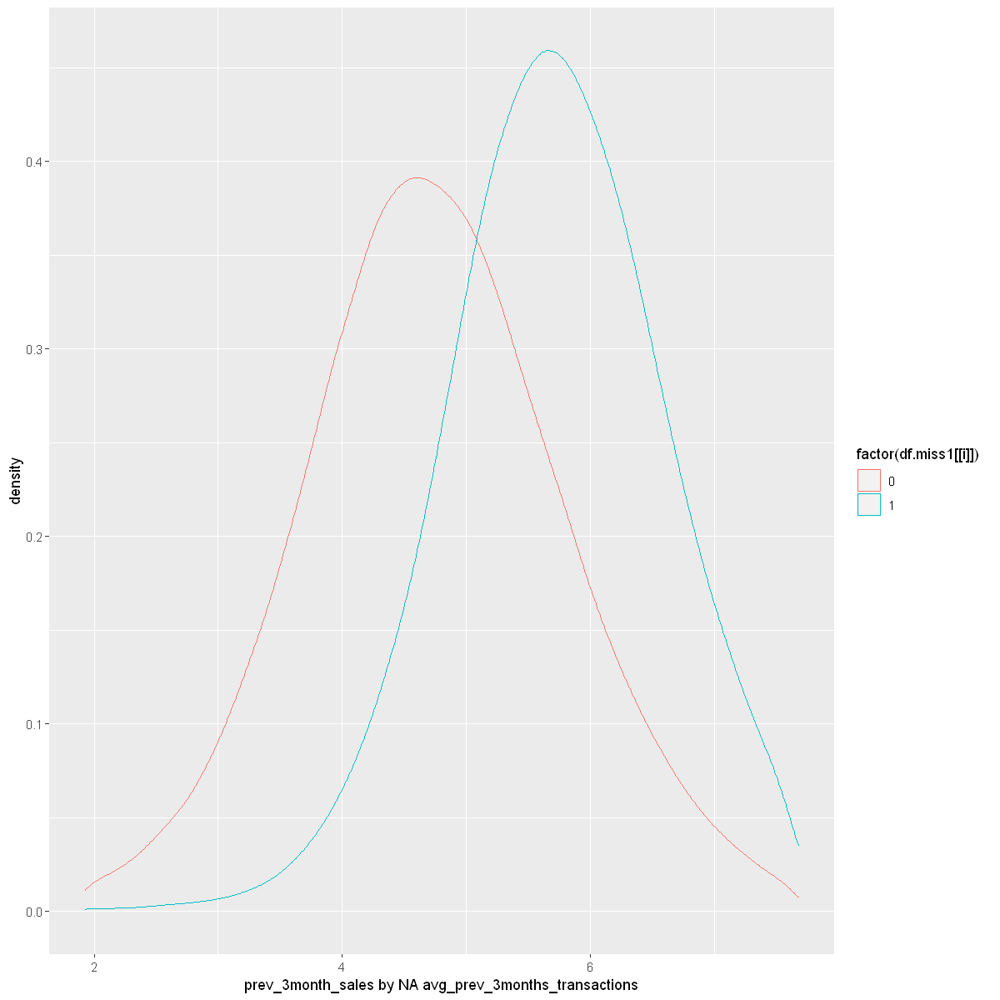


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -393.98, df = 149583, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9722563 -0.9626305
sample estimates:
mean of x mean of y 
 4.755395  5.722838 

[1] "avg_prev_3months_sales by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


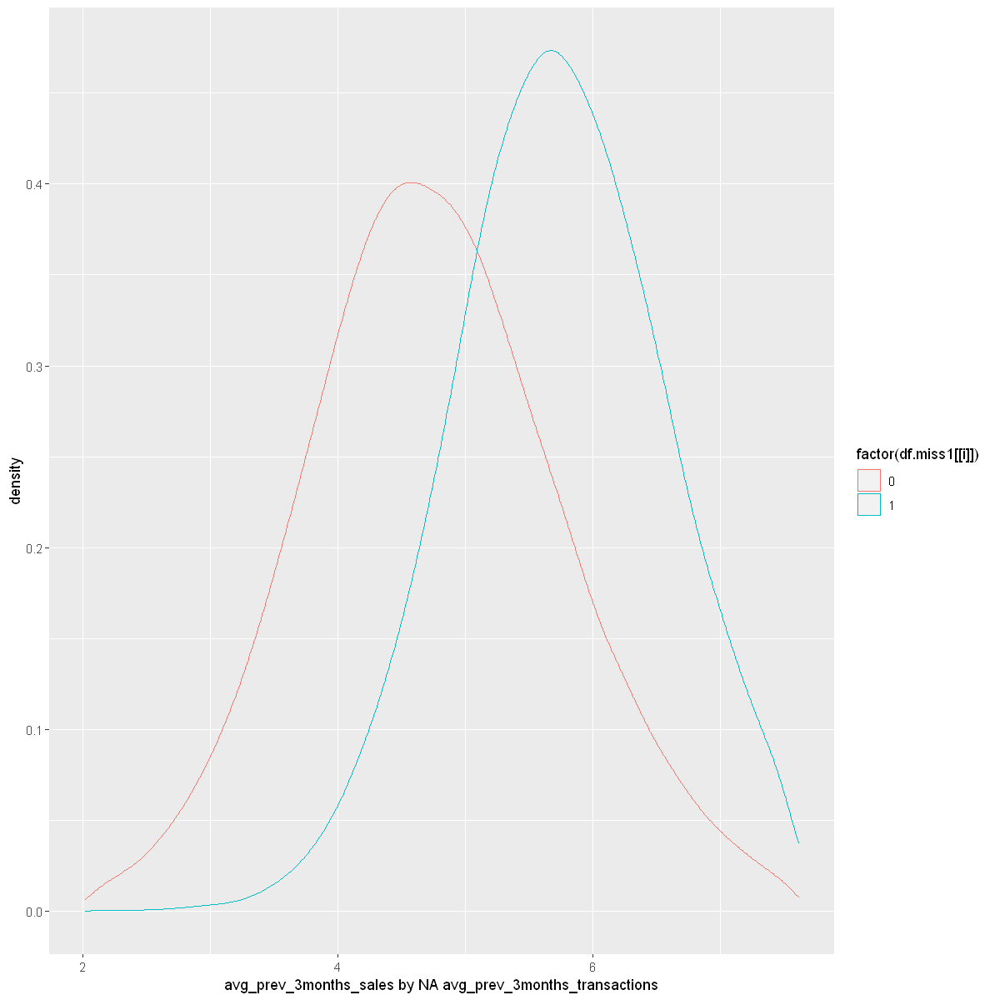


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -374.77, df = 148943, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.018427 -1.007830
sample estimates:
mean of x mean of y 
 4.501310  5.514438 

[1] "min_prev_3months_sales by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


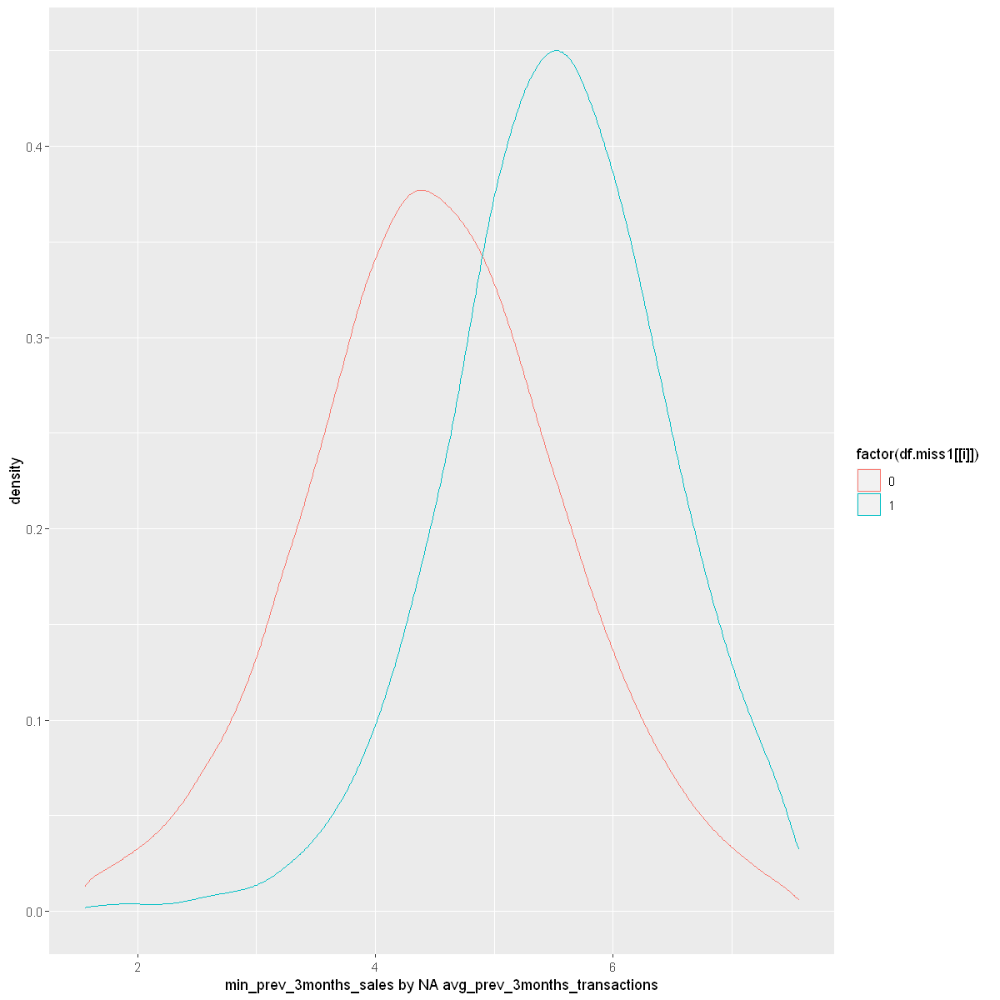


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -386.52, df = 148853, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9412668 -0.9317690
sample estimates:
mean of x mean of y 
 4.949676  5.886194 

[1] "max_prev_3months_sales by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


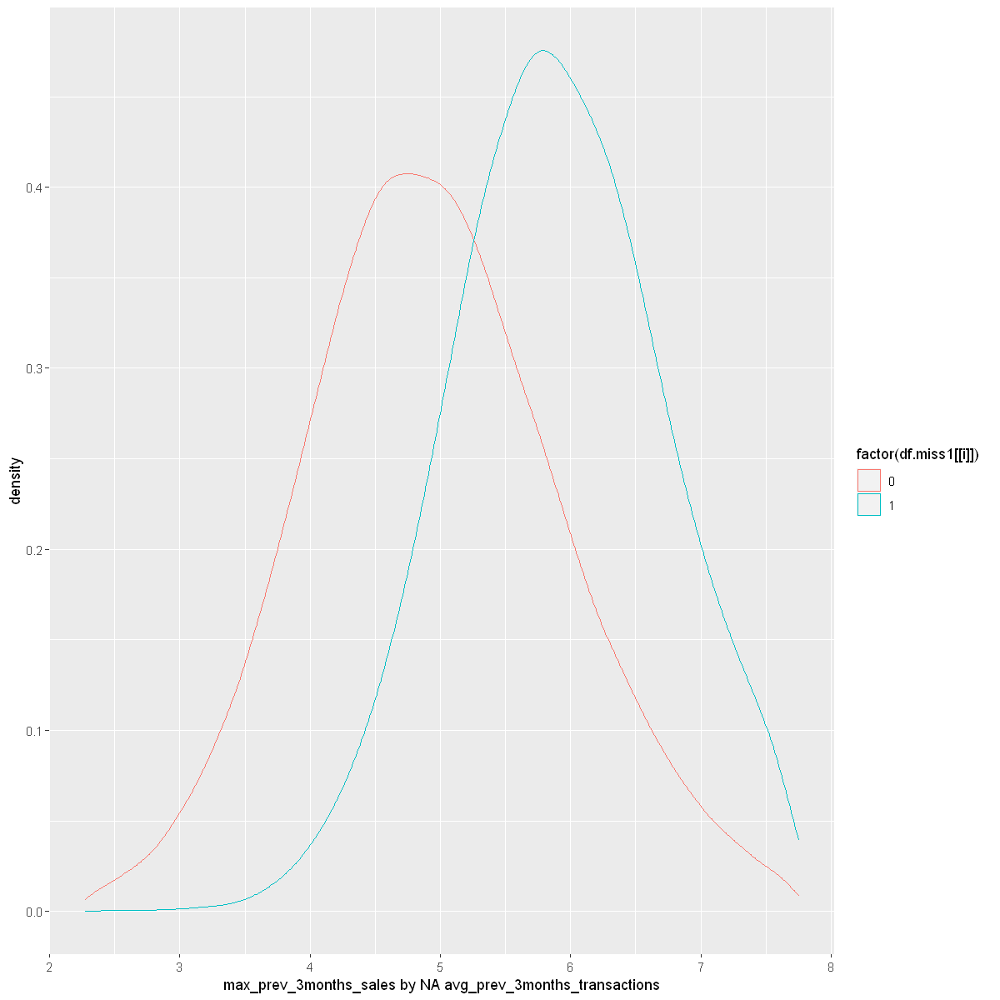


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -912.94, df = 23337, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -57831.23 -57583.44
sample estimates:
mean of x mean of y 
 45934.92 103642.25 

[1] "total_month_transactions by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


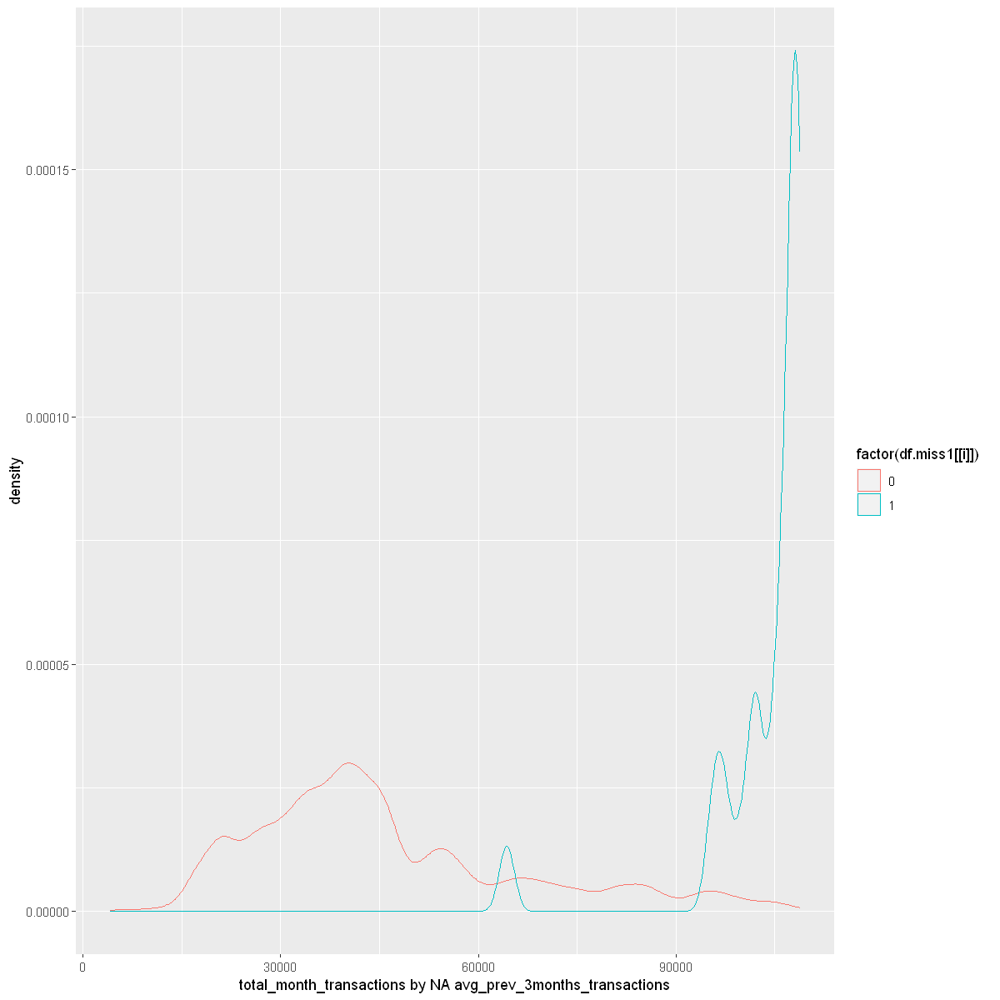


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2470.8, df = 67219, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -60439.48 -60343.67
sample estimates:
mean of x mean of y 
 46518.55 106910.13 

[1] "prev_month_transactions by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


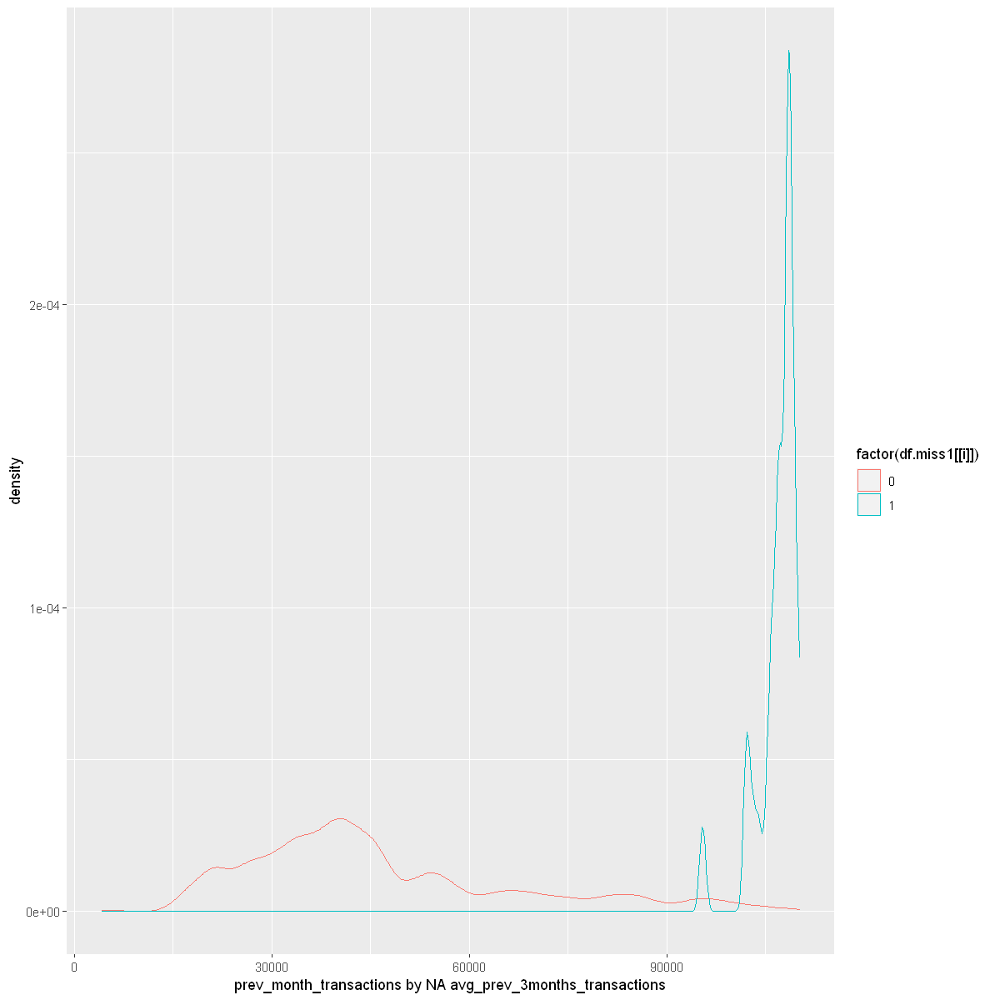


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2505.4, df = 102440, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -59510.99 -59417.95
sample estimates:
mean of x mean of y 
 46270.86 105735.34 

[1] "prev_3month_transactions by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


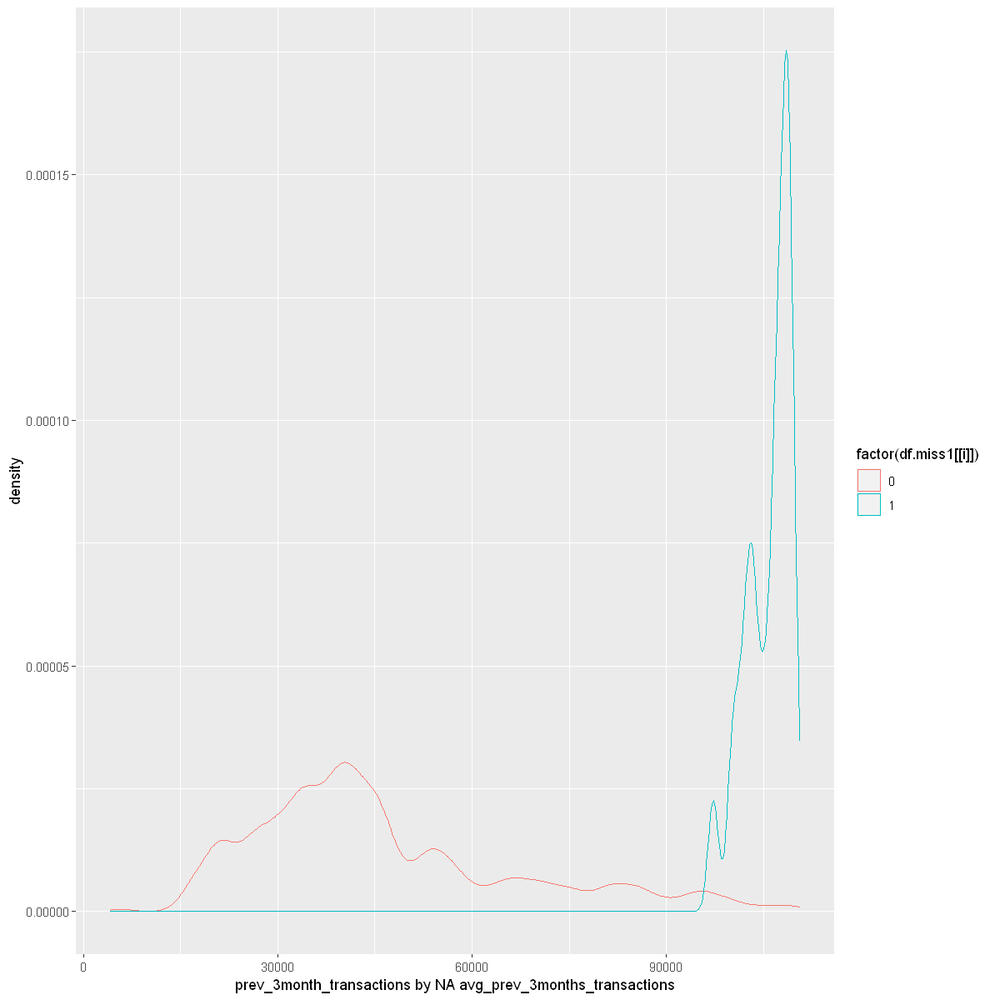


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -353.77, df = 6536.4, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -51214.70 -50650.24
sample estimates:
mean of x mean of y 
 43406.85  94339.32 

[1] "min_prev_3months_transactions by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


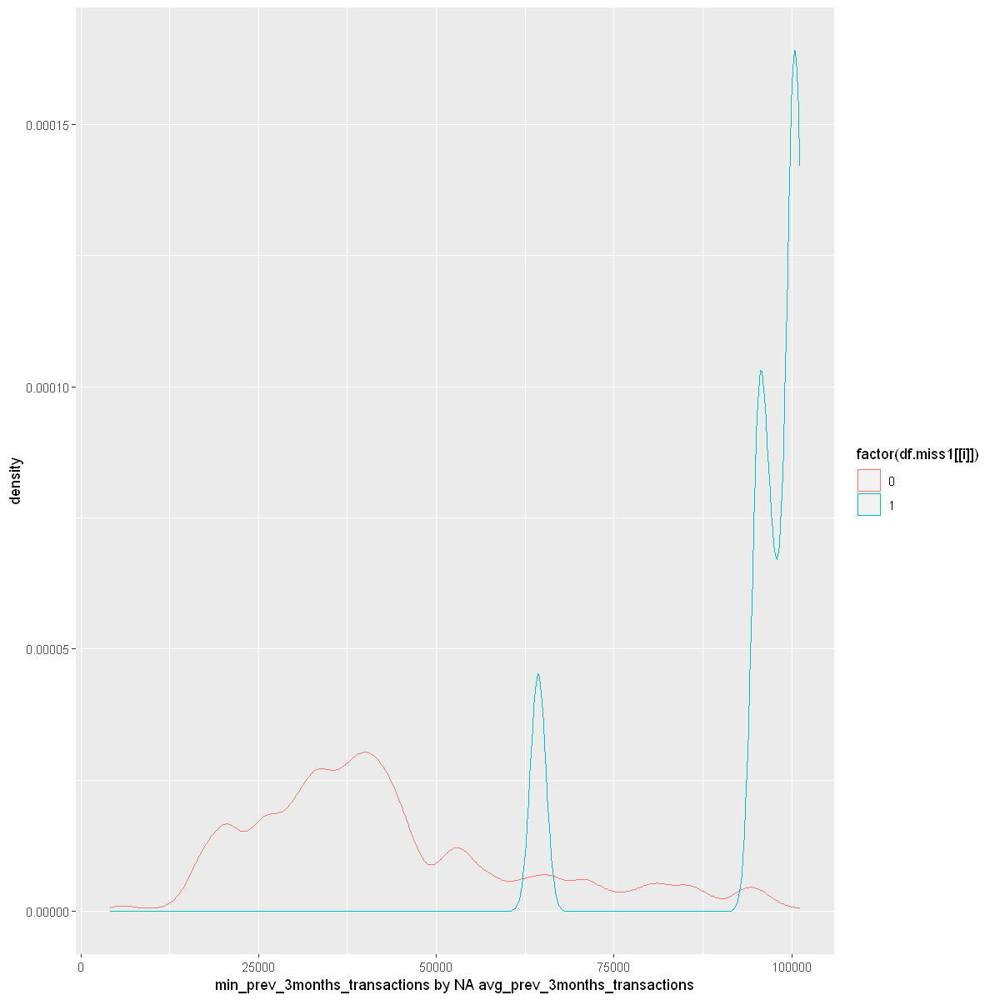


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3305.9, df = 187039, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -64719.44 -64642.74
sample estimates:
mean of x mean of y 
 48988.37 113669.46 

[1] "max_prev_3months_transactions by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


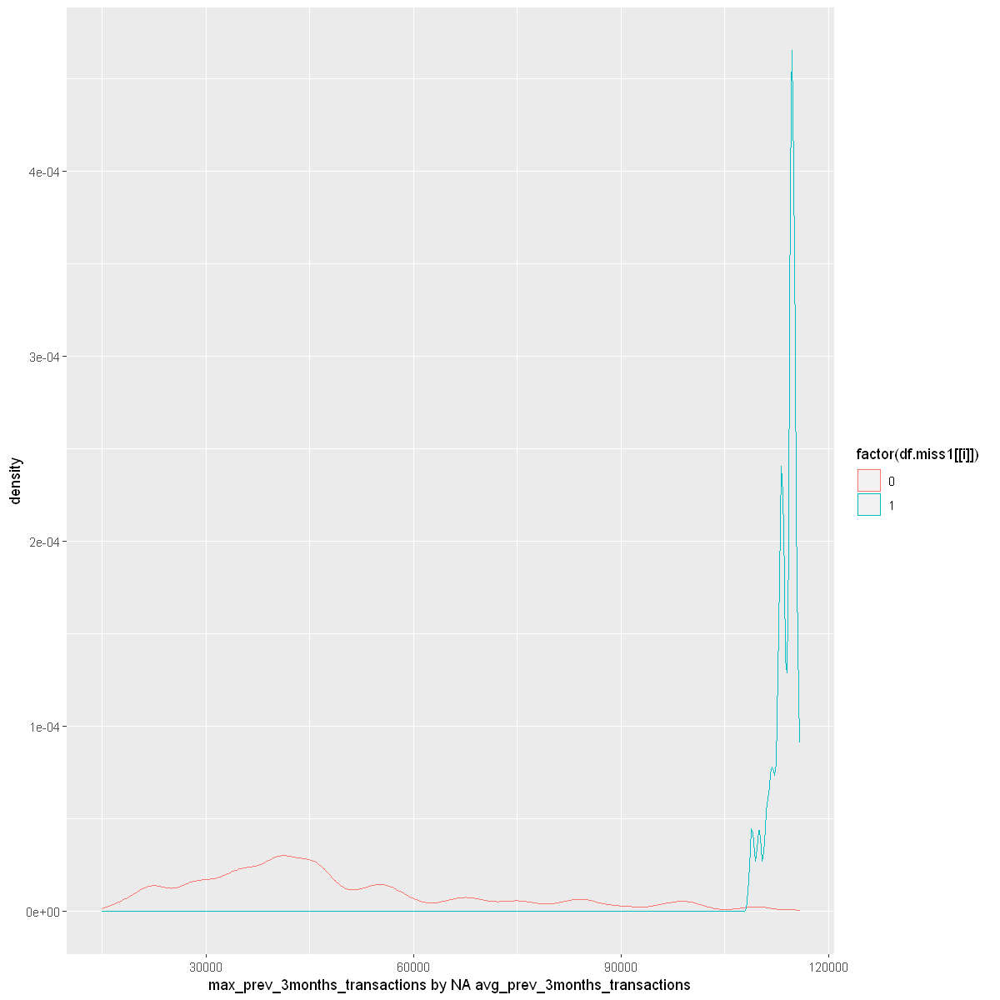


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -372.29, df = 151894, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.053937 -1.042898
sample estimates:
mean of x mean of y 
 4.707854  5.756272 

[1] "total_unit_sales by NA avg_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


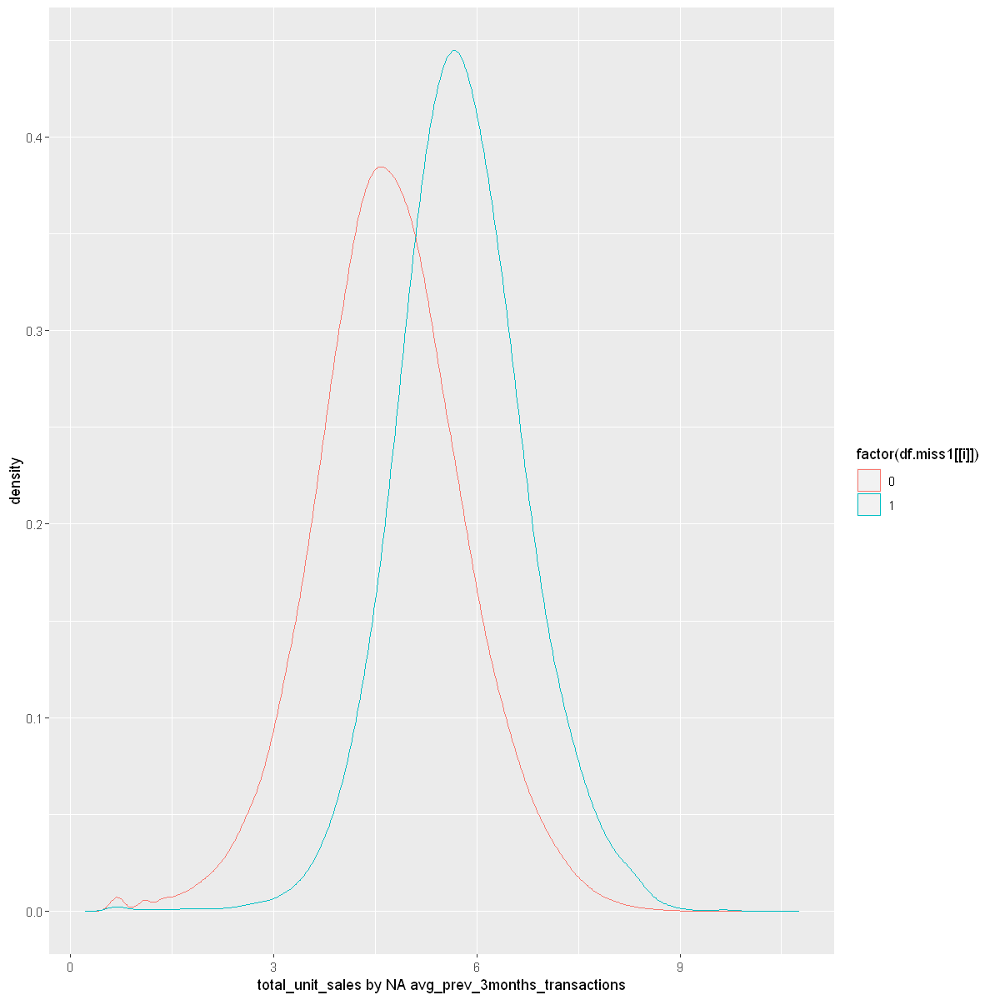


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -397.87, df = 169077, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9751395 -0.9655793
sample estimates:
mean of x mean of y 
  4.73267   5.70303 

[1] "prev_month_sales by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."


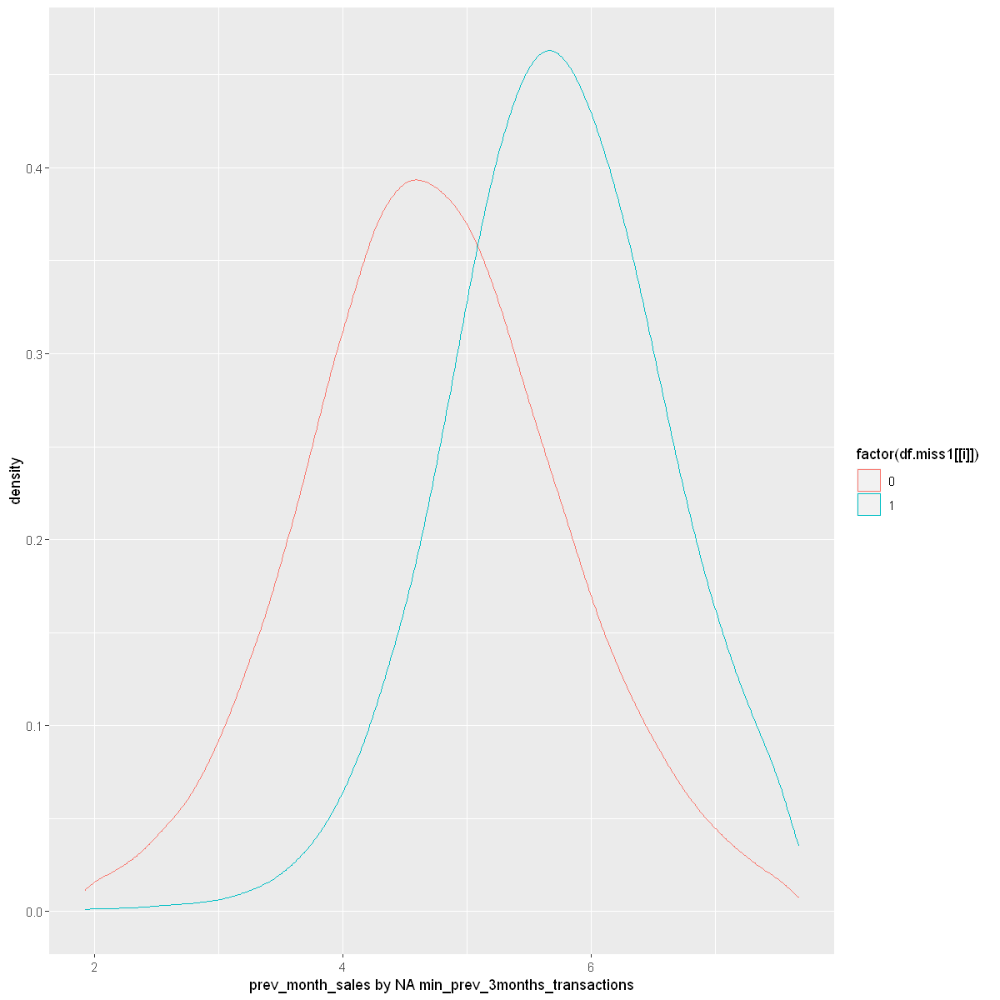


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -397.03, df = 169233, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9736507 -0.9640848
sample estimates:
mean of x mean of y 
 4.734896  5.703764 

[1] "prev_3month_sales by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


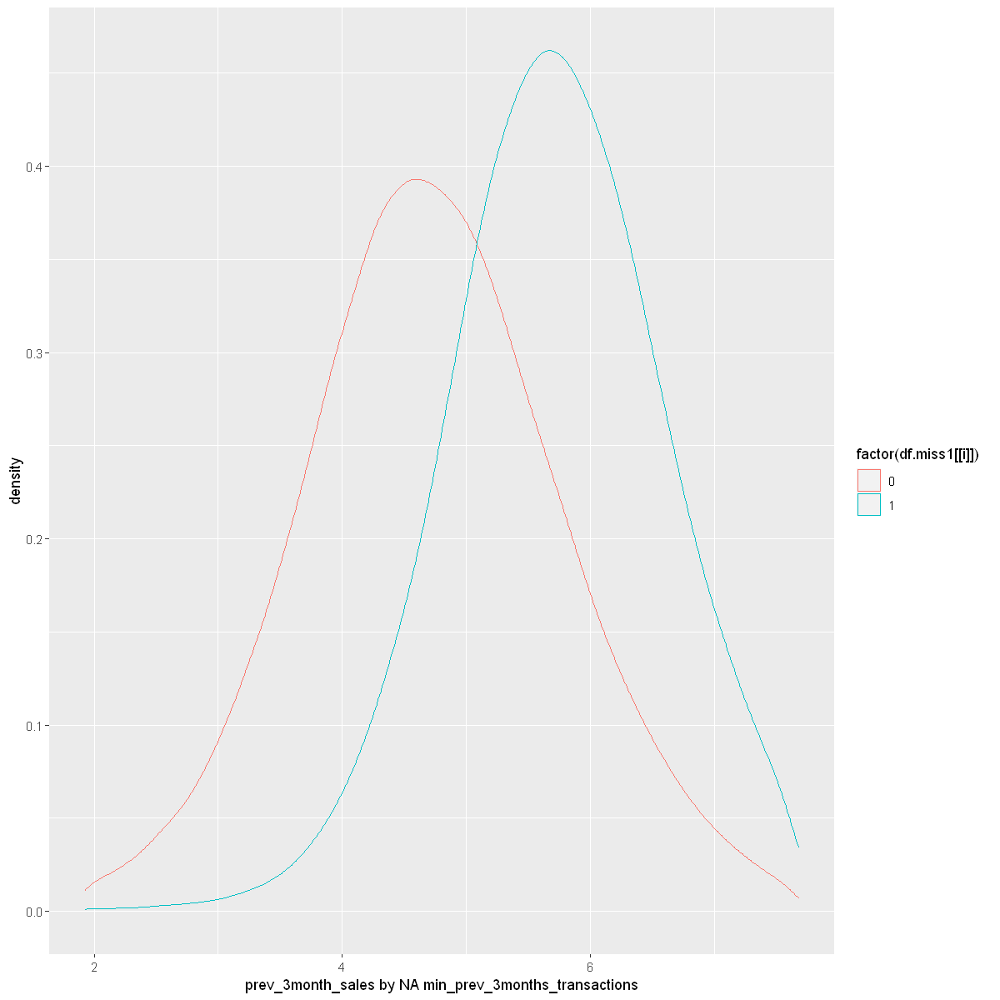


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -416.19, df = 169765, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9761927 -0.9670413
sample estimates:
mean of x mean of y 
 4.748338  5.719955 

[1] "avg_prev_3months_sales by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


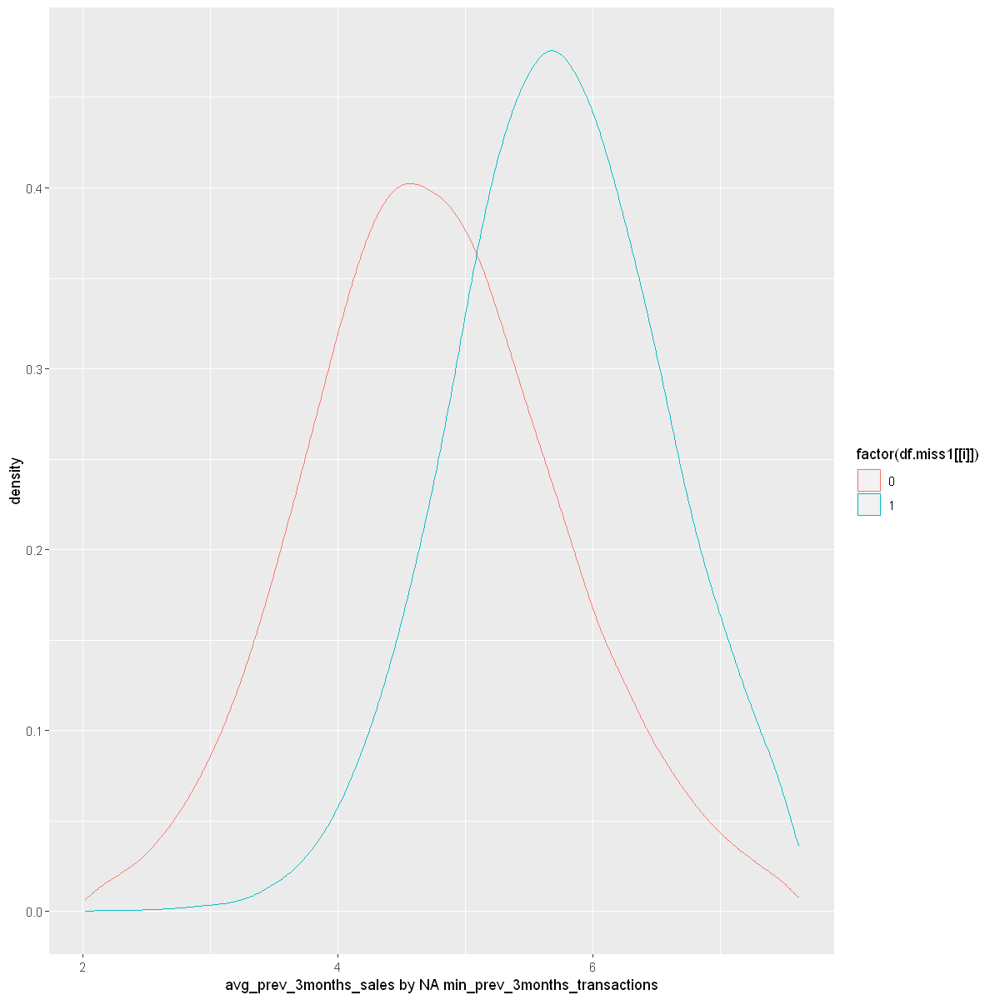


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -400.03, df = 169005, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.031540 -1.021481
sample estimates:
mean of x mean of y 
 4.493227  5.519737 

[1] "min_prev_3months_sales by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


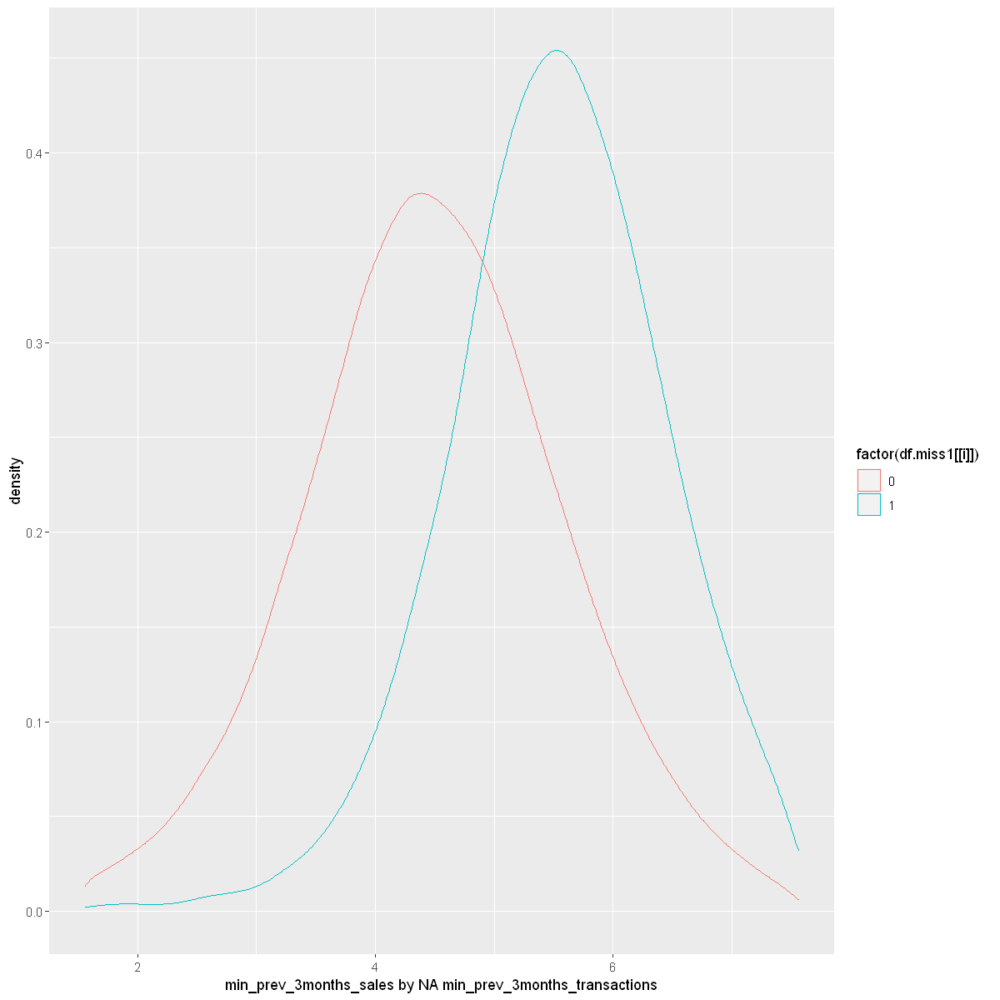


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -406.57, df = 169039, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9399747 -0.9309554
sample estimates:
mean of x mean of y 
 4.943195  5.878660 

[1] "max_prev_3months_sales by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


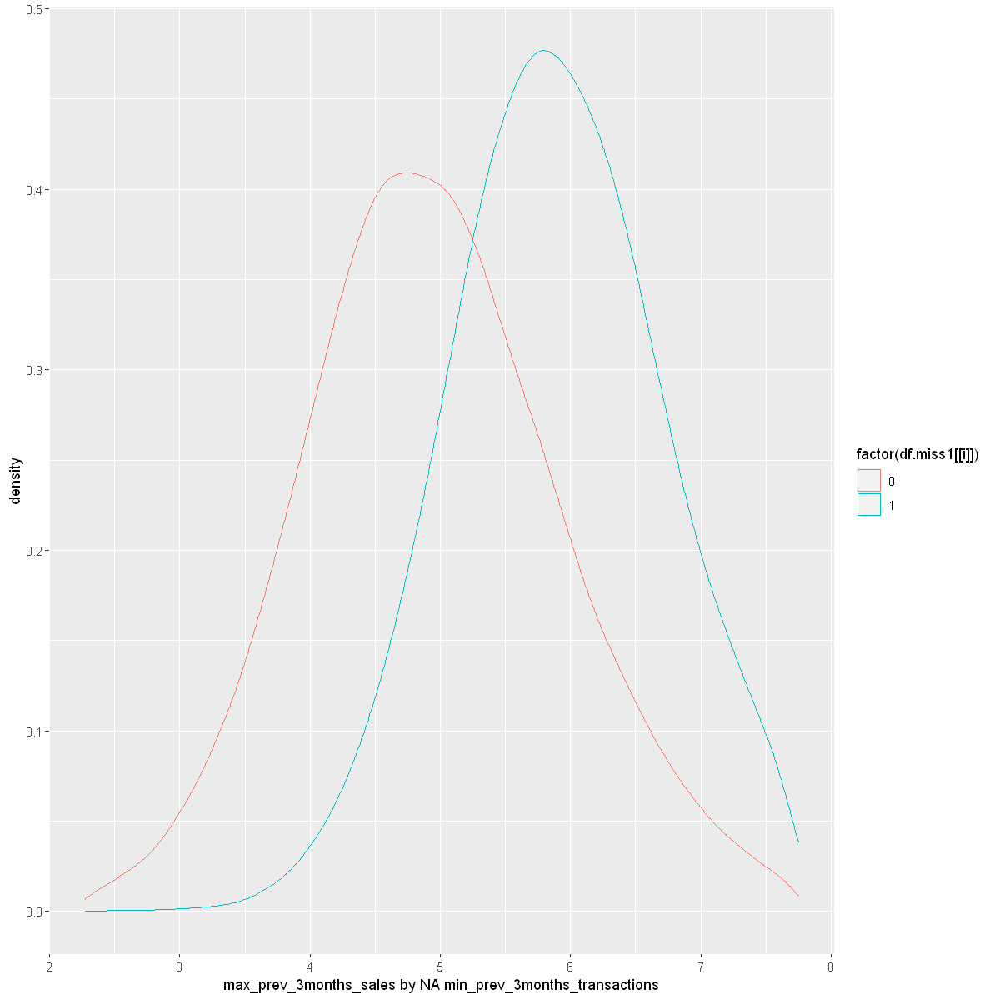


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3113.9, df = 192684, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -60439.91 -60363.88
sample estimates:
mean of x mean of y 
 45518.68 105920.57 

[1] "total_month_transactions by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


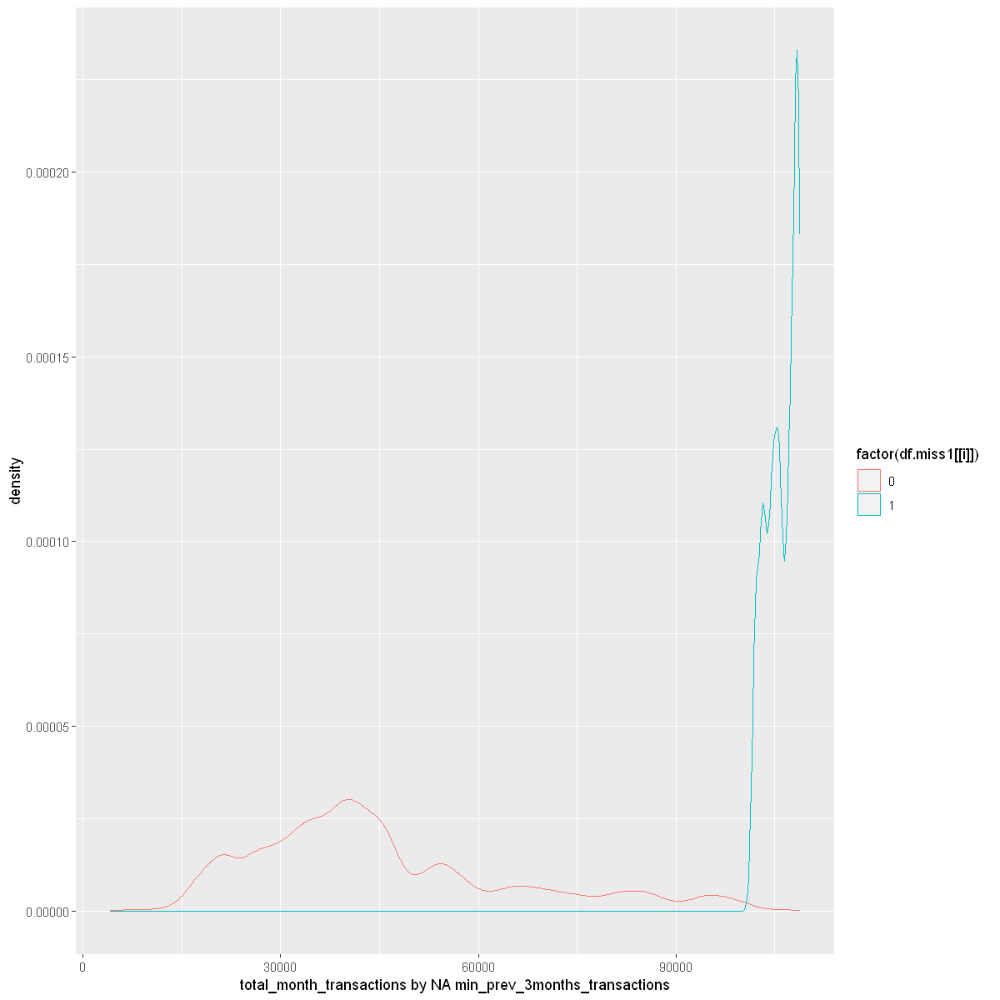


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3156.1, df = 250083, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -60509.69 -60434.58
sample estimates:
mean of x mean of y 
 46004.98 106477.12 

[1] "prev_month_transactions by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


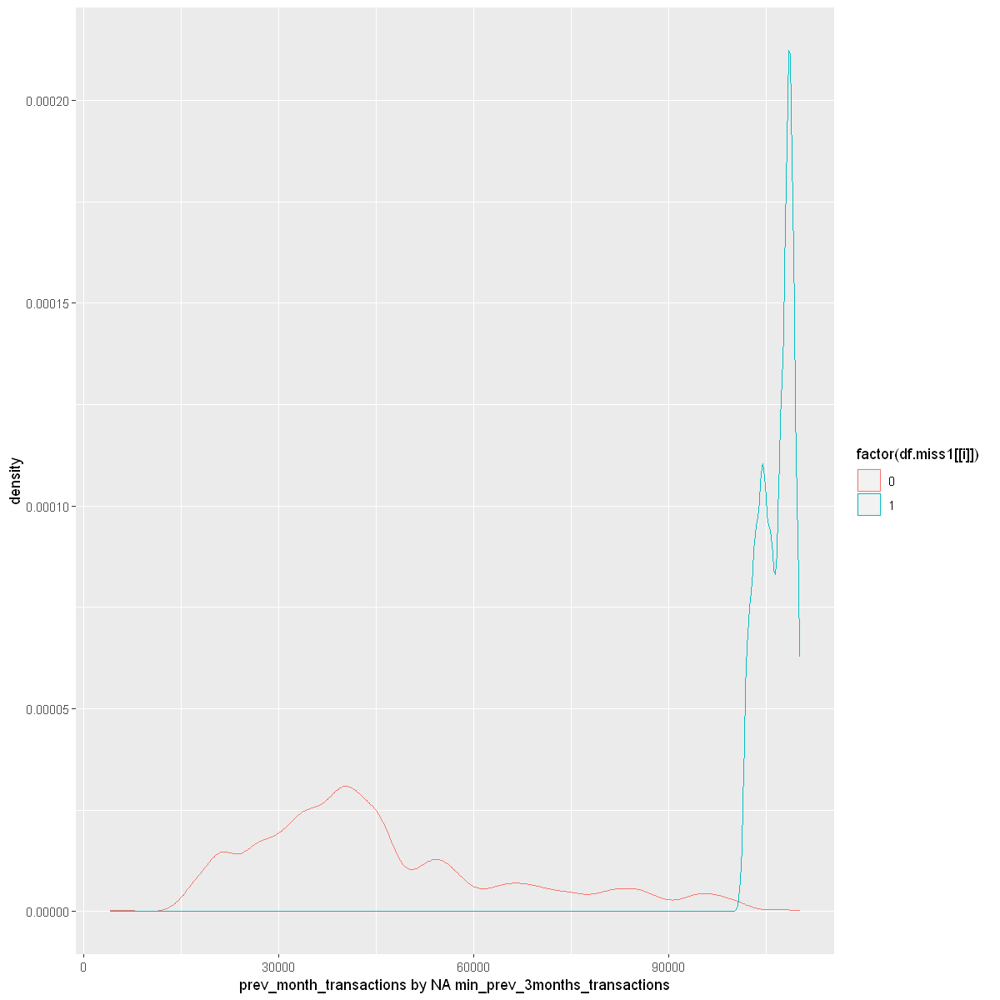


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2783.7, df = 168939, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -60220.92 -60136.18
sample estimates:
mean of x mean of y 
 45881.33 106059.87 

[1] "prev_3month_transactions by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


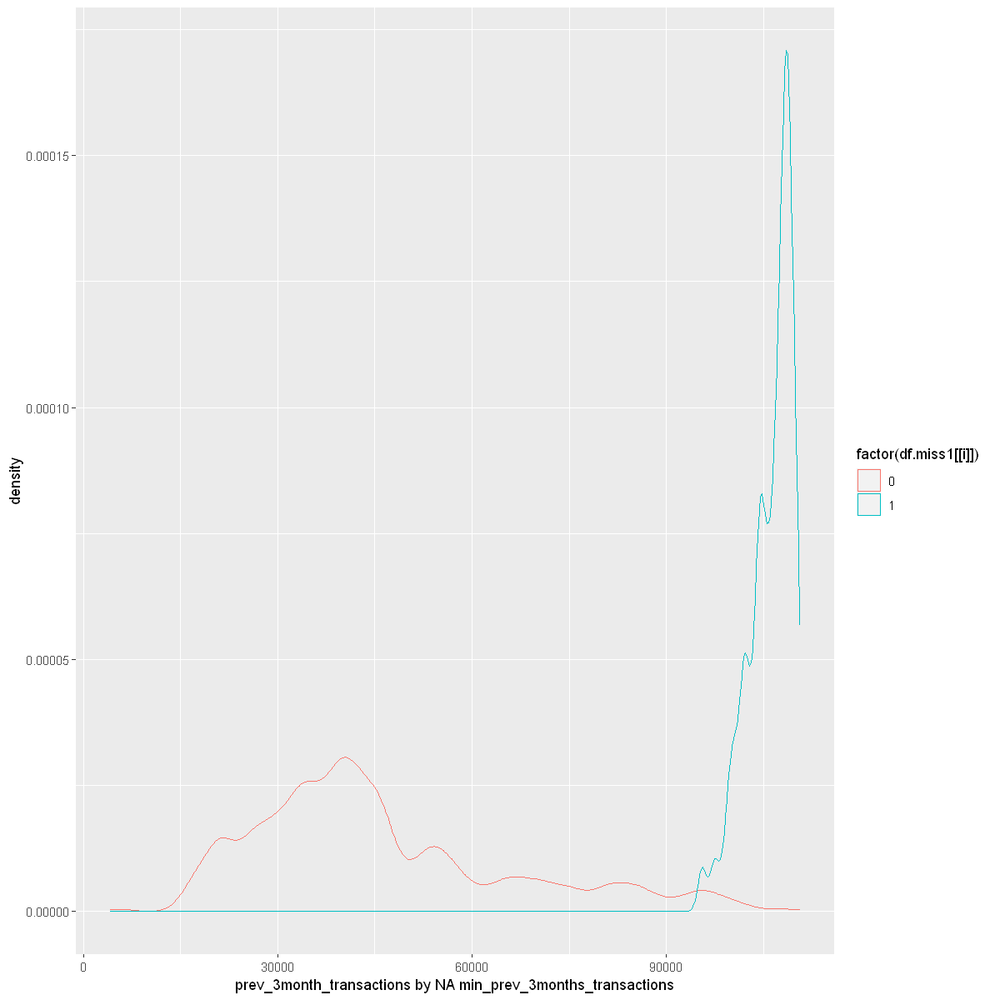


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3380.3, df = 231512, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -60256.19 -60186.35
sample estimates:
mean of x mean of y 
 46106.36 106327.63 

[1] "avg_prev_3months_transactions by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


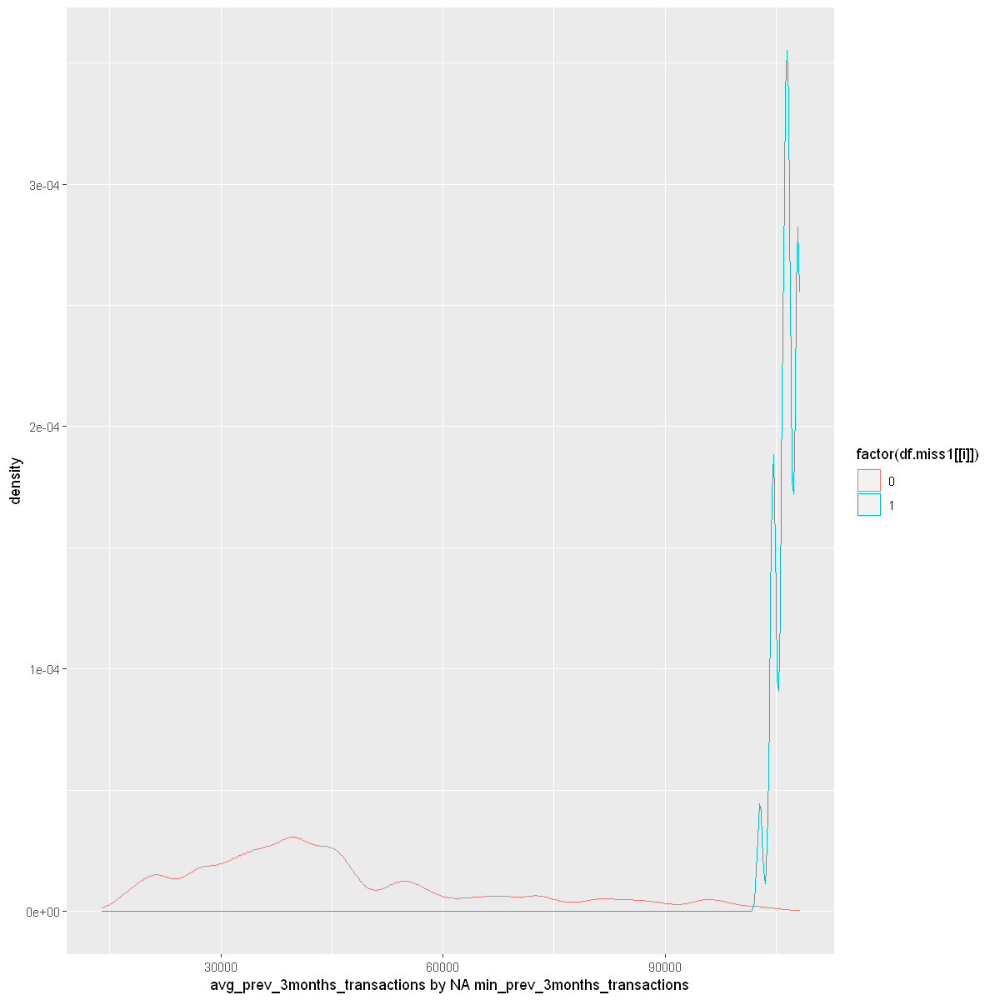


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2916.6, df = 167978, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -63046.48 -62961.80
sample estimates:
mean of x mean of y 
  48361.5  111365.6 

[1] "max_prev_3months_transactions by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


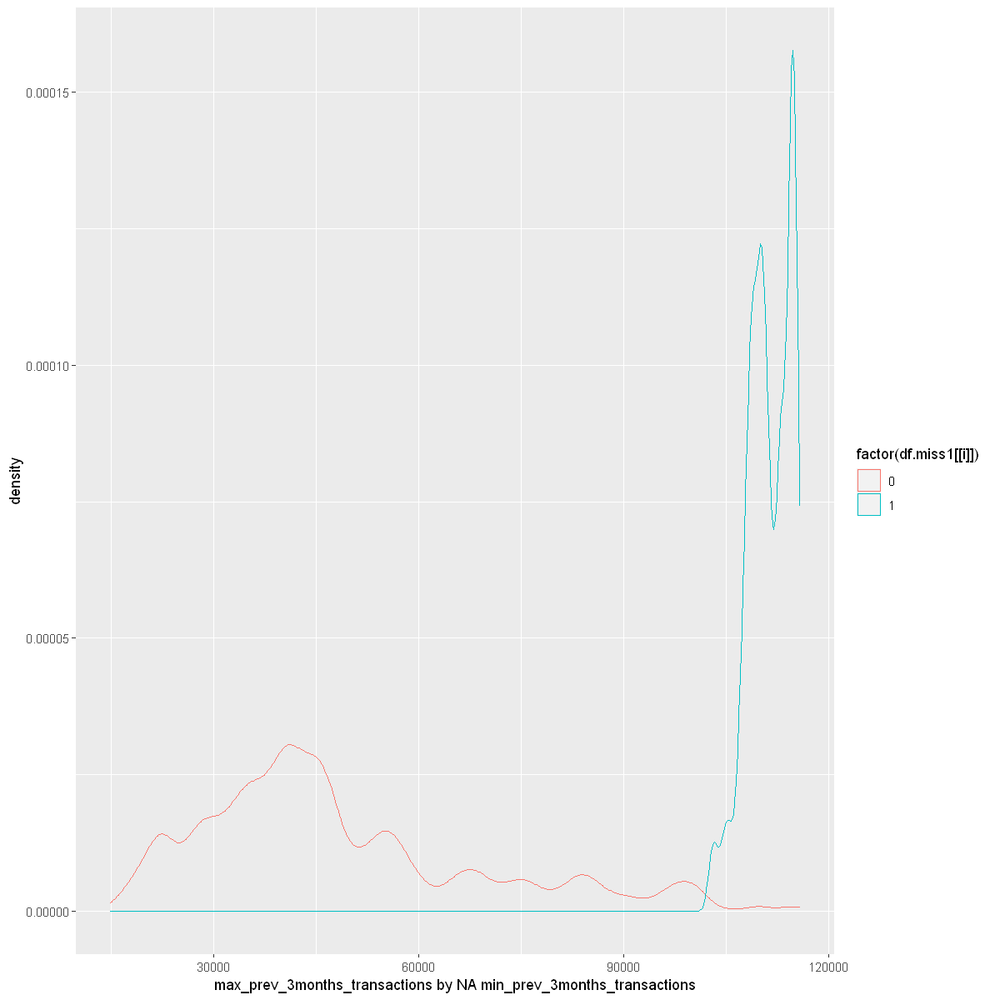


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -396.97, df = 172227, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.065138 -1.054671
sample estimates:
mean of x mean of y 
 4.699534  5.759439 

[1] "total_unit_sales by NA min_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27776 rows containing non-finite values (stat_density)."


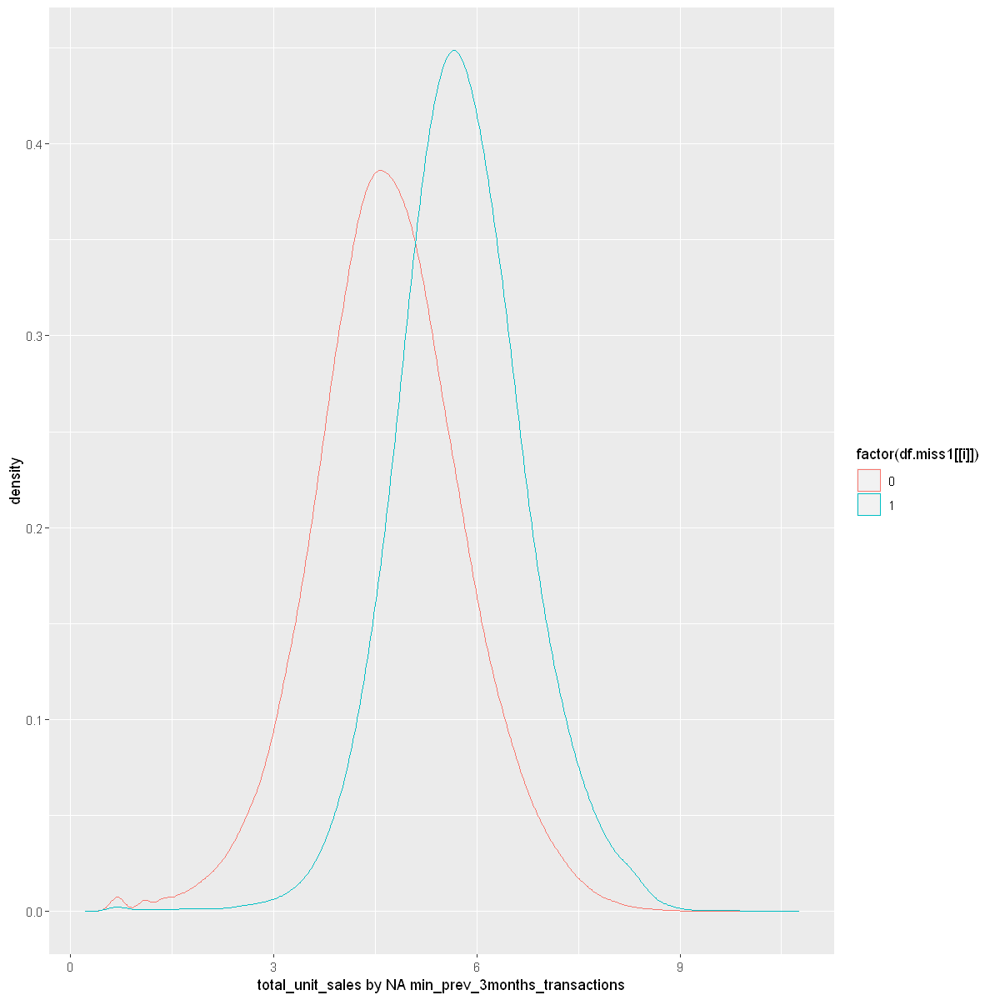


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -359.99, df = 145727, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9499808 -0.9396923
sample estimates:
mean of x mean of y 
 4.741937  5.686774 

[1] "prev_month_sales by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 27824 rows containing non-finite values (stat_density)."


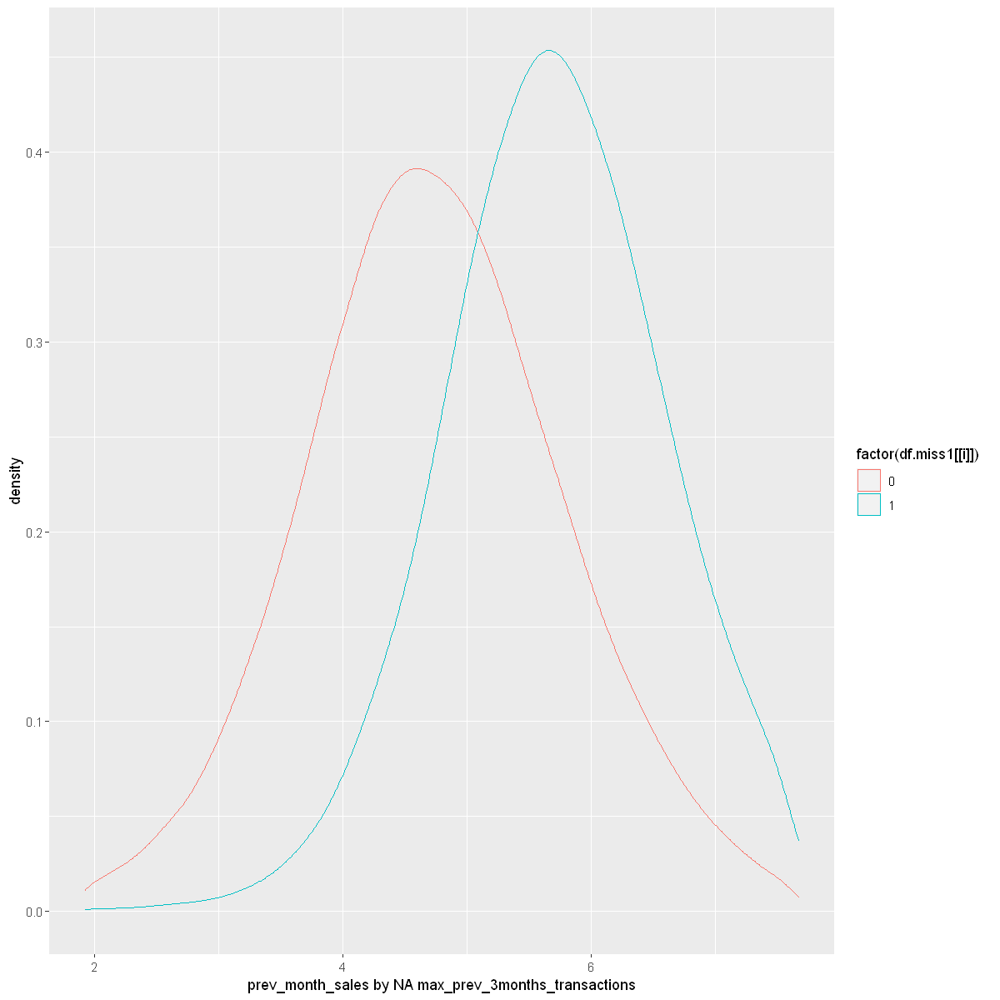


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -352.13, df = 145936, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9306196 -0.9203172
sample estimates:
mean of x mean of y 
 4.745250  5.670719 

[1] "prev_3month_sales by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20703 rows containing non-finite values (stat_density)."


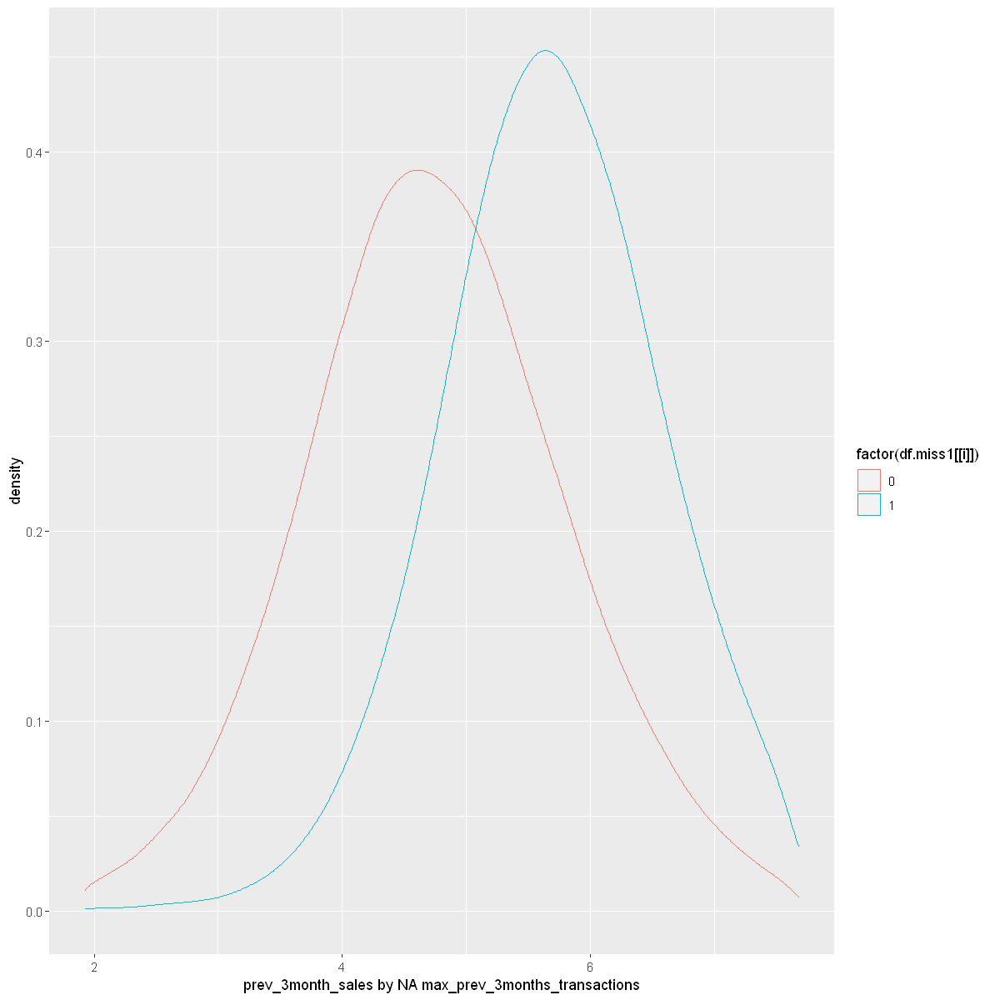


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -375.06, df = 146386, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9469091 -0.9370638
sample estimates:
mean of x mean of y 
 4.757782  5.699769 

[1] "avg_prev_3months_sales by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 33638 rows containing non-finite values (stat_density)."


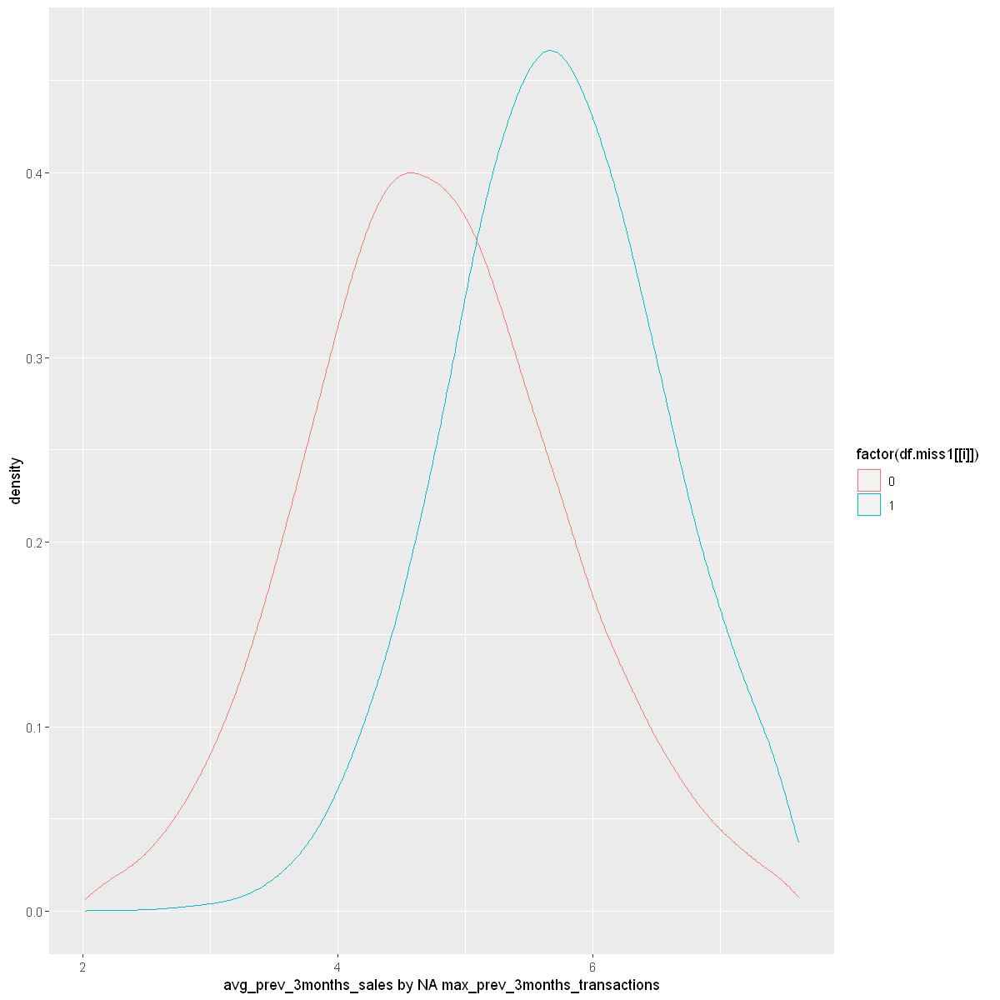


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -352.4, df = 145900, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9786845 -0.9678583
sample estimates:
mean of x mean of y 
 4.504658  5.477929 

[1] "min_prev_3months_sales by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 20918 rows containing non-finite values (stat_density)."


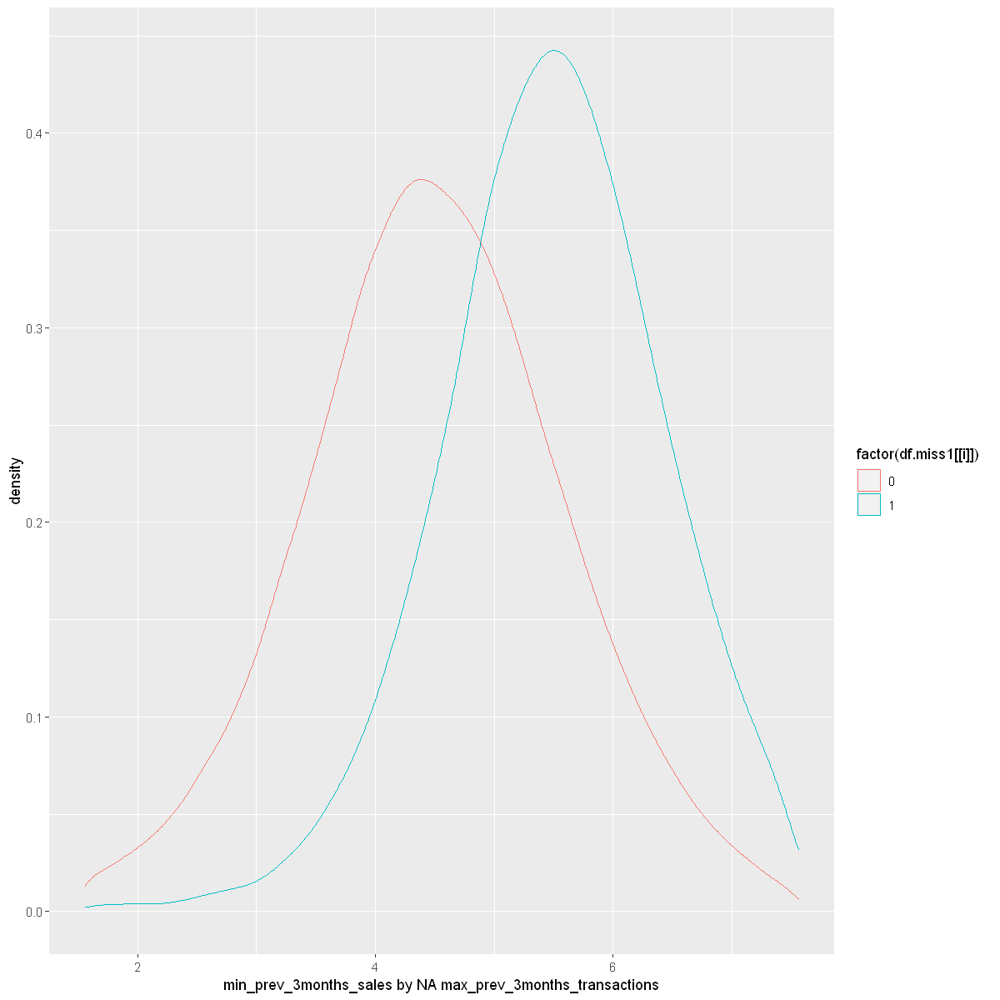


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -371.33, df = 145536, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.9254756 -0.9157572
sample estimates:
mean of x mean of y 
 4.951478  5.872094 

[1] "max_prev_3months_sales by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


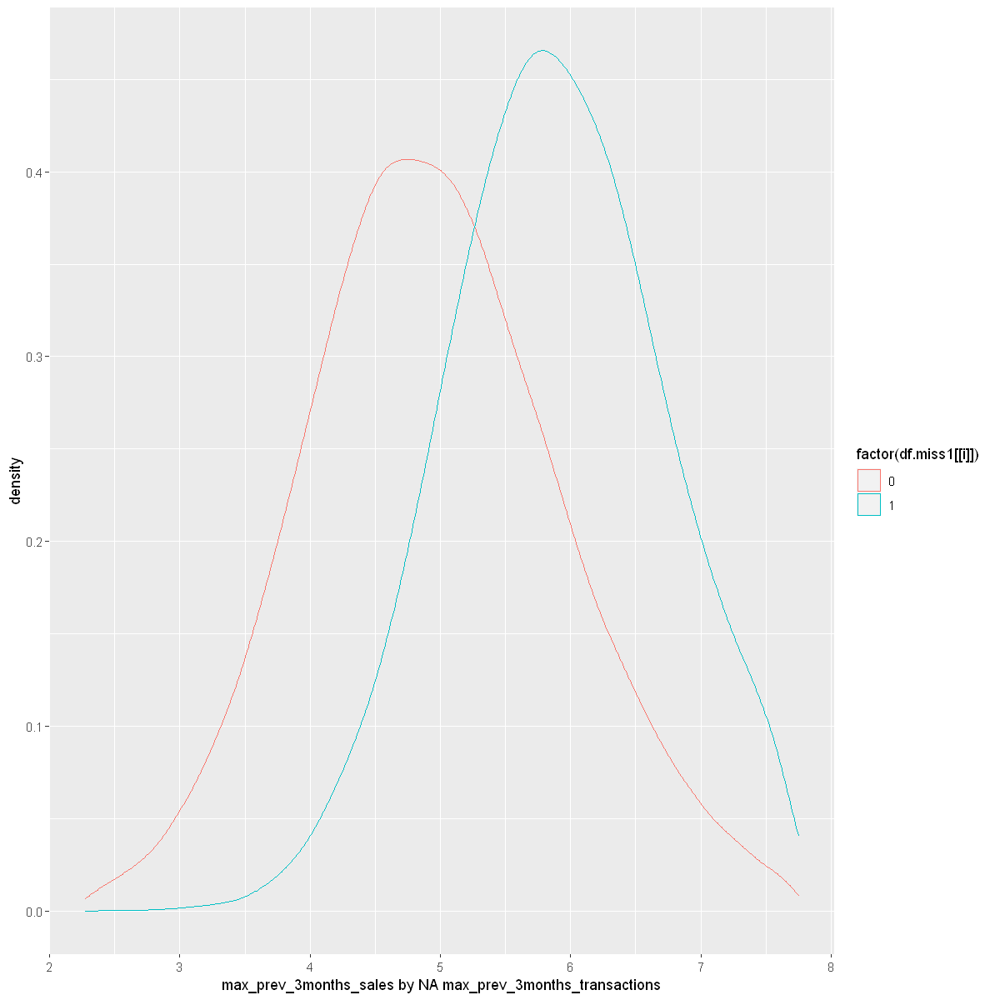


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -584.15, df = 30060, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -48129.51 -47807.61
sample estimates:
mean of x mean of y 
 45854.25  93822.80 

[1] "total_month_transactions by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


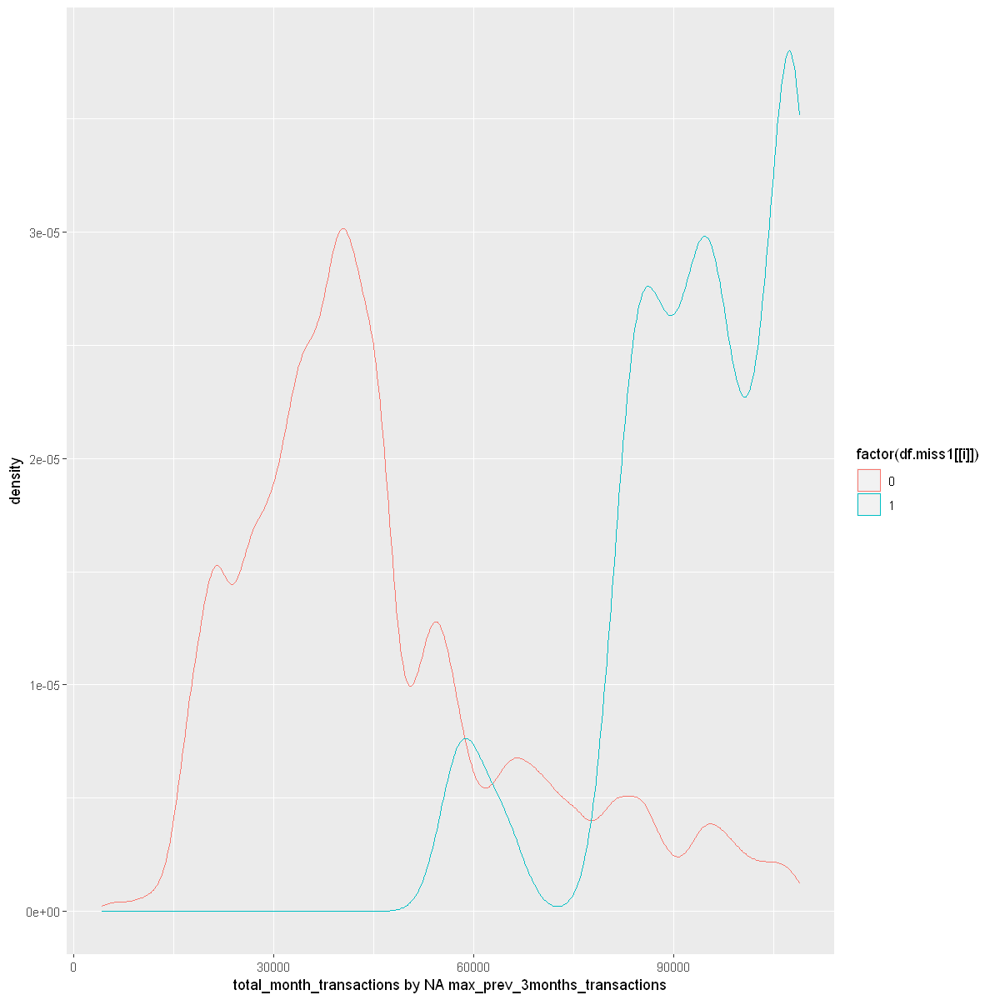


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1041.1, df = 33982, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -53605.66 -53404.19
sample estimates:
mean of x mean of y 
 46513.46 100018.39 

[1] "prev_month_transactions by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


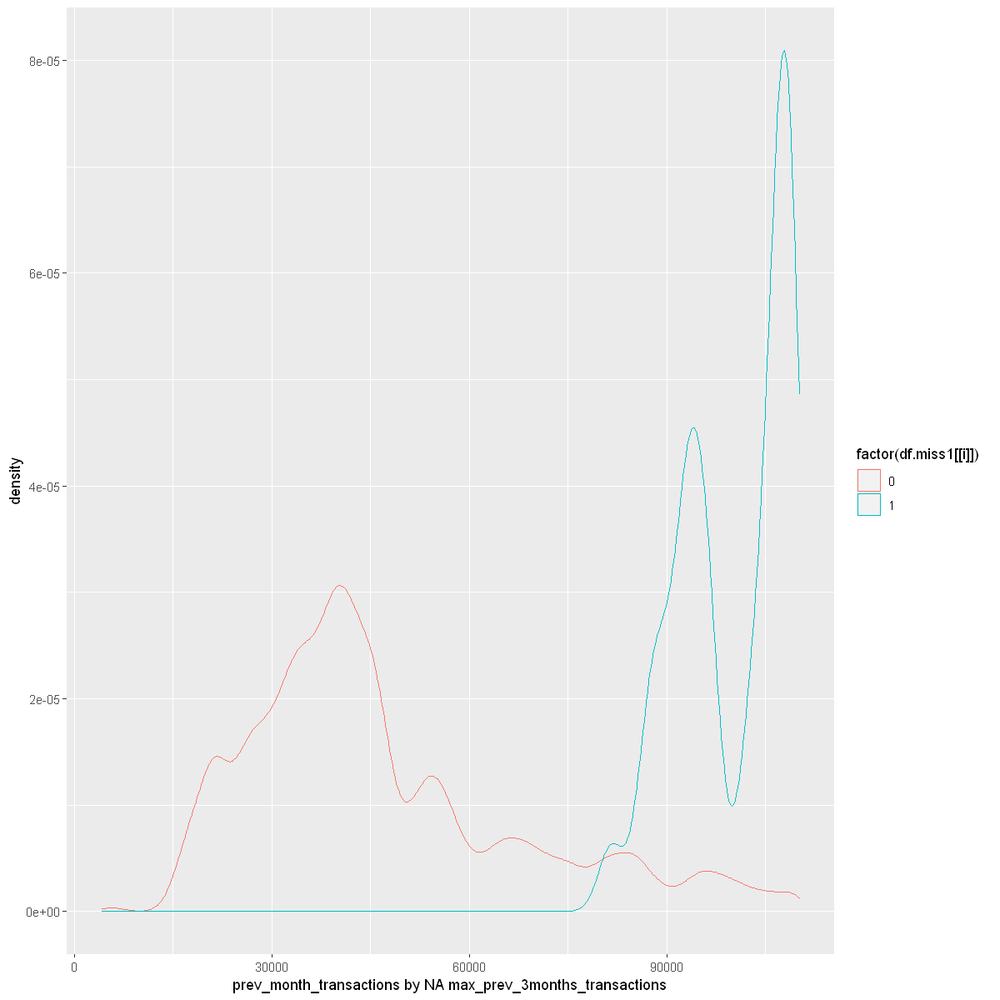


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1379.6, df = 62183, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -54026.98 -53873.69
sample estimates:
mean of x mean of y 
 46112.24 100062.57 

[1] "prev_3month_transactions by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


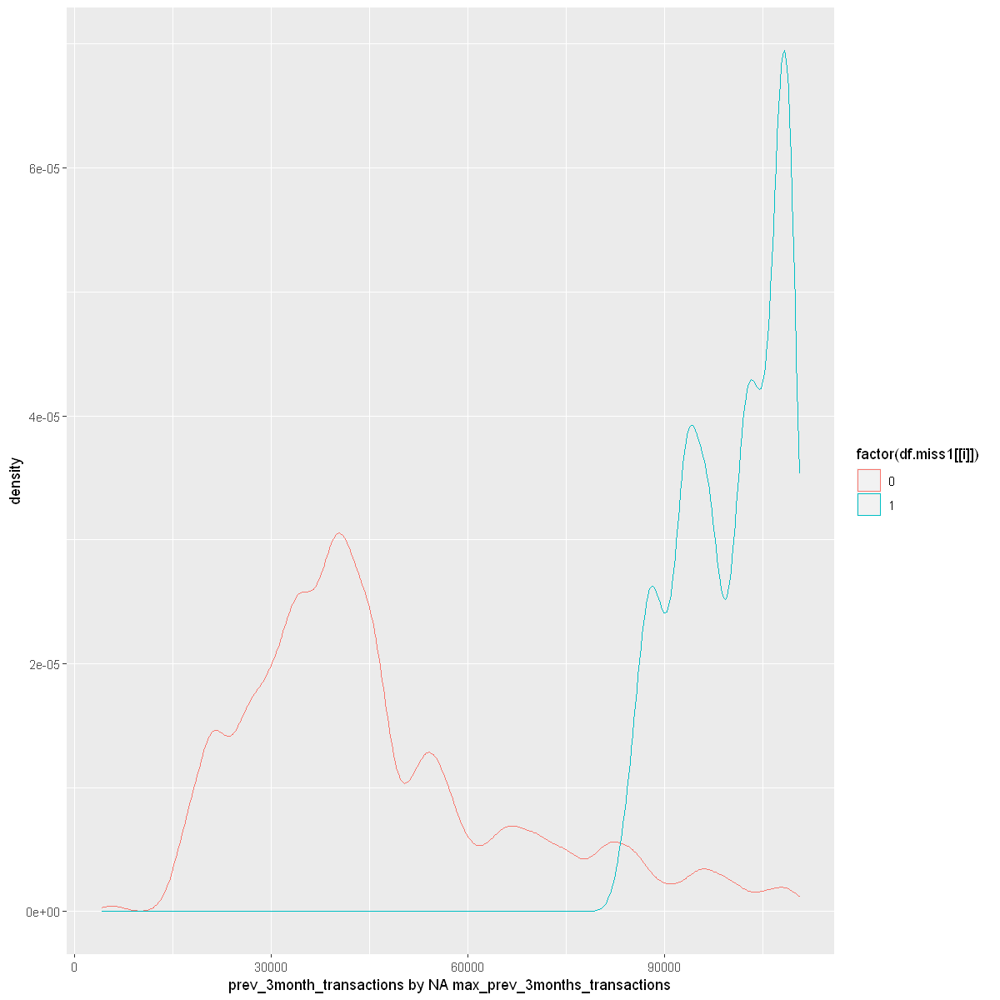


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2109.9, df = 47398, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -54205.28 -54104.66
sample estimates:
mean of x mean of y 
 46186.01 100340.98 

[1] "avg_prev_3months_transactions by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."
Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


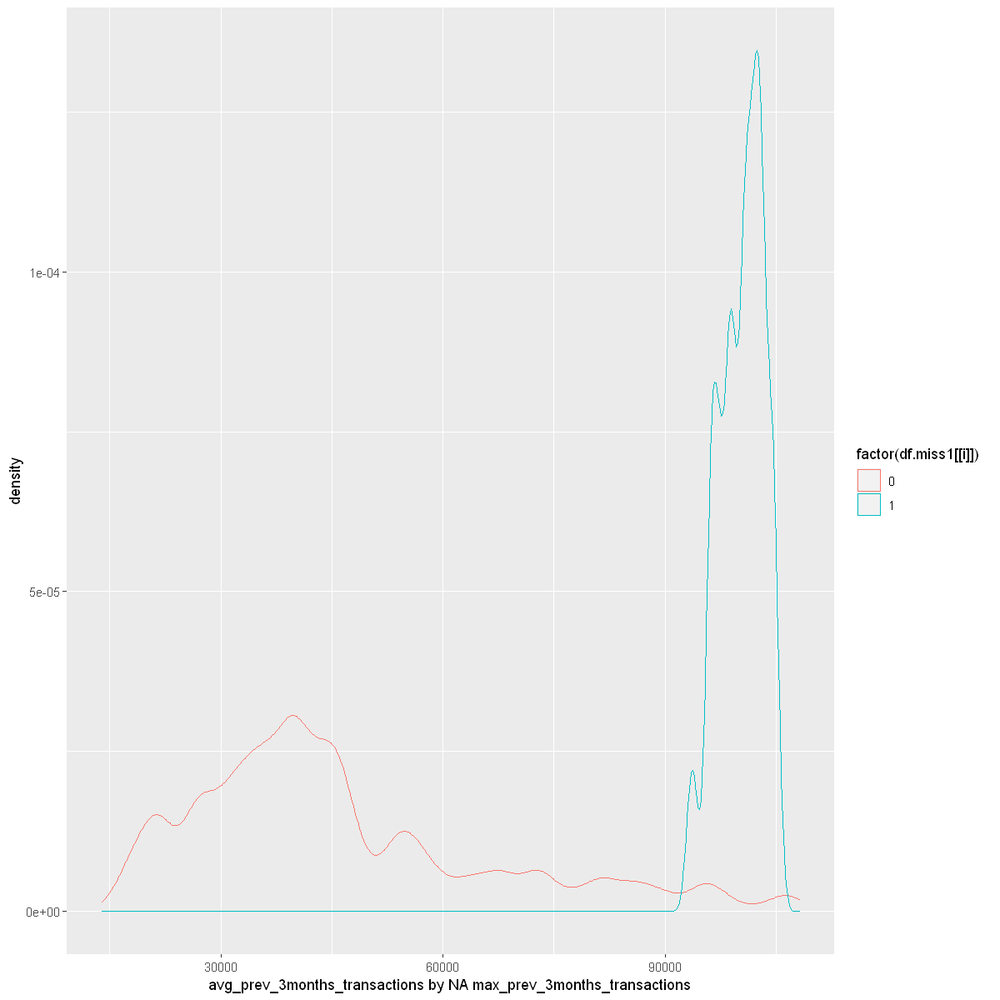


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -670.56, df = 27429, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -44925.68 -44663.81
sample estimates:
mean of x mean of y 
 42974.67  87769.41 

[1] "min_prev_3months_transactions by NA max_prev_3months_transactions"


Warning message:
"Use of `df.noout[[j]]` is discouraged. Use `.data[[j]]` instead."


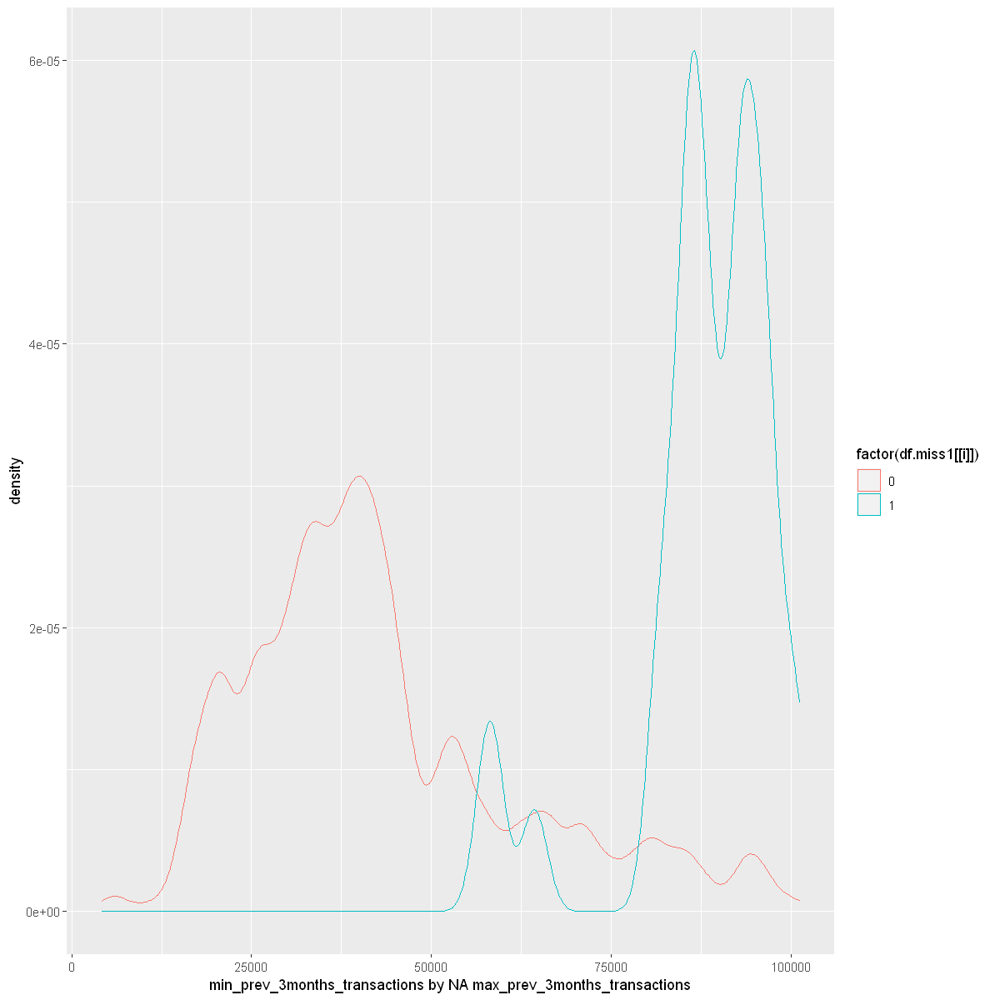


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -350.19, df = 148689, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -1.012386 -1.001117
sample estimates:
mean of x mean of y 
 4.711486  5.718237 

[1] "total_unit_sales by NA max_prev_3months_transactions"


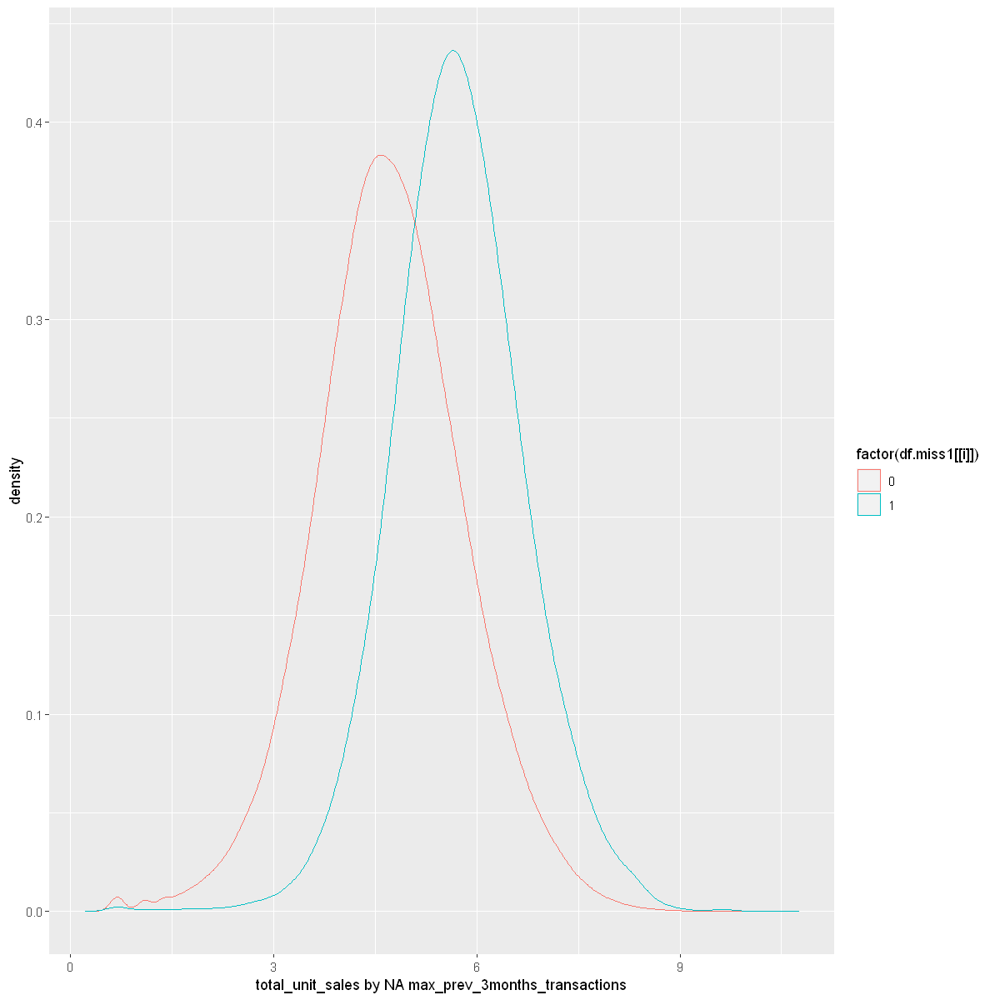

In [71]:
options(repr.plot.width=10,repr.plot.height=10)
par(mfrow=c(2,2))
for (i in l1){
    for (j in c(l1,'total_unit_sales')){
        if (i!=j) {
        print(ggplot(df.noout,aes(x=df.noout[[j]], group=factor(df.miss1[[i]]),
                             color=factor(df.miss1[[i]]))) +
geom_density(adjust=2)+labs(x=paste(j,'by NA',i,sep=' ')))
         b1<- df.noout %>% select(j,i) %>% filter(df.miss1[i]==0)  
         b2<- df.noout %>% select(j,i) %>% filter(df.miss1[i]==1) 
         print(t.test(b1[[j]],b2[[j]]))  
         print(paste(j,'by NA',i,sep=' '))
       }
    }
}

## Clustering the features wuth NA values

Warning message:
"package 'naniar' was built under R version 3.6.2"


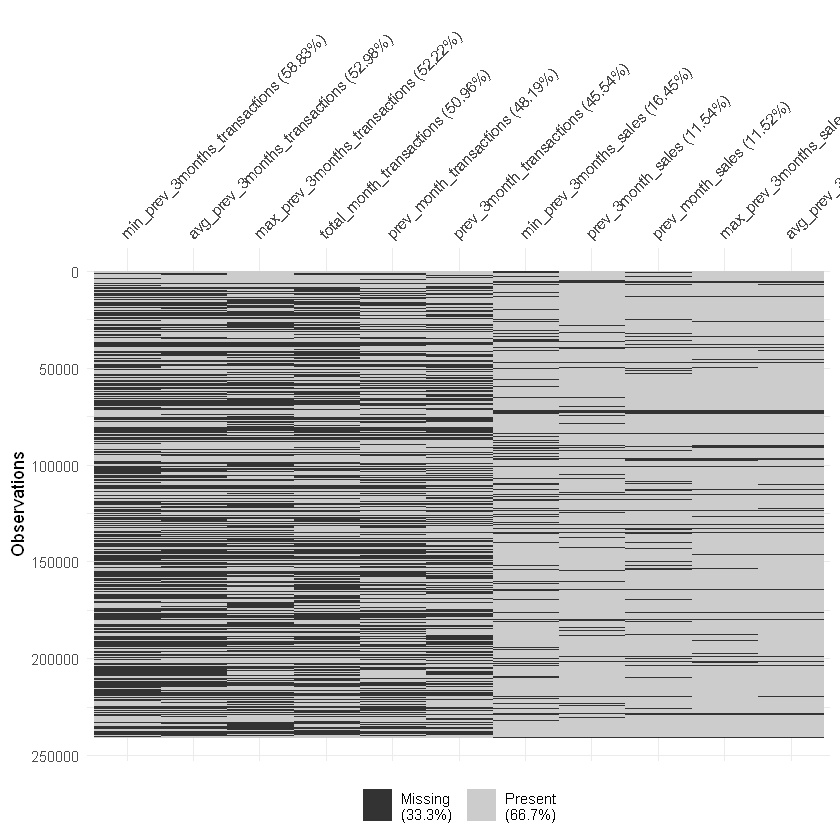

In [29]:
library(naniar)
vis_miss(df.out1, warn_large_data=FALSE )

In [72]:
df1 <- df.noout %>% select(id,min_prev_3months_sales,prev_month_sales,max_prev_3months_sales,avg_prev_3months_sales,prev_3month_sales)
df2 <- df.noout %>% select(id,min_prev_3months_transactions,avg_prev_3months_transactions,max_prev_3months_transactions,total_month_transactions,prev_month_transactions,prev_3month_transactions)

In [73]:
df1$NA1<- apply(is.na(df1), 1, sum)
df2$NA2 <- apply(is.na(df2), 1, sum)

In [74]:
df1 <- df1 %>% filter(NA1<4)
df2 <- df2 %>% filter(NA2<5)

In [75]:
dim(df1)

[1] 1961080       7

In [76]:
df3 <- inner_join(df1,df2,by="id")

In [77]:
head(df3)

,id,min_prev_3months_sales,prev_month_sales,max_prev_3months_sales,avg_prev_3months_sales,prev_3month_sales,NA1,min_prev_3months_transactions,avg_prev_3months_transactions,max_prev_3months_transactions,total_month_transactions,prev_month_transactions,prev_3month_transactions,NA2
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,1,3.806662,3.850148,4.465908,4.088774,3.988984,0,40587,44208.67,46740,46740,45299,47471,0
2,2,3.806662,3.806662,3.850148,3.821369,4.465908,0,45299,46108.33,46740,46286,46740,40587,0
3,3,3.806662,3.806662,3.871201,3.828641,3.850148,0,44876,45967.33,46740,44876,46286,45299,0
4,4,3.401197,3.871201,3.871201,3.713572,3.806662,0,44876,46345.33,47874,47874,44876,46740,0
5,5,3.401197,3.401197,3.871201,3.663562,3.806662,0,44876,46179.67,47874,45789,47874,46286,0
6,6,3.401197,3.663562,3.912023,3.680511,3.871201,0,44540,46067.67,47874,44540,45789,44876,0


In [78]:
df3 <- df3 %>% select(id)

In [79]:
df.noout <- left_join(df3,df.noout,by="id")

In [80]:
head(df.noout)

,id,item_nbr,store_nbr,Year,month,total_unit_sales,city,state,store_type,store_cluster,...,cluster8,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17
,<int>,<chr>,<chr>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,1,1003679,1,2013,4,3.806662,Quito,Pichincha,D,13,...,0,0,0,0,0,1,0,0,0,0
2,2,1003679,1,2013,5,3.806662,Quito,Pichincha,D,13,...,0,0,0,0,0,1,0,0,0,0
3,3,1003679,1,2013,6,3.871201,Quito,Pichincha,D,13,...,0,0,0,0,0,1,0,0,0,0
4,4,1003679,1,2013,7,3.401197,Quito,Pichincha,D,13,...,0,0,0,0,0,1,0,0,0,0
5,5,1003679,1,2013,8,3.663562,Quito,Pichincha,D,13,...,0,0,0,0,0,1,0,0,0,0
6,6,1003679,1,2013,9,3.912023,Quito,Pichincha,D,13,...,0,0,0,0,0,1,0,0,0,0


In [81]:
dim(df.noout)

[1] 1871228      85

In [41]:
getMissingness(df.noout)

[[1]]
                             var na.count rate
1  min_prev_3months_transactions    48458  2.6
2  max_prev_3months_transactions    37553  2.0
3       total_month_transactions    34741  1.9
4  avg_prev_3months_transactions    34716  1.9
5        prev_month_transactions    28196  1.5
6       prev_3month_transactions    25826  1.4
7         min_prev_3months_sales    24904  1.3
8              prev_3month_sales    15187  0.8
9               prev_month_sales    13043  0.7
10        max_prev_3months_sales     7169  0.4

[[2]]
[1] "This dataset has 1734047 (92.7%) complete rows. Original data has 1870359 rows."



var,na.count,rate
<fct>,<dbl>,<dbl>
min_prev_3months_transactions,48458,2.6
max_prev_3months_transactions,37553,2.0
total_month_transactions,34741,1.9
avg_prev_3months_transactions,34716,1.9
prev_month_transactions,28196,1.5
prev_3month_transactions,25826,1.4
min_prev_3months_sales,24904,1.3
prev_3month_sales,15187,0.8
prev_month_sales,13043,0.7


after removing the rows with a bulk of NA's now I check the missingness percentage of the reamin rows
because the percentage are very low at this features it seems to be that removing this rows from the data
will have a small influence on the final results

In [40]:
na_treat = read.csv("../project/NAs_treatment_project.csv")

In [41]:
na_treat

Feature_name,Scale,Missing.Mechanism,NA.Treatment,why
<fct>,<fct>,<fct>,<fct>,<fct>
prev_month_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
prev_3month_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
avg_prev_3months_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
min_prev_3months_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
max_prev_3months_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
total_month_transactions,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
prev_month_transactions,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
prev_3month_transactions,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
avg_prev_3month_transactions,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster


In [82]:
df.noout<- na.omit(df.noout)

In [83]:
dim(df.noout)

[1] 1737726      85

In [84]:
names(df.noout)

[1] "id"                            "item_nbr"                     
 [3] "store_nbr"                     "Year"                         
 [5] "month"                         "total_unit_sales"             
 [7] "city"                          "state"                        
 [9] "store_type"                    "store_cluster"                
[11] "prev_month_sales"              "prev_3month_sales"            
[13] "avg_prev_3months_sales"        "min_prev_3months_sales"       
[15] "max_prev_3months_sales"        "monthly_oilprice_avg"         
[17] "total_month_holidays"          "total_month_transactions"     
[19] "prev_month_transactions"       "prev_3month_transactions"     
[21] "avg_prev_3months_transactions" "min_prev_3months_transactions"
[23] "max_prev_3months_transactions" "family"                       
[25] "class"                         "perishable"                   
[27] "BREAD.BAKERY"                  "BEVERAGES"                    
[29] "DAIRY"                         "PERSONAL.CARE"                
[31] "HOME.CARE"                     "FROZEN.FOODS"                 
[33] "POULTRY"                       "GROCERY.II"                   
[35] "X.LIQUOR"                      "EGGS"                         
[37] "GROCERY.I"                     "CLEANING"                     
[39] "DELI"                          "store_typeA"                  
[41] "store_typeB"                   "store_typeC"                  
[43] "store_typeD"                   "store_typeE"                  
[45] "city_Ambato"                   "city_Babahoyo"                
[47] "city_Cayambe"                  "city_Cuenca"                  
[49] "city_Daule"                    "city_El.Carmen"               
[51] "city_Esmeraldas"               "city_Guaranda"                
[53] "city_Guayaquil"                "city_Ibarra"                  
[55] "city_Latacunga"                "city_Libertad"                
[57] "city_Loja"                     "city_Machala"                 
[59] "city_Manta"                    "city_Playas"                  
[61] "city_Puyo"                     "city_Quevedo"                 
[63] "city_Quito"                    "city_Riobamba"                
[65] "city_Salinas"                  "city_Santo.Domingo"           
[67] "total_city_sales"              "sales_perc"                   
[69] "cluster1"                      "cluster2"                     
[71] "cluster3"                      "cluster4"                     
[73] "cluster5"                      "cluster6"                     
[75] "cluster7"                      "cluster8"                     
[77] "cluster9"                      "cluster10"                    
[79] "cluster11"                     "cluster12"                    
[81] "cluster13"                     "cluster14"                    
[83] "cluster15"                     "cluster16"                    
[85] "cluster17"

In [85]:
###df.noout <- df.noout[, ! names(df.noout) %in% c('class')]

In [86]:
df.noout[,l2]

,Year,month,total_unit_sales,prev_month_sales,prev_3month_sales,avg_prev_3months_sales,min_prev_3months_sales,max_prev_3months_sales,monthly_oilprice_avg,total_month_holidays,...,cluster8,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17
,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,2013,4,3.806662,3.850148,3.988984,4.088774,3.806662,4.465908,92.02136,5,...,0,0,0,0,0,1,0,0,0,0
2,2013,5,3.806662,3.806662,4.465908,3.821369,3.806662,3.850148,94.50955,3,...,0,0,0,0,0,1,0,0,0,0
3,2013,6,3.871201,3.806662,3.850148,3.828641,3.806662,3.871201,95.77250,4,...,0,0,0,0,0,1,0,0,0,0
4,2013,7,3.401197,3.871201,3.806662,3.713572,3.401197,3.871201,104.67091,4,...,0,0,0,0,0,1,0,0,0,0
5,2013,8,3.663562,3.401197,3.806662,3.663562,3.401197,3.871201,106.57273,4,...,0,0,0,0,0,1,0,0,0,0
6,2013,9,3.912023,3.663562,3.871201,3.680511,3.401197,3.912023,106.28950,1,...,0,0,0,0,0,1,0,0,0,0
7,2013,10,3.637586,3.912023,3.401197,3.745575,3.637586,3.912023,100.53826,2,...,0,0,0,0,0,1,0,0,0,0
8,2013,11,4.043051,3.637586,3.663562,3.878121,3.637586,4.043051,93.86400,7,...,0,0,0,0,0,1,0,0,0,0
9,2013,12,5.298317,4.043051,3.912023,4.588363,3.637586,5.298317,97.62524,4,...,0,0,0,0,0,1,0,0,0,0


In [87]:
df1 <- df.noout[,!names(df.noout) %in% c('total_unit_sales')]

In [88]:
df2 <- df.noout %>% select(c('id','total_unit_sales'))

In [89]:
df3 <- full_join(df1,df2,by='id') 

In [90]:
head(df3)

,id,item_nbr,store_nbr,Year,month,city,state,store_type,store_cluster,prev_month_sales,...,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17,total_unit_sales
,<int>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
1,1,1003679,1,2013,4,Quito,Pichincha,D,13,3.850148,...,0,0,0,0,1,0,0,0,0,3.806662
2,2,1003679,1,2013,5,Quito,Pichincha,D,13,3.806662,...,0,0,0,0,1,0,0,0,0,3.806662
3,3,1003679,1,2013,6,Quito,Pichincha,D,13,3.806662,...,0,0,0,0,1,0,0,0,0,3.871201
4,4,1003679,1,2013,7,Quito,Pichincha,D,13,3.871201,...,0,0,0,0,1,0,0,0,0,3.401197
5,5,1003679,1,2013,8,Quito,Pichincha,D,13,3.401197,...,0,0,0,0,1,0,0,0,0,3.663562
6,6,1003679,1,2013,9,Quito,Pichincha,D,13,3.663562,...,0,0,0,0,1,0,0,0,0,3.912023


In [91]:
dim(df3)

[1] 1737726      85

In [93]:
write.csv(df3,file="/Users/Guy/Documents/DataScience/data/project_flatfile.csv", row.names=FALSE)

In [56]:
l2 <- c()
for (v in names(df3)){
    if (is.numeric(df[[v]])==T)
          {l2<- c(l2,v)
    } 
}

In [57]:
getMissingness (df3[,l2])

[[1]]
[1] var      na.count rate    
<0 rows> (or 0-length row.names)

[[2]]
[1] "This dataset has 1734047 (100%) complete rows. Original data has 1734047 rows."



var,na.count,rate
<fct>,<dbl>,<dbl>


In [58]:
write.csv(df3[,l2],file="/Users/Guy/Documents/DataScience/data/numeric_feature_table.csv", row.names=FALSE)

In [94]:
summary(df.noout)

       id            item_nbr          store_nbr              Year     
 Min.   :      1   Length:1737726     Length:1737726     Min.   :2013  
 1st Qu.: 494513   Class :character   Class :character   1st Qu.:2014  
 Median : 988365   Mode  :character   Mode  :character   Median :2015  
 Mean   : 988249                                         Mean   :2015  
 3rd Qu.:1482059                                         3rd Qu.:2016  
 Max.   :1975242                                         Max.   :2017  
     month        total_unit_sales     city              state          
 Min.   : 1.000   Min.   :1.556    Length:1737726     Length:1737726    
 1st Qu.: 4.000   1st Qu.:4.025    Class :character   Class :character  
 Median : 7.000   Median :4.682    Mode  :character   Mode  :character  
 Mean   : 6.552   Mean   :4.701                                         
 3rd Qu.: 9.000   3rd Qu.:5.371                                         
 Max.   :12.000   Max.   :7.749                           

3.2.1 - Show the distribution of each numeric variable by missingness of other variables

Warning message:
"Removed 180962 rows containing non-finite values (stat_density)."



	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -372, df = 36997, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -251.5671 -248.9300
sample estimates:
mean of x mean of y 
 137.0766  387.3252 

[1] "prev_3month_sales by NA prev_month_sales"


Warning message:
"Removed 181824 rows containing non-finite values (stat_density)."


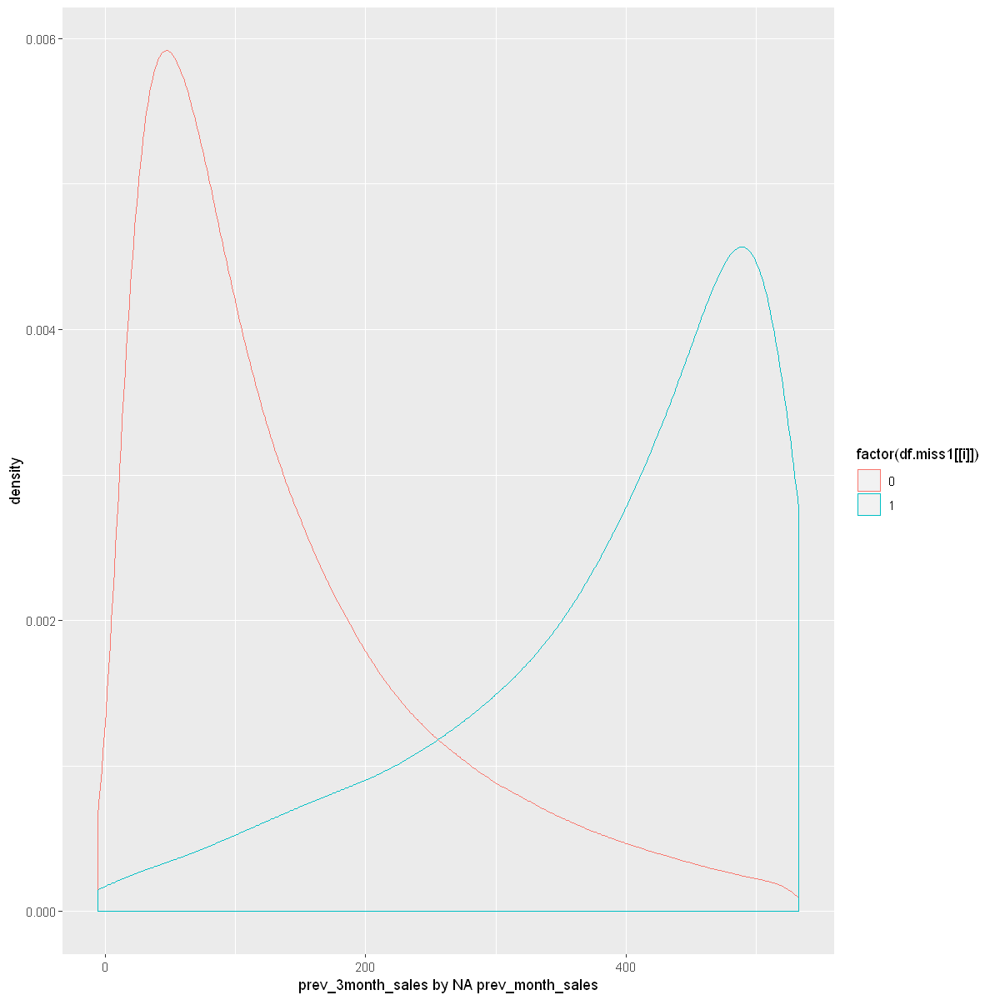


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -688.38, df = 18568, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -322.0324 -320.2037
sample estimates:
mean of x mean of y 
 139.5706  460.6886 

[1] "avg_prev_3months_sales by NA prev_month_sales"


Warning message:
"Removed 183073 rows containing non-finite values (stat_density)."


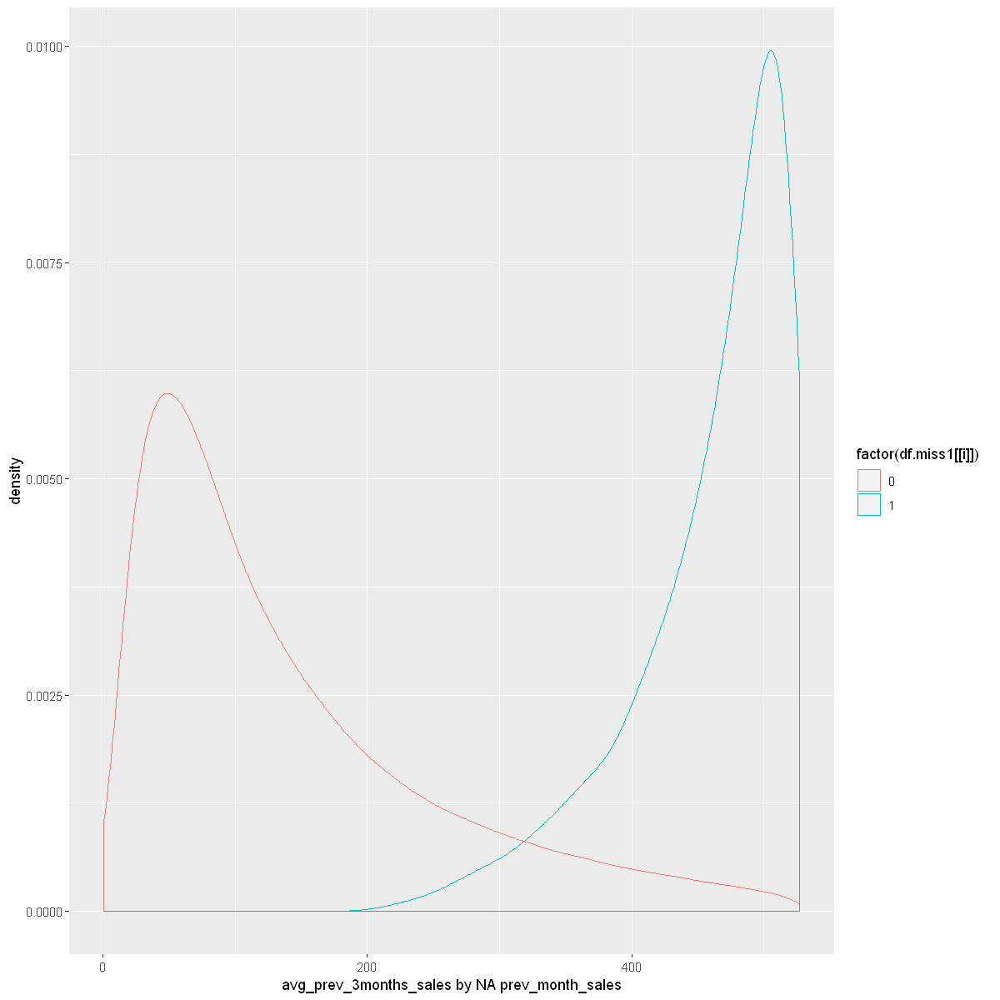


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -277.32, df = 24877, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -194.8887 -192.1531
sample estimates:
mean of x mean of y 
 110.8104  304.3313 

[1] "min_prev_3months_sales by NA prev_month_sales"


Warning message:
"Removed 182080 rows containing non-finite values (stat_density)."


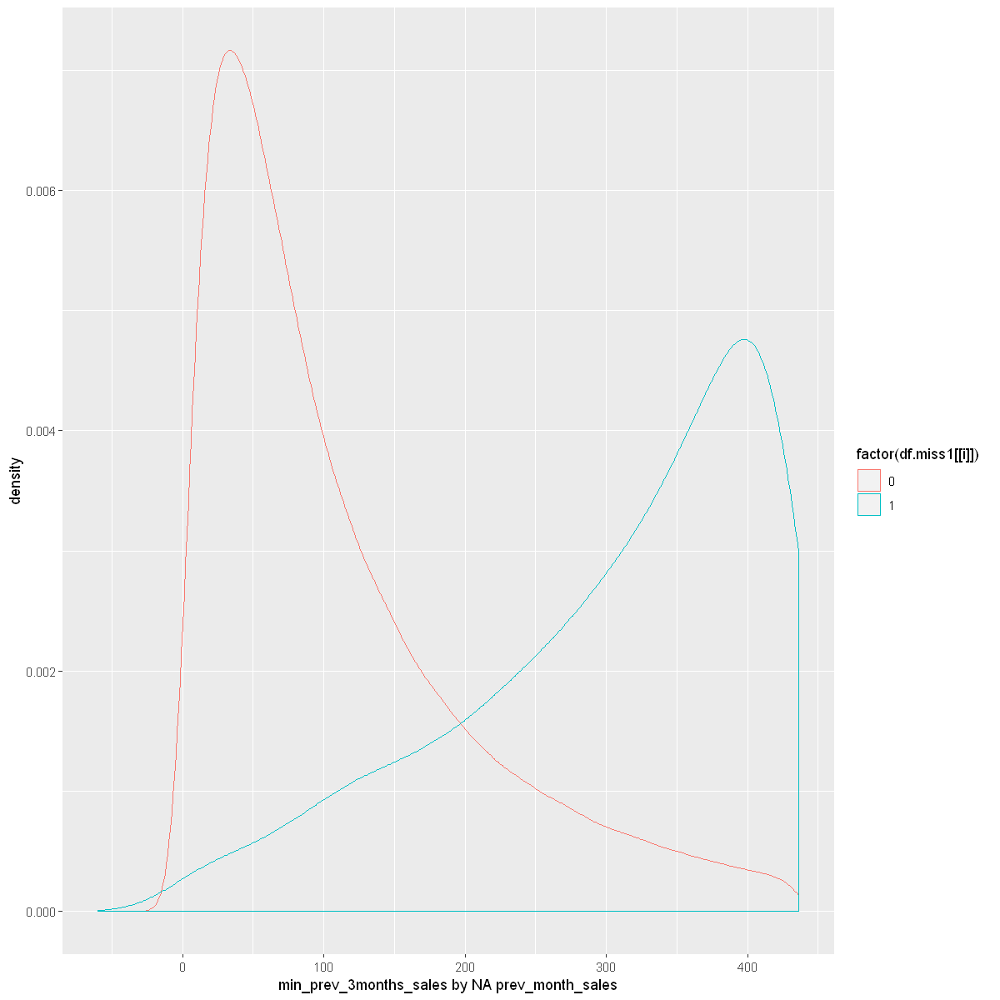


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2038.8, df = 39507, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -415.7002 -414.9017
sample estimates:
mean of x mean of y 
 166.2479  581.5489 

[1] "max_prev_3months_sales by NA prev_month_sales"


Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


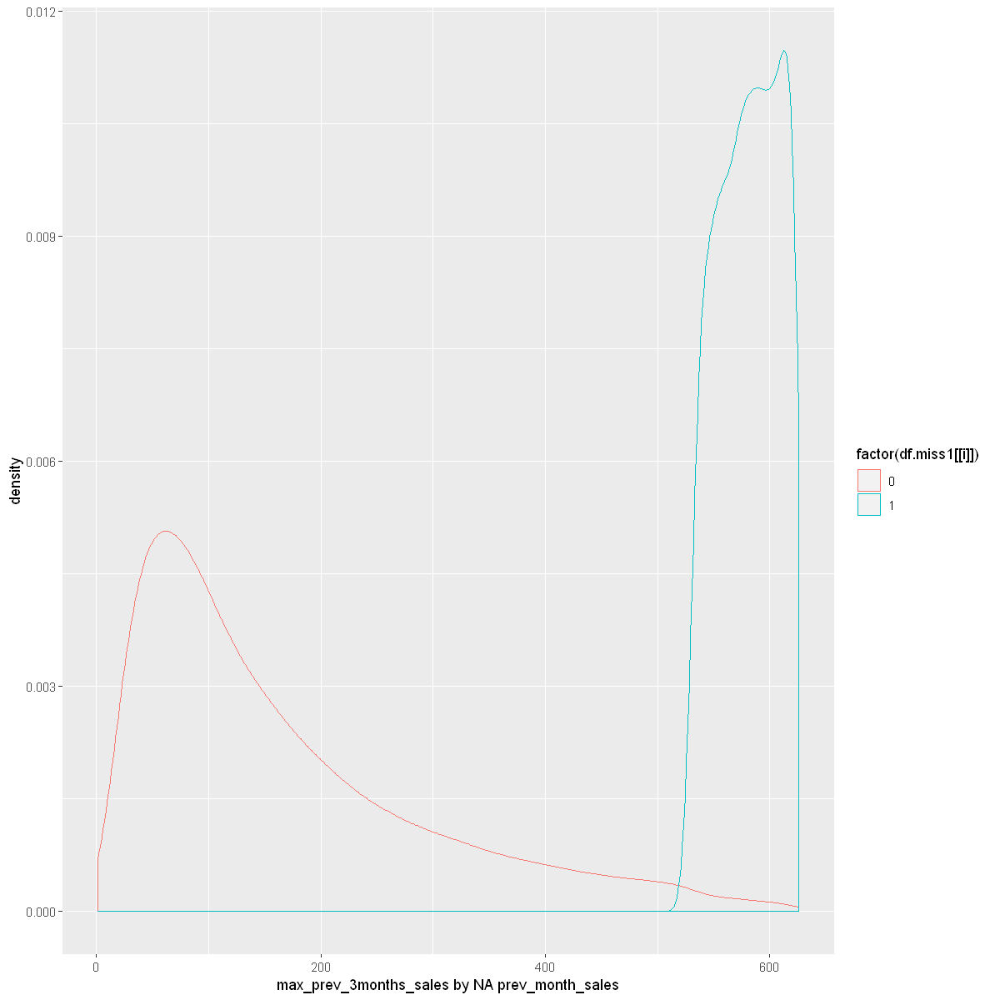


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -206.06, df = 166763, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -13936.84 -13674.22
sample estimates:
mean of x mean of y 
 45472.91  59278.44 

[1] "total_month_transactions by NA prev_month_sales"


Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


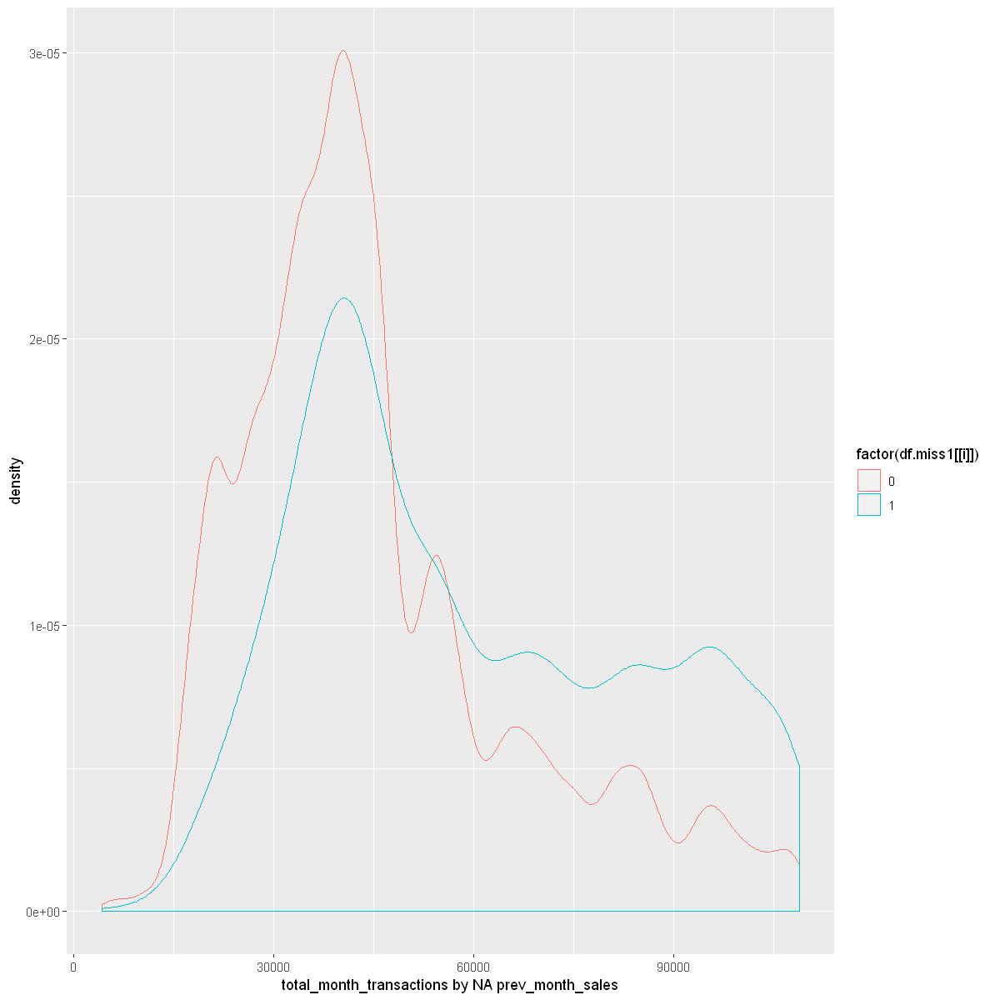


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -215.08, df = 167767, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14618.34 -14354.31
sample estimates:
mean of x mean of y 
 46160.20  60646.52 

[1] "prev_month_transactions by NA prev_month_sales"


Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


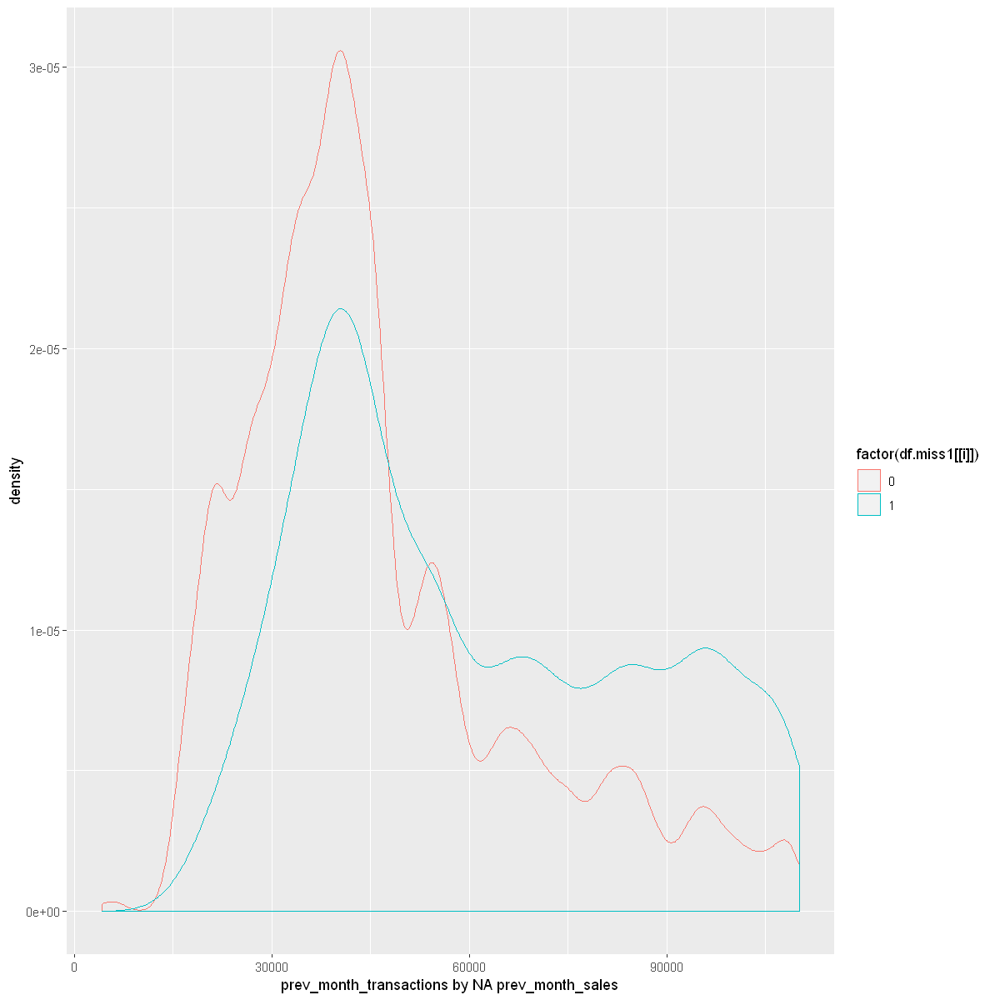


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -214.92, df = 170987, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14773.11 -14506.10
sample estimates:
mean of x mean of y 
 46209.77  60849.37 

[1] "prev_3month_transactions by NA prev_month_sales"


Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


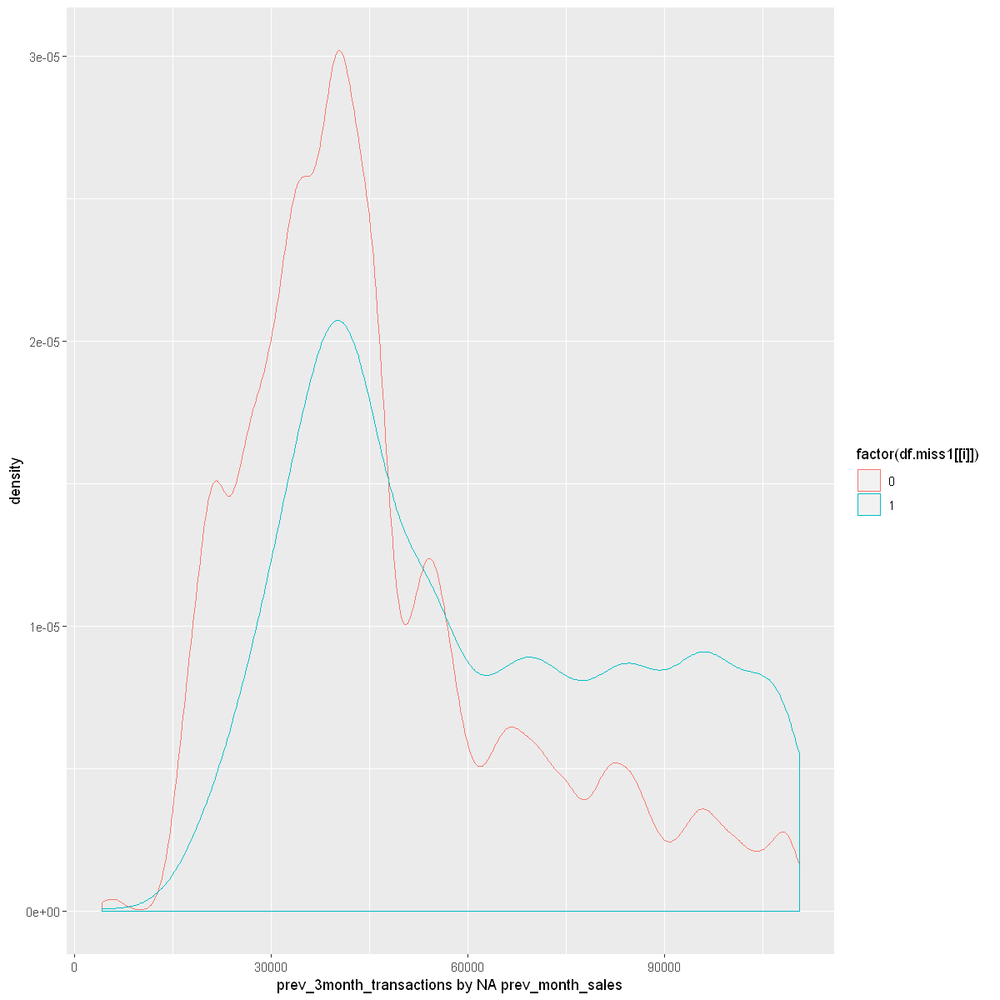


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -206.92, df = 164356, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -13804.61 -13545.55
sample estimates:
mean of x mean of y 
 45692.14  59367.22 

[1] "avg_prev_3months_transactions by NA prev_month_sales"


Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


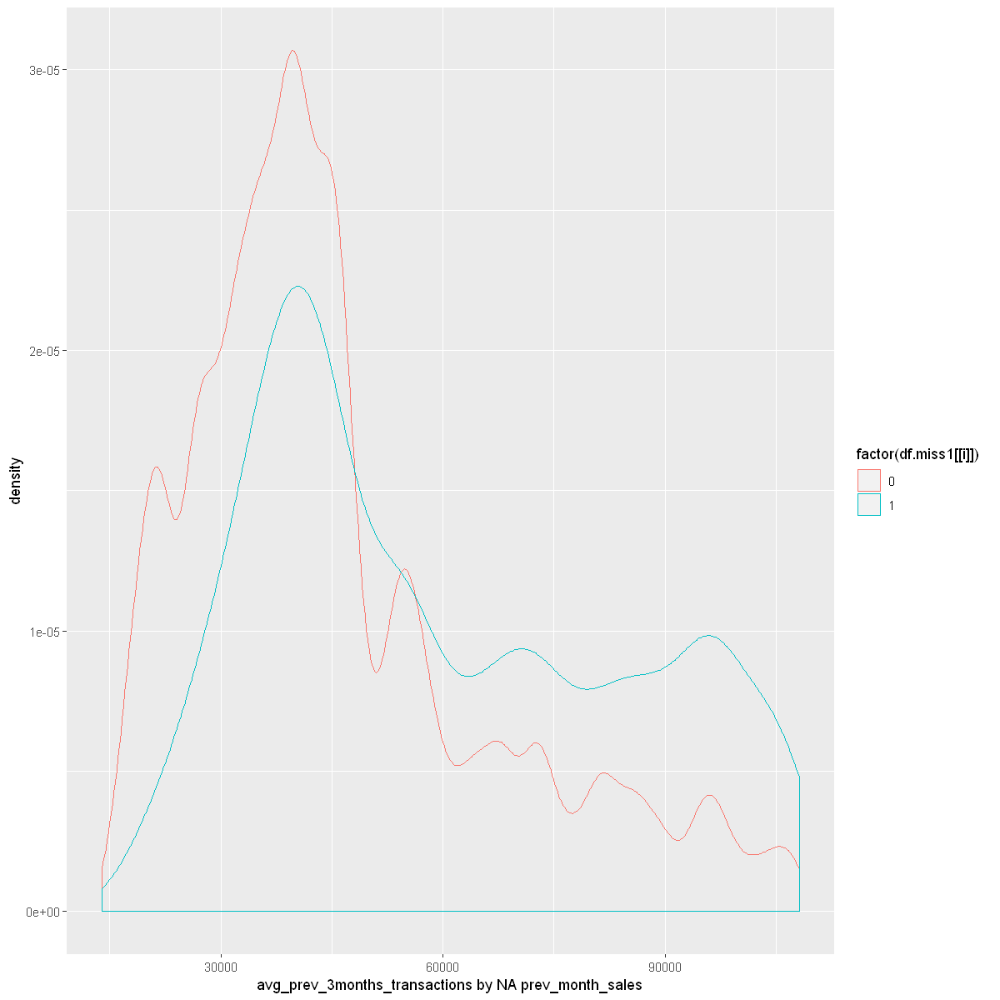


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -196.83, df = 160916, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -12241.15 -11999.76
sample estimates:
mean of x mean of y 
 42640.67  54761.13 

[1] "min_prev_3months_transactions by NA prev_month_sales"


Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


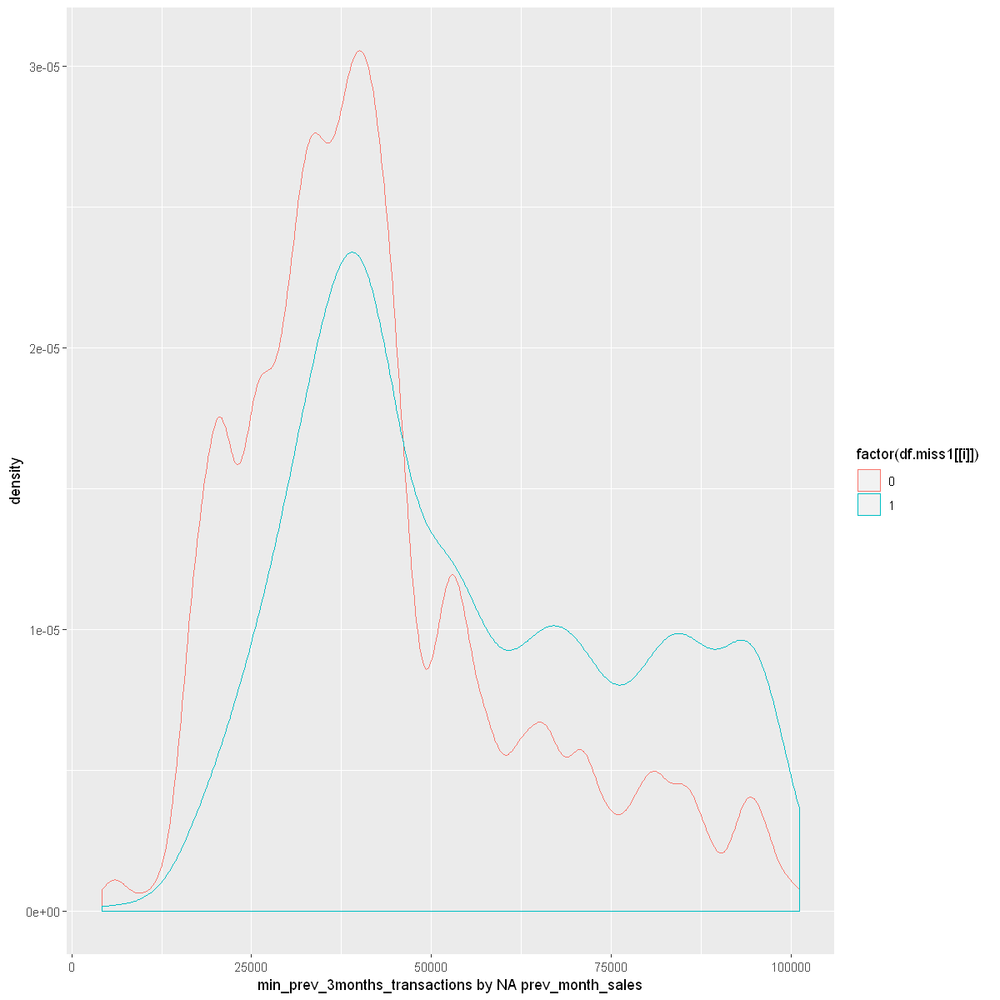


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -208.71, df = 165375, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14897.71 -14620.51
sample estimates:
mean of x mean of y 
 48579.02  63338.13 

[1] "max_prev_3months_transactions by NA prev_month_sales"


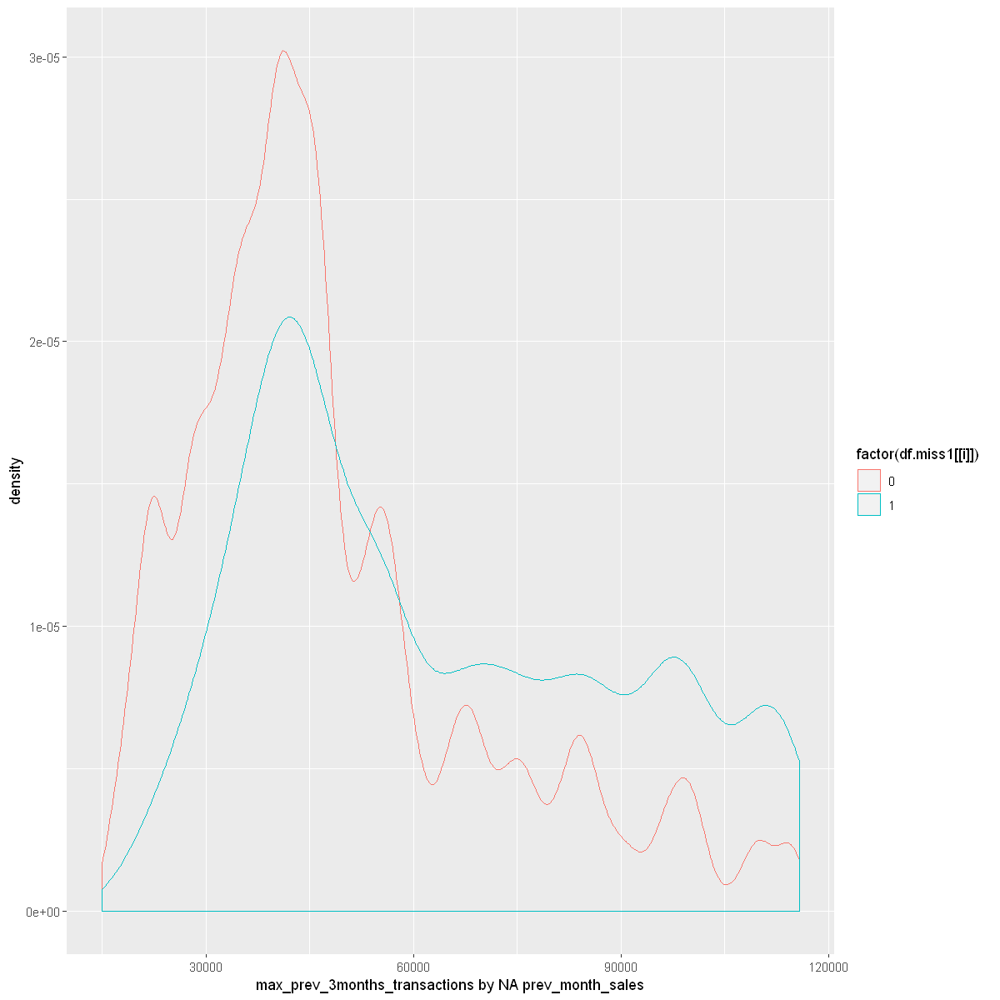


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -423.24, df = 183282, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -876.8555 -868.7717
sample estimates:
mean of x mean of y 
  144.876  1017.690 

[1] "total_unit_sales by NA prev_month_sales"


Warning message:
"Removed 182194 rows containing non-finite values (stat_density)."


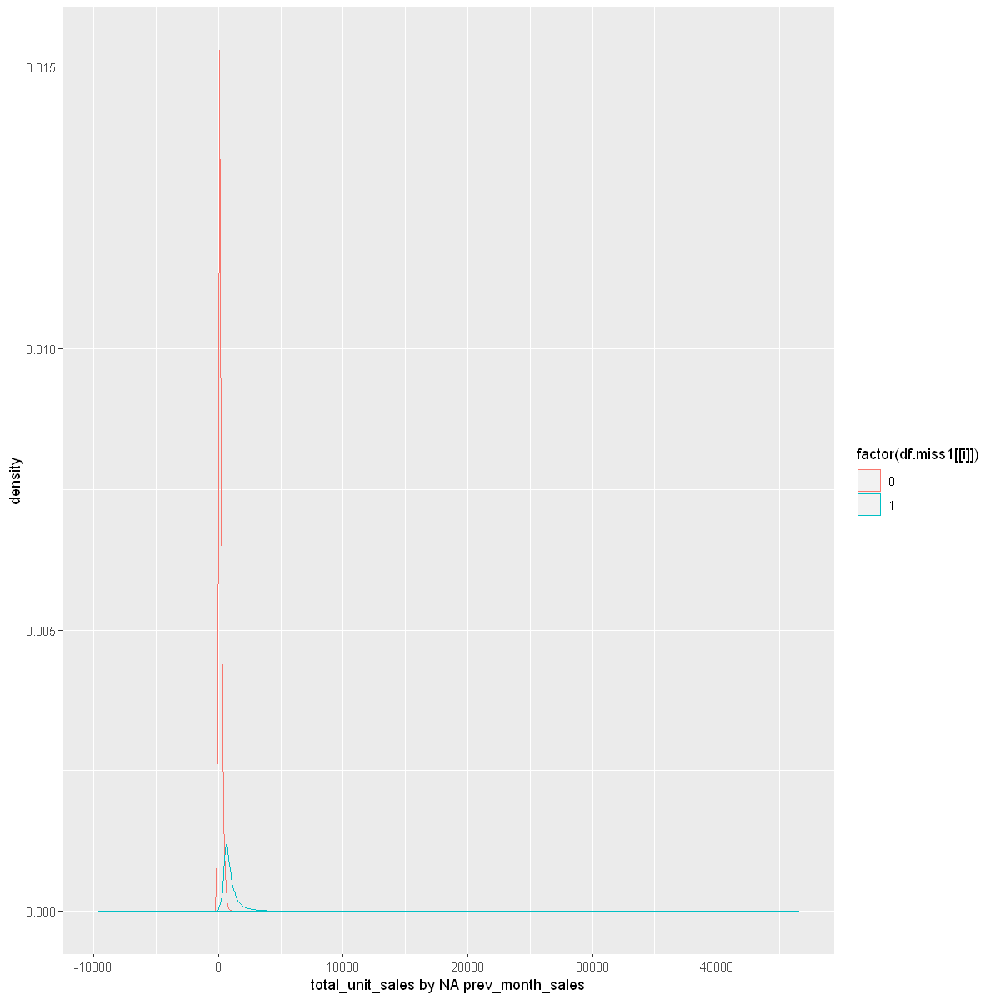


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -375.24, df = 35724, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -252.6066 -249.9814
sample estimates:
mean of x mean of y 
 136.6399  387.9339 

[1] "prev_month_sales by NA prev_3month_sales"


Warning message:
"Removed 181824 rows containing non-finite values (stat_density)."


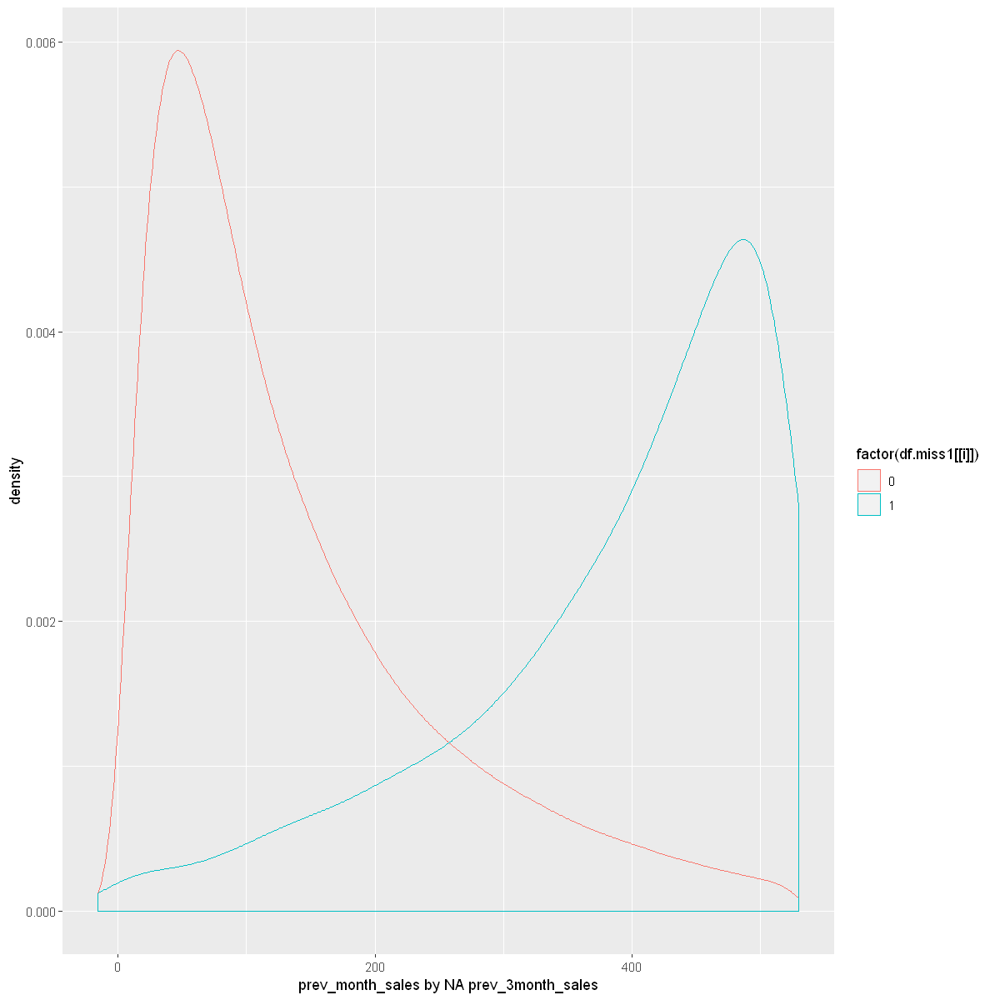


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -434.14, df = 30894, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -269.9217 -267.4954
sample estimates:
mean of x mean of y 
 138.2210  406.9296 

[1] "avg_prev_3months_sales by NA prev_3month_sales"


Warning message:
"Removed 183073 rows containing non-finite values (stat_density)."


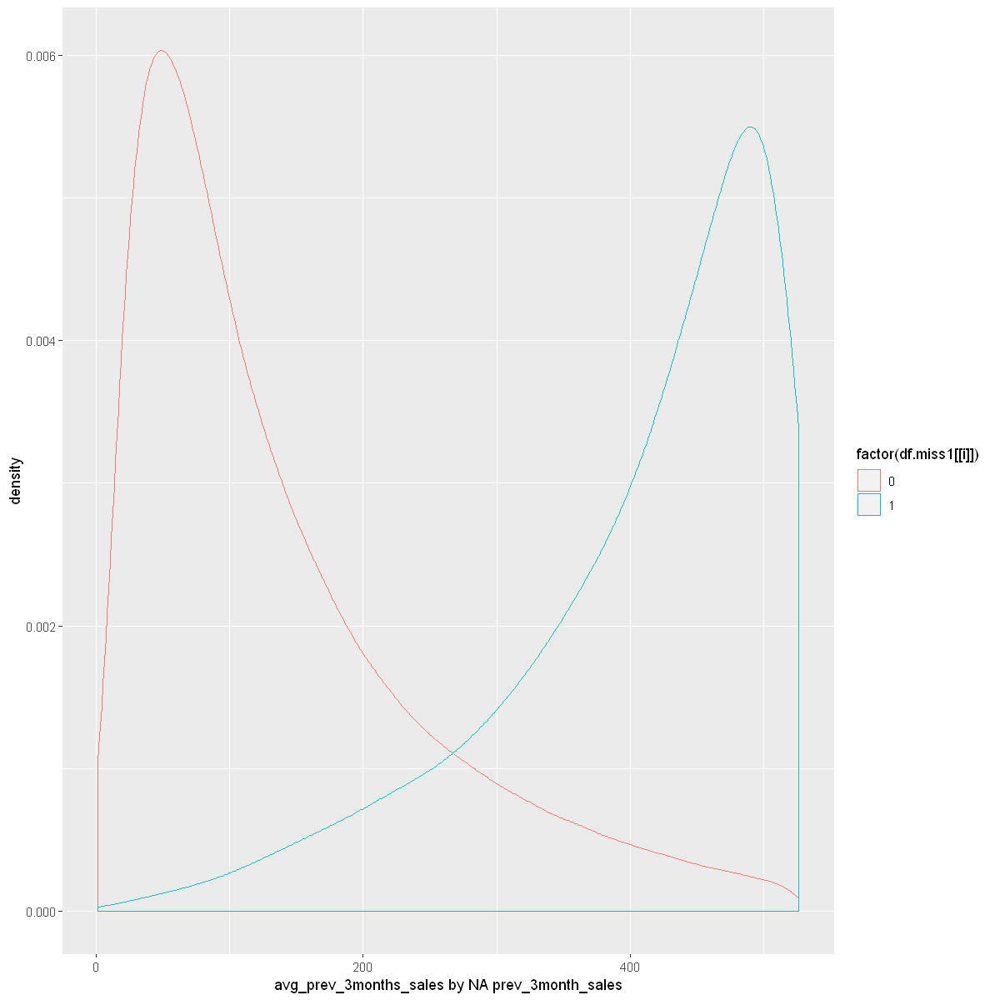


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -280.75, df = 32280, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -184.8753 -182.3118
sample estimates:
mean of x mean of y 
 110.2114  293.8049 

[1] "min_prev_3months_sales by NA prev_3month_sales"


Warning message:
"Removed 182080 rows containing non-finite values (stat_density)."


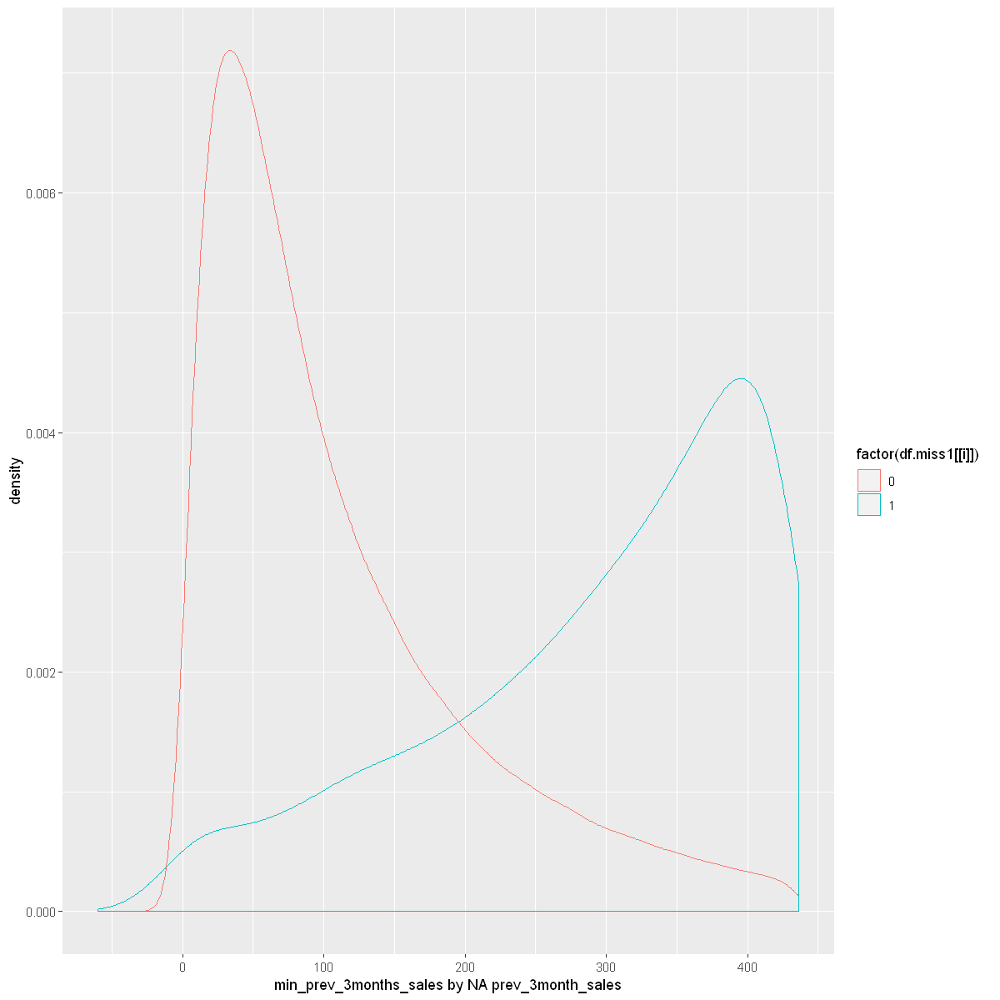


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -548.12, df = 36757, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -338.1442 -335.7345
sample estimates:
mean of x mean of y 
 165.1280  502.0674 

[1] "max_prev_3months_sales by NA prev_3month_sales"


Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


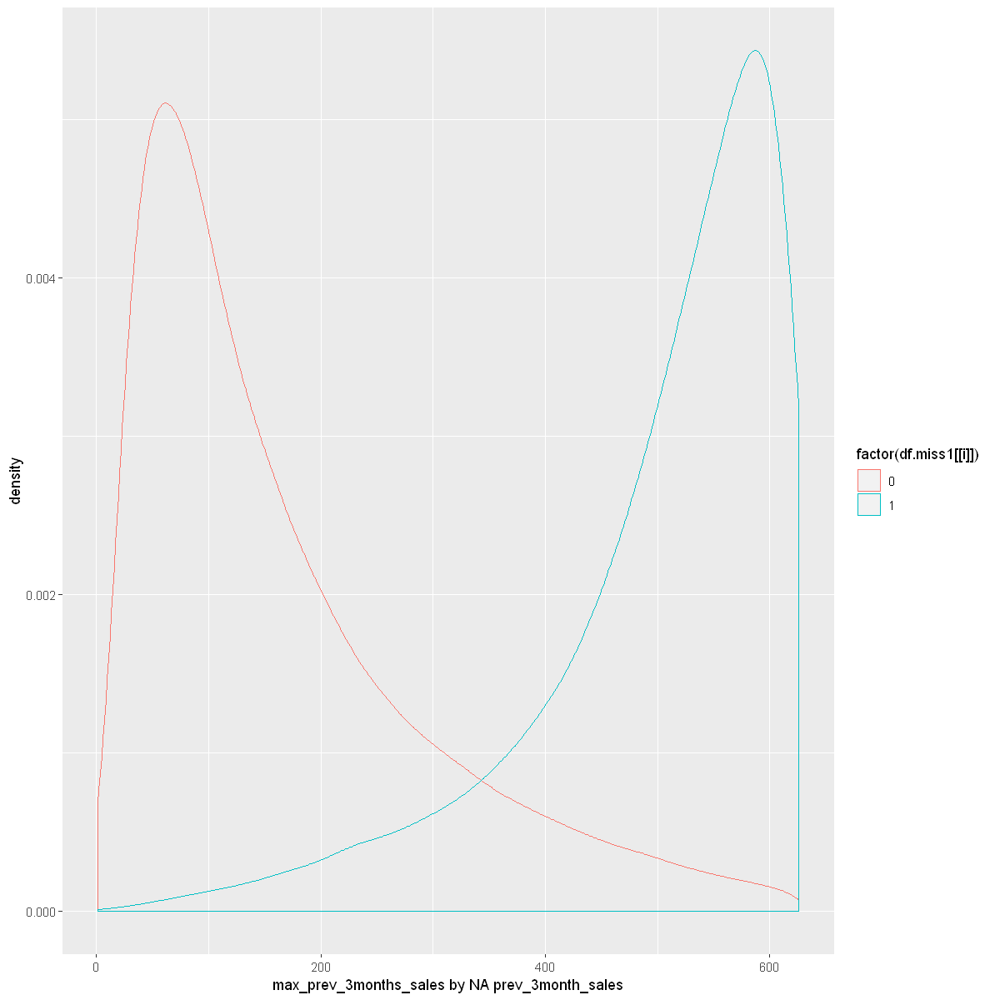


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -205.55, df = 165318, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -13979.54 -13715.46
sample estimates:
mean of x mean of y 
  45477.6   59325.1 

[1] "total_month_transactions by NA prev_3month_sales"


Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


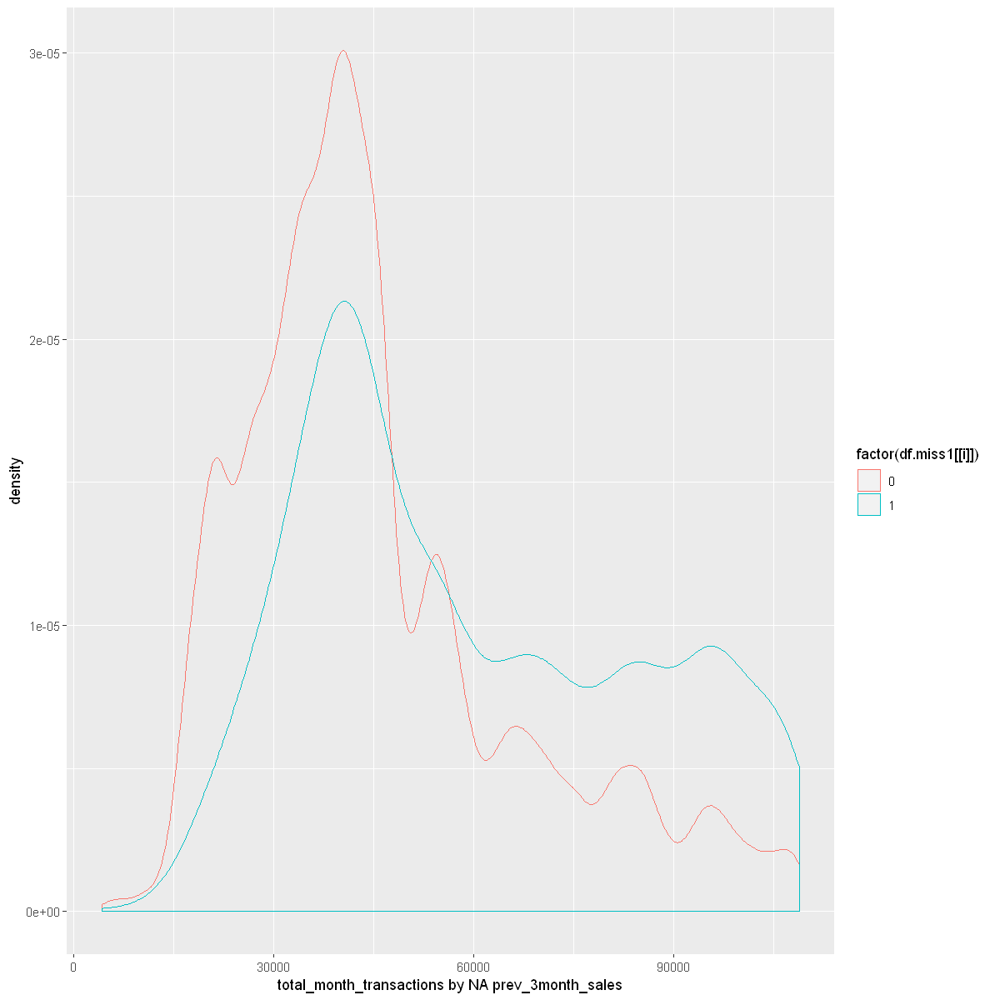


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -211.64, df = 167377, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14515.23 -14248.85
sample estimates:
mean of x mean of y 
 46168.55  60550.59 

[1] "prev_month_transactions by NA prev_3month_sales"


Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


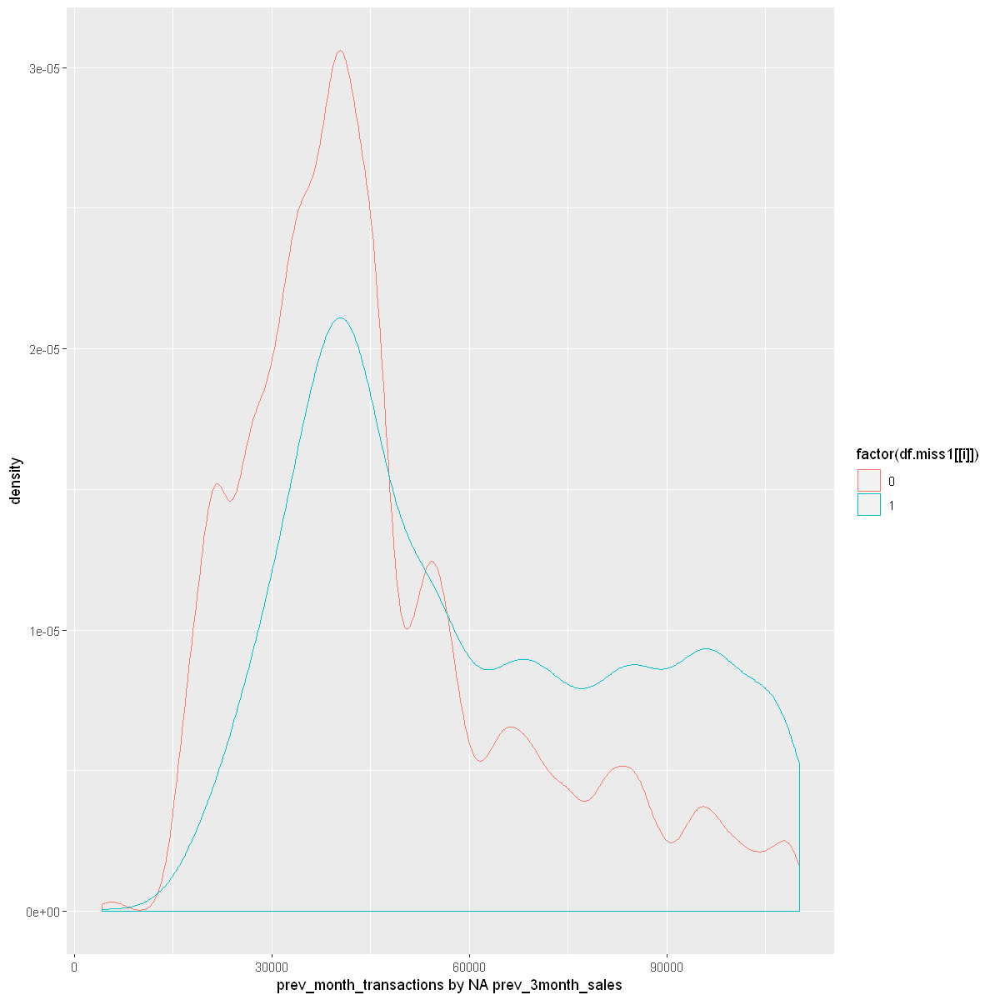


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -218.71, df = 168327, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -15010.51 -14743.87
sample estimates:
mean of x mean of y 
 46209.82  61087.01 

[1] "prev_3month_transactions by NA prev_3month_sales"


Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


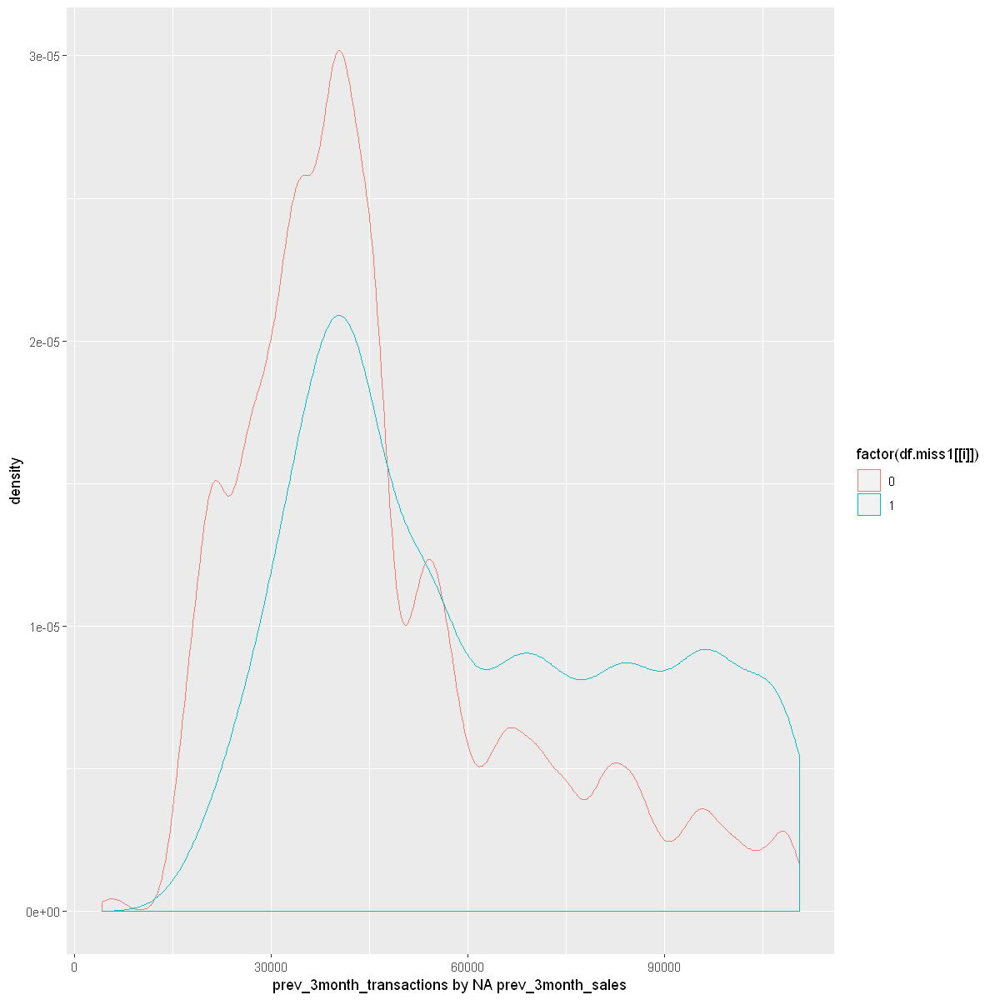


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -205.54, df = 163323, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -13805.04 -13544.24
sample estimates:
mean of x mean of y 
 45697.13  59371.77 

[1] "avg_prev_3months_transactions by NA prev_3month_sales"


Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


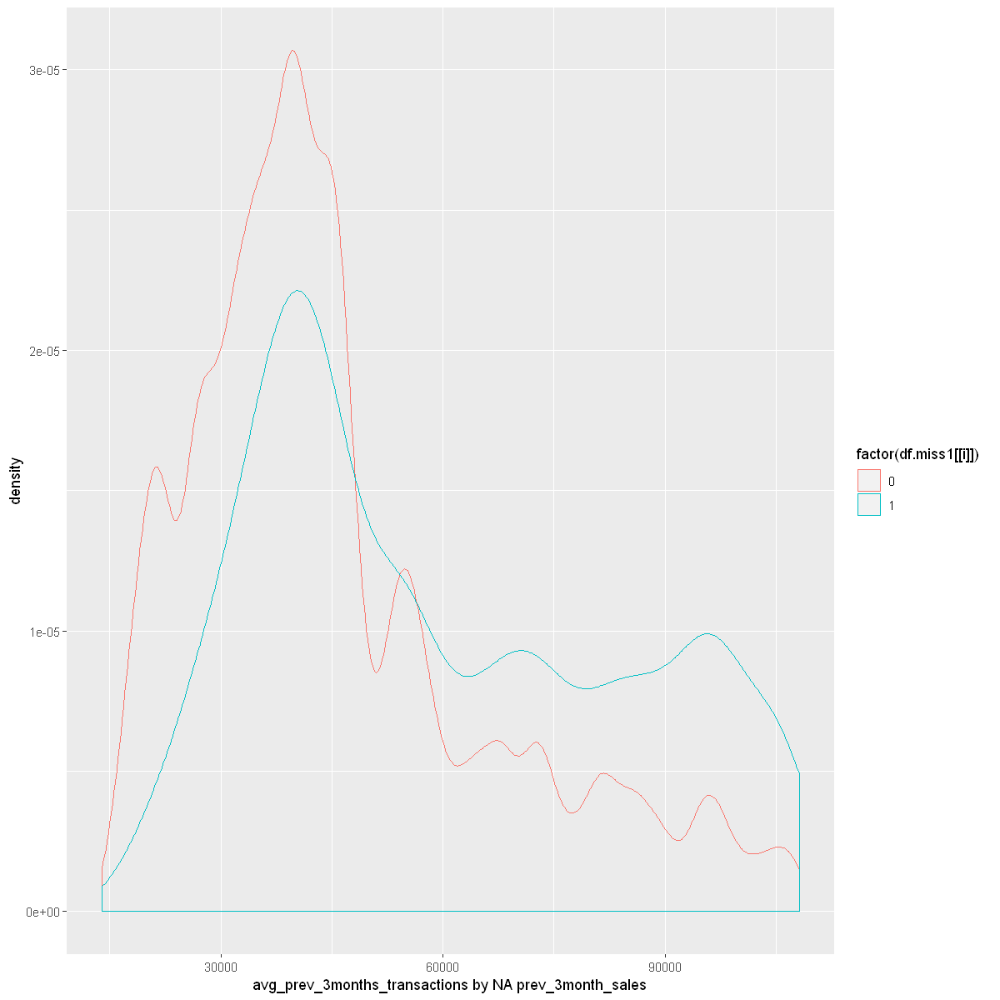


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -194.66, df = 159598, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -12193.83 -11950.73
sample estimates:
mean of x mean of y 
 42650.42  54722.69 

[1] "min_prev_3months_transactions by NA prev_3month_sales"


Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


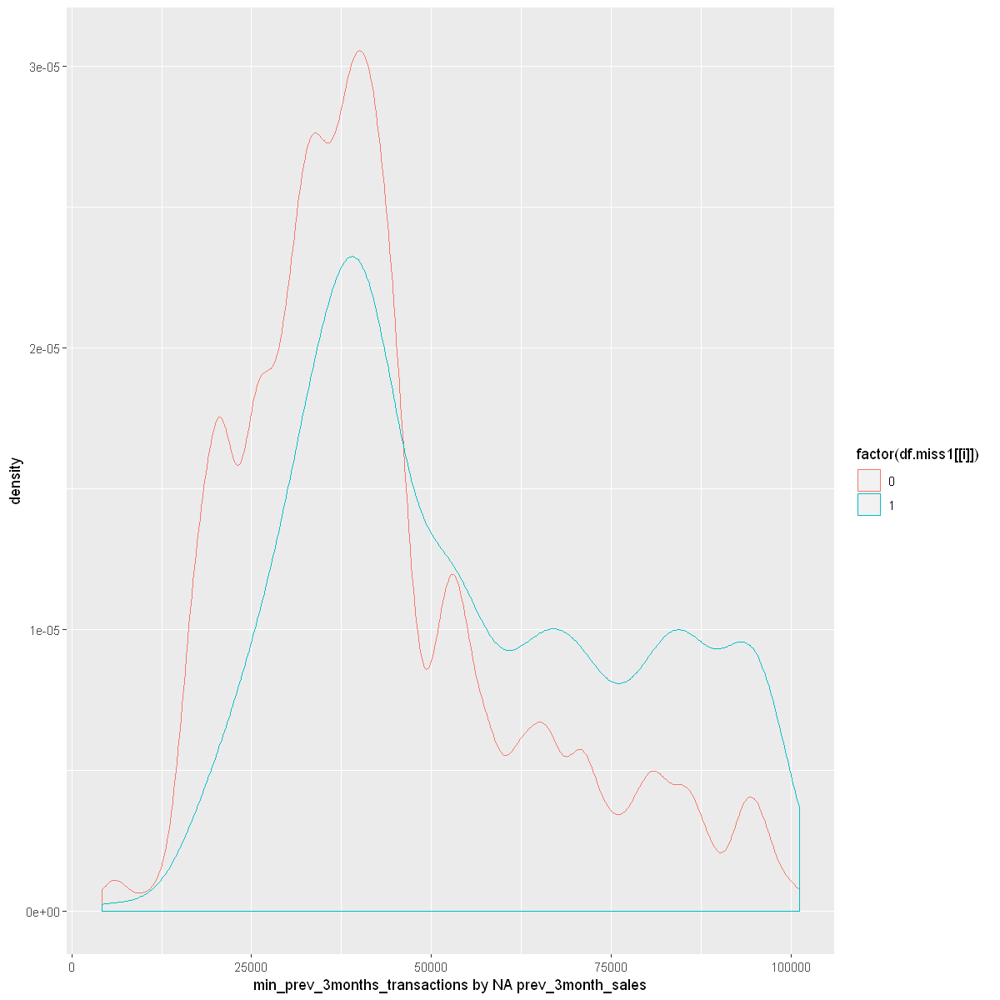


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -208.47, df = 164842, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14977.33 -14698.34
sample estimates:
mean of x mean of y 
 48574.50  63412.34 

[1] "max_prev_3months_transactions by NA prev_3month_sales"


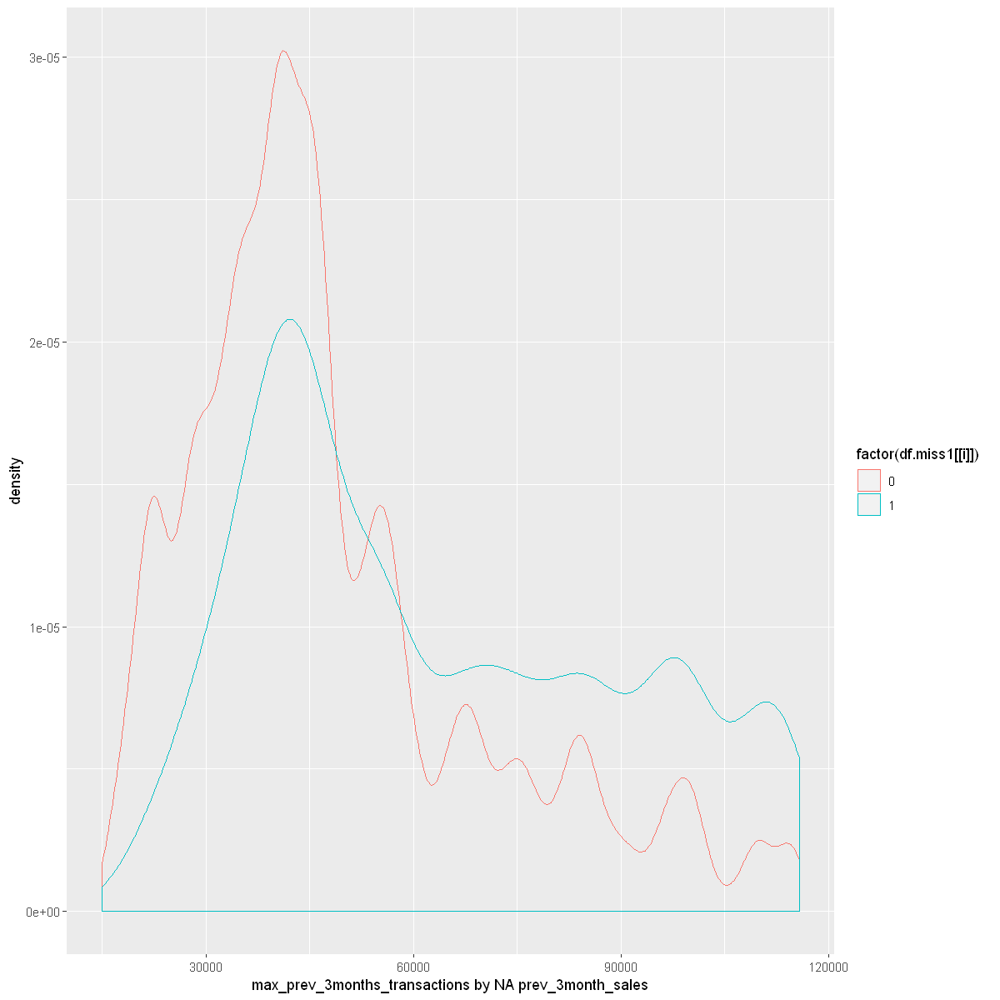


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -409.82, df = 182146, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -858.4366 -850.2646
sample estimates:
mean of x mean of y 
 147.1118 1001.4625 

[1] "total_unit_sales by NA prev_3month_sales"


Warning message:
"Removed 182194 rows containing non-finite values (stat_density)."


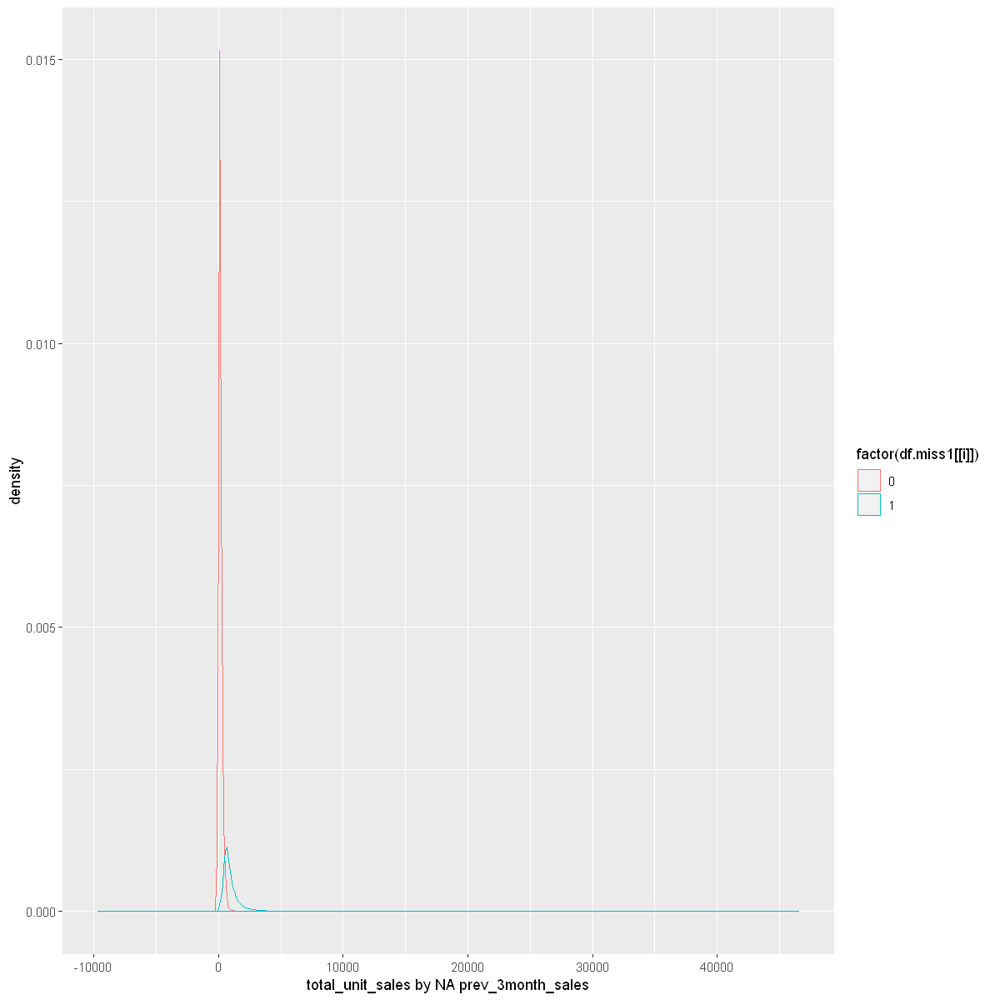


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -397.83, df = 17443, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -306.7053 -303.6978
sample estimates:
mean of x mean of y 
 138.5928  443.7944 

[1] "prev_month_sales by NA avg_prev_3months_sales"


Warning message:
"Removed 180962 rows containing non-finite values (stat_density)."


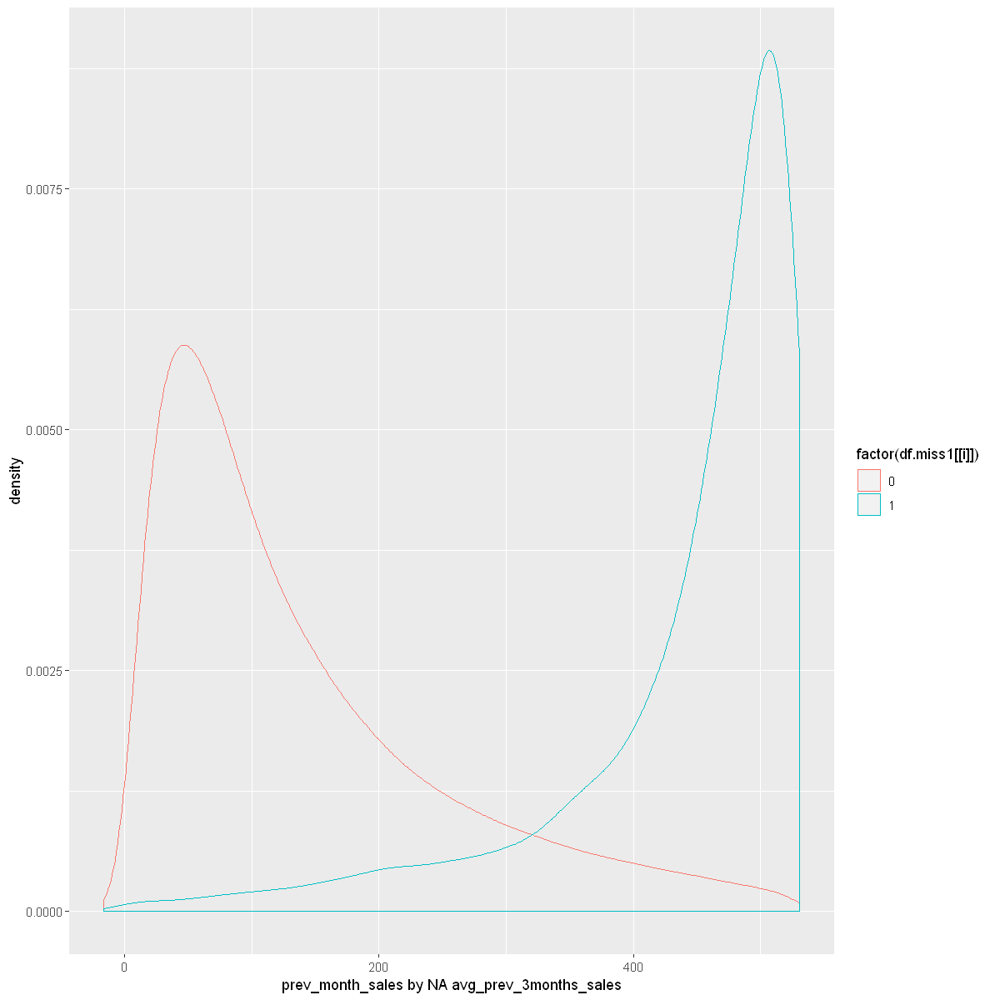


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -401.34, df = 31637, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -271.8761 -269.2335
sample estimates:
mean of x mean of y 
 137.4532  408.0081 

[1] "prev_3month_sales by NA avg_prev_3months_sales"


Warning message:
"Removed 183073 rows containing non-finite values (stat_density)."


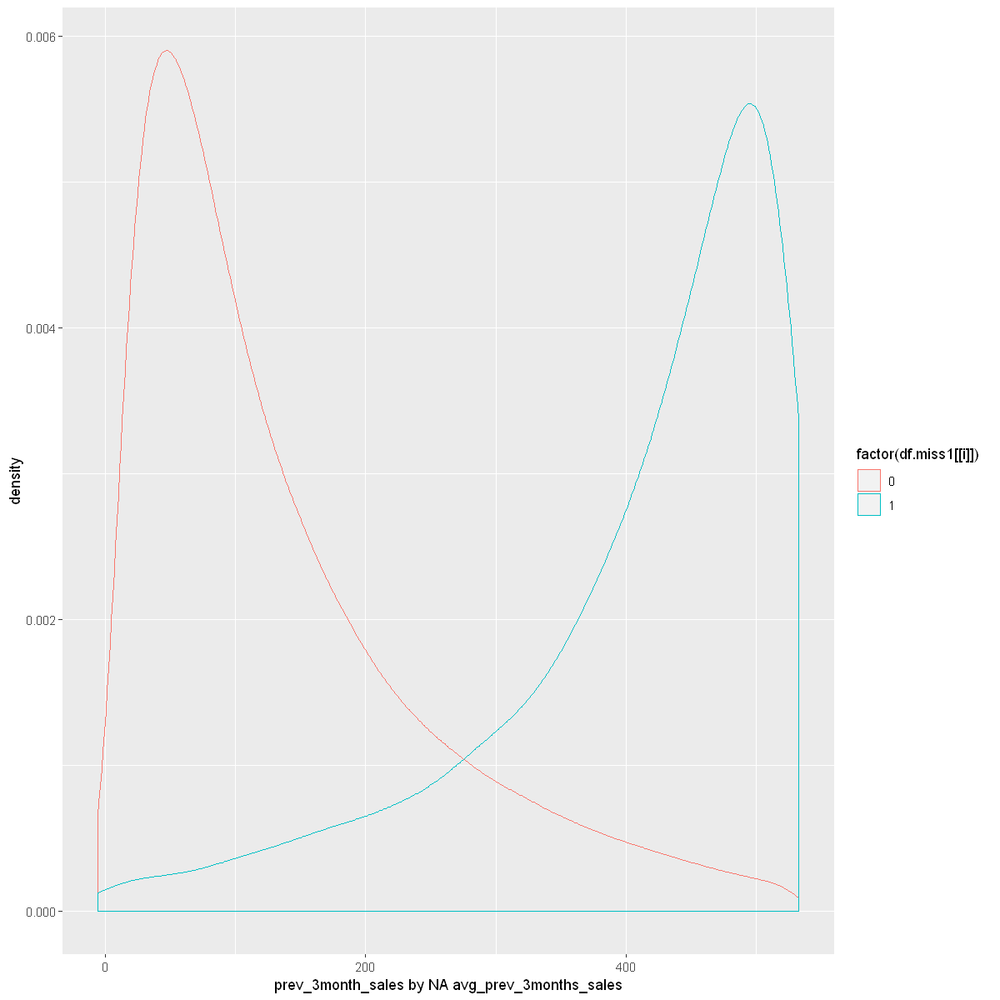


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -261.53, df = 17078, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -212.7679 -209.6024
sample estimates:
mean of x mean of y 
 111.4600  322.6452 

[1] "min_prev_3months_sales by NA avg_prev_3months_sales"


Warning message:
"Removed 182080 rows containing non-finite values (stat_density)."


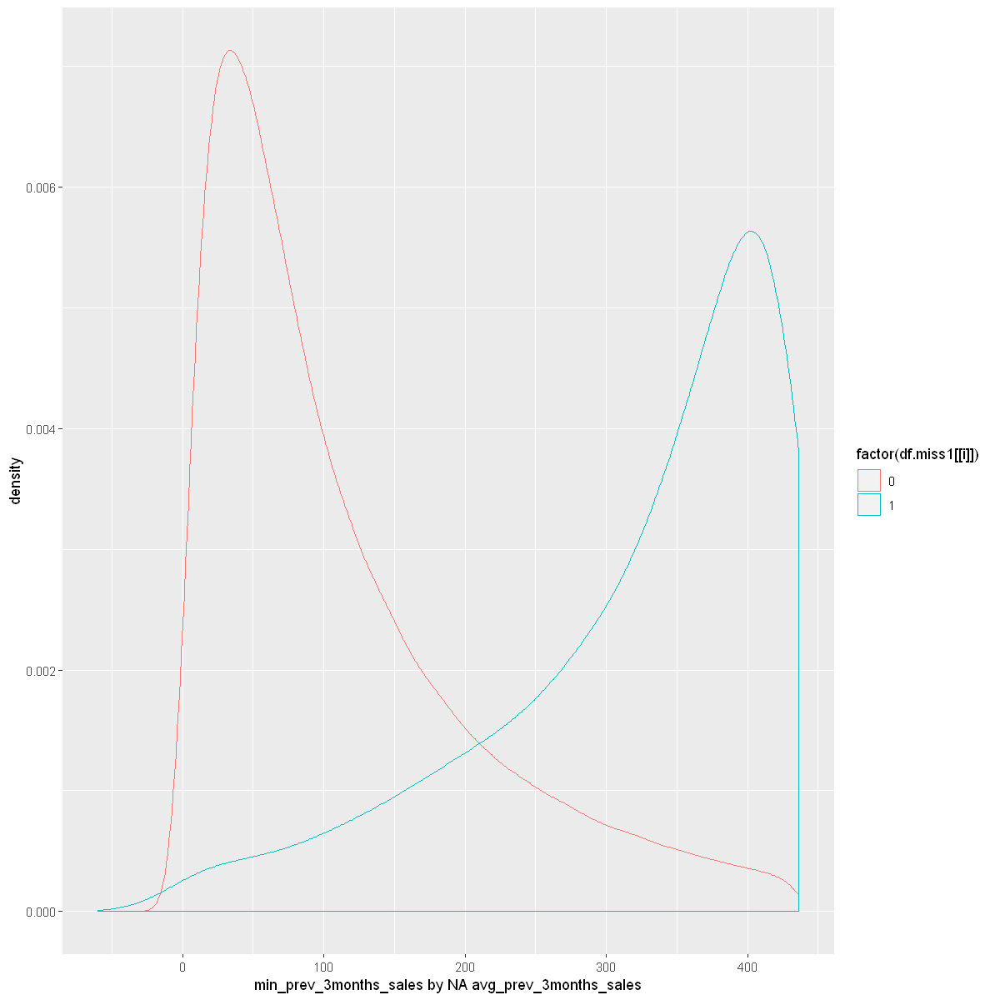


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2105.4, df = 26289, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -426.6711 -425.8774
sample estimates:
mean of x mean of y 
 168.0746  594.3488 

[1] "max_prev_3months_sales by NA avg_prev_3months_sales"


Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


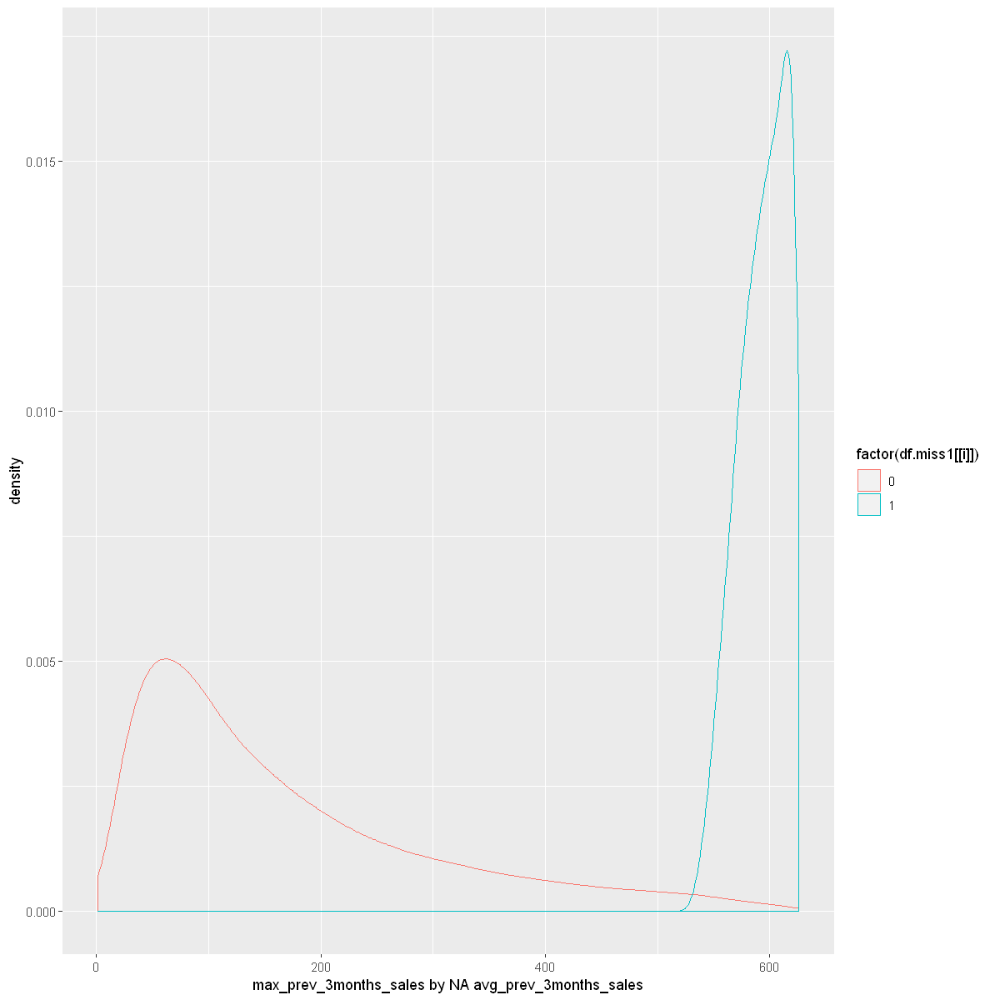


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -210.26, df = 165451, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14229.56 -13966.72
sample estimates:
mean of x mean of y 
 45458.02  59556.16 

[1] "total_month_transactions by NA avg_prev_3months_sales"


Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


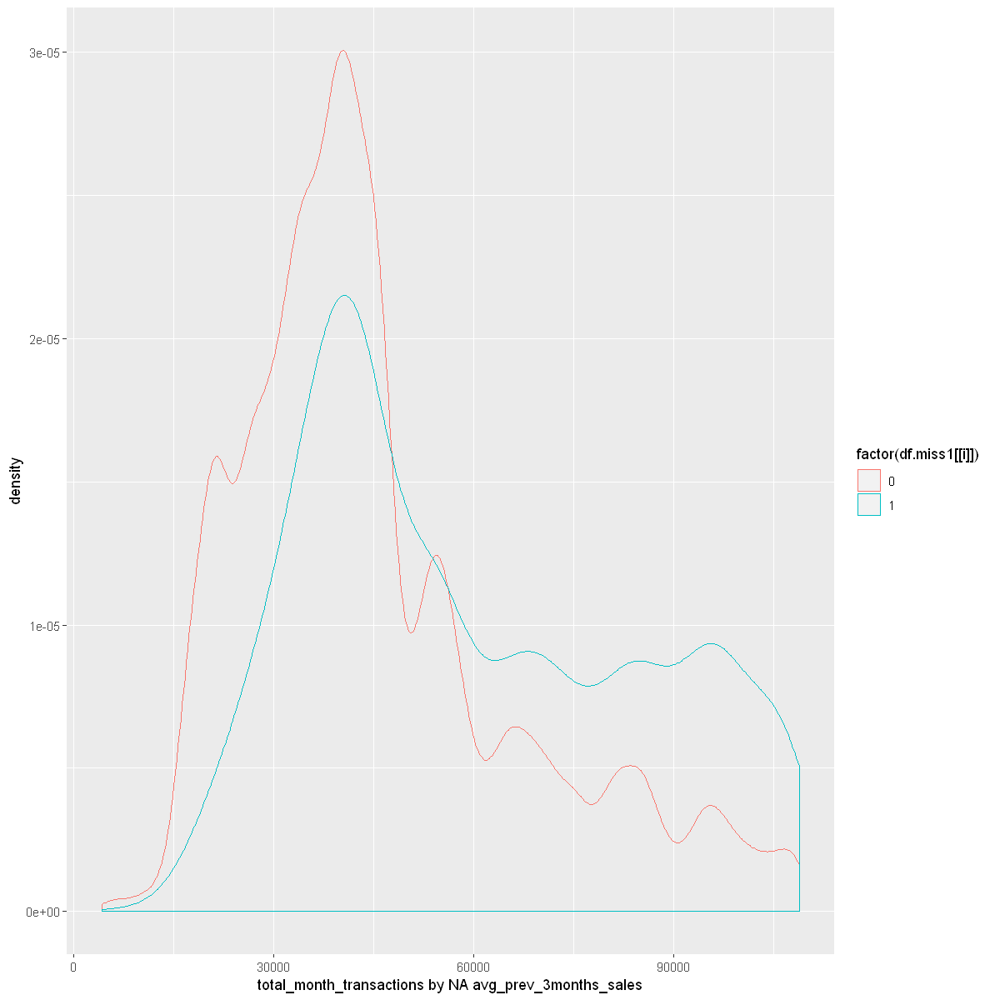


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -214.45, df = 167442, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14660.23 -14394.68
sample estimates:
mean of x mean of y 
 46157.31  60684.76 

[1] "prev_month_transactions by NA avg_prev_3months_sales"


Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


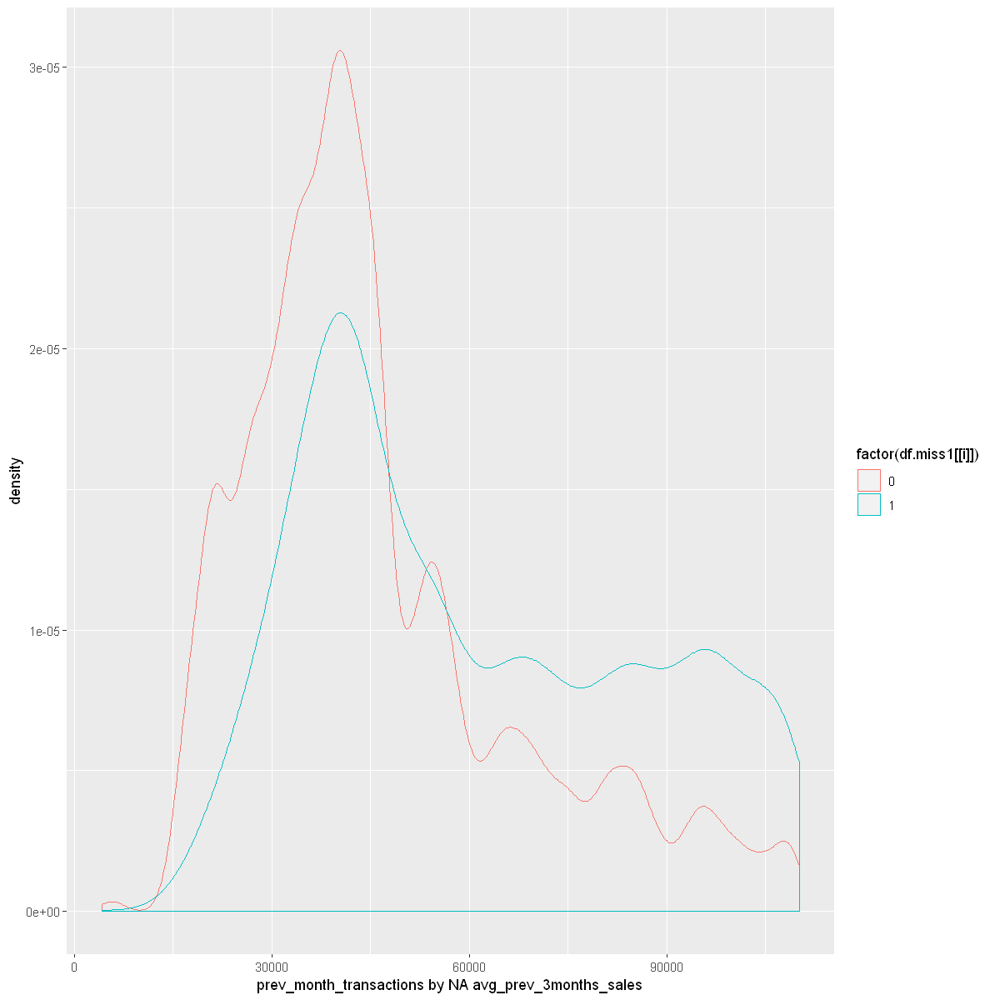


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -215.83, df = 169889, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14886.47 -14618.53
sample estimates:
mean of x mean of y 
 46207.18  60959.68 

[1] "prev_3month_transactions by NA avg_prev_3months_sales"


Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


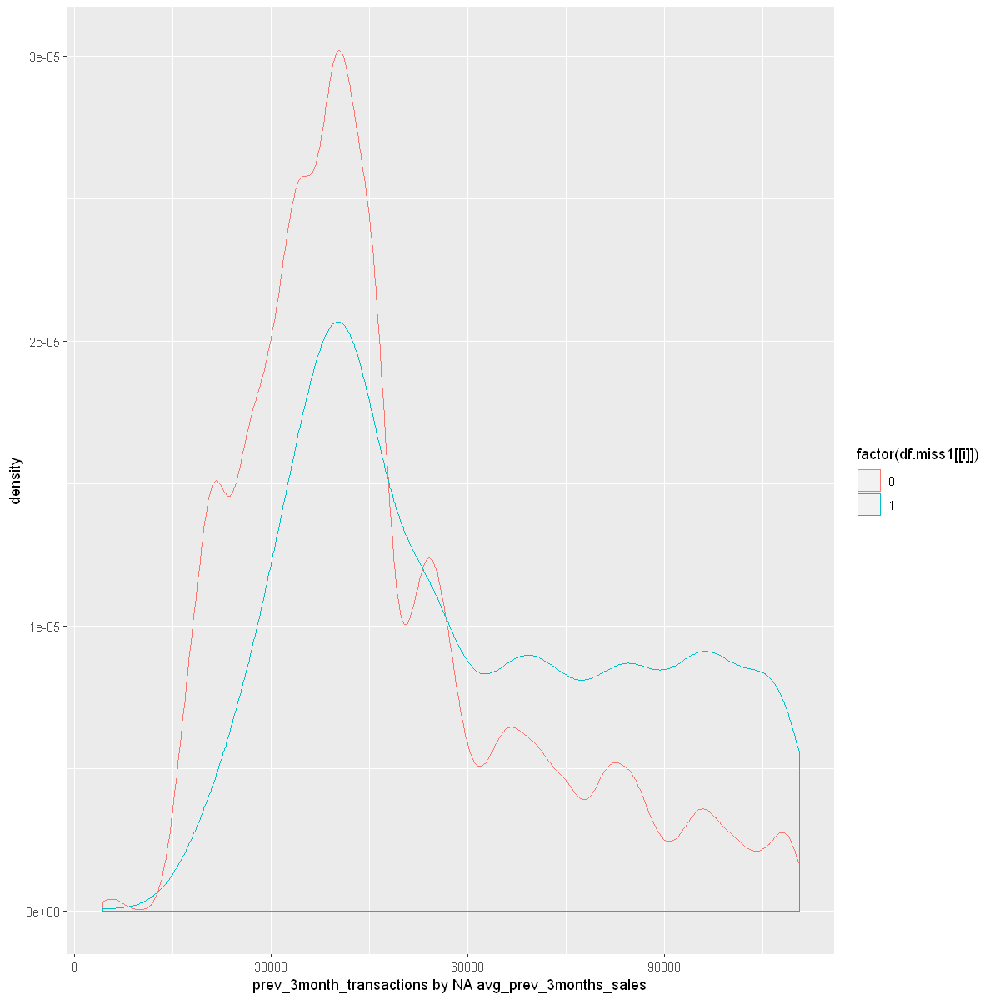


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -208.06, df = 163360, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -13933.16 -13673.11
sample estimates:
mean of x mean of y 
 45687.50  59490.63 

[1] "avg_prev_3months_transactions by NA avg_prev_3months_sales"


Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


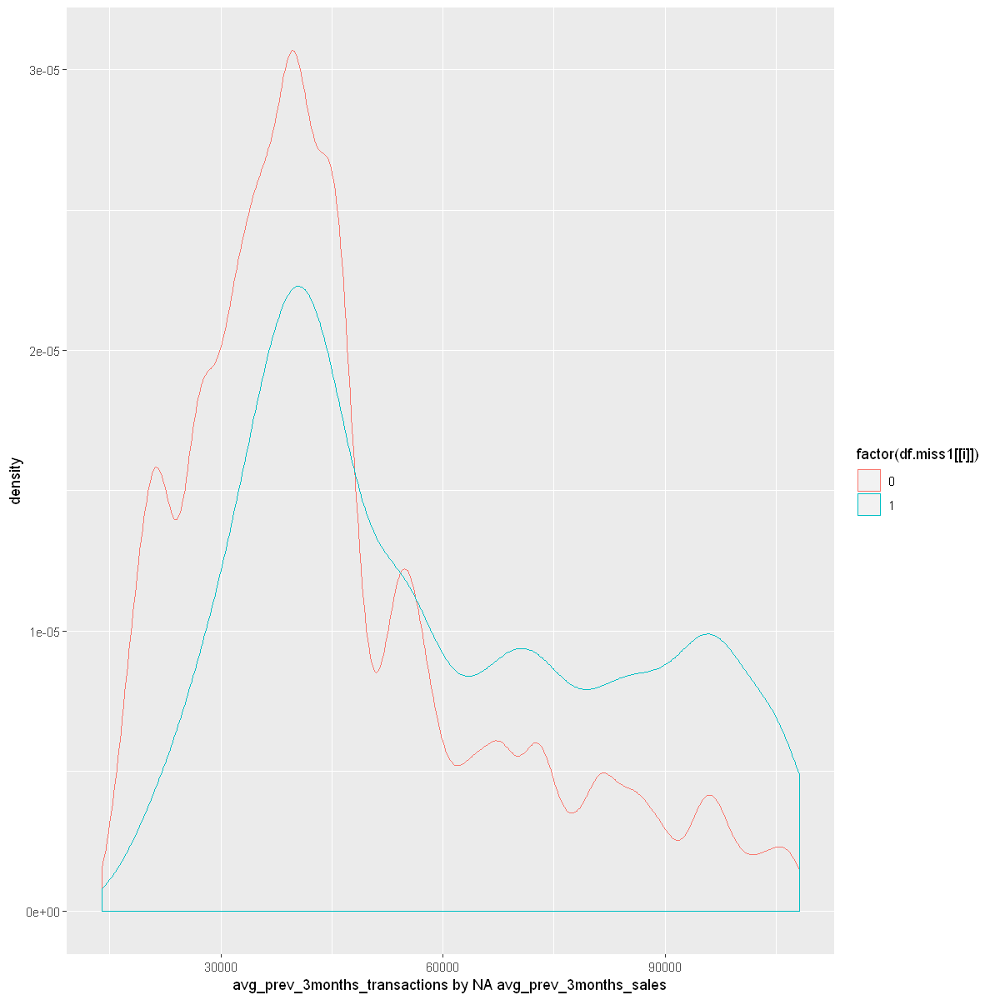


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -200.28, df = 159825, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -12476.57 -12234.74
sample estimates:
mean of x mean of y 
 42628.32  54983.98 

[1] "min_prev_3months_transactions by NA avg_prev_3months_sales"


Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


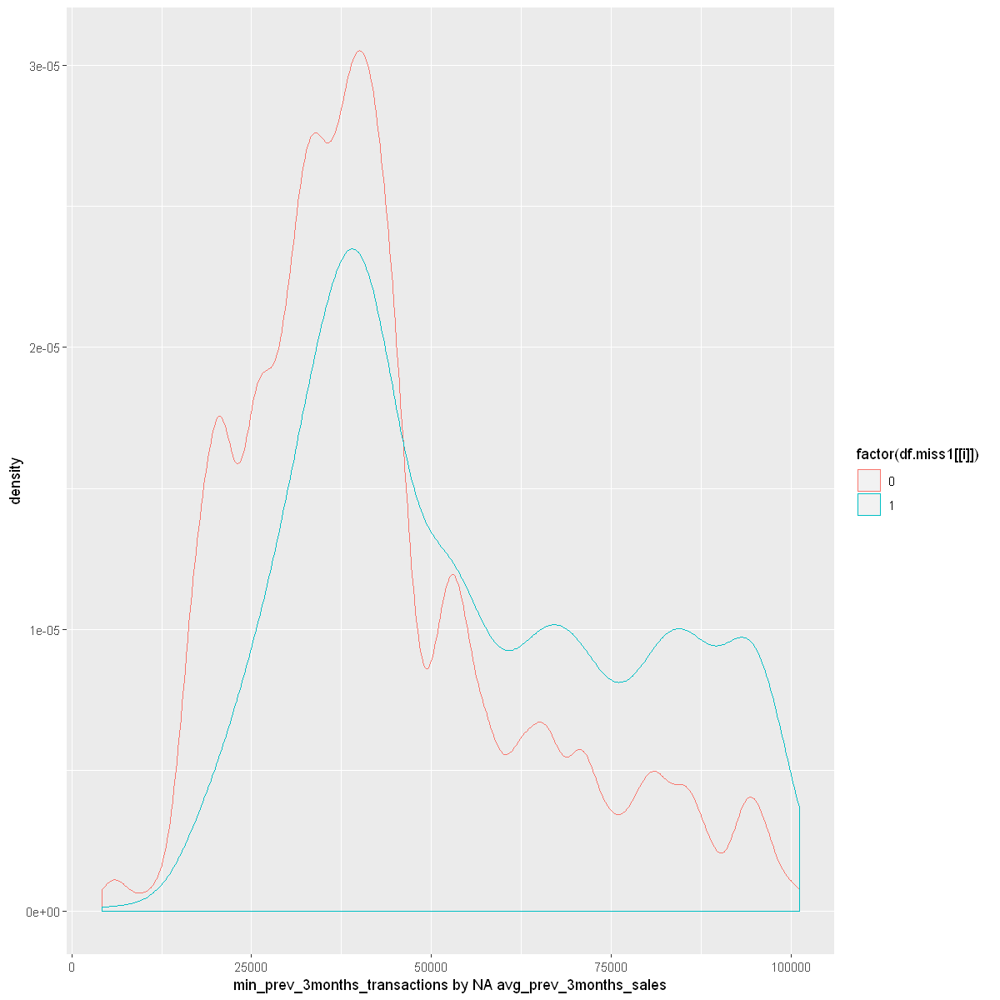


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -209.46, df = 164564, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -15006.70 -14728.45
sample estimates:
mean of x mean of y 
 48574.99  63442.56 

[1] "max_prev_3months_transactions by NA avg_prev_3months_sales"


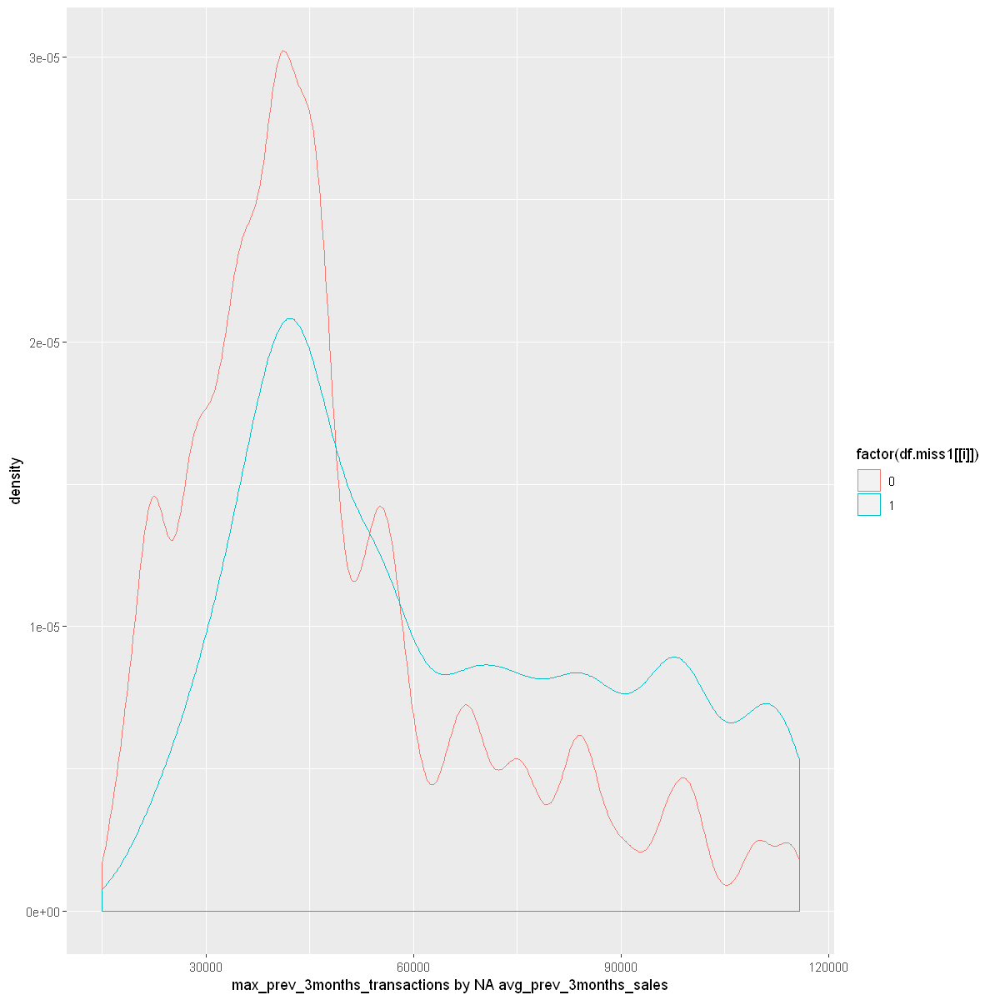


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -437.88, df = 182531, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -915.9602 -907.7970
sample estimates:
mean of x mean of y 
 141.4435 1053.3220 

[1] "total_unit_sales by NA avg_prev_3months_sales"


Warning message:
"Removed 182194 rows containing non-finite values (stat_density)."


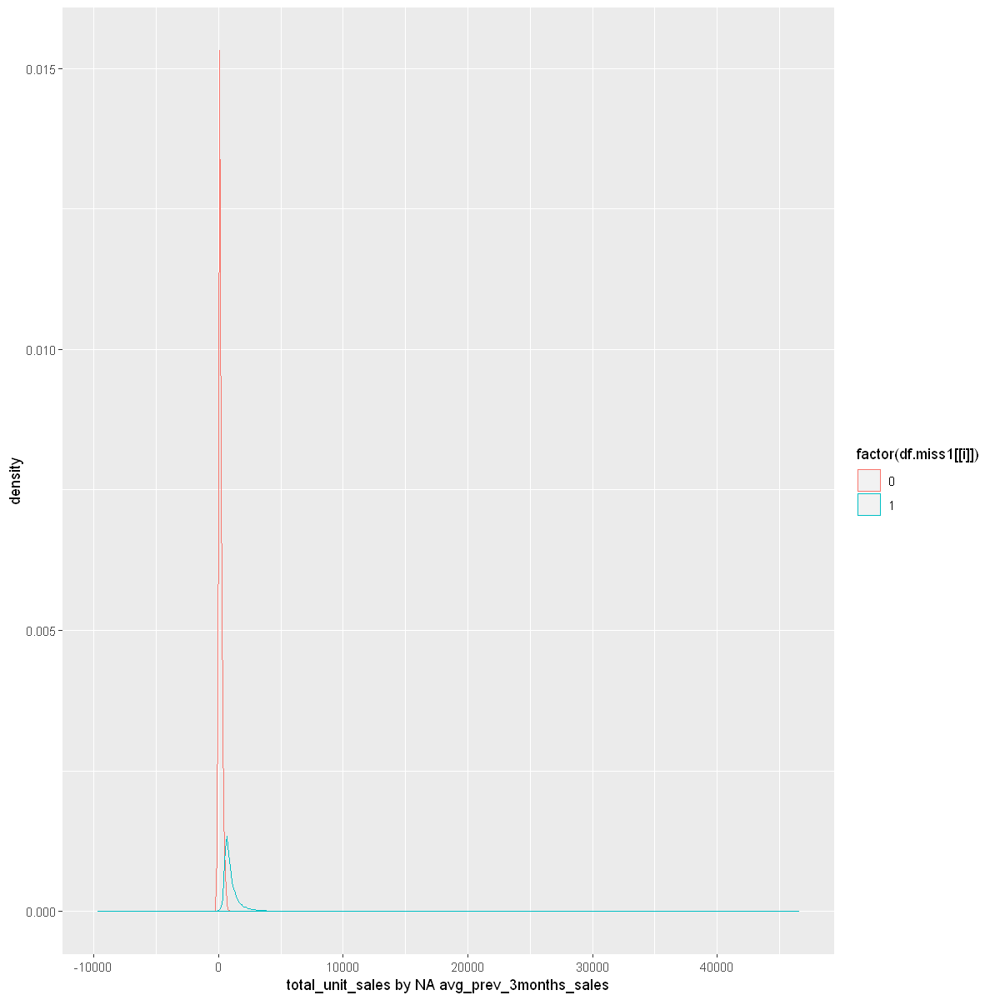


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1878.5, df = 39207, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -351.2086 -350.4765
sample estimates:
mean of x mean of y 
 136.5499  487.3925 

[1] "prev_month_sales by NA min_prev_3months_sales"


Warning message:
"Removed 180962 rows containing non-finite values (stat_density)."


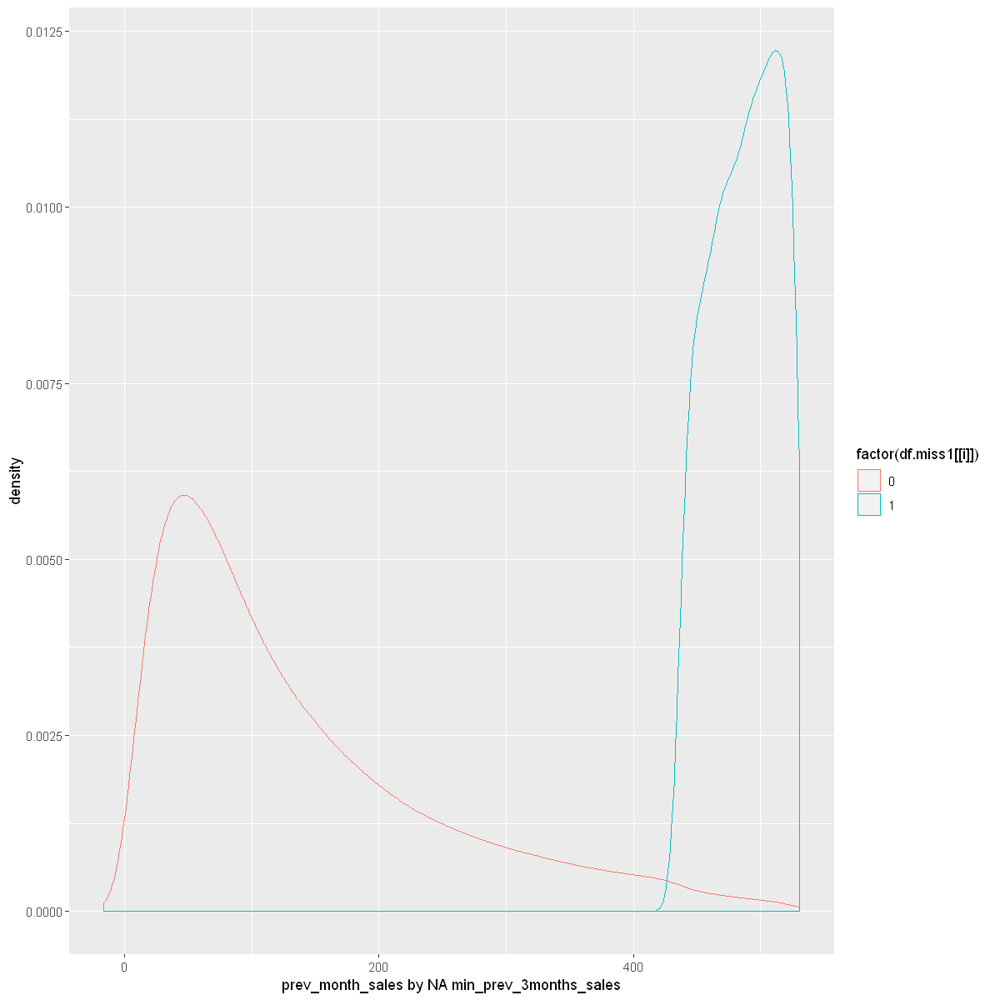


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -620.53, df = 35675, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -305.6277 -303.7030
sample estimates:
mean of x mean of y 
 136.3623  441.0276 

[1] "prev_3month_sales by NA min_prev_3months_sales"


Warning message:
"Removed 181824 rows containing non-finite values (stat_density)."


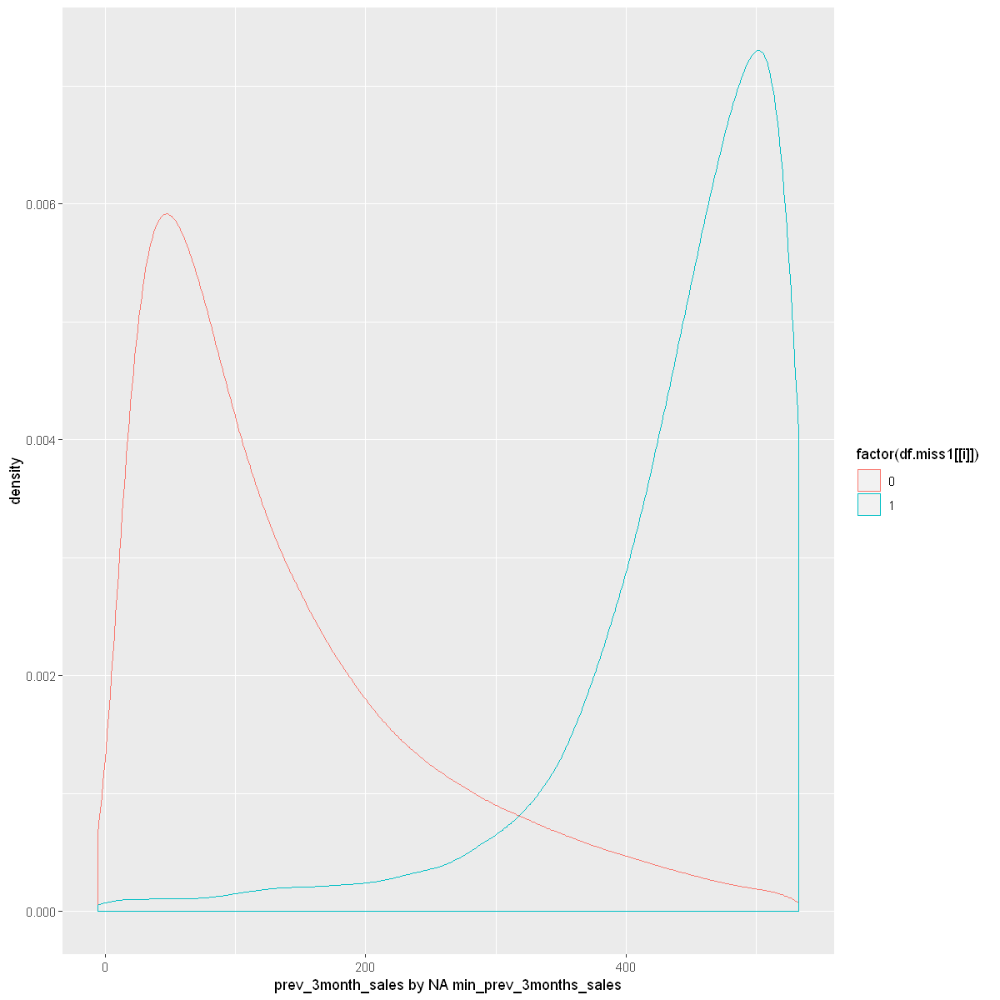


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2091.3, df = 30975, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -357.6377 -356.9680
sample estimates:
mean of x mean of y 
 139.0851  496.3880 

[1] "avg_prev_3months_sales by NA min_prev_3months_sales"


Warning message:
"Removed 182080 rows containing non-finite values (stat_density)."


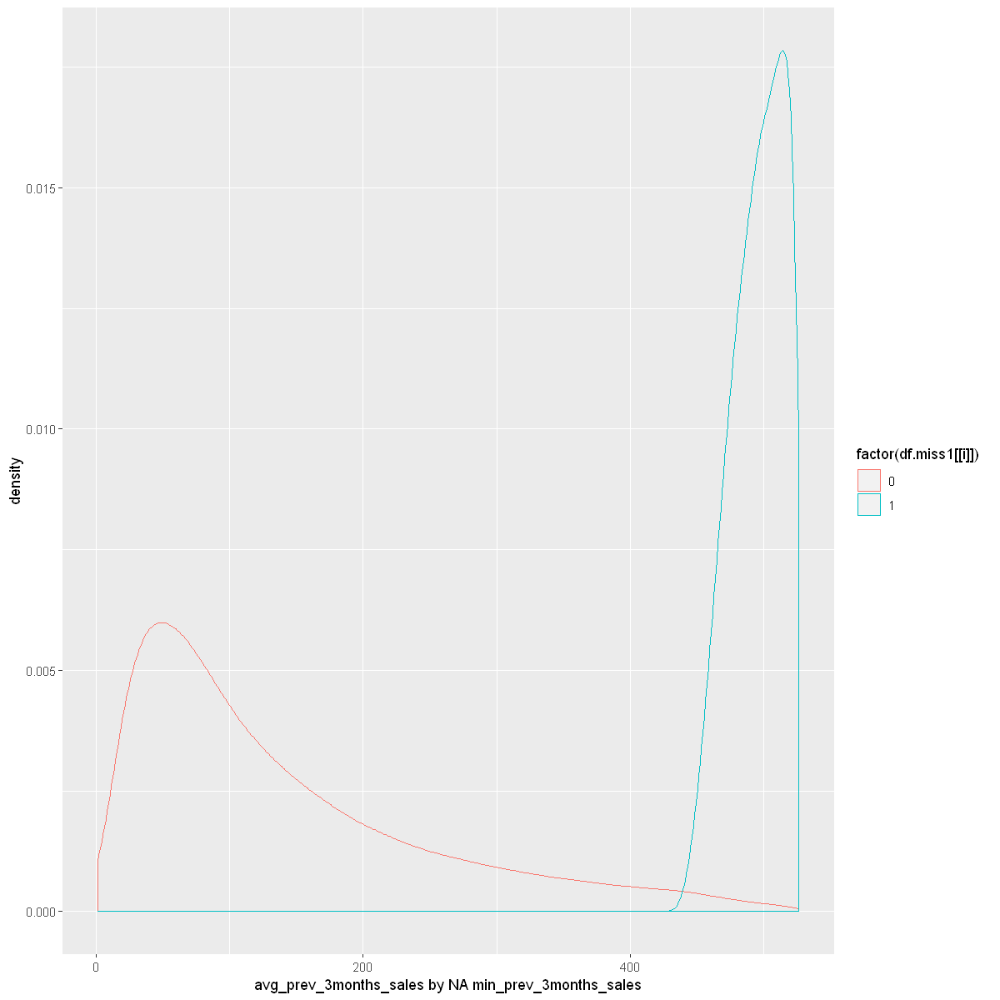


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1548.7, df = 44074, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -396.6365 -395.6338
sample estimates:
mean of x mean of y 
 164.5142  560.6494 

[1] "max_prev_3months_sales by NA min_prev_3months_sales"


Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


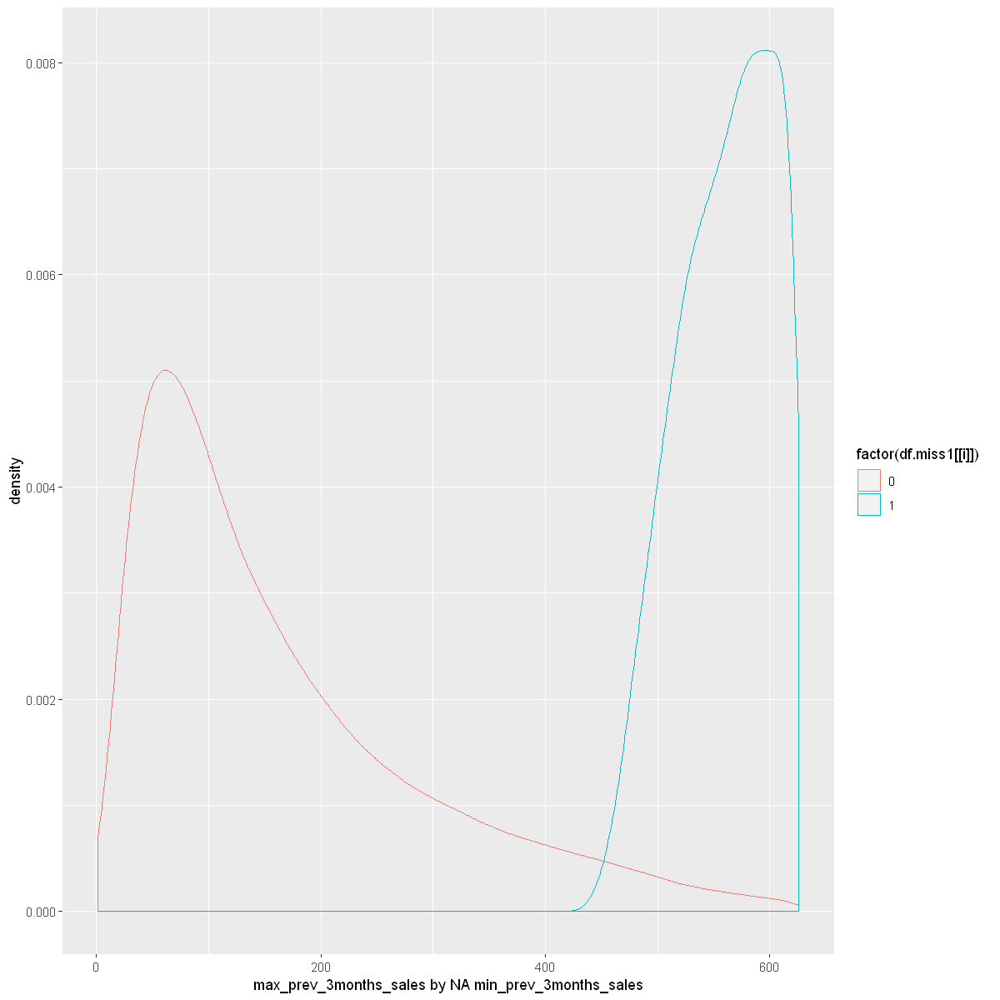


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -224.42, df = 166324, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -15083.34 -14822.16
sample estimates:
mean of x mean of y 
 45385.13  60337.88 

[1] "total_month_transactions by NA min_prev_3months_sales"


Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


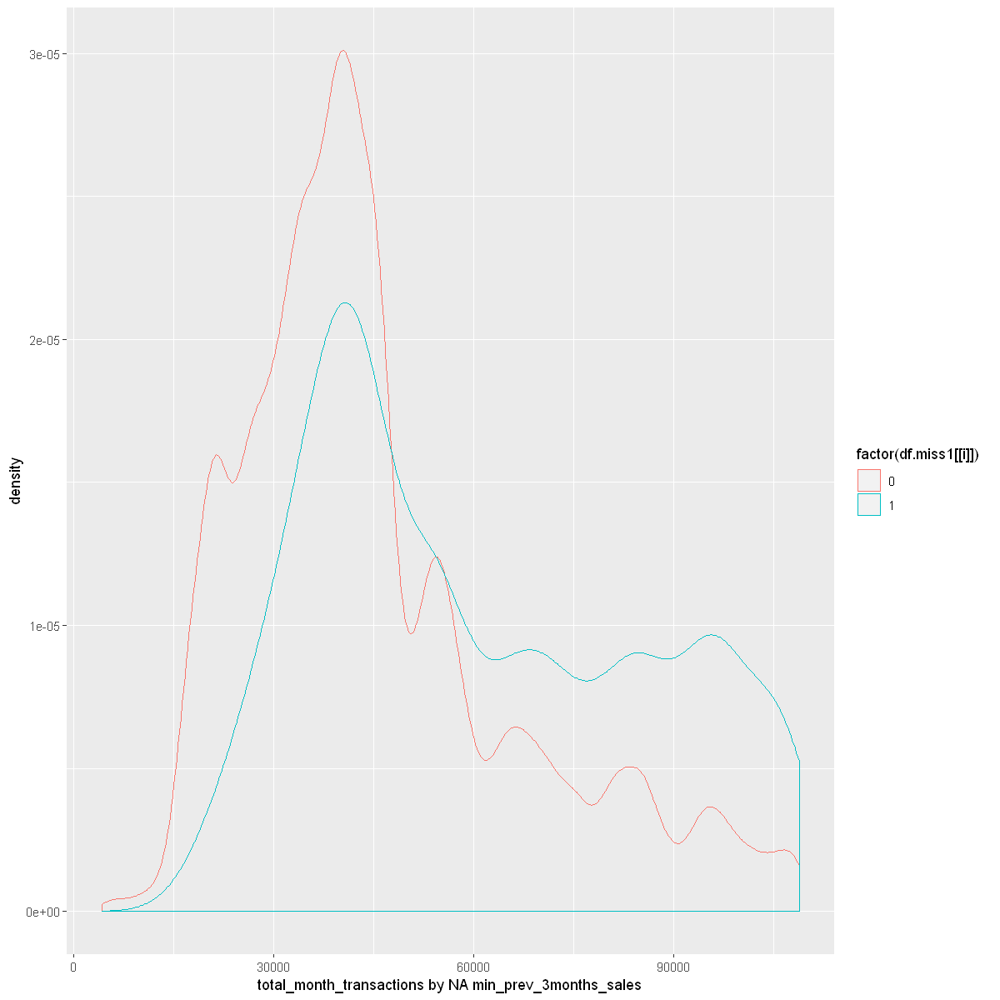


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -225.16, df = 168834, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -15289.12 -15025.24
sample estimates:
mean of x mean of y 
 46098.16  61255.34 

[1] "prev_month_transactions by NA min_prev_3months_sales"


Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


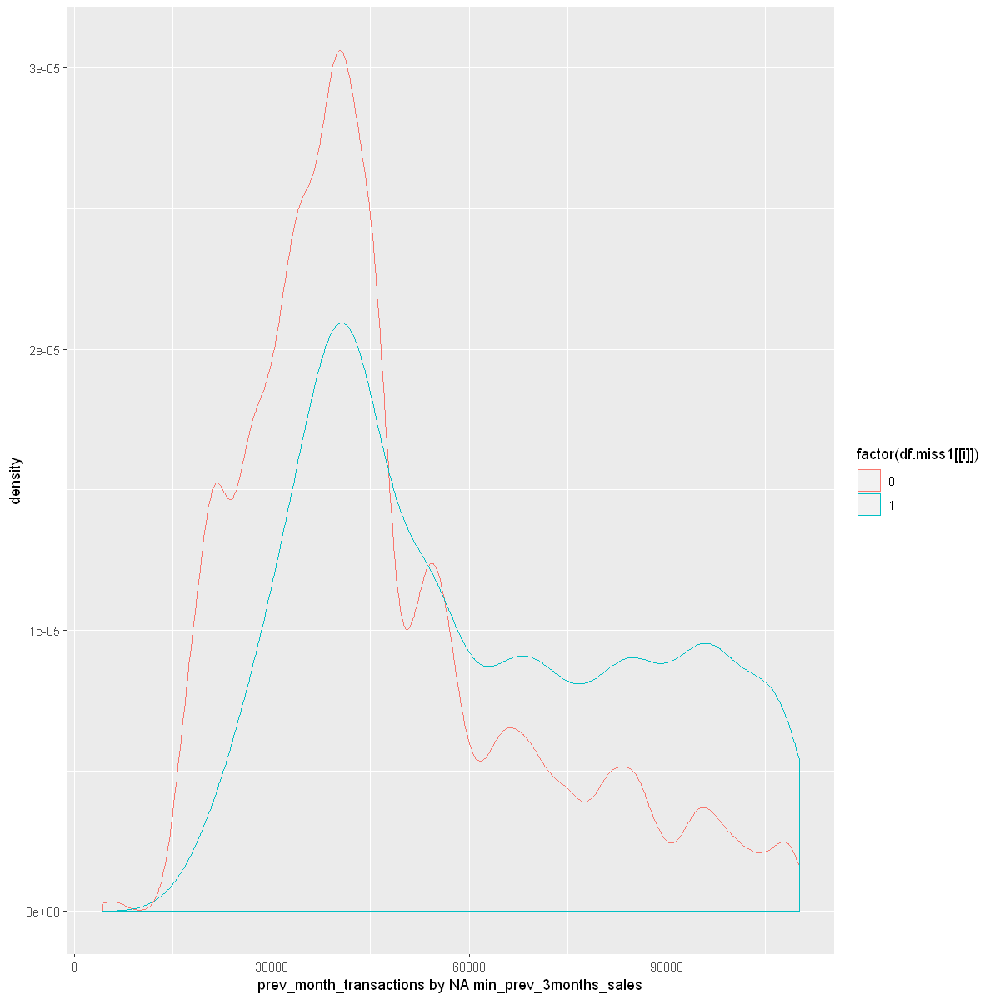


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -226.55, df = 171106, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -15527.78 -15261.42
sample estimates:
mean of x mean of y 
  46147.5   61542.1 

[1] "prev_3month_transactions by NA min_prev_3months_sales"


Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


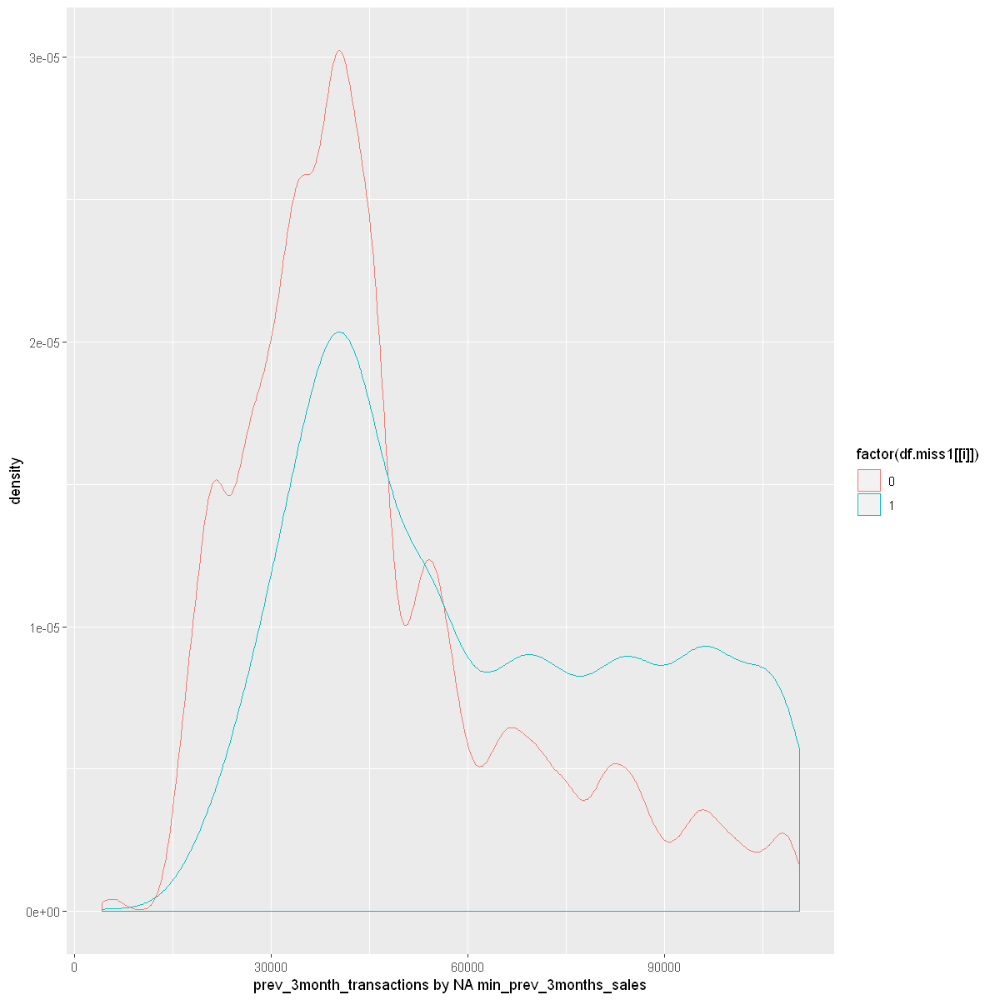


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -218.73, df = 164292, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14561.49 -14302.84
sample estimates:
mean of x mean of y 
 45632.56  60064.73 

[1] "avg_prev_3months_transactions by NA min_prev_3months_sales"


Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


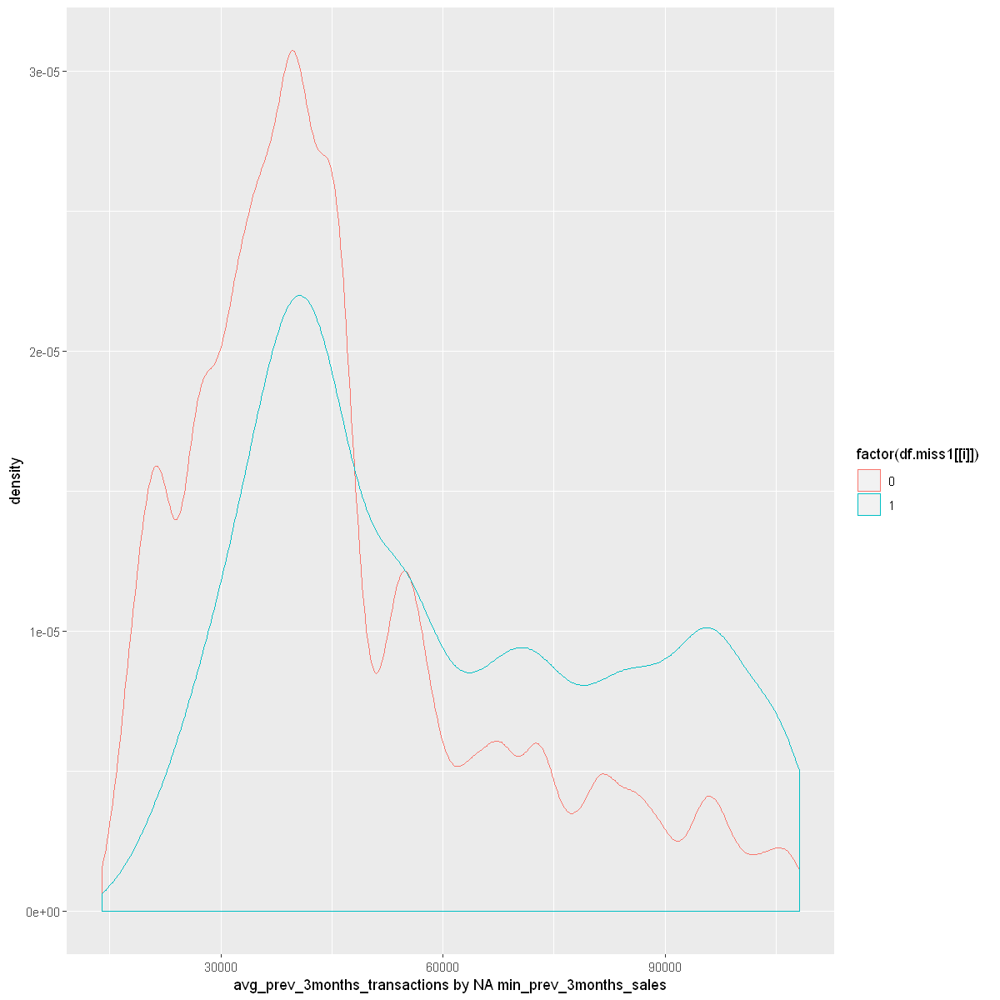


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -215.21, df = 160401, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -13285.37 -13045.56
sample estimates:
mean of x mean of y 
 42563.77  55729.23 

[1] "min_prev_3months_transactions by NA min_prev_3months_sales"


Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


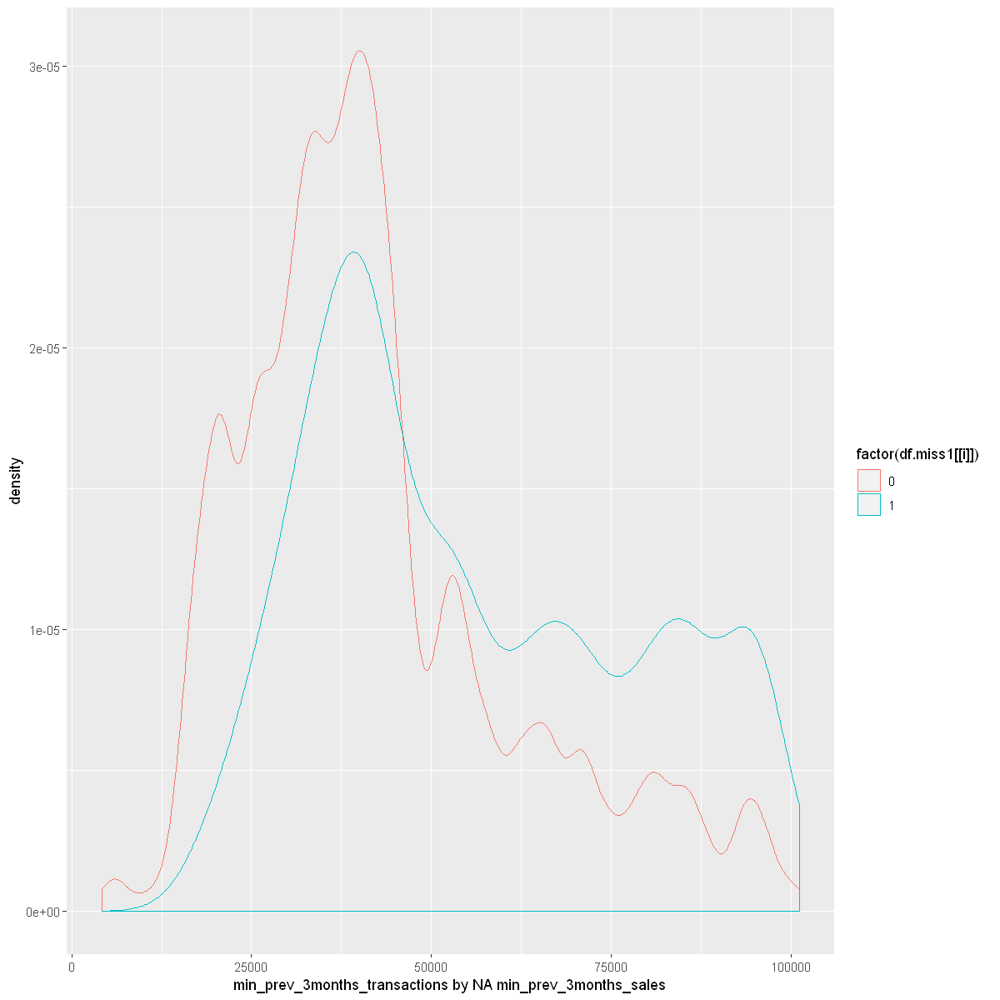


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -219.68, df = 166116, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -15662.82 -15385.80
sample estimates:
mean of x mean of y 
 48512.01  64036.32 

[1] "max_prev_3months_transactions by NA min_prev_3months_sales"


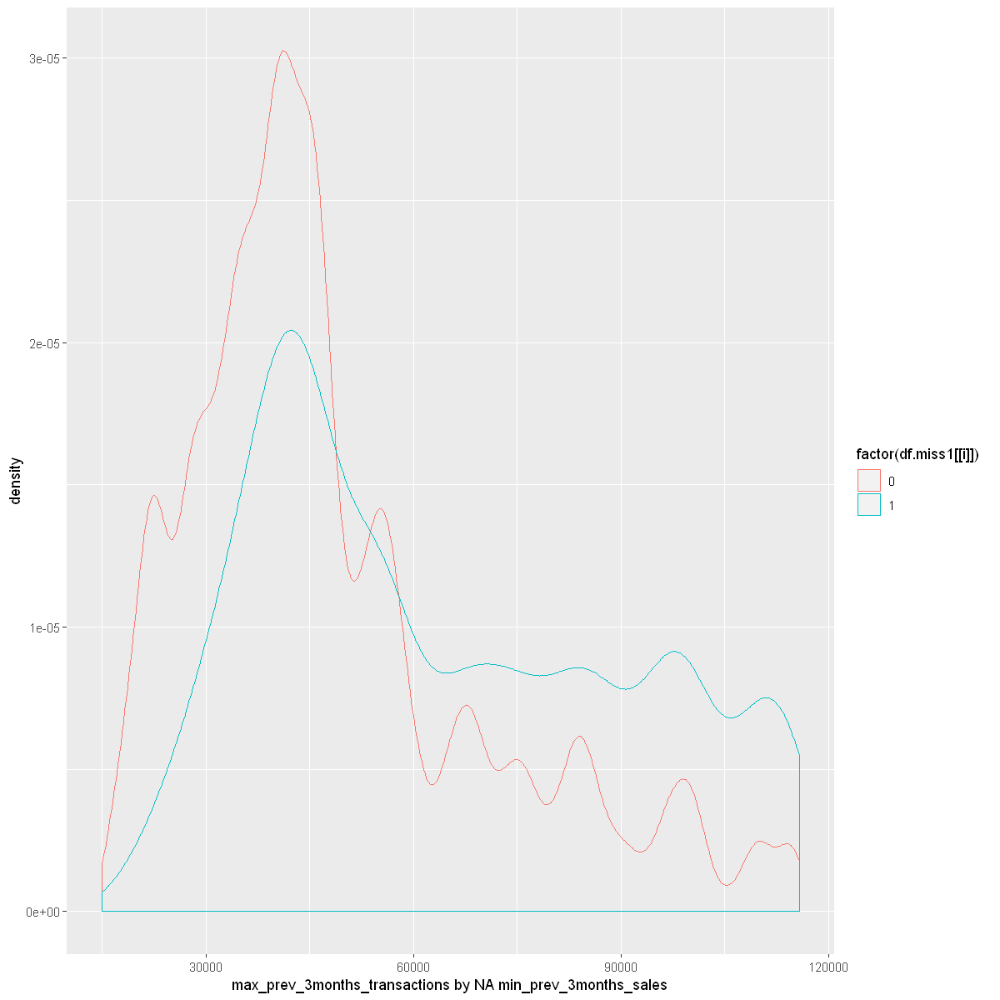


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -441.63, df = 184208, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -893.7794 -885.8813
sample estimates:
mean of x mean of y 
 142.9104 1032.7407 

[1] "total_unit_sales by NA min_prev_3months_sales"


Warning message:
"Removed 182194 rows containing non-finite values (stat_density)."


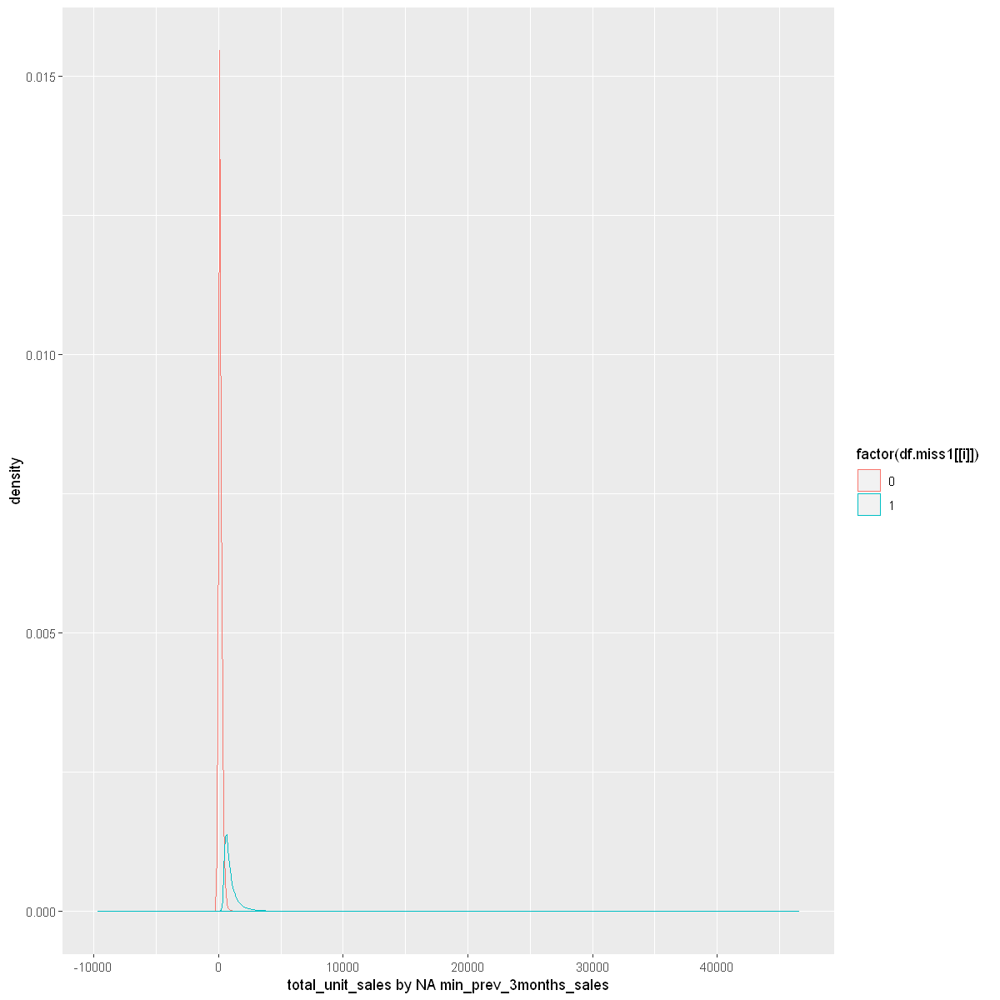


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -276.6, df = 23866, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -237.5855 -234.2420
sample estimates:
mean of x mean of y 
 138.4120  374.3257 

[1] "prev_month_sales by NA max_prev_3months_sales"


Warning message:
"Removed 180962 rows containing non-finite values (stat_density)."


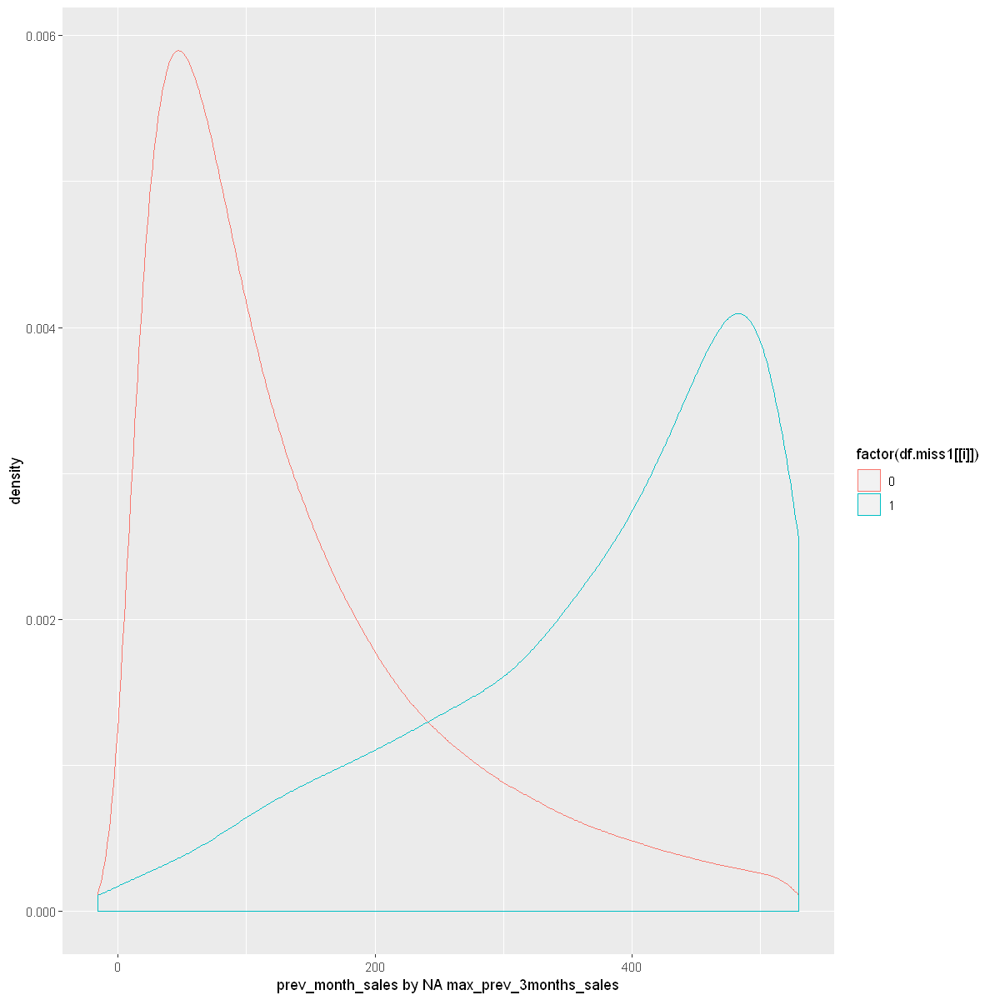


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -313.78, df = 37098, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -225.5627 -222.7623
sample estimates:
mean of x mean of y 
 137.5710  361.7335 

[1] "prev_3month_sales by NA max_prev_3months_sales"


Warning message:
"Removed 181824 rows containing non-finite values (stat_density)."


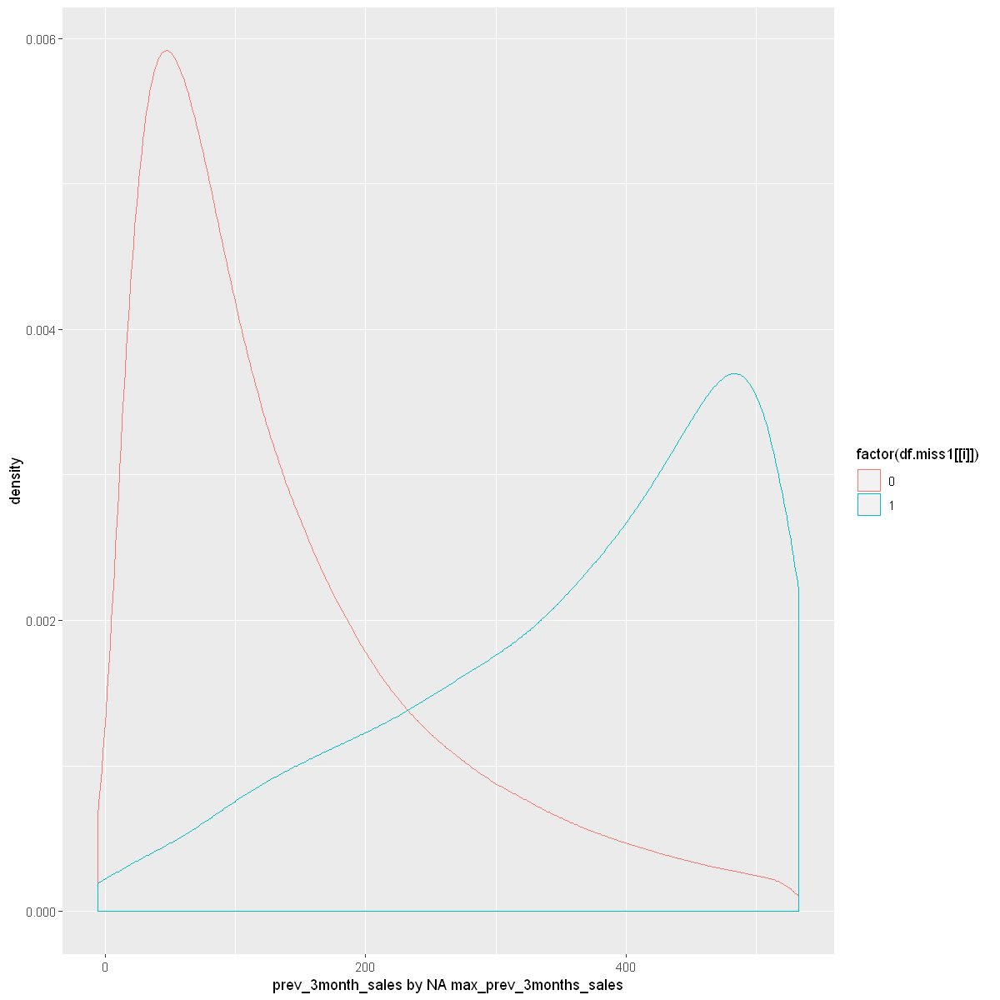


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -596.77, df = 16323, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -310.3069 -308.2752
sample estimates:
mean of x mean of y 
 140.0158  449.3069 

[1] "avg_prev_3months_sales by NA max_prev_3months_sales"


Warning message:
"Removed 183073 rows containing non-finite values (stat_density)."


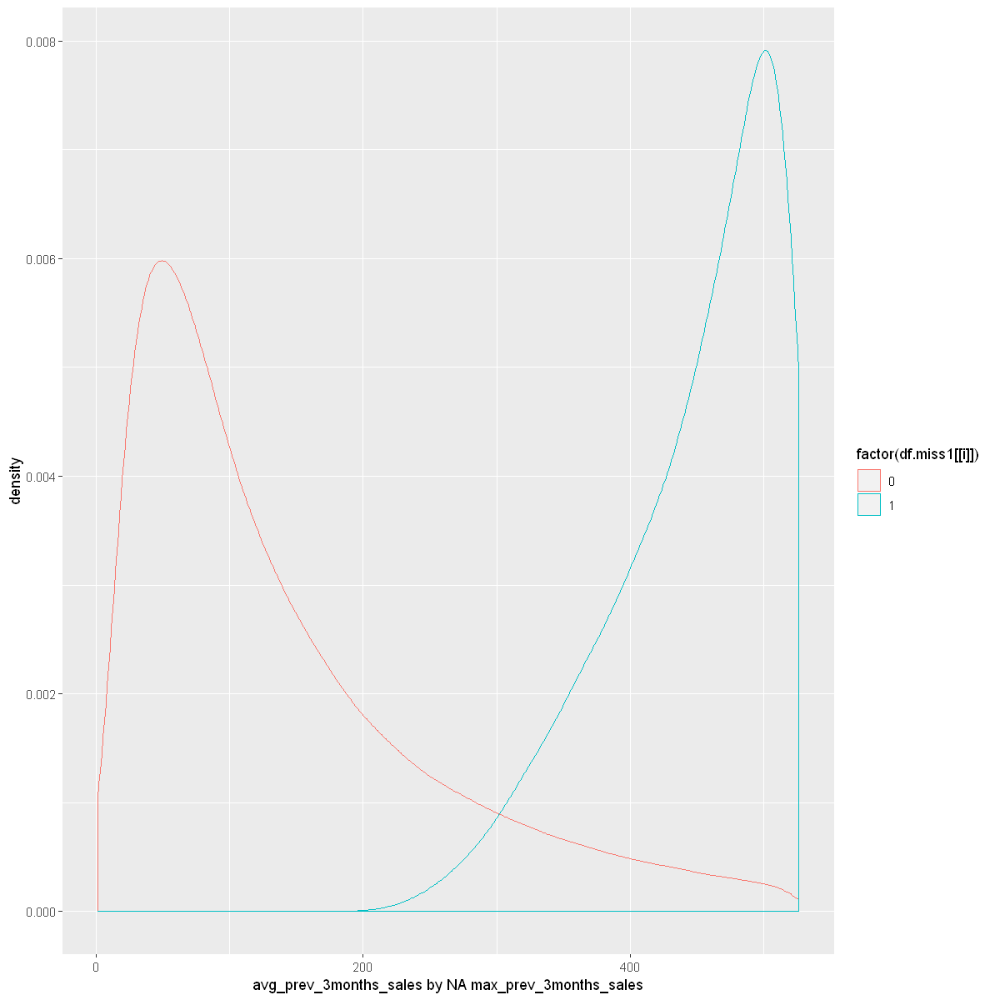


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -261.15, df = 32244, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -172.7645 -170.1905
sample estimates:
mean of x mean of y 
 110.4279  281.9054 

[1] "min_prev_3months_sales by NA max_prev_3months_sales"


Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


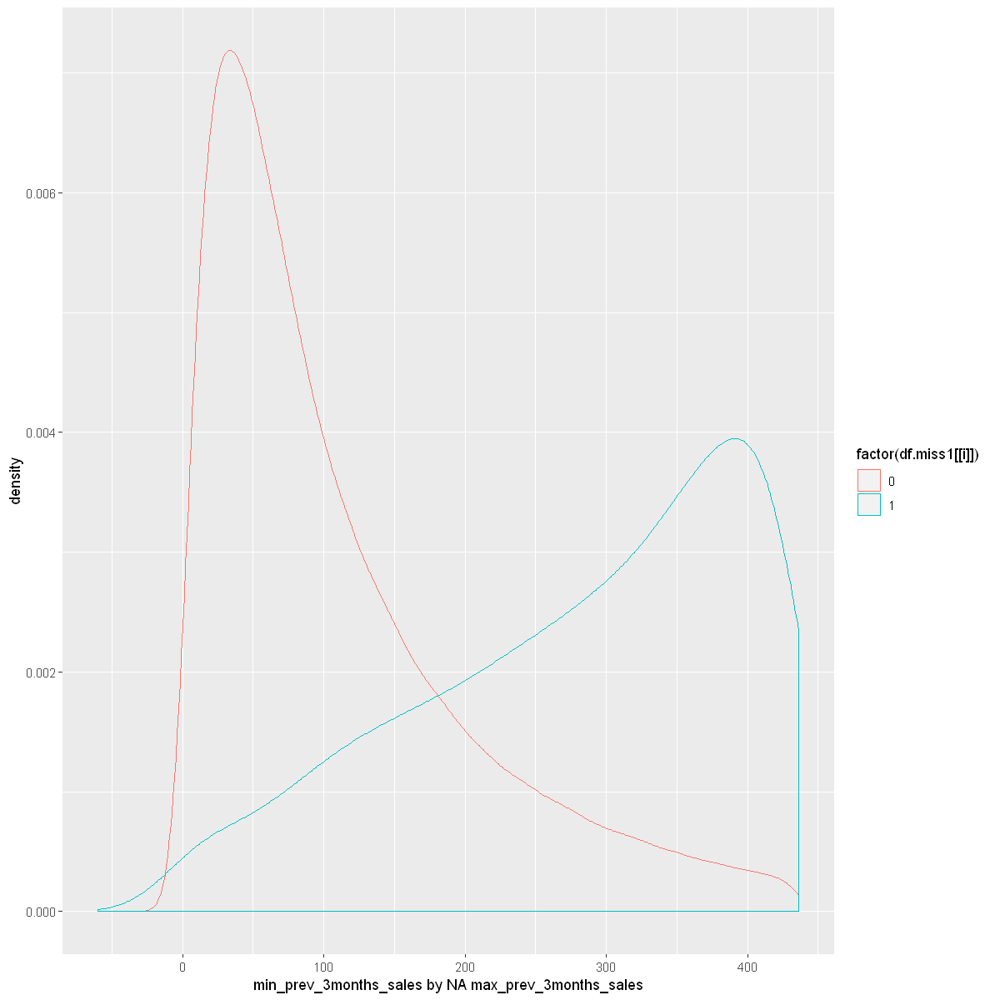


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -199.21, df = 166563, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -13480.03 -13217.37
sample estimates:
mean of x mean of y 
 45511.05  58859.75 

[1] "total_month_transactions by NA max_prev_3months_sales"


Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


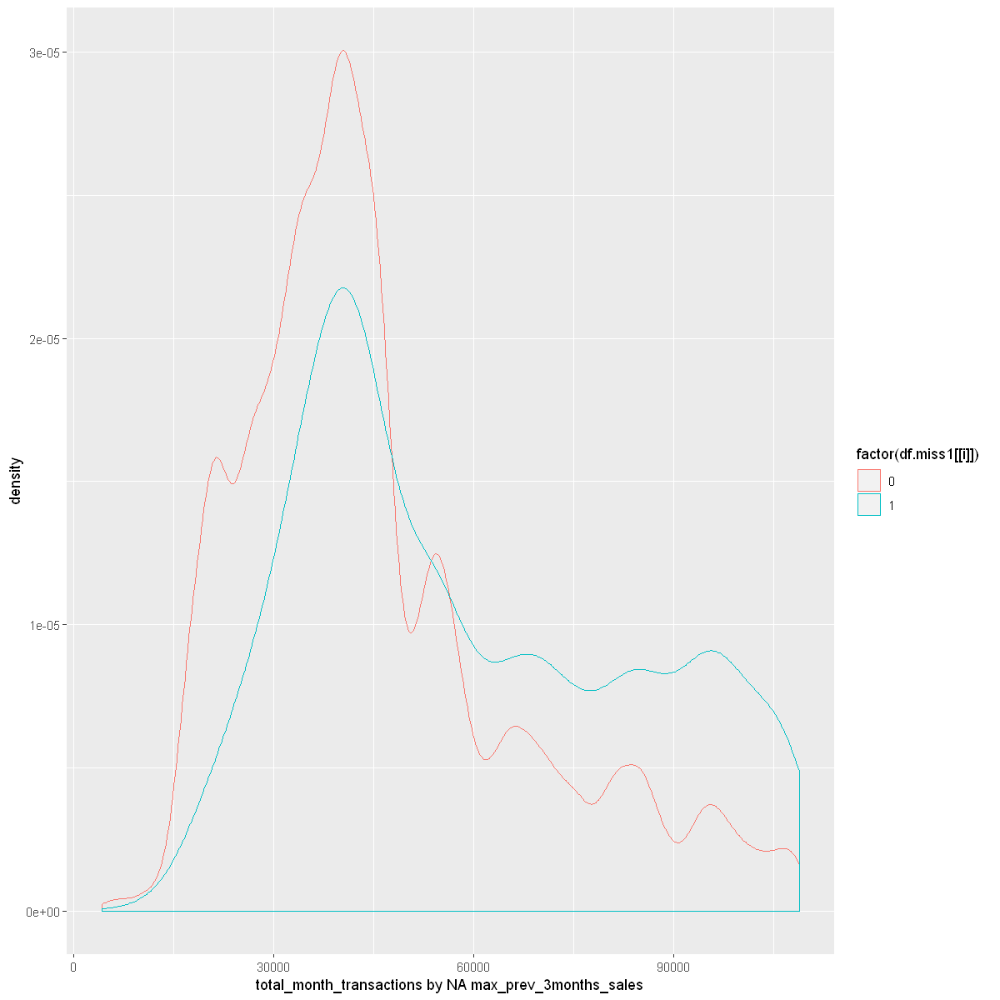


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -204.78, df = 168249, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -13994.42 -13729.07
sample estimates:
mean of x mean of y 
 46205.96  60067.70 

[1] "prev_month_transactions by NA max_prev_3months_sales"


Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


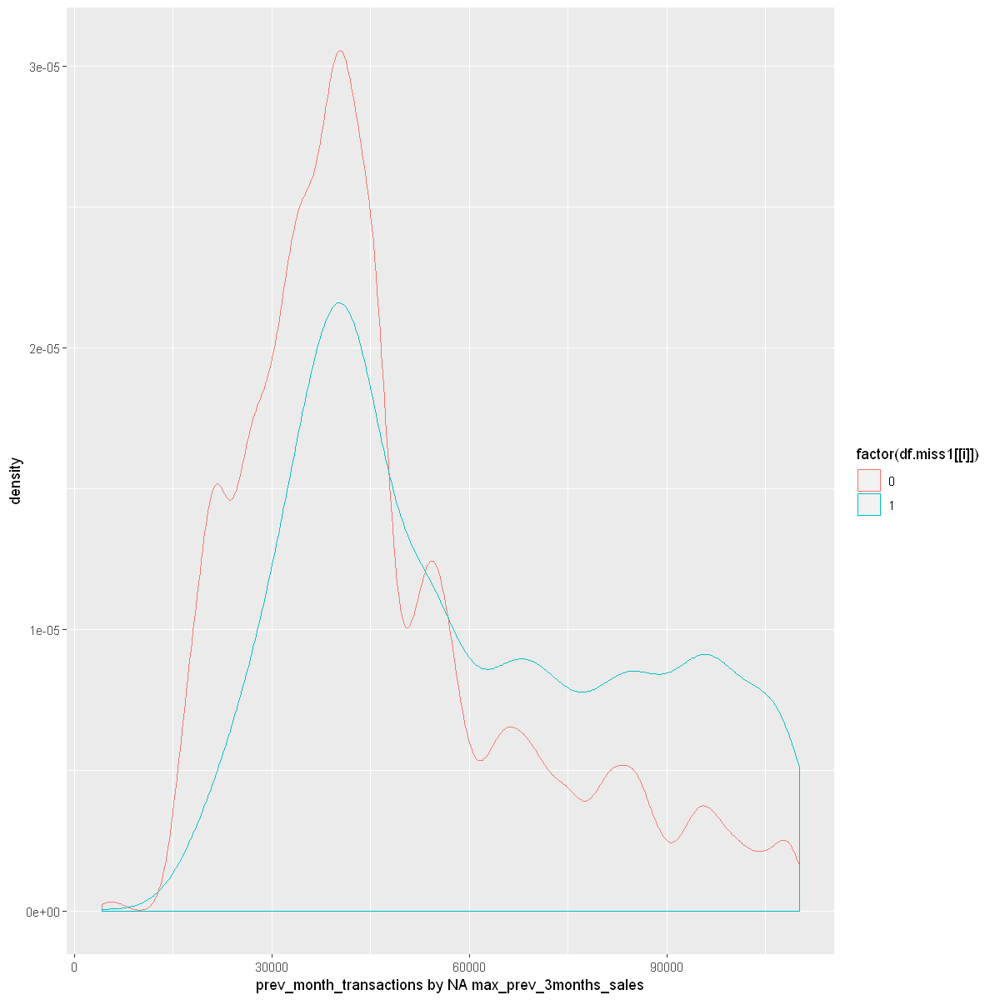


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -206.4, df = 170892, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14216.95 -13949.47
sample estimates:
mean of x mean of y 
 46255.66  60338.87 

[1] "prev_3month_transactions by NA max_prev_3months_sales"


Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


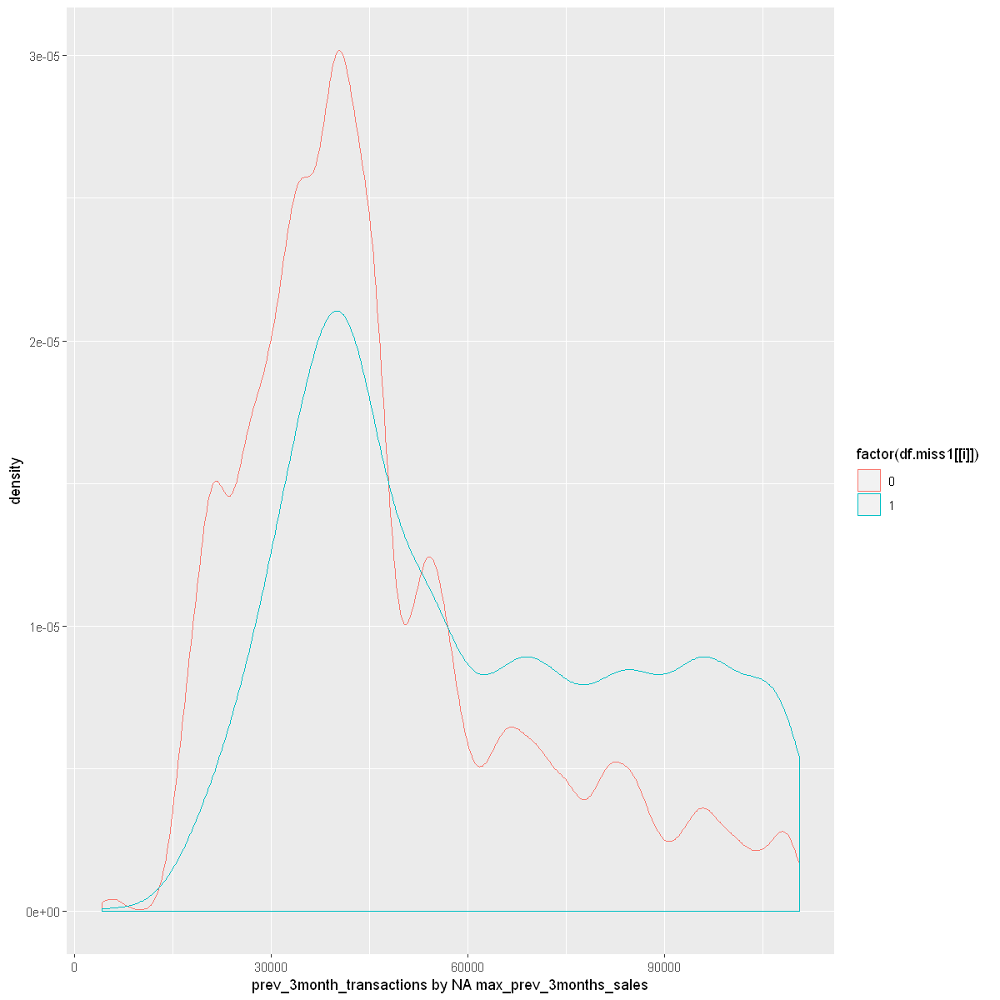


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -198.86, df = 164462, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -13301.79 -13042.14
sample estimates:
mean of x mean of y 
 45731.00  58902.97 

[1] "avg_prev_3months_transactions by NA max_prev_3months_sales"


Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


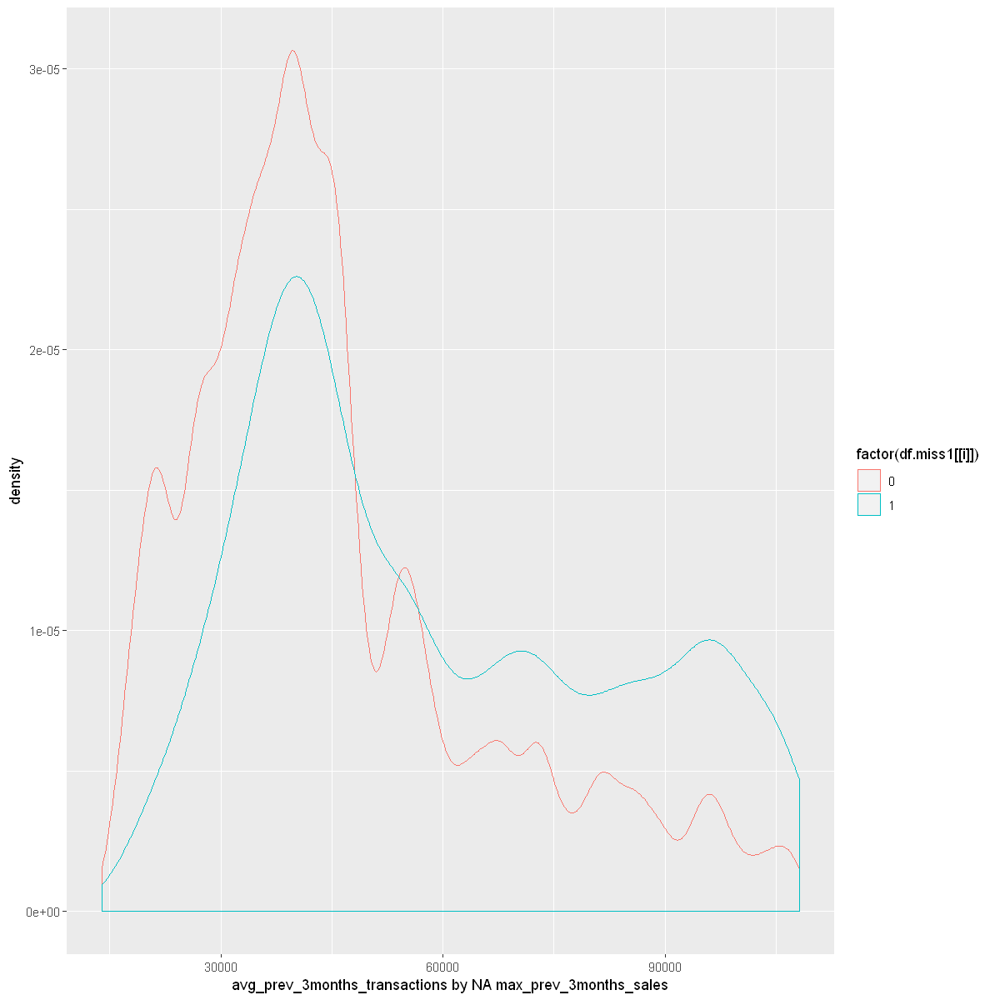


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -188.69, df = 161268, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -11776.31 -11534.17
sample estimates:
mean of x mean of y 
 42674.39  54329.62 

[1] "min_prev_3months_transactions by NA max_prev_3months_sales"


Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


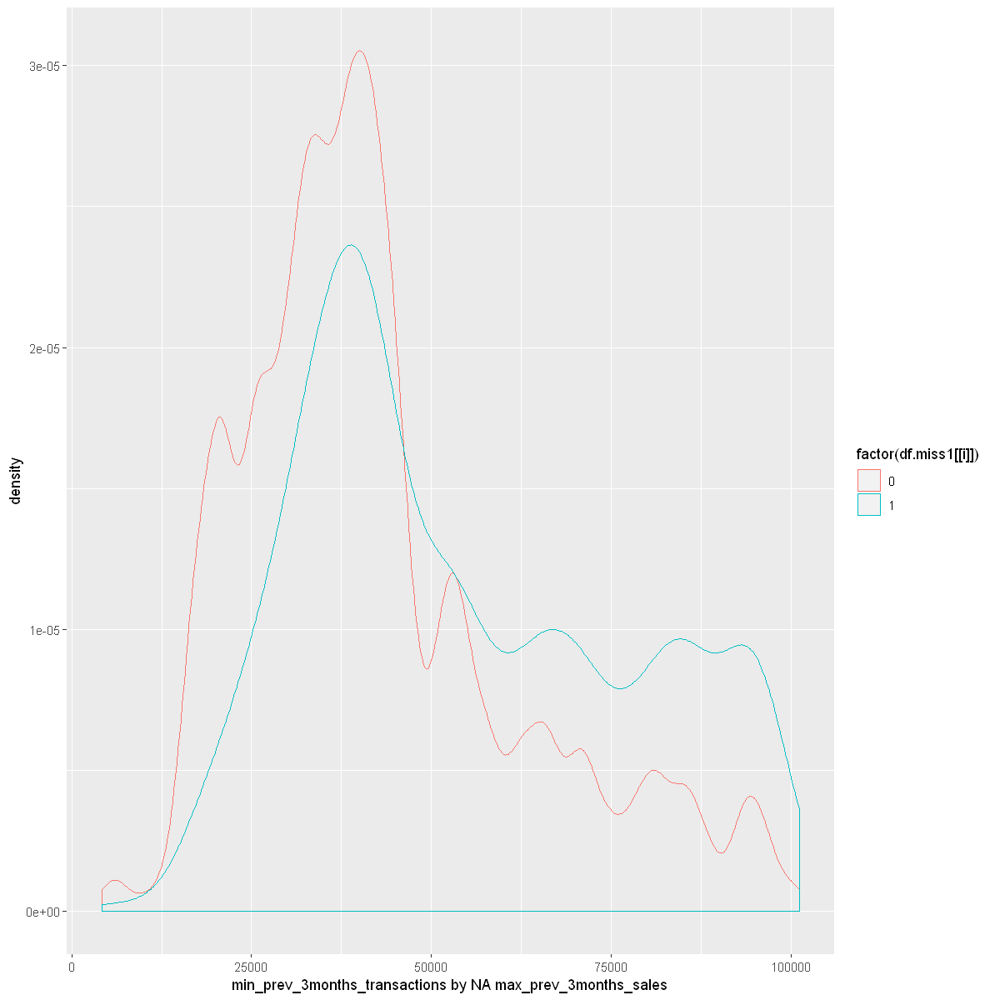


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -200.75, df = 165094, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -14352.75 -14075.20
sample estimates:
mean of x mean of y 
 48624.41  62838.38 

[1] "max_prev_3months_transactions by NA max_prev_3months_sales"


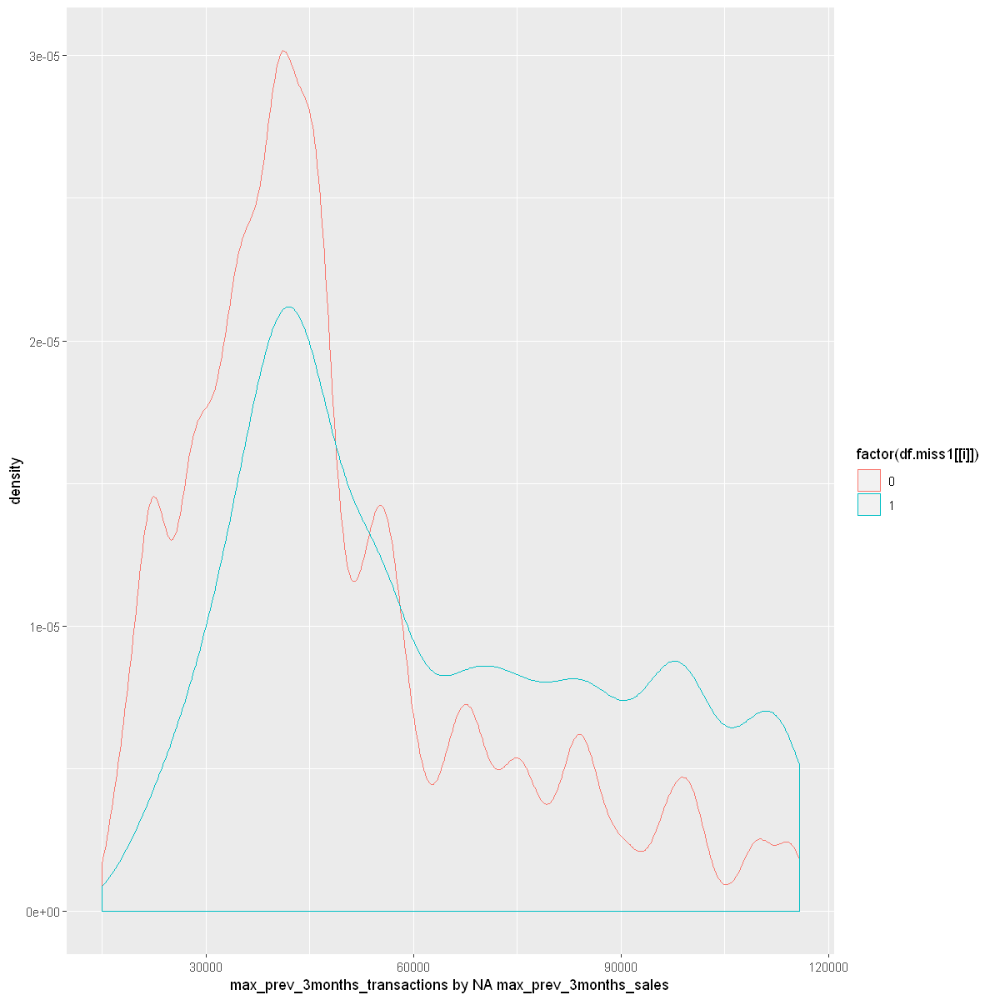


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -429.41, df = 182780, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -905.6921 -897.4620
sample estimates:
mean of x mean of y 
 142.2749 1043.8519 

[1] "total_unit_sales by NA max_prev_3months_sales"


Warning message:
"Removed 182194 rows containing non-finite values (stat_density)."


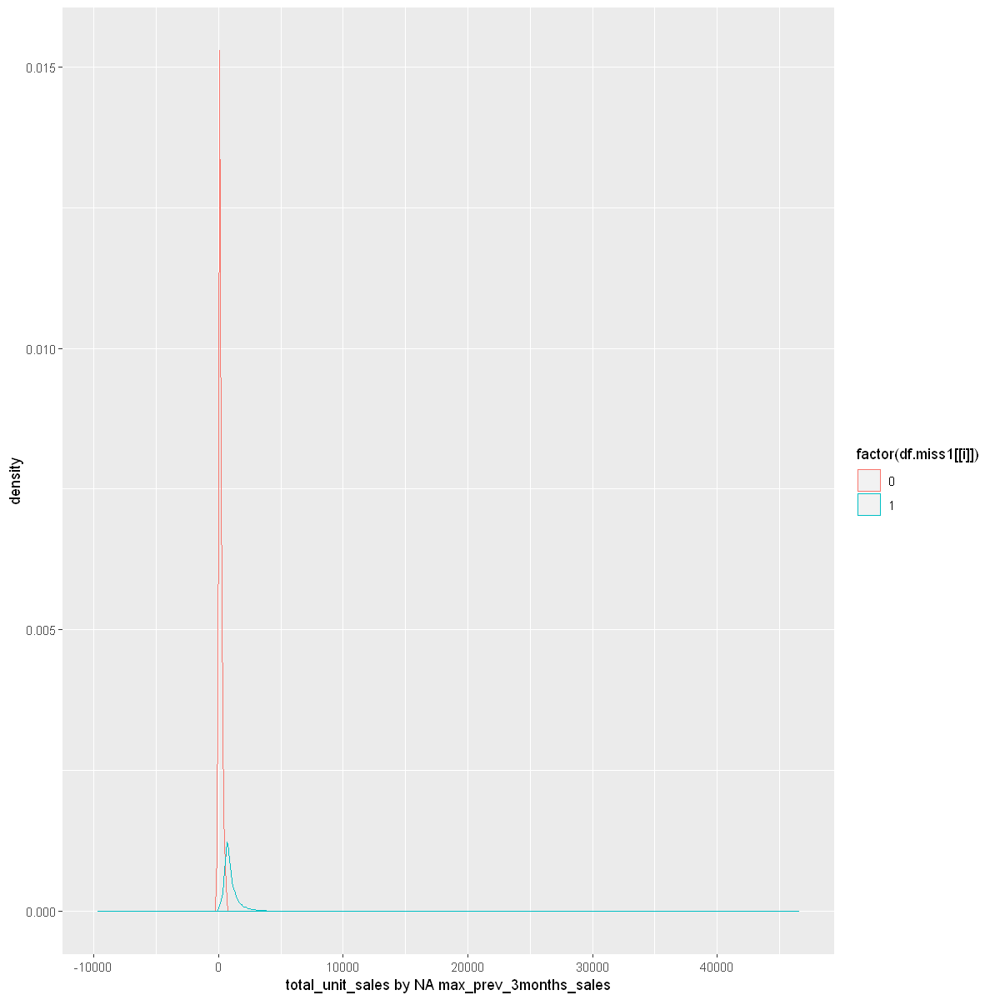


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -236.47, df = 96420, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -105.8532 -104.1129
sample estimates:
mean of x mean of y 
 136.2732  241.2563 

[1] "prev_month_sales by NA total_month_transactions"


Warning message:
"Removed 180962 rows containing non-finite values (stat_density)."


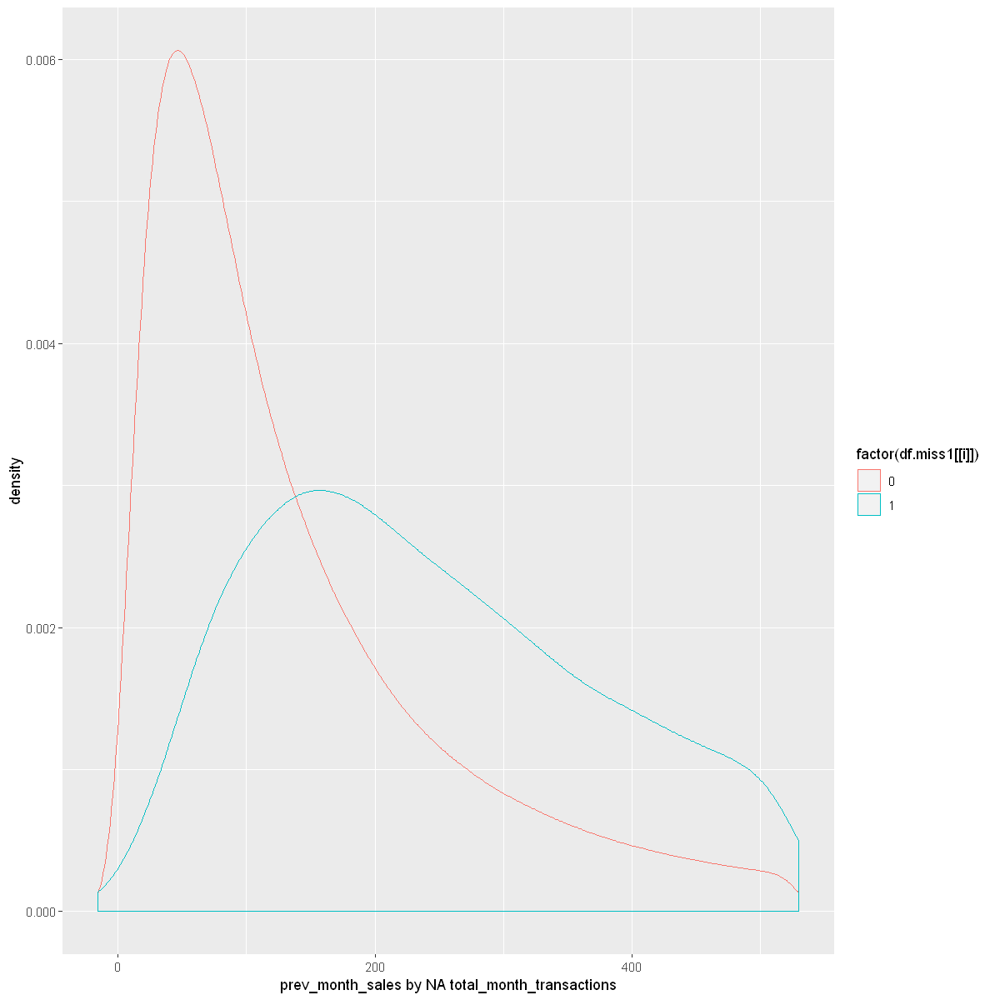


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -237.18, df = 96606, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -106.6426 -104.8945
sample estimates:
mean of x mean of y 
 136.8138  242.5823 

[1] "prev_3month_sales by NA total_month_transactions"


Warning message:
"Removed 181824 rows containing non-finite values (stat_density)."


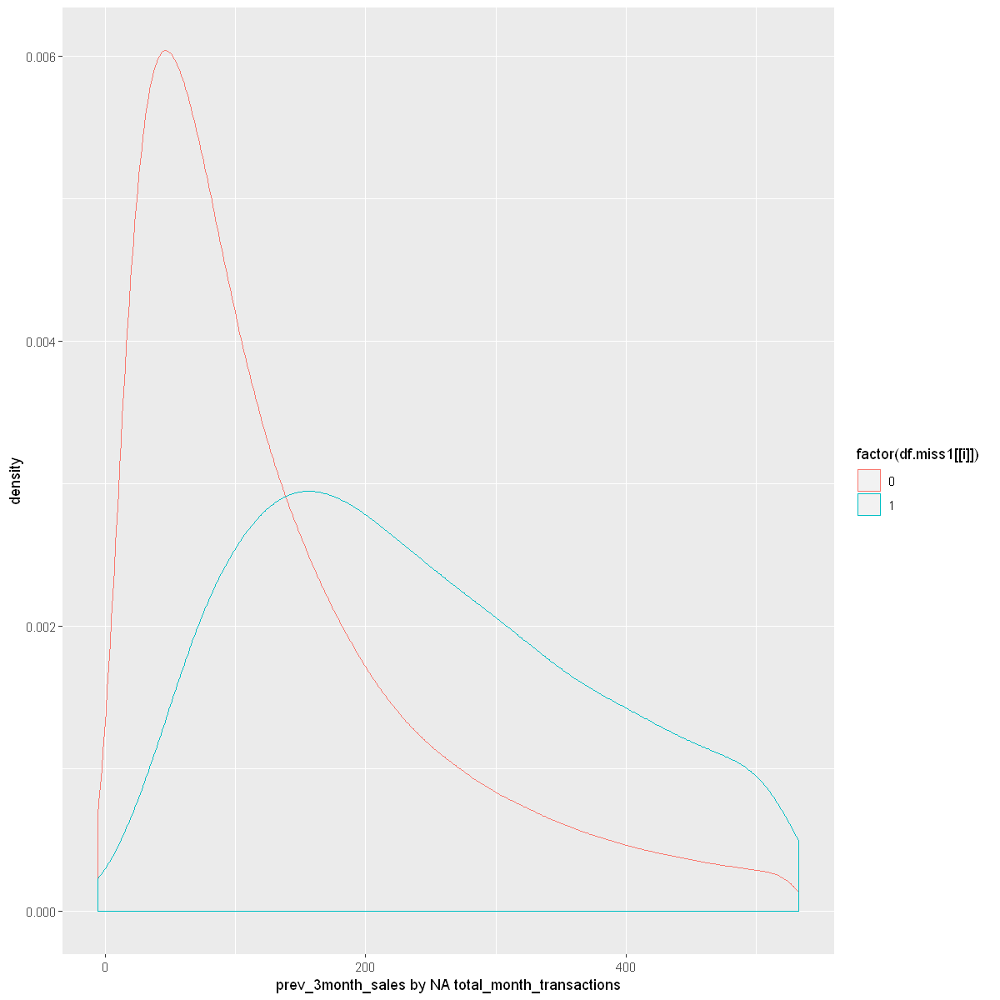


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -249.63, df = 95692, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -109.5778 -107.8705
sample estimates:
mean of x mean of y 
 137.3286  246.0527 

[1] "avg_prev_3months_sales by NA total_month_transactions"


Warning message:
"Removed 183073 rows containing non-finite values (stat_density)."


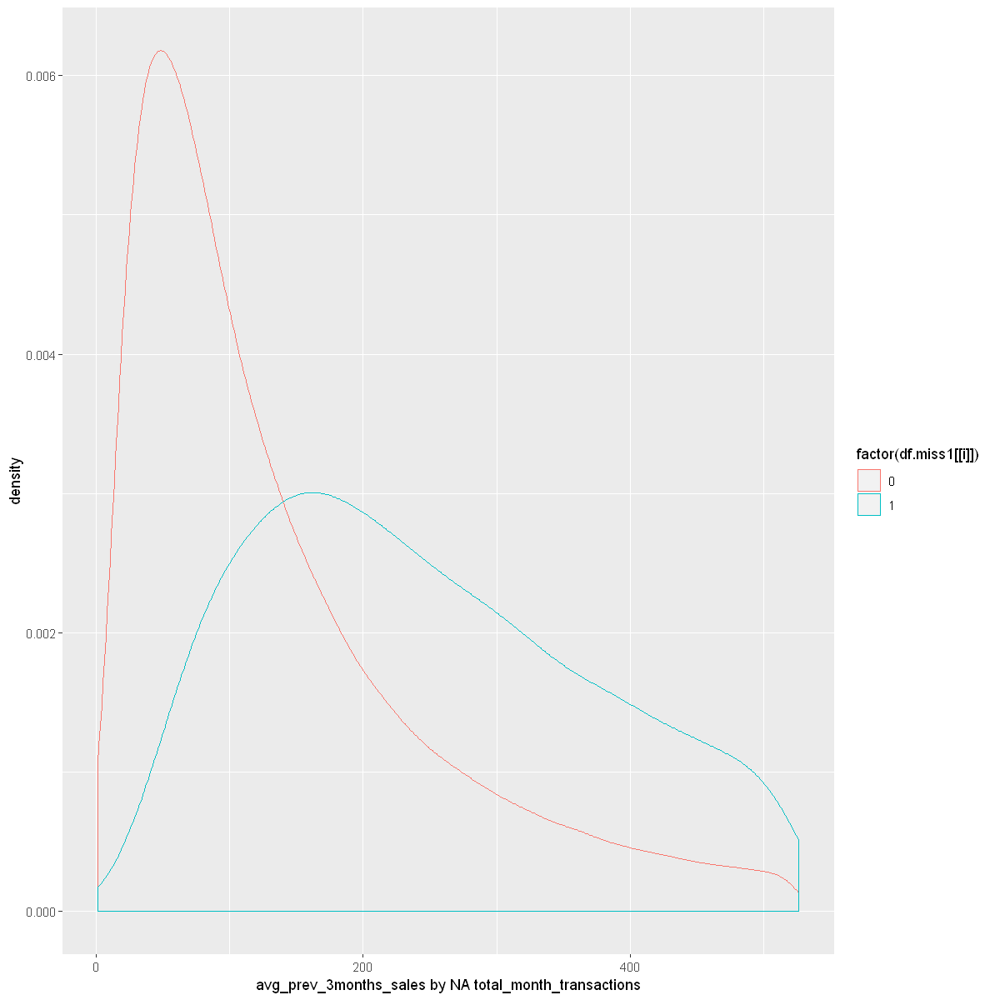


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -236.65, df = 94673, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -89.32552 -87.85804
sample estimates:
mean of x mean of y 
 109.1062  197.6980 

[1] "min_prev_3months_sales by NA total_month_transactions"


Warning message:
"Removed 182080 rows containing non-finite values (stat_density)."


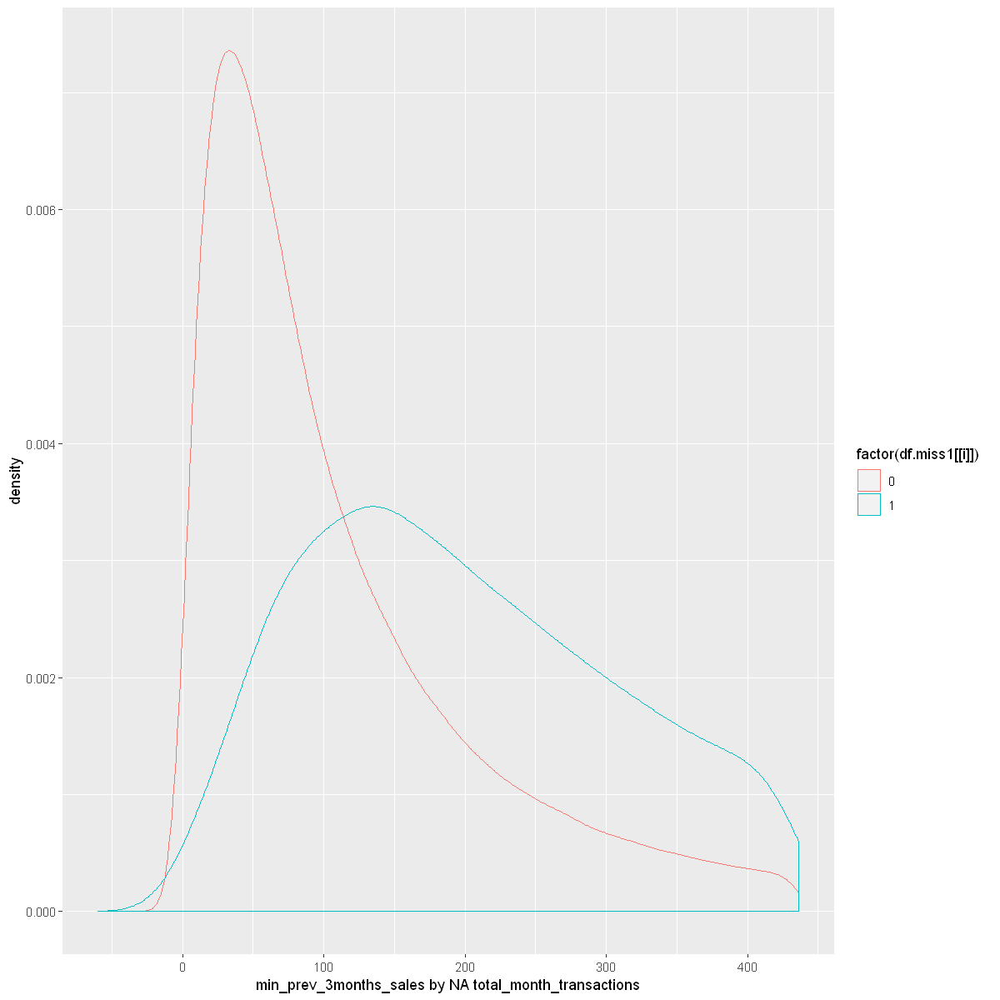


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -246.25, df = 96501, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -127.4105 -125.3983
sample estimates:
mean of x mean of y 
 165.4184  291.8227 

[1] "max_prev_3months_sales by NA total_month_transactions"


Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


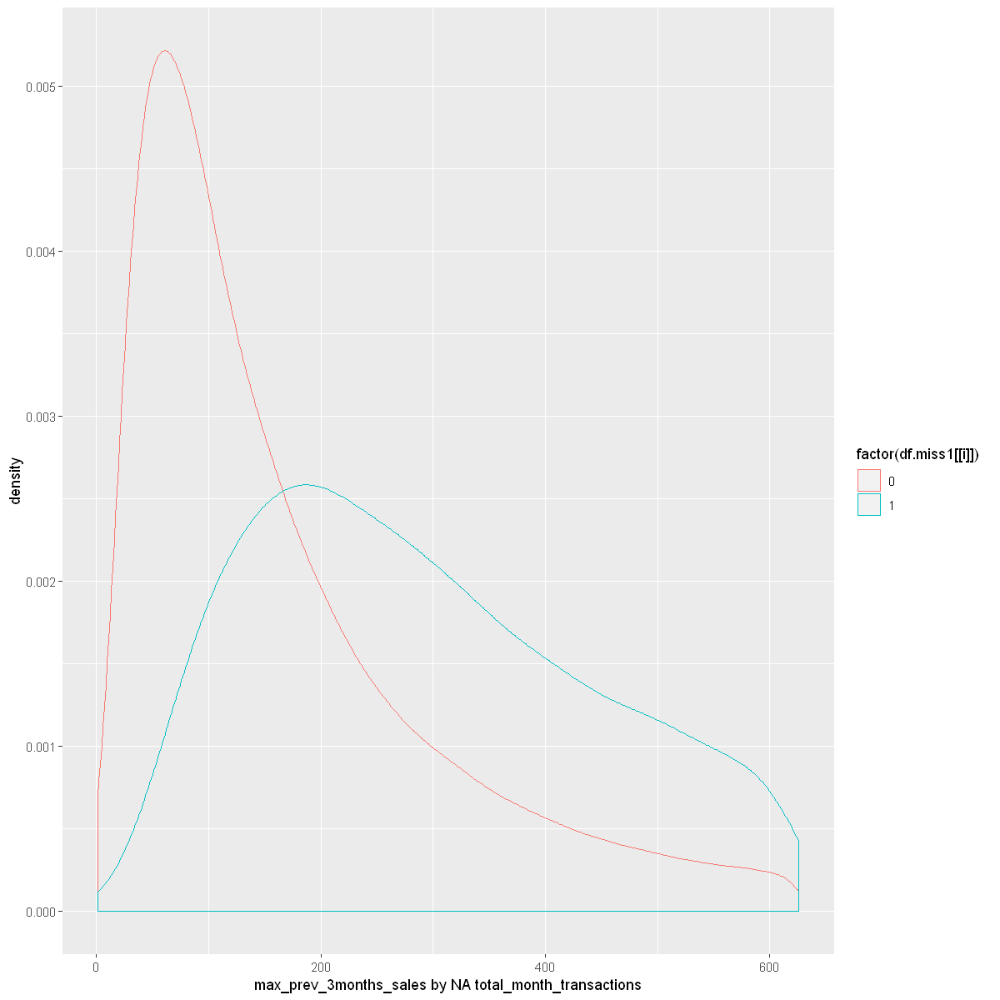


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1305.8, df = 45465, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -56483.92 -56314.61
sample estimates:
mean of x mean of y 
 46264.64 102663.90 

[1] "prev_month_transactions by NA total_month_transactions"


Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


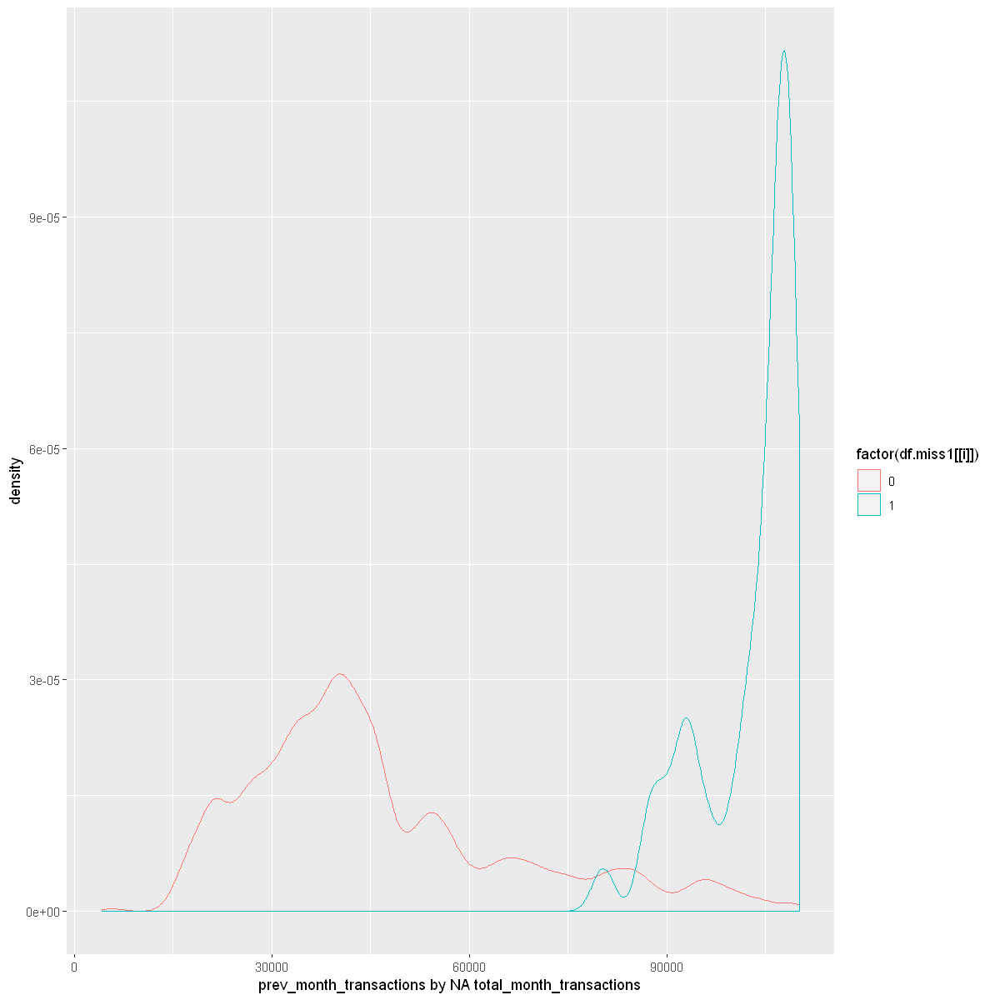


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1252.8, df = 47879, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -55857.73 -55683.22
sample estimates:
mean of x mean of y 
 46292.67 102063.15 

[1] "prev_3month_transactions by NA total_month_transactions"


Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


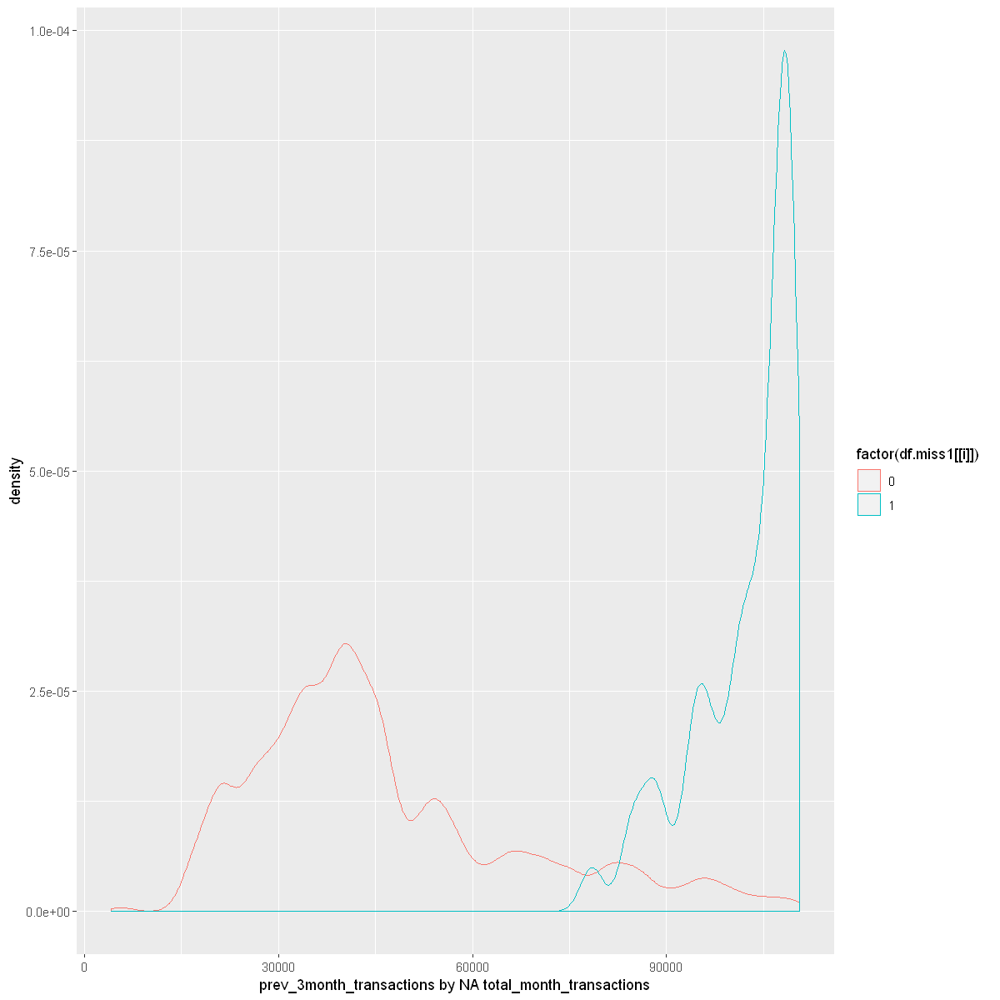


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1387.8, df = 21217, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -57057.04 -56896.10
sample estimates:
mean of x mean of y 
 46288.35 103264.92 

[1] "avg_prev_3months_transactions by NA total_month_transactions"


Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


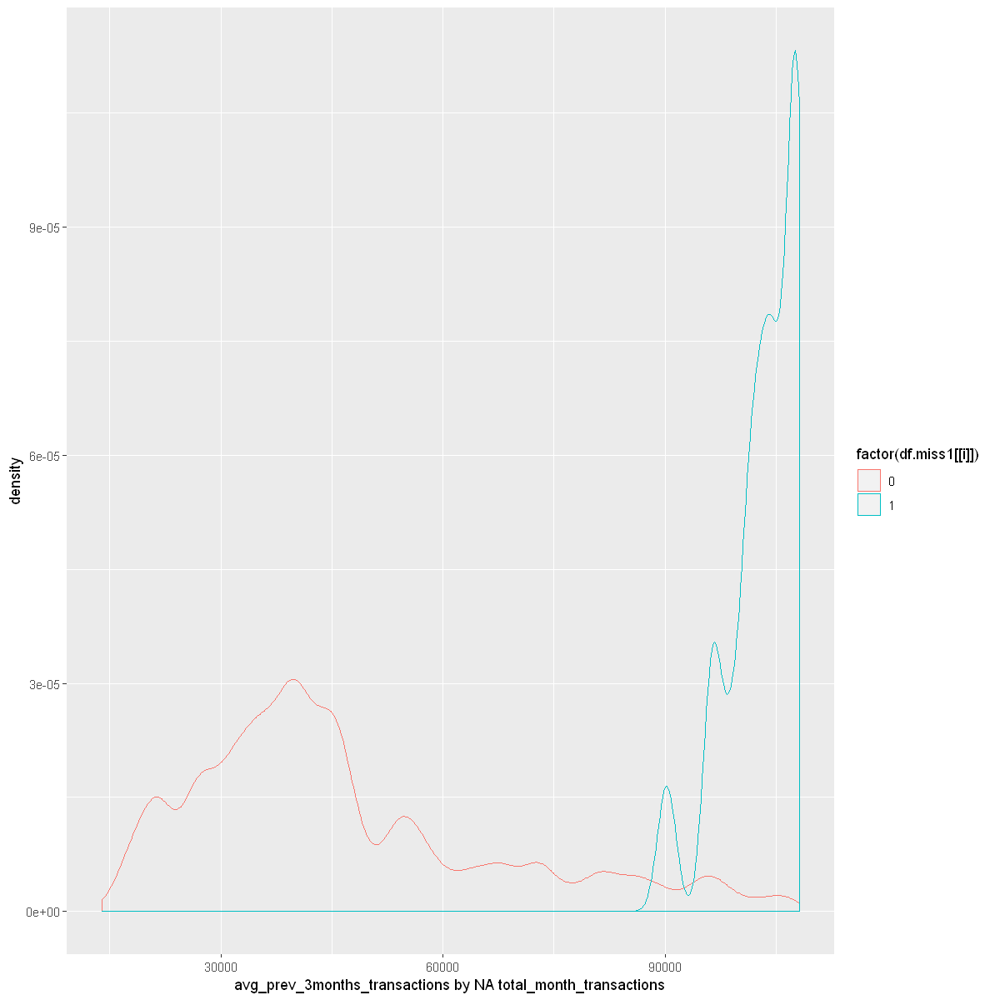


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -932.28, df = 15647, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -50624.14 -50411.71
sample estimates:
mean of x mean of y 
 43212.36  93730.28 

[1] "min_prev_3months_transactions by NA total_month_transactions"


Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


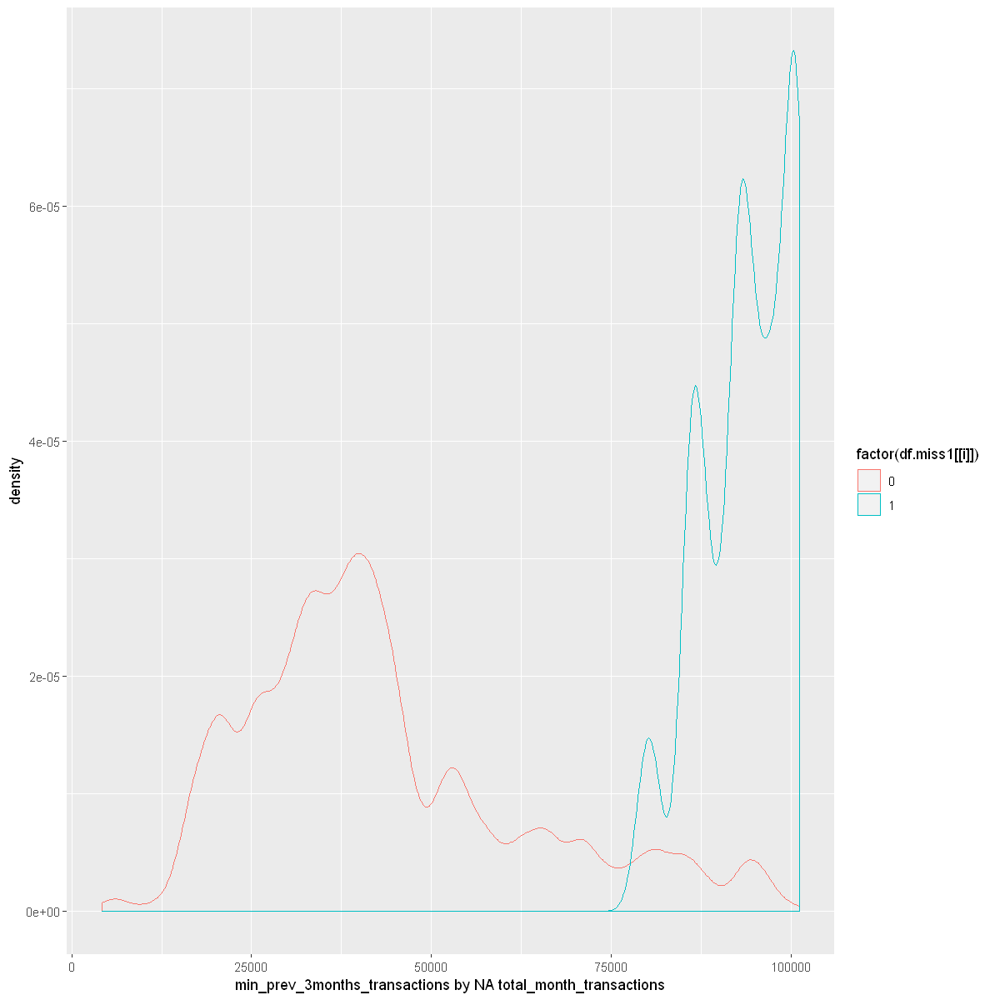


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3160, df = 159294, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -64260.95 -64181.28
sample estimates:
mean of x mean of y 
 48889.75 113110.87 

[1] "max_prev_3months_transactions by NA total_month_transactions"


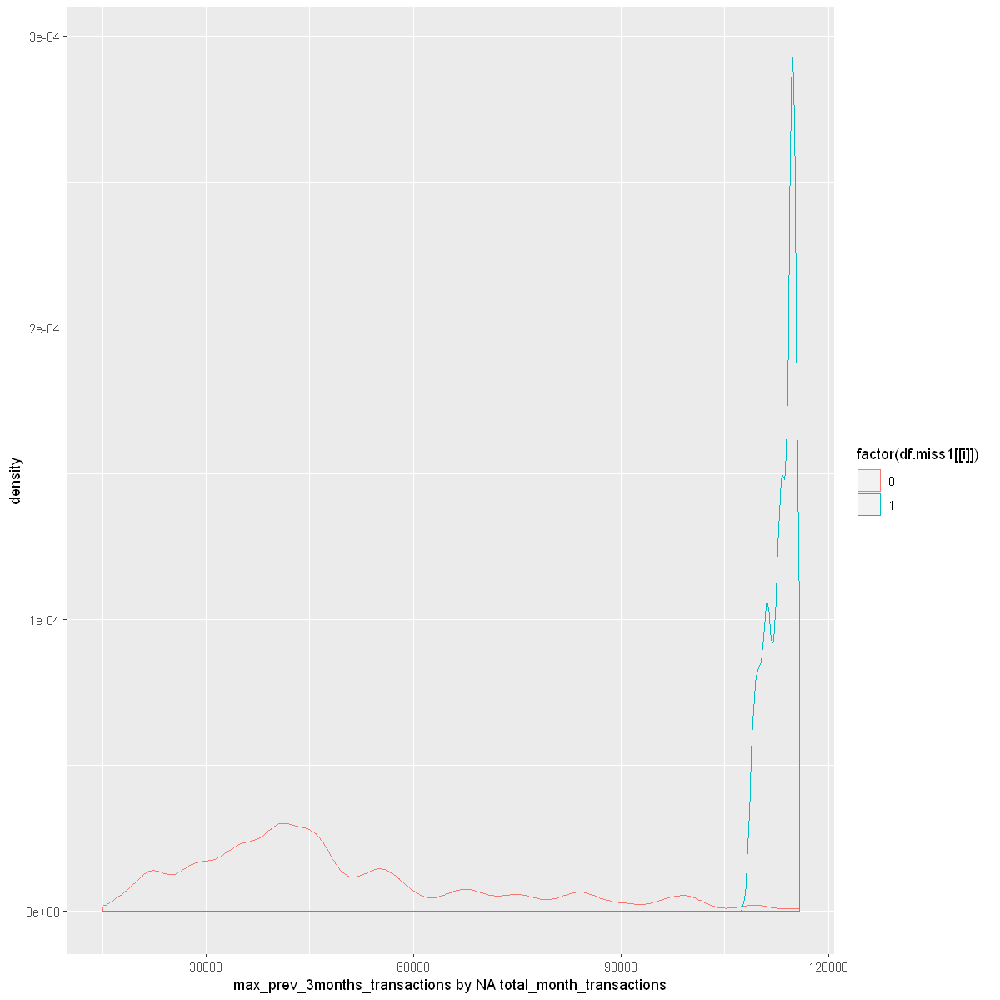


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -149.14, df = 126911, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -312.0749 -303.9788
sample estimates:
mean of x mean of y 
 206.2169  514.2438 

[1] "total_unit_sales by NA total_month_transactions"


Warning message:
"Removed 182194 rows containing non-finite values (stat_density)."


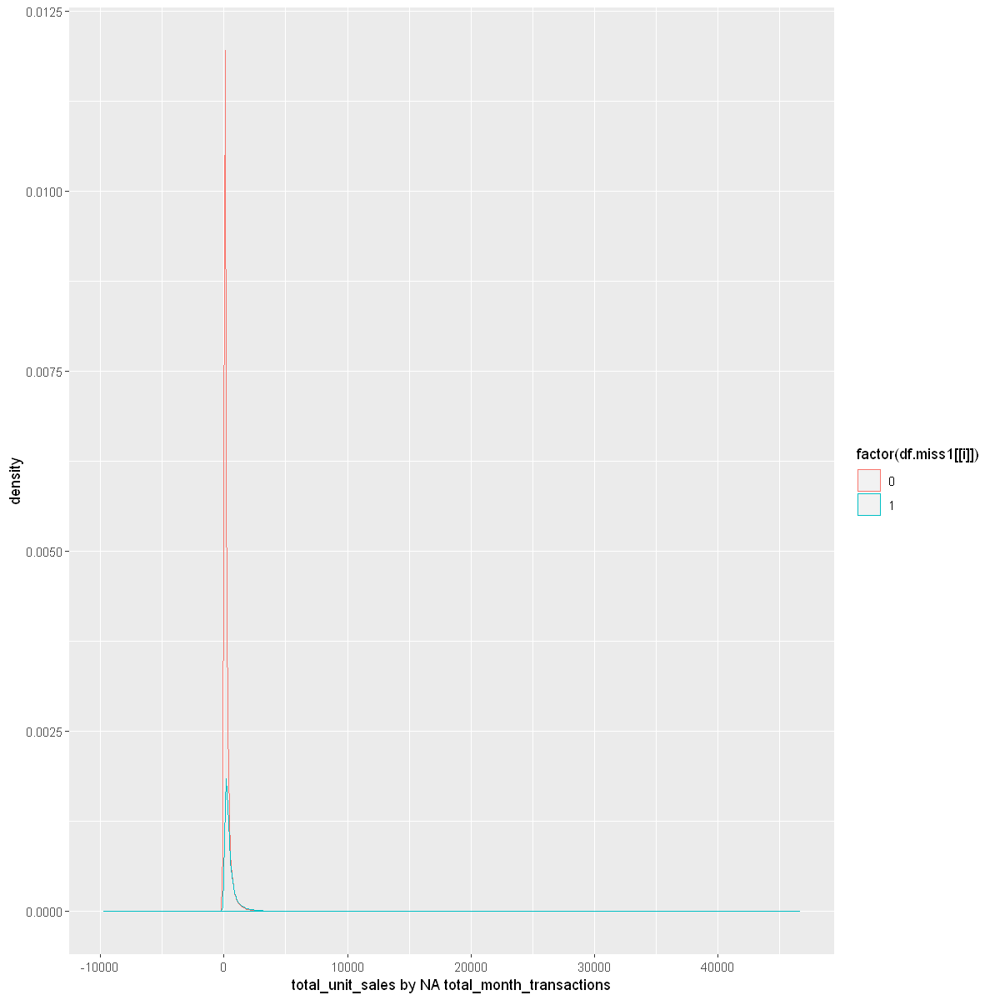


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -235.13, df = 89569, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -108.8352 -107.0357
sample estimates:
mean of x mean of y 
 136.4808  244.4163 

[1] "prev_month_sales by NA prev_month_transactions"


Warning message:
"Removed 180962 rows containing non-finite values (stat_density)."


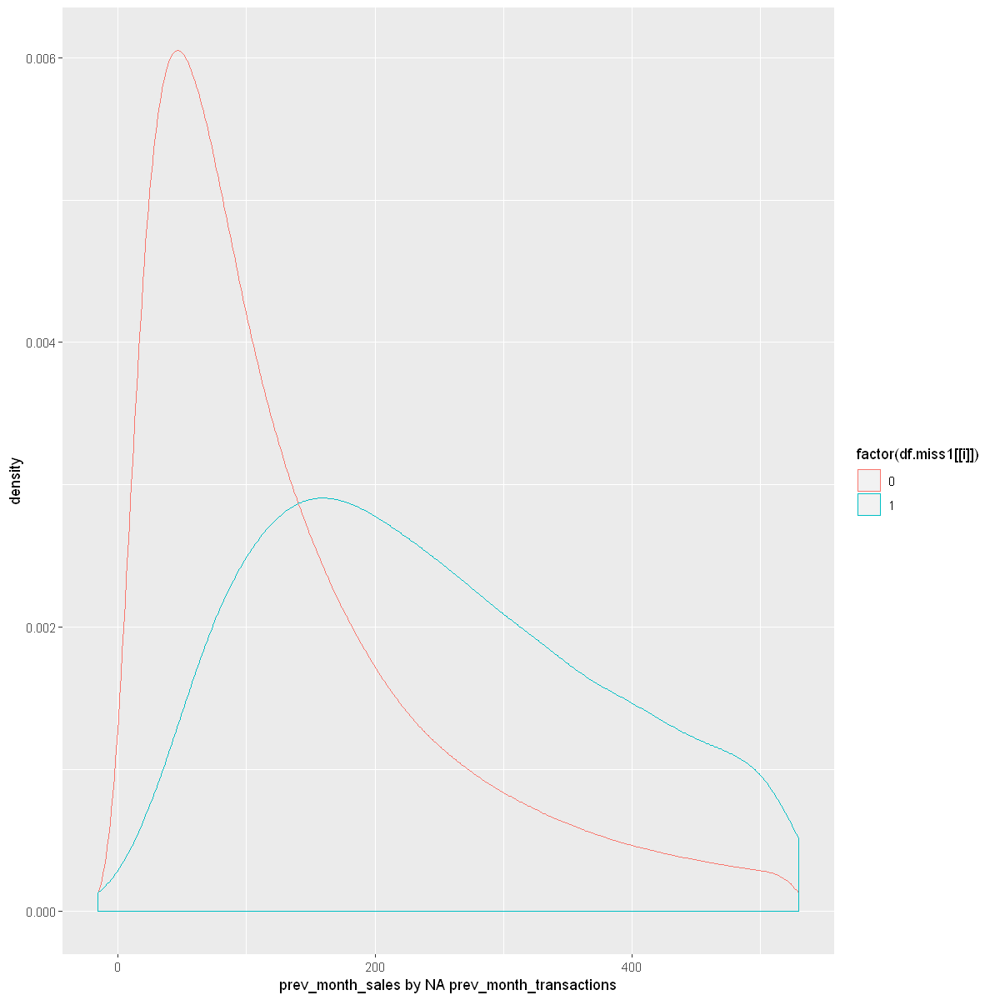


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -230.26, df = 91025, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -106.3472 -104.5520
sample estimates:
mean of x mean of y 
 137.1121  242.5617 

[1] "prev_3month_sales by NA prev_month_transactions"


Warning message:
"Removed 181824 rows containing non-finite values (stat_density)."


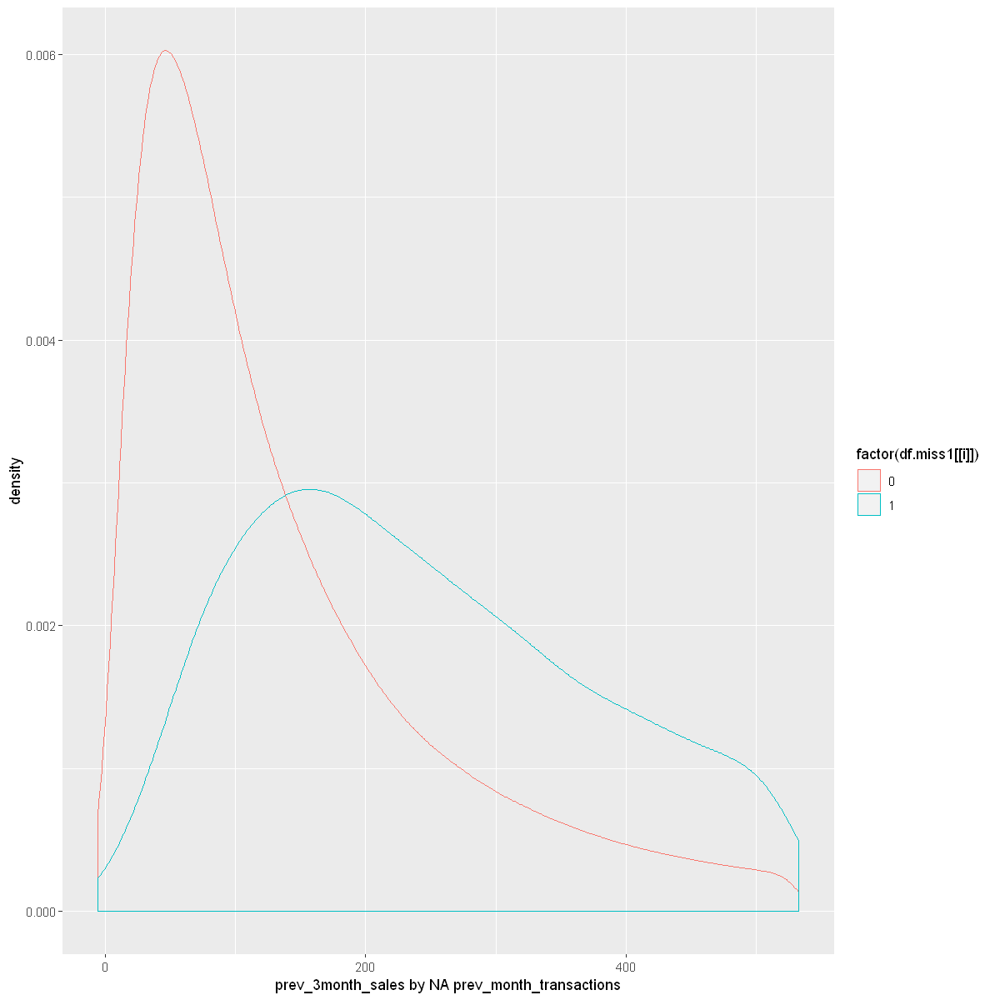


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -241.69, df = 90062, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -109.2559 -107.4982
sample estimates:
mean of x mean of y 
 137.6366  246.0137 

[1] "avg_prev_3months_sales by NA prev_month_transactions"


Warning message:
"Removed 183073 rows containing non-finite values (stat_density)."


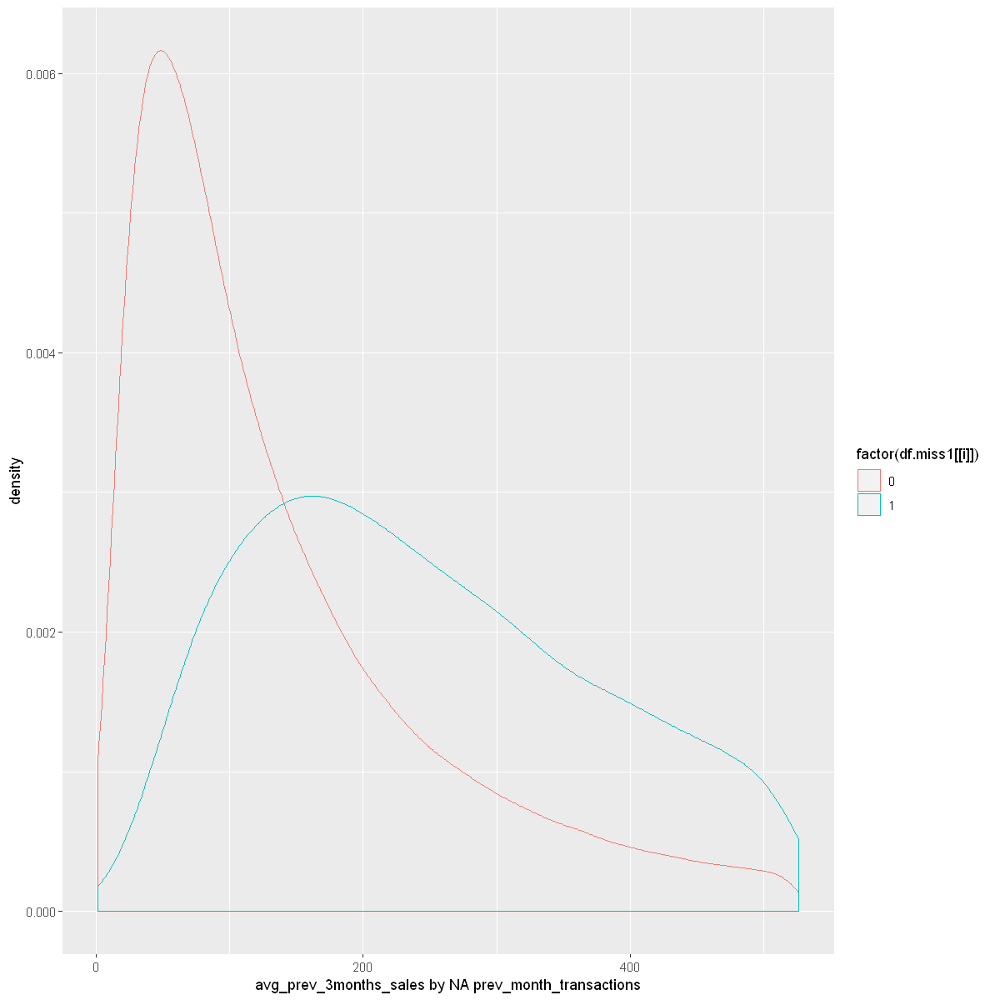


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -226.73, df = 89591, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -87.99707 -86.48873
sample estimates:
mean of x mean of y 
 109.3848  196.6277 

[1] "min_prev_3months_sales by NA prev_month_transactions"


Warning message:
"Removed 182080 rows containing non-finite values (stat_density)."


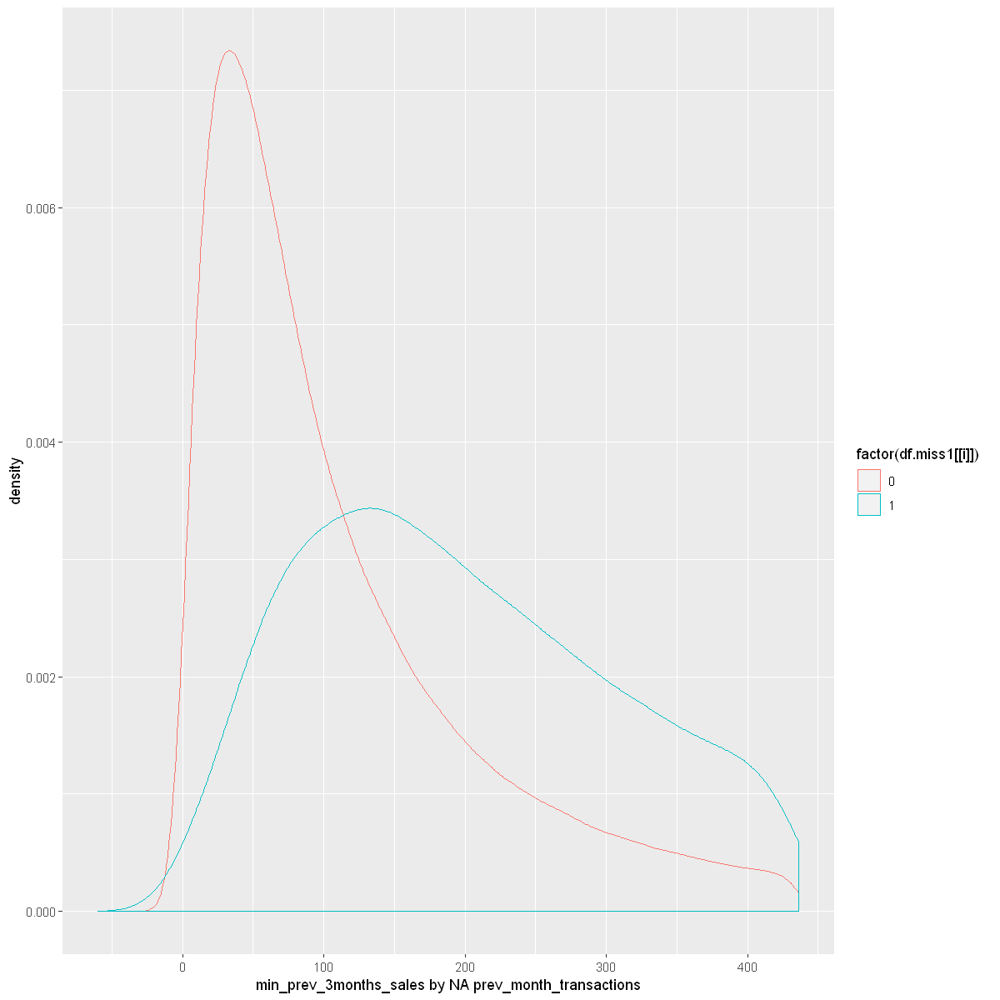


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -238.58, df = 90556, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -127.1778 -125.1053
sample estimates:
mean of x mean of y 
 165.7893  291.9308 

[1] "max_prev_3months_sales by NA prev_month_transactions"


Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


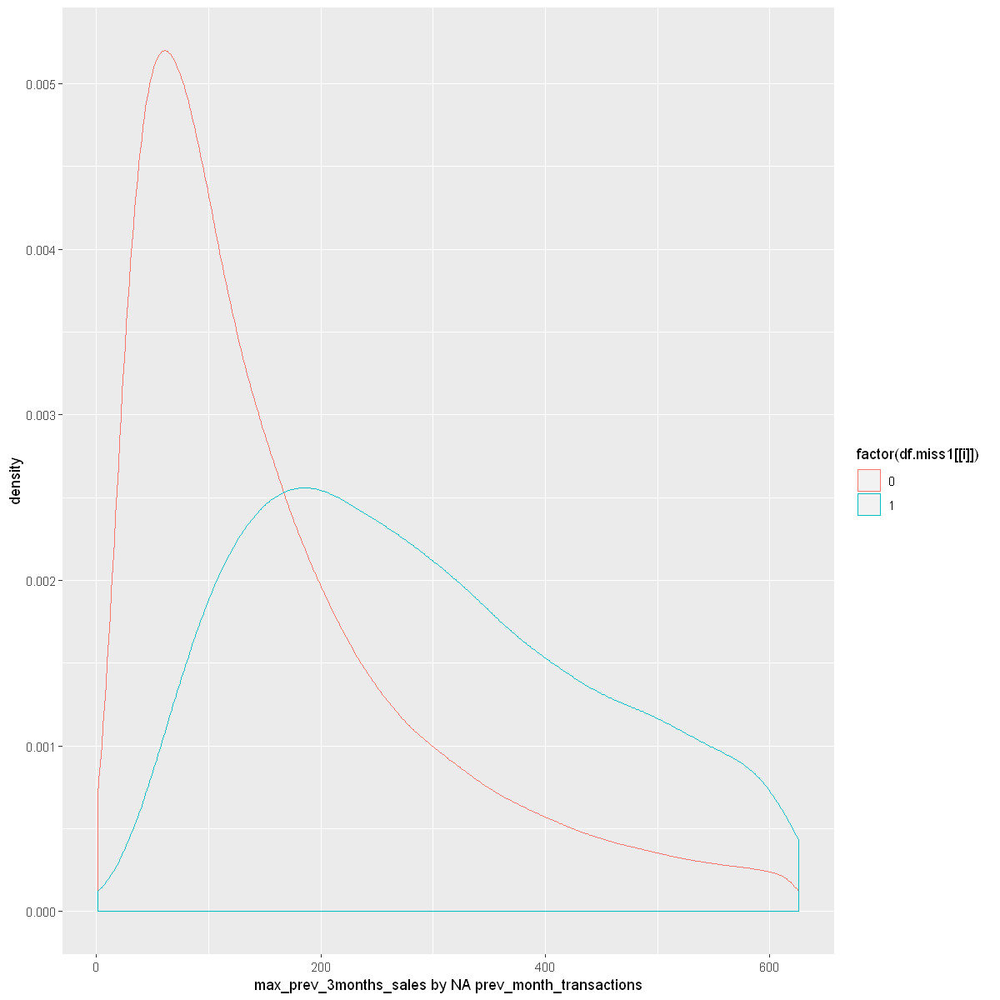


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -618.83, df = 30210, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -51712.44 -51385.89
sample estimates:
mean of x mean of y 
 45793.94  97343.10 

[1] "total_month_transactions by NA prev_month_transactions"


Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


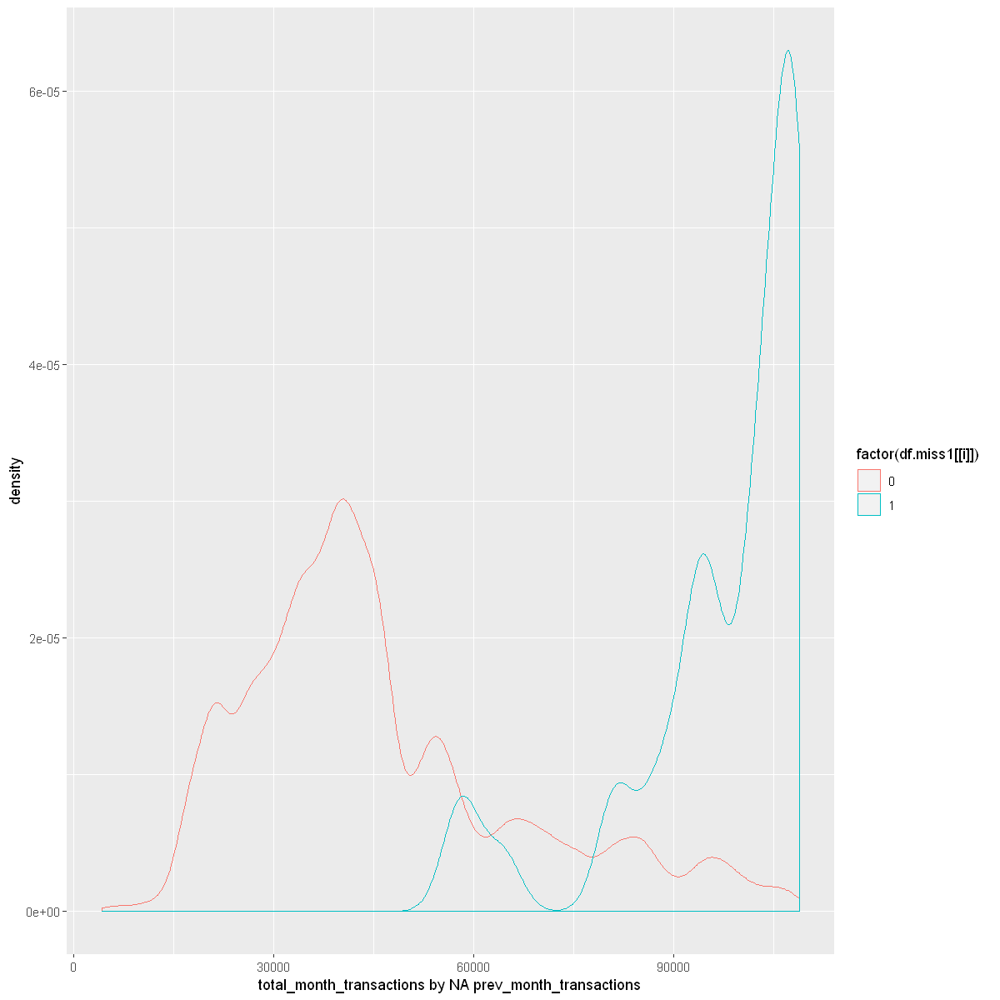


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1400.1, df = 45847, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -56888.13 -56729.07
sample estimates:
mean of x mean of y 
 46380.71 103189.31 

[1] "prev_3month_transactions by NA prev_month_transactions"


Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


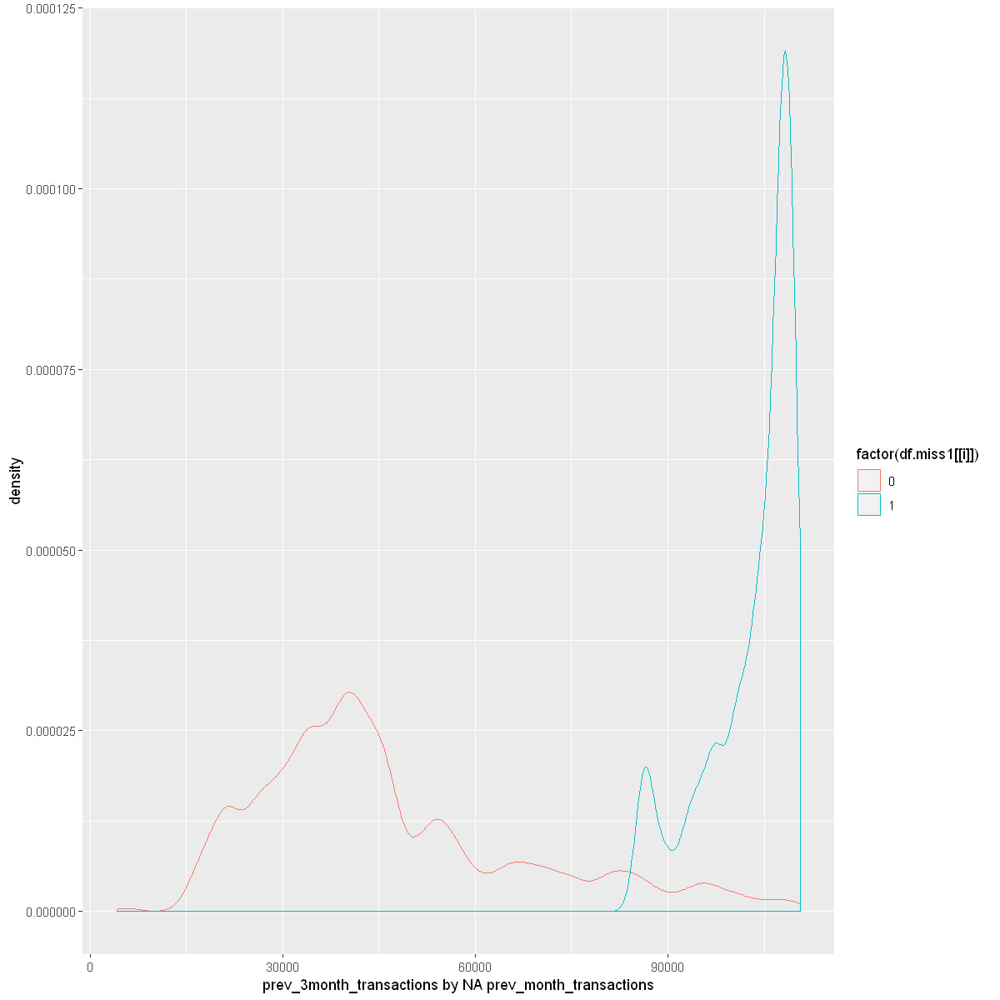


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1476.5, df = 19007, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -55419.20 -55272.25
sample estimates:
mean of x mean of y 
 46379.76 101725.49 

[1] "avg_prev_3months_transactions by NA prev_month_transactions"


Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


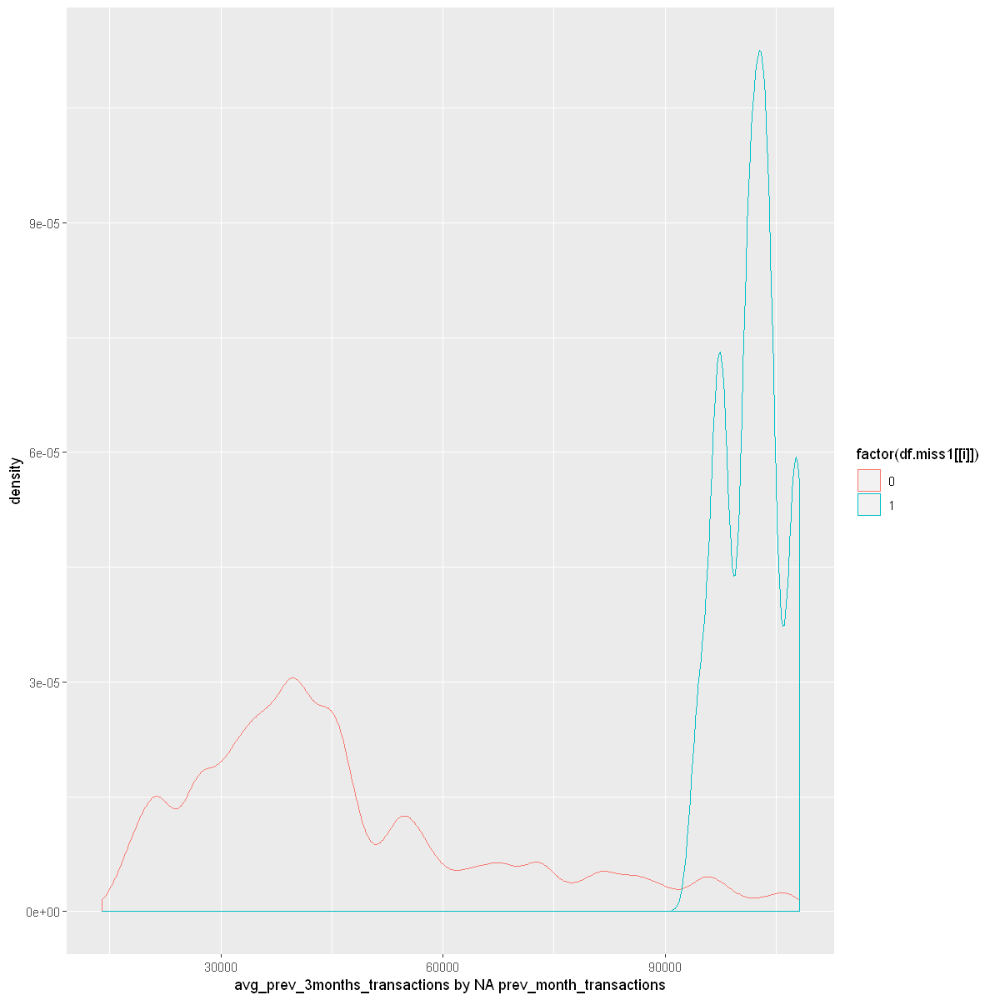


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -406.1, df = 15378, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -44439.10 -44012.18
sample estimates:
mean of x mean of y 
 43226.76  87452.40 

[1] "min_prev_3months_transactions by NA prev_month_transactions"


Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


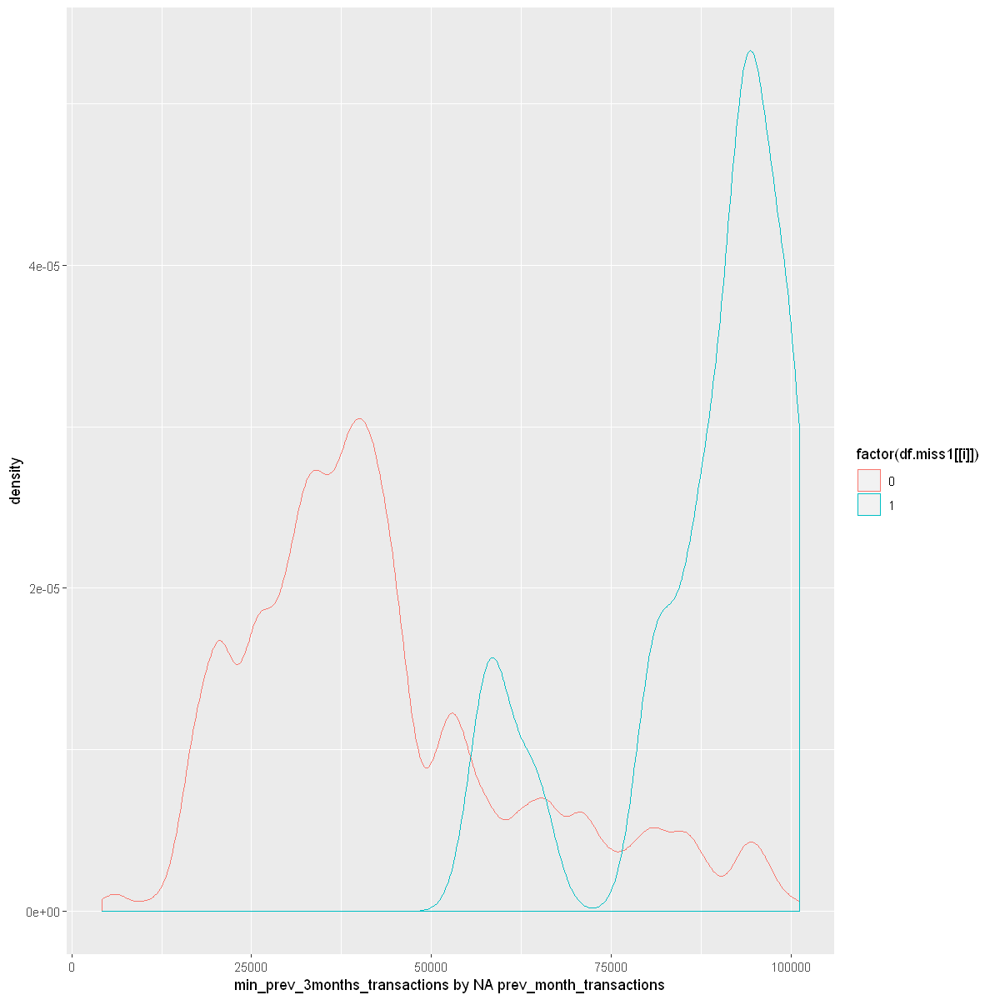


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3221.8, df = 140581, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -64547.00 -64468.51
sample estimates:
mean of x mean of y 
 49113.84 113621.60 

[1] "max_prev_3months_transactions by NA prev_month_transactions"


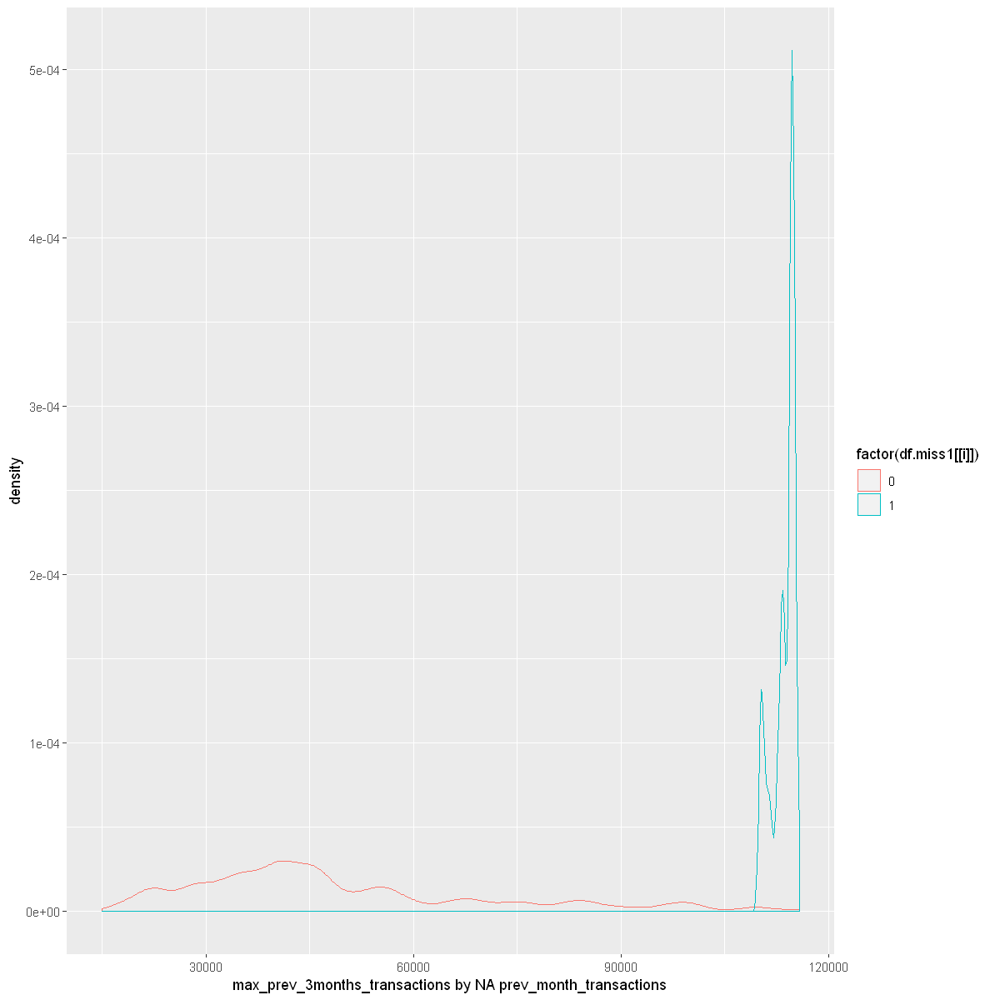


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -139.49, df = 119994, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -296.4172 -288.2026
sample estimates:
mean of x mean of y 
 208.1817  500.4916 

[1] "total_unit_sales by NA prev_month_transactions"


Warning message:
"Removed 182194 rows containing non-finite values (stat_density)."


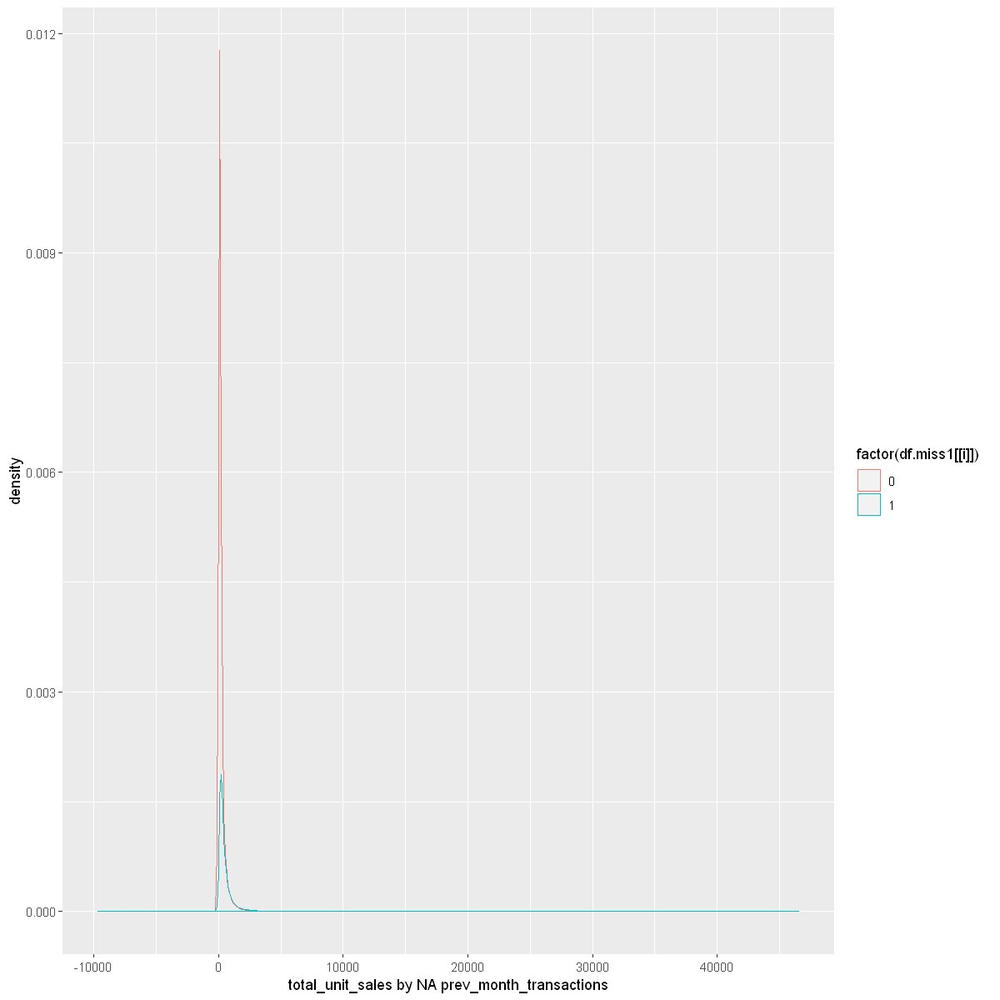


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -221.13, df = 85712, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -104.4311 -102.5961
sample estimates:
mean of x mean of y 
 136.8807  240.3944 

[1] "prev_month_sales by NA prev_3month_transactions"


Warning message:
"Removed 180962 rows containing non-finite values (stat_density)."


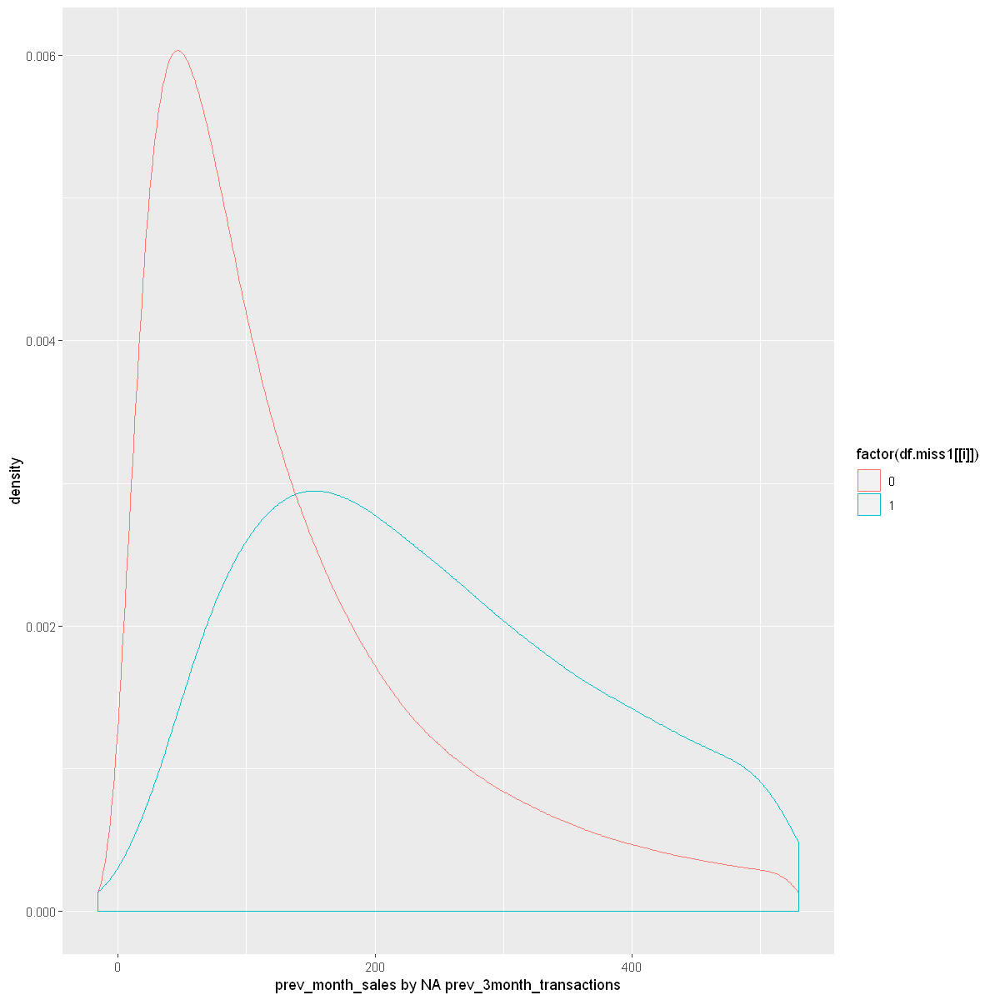


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -227.79, df = 84295, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -109.1062 -107.2447
sample estimates:
mean of x mean of y 
 137.3342  245.5097 

[1] "prev_3month_sales by NA prev_3month_transactions"


Warning message:
"Removed 181824 rows containing non-finite values (stat_density)."


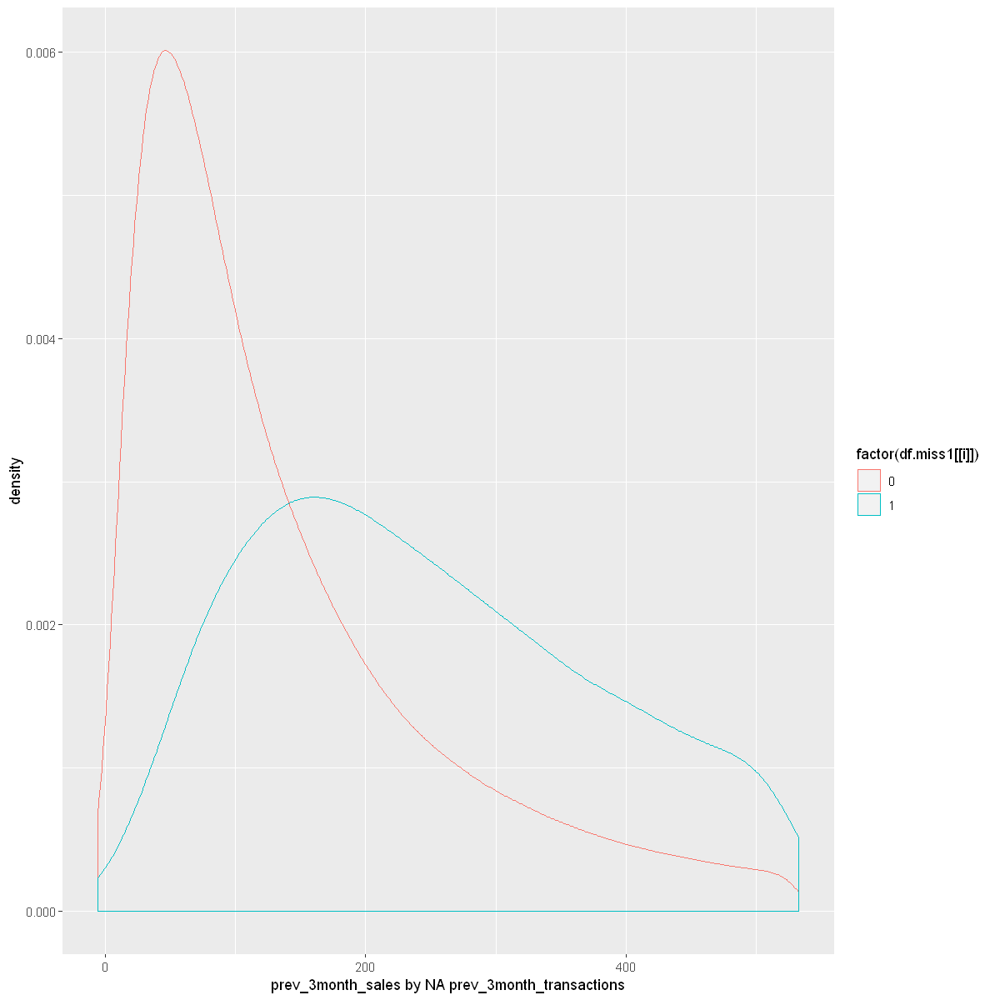


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -230.93, df = 85267, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -107.1093 -105.3064
sample estimates:
mean of x mean of y 
 137.9838  244.1917 

[1] "avg_prev_3months_sales by NA prev_3month_transactions"


Warning message:
"Removed 183073 rows containing non-finite values (stat_density)."


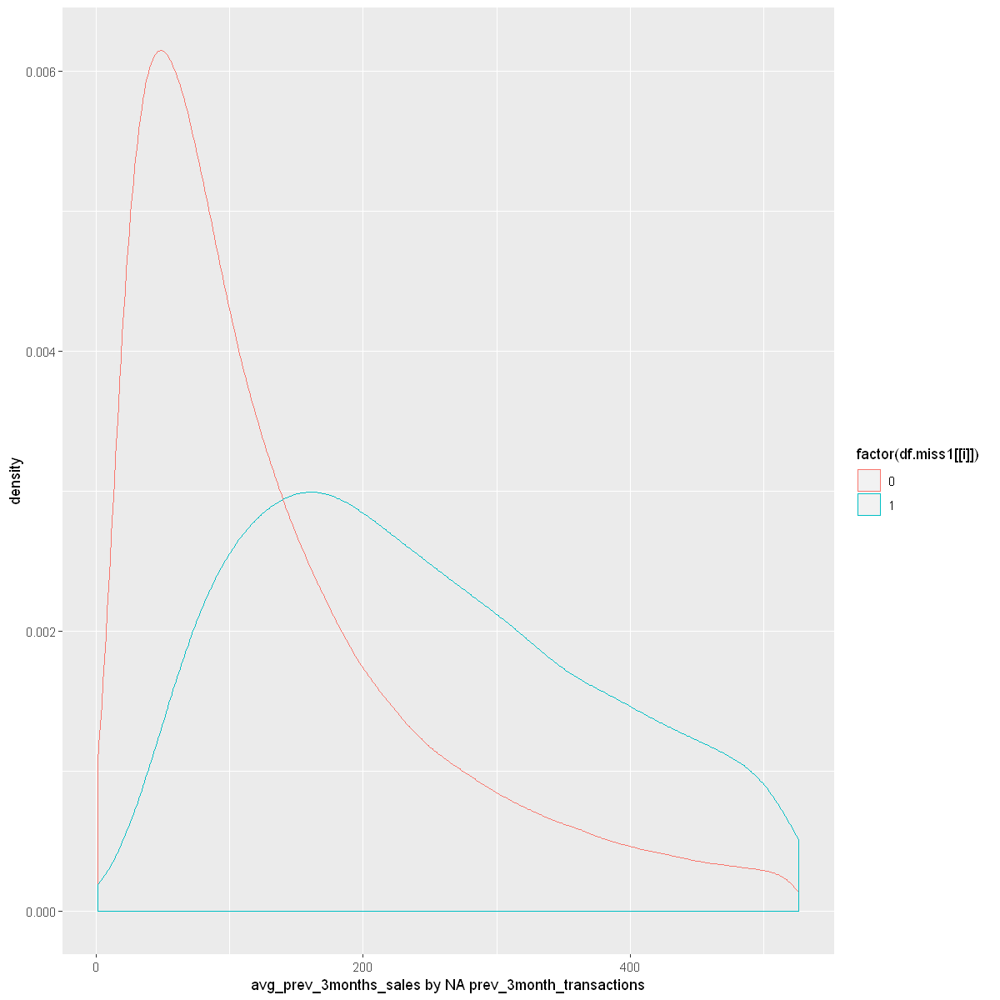


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -216.24, df = 84654, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -86.22945 -84.68032
sample estimates:
mean of x mean of y 
 109.6730  195.1278 

[1] "min_prev_3months_sales by NA prev_3month_transactions"


Warning message:
"Removed 182080 rows containing non-finite values (stat_density)."


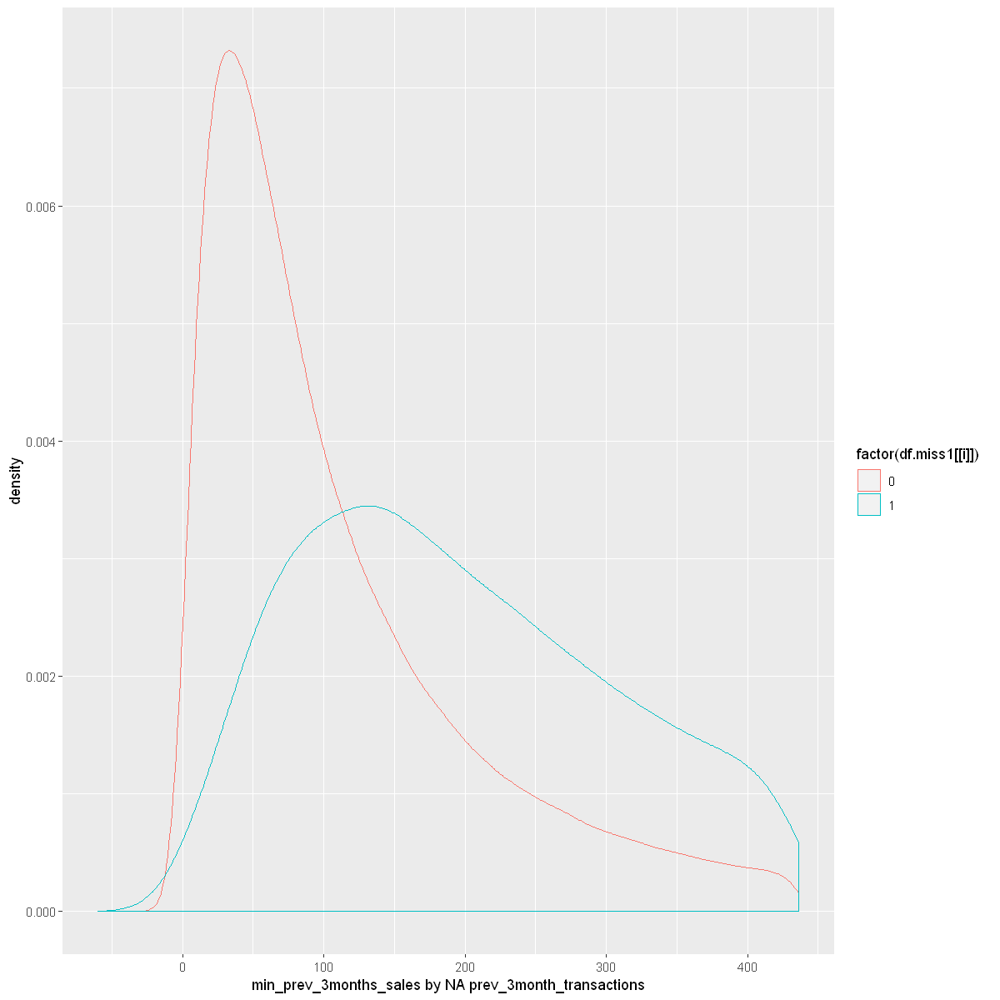


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -228.54, df = 85911, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -124.8157 -122.6930
sample estimates:
mean of x mean of y 
 166.1786  289.9330 

[1] "max_prev_3months_sales by NA prev_3month_transactions"


Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


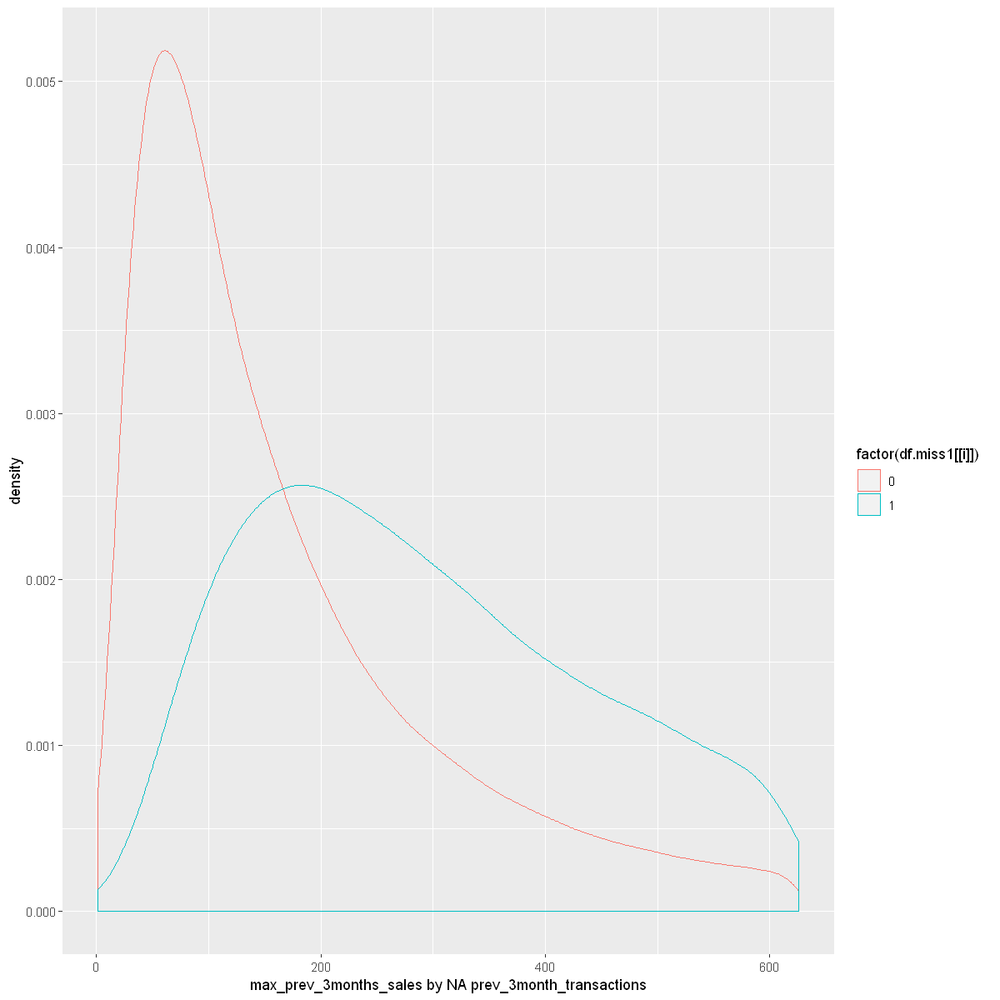


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -478.64, df = 25181, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -50498.18 -50086.28
sample estimates:
mean of x mean of y 
 45924.15  96216.38 

[1] "total_month_transactions by NA prev_3month_transactions"


Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


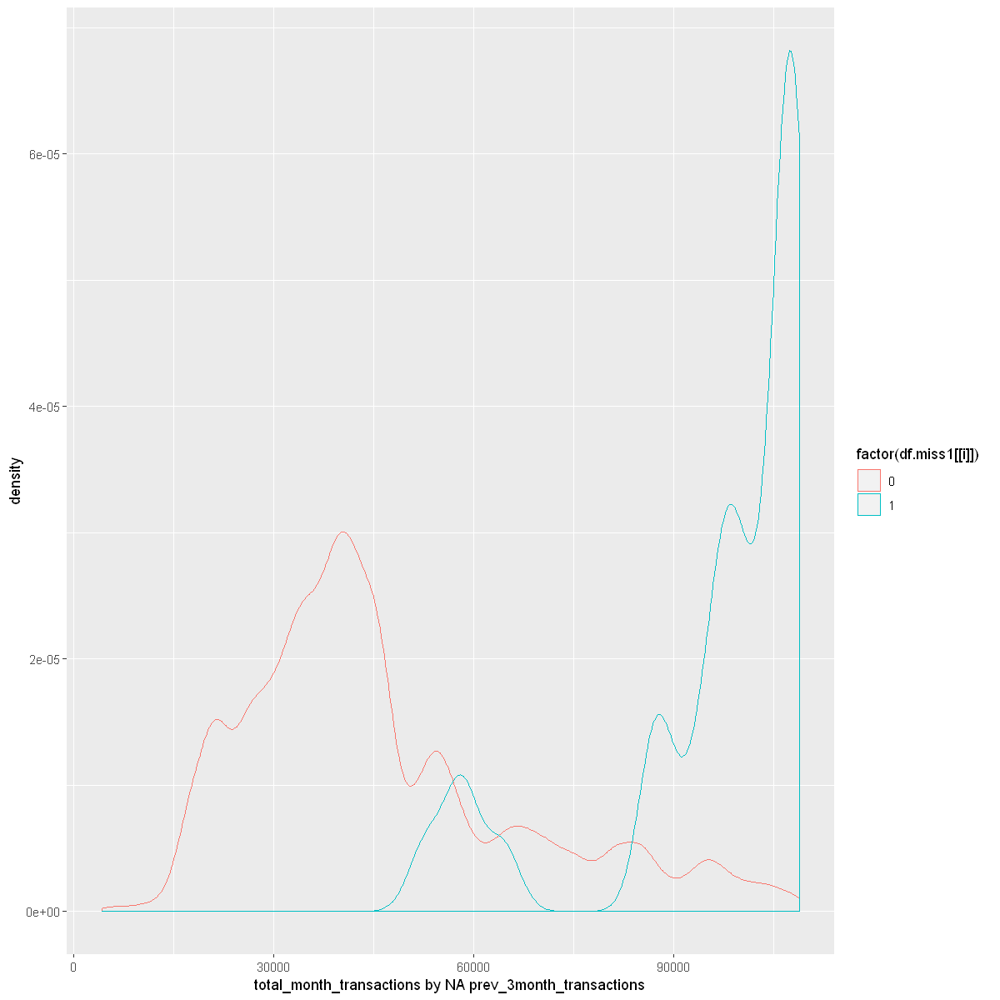


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -876.51, df = 31110, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -53406.15 -53167.83
sample estimates:
mean of x mean of y 
 46542.61  99829.60 

[1] "prev_month_transactions by NA prev_3month_transactions"


Warning message:
"Removed 127777 rows containing non-finite values (stat_density)."


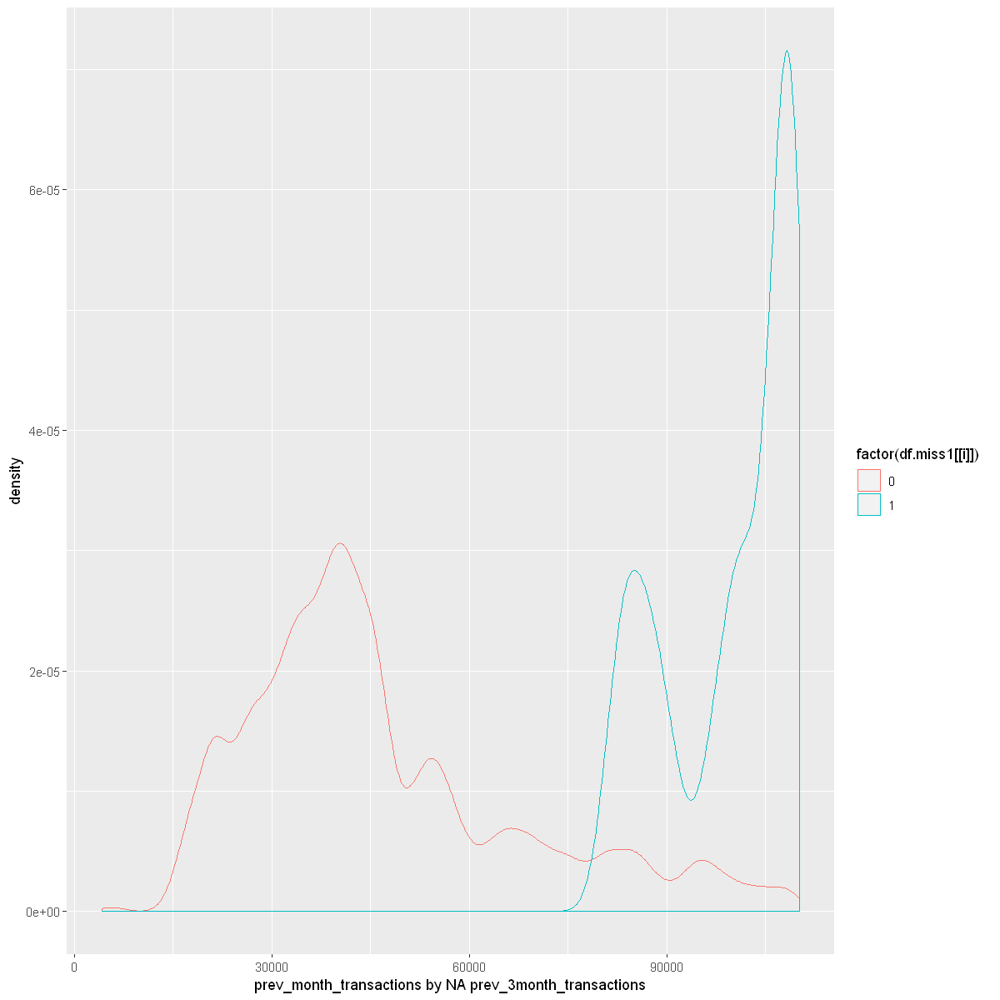


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -817.43, df = 19968, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -50749.17 -50506.37
sample estimates:
mean of x mean of y 
 46292.77  96920.55 

[1] "avg_prev_3months_transactions by NA prev_3month_transactions"


Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


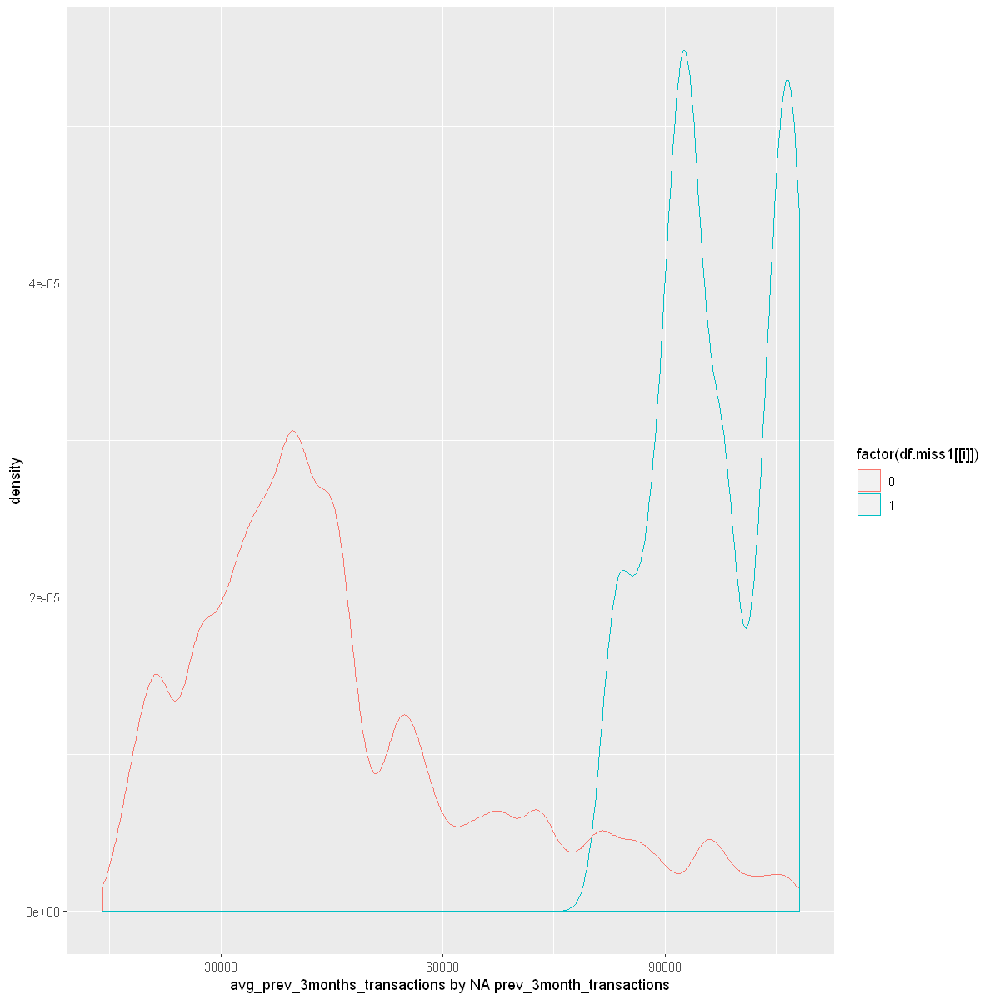


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -343.08, df = 15624, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -40199.48 -39742.75
sample estimates:
mean of x mean of y 
 43254.60  83225.72 

[1] "min_prev_3months_transactions by NA prev_3month_transactions"


Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


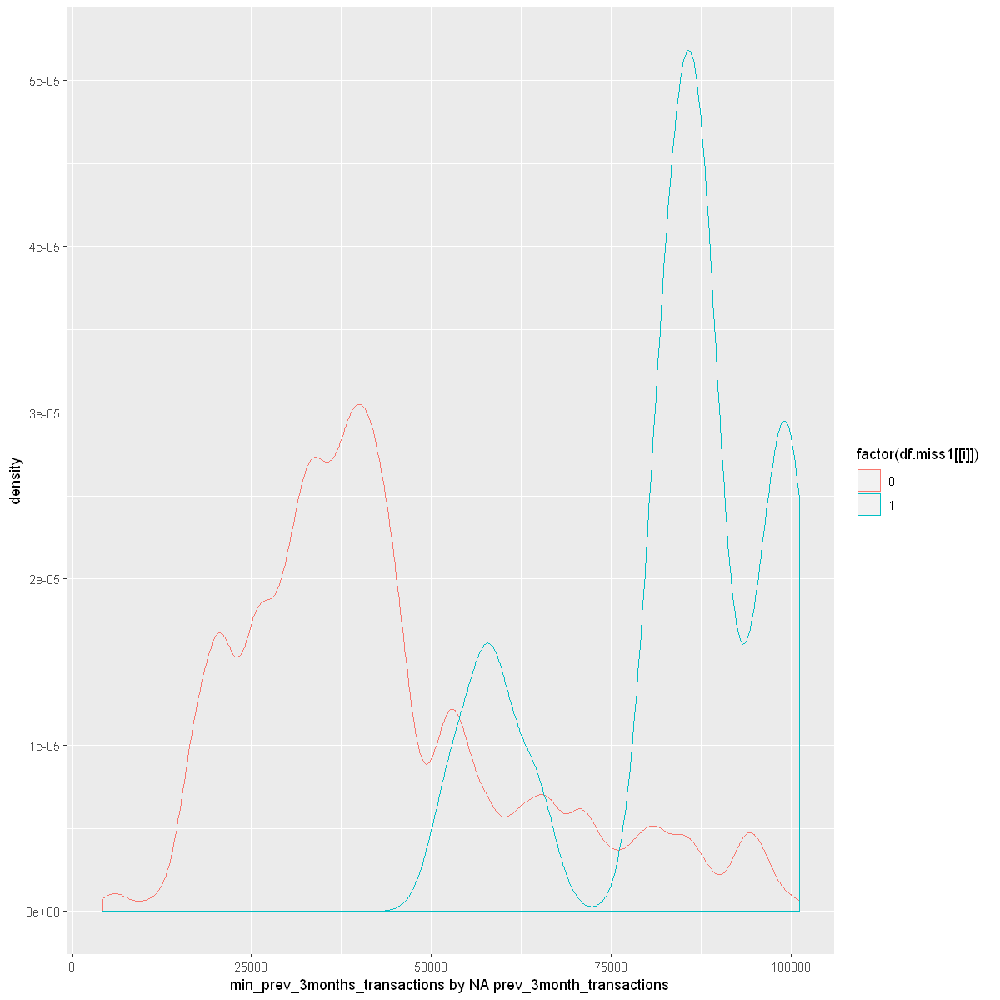


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -1059.1, df = 34081, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -58229.62 -58014.50
sample estimates:
mean of x mean of y 
 48858.05 106980.10 

[1] "max_prev_3months_transactions by NA prev_3month_transactions"


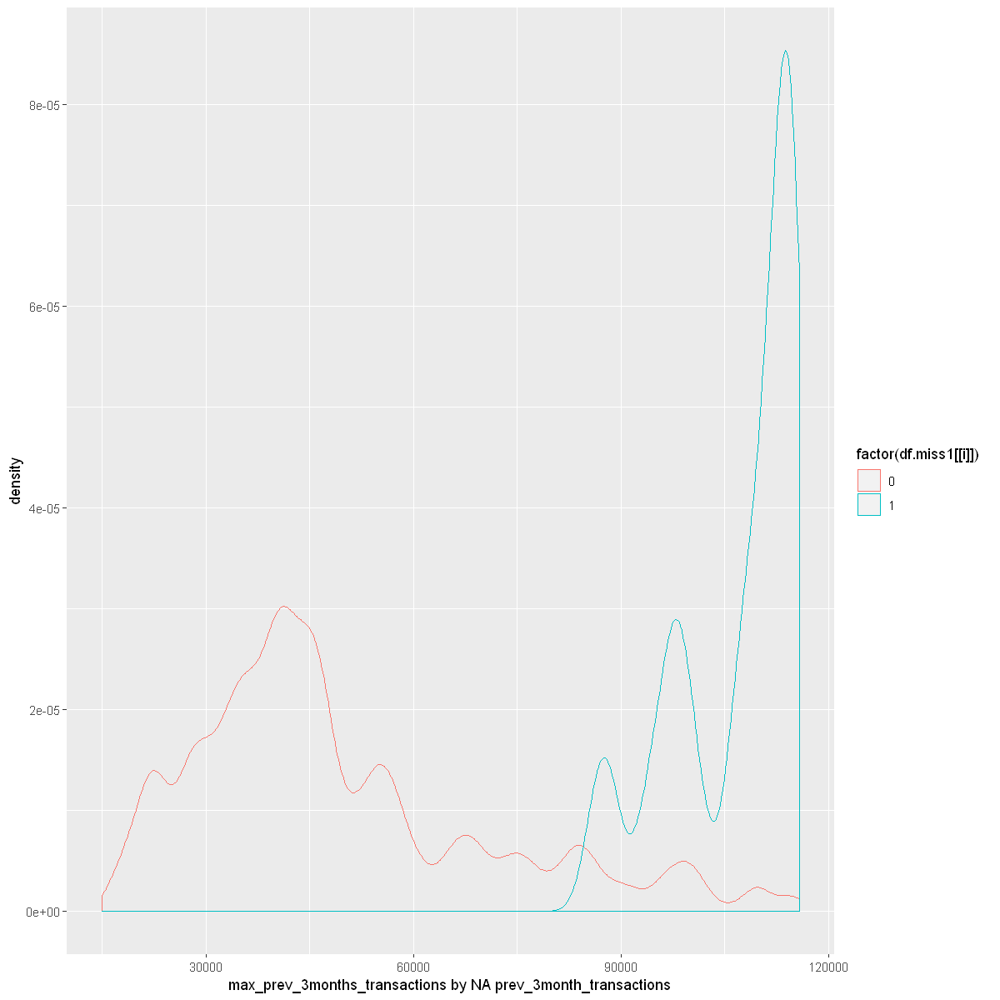


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -134.24, df = 113259, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -292.3654 -283.9507
sample estimates:
mean of x mean of y 
 209.3591  497.5171 

[1] "total_unit_sales by NA prev_3month_transactions"


Warning message:
"Removed 182194 rows containing non-finite values (stat_density)."


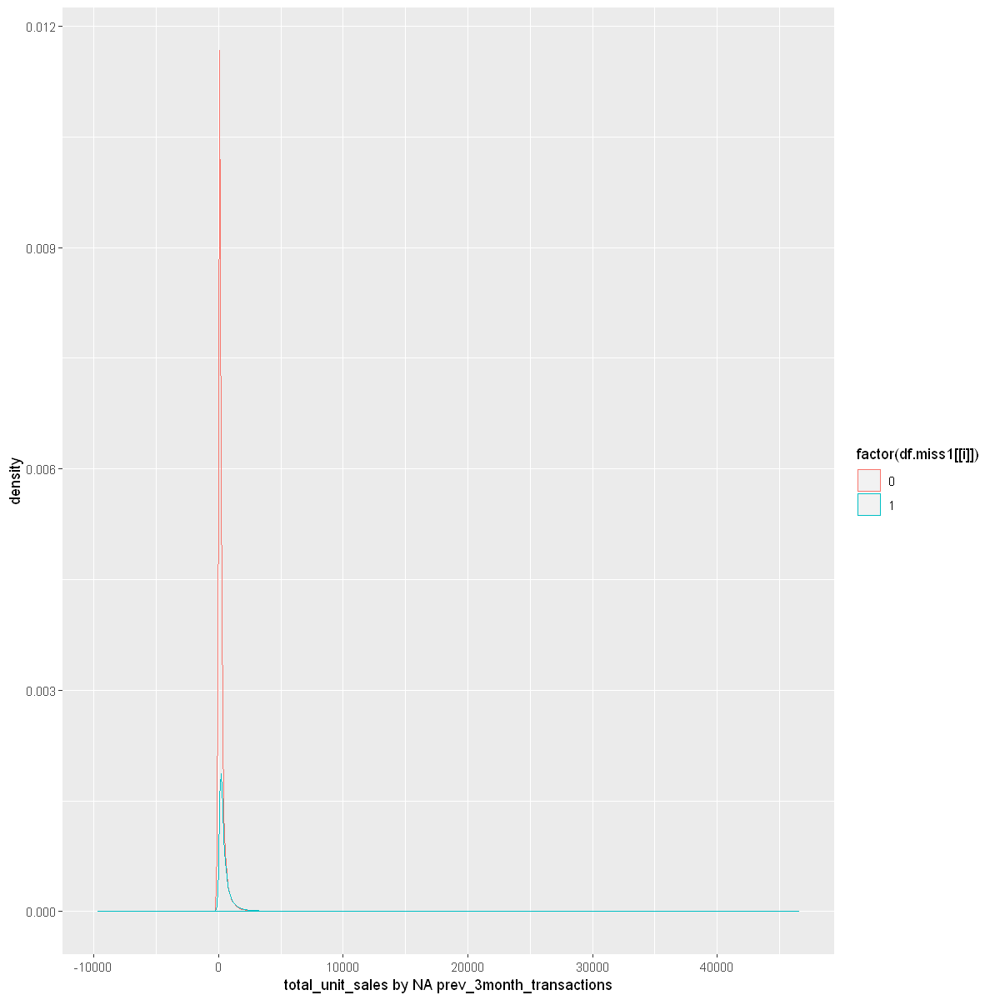


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -249.46, df = 99763, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -109.6650 -107.9551
sample estimates:
mean of x mean of y 
 135.9105  244.7205 

[1] "prev_month_sales by NA avg_prev_3months_transactions"


Warning message:
"Removed 180962 rows containing non-finite values (stat_density)."


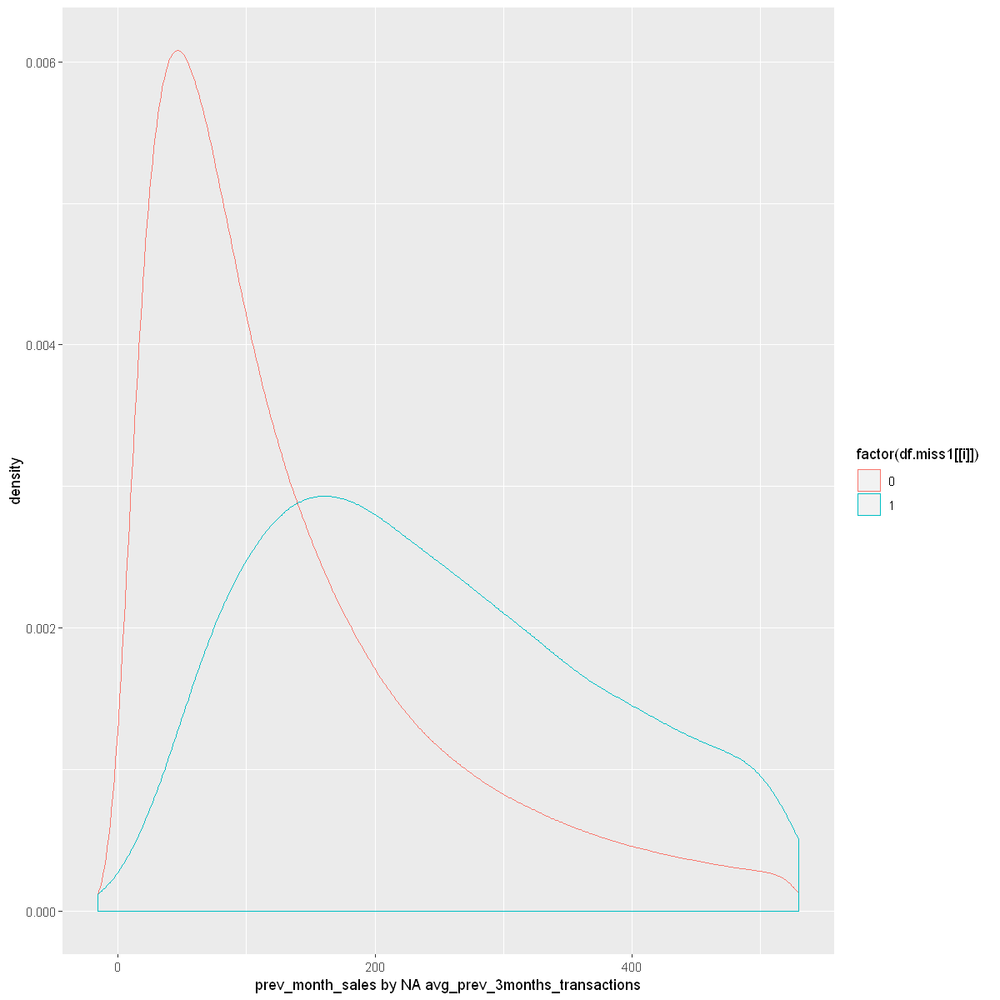


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -247.96, df = 100431, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -109.3119 -107.5974
sample estimates:
mean of x mean of y 
 136.4836  244.9382 

[1] "prev_3month_sales by NA avg_prev_3months_transactions"


Warning message:
"Removed 181824 rows containing non-finite values (stat_density)."


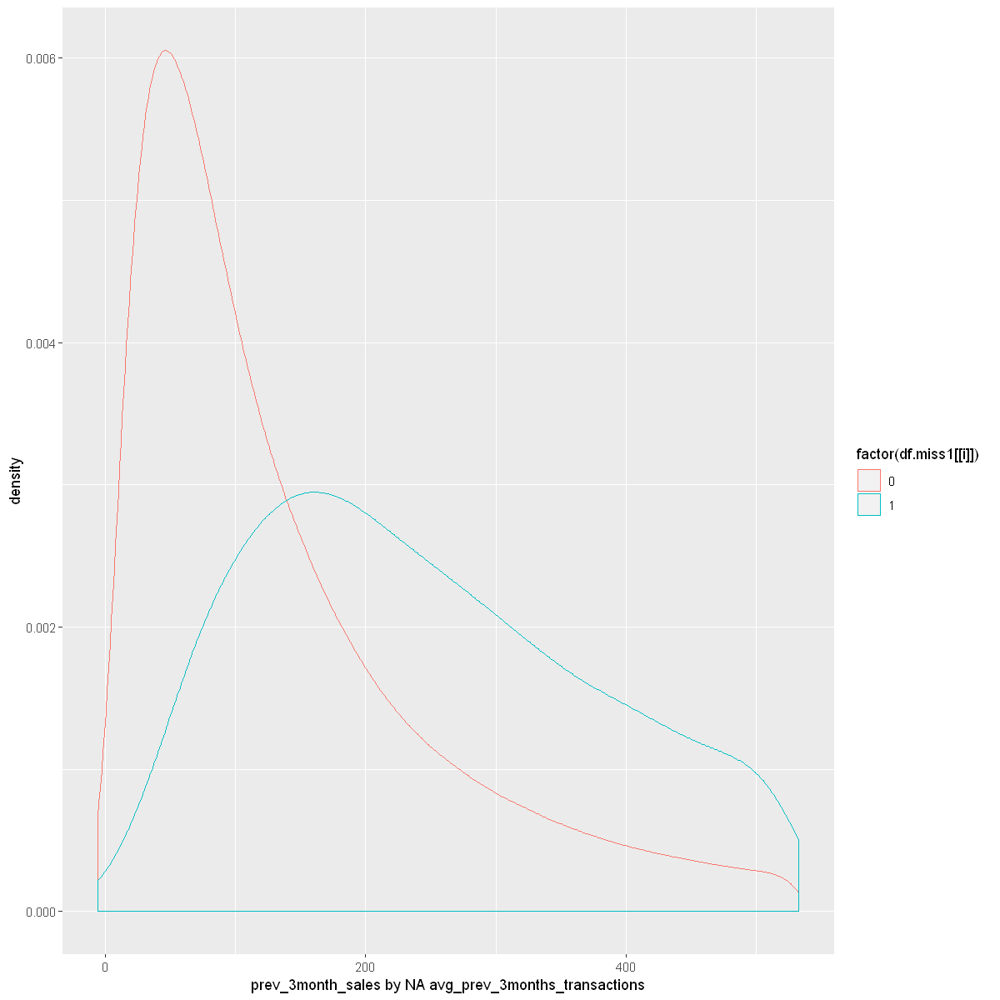


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -260.22, df = 99486, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -112.0603 -110.3849
sample estimates:
mean of x mean of y 
 137.0051  248.2277 

[1] "avg_prev_3months_sales by NA avg_prev_3months_transactions"


Warning message:
"Removed 183073 rows containing non-finite values (stat_density)."


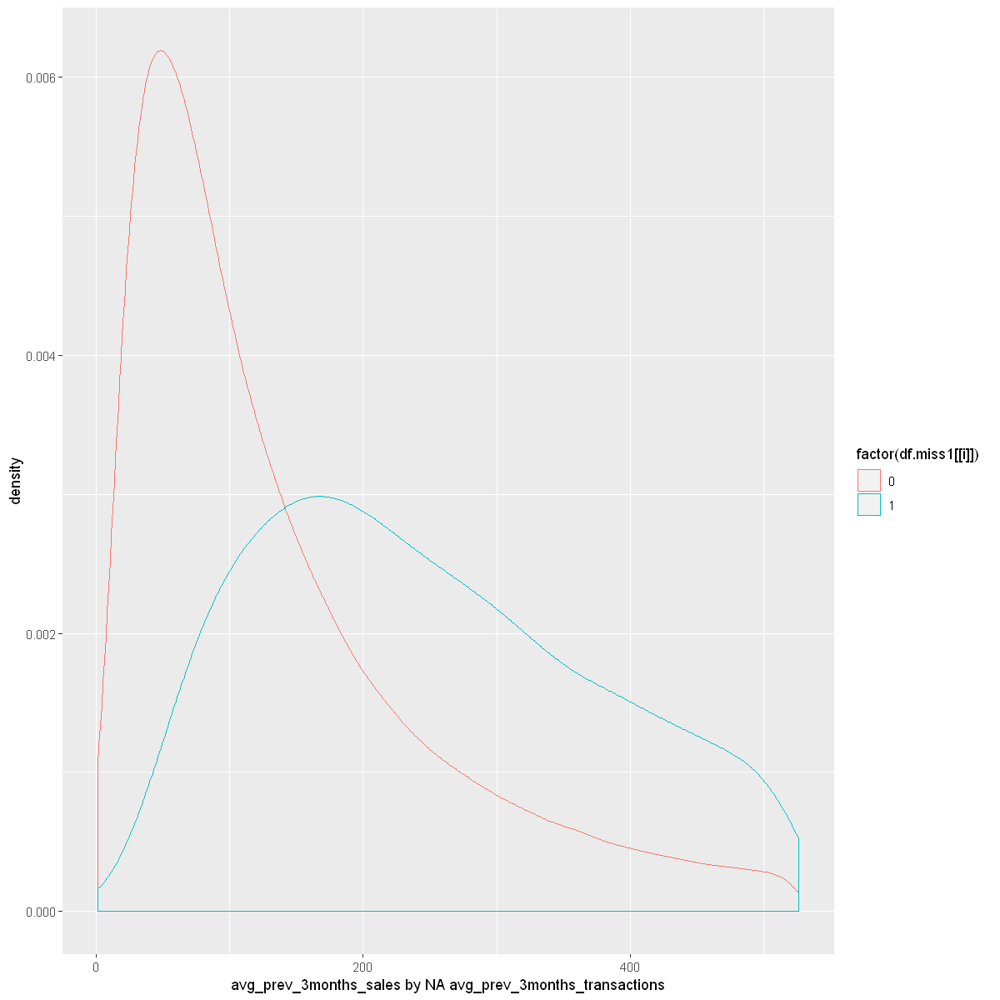


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -245.79, df = 98513, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -91.05220 -89.61152
sample estimates:
mean of x mean of y 
 108.8545  199.1863 

[1] "min_prev_3months_sales by NA avg_prev_3months_transactions"


Warning message:
"Removed 182080 rows containing non-finite values (stat_density)."


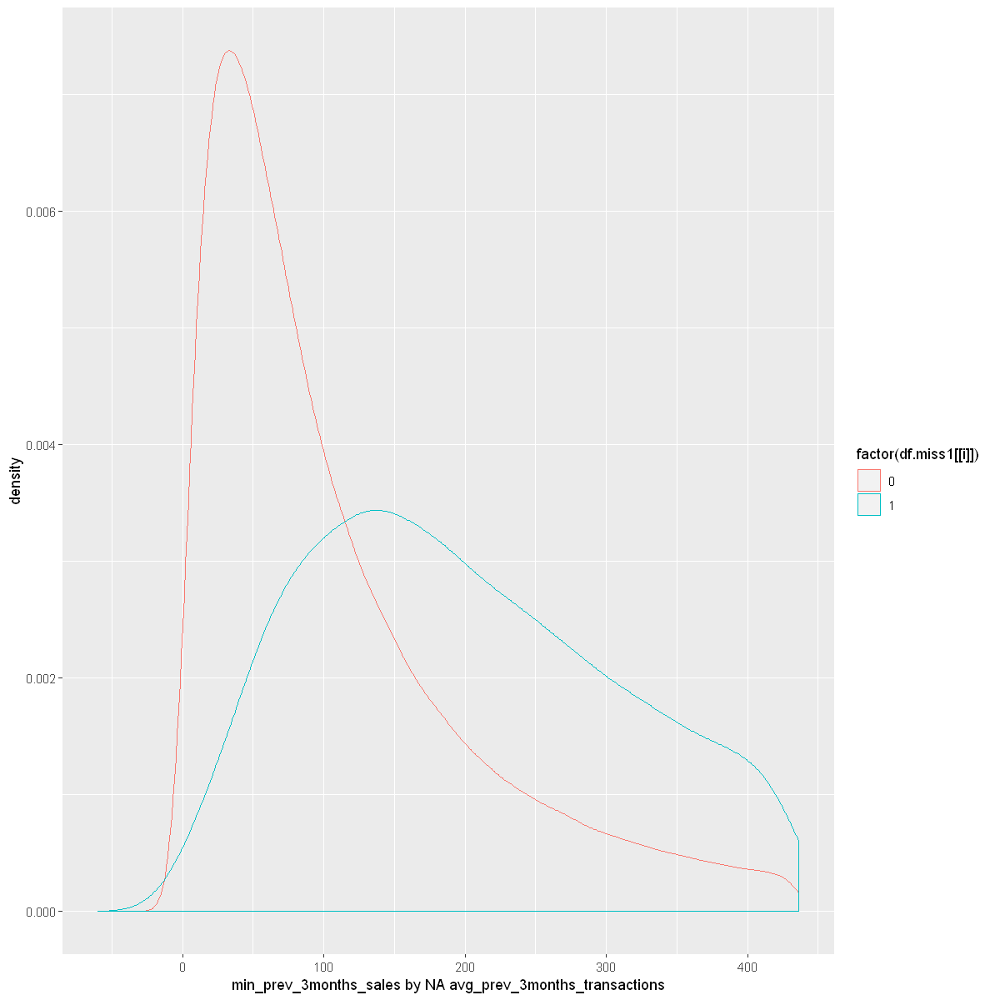


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -256.68, df = 100280, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -130.2284 -128.2547
sample estimates:
mean of x mean of y 
 165.0469  294.2885 

[1] "max_prev_3months_sales by NA avg_prev_3months_transactions"


Warning message:
"Removed 122904 rows containing non-finite values (stat_density)."


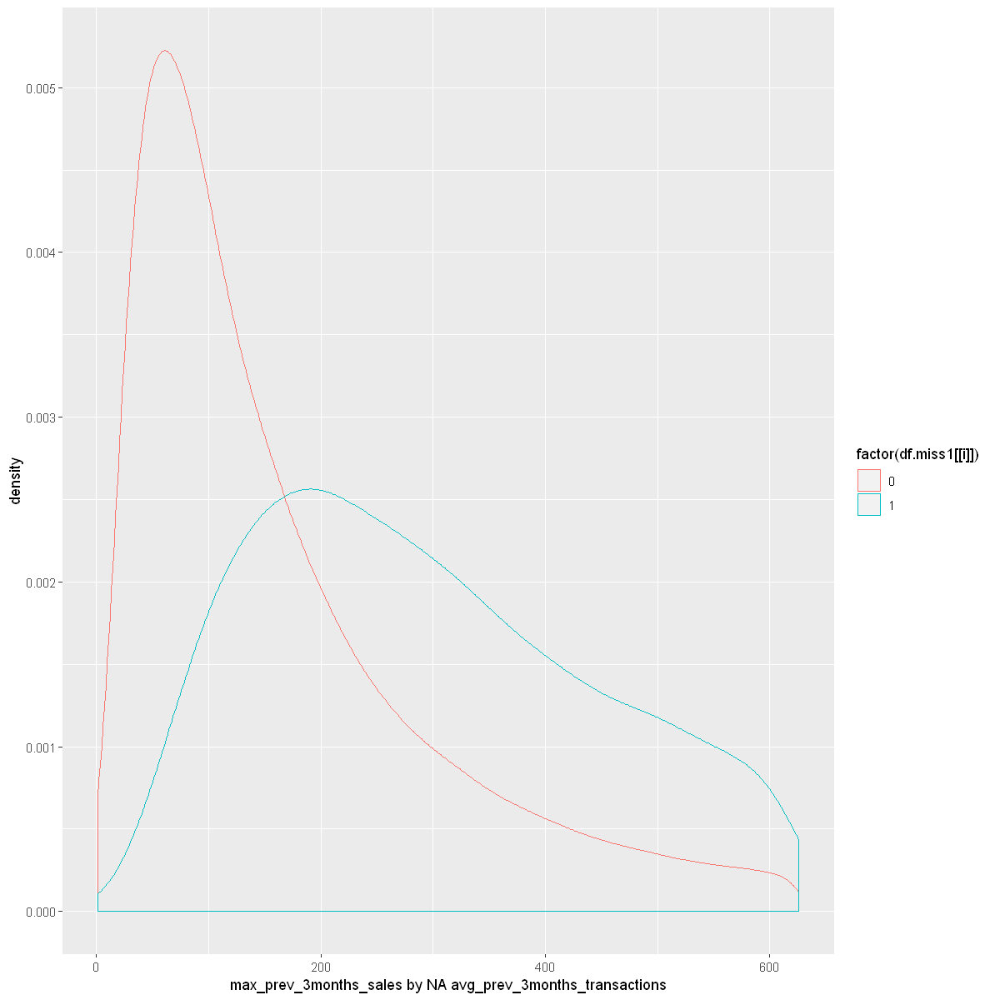


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -912.94, df = 23337, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -57831.22 -57583.43
sample estimates:
mean of x mean of y 
 45934.93 103642.25 

[1] "total_month_transactions by NA avg_prev_3months_transactions"


Warning message:
"Removed 116236 rows containing non-finite values (stat_density)."


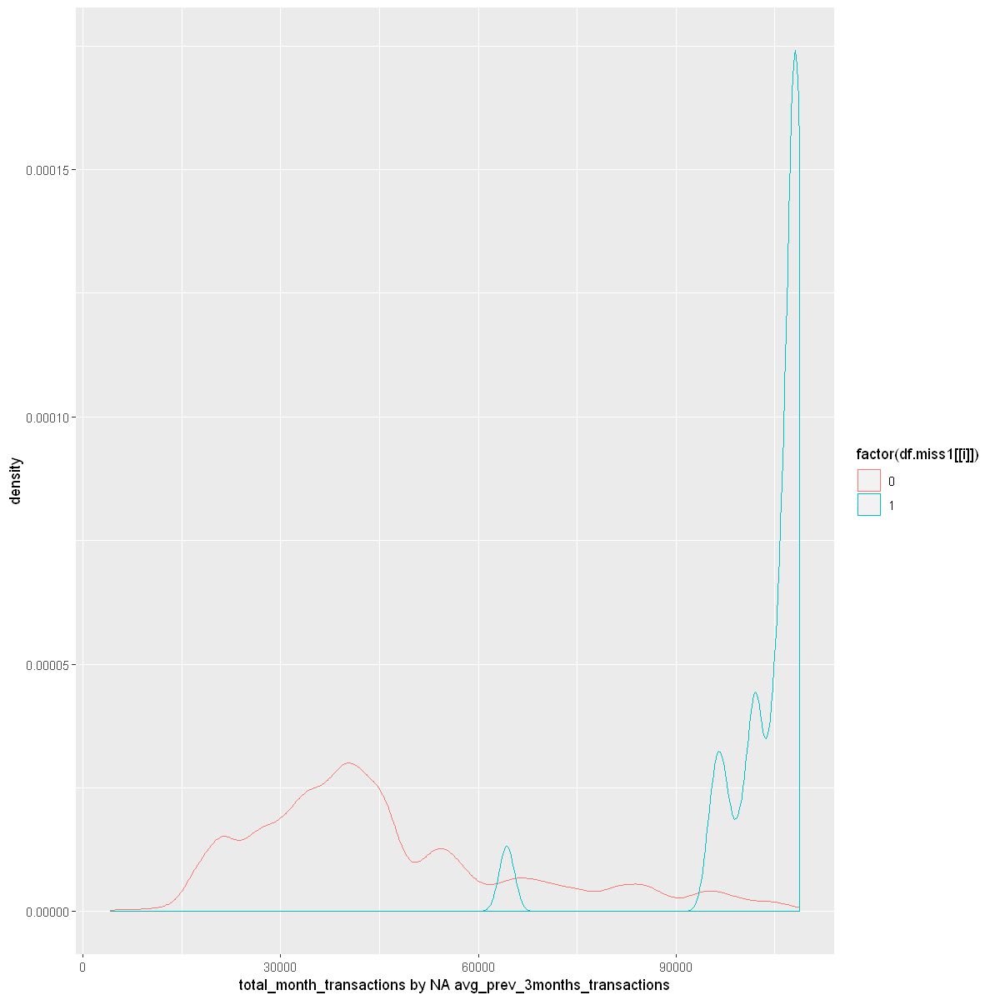


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2470.8, df = 67219, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -60439.49 -60343.67
sample estimates:
mean of x mean of y 
 46518.55 106910.13 

[1] "prev_month_transactions by NA avg_prev_3months_transactions"


Warning message:
"Removed 109840 rows containing non-finite values (stat_density)."


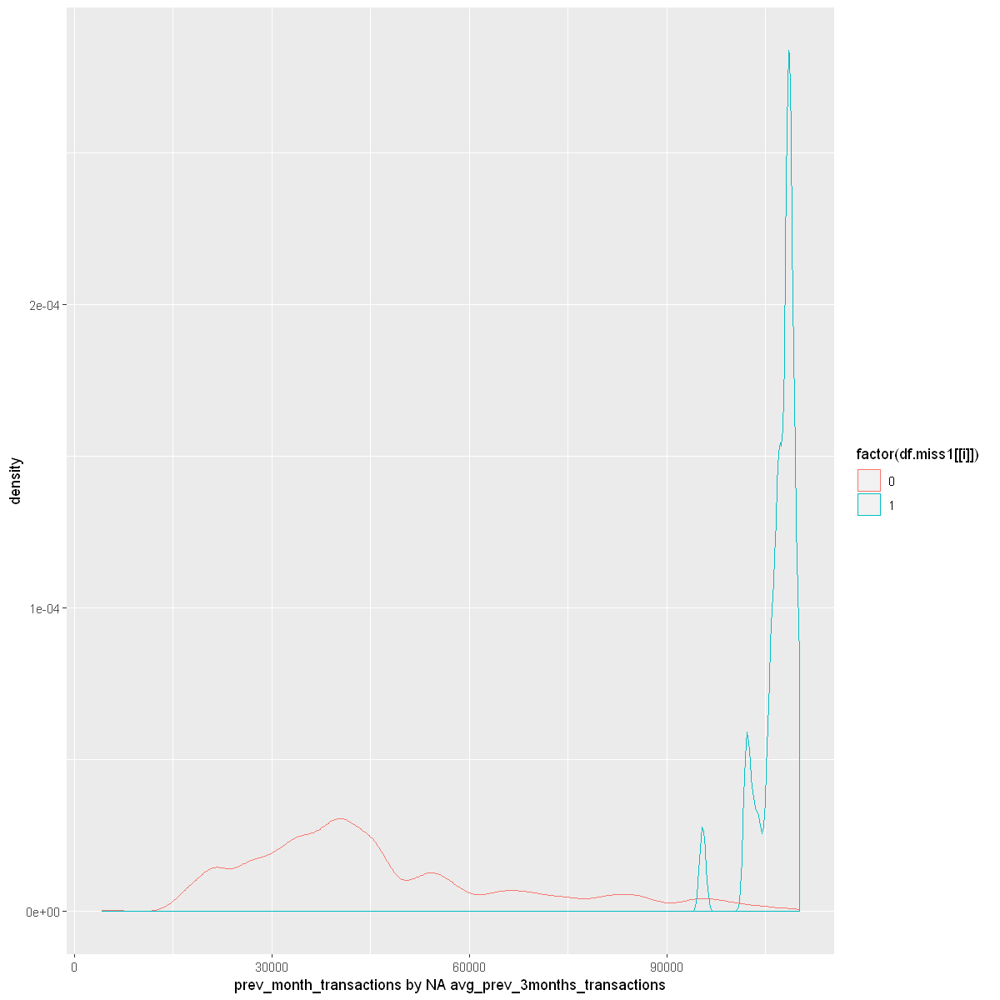


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -2505.4, df = 102440, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -59511.00 -59417.96
sample estimates:
mean of x mean of y 
 46270.86 105735.34 

[1] "prev_3month_transactions by NA avg_prev_3months_transactions"


Warning message:
"Removed 141897 rows containing non-finite values (stat_density)."


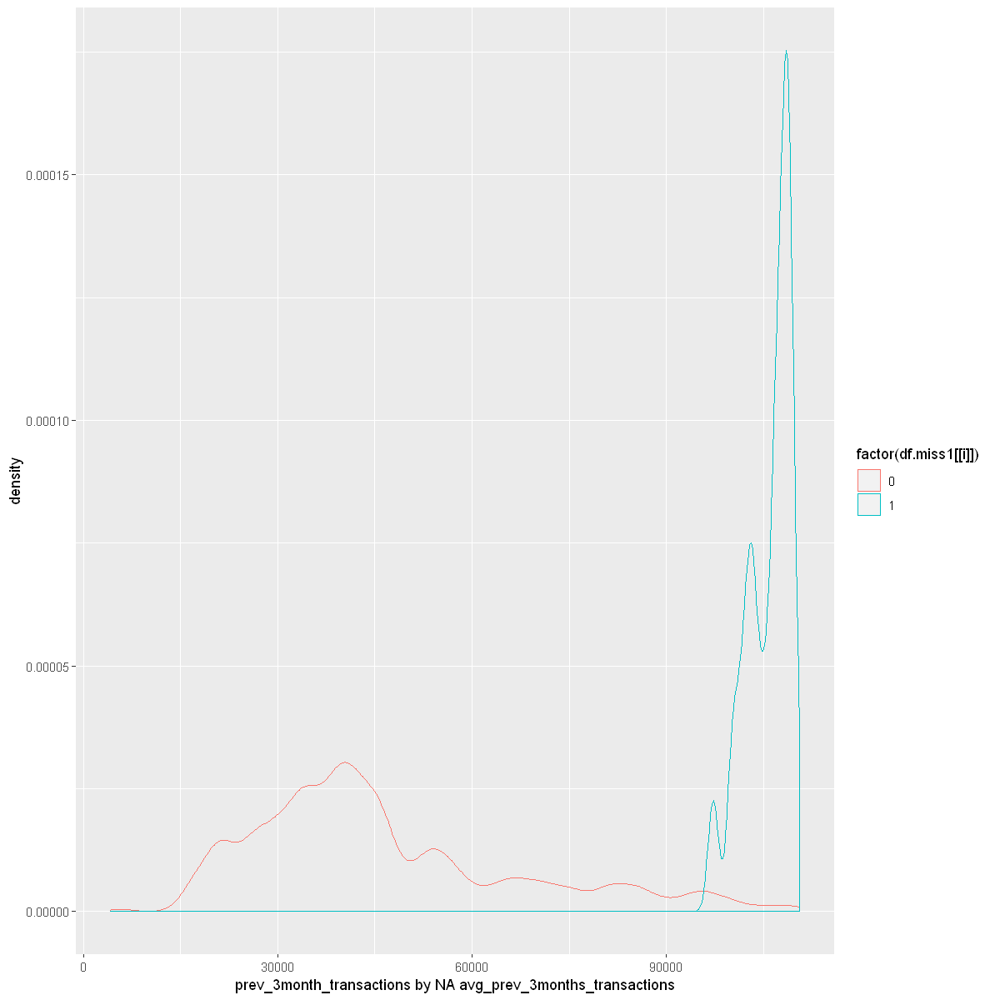


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -353.77, df = 6536.4, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -51214.70 -50650.23
sample estimates:
mean of x mean of y 
 43406.86  94339.32 

[1] "min_prev_3months_transactions by NA avg_prev_3months_transactions"


Warning message:
"Removed 125940 rows containing non-finite values (stat_density)."


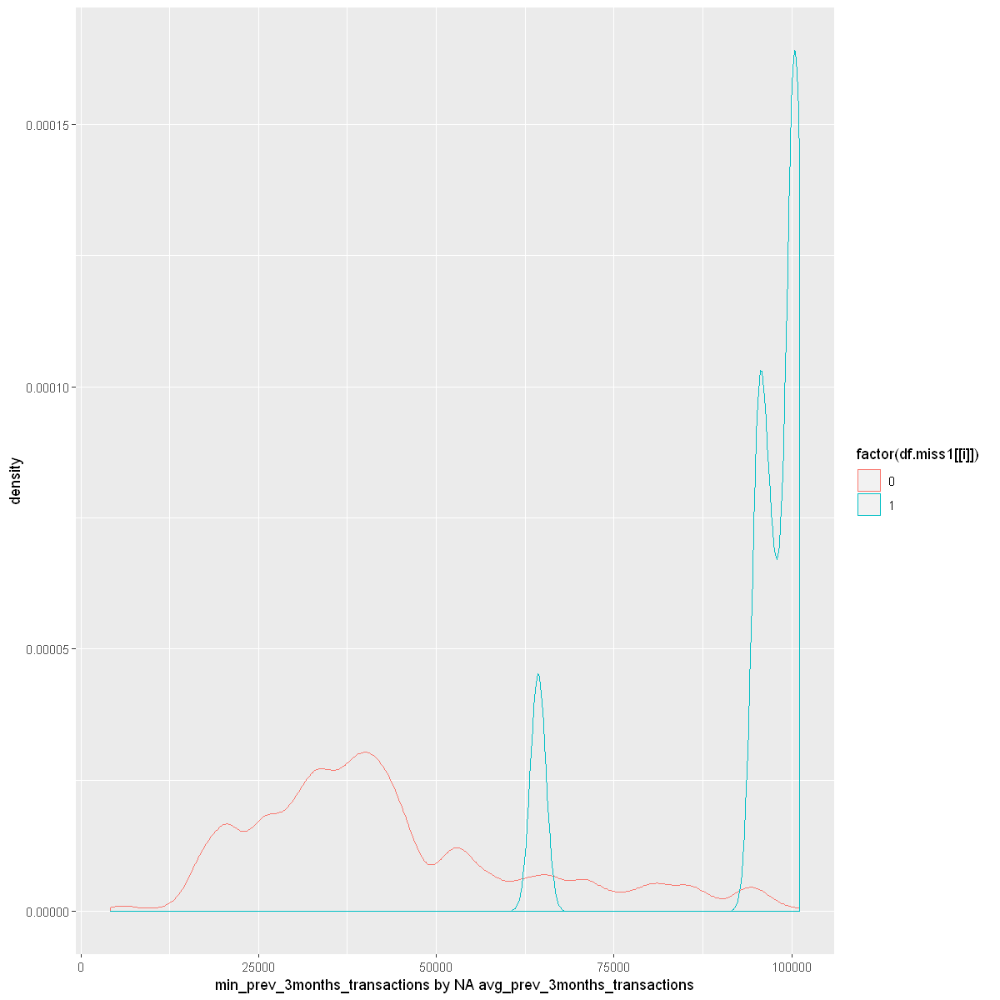


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -3305.9, df = 187038, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -64719.44 -64642.74
sample estimates:
mean of x mean of y 
 48988.37 113669.46 

[1] "max_prev_3months_transactions by NA avg_prev_3months_transactions"


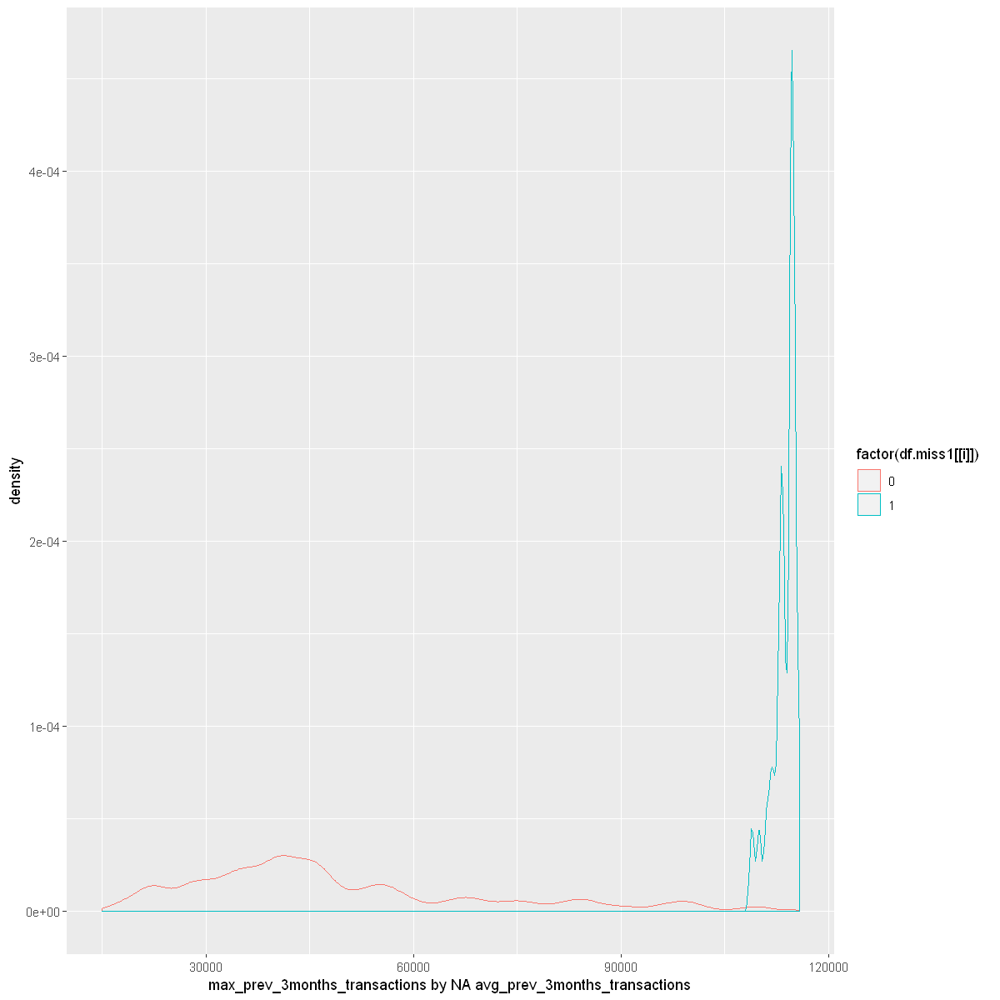


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -151.48, df = 132253, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -306.413 -298.585
sample estimates:
mean of x mean of y 
 205.8146  508.3137 

[1] "total_unit_sales by NA avg_prev_3months_transactions"


Warning message:
"Removed 182194 rows containing non-finite values (stat_density)."


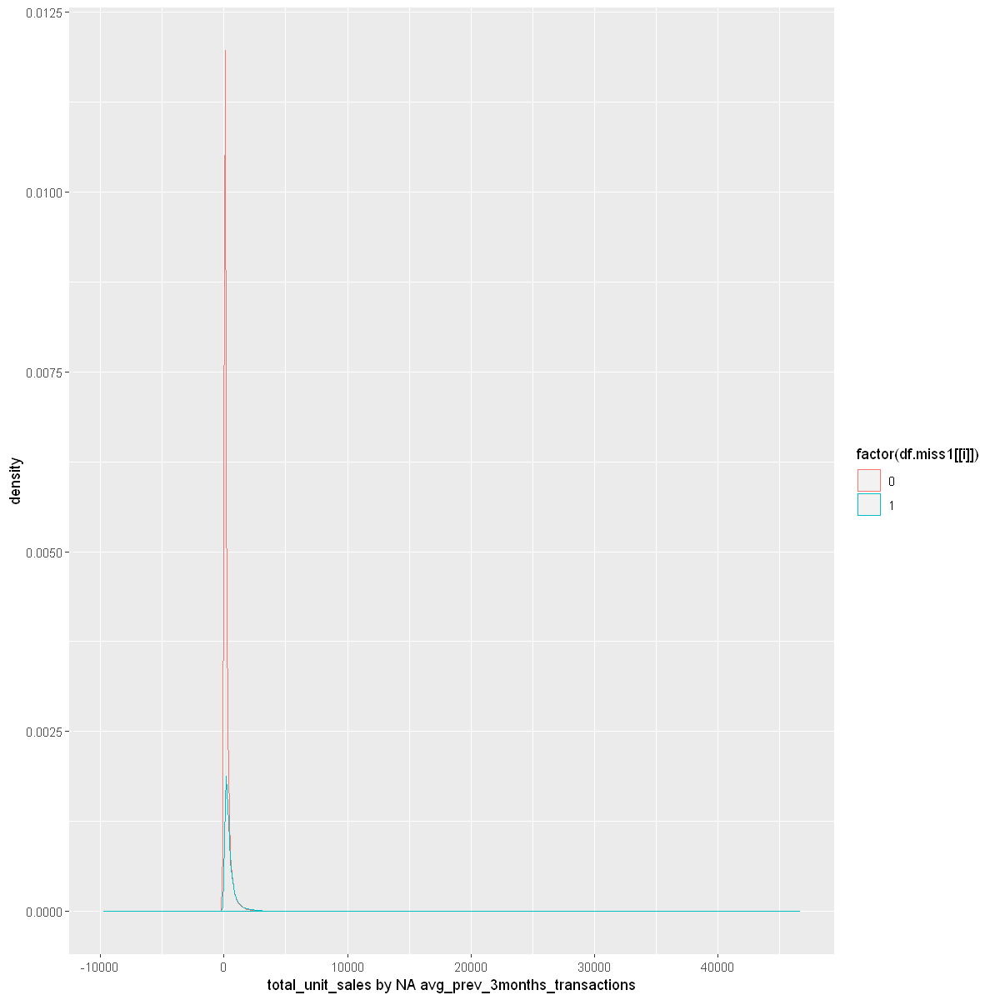


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -264.91, df = 112295, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -110.3106 -108.6903
sample estimates:
mean of x mean of y 
 135.2288  244.7293 

[1] "prev_month_sales by NA min_prev_3months_transactions"


Warning message:
"Removed 180962 rows containing non-finite values (stat_density)."


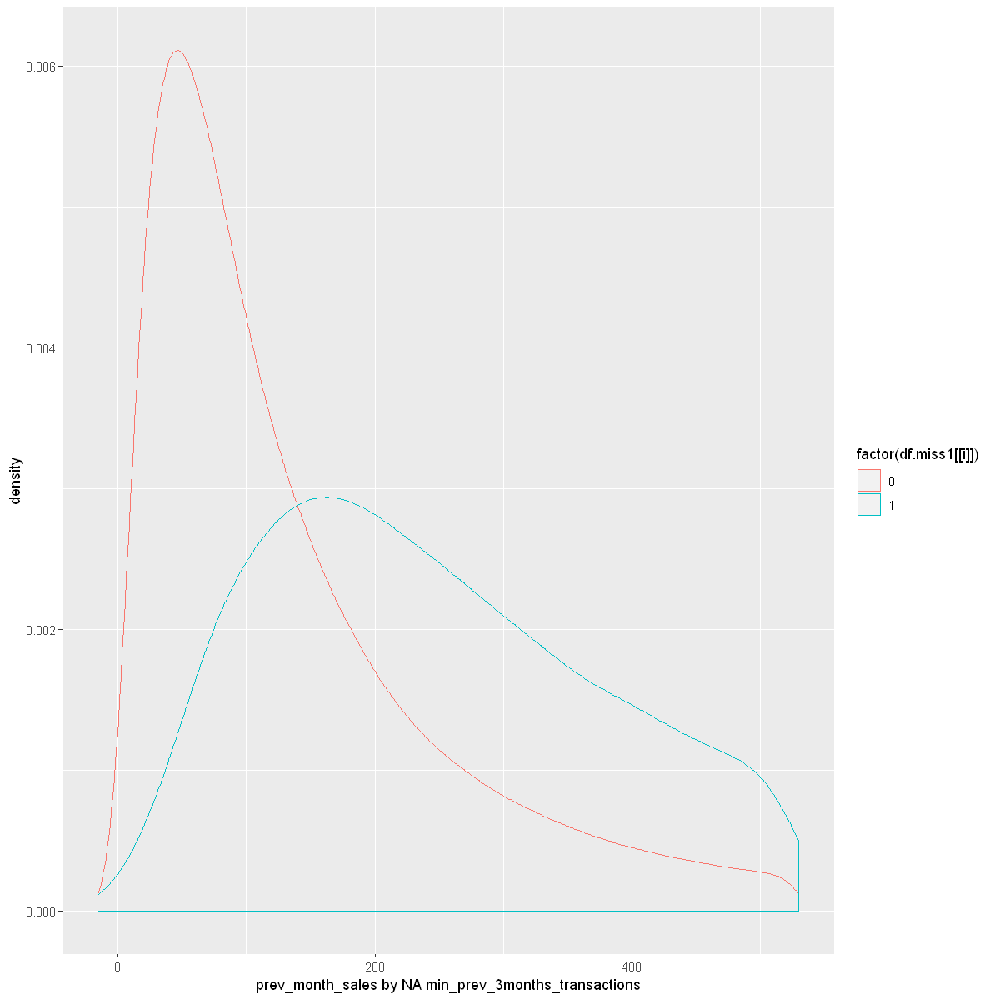


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -264.74, df = 112662, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -110.7893 -109.1609
sample estimates:
mean of x mean of y 
 135.7714  245.7465 

[1] "prev_3month_sales by NA min_prev_3months_transactions"


Warning message:
"Removed 181824 rows containing non-finite values (stat_density)."


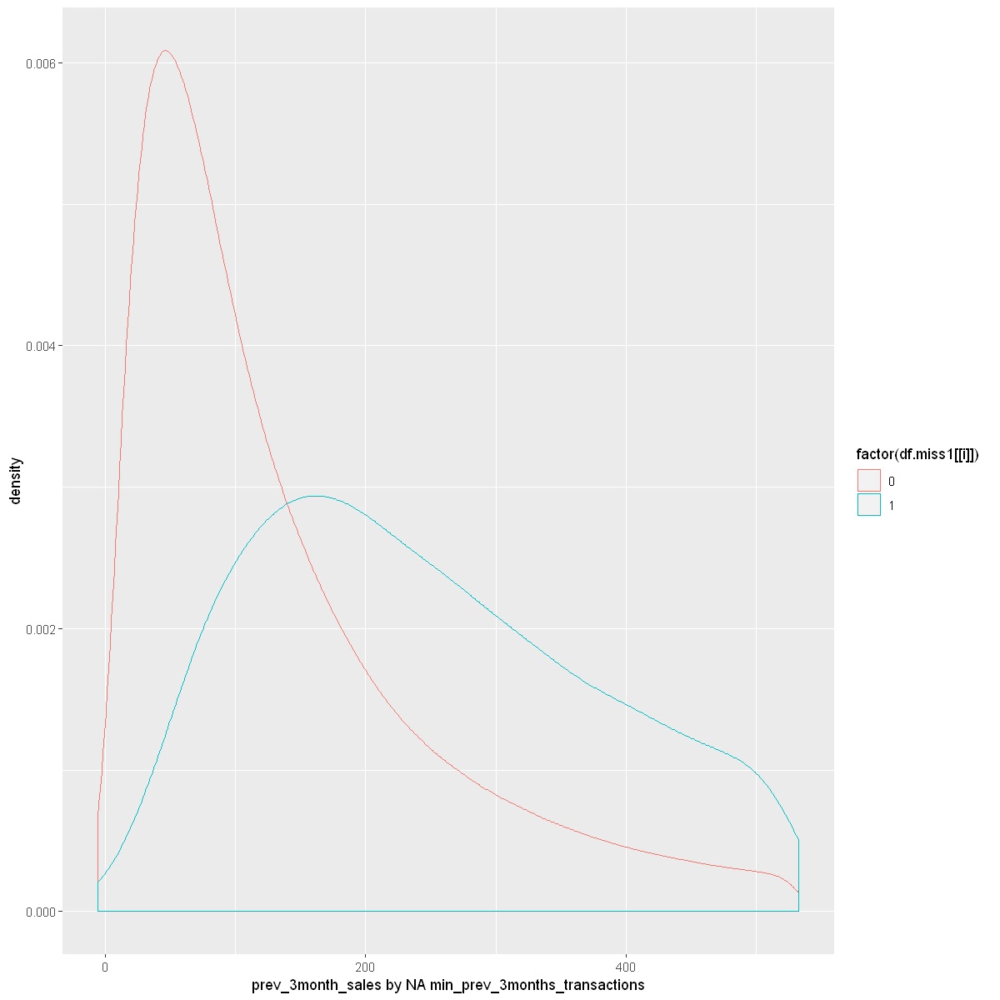


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -276.55, df = 111861, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -112.8779 -111.2891
sample estimates:
mean of x mean of y 
 136.3091  248.3926 

[1] "avg_prev_3months_sales by NA min_prev_3months_transactions"


Warning message:
"Removed 183073 rows containing non-finite values (stat_density)."


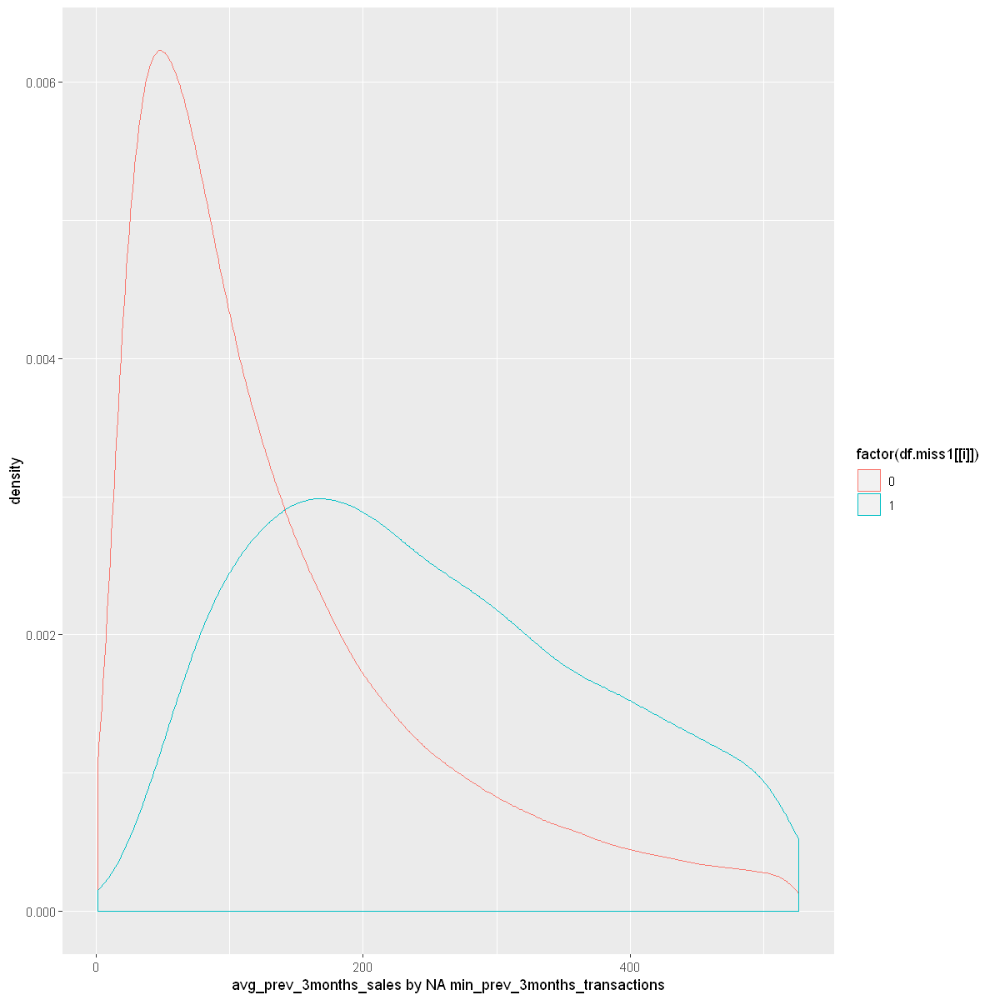


	Welch Two Sample t-test

data:  b1[[j]] and b2[[j]]
t = -263.6, df = 110270, p-value < 2.2e-16
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -92.75864 -91.38943
sample estimates:
mean of x mean of y 
 108.2519  200.3260 

[1] "min_prev_3months_sales by NA min_prev_3months_transactions"


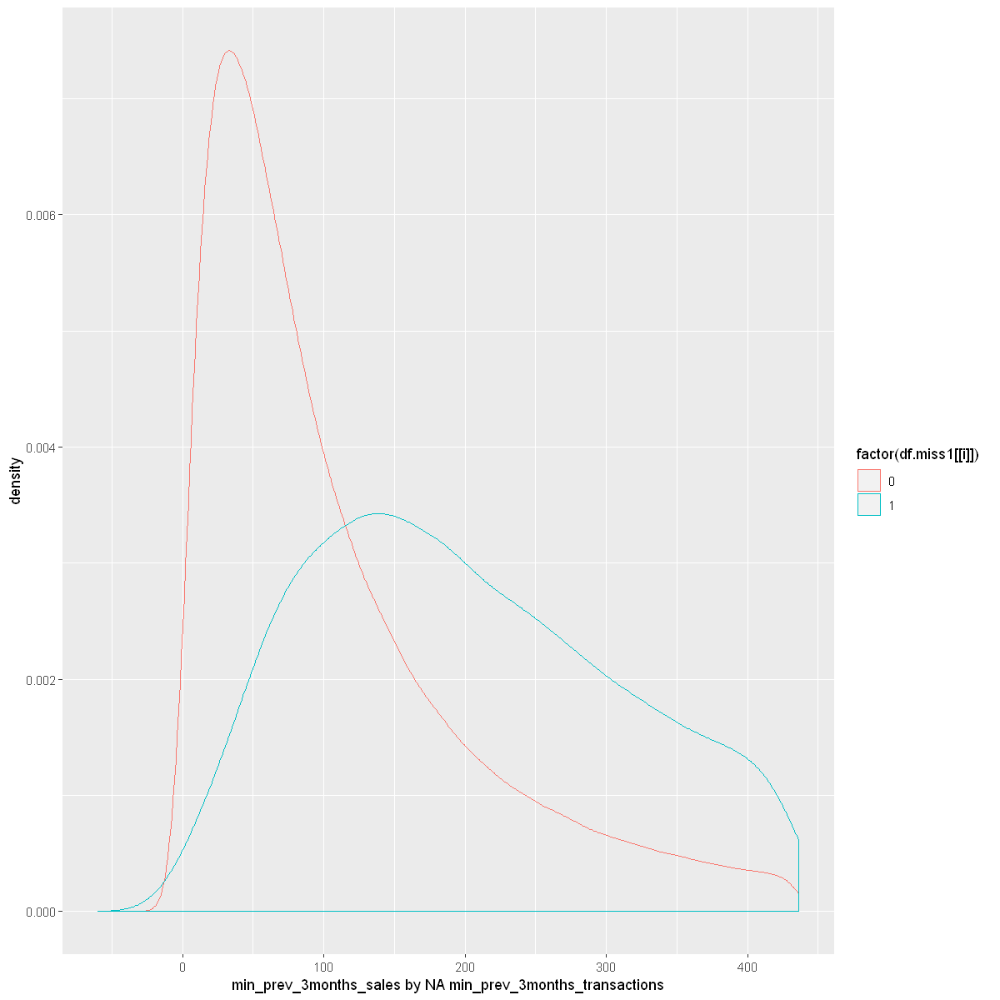

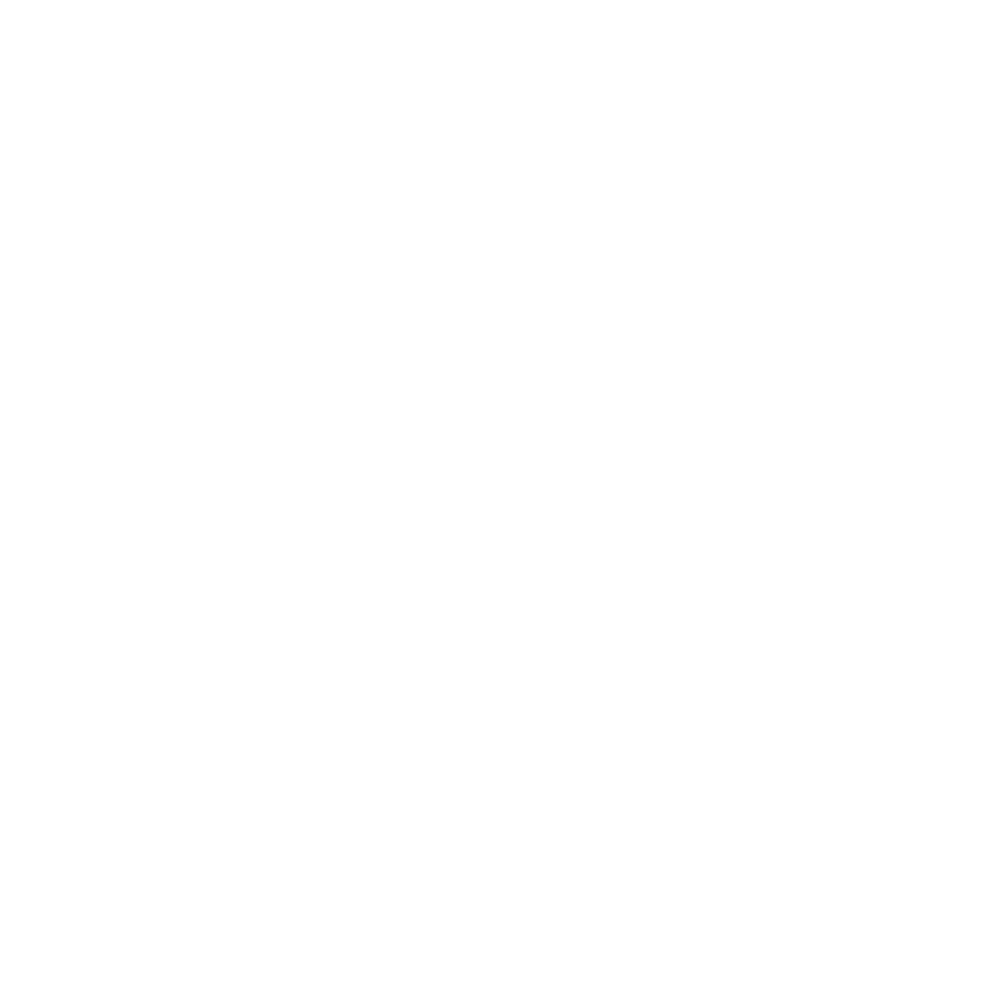

In [29]:
options(repr.plot.width=10,repr.plot.height=10)
par(mfrow=c(2,2))
for (i in l1){
    for (j in c(l1,'total_unit_sales')){
        if (i!=j) {
        print(ggplot(df.noout,aes(x=df.noout[[j]], group=factor(df.miss1[[i]]),
                             color=factor(df.miss1[[i]]))) +
geom_density(adjust=2)+labs(x=paste(j,'by NA',i,sep=' ')))
         b1<- df.noout %>% select(j,i) %>% filter(df.miss1[i]==0)  
         b2<-df.noout %>% select(j,i) %>% filter(df.miss1[i]==1) 
         print(t.test(b1[[j]],b2[[j]]))  
         print(paste(j,'by NA',i,sep=' '))
       }
    }
}

In [31]:
l1 <- l1[c(1:11)]

In [95]:
l1

[1] "prev_month_sales"              "prev_3month_sales"            
 [3] "avg_prev_3months_sales"        "min_prev_3months_sales"       
 [5] "max_prev_3months_sales"        "total_month_transactions"     
 [7] "prev_month_transactions"       "prev_3month_transactions"     
 [9] "avg_prev_3months_transactions" "min_prev_3months_transactions"
[11] "max_prev_3months_transactions"

In [36]:
df.noout <- as.data.frame(df.noout)

In [93]:
c('prev_month_sales', 'prev_3month_sales', 'avg_prev_3months_sales', 'min_prev_3months_sales', 'max_prev_3months_sales',
'total_month_transactions', 'prev_month_transactions', 'prev_3month_transactions', 'avg_prev_3months_transactions',
       'min_prev_3month_transactions', 'max_prev_3month_transactions','total_month_onpromotion')

[1] "prev_month_sales"              "prev_3month_sales"            
 [3] "avg_prev_3months_sales"        "min_prev_3months_sales"       
 [5] "max_prev_3months_sales"        "total_month_transactions"     
 [7] "prev_month_transactions"       "prev_3month_transactions"     
 [9] "avg_prev_3months_transactions" "min_prev_3month_transactions" 
[11] "max_prev_3month_transactions"  "total_month_onpromotion"

In [33]:
head(df.noout[ ,l1])

,prev_month_sales,prev_3month_sales,avg_prev_3months_sales,min_prev_3months_sales,max_prev_3months_sales,total_month_transactions,prev_month_transactions,prev_3month_transactions,avg_prev_3months_transactions,min_prev_3months_transactions,max_prev_3months_transactions
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,46,53,58.66667,44,86,46740,45299,47471,44208.67,40587,46740
2,44,86,44.66667,44,46,46286,46740,40587,46108.33,45299,46740
3,44,46,45.00000,44,47,44876,46286,45299,45967.33,44876,46740
4,47,44,40.00000,29,47,47874,44876,46740,46345.33,44876,47874
5,29,44,38.00000,29,47,45789,47874,46286,46179.67,44876,47874
6,38,47,38.66667,29,49,44540,45789,44876,46067.67,44540,47874


In [47]:
df.noout

ERROR: Error in eval(expr, envir, enclos): object 'df.noout' not found


3.2.2 table of the missingness mechanism 

In [96]:
na_treat

Feature_name,Scale,Missing.Mechanism,NA.Treatment,why
<fct>,<fct>,<fct>,<fct>,<fct>
prev_month_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
prev_3month_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
avg_prev_3months_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
min_prev_3months_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
max_prev_3months_sales,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
total_month_transactions,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
prev_month_transactions,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
prev_3month_transactions,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster
avg_prev_3month_transactions,ratio,MNAR,remove rows,Decision which has takes sfter looking at the NA's cluster


In [100]:
head(df3)

,id,item_nbr,store_nbr,Year,month,city,state,store_type,store_cluster,prev_month_sales,...,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17,total_unit_sales
,<int>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
1,1,1003679,1,2013,4,Quito,Pichincha,D,13,3.850148,...,0,0,0,0,1,0,0,0,0,3.806662
2,2,1003679,1,2013,5,Quito,Pichincha,D,13,3.806662,...,0,0,0,0,1,0,0,0,0,3.806662
3,3,1003679,1,2013,6,Quito,Pichincha,D,13,3.806662,...,0,0,0,0,1,0,0,0,0,3.871201
4,4,1003679,1,2013,7,Quito,Pichincha,D,13,3.871201,...,0,0,0,0,1,0,0,0,0,3.401197
5,5,1003679,1,2013,8,Quito,Pichincha,D,13,3.401197,...,0,0,0,0,1,0,0,0,0,3.663562
6,6,1003679,1,2013,9,Quito,Pichincha,D,13,3.663562,...,0,0,0,0,1,0,0,0,0,3.912023


In [101]:
dim(df3)

[1] 1737726      85

3.3.3 imputtion technique

because all of the missing values are MNAR i can't do an imputation.
At features with less than 5 percent missing values i decided to remove the rows. 
some of the features with more than 5% missing will be categorized and some of them will be removed from the data.
regarding the features with Nominal scales which have missing values, the missing values will be categorized.


Categorization of missing values

4 - Repeat the EDA to ensure that everything is Ok and the dataset is ready for model generation

In this phase, we have to make the following steps:

Descriptive Statistics
Data visualization

In [108]:
nf1<- c()
for (v in names(df3)){
    if ((!v %in% c('Year','month','store_nbr','item_nbr'))&(is.numeric(df3[[v]])==T)&
        (max(df3[[v]],na.rm=T)>1 & length(unique(df3[[v]]))>3))  {
        nf1<- c(nf1,v)
    } 
}

In [109]:
nf1

[1] "id"                            "prev_month_sales"             
 [3] "prev_3month_sales"             "avg_prev_3months_sales"       
 [5] "min_prev_3months_sales"        "max_prev_3months_sales"       
 [7] "monthly_oilprice_avg"          "total_month_holidays"         
 [9] "total_month_transactions"      "prev_month_transactions"      
[11] "prev_3month_transactions"      "avg_prev_3months_transactions"
[13] "min_prev_3months_transactions" "max_prev_3months_transactions"
[15] "total_city_sales"              "sales_perc"                   
[17] "total_unit_sales"

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


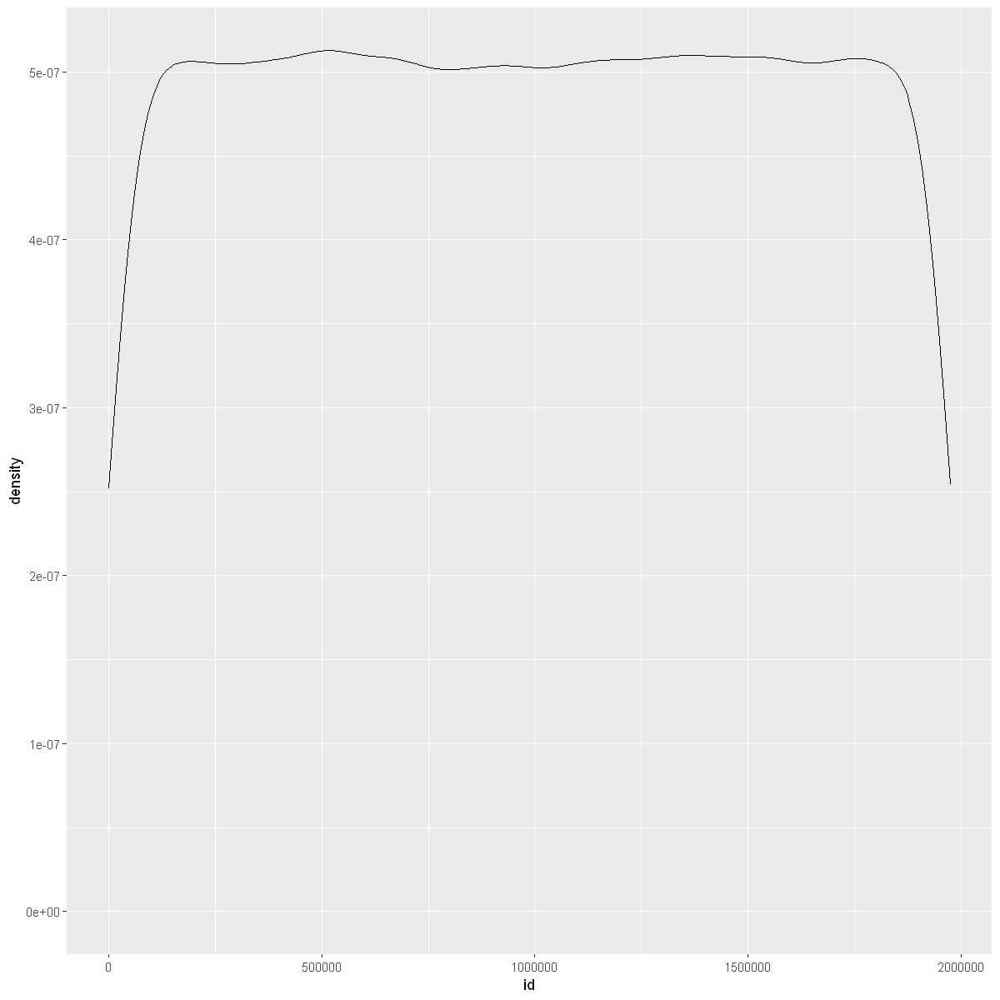

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


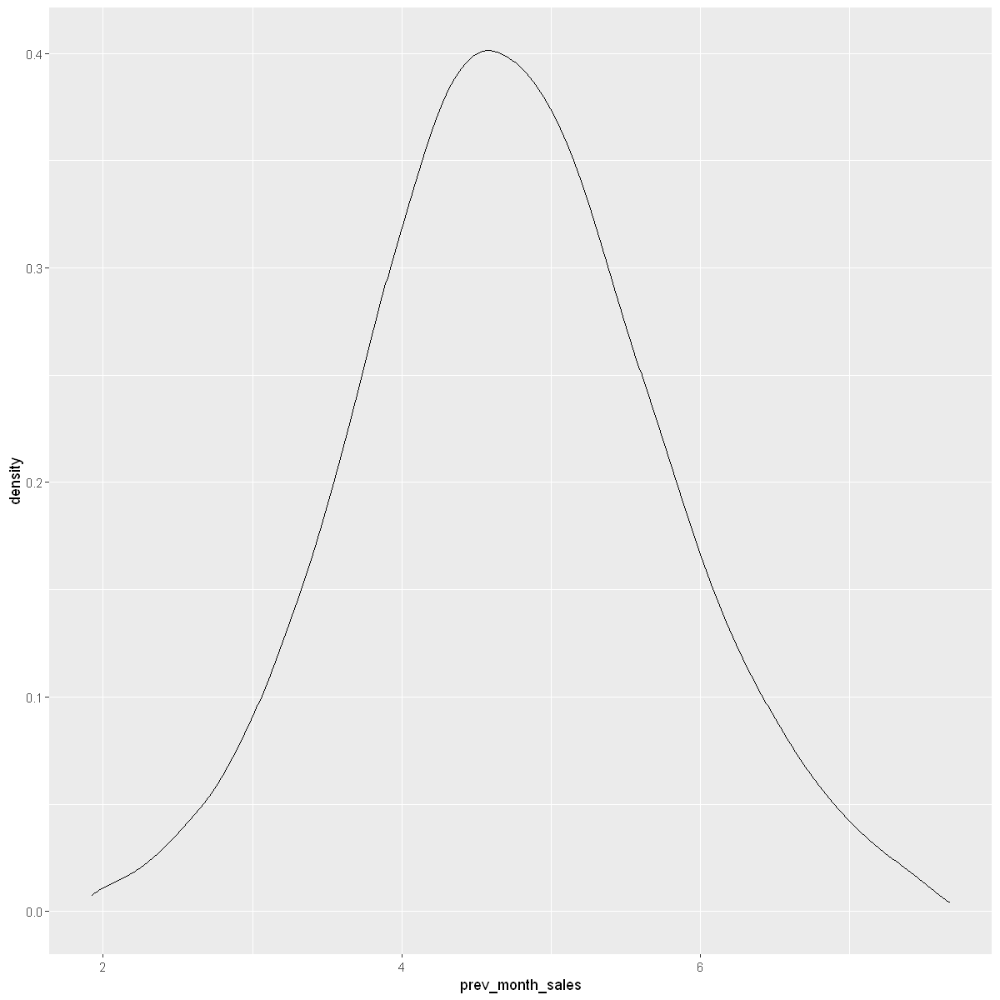

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


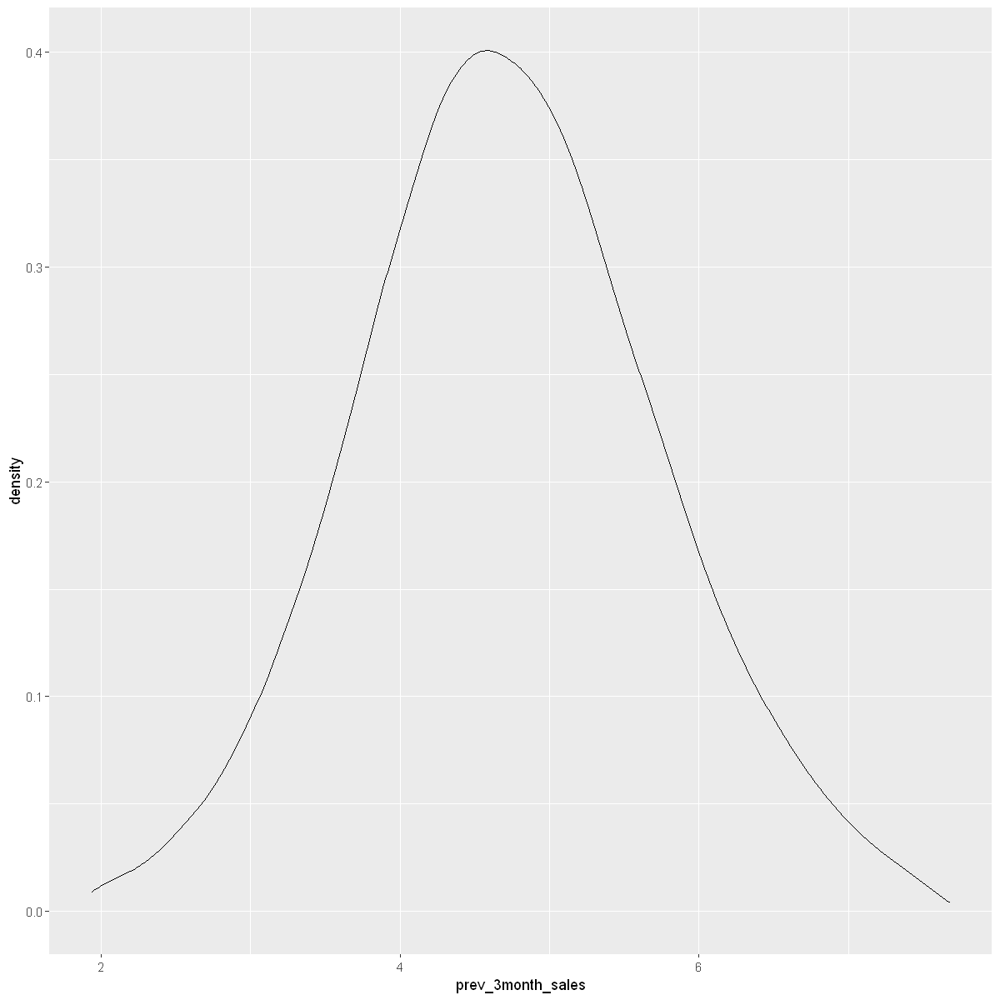

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


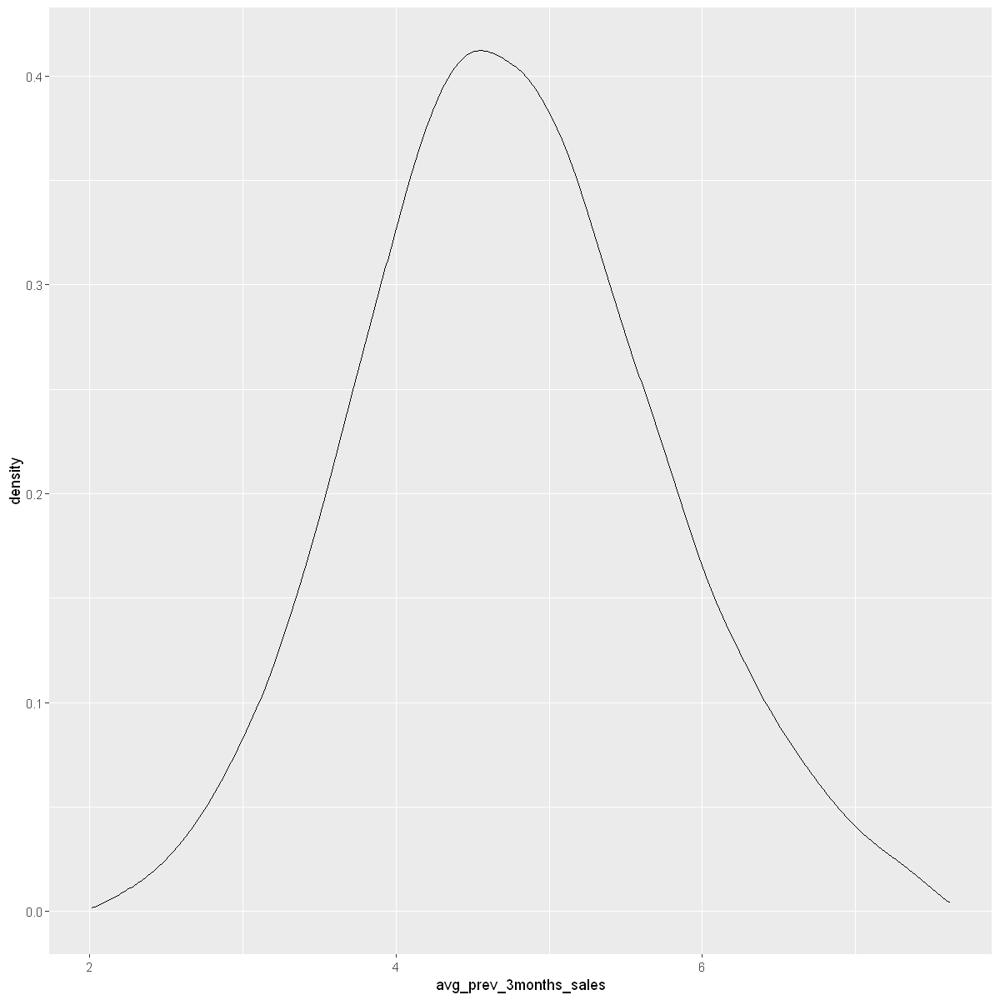

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


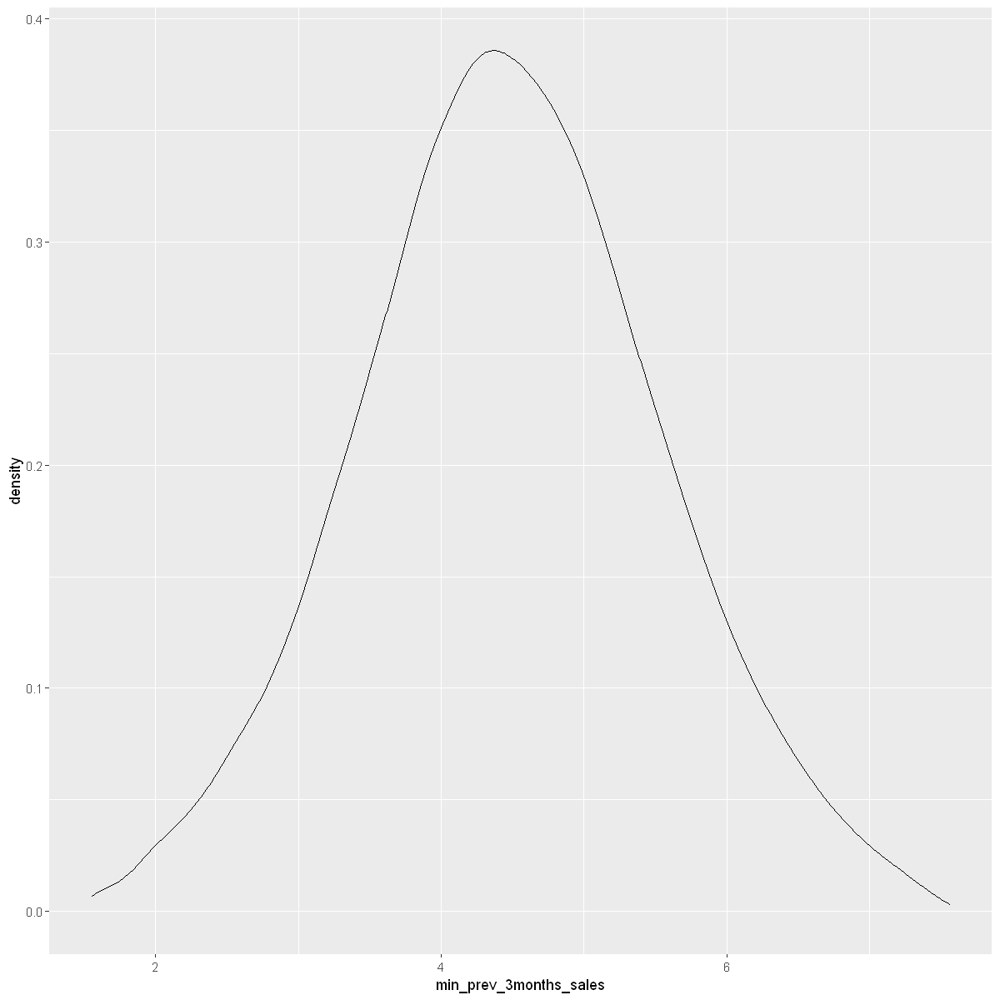

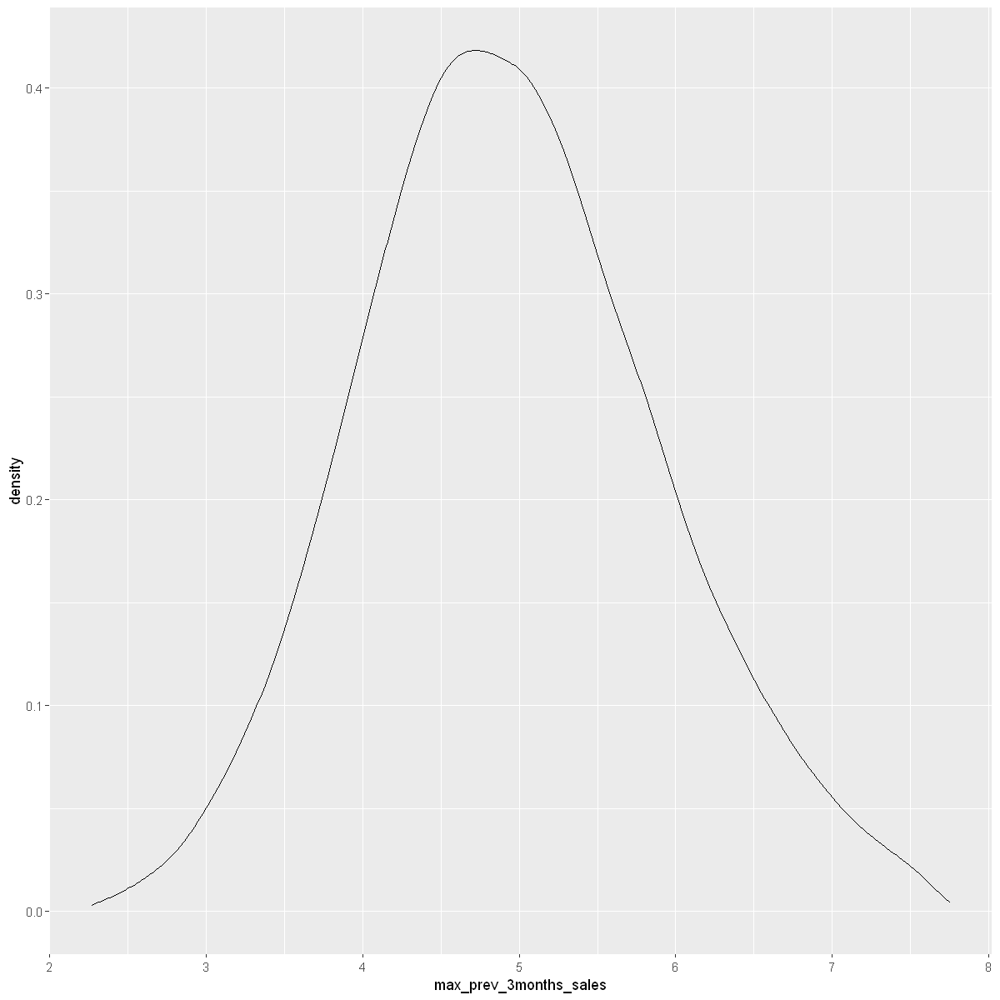

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."
Warning message:
"Computation failed in `stat_density()`:
cannot allocate vector of size 6.6 Mb"


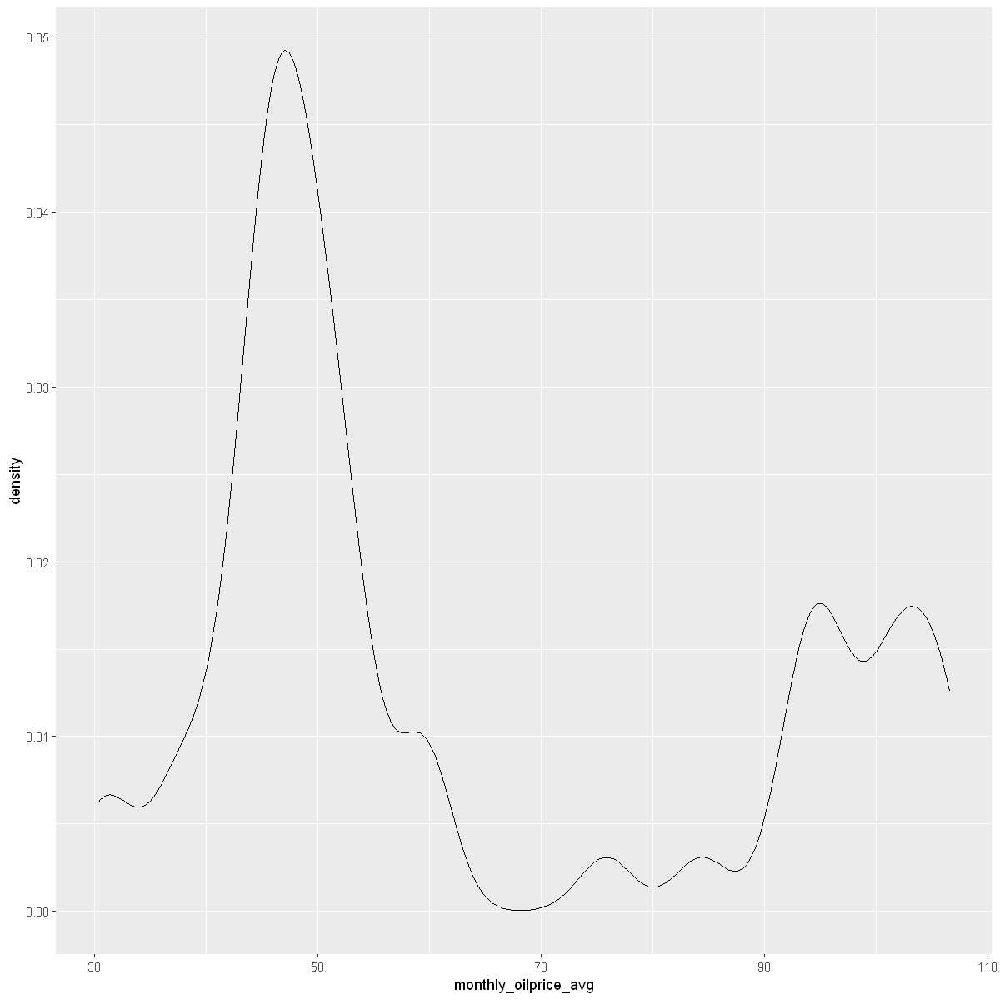

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


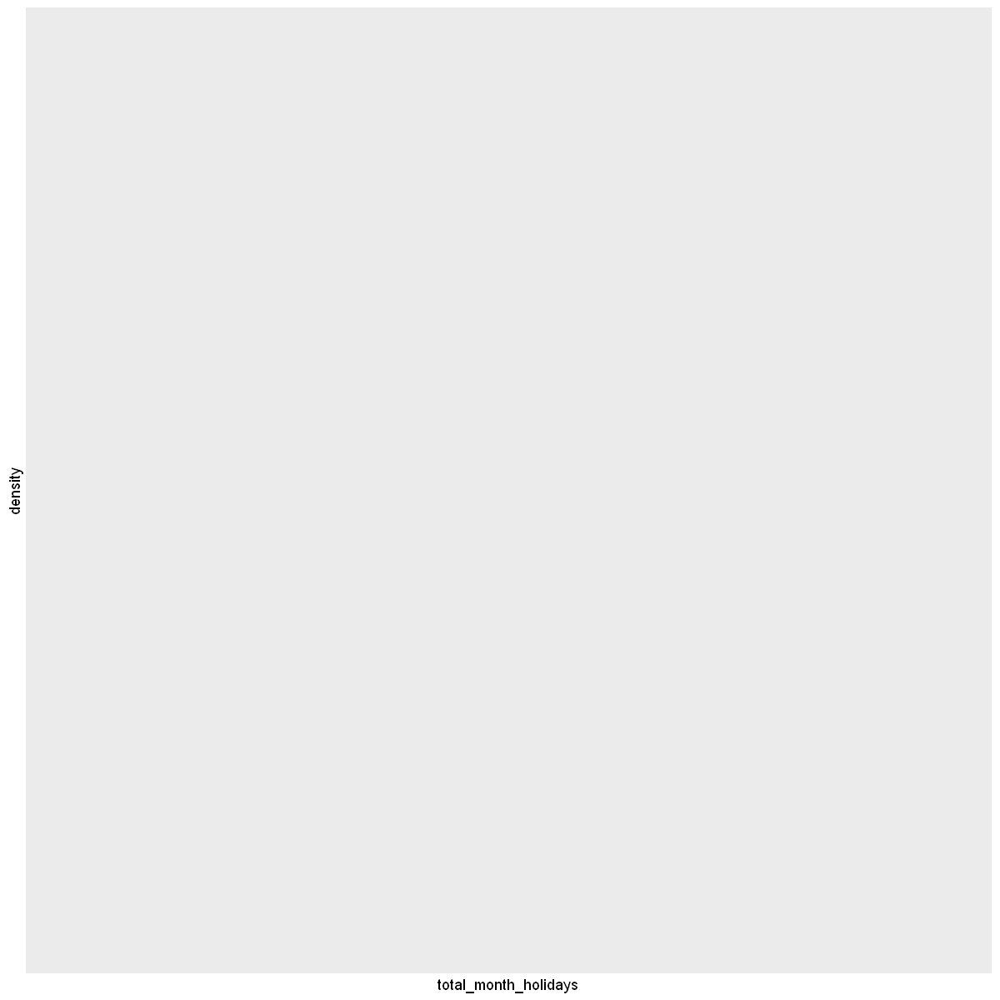

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


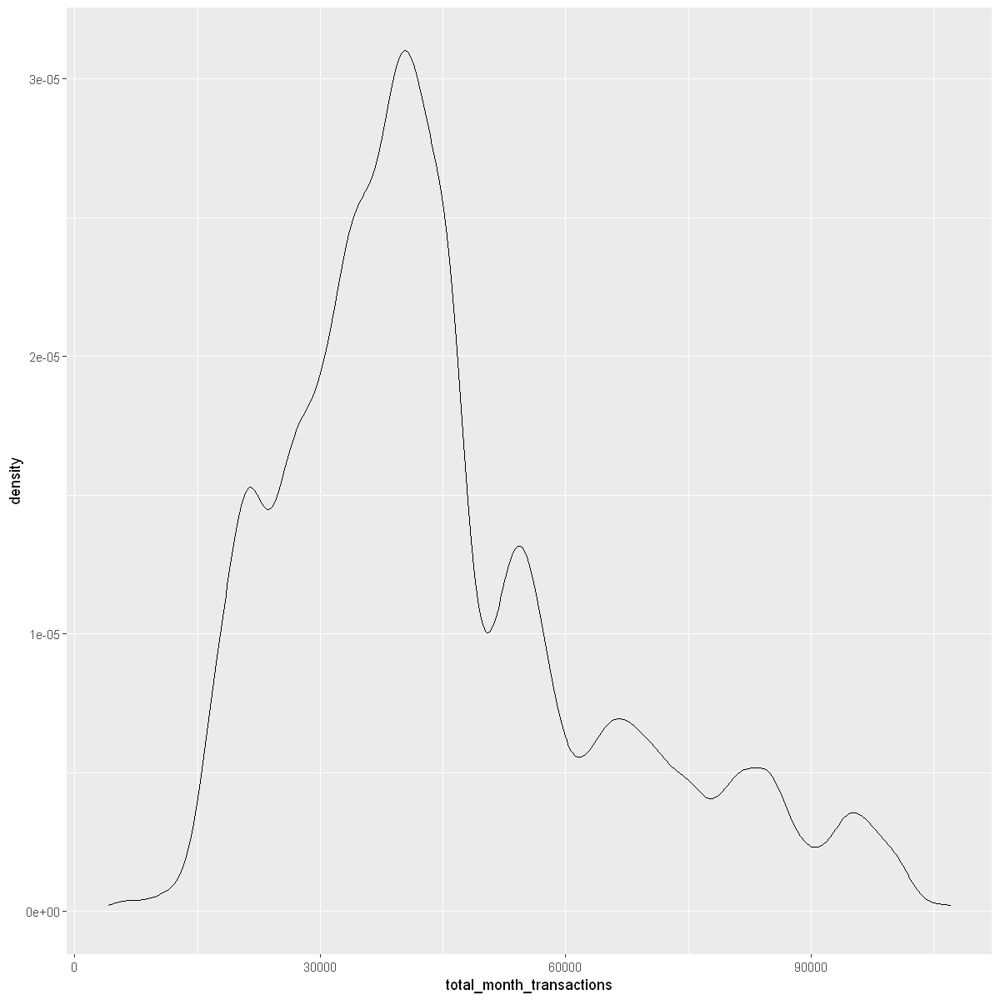

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


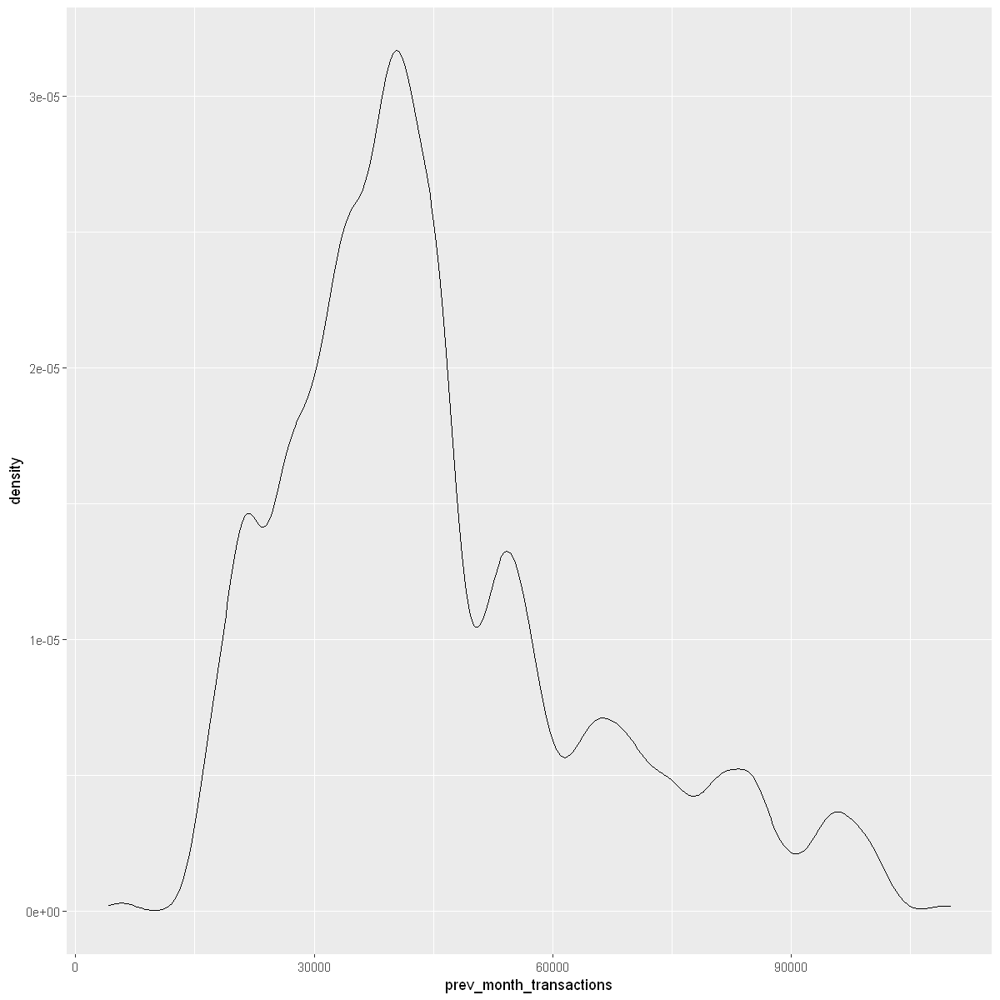

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


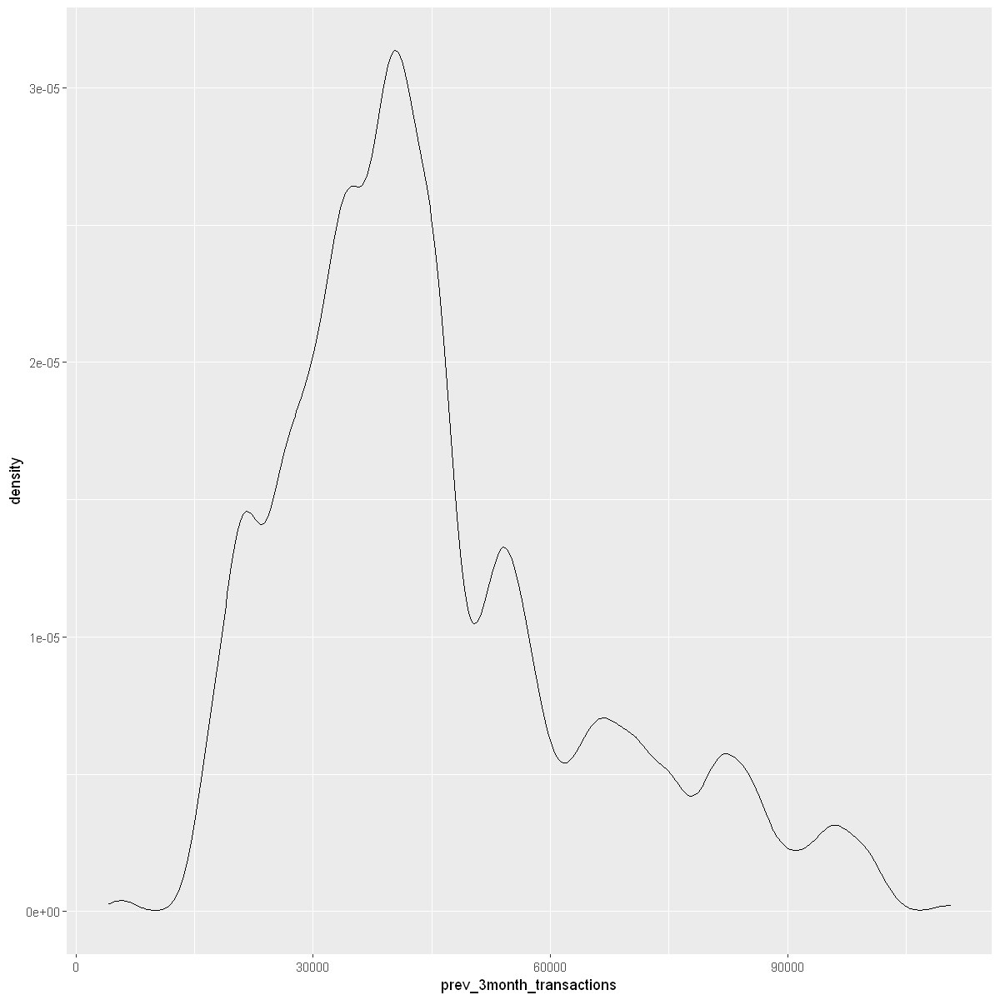

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


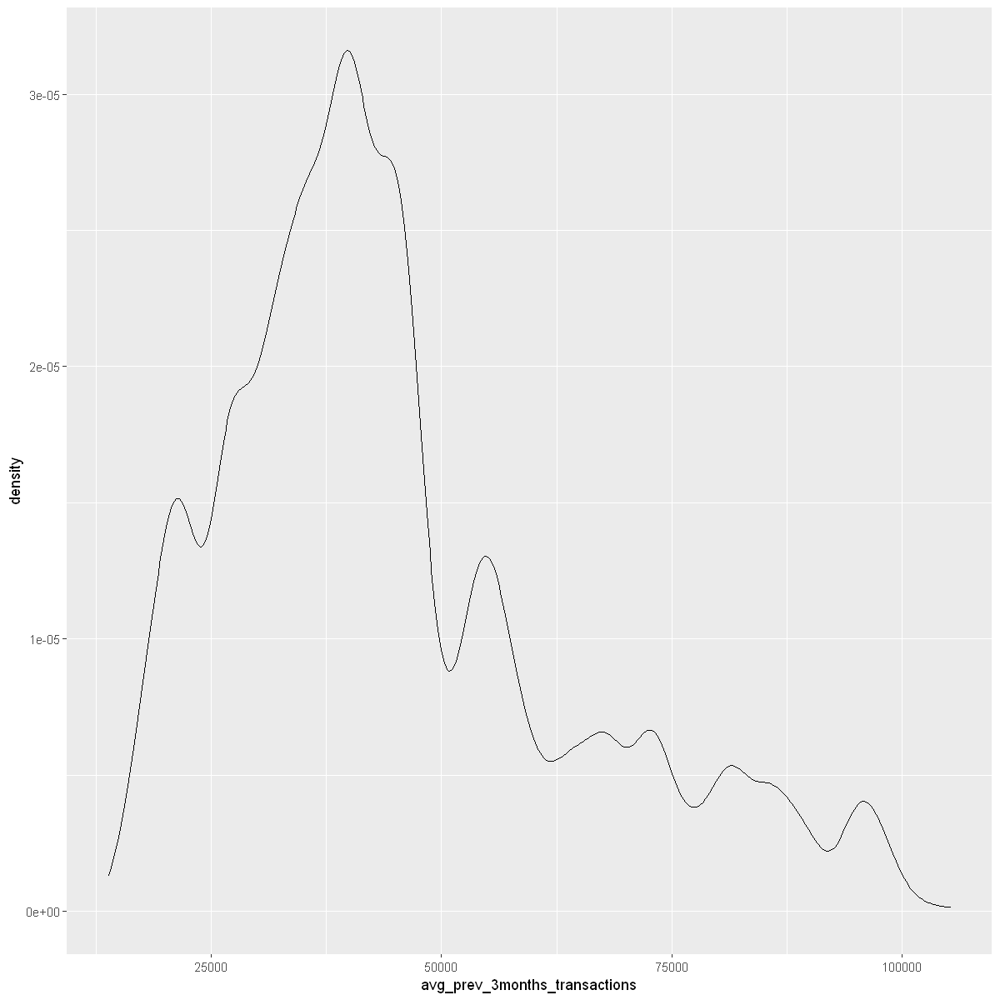

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


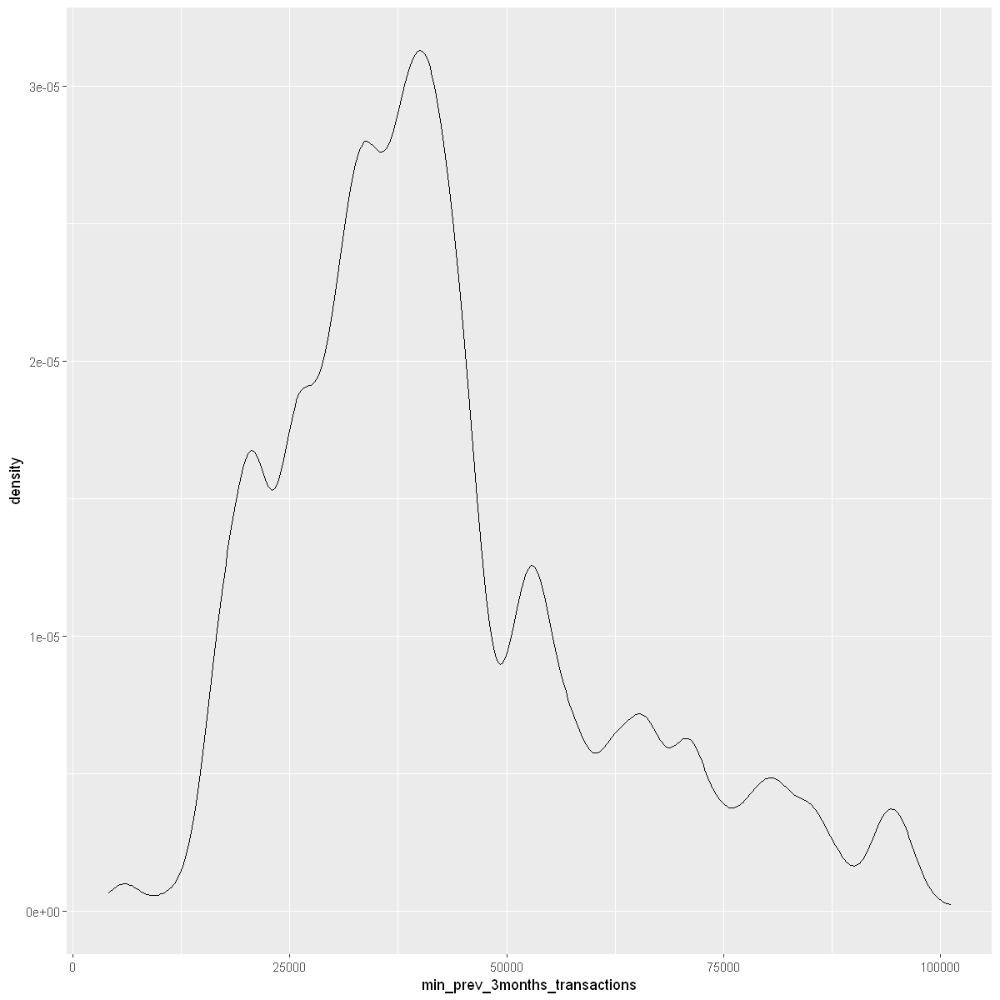

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


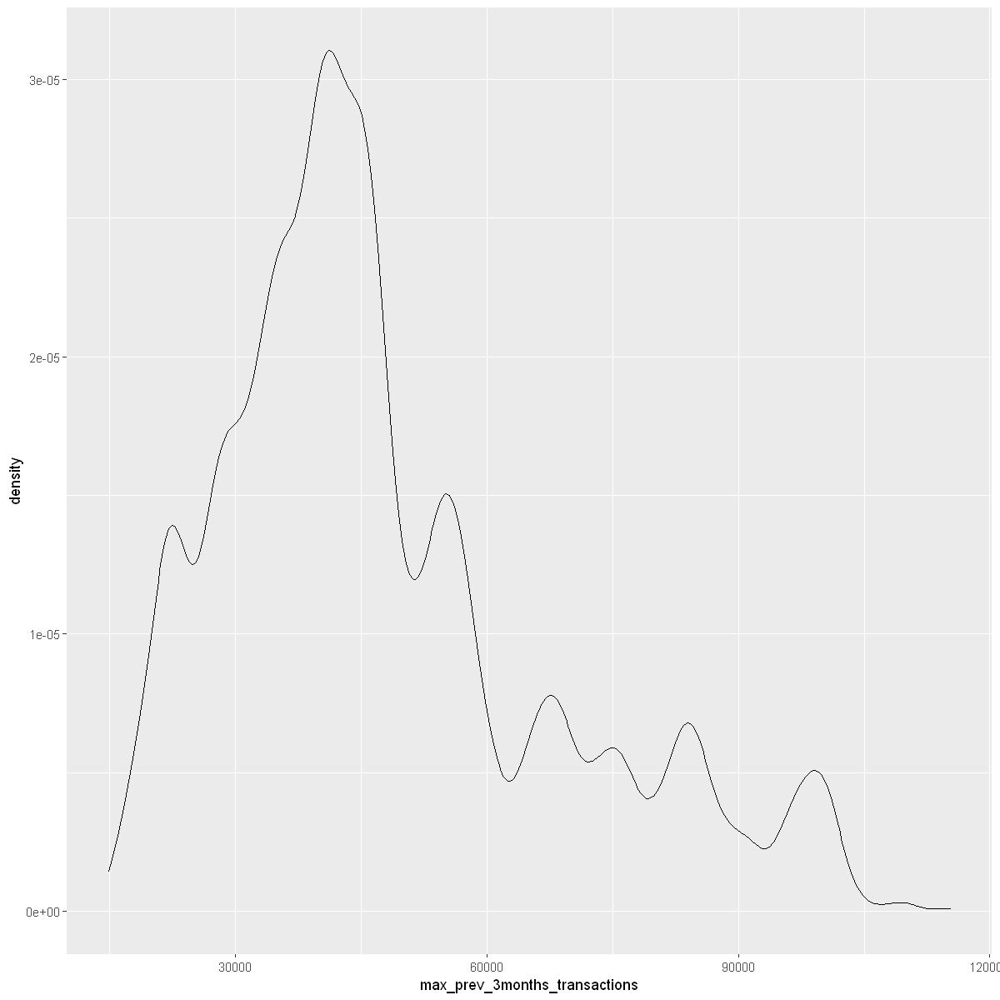

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


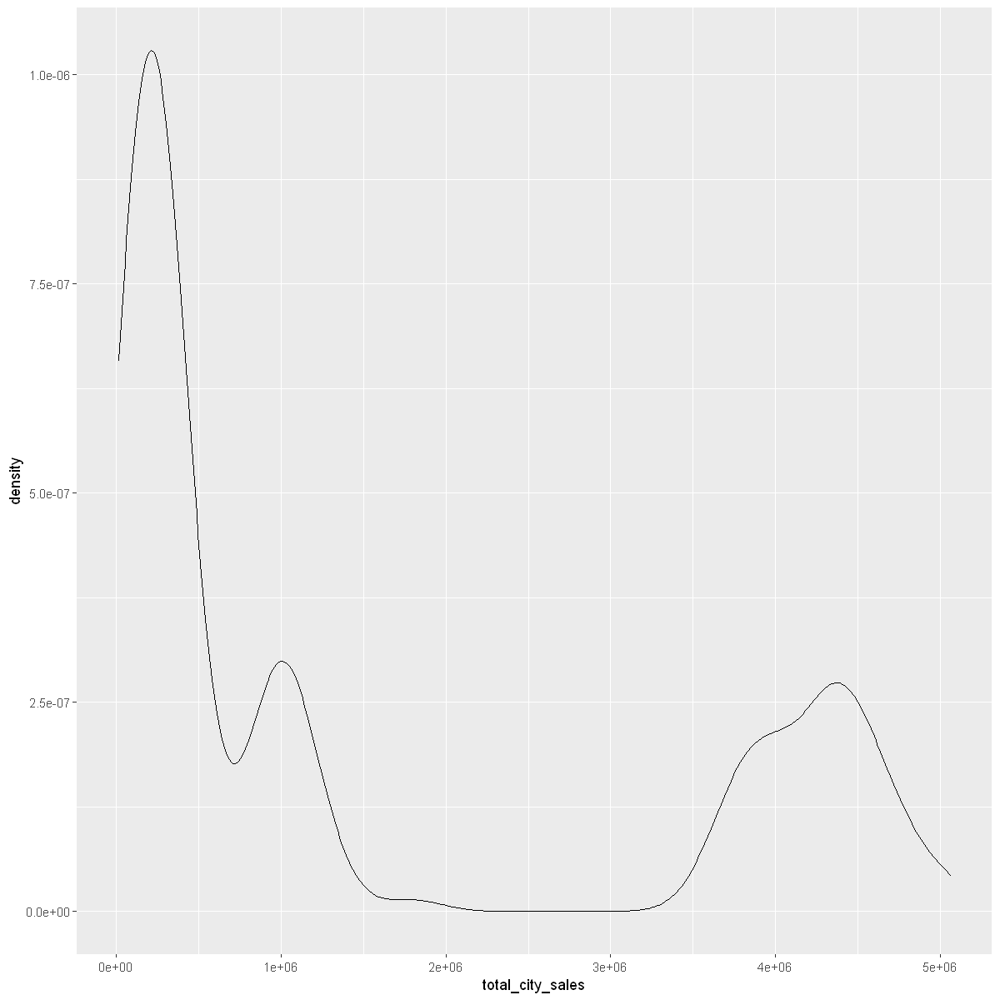

Warning message:
"Use of `df3[[v]]` is discouraged. Use `.data[[v]]` instead."


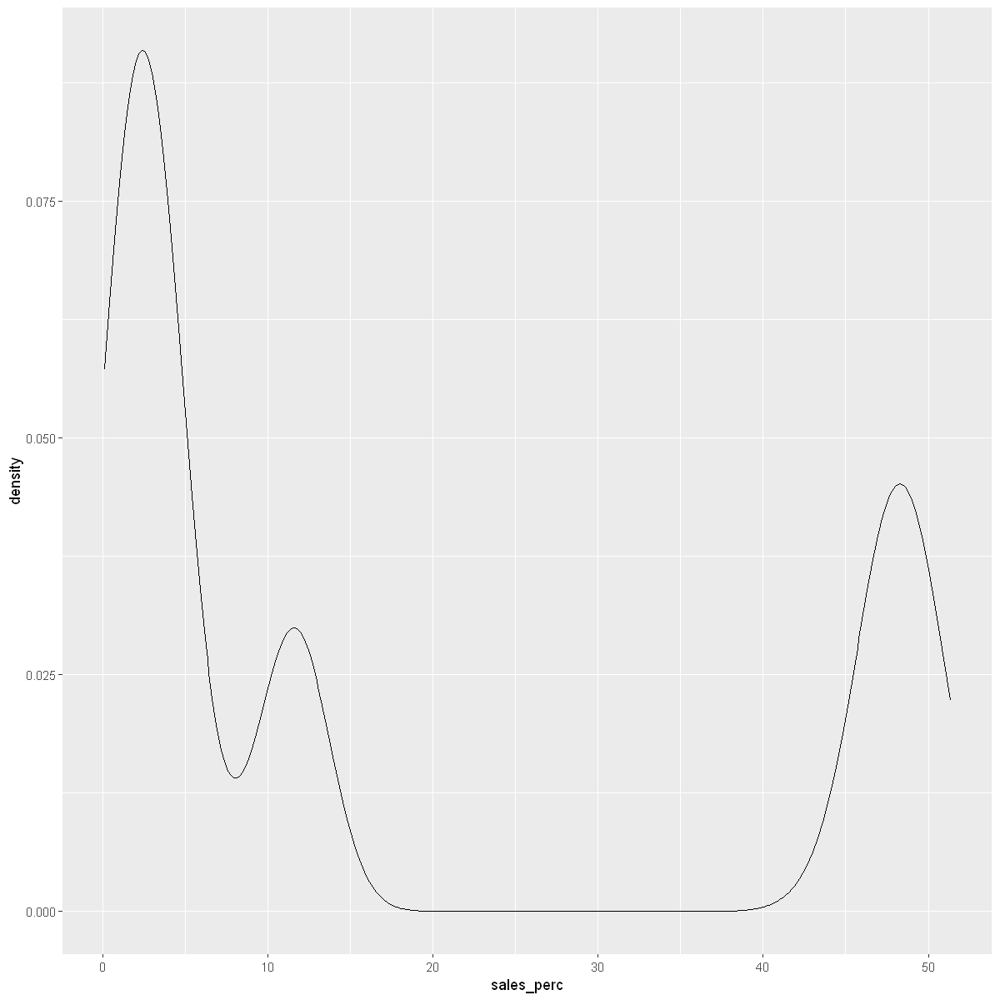

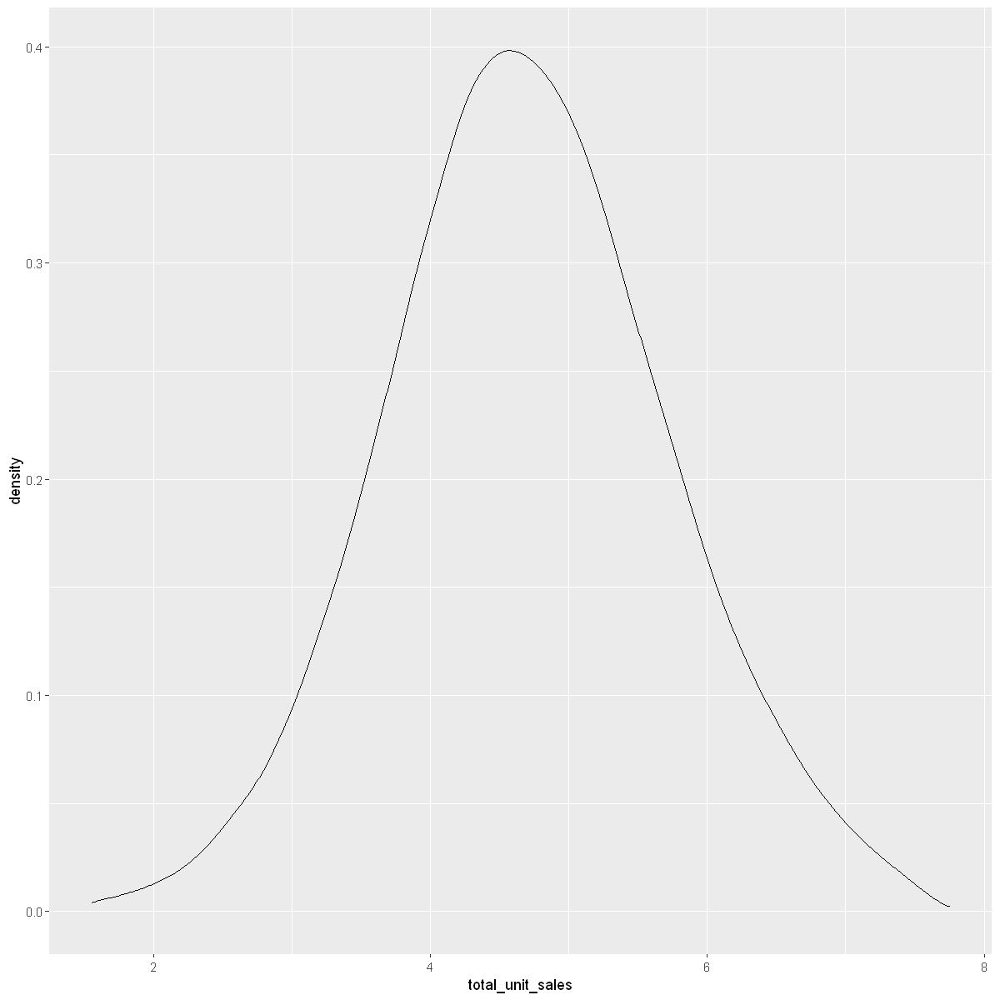

In [111]:
for (v in nf1){
    print((ggplot(df3,aes(x=df3[[v]])) +
    geom_density(adjust=2) + xlab(v)))
}

In [114]:
library(pastecs)
stat.desc(df3)

Warning message:
"package 'pastecs' was built under R version 3.6.3"

Attaching package: 'pastecs'


The following objects are masked from 'package:dplyr':

    first, last




,id,item_nbr,store_nbr,Year,month,city,state,store_type,store_cluster,prev_month_sales,...,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17,total_unit_sales
,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
nbr.val,1.737726e+06,NA,NA,1.737726e+06,1.737726e+06,NA,NA,NA,NA,1.737726e+06,...,1.737726e+06,1.737726e+06,1.737726e+06,1.737726e+06,1.737726e+06,1.737726e+06,1.737726e+06,1.737726e+06,1.737726e+06,1.737726e+06
nbr.null,0.000000e+00,NA,NA,0.000000e+00,0.000000e+00,NA,NA,NA,NA,0.000000e+00,...,1.659739e+06,1.527652e+06,1.702743e+06,1.699794e+06,1.589353e+06,1.662349e+06,1.553640e+06,1.700681e+06,1.698534e+06,0.000000e+00
nbr.na,0.000000e+00,NA,NA,0.000000e+00,0.000000e+00,NA,NA,NA,NA,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
min,1.000000e+00,NA,NA,2.013000e+03,1.000000e+00,NA,NA,NA,NA,1.926145e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.556459e+00
max,1.975242e+06,NA,NA,2.017000e+03,1.200000e+01,NA,NA,NA,NA,7.667158e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,7.749322e+00
range,1.975241e+06,NA,NA,4.000000e+00,1.100000e+01,NA,NA,NA,NA,5.741014e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,6.192863e+00
sum,1.717306e+12,NA,NA,3.501704e+09,1.138593e+07,NA,NA,NA,NA,8.211232e+06,...,7.798700e+04,2.100740e+05,3.498300e+04,3.793200e+04,1.483730e+05,7.537700e+04,1.840860e+05,3.704500e+04,3.919200e+04,8.169918e+06
median,9.883645e+05,NA,NA,2.015000e+03,7.000000e+00,NA,NA,NA,NA,4.700480e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.682131e+00
mean,9.882489e+05,NA,NA,2.015107e+03,6.552201e+00,NA,NA,NA,NA,4.725275e+00,...,4.487877e-02,1.208902e-01,2.013148e-02,2.182853e-02,8.538343e-02,4.337680e-02,1.059350e-01,2.131809e-02,2.255361e-02,4.701499e+00
